In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

In [ ]:
sentence_glosses = pd.read_csv('/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/corpus_csv_files/ISL Corpus sign glosses.csv')

In [ ]:
sentence_glosses

,Sentence,SIGN GLOSSES
0,are you free today,YOU FREE TODAY
1,are you hiding something,YOU HIDE SOMETHING
2,bring water for me,BRING WATER ME
3,can i help you,I HELP YOU
4,can you repeat that please,YOU REPEAT PLEASE
...,...,...
96,you are good,YOU GOOD
97,you are welcome,YOU WELCOME
98,you can do it,YOU DO IT
99,"you do anything, i do not care","YOU DO ANYTHING, I DO NOT CARE"


In [ ]:
import tensorflow as tf
import sentencepiece as spm
import joblib
import os

# Load trained SentencePiece model
sp = spm.SentencePieceProcessor()
sp.load("gloss_tokenizer.model")

# Tokenize glosses
tokenized = [sp.encode_as_ids(gloss) for gloss in sentence_glosses['SIGN GLOSSES']]
max_len = max(len(t) for t in tokenized)

# Pad
padded = tf.keras.preprocessing.sequence.pad_sequences(tokenized, maxlen=max_len, padding='post')

# Embed
VOCAB_SIZE = sp.get_piece_size()
EMBED_DIM = 190

embedding_layer = tf.keras.layers.Embedding(input_dim=VOCAB_SIZE, output_dim=EMBED_DIM)
embedded = embedding_layer(padded).numpy()


In [ ]:
save_dir = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/GUMBEL_GLOSS_EMBEDS"
os.makedirs(save_dir, exist_ok=True)

for idx, (sentence, gloss, token_ids, emb) in enumerate(zip(
    sentence_glosses['Sentence'],
    sentence_glosses['SIGN GLOSSES'],
    padded,
    embedded
)):
    file_name = f"{idx:03d}_" + sentence.replace(" ", "_").lower() + ".pkl"
    joblib.dump({
        'sentence': sentence,
        'gloss': gloss,
        'token_ids': token_ids,
        'embedding': emb  # shape: (max_len, embed_dim)
    }, os.path.join(save_dir, file_name))


In [ ]:
print(sentence_glosses["TOKEN_IDS"].iloc[0])
# [10, 45, 98]  → YOU GO SCHOOL (for example)


[3, 38, 86, 36, 114, 8]


In [ ]:
import tensorflow as tf

VOCAB_SIZE = sp.get_piece_size()
EMBED_DIM = 190  # tweak as needed

gloss_embedding = tf.keras.layers.Embedding(
    input_dim=VOCAB_SIZE,
    output_dim=EMBED_DIM,
    name="Gloss_Embedding"
)



(1, 3, 190)


In [ ]:
spm.SentencePieceTrainer.train(
    input='glosses.txt',  # one gloss sentence per line
    model_prefix='gloss_tokenizer_unigram',
    vocab_size=190,
    model_type='unigram'
)

In [ ]:
import os
import joblib
import numpy as np
import tensorflow as tf
from tqdm import tqdm
import sentencepiece as spm

# --- Load SentencePiece ---
sp = spm.SentencePieceProcessor()
sp.load("gloss_tokenizer_unigram.model")

# --- Constants ---
EMBED_DIM = 190
VOCAB_SIZE = sp.get_piece_size()
MAX_LEN = 20

# --- Gloss Embedding Layer ---
gloss_embedding = tf.keras.layers.Embedding(
    input_dim=VOCAB_SIZE,
    output_dim=EMBED_DIM,
    name="Gloss_Embedding"
)

# --- Gloss Tokenization + Padding ---
tokenized = [sp.encode(g, out_type=int) for g in sentence_glosses['SIGN GLOSSES']]
padded = tf.keras.preprocessing.sequence.pad_sequences(tokenized, maxlen=MAX_LEN, padding='post', truncating='post')

# --- Embed Tokens ---
embedded = gloss_embedding(padded).numpy()  # Shape: (num_sentences, max_len, embed_dim)

# --- Save Each Sentence Gloss Embedding ---
save_dir = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/GUMBEL_GLOSS_EMBEDS_FINAL"
os.makedirs(save_dir, exist_ok=True)

for idx, (sentence, gloss, token_ids, emb) in tqdm(enumerate(zip(
    sentence_glosses['Sentence'],
    sentence_glosses['SIGN GLOSSES'],
    padded,
    embedded
)), total=len(sentence_glosses)):
    file_name = f"{idx:03d}_" + sentence.replace(" ", "_").lower() + ".pkl"
    joblib.dump({
        'sentence': sentence,
        'gloss': gloss,
        'token_ids': token_ids.tolist(),
        'embedding': emb
    }, os.path.join(save_dir, file_name))

# --- Save Full Token Embedding Matrix ---
token_embed_matrix = gloss_embedding.weights[0].numpy()  # shape: (vocab_size, embed_dim)
token_list = [sp.id_to_piece(i) for i in range(VOCAB_SIZE)]

joblib.dump({
    'token_embeddings': token_embed_matrix,
    'tokens': token_list
}, os.path.join(save_dir, "token_embedding_matrix.pkl"))

print(f"✅ Saved gloss embeddings and token embedding matrix to: {save_dir}")


100%|██████████| 101/101 [00:00<00:00, 147.50it/s]

✅ Saved gloss embeddings and token embedding matrix to: /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/GUMBEL_GLOSS_EMBEDS_FINAL


In [ ]:
base_path = '/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level'

In [ ]:
!pip install sentence-transformers


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 107.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 89.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

In [ ]:
import os
import joblib
import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.decomposition import PCA
from sentence_transformers import SentenceTransformer
import tensorflow as tf

# --- Load SBERT model ---
sbert = SentenceTransformer('all-MiniLM-L6-v2')  # returns 384-dim embeddings

# --- Your input dataframe ---
# sentence_glosses = pd.read_csv('your_path.csv')  # make sure it’s loaded before this

# --- Get SBERT Embeddings (384 dim) ---
raw_embeddings = sbert.encode(sentence_glosses['SIGN GLOSSES'].tolist(), show_progress_bar=True)

# --- Reduce Dim to 100 using PCA ---
pca = PCA(n_components=100)
reduced_embeddings = pca.fit_transform(raw_embeddings)  # shape: (num_sentences, 100)

# --- Reshape to (12, embed_dim) by repeating or truncating ---
MAX_LEN = 15
EMBED_DIM = 100

processed_embeddings = []
for emb in reduced_embeddings:
    # Repeat and trim
    repeated = np.tile(emb, (MAX_LEN, 1))[:MAX_LEN]  # shape: (12, 100)
    processed_embeddings.append(repeated)

processed_embeddings = np.stack(processed_embeddings)  # shape: (num_samples, 12, 100)

# --- Save Each SBERT-based Gloss Embedding ---
save_dir = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/SBERT_GLOSS_EMBEDS_FINAL_V3"
os.makedirs(save_dir, exist_ok=True)

for idx, (sentence, gloss, emb) in tqdm(enumerate(zip(
    sentence_glosses['Sentence'],
    sentence_glosses['SIGN GLOSSES'],
    processed_embeddings
)), total=len(sentence_glosses)):
    file_name = f"{idx:03d}_" + sentence.replace(" ", "_").lower() + ".pkl"
    joblib.dump({
        'sentence': sentence,
        'gloss': gloss,
        'embedding': emb
    }, os.path.join(save_dir, file_name))

print(f"✅ Saved SBERT-based gloss embeddings to: {save_dir}")


Batches:   0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 101/101 [00:00<00:00, 191.00it/s]

✅ Saved SBERT-based gloss embeddings to: /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/SBERT_GLOSS_EMBEDS_FINAL_V3


In [ ]:
import os
import cv2
import numpy as np
import mediapipe as mp
import matplotlib.pyplot as plt
from tqdm import tqdm

# Initialize MediaPipe modules with confidence threshold 0.35
mp_hands = mp.solutions.hands.Hands(static_image_mode=True, max_num_hands=2, min_detection_confidence=0.35)
mp_face_mesh = mp.solutions.face_mesh.FaceMesh(static_image_mode=True, min_detection_confidence=0.35)

# Paths
output_base_path = '/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames'
os.makedirs(output_base_path, exist_ok=True)

# Draw landmarks on image
def draw_landmarks(image, results_hands, results_face):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    if results_hands.multi_hand_landmarks:
        for hand_landmarks in results_hands.multi_hand_landmarks:
            mp.solutions.drawing_utils.draw_landmarks(
                image_rgb, hand_landmarks, mp.solutions.hands.HAND_CONNECTIONS)

    if results_face.multi_face_landmarks:
        for face_landmarks in results_face.multi_face_landmarks:
            mp.solutions.drawing_utils.draw_landmarks(
                image_rgb, face_landmarks, mp.solutions.face_mesh.FACEMESH_TESSELATION)
    return image_rgb

# Process the frames and save them
def process_frame(frame_path, sentence_name, signer_num, frame_file):
    image = cv2.imread(frame_path)
    if image is None:
        print(f"Failed to read {frame_path}")
        return

    # Detect landmarks on the original color image
    results_hands = mp_hands.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    results_face = mp_face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Draw landmarks
    landmark_image = draw_landmarks(image.copy(), results_hands, results_face)

    # Save the image with landmarks
    output_folder_path = os.path.join(output_base_path, sentence_name, str(signer_num))
    os.makedirs(output_folder_path, exist_ok=True)
    cv2.imwrite(os.path.join(output_folder_path, frame_file), cv2.cvtColor(landmark_image, cv2.COLOR_RGB2BGR))

    print(f"Saved processed frame to {output_folder_path}")

# Process all frames
def process_all_frames():
    for _, row in tqdm(sentence_glosses.iterrows(), total=len(sentence_glosses), desc="Processing Sentences"):
        sentence_name = row['Sentence']
        sentence_path = os.path.join(base_path, sentence_name)
        if not os.path.exists(sentence_path):
            print(f"Folder not found: {sentence_path}")
            continue

        for signer_num in tqdm(os.listdir(sentence_path), desc=f"Processing Signers in {sentence_name}", leave=False):
            signer_path = os.path.join(sentence_path, signer_num)
            if not os.path.isdir(signer_path):
                continue

            for frame_file in tqdm(os.listdir(signer_path), desc=f"Processing Frames for Signer {signer_num}", leave=False):
                frame_path = os.path.join(signer_path, frame_file)
                process_frame(frame_path, sentence_name, signer_num, frame_file)

process_all_frames()


Processing Signers in are you free today:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:04,  5.38it/s]

Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:02,  7.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:00<00:02,  8.96it/s]

Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:00<00:01,  9.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:00<00:01,  9.07it/s]

Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:00<00:01,  9.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:01<00:01,  9.21it/s]

Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:01<00:01,  9.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:01<00:01,  9.40it/s]

Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:01<00:01,  9.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:01<00:00,  9.59it/s]

Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:01<00:00,  9.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:01<00:00, 10.10it/s]

Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:01<00:00, 10.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:02<00:00, 13.04it/s]

                                                                               
Processing Signers in are you free today:  14%|█▍        | 1/7 [00:02<00:13,  2.26s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you free today/1/Thumbs.db
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/1




Processing Frames for Signer 2:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 2:  15%|█▌        | 2/13 [00:00<00:01, 10.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2




Processing Frames for Signer 2:  31%|███       | 4/13 [00:00<00:00, 10.88it/s]

Processing Frames for Signer 2:  46%|████▌     | 6/13 [00:00<00:00, 10.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2




Processing Frames for Signer 2:  62%|██████▏   | 8/13 [00:00<00:00, 10.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2




Processing Frames for Signer 2:  77%|███████▋  | 10/13 [00:00<00:00, 11.23it/s]

Processing Frames for Signer 2:  92%|█████████▏| 12/13 [00:01<00:00, 11.55it/s]

                                                                               
Processing Signers in are you free today:  29%|██▊       | 2/7 [00:03<00:07,  1.57s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/2
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you free today/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/43 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/43 [00:00<00:04,  8.70it/s]

Processing Frames for Signer 3:   5%|▍         | 2/43 [00:00<00:04,  8.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:   7%|▋         | 3/43 [00:00<00:04,  8.44it/s]

Processing Frames for Signer 3:   9%|▉         | 4/43 [00:00<00:04,  7.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  12%|█▏        | 5/43 [00:00<00:05,  7.23it/s]

Processing Frames for Signer 3:  14%|█▍        | 6/43 [00:00<00:05,  7.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  16%|█▋        | 7/43 [00:00<00:05,  7.05it/s]

Processing Frames for Signer 3:  19%|█▊        | 8/43 [00:01<00:04,  7.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  21%|██        | 9/43 [00:01<00:04,  7.12it/s]

Processing Frames for Signer 3:  23%|██▎       | 10/43 [00:01<00:04,  7.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  26%|██▌       | 11/43 [00:01<00:04,  6.82it/s]

Processing Frames for Signer 3:  28%|██▊       | 12/43 [00:01<00:04,  6.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  30%|███       | 13/43 [00:01<00:04,  6.88it/s]

Processing Frames for Signer 3:  33%|███▎      | 14/43 [00:01<00:04,  6.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  35%|███▍      | 15/43 [00:02<00:04,  7.00it/s]

Processing Frames for Signer 3:  37%|███▋      | 16/43 [00:02<00:03,  6.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  40%|███▉      | 17/43 [00:02<00:03,  6.81it/s]

Processing Frames for Signer 3:  42%|████▏     | 18/43 [00:02<00:03,  6.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you free today/3/Thumbs.db




Processing Frames for Signer 3:  47%|████▋     | 20/43 [00:02<00:02,  8.61it/s]

Processing Frames for Signer 3:  49%|████▉     | 21/43 [00:02<00:02,  8.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  51%|█████     | 22/43 [00:02<00:02,  8.77it/s]

Processing Frames for Signer 3:  53%|█████▎    | 23/43 [00:03<00:02,  8.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  56%|█████▌    | 24/43 [00:03<00:02,  7.80it/s]



Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3


Processing Frames for Signer 3:  58%|█████▊    | 25/43 [00:03<00:02,  6.73it/s]

Processing Frames for Signer 3:  60%|██████    | 26/43 [00:03<00:03,  5.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  63%|██████▎   | 27/43 [00:03<00:03,  5.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  65%|██████▌   | 28/43 [00:04<00:02,  5.15it/s]

Processing Frames for Signer 3:  67%|██████▋   | 29/43 [00:04<00:03,  4.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  70%|██████▉   | 30/43 [00:04<00:03,  3.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  72%|███████▏  | 31/43 [00:05<00:03,  3.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  74%|███████▍  | 32/43 [00:05<00:03,  3.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  77%|███████▋  | 33/43 [00:05<00:02,  3.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  79%|███████▉  | 34/43 [00:05<00:02,  3.77it/s]

Processing Frames for Signer 3:  81%|████████▏ | 35/43 [00:06<00:01,  4.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  84%|████████▎ | 36/43 [00:06<00:01,  4.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  86%|████████▌ | 37/43 [00:06<00:01,  4.67it/s]

Processing Frames for Signer 3:  88%|████████▊ | 38/43 [00:06<00:01,  4.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  91%|█████████ | 39/43 [00:06<00:00,  4.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  93%|█████████▎| 40/43 [00:07<00:00,  4.63it/s]

Processing Frames for Signer 3:  95%|█████████▌| 41/43 [00:07<00:00,  4.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 3:  98%|█████████▊| 42/43 [00:07<00:00,  4.73it/s]

Processing Frames for Signer 3: 100%|██████████| 43/43 [00:07<00:00,  4.95it/s]

                                                                               
Processing Signers in are you free today:  43%|████▎     | 3/7 [00:11<00:17,  4.37s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/3




Processing Frames for Signer 4:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/33 [00:00<00:05,  6.23it/s]

Processing Frames for Signer 4:   6%|▌         | 2/33 [00:00<00:04,  6.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:   9%|▉         | 3/33 [00:00<00:04,  7.03it/s]

Processing Frames for Signer 4:  12%|█▏        | 4/33 [00:00<00:04,  6.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  15%|█▌        | 5/33 [00:00<00:04,  6.48it/s]

Processing Frames for Signer 4:  18%|█▊        | 6/33 [00:00<00:04,  6.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  21%|██        | 7/33 [00:01<00:03,  6.77it/s]

Processing Frames for Signer 4:  24%|██▍       | 8/33 [00:01<00:03,  6.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  27%|██▋       | 9/33 [00:01<00:03,  7.16it/s]

Processing Frames for Signer 4:  30%|███       | 10/33 [00:01<00:03,  7.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  33%|███▎      | 11/33 [00:01<00:02,  7.37it/s]

Processing Frames for Signer 4:  36%|███▋      | 12/33 [00:01<00:02,  7.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  39%|███▉      | 13/33 [00:01<00:02,  7.18it/s]

Processing Frames for Signer 4:  42%|████▏     | 14/33 [00:02<00:02,  6.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  45%|████▌     | 15/33 [00:02<00:02,  6.42it/s]

Processing Frames for Signer 4:  48%|████▊     | 16/33 [00:02<00:02,  6.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  52%|█████▏    | 17/33 [00:02<00:02,  6.85it/s]

Processing Frames for Signer 4:  55%|█████▍    | 18/33 [00:02<00:02,  6.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  58%|█████▊    | 19/33 [00:02<00:01,  7.08it/s]

Processing Frames for Signer 4:  61%|██████    | 20/33 [00:02<00:01,  7.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  64%|██████▎   | 21/33 [00:03<00:01,  7.46it/s]

Processing Frames for Signer 4:  67%|██████▋   | 22/33 [00:03<00:01,  7.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  70%|██████▉   | 23/33 [00:03<00:01,  7.22it/s]

Processing Frames for Signer 4:  73%|███████▎  | 24/33 [00:03<00:01,  7.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  76%|███████▌  | 25/33 [00:03<00:01,  7.58it/s]

Processing Frames for Signer 4:  79%|███████▉  | 26/33 [00:03<00:00,  7.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  82%|████████▏ | 27/33 [00:03<00:00,  7.34it/s]

Processing Frames for Signer 4:  85%|████████▍ | 28/33 [00:03<00:00,  7.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  88%|████████▊ | 29/33 [00:04<00:00,  7.18it/s]

Processing Frames for Signer 4:  91%|█████████ | 30/33 [00:04<00:00,  7.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4




Processing Frames for Signer 4:  94%|█████████▍| 31/33 [00:04<00:00,  7.04it/s]

Processing Frames for Signer 4:  97%|█████████▋| 32/33 [00:04<00:00,  7.16it/s]

                                                                               
Processing Signers in are you free today:  57%|█████▋    | 4/7 [00:15<00:13,  4.44s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/4
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you free today/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/41 [00:00<00:04,  8.34it/s]

Processing Frames for Signer 5:   5%|▍         | 2/41 [00:00<00:05,  7.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:   7%|▋         | 3/41 [00:00<00:04,  7.98it/s]

Processing Frames for Signer 5:  10%|▉         | 4/41 [00:00<00:04,  8.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  12%|█▏        | 5/41 [00:00<00:04,  8.39it/s]

Processing Frames for Signer 5:  15%|█▍        | 6/41 [00:00<00:04,  8.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  17%|█▋        | 7/41 [00:00<00:04,  7.86it/s]

Processing Frames for Signer 5:  20%|█▉        | 8/41 [00:00<00:04,  8.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  22%|██▏       | 9/41 [00:01<00:03,  8.07it/s]

Processing Frames for Signer 5:  24%|██▍       | 10/41 [00:01<00:03,  7.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  27%|██▋       | 11/41 [00:01<00:03,  8.09it/s]

Processing Frames for Signer 5:  29%|██▉       | 12/41 [00:01<00:03,  8.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  32%|███▏      | 13/41 [00:01<00:03,  8.23it/s]

Processing Frames for Signer 5:  34%|███▍      | 14/41 [00:01<00:03,  8.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  37%|███▋      | 15/41 [00:01<00:03,  8.02it/s]

Processing Frames for Signer 5:  39%|███▉      | 16/41 [00:01<00:03,  8.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  41%|████▏     | 17/41 [00:02<00:03,  7.61it/s]

Processing Frames for Signer 5:  44%|████▍     | 18/41 [00:02<00:03,  7.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  46%|████▋     | 19/41 [00:02<00:02,  7.46it/s]

Processing Frames for Signer 5:  49%|████▉     | 20/41 [00:02<00:02,  7.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  51%|█████     | 21/41 [00:02<00:02,  7.76it/s]

Processing Frames for Signer 5:  54%|█████▎    | 22/41 [00:02<00:02,  7.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  56%|█████▌    | 23/41 [00:02<00:02,  7.74it/s]

Processing Frames for Signer 5:  59%|█████▊    | 24/41 [00:03<00:02,  8.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  61%|██████    | 25/41 [00:03<00:02,  7.99it/s]

Processing Frames for Signer 5:  63%|██████▎   | 26/41 [00:03<00:01,  7.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  66%|██████▌   | 27/41 [00:03<00:01,  7.95it/s]

Processing Frames for Signer 5:  68%|██████▊   | 28/41 [00:03<00:01,  7.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  71%|███████   | 29/41 [00:03<00:01,  7.62it/s]

Processing Frames for Signer 5:  73%|███████▎  | 30/41 [00:03<00:01,  7.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  76%|███████▌  | 31/41 [00:03<00:01,  7.58it/s]

Processing Frames for Signer 5:  78%|███████▊  | 32/41 [00:04<00:01,  7.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  80%|████████  | 33/41 [00:04<00:01,  7.68it/s]

Processing Frames for Signer 5:  85%|████████▌ | 35/41 [00:04<00:00, 10.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you free today/5/Thumbs.db
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  90%|█████████ | 37/41 [00:04<00:00,  9.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  93%|█████████▎| 38/41 [00:04<00:00,  8.95it/s]

Processing Frames for Signer 5:  95%|█████████▌| 39/41 [00:04<00:00,  8.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 5:  98%|█████████▊| 40/41 [00:05<00:00,  7.39it/s]

Processing Frames for Signer 5: 100%|██████████| 41/41 [00:05<00:00,  7.45it/s]

                                                                               
Processing Signers in are you free today:  71%|███████▏  | 5/7 [00:20<00:09,  4.70s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/5




Processing Frames for Signer 6:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/35 [00:00<00:05,  6.49it/s]

Processing Frames for Signer 6:   6%|▌         | 2/35 [00:00<00:04,  6.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:   9%|▊         | 3/35 [00:00<00:05,  6.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  11%|█▏        | 4/35 [00:00<00:05,  5.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  14%|█▍        | 5/35 [00:00<00:05,  5.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  17%|█▋        | 6/35 [00:01<00:06,  4.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  20%|██        | 7/35 [00:01<00:05,  4.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  23%|██▎       | 8/35 [00:01<00:05,  4.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  26%|██▌       | 9/35 [00:01<00:05,  4.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  29%|██▊       | 10/35 [00:02<00:05,  4.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  31%|███▏      | 11/35 [00:02<00:05,  4.39it/s]



Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6


Processing Frames for Signer 6:  34%|███▍      | 12/35 [00:02<00:04,  4.60it/s]

Processing Frames for Signer 6:  37%|███▋      | 13/35 [00:02<00:04,  4.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  40%|████      | 14/35 [00:02<00:04,  4.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  43%|████▎     | 15/35 [00:03<00:04,  4.61it/s]

Processing Frames for Signer 6:  46%|████▌     | 16/35 [00:03<00:03,  4.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  49%|████▊     | 17/35 [00:03<00:03,  4.84it/s]

Processing Frames for Signer 6:  51%|█████▏    | 18/35 [00:03<00:03,  4.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  54%|█████▍    | 19/35 [00:04<00:03,  4.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  57%|█████▋    | 20/35 [00:04<00:03,  4.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  60%|██████    | 21/35 [00:04<00:03,  4.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  63%|██████▎   | 22/35 [00:04<00:02,  4.40it/s]

Processing Frames for Signer 6:  66%|██████▌   | 23/35 [00:04<00:02,  4.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  69%|██████▊   | 24/35 [00:04<00:02,  5.41it/s]

Processing Frames for Signer 6:  71%|███████▏  | 25/35 [00:05<00:01,  5.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  74%|███████▍  | 26/35 [00:05<00:01,  6.00it/s]

Processing Frames for Signer 6:  77%|███████▋  | 27/35 [00:05<00:01,  6.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  80%|████████  | 28/35 [00:05<00:01,  6.15it/s]

Processing Frames for Signer 6:  83%|████████▎ | 29/35 [00:05<00:00,  6.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  86%|████████▌ | 30/35 [00:05<00:00,  6.53it/s]

Processing Frames for Signer 6:  89%|████████▊ | 31/35 [00:06<00:00,  6.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  91%|█████████▏| 32/35 [00:06<00:00,  6.50it/s]

Processing Frames for Signer 6:  94%|█████████▍| 33/35 [00:06<00:00,  6.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6




Processing Frames for Signer 6:  97%|█████████▋| 34/35 [00:06<00:00,  6.69it/s]

                                                                               
Processing Signers in are you free today:  86%|████████▌ | 6/7 [00:27<00:05,  5.31s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/6
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you free today/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/49 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/49 [00:00<00:05,  8.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:   4%|▍         | 2/49 [00:00<00:06,  6.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:   6%|▌         | 3/49 [00:00<00:06,  6.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:   8%|▊         | 4/49 [00:00<00:07,  6.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  10%|█         | 5/49 [00:00<00:06,  6.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  12%|█▏        | 6/49 [00:00<00:06,  6.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  14%|█▍        | 7/49 [00:01<00:06,  6.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  16%|█▋        | 8/49 [00:01<00:05,  7.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  18%|█▊        | 9/49 [00:01<00:05,  7.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  20%|██        | 10/49 [00:01<00:05,  7.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  22%|██▏       | 11/49 [00:01<00:05,  6.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you free today/7/Thumbs.db




Processing Frames for Signer 7:  27%|██▋       | 13/49 [00:01<00:04,  8.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  29%|██▊       | 14/49 [00:01<00:04,  8.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  31%|███       | 15/49 [00:02<00:04,  7.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  33%|███▎      | 16/49 [00:02<00:04,  6.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  35%|███▍      | 17/49 [00:02<00:04,  7.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  37%|███▋      | 18/49 [00:02<00:04,  7.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  39%|███▉      | 19/49 [00:02<00:04,  6.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  41%|████      | 20/49 [00:02<00:04,  7.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  43%|████▎     | 21/49 [00:02<00:04,  6.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  45%|████▍     | 22/49 [00:03<00:04,  6.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  47%|████▋     | 23/49 [00:03<00:03,  6.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  49%|████▉     | 24/49 [00:03<00:03,  6.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  51%|█████     | 25/49 [00:03<00:03,  6.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  53%|█████▎    | 26/49 [00:03<00:03,  6.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  55%|█████▌    | 27/49 [00:03<00:03,  6.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  57%|█████▋    | 28/49 [00:03<00:03,  6.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  59%|█████▉    | 29/49 [00:04<00:02,  6.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  61%|██████    | 30/49 [00:04<00:02,  6.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  63%|██████▎   | 31/49 [00:04<00:02,  7.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  65%|██████▌   | 32/49 [00:04<00:02,  6.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  67%|██████▋   | 33/49 [00:04<00:02,  7.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  69%|██████▉   | 34/49 [00:04<00:02,  6.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  71%|███████▏  | 35/49 [00:04<00:02,  6.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  73%|███████▎  | 36/49 [00:05<00:01,  7.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  76%|███████▌  | 37/49 [00:05<00:01,  6.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  78%|███████▊  | 38/49 [00:05<00:01,  7.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  80%|███████▉  | 39/49 [00:05<00:01,  7.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  82%|████████▏ | 40/49 [00:05<00:01,  6.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  84%|████████▎ | 41/49 [00:05<00:01,  6.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  86%|████████▌ | 42/49 [00:05<00:01,  6.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  88%|████████▊ | 43/49 [00:06<00:00,  6.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  90%|████████▉ | 44/49 [00:06<00:00,  7.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  92%|█████████▏| 45/49 [00:06<00:00,  7.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  94%|█████████▍| 46/49 [00:06<00:00,  7.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  96%|█████████▌| 47/49 [00:06<00:00,  7.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7:  98%|█████████▊| 48/49 [00:06<00:00,  7.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7




Processing Frames for Signer 7: 100%|██████████| 49/49 [00:06<00:00,  7.35it/s]

                                                                               
Processing Sentences:   1%|          | 1/101 [00:34<57:02, 34.23s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you free today/7



Processing Signers in are you hiding something:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:02,  8.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:02,  8.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:00<00:02,  8.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:00<00:02,  8.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:00<00:02,  8.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:00<00:01,  8.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:00<00:01,  8.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:00<00:01,  8.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:01<00:01,  7.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:01<00:01,  9.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:01<00:01,  9.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:01<00:01,  8.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:01<00:01,  8.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:01<00:01,  7.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:01<00:00,  7.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:02<00:00,  6.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:02<00:00,  7.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you hiding something/1/Thumbs.db




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:02<00:00, 10.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:02<00:00,  8.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:02<00:00,  8.55it/s]

                                                                               
Processing Signers in are you hiding something:  14%|█▍        | 1/7 [00:02<00:16,  2.75s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/1




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:02,  7.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:03,  6.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:00<00:02,  7.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:00<00:02,  7.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:00<00:02,  7.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:00<00:02,  6.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:01<00:02,  6.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:01<00:02,  6.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:01<00:02,  6.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:01<00:01,  6.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:01<00:01,  6.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:01<00:01,  6.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:01<00:01,  6.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:02<00:01,  6.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:02<00:01,  6.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:02<00:01,  6.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:02<00:00,  6.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2



Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:02<00:00,  5.65it/s]

Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:03<00:00,  5.86it/s]


Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:03<00:00,  6.21it/s]

Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:03<00:00,  8.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you hiding something/2/Thumbs.db
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:03<00:00,  8.67it/s]

                                                                               
Processing Signers in are you hiding something:  29%|██▊       | 2/7 [00:06<00:15,  3.14s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/2




Processing Frames for Signer 3:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/35 [00:00<00:05,  6.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:   6%|▌         | 2/35 [00:00<00:05,  6.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:   9%|▊         | 3/35 [00:00<00:05,  6.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  11%|█▏        | 4/35 [00:00<00:04,  6.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  14%|█▍        | 5/35 [00:00<00:04,  6.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  17%|█▋        | 6/35 [00:00<00:04,  6.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  20%|██        | 7/35 [00:01<00:04,  6.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  23%|██▎       | 8/35 [00:01<00:04,  6.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  26%|██▌       | 9/35 [00:01<00:04,  6.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  29%|██▊       | 10/35 [00:01<00:03,  6.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  31%|███▏      | 11/35 [00:01<00:03,  6.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  34%|███▍      | 12/35 [00:01<00:03,  6.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  37%|███▋      | 13/35 [00:01<00:03,  6.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  40%|████      | 14/35 [00:02<00:03,  6.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  43%|████▎     | 15/35 [00:02<00:03,  6.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  46%|████▌     | 16/35 [00:02<00:02,  6.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  49%|████▊     | 17/35 [00:02<00:02,  7.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  51%|█████▏    | 18/35 [00:02<00:02,  6.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  54%|█████▍    | 19/35 [00:02<00:02,  6.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  57%|█████▋    | 20/35 [00:03<00:02,  6.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  60%|██████    | 21/35 [00:03<00:02,  6.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  63%|██████▎   | 22/35 [00:03<00:01,  6.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  66%|██████▌   | 23/35 [00:03<00:01,  6.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  69%|██████▊   | 24/35 [00:03<00:01,  6.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  71%|███████▏  | 25/35 [00:03<00:01,  6.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  74%|███████▍  | 26/35 [00:03<00:01,  6.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  77%|███████▋  | 27/35 [00:04<00:01,  6.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  80%|████████  | 28/35 [00:04<00:01,  6.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  83%|████████▎ | 29/35 [00:04<00:00,  6.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  86%|████████▌ | 30/35 [00:04<00:00,  6.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  89%|████████▊ | 31/35 [00:04<00:00,  6.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3:  91%|█████████▏| 32/35 [00:04<00:00,  6.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you hiding something/3/Thumbs.db




Processing Frames for Signer 3:  97%|█████████▋| 34/35 [00:05<00:00,  8.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 3: 100%|██████████| 35/35 [00:05<00:00,  7.96it/s]

                                                                               
Processing Signers in are you hiding something:  43%|████▎     | 3/7 [00:11<00:16,  4.06s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/3




Processing Frames for Signer 4:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/37 [00:00<00:05,  6.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:   5%|▌         | 2/37 [00:00<00:05,  6.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:   8%|▊         | 3/37 [00:00<00:05,  6.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  11%|█         | 4/37 [00:00<00:04,  6.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  14%|█▎        | 5/37 [00:00<00:04,  6.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  16%|█▌        | 6/37 [00:00<00:04,  6.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  19%|█▉        | 7/37 [00:01<00:04,  6.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  22%|██▏       | 8/37 [00:01<00:04,  7.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  24%|██▍       | 9/37 [00:01<00:04,  6.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  27%|██▋       | 10/37 [00:01<00:04,  6.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  30%|██▉       | 11/37 [00:01<00:04,  6.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  32%|███▏      | 12/37 [00:01<00:03,  6.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  35%|███▌      | 13/37 [00:01<00:03,  6.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  38%|███▊      | 14/37 [00:02<00:03,  6.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  41%|████      | 15/37 [00:02<00:03,  6.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  43%|████▎     | 16/37 [00:02<00:03,  6.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  46%|████▌     | 17/37 [00:02<00:03,  6.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  49%|████▊     | 18/37 [00:02<00:02,  6.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  51%|█████▏    | 19/37 [00:02<00:02,  6.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  54%|█████▍    | 20/37 [00:03<00:02,  6.07it/s]

Processing Frames for Signer 4:  57%|█████▋    | 21/37 [00:03<00:02,  5.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  62%|██████▏   | 23/37 [00:03<00:01,  7.89it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you hiding something/4/Thumbs.db
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  65%|██████▍   | 24/37 [00:03<00:01,  7.56it/s]

Processing Frames for Signer 4:  68%|██████▊   | 25/37 [00:03<00:01,  7.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  70%|███████   | 26/37 [00:03<00:01,  6.85it/s]

Processing Frames for Signer 4:  73%|███████▎  | 27/37 [00:04<00:01,  6.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  76%|███████▌  | 28/37 [00:04<00:01,  7.20it/s]

Processing Frames for Signer 4:  78%|███████▊  | 29/37 [00:04<00:01,  6.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  81%|████████  | 30/37 [00:04<00:01,  6.85it/s]

Processing Frames for Signer 4:  84%|████████▍ | 31/37 [00:04<00:00,  6.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  86%|████████▋ | 32/37 [00:04<00:00,  5.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  89%|████████▉ | 33/37 [00:05<00:00,  5.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  92%|█████████▏| 34/37 [00:05<00:00,  4.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4:  95%|█████████▍| 35/37 [00:05<00:00,  4.77it/s]

Processing Frames for Signer 4:  97%|█████████▋| 36/37 [00:05<00:00,  4.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 4: 100%|██████████| 37/37 [00:05<00:00,  5.00it/s]

                                                                               
Processing Signers in are you hiding something:  57%|█████▋    | 4/7 [00:17<00:14,  4.80s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/4




Processing Frames for Signer 5:   0%|          | 0/43 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/43 [00:00<00:09,  4.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:   5%|▍         | 2/43 [00:00<00:08,  4.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:   7%|▋         | 3/43 [00:00<00:08,  4.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:   9%|▉         | 4/43 [00:00<00:08,  4.57it/s]

Processing Frames for Signer 5:  12%|█▏        | 5/43 [00:01<00:07,  4.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  14%|█▍        | 6/43 [00:01<00:07,  4.79it/s]

Processing Frames for Signer 5:  16%|█▋        | 7/43 [00:01<00:07,  4.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  19%|█▊        | 8/43 [00:01<00:06,  5.17it/s]

Processing Frames for Signer 5:  21%|██        | 9/43 [00:01<00:06,  5.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  23%|██▎       | 10/43 [00:02<00:06,  5.19it/s]

Processing Frames for Signer 5:  26%|██▌       | 11/43 [00:02<00:06,  5.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  28%|██▊       | 12/43 [00:02<00:06,  5.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  30%|███       | 13/43 [00:02<00:05,  5.05it/s]

Processing Frames for Signer 5:  33%|███▎      | 14/43 [00:02<00:05,  5.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  35%|███▍      | 15/43 [00:03<00:05,  5.14it/s]

Processing Frames for Signer 5:  37%|███▋      | 16/43 [00:03<00:05,  5.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  40%|███▉      | 17/43 [00:03<00:05,  5.20it/s]

Processing Frames for Signer 5:  42%|████▏     | 18/43 [00:03<00:04,  5.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  44%|████▍     | 19/43 [00:03<00:04,  5.98it/s]

Processing Frames for Signer 5:  47%|████▋     | 20/43 [00:03<00:03,  6.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  49%|████▉     | 21/43 [00:03<00:03,  6.64it/s]

Processing Frames for Signer 5:  51%|█████     | 22/43 [00:04<00:02,  7.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  53%|█████▎    | 23/43 [00:04<00:02,  7.26it/s]

Processing Frames for Signer 5:  56%|█████▌    | 24/43 [00:04<00:02,  7.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  58%|█████▊    | 25/43 [00:04<00:02,  7.22it/s]

Processing Frames for Signer 5:  60%|██████    | 26/43 [00:04<00:02,  7.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  63%|██████▎   | 27/43 [00:04<00:02,  7.49it/s]

Processing Frames for Signer 5:  67%|██████▋   | 29/43 [00:04<00:01,  9.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you hiding something/5/Thumbs.db
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  70%|██████▉   | 30/43 [00:05<00:01,  8.81it/s]

Processing Frames for Signer 5:  72%|███████▏  | 31/43 [00:05<00:01,  8.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  74%|███████▍  | 32/43 [00:05<00:01,  8.23it/s]

Processing Frames for Signer 5:  77%|███████▋  | 33/43 [00:05<00:01,  8.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  79%|███████▉  | 34/43 [00:05<00:01,  7.95it/s]

Processing Frames for Signer 5:  81%|████████▏ | 35/43 [00:05<00:01,  7.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  84%|████████▎ | 36/43 [00:05<00:00,  7.34it/s]

Processing Frames for Signer 5:  86%|████████▌ | 37/43 [00:05<00:00,  7.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  88%|████████▊ | 38/43 [00:06<00:00,  7.78it/s]

Processing Frames for Signer 5:  91%|█████████ | 39/43 [00:06<00:00,  7.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  93%|█████████▎| 40/43 [00:06<00:00,  7.55it/s]

Processing Frames for Signer 5:  95%|█████████▌| 41/43 [00:06<00:00,  7.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 5:  98%|█████████▊| 42/43 [00:06<00:00,  7.68it/s]

Processing Frames for Signer 5: 100%|██████████| 43/43 [00:06<00:00,  7.17it/s]

                                                                               
Processing Signers in are you hiding something:  71%|███████▏  | 5/7 [00:24<00:11,  5.51s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/5




Processing Frames for Signer 6:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/21 [00:00<00:03,  6.28it/s]

Processing Frames for Signer 6:  10%|▉         | 2/21 [00:00<00:02,  6.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  14%|█▍        | 3/21 [00:00<00:06,  2.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  19%|█▉        | 4/21 [00:01<00:06,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  24%|██▍       | 5/21 [00:01<00:06,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  29%|██▊       | 6/21 [00:02<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  33%|███▎      | 7/21 [00:02<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  38%|███▊      | 8/21 [00:03<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  43%|████▎     | 9/21 [00:03<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  48%|████▊     | 10/21 [00:04<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  52%|█████▏    | 11/21 [00:04<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  57%|█████▋    | 12/21 [00:05<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  62%|██████▏   | 13/21 [00:05<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  67%|██████▋   | 14/21 [00:06<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  71%|███████▏  | 15/21 [00:06<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  76%|███████▌  | 16/21 [00:07<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  81%|████████  | 17/21 [00:07<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  86%|████████▌ | 18/21 [00:08<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  90%|█████████ | 19/21 [00:08<00:01,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6:  95%|█████████▌| 20/21 [00:09<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/6




Processing Frames for Signer 6: 100%|██████████| 21/21 [00:09<00:00,  2.09it/s]

                                                                               
Processing Signers in are you hiding something:  86%|████████▌ | 6/7 [00:33<00:06,  6.88s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you hiding something/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▎         | 1/40 [00:00<00:18,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:   5%|▌         | 2/40 [00:00<00:14,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:   8%|▊         | 3/40 [00:01<00:14,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  10%|█         | 4/40 [00:01<00:16,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  12%|█▎        | 5/40 [00:02<00:15,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  15%|█▌        | 6/40 [00:02<00:16,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  18%|█▊        | 7/40 [00:03<00:14,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  20%|██        | 8/40 [00:03<00:15,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  22%|██▎       | 9/40 [00:04<00:15,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  25%|██▌       | 10/40 [00:04<00:13,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  28%|██▊       | 11/40 [00:05<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  30%|███       | 12/40 [00:05<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  32%|███▎      | 13/40 [00:05<00:11,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  35%|███▌      | 14/40 [00:06<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  38%|███▊      | 15/40 [00:06<00:11,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  40%|████      | 16/40 [00:07<00:10,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  42%|████▎     | 17/40 [00:07<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  45%|████▌     | 18/40 [00:08<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  48%|████▊     | 19/40 [00:08<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  50%|█████     | 20/40 [00:09<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  52%|█████▎    | 21/40 [00:09<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  55%|█████▌    | 22/40 [00:10<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  57%|█████▊    | 23/40 [00:10<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  60%|██████    | 24/40 [00:11<00:08,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  62%|██████▎   | 25/40 [00:12<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  65%|██████▌   | 26/40 [00:12<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  68%|██████▊   | 27/40 [00:13<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  70%|███████   | 28/40 [00:13<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  72%|███████▎  | 29/40 [00:14<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  75%|███████▌  | 30/40 [00:14<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  78%|███████▊  | 31/40 [00:14<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  80%|████████  | 32/40 [00:15<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  82%|████████▎ | 33/40 [00:15<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  85%|████████▌ | 34/40 [00:16<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  88%|████████▊ | 35/40 [00:16<00:02,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  90%|█████████ | 36/40 [00:17<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  92%|█████████▎| 37/40 [00:17<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  95%|█████████▌| 38/40 [00:18<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7:  98%|█████████▊| 39/40 [00:18<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/are you hiding something/7




Processing Frames for Signer 7: 100%|██████████| 40/40 [00:19<00:00,  2.16it/s]

                                                                               
Processing Sentences:   2%|▏         | 2/101 [01:27<1:14:28, 45.14s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/are you hiding something/7/Thumbs.db



Processing Signers in bring water for me:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:07,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:00<00:06,  2.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:01<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:01<00:06,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:05,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:02<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:05,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:03<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:04<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:04<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:04<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:05<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:05<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:06<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:06<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:06<00:01,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:07<00:01,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:07<00:00,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:07<00:00,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:08<00:00,  2.55it/s]

                                                                               
Processing Signers in bring water for me:  14%|█▍        | 1/7 [00:08<00:53,  8.94s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:06,  2.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:07,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:02<00:05,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:03<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:04,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:04<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:04<00:03,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:05<00:03,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:05<00:02,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:05<00:02,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:06<00:02,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:06<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:07<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:07<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:08<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:08<00:00,  2.08it/s]

                                                                               
Processing Signers in bring water for me:  29%|██▊       | 2/7 [00:17<00:44,  8.89s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/2




Processing Frames for Signer 3:   0%|          | 0/47 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/47 [00:00<00:24,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:   4%|▍         | 2/47 [00:00<00:21,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:   6%|▋         | 3/47 [00:01<00:21,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:   9%|▊         | 4/47 [00:01<00:19,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  11%|█         | 5/47 [00:02<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  13%|█▎        | 6/47 [00:02<00:18,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  15%|█▍        | 7/47 [00:03<00:18,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  17%|█▋        | 8/47 [00:03<00:15,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  19%|█▉        | 9/47 [00:03<00:15,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  21%|██▏       | 10/47 [00:04<00:15,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  23%|██▎       | 11/47 [00:04<00:14,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  26%|██▌       | 12/47 [00:05<00:14,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  28%|██▊       | 13/47 [00:05<00:15,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  30%|██▉       | 14/47 [00:06<00:15,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  32%|███▏      | 15/47 [00:06<00:13,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  34%|███▍      | 16/47 [00:07<00:12,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  36%|███▌      | 17/47 [00:07<00:12,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  38%|███▊      | 18/47 [00:07<00:12,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  40%|████      | 19/47 [00:08<00:13,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  43%|████▎     | 20/47 [00:08<00:12,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  45%|████▍     | 21/47 [00:09<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  47%|████▋     | 22/47 [00:09<00:11,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  49%|████▉     | 23/47 [00:10<00:09,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  51%|█████     | 24/47 [00:10<00:09,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  53%|█████▎    | 25/47 [00:10<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  55%|█████▌    | 26/47 [00:11<00:08,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  57%|█████▋    | 27/47 [00:11<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  60%|█████▉    | 28/47 [00:12<00:08,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  62%|██████▏   | 29/47 [00:12<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  64%|██████▍   | 30/47 [00:13<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  66%|██████▌   | 31/47 [00:13<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  68%|██████▊   | 32/47 [00:14<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  70%|███████   | 33/47 [00:14<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  72%|███████▏  | 34/47 [00:15<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  74%|███████▍  | 35/47 [00:15<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  77%|███████▋  | 36/47 [00:15<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  79%|███████▊  | 37/47 [00:16<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  81%|████████  | 38/47 [00:16<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  83%|████████▎ | 39/47 [00:17<00:03,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  85%|████████▌ | 40/47 [00:17<00:02,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  87%|████████▋ | 41/47 [00:17<00:02,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  89%|████████▉ | 42/47 [00:18<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  91%|█████████▏| 43/47 [00:18<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  94%|█████████▎| 44/47 [00:19<00:01,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  96%|█████████▌| 45/47 [00:19<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3:  98%|█████████▊| 46/47 [00:20<00:00,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 3: 100%|██████████| 47/47 [00:20<00:00,  1.94it/s]

                                                                               
Processing Signers in bring water for me:  43%|████▎     | 3/7 [00:38<00:57, 14.36s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/3




Processing Frames for Signer 4:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/37 [00:00<00:15,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:   5%|▌         | 2/37 [00:00<00:17,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:   8%|▊         | 3/37 [00:01<00:15,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  11%|█         | 4/37 [00:01<00:15,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  14%|█▎        | 5/37 [00:02<00:14,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  16%|█▌        | 6/37 [00:02<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  19%|█▉        | 7/37 [00:03<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  22%|██▏       | 8/37 [00:03<00:12,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  24%|██▍       | 9/37 [00:04<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  27%|██▋       | 10/37 [00:04<00:11,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  30%|██▉       | 11/37 [00:05<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  32%|███▏      | 12/37 [00:05<00:13,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  35%|███▌      | 13/37 [00:06<00:12,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  38%|███▊      | 14/37 [00:06<00:11,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  41%|████      | 15/37 [00:07<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  43%|████▎     | 16/37 [00:07<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  46%|████▌     | 17/37 [00:07<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  49%|████▊     | 18/37 [00:08<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  51%|█████▏    | 19/37 [00:08<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  54%|█████▍    | 20/37 [00:09<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  57%|█████▋    | 21/37 [00:09<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  59%|█████▉    | 22/37 [00:10<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  62%|██████▏   | 23/37 [00:10<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  65%|██████▍   | 24/37 [00:10<00:05,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  68%|██████▊   | 25/37 [00:11<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  70%|███████   | 26/37 [00:11<00:04,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  73%|███████▎  | 27/37 [00:12<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  76%|███████▌  | 28/37 [00:12<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  78%|███████▊  | 29/37 [00:12<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  81%|████████  | 30/37 [00:13<00:02,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  84%|████████▍ | 31/37 [00:13<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  86%|████████▋ | 32/37 [00:14<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  89%|████████▉ | 33/37 [00:14<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  92%|█████████▏| 34/37 [00:15<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  95%|█████████▍| 35/37 [00:15<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4:  97%|█████████▋| 36/37 [00:16<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 4: 100%|██████████| 37/37 [00:16<00:00,  2.16it/s]

                                                                               
Processing Signers in bring water for me:  57%|█████▋    | 4/7 [00:55<00:45, 15.30s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/4




Processing Frames for Signer 5:   0%|          | 0/36 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/36 [00:00<00:18,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:   6%|▌         | 2/36 [00:00<00:14,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:   8%|▊         | 3/36 [00:01<00:13,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  11%|█         | 4/36 [00:01<00:15,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  14%|█▍        | 5/36 [00:02<00:16,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  17%|█▋        | 6/36 [00:03<00:16,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  19%|█▉        | 7/36 [00:03<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  22%|██▏       | 8/36 [00:03<00:12,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  25%|██▌       | 9/36 [00:04<00:13,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  28%|██▊       | 10/36 [00:04<00:13,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  31%|███       | 11/36 [00:05<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  33%|███▎      | 12/36 [00:05<00:10,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  36%|███▌      | 13/36 [00:06<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  39%|███▉      | 14/36 [00:06<00:09,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  42%|████▏     | 15/36 [00:07<00:09,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  44%|████▍     | 16/36 [00:07<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  47%|████▋     | 17/36 [00:08<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  50%|█████     | 18/36 [00:08<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  53%|█████▎    | 19/36 [00:08<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  56%|█████▌    | 20/36 [00:09<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  58%|█████▊    | 21/36 [00:09<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  61%|██████    | 22/36 [00:10<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  64%|██████▍   | 23/36 [00:10<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  67%|██████▋   | 24/36 [00:10<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  69%|██████▉   | 25/36 [00:11<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  72%|███████▏  | 26/36 [00:11<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  75%|███████▌  | 27/36 [00:12<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  78%|███████▊  | 28/36 [00:12<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  81%|████████  | 29/36 [00:13<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  83%|████████▎ | 30/36 [00:13<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  86%|████████▌ | 31/36 [00:14<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  89%|████████▉ | 32/36 [00:14<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  92%|█████████▏| 33/36 [00:15<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  94%|█████████▍| 34/36 [00:16<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5:  97%|█████████▋| 35/36 [00:16<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 5: 100%|██████████| 36/36 [00:16<00:00,  2.16it/s]

                                                                               
Processing Signers in bring water for me:  71%|███████▏  | 5/7 [01:12<00:31, 15.85s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/5




Processing Frames for Signer 6:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▎         | 1/40 [00:00<00:20,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:   5%|▌         | 2/40 [00:01<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:   8%|▊         | 3/40 [00:01<00:18,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  10%|█         | 4/40 [00:01<00:16,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  12%|█▎        | 5/40 [00:02<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  15%|█▌        | 6/40 [00:02<00:16,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  18%|█▊        | 7/40 [00:03<00:15,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  20%|██        | 8/40 [00:03<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  22%|██▎       | 9/40 [00:04<00:13,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  25%|██▌       | 10/40 [00:04<00:13,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  28%|██▊       | 11/40 [00:05<00:12,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  30%|███       | 12/40 [00:05<00:11,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  32%|███▎      | 13/40 [00:05<00:10,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  35%|███▌      | 14/40 [00:06<00:10,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  38%|███▊      | 15/40 [00:06<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  40%|████      | 16/40 [00:07<00:10,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  42%|████▎     | 17/40 [00:07<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  45%|████▌     | 18/40 [00:08<00:09,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  48%|████▊     | 19/40 [00:08<00:09,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  50%|█████     | 20/40 [00:08<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  52%|█████▎    | 21/40 [00:09<00:08,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  55%|█████▌    | 22/40 [00:09<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  57%|█████▊    | 23/40 [00:10<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  60%|██████    | 24/40 [00:10<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  62%|██████▎   | 25/40 [00:11<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  65%|██████▌   | 26/40 [00:12<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  68%|██████▊   | 27/40 [00:12<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  70%|███████   | 28/40 [00:12<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  72%|███████▎  | 29/40 [00:13<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  75%|███████▌  | 30/40 [00:13<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  78%|███████▊  | 31/40 [00:14<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  80%|████████  | 32/40 [00:14<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  82%|████████▎ | 33/40 [00:15<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  85%|████████▌ | 34/40 [00:15<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  88%|████████▊ | 35/40 [00:16<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  90%|█████████ | 36/40 [00:16<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  92%|█████████▎| 37/40 [00:16<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  95%|█████████▌| 38/40 [00:17<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6:  98%|█████████▊| 39/40 [00:17<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 6: 100%|██████████| 40/40 [00:18<00:00,  2.24it/s]

                                                                               
Processing Signers in bring water for me:  86%|████████▌ | 6/7 [01:30<00:16, 16.67s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/6




Processing Frames for Signer 7:   0%|          | 0/39 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/39 [00:00<00:17,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:   5%|▌         | 2/39 [00:00<00:17,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:   8%|▊         | 3/39 [00:01<00:15,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  10%|█         | 4/39 [00:01<00:15,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  13%|█▎        | 5/39 [00:02<00:16,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  15%|█▌        | 6/39 [00:02<00:15,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  18%|█▊        | 7/39 [00:03<00:14,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  21%|██        | 8/39 [00:03<00:15,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  23%|██▎       | 9/39 [00:04<00:14,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  26%|██▌       | 10/39 [00:04<00:13,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  28%|██▊       | 11/39 [00:05<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  31%|███       | 12/39 [00:05<00:12,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  33%|███▎      | 13/39 [00:06<00:12,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  36%|███▌      | 14/39 [00:06<00:11,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  38%|███▊      | 15/39 [00:06<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  41%|████      | 16/39 [00:07<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  44%|████▎     | 17/39 [00:07<00:09,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  46%|████▌     | 18/39 [00:08<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  49%|████▊     | 19/39 [00:08<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  51%|█████▏    | 20/39 [00:09<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  54%|█████▍    | 21/39 [00:09<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  56%|█████▋    | 22/39 [00:10<00:07,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  59%|█████▉    | 23/39 [00:10<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  62%|██████▏   | 24/39 [00:10<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  64%|██████▍   | 25/39 [00:11<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  67%|██████▋   | 26/39 [00:11<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  69%|██████▉   | 27/39 [00:12<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  72%|███████▏  | 28/39 [00:12<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  74%|███████▍  | 29/39 [00:12<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  77%|███████▋  | 30/39 [00:13<00:03,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  79%|███████▉  | 31/39 [00:13<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  82%|████████▏ | 32/39 [00:14<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  85%|████████▍ | 33/39 [00:14<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  87%|████████▋ | 34/39 [00:15<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  90%|████████▉ | 35/39 [00:15<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  92%|█████████▏| 36/39 [00:16<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  95%|█████████▍| 37/39 [00:16<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7:  97%|█████████▋| 38/39 [00:17<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7




Processing Frames for Signer 7: 100%|██████████| 39/39 [00:17<00:00,  2.21it/s]

                                                                               
Processing Sentences:   3%|▎         | 3/101 [03:15<2:00:41, 73.89s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/bring water for me/7



Processing Signers in can i help you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:08,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:07,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:07,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:01<00:07,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:05,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:04<00:04,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:04,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:06<00:03,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:02,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:06<00:02,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:07<00:01,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:07<00:01,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:08<00:01,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:08<00:00,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:08<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:09<00:00,  2.73it/s]

                                                                               
Processing Signers in can i help you:  14%|█▍        | 1/7 [00:09<00:57,  9.59s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/can i help you/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 2:   6%|▋         | 1/16 [00:00<00:05,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  12%|█▎        | 2/16 [00:00<00:05,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  19%|█▉        | 3/16 [00:01<00:04,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  25%|██▌       | 4/16 [00:01<00:04,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  31%|███▏      | 5/16 [00:01<00:03,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  38%|███▊      | 6/16 [00:02<00:03,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  44%|████▍     | 7/16 [00:02<00:03,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  50%|█████     | 8/16 [00:03<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  56%|█████▋    | 9/16 [00:03<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  62%|██████▎   | 10/16 [00:03<00:02,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  69%|██████▉   | 11/16 [00:04<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  75%|███████▌  | 12/16 [00:04<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  81%|████████▏ | 13/16 [00:05<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  88%|████████▊ | 14/16 [00:05<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2:  94%|█████████▍| 15/16 [00:06<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/2




Processing Frames for Signer 2: 100%|██████████| 16/16 [00:06<00:00,  2.30it/s]

                                                                               
Processing Signers in can i help you:  29%|██▊       | 2/7 [00:16<00:38,  7.79s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/can i help you/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/32 [00:00<00:15,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:   6%|▋         | 2/32 [00:00<00:12,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:   9%|▉         | 3/32 [00:01<00:12,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  12%|█▎        | 4/32 [00:01<00:11,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  16%|█▌        | 5/32 [00:02<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  19%|█▉        | 6/32 [00:02<00:11,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  22%|██▏       | 7/32 [00:02<00:10,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  25%|██▌       | 8/32 [00:03<00:09,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  28%|██▊       | 9/32 [00:03<00:09,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  31%|███▏      | 10/32 [00:04<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  34%|███▍      | 11/32 [00:04<00:08,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  38%|███▊      | 12/32 [00:05<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  41%|████      | 13/32 [00:05<00:08,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  44%|████▍     | 14/32 [00:05<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  47%|████▋     | 15/32 [00:06<00:07,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  50%|█████     | 16/32 [00:06<00:06,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  53%|█████▎    | 17/32 [00:07<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  56%|█████▋    | 18/32 [00:07<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  59%|█████▉    | 19/32 [00:07<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  62%|██████▎   | 20/32 [00:08<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  66%|██████▌   | 21/32 [00:08<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  69%|██████▉   | 22/32 [00:09<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  72%|███████▏  | 23/32 [00:09<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  75%|███████▌  | 24/32 [00:10<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  78%|███████▊  | 25/32 [00:10<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  81%|████████▏ | 26/32 [00:11<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  84%|████████▍ | 27/32 [00:11<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  88%|████████▊ | 28/32 [00:12<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  91%|█████████ | 29/32 [00:12<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  94%|█████████▍| 30/32 [00:13<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3:  97%|█████████▋| 31/32 [00:13<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/3




Processing Frames for Signer 3: 100%|██████████| 32/32 [00:13<00:00,  2.64it/s]

                                                                               
Processing Signers in can i help you:  43%|████▎     | 3/7 [00:29<00:42, 10.52s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/can i help you/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:08,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:09,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:07,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:02<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:03<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:05,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:04<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:05<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:05<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:06<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:06<00:02,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:07<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:07<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:08<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:08<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:08<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:09<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:09<00:00,  2.25it/s]

                                                                               
Processing Signers in can i help you:  57%|█████▋    | 4/7 [00:39<00:30, 10.25s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/can i help you/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/30 [00:00<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:   7%|▋         | 2/30 [00:01<00:18,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  10%|█         | 3/30 [00:01<00:14,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  13%|█▎        | 4/30 [00:02<00:13,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  17%|█▋        | 5/30 [00:02<00:11,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  20%|██        | 6/30 [00:02<00:10,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  23%|██▎       | 7/30 [00:03<00:09,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  27%|██▋       | 8/30 [00:03<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  30%|███       | 9/30 [00:04<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  33%|███▎      | 10/30 [00:04<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  37%|███▋      | 11/30 [00:05<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  40%|████      | 12/30 [00:05<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  43%|████▎     | 13/30 [00:06<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  47%|████▋     | 14/30 [00:06<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  50%|█████     | 15/30 [00:06<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  53%|█████▎    | 16/30 [00:07<00:05,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  57%|█████▋    | 17/30 [00:07<00:05,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  60%|██████    | 18/30 [00:08<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  63%|██████▎   | 19/30 [00:08<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  67%|██████▋   | 20/30 [00:08<00:03,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  70%|███████   | 21/30 [00:09<00:03,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  73%|███████▎  | 22/30 [00:09<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  77%|███████▋  | 23/30 [00:10<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  80%|████████  | 24/30 [00:10<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  83%|████████▎ | 25/30 [00:11<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  87%|████████▋ | 26/30 [00:11<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  90%|█████████ | 27/30 [00:11<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  93%|█████████▎| 28/30 [00:12<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5:  97%|█████████▋| 29/30 [00:12<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/5




Processing Frames for Signer 5: 100%|██████████| 30/30 [00:13<00:00,  2.43it/s]

                                                                               
Processing Signers in can i help you:  71%|███████▏  | 5/7 [00:52<00:22, 11.34s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/can i help you/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▎         | 1/27 [00:00<00:12,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:   7%|▋         | 2/27 [00:00<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  11%|█         | 3/27 [00:01<00:13,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  15%|█▍        | 4/27 [00:02<00:12,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  19%|█▊        | 5/27 [00:02<00:11,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  22%|██▏       | 6/27 [00:03<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  26%|██▌       | 7/27 [00:03<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  30%|██▉       | 8/27 [00:03<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  33%|███▎      | 9/27 [00:04<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  37%|███▋      | 10/27 [00:04<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  41%|████      | 11/27 [00:05<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  44%|████▍     | 12/27 [00:05<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  48%|████▊     | 13/27 [00:06<00:06,  2.19it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/can i help you/6/Thumbs.db




Processing Frames for Signer 6:  52%|█████▏    | 14/27 [00:06<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  56%|█████▌    | 15/27 [00:07<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  59%|█████▉    | 16/27 [00:07<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  63%|██████▎   | 17/27 [00:08<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  67%|██████▋   | 18/27 [00:08<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  70%|███████   | 19/27 [00:08<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  74%|███████▍  | 20/27 [00:09<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  78%|███████▊  | 21/27 [00:09<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  81%|████████▏ | 22/27 [00:10<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  85%|████████▌ | 23/27 [00:10<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  89%|████████▉ | 24/27 [00:11<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  93%|█████████▎| 25/27 [00:11<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6:  96%|█████████▋| 26/27 [00:12<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 6: 100%|██████████| 27/27 [00:12<00:00,  2.01it/s]

                                                                               
Processing Signers in can i help you:  86%|████████▌ | 6/7 [01:05<00:11, 11.84s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/6




Processing Frames for Signer 7:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/29 [00:00<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:   7%|▋         | 2/29 [00:00<00:13,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  10%|█         | 3/29 [00:01<00:12,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  14%|█▍        | 4/29 [00:02<00:13,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  17%|█▋        | 5/29 [00:02<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  21%|██        | 6/29 [00:02<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  24%|██▍       | 7/29 [00:03<00:09,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  28%|██▊       | 8/29 [00:03<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  31%|███       | 9/29 [00:04<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  34%|███▍      | 10/29 [00:04<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  38%|███▊      | 11/29 [00:05<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  41%|████▏     | 12/29 [00:05<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  45%|████▍     | 13/29 [00:06<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  48%|████▊     | 14/29 [00:06<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  52%|█████▏    | 15/29 [00:07<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  55%|█████▌    | 16/29 [00:07<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  59%|█████▊    | 17/29 [00:08<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  62%|██████▏   | 18/29 [00:08<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  66%|██████▌   | 19/29 [00:08<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  69%|██████▉   | 20/29 [00:09<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  72%|███████▏  | 21/29 [00:09<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  76%|███████▌  | 22/29 [00:10<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  79%|███████▉  | 23/29 [00:10<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  83%|████████▎ | 24/29 [00:11<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  86%|████████▌ | 25/29 [00:11<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  90%|████████▉ | 26/29 [00:11<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  93%|█████████▎| 27/29 [00:12<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7:  97%|█████████▋| 28/29 [00:12<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can i help you/7




Processing Frames for Signer 7: 100%|██████████| 29/29 [00:13<00:00,  2.50it/s]

                                                                               
Processing Sentences:   4%|▍         | 4/101 [04:34<2:02:41, 75.89s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/can i help you/7/Thumbs.db



Processing Signers in can you repeat that please:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 1:   2%|▏         | 1/41 [00:00<00:18,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:   5%|▍         | 2/41 [00:00<00:19,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:   7%|▋         | 3/41 [00:01<00:19,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  10%|▉         | 4/41 [00:01<00:17,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  12%|█▏        | 5/41 [00:02<00:15,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  15%|█▍        | 6/41 [00:02<00:13,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  17%|█▋        | 7/41 [00:02<00:12,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  20%|█▉        | 8/41 [00:03<00:12,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  22%|██▏       | 9/41 [00:03<00:12,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  24%|██▍       | 10/41 [00:04<00:12,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  27%|██▋       | 11/41 [00:04<00:11,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  29%|██▉       | 12/41 [00:05<00:12,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  32%|███▏      | 13/41 [00:05<00:12,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  34%|███▍      | 14/41 [00:05<00:11,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  37%|███▋      | 15/41 [00:06<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  39%|███▉      | 16/41 [00:07<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  41%|████▏     | 17/41 [00:07<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  44%|████▍     | 18/41 [00:07<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  46%|████▋     | 19/41 [00:08<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  49%|████▉     | 20/41 [00:08<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  51%|█████     | 21/41 [00:09<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  54%|█████▎    | 22/41 [00:09<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  56%|█████▌    | 23/41 [00:09<00:07,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  59%|█████▊    | 24/41 [00:10<00:06,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  61%|██████    | 25/41 [00:10<00:05,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  63%|██████▎   | 26/41 [00:11<00:05,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  66%|██████▌   | 27/41 [00:11<00:05,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  68%|██████▊   | 28/41 [00:11<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  71%|███████   | 29/41 [00:12<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  73%|███████▎  | 30/41 [00:12<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  76%|███████▌  | 31/41 [00:13<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  78%|███████▊  | 32/41 [00:14<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  80%|████████  | 33/41 [00:14<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  83%|████████▎ | 34/41 [00:14<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  85%|████████▌ | 35/41 [00:15<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  88%|████████▊ | 36/41 [00:15<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  90%|█████████ | 37/41 [00:15<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  93%|█████████▎| 38/41 [00:16<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  95%|█████████▌| 39/41 [00:16<00:00,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1:  98%|█████████▊| 40/41 [00:17<00:00,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 1: 100%|██████████| 41/41 [00:17<00:00,  2.37it/s]

                                                                               
Processing Signers in can you repeat that please:  14%|█▍        | 1/7 [00:18<01:48, 18.12s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/1




Processing Frames for Signer 2:   0%|          | 0/11 [00:00<?, ?it/s]

Processing Frames for Signer 2:   9%|▉         | 1/11 [00:00<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2:  18%|█▊        | 2/11 [00:00<00:03,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2:  27%|██▋       | 3/11 [00:01<00:02,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2:  36%|███▋      | 4/11 [00:01<00:02,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2:  45%|████▌     | 5/11 [00:01<00:02,  2.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2:  55%|█████▍    | 6/11 [00:02<00:01,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2:  64%|██████▎   | 7/11 [00:02<00:01,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2:  73%|███████▎  | 8/11 [00:03<00:01,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2:  82%|████████▏ | 9/11 [00:03<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2:  91%|█████████ | 10/11 [00:03<00:00,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 2: 100%|██████████| 11/11 [00:04<00:00,  2.57it/s]

                                                                               
Processing Signers in can you repeat that please:  29%|██▊       | 2/7 [00:22<00:49,  9.96s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/2




Processing Frames for Signer 3:   0%|          | 0/44 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/44 [00:00<00:17,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:   5%|▍         | 2/44 [00:00<00:18,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:   7%|▋         | 3/44 [00:01<00:21,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:   9%|▉         | 4/44 [00:01<00:19,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  11%|█▏        | 5/44 [00:02<00:16,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  14%|█▎        | 6/44 [00:02<00:17,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  16%|█▌        | 7/44 [00:03<00:18,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  18%|█▊        | 8/44 [00:03<00:18,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  20%|██        | 9/44 [00:04<00:17,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  23%|██▎       | 10/44 [00:04<00:16,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  25%|██▌       | 11/44 [00:05<00:17,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  27%|██▋       | 12/44 [00:05<00:15,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  30%|██▉       | 13/44 [00:06<00:15,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  32%|███▏      | 14/44 [00:06<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  34%|███▍      | 15/44 [00:07<00:12,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  36%|███▋      | 16/44 [00:07<00:11,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  39%|███▊      | 17/44 [00:07<00:11,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  41%|████      | 18/44 [00:08<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  43%|████▎     | 19/44 [00:08<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  45%|████▌     | 20/44 [00:09<00:10,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  48%|████▊     | 21/44 [00:09<00:09,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  50%|█████     | 22/44 [00:10<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  52%|█████▏    | 23/44 [00:10<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  55%|█████▍    | 24/44 [00:11<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  57%|█████▋    | 25/44 [00:11<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  59%|█████▉    | 26/44 [00:11<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  61%|██████▏   | 27/44 [00:12<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  64%|██████▎   | 28/44 [00:12<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  66%|██████▌   | 29/44 [00:13<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  68%|██████▊   | 30/44 [00:14<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  70%|███████   | 31/44 [00:14<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  73%|███████▎  | 32/44 [00:14<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  75%|███████▌  | 33/44 [00:15<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  77%|███████▋  | 34/44 [00:15<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  80%|███████▉  | 35/44 [00:16<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  82%|████████▏ | 36/44 [00:16<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  84%|████████▍ | 37/44 [00:17<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  86%|████████▋ | 38/44 [00:17<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  89%|████████▊ | 39/44 [00:18<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  91%|█████████ | 40/44 [00:18<00:02,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  93%|█████████▎| 41/44 [00:19<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  95%|█████████▌| 42/44 [00:19<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3:  98%|█████████▊| 43/44 [00:20<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 3: 100%|██████████| 44/44 [00:20<00:00,  2.11it/s]

                                                                               
Processing Signers in can you repeat that please:  43%|████▎     | 3/7 [00:42<00:59, 14.82s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/3




Processing Frames for Signer 4:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/37 [00:00<00:16,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:   5%|▌         | 2/37 [00:00<00:15,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:   8%|▊         | 3/37 [00:01<00:15,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  11%|█         | 4/37 [00:01<00:15,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  14%|█▎        | 5/37 [00:02<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  16%|█▌        | 6/37 [00:02<00:13,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  19%|█▉        | 7/37 [00:03<00:13,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  22%|██▏       | 8/37 [00:03<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  24%|██▍       | 9/37 [00:04<00:13,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  27%|██▋       | 10/37 [00:04<00:13,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  30%|██▉       | 11/37 [00:05<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  32%|███▏      | 12/37 [00:05<00:11,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  35%|███▌      | 13/37 [00:05<00:10,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  38%|███▊      | 14/37 [00:06<00:10,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  41%|████      | 15/37 [00:06<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  43%|████▎     | 16/37 [00:07<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  46%|████▌     | 17/37 [00:07<00:09,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  49%|████▊     | 18/37 [00:08<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  51%|█████▏    | 19/37 [00:08<00:07,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  54%|█████▍    | 20/37 [00:08<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  57%|█████▋    | 21/37 [00:09<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  59%|█████▉    | 22/37 [00:09<00:06,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  62%|██████▏   | 23/37 [00:10<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  65%|██████▍   | 24/37 [00:10<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  68%|██████▊   | 25/37 [00:11<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  70%|███████   | 26/37 [00:11<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  73%|███████▎  | 27/37 [00:11<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  76%|███████▌  | 28/37 [00:12<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  78%|███████▊  | 29/37 [00:13<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  81%|████████  | 30/37 [00:13<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  84%|████████▍ | 31/37 [00:13<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  86%|████████▋ | 32/37 [00:14<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  89%|████████▉ | 33/37 [00:14<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  92%|█████████▏| 34/37 [00:15<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  95%|█████████▍| 35/37 [00:15<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4:  97%|█████████▋| 36/37 [00:16<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 4: 100%|██████████| 37/37 [00:16<00:00,  2.43it/s]

                                                                               
Processing Signers in can you repeat that please:  57%|█████▋    | 4/7 [00:59<00:46, 15.47s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/4




Processing Frames for Signer 5:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▎         | 1/40 [00:00<00:18,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:   5%|▌         | 2/40 [00:00<00:16,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:   8%|▊         | 3/40 [00:01<00:15,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  10%|█         | 4/40 [00:01<00:14,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  12%|█▎        | 5/40 [00:02<00:13,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  15%|█▌        | 6/40 [00:02<00:14,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  18%|█▊        | 7/40 [00:02<00:13,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  20%|██        | 8/40 [00:03<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  22%|██▎       | 9/40 [00:03<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  25%|██▌       | 10/40 [00:04<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  28%|██▊       | 11/40 [00:04<00:13,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  30%|███       | 12/40 [00:05<00:11,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  32%|███▎      | 13/40 [00:05<00:11,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  35%|███▌      | 14/40 [00:06<00:10,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  38%|███▊      | 15/40 [00:06<00:10,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  40%|████      | 16/40 [00:07<00:11,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  42%|████▎     | 17/40 [00:07<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  45%|████▌     | 18/40 [00:08<00:11,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  48%|████▊     | 19/40 [00:08<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  50%|█████     | 20/40 [00:09<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  52%|█████▎    | 21/40 [00:09<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  55%|█████▌    | 22/40 [00:09<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  57%|█████▊    | 23/40 [00:10<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  60%|██████    | 24/40 [00:10<00:06,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  62%|██████▎   | 25/40 [00:11<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  65%|██████▌   | 26/40 [00:11<00:05,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  68%|██████▊   | 27/40 [00:11<00:05,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  70%|███████   | 28/40 [00:12<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  72%|███████▎  | 29/40 [00:12<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  75%|███████▌  | 30/40 [00:13<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  78%|███████▊  | 31/40 [00:13<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  80%|████████  | 32/40 [00:14<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  82%|████████▎ | 33/40 [00:14<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  85%|████████▌ | 34/40 [00:15<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  88%|████████▊ | 35/40 [00:15<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  90%|█████████ | 36/40 [00:15<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  92%|█████████▎| 37/40 [00:16<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  95%|█████████▌| 38/40 [00:16<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5:  98%|█████████▊| 39/40 [00:17<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 5: 100%|██████████| 40/40 [00:17<00:00,  2.28it/s]

                                                                               
Processing Signers in can you repeat that please:  71%|███████▏  | 5/7 [01:17<00:32, 16.30s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/5




Processing Frames for Signer 6:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/41 [00:00<00:11,  3.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:   5%|▍         | 2/41 [00:00<00:18,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:   7%|▋         | 3/41 [00:01<00:17,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  10%|▉         | 4/41 [00:01<00:17,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  12%|█▏        | 5/41 [00:02<00:17,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  15%|█▍        | 6/41 [00:02<00:17,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  17%|█▋        | 7/41 [00:03<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  20%|█▉        | 8/41 [00:03<00:15,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  22%|██▏       | 9/41 [00:04<00:14,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  24%|██▍       | 10/41 [00:04<00:14,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  27%|██▋       | 11/41 [00:05<00:14,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  29%|██▉       | 12/41 [00:05<00:14,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  32%|███▏      | 13/41 [00:06<00:14,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  34%|███▍      | 14/41 [00:06<00:14,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  37%|███▋      | 15/41 [00:07<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  39%|███▉      | 16/41 [00:07<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  41%|████▏     | 17/41 [00:08<00:10,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  44%|████▍     | 18/41 [00:08<00:10,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  46%|████▋     | 19/41 [00:08<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  49%|████▉     | 20/41 [00:09<00:09,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  51%|█████     | 21/41 [00:09<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  54%|█████▎    | 22/41 [00:10<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  56%|█████▌    | 23/41 [00:10<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  59%|█████▊    | 24/41 [00:11<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  61%|██████    | 25/41 [00:11<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  63%|██████▎   | 26/41 [00:11<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  66%|██████▌   | 27/41 [00:12<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  68%|██████▊   | 28/41 [00:12<00:05,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  71%|███████   | 29/41 [00:13<00:04,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  73%|███████▎  | 30/41 [00:13<00:04,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  76%|███████▌  | 31/41 [00:13<00:03,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  78%|███████▊  | 32/41 [00:14<00:03,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  80%|████████  | 33/41 [00:14<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  83%|████████▎ | 34/41 [00:15<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  85%|████████▌ | 35/41 [00:15<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  88%|████████▊ | 36/41 [00:16<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  90%|█████████ | 37/41 [00:16<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  93%|█████████▎| 38/41 [00:17<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  95%|█████████▌| 39/41 [00:17<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6:  98%|█████████▊| 40/41 [00:18<00:00,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 6: 100%|██████████| 41/41 [00:18<00:00,  2.49it/s]

                                                                               
Processing Signers in can you repeat that please:  86%|████████▌ | 6/7 [01:35<00:17, 17.01s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/6




Processing Frames for Signer 7:   0%|          | 0/44 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/44 [00:00<00:18,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:   5%|▍         | 2/44 [00:00<00:15,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:   7%|▋         | 3/44 [00:01<00:17,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:   9%|▉         | 4/44 [00:01<00:17,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  11%|█▏        | 5/44 [00:02<00:18,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  14%|█▎        | 6/44 [00:02<00:16,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  16%|█▌        | 7/44 [00:02<00:14,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  18%|█▊        | 8/44 [00:03<00:13,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  20%|██        | 9/44 [00:03<00:13,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  23%|██▎       | 10/44 [00:04<00:13,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  25%|██▌       | 11/44 [00:04<00:14,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  27%|██▋       | 12/44 [00:05<00:14,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  30%|██▉       | 13/44 [00:05<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  32%|███▏      | 14/44 [00:06<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  34%|███▍      | 15/44 [00:06<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  36%|███▋      | 16/44 [00:06<00:12,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  39%|███▊      | 17/44 [00:07<00:11,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  41%|████      | 18/44 [00:07<00:10,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  43%|████▎     | 19/44 [00:08<00:10,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  45%|████▌     | 20/44 [00:08<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  48%|████▊     | 21/44 [00:09<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  50%|█████     | 22/44 [00:09<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  52%|█████▏    | 23/44 [00:10<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  55%|█████▍    | 24/44 [00:10<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  57%|█████▋    | 25/44 [00:11<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  59%|█████▉    | 26/44 [00:11<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  61%|██████▏   | 27/44 [00:11<00:07,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  64%|██████▎   | 28/44 [00:12<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  66%|██████▌   | 29/44 [00:12<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  68%|██████▊   | 30/44 [00:13<00:05,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  70%|███████   | 31/44 [00:13<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  73%|███████▎  | 32/44 [00:13<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  75%|███████▌  | 33/44 [00:14<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  77%|███████▋  | 34/44 [00:14<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  80%|███████▉  | 35/44 [00:15<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  82%|████████▏ | 36/44 [00:15<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  84%|████████▍ | 37/44 [00:16<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  86%|████████▋ | 38/44 [00:16<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  89%|████████▊ | 39/44 [00:17<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  91%|█████████ | 40/44 [00:17<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  93%|█████████▎| 41/44 [00:17<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  95%|█████████▌| 42/44 [00:18<00:00,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7:  98%|█████████▊| 43/44 [00:18<00:00,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7




Processing Frames for Signer 7: 100%|██████████| 44/44 [00:18<00:00,  2.55it/s]

                                                                               
Processing Sentences:   5%|▍         | 5/101 [06:28<2:23:46, 89.86s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/can you repeat that please/7



Processing Signers in comb your hair:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/19 [00:00<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  11%|█         | 2/19 [00:00<00:06,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  16%|█▌        | 3/19 [00:01<00:06,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  21%|██        | 4/19 [00:01<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  26%|██▋       | 5/19 [00:02<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  32%|███▏      | 6/19 [00:02<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  37%|███▋      | 7/19 [00:03<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  42%|████▏     | 8/19 [00:03<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  47%|████▋     | 9/19 [00:04<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  53%|█████▎    | 10/19 [00:04<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  58%|█████▊    | 11/19 [00:05<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  63%|██████▎   | 12/19 [00:05<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  68%|██████▊   | 13/19 [00:05<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  74%|███████▎  | 14/19 [00:06<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  79%|███████▉  | 15/19 [00:06<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  84%|████████▍ | 16/19 [00:07<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  89%|████████▉ | 17/19 [00:07<00:00,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1:  95%|█████████▍| 18/19 [00:07<00:00,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/1




Processing Frames for Signer 1: 100%|██████████| 19/19 [00:08<00:00,  2.92it/s]

                                                                               
Processing Signers in comb your hair:  14%|█▍        | 1/7 [00:08<00:51,  8.55s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/comb your hair/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/14 [00:00<00:04,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  14%|█▍        | 2/14 [00:00<00:03,  3.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  21%|██▏       | 3/14 [00:00<00:03,  3.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  29%|██▊       | 4/14 [00:01<00:03,  2.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  36%|███▌      | 5/14 [00:01<00:03,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  43%|████▎     | 6/14 [00:01<00:02,  3.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  50%|█████     | 7/14 [00:02<00:02,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  57%|█████▋    | 8/14 [00:02<00:02,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  64%|██████▍   | 9/14 [00:03<00:02,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  71%|███████▏  | 10/14 [00:03<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  79%|███████▊  | 11/14 [00:03<00:01,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  86%|████████▌ | 12/14 [00:04<00:00,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2:  93%|█████████▎| 13/14 [00:04<00:00,  2.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/2




Processing Frames for Signer 2: 100%|██████████| 14/14 [00:04<00:00,  3.27it/s]

                                                                               
Processing Signers in comb your hair:  29%|██▊       | 2/7 [00:13<00:31,  6.35s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/comb your hair/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:08,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:07,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:06,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:01<00:06,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:01<00:06,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:02<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:03<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:04<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:05<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:06<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:06<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:07<00:02,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:07<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:08<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:08<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:09<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:09<00:00,  2.69it/s]

                                                                               
Processing Signers in comb your hair:  43%|████▎     | 3/7 [00:22<00:30,  7.73s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/comb your hair/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:08,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:08,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:07,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:07,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:07,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:02<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:03<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:04<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:04<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:05<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:05<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:06<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:06<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:07<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:07<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:08<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:08<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:09<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:09<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:09<00:00,  2.59it/s]

                                                                               
Processing Signers in comb your hair:  57%|█████▋    | 4/7 [00:32<00:25,  8.57s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/comb your hair/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/33 [00:00<00:10,  3.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:   6%|▌         | 2/33 [00:00<00:10,  2.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:   9%|▉         | 3/33 [00:01<00:11,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  12%|█▏        | 4/33 [00:01<00:10,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  15%|█▌        | 5/33 [00:01<00:11,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  18%|█▊        | 6/33 [00:02<00:10,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  21%|██        | 7/33 [00:02<00:09,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  24%|██▍       | 8/33 [00:03<00:10,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  27%|██▋       | 9/33 [00:03<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  30%|███       | 10/33 [00:04<00:09,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  33%|███▎      | 11/33 [00:04<00:09,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  36%|███▋      | 12/33 [00:04<00:08,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  39%|███▉      | 13/33 [00:05<00:07,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  42%|████▏     | 14/33 [00:05<00:07,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  45%|████▌     | 15/33 [00:05<00:07,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  48%|████▊     | 16/33 [00:06<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  52%|█████▏    | 17/33 [00:06<00:06,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  55%|█████▍    | 18/33 [00:07<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  58%|█████▊    | 19/33 [00:07<00:05,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  61%|██████    | 20/33 [00:07<00:04,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  64%|██████▎   | 21/33 [00:08<00:04,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  67%|██████▋   | 22/33 [00:08<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  70%|██████▉   | 23/33 [00:09<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  73%|███████▎  | 24/33 [00:09<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  76%|███████▌  | 25/33 [00:10<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  79%|███████▉  | 26/33 [00:10<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  82%|████████▏ | 27/33 [00:11<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  85%|████████▍ | 28/33 [00:11<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  88%|████████▊ | 29/33 [00:12<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  91%|█████████ | 30/33 [00:12<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  94%|█████████▍| 31/33 [00:13<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5:  97%|█████████▋| 32/33 [00:13<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/5




Processing Frames for Signer 5: 100%|██████████| 33/33 [00:13<00:00,  2.83it/s]

                                                                               
Processing Signers in comb your hair:  71%|███████▏  | 5/7 [00:46<00:20, 10.41s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/comb your hair/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/24 [00:00<00:08,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:   8%|▊         | 2/24 [00:00<00:09,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  12%|█▎        | 3/24 [00:01<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  17%|█▋        | 4/24 [00:01<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  21%|██        | 5/24 [00:02<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  25%|██▌       | 6/24 [00:02<00:08,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  29%|██▉       | 7/24 [00:03<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  33%|███▎      | 8/24 [00:03<00:06,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  38%|███▊      | 9/24 [00:03<00:06,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  42%|████▏     | 10/24 [00:04<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  46%|████▌     | 11/24 [00:04<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  50%|█████     | 12/24 [00:05<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  54%|█████▍    | 13/24 [00:05<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  58%|█████▊    | 14/24 [00:06<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  62%|██████▎   | 15/24 [00:06<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  67%|██████▋   | 16/24 [00:06<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  71%|███████   | 17/24 [00:07<00:02,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  75%|███████▌  | 18/24 [00:07<00:02,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  79%|███████▉  | 19/24 [00:08<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  83%|████████▎ | 20/24 [00:08<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  88%|████████▊ | 21/24 [00:09<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  92%|█████████▏| 22/24 [00:09<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6:  96%|█████████▌| 23/24 [00:10<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/6




Processing Frames for Signer 6: 100%|██████████| 24/24 [00:10<00:00,  2.18it/s]

                                                                               
Processing Signers in comb your hair:  86%|████████▌ | 6/7 [00:56<00:10, 10.47s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/comb your hair/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/24 [00:00<00:13,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:   8%|▊         | 2/24 [00:00<00:09,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  12%|█▎        | 3/24 [00:01<00:09,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  17%|█▋        | 4/24 [00:01<00:07,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  21%|██        | 5/24 [00:02<00:07,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  25%|██▌       | 6/24 [00:02<00:06,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  29%|██▉       | 7/24 [00:02<00:06,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  33%|███▎      | 8/24 [00:03<00:05,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  38%|███▊      | 9/24 [00:03<00:05,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  42%|████▏     | 10/24 [00:03<00:05,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  46%|████▌     | 11/24 [00:04<00:04,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  50%|█████     | 12/24 [00:04<00:04,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  54%|█████▍    | 13/24 [00:05<00:04,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  58%|█████▊    | 14/24 [00:05<00:03,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  62%|██████▎   | 15/24 [00:05<00:03,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  67%|██████▋   | 16/24 [00:06<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  71%|███████   | 17/24 [00:06<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  75%|███████▌  | 18/24 [00:07<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  79%|███████▉  | 19/24 [00:07<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  83%|████████▎ | 20/24 [00:07<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  88%|████████▊ | 21/24 [00:08<00:01,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  92%|█████████▏| 22/24 [00:08<00:00,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7:  96%|█████████▌| 23/24 [00:08<00:00,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/comb your hair/7




Processing Frames for Signer 7: 100%|██████████| 24/24 [00:09<00:00,  2.79it/s]

                                                                               
Processing Sentences:   6%|▌         | 6/101 [07:34<2:09:29, 81.79s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/comb your hair/7/Thumbs.db



Processing Signers in congratulations:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/15 [00:00<?, ?it/s]

Processing Frames for Signer 1:   7%|▋         | 1/15 [00:00<00:04,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  13%|█▎        | 2/15 [00:00<00:04,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  20%|██        | 3/15 [00:01<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  27%|██▋       | 4/15 [00:01<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  33%|███▎      | 5/15 [00:01<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  40%|████      | 6/15 [00:02<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  47%|████▋     | 7/15 [00:02<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  53%|█████▎    | 8/15 [00:03<00:02,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  60%|██████    | 9/15 [00:03<00:02,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  67%|██████▋   | 10/15 [00:03<00:01,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  73%|███████▎  | 11/15 [00:04<00:01,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  80%|████████  | 12/15 [00:04<00:01,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  87%|████████▋ | 13/15 [00:05<00:00,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1:  93%|█████████▎| 14/15 [00:05<00:00,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/1




Processing Frames for Signer 1: 100%|██████████| 15/15 [00:05<00:00,  2.86it/s]

                                                                               
Processing Signers in congratulations:  14%|█▍        | 1/7 [00:06<00:36,  6.09s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/congratulations/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/15 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/15 [00:00<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  13%|█▎        | 2/15 [00:00<00:04,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  20%|██        | 3/15 [00:01<00:04,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  27%|██▋       | 4/15 [00:01<00:03,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  33%|███▎      | 5/15 [00:01<00:03,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  40%|████      | 6/15 [00:02<00:03,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  47%|████▋     | 7/15 [00:02<00:02,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  53%|█████▎    | 8/15 [00:02<00:02,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  60%|██████    | 9/15 [00:03<00:02,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  67%|██████▋   | 10/15 [00:03<00:01,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  73%|███████▎  | 11/15 [00:03<00:01,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  80%|████████  | 12/15 [00:04<00:01,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  87%|████████▋ | 13/15 [00:04<00:00,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2:  93%|█████████▎| 14/15 [00:05<00:00,  2.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/2




Processing Frames for Signer 2: 100%|██████████| 15/15 [00:05<00:00,  2.78it/s]

                                                                               
Processing Signers in congratulations:  29%|██▊       | 2/7 [00:11<00:28,  5.70s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/congratulations/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 3:   6%|▋         | 1/16 [00:00<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  12%|█▎        | 2/16 [00:00<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  19%|█▉        | 3/16 [00:01<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  25%|██▌       | 4/16 [00:01<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  31%|███▏      | 5/16 [00:02<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  38%|███▊      | 6/16 [00:02<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  44%|████▍     | 7/16 [00:03<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  50%|█████     | 8/16 [00:03<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  56%|█████▋    | 9/16 [00:03<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  62%|██████▎   | 10/16 [00:04<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  69%|██████▉   | 11/16 [00:04<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  75%|███████▌  | 12/16 [00:05<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  81%|████████▏ | 13/16 [00:06<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  88%|████████▊ | 14/16 [00:06<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3:  94%|█████████▍| 15/16 [00:06<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/3




Processing Frames for Signer 3: 100%|██████████| 16/16 [00:07<00:00,  2.55it/s]

                                                                               
Processing Signers in congratulations:  43%|████▎     | 3/7 [00:18<00:25,  6.36s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/congratulations/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 4:   6%|▌         | 1/18 [00:00<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  11%|█         | 2/18 [00:00<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  17%|█▋        | 3/18 [00:01<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  22%|██▏       | 4/18 [00:01<00:05,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  28%|██▊       | 5/18 [00:02<00:05,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  33%|███▎      | 6/18 [00:02<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  39%|███▉      | 7/18 [00:02<00:04,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  44%|████▍     | 8/18 [00:03<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  50%|█████     | 9/18 [00:03<00:03,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  56%|█████▌    | 10/18 [00:04<00:03,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  61%|██████    | 11/18 [00:04<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  67%|██████▋   | 12/18 [00:04<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  72%|███████▏  | 13/18 [00:05<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  78%|███████▊  | 14/18 [00:05<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  83%|████████▎ | 15/18 [00:06<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  89%|████████▉ | 16/18 [00:06<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4:  94%|█████████▍| 17/18 [00:07<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/4




Processing Frames for Signer 4: 100%|██████████| 18/18 [00:07<00:00,  2.48it/s]

                                                                               
Processing Signers in congratulations:  57%|█████▋    | 4/7 [00:26<00:20,  6.83s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/congratulations/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/23 [00:00<00:07,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:   9%|▊         | 2/23 [00:00<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  13%|█▎        | 3/23 [00:01<00:08,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  17%|█▋        | 4/23 [00:01<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  22%|██▏       | 5/23 [00:02<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  26%|██▌       | 6/23 [00:02<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  30%|███       | 7/23 [00:03<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  35%|███▍      | 8/23 [00:03<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  39%|███▉      | 9/23 [00:04<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  43%|████▎     | 10/23 [00:04<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  48%|████▊     | 11/23 [00:05<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  52%|█████▏    | 12/23 [00:05<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  57%|█████▋    | 13/23 [00:05<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  61%|██████    | 14/23 [00:06<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  65%|██████▌   | 15/23 [00:06<00:03,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  70%|██████▉   | 16/23 [00:07<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  74%|███████▍  | 17/23 [00:07<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  78%|███████▊  | 18/23 [00:07<00:02,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  83%|████████▎ | 19/23 [00:08<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  87%|████████▋ | 20/23 [00:08<00:01,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  91%|█████████▏| 21/23 [00:09<00:00,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5:  96%|█████████▌| 22/23 [00:09<00:00,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/5




Processing Frames for Signer 5: 100%|██████████| 23/23 [00:09<00:00,  2.86it/s]

                                                                               
Processing Signers in congratulations:  71%|███████▏  | 5/7 [00:35<00:15,  7.86s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/congratulations/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 6:   6%|▌         | 1/18 [00:00<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  11%|█         | 2/18 [00:00<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  17%|█▋        | 3/18 [00:01<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  22%|██▏       | 4/18 [00:01<00:05,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  28%|██▊       | 5/18 [00:02<00:05,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  33%|███▎      | 6/18 [00:02<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  39%|███▉      | 7/18 [00:02<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  44%|████▍     | 8/18 [00:03<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  50%|█████     | 9/18 [00:03<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  56%|█████▌    | 10/18 [00:04<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  61%|██████    | 11/18 [00:04<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  67%|██████▋   | 12/18 [00:05<00:02,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  72%|███████▏  | 13/18 [00:05<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  78%|███████▊  | 14/18 [00:06<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  83%|████████▎ | 15/18 [00:06<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  89%|████████▉ | 16/18 [00:07<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6:  94%|█████████▍| 17/18 [00:07<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/6




Processing Frames for Signer 6: 100%|██████████| 18/18 [00:08<00:00,  2.18it/s]

                                                                               
Processing Signers in congratulations:  86%|████████▌ | 6/7 [00:43<00:07,  7.94s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/congratulations/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/25 [00:00<00:10,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:   8%|▊         | 2/25 [00:00<00:09,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  12%|█▏        | 3/25 [00:01<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  16%|█▌        | 4/25 [00:01<00:09,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  20%|██        | 5/25 [00:02<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  24%|██▍       | 6/25 [00:02<00:07,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  28%|██▊       | 7/25 [00:03<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  32%|███▏      | 8/25 [00:03<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  36%|███▌      | 9/25 [00:04<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  40%|████      | 10/25 [00:04<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  44%|████▍     | 11/25 [00:05<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  48%|████▊     | 12/25 [00:05<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  52%|█████▏    | 13/25 [00:05<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  56%|█████▌    | 14/25 [00:06<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  60%|██████    | 15/25 [00:06<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  64%|██████▍   | 16/25 [00:07<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  68%|██████▊   | 17/25 [00:07<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  72%|███████▏  | 18/25 [00:08<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  76%|███████▌  | 19/25 [00:08<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  80%|████████  | 20/25 [00:08<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  84%|████████▍ | 21/25 [00:09<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  88%|████████▊ | 22/25 [00:09<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  92%|█████████▏| 23/25 [00:10<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7:  96%|█████████▌| 24/25 [00:10<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/congratulations/7




Processing Frames for Signer 7: 100%|██████████| 25/25 [00:11<00:00,  2.53it/s]

                                                                               
Processing Sentences:   7%|▋         | 7/101 [08:29<1:54:28, 73.07s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/congratulations/7/Thumbs.db



Processing Signers in could you please talk slower:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/31 [00:00<00:17,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:   6%|▋         | 2/31 [00:01<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  10%|▉         | 3/31 [00:01<00:11,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  13%|█▎        | 4/31 [00:01<00:11,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  16%|█▌        | 5/31 [00:02<00:10,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  19%|█▉        | 6/31 [00:02<00:09,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  23%|██▎       | 7/31 [00:02<00:08,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  26%|██▌       | 8/31 [00:03<00:09,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  29%|██▉       | 9/31 [00:03<00:09,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  32%|███▏      | 10/31 [00:04<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  35%|███▌      | 11/31 [00:04<00:07,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  39%|███▊      | 12/31 [00:04<00:07,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  42%|████▏     | 13/31 [00:05<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  45%|████▌     | 14/31 [00:05<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  48%|████▊     | 15/31 [00:06<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  52%|█████▏    | 16/31 [00:06<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  55%|█████▍    | 17/31 [00:07<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  58%|█████▊    | 18/31 [00:07<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  61%|██████▏   | 19/31 [00:07<00:04,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  65%|██████▍   | 20/31 [00:08<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  68%|██████▊   | 21/31 [00:08<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  71%|███████   | 22/31 [00:09<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  74%|███████▍  | 23/31 [00:09<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  77%|███████▋  | 24/31 [00:09<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  81%|████████  | 25/31 [00:10<00:02,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  84%|████████▍ | 26/31 [00:10<00:01,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  87%|████████▋ | 27/31 [00:11<00:01,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  90%|█████████ | 28/31 [00:11<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  94%|█████████▎| 29/31 [00:12<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1:  97%|█████████▋| 30/31 [00:12<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 1: 100%|██████████| 31/31 [00:12<00:00,  2.21it/s]

                                                                               
Processing Signers in could you please talk slower:  14%|█▍        | 1/7 [00:13<01:20, 13.46s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:08,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:07,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:05,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:02<00:05,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:05,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:03<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:04<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:04<00:03,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:05<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:05<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:06<00:02,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:06<00:01,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:06<00:01,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:07<00:01,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:07<00:00,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:08<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:08<00:00,  2.41it/s]

                                                                               
Processing Signers in could you please talk slower:  29%|██▊       | 2/7 [00:22<00:53, 10.62s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/2




Processing Frames for Signer 3:   0%|          | 0/48 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/48 [00:00<00:19,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:   4%|▍         | 2/48 [00:00<00:18,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:   6%|▋         | 3/48 [00:01<00:17,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:   8%|▊         | 4/48 [00:01<00:16,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  10%|█         | 5/48 [00:01<00:16,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  12%|█▎        | 6/48 [00:02<00:15,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  15%|█▍        | 7/48 [00:02<00:17,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  17%|█▋        | 8/48 [00:03<00:17,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  19%|█▉        | 9/48 [00:03<00:19,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  21%|██        | 10/48 [00:04<00:18,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  23%|██▎       | 11/48 [00:04<00:17,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  25%|██▌       | 12/48 [00:05<00:18,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  27%|██▋       | 13/48 [00:06<00:18,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  29%|██▉       | 14/48 [00:06<00:16,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  31%|███▏      | 15/48 [00:06<00:15,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  33%|███▎      | 16/48 [00:07<00:15,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  35%|███▌      | 17/48 [00:07<00:15,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  38%|███▊      | 18/48 [00:08<00:14,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  40%|███▉      | 19/48 [00:08<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  42%|████▏     | 20/48 [00:09<00:13,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  44%|████▍     | 21/48 [00:09<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  46%|████▌     | 22/48 [00:10<00:11,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  48%|████▊     | 23/48 [00:10<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  50%|█████     | 24/48 [00:10<00:10,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  52%|█████▏    | 25/48 [00:11<00:10,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  54%|█████▍    | 26/48 [00:11<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  56%|█████▋    | 27/48 [00:12<00:09,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  58%|█████▊    | 28/48 [00:12<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  60%|██████    | 29/48 [00:13<00:08,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  62%|██████▎   | 30/48 [00:13<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  65%|██████▍   | 31/48 [00:14<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  67%|██████▋   | 32/48 [00:14<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  69%|██████▉   | 33/48 [00:14<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  71%|███████   | 34/48 [00:15<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  73%|███████▎  | 35/48 [00:15<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  75%|███████▌  | 36/48 [00:16<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  77%|███████▋  | 37/48 [00:16<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  79%|███████▉  | 38/48 [00:17<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  81%|████████▏ | 39/48 [00:17<00:03,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  83%|████████▎ | 40/48 [00:17<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  85%|████████▌ | 41/48 [00:18<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  88%|████████▊ | 42/48 [00:18<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  90%|████████▉ | 43/48 [00:19<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  92%|█████████▏| 44/48 [00:19<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  94%|█████████▍| 45/48 [00:20<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  96%|█████████▌| 46/48 [00:20<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3:  98%|█████████▊| 47/48 [00:21<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 3: 100%|██████████| 48/48 [00:21<00:00,  2.14it/s]

                                                                               
Processing Signers in could you please talk slower:  43%|████▎     | 3/7 [00:43<01:02, 15.69s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/3




Processing Frames for Signer 4:   0%|          | 0/42 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/42 [00:00<00:15,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:   5%|▍         | 2/42 [00:00<00:17,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:   7%|▋         | 3/42 [00:01<00:18,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  10%|▉         | 4/42 [00:01<00:16,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  12%|█▏        | 5/42 [00:02<00:14,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  14%|█▍        | 6/42 [00:02<00:13,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  17%|█▋        | 7/42 [00:02<00:14,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  19%|█▉        | 8/42 [00:03<00:15,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  21%|██▏       | 9/42 [00:03<00:14,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  24%|██▍       | 10/42 [00:04<00:13,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  26%|██▌       | 11/42 [00:04<00:12,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  29%|██▊       | 12/42 [00:04<00:12,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  31%|███       | 13/42 [00:05<00:12,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  33%|███▎      | 14/42 [00:05<00:11,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  36%|███▌      | 15/42 [00:06<00:11,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  38%|███▊      | 16/42 [00:06<00:10,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  40%|████      | 17/42 [00:07<00:10,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  43%|████▎     | 18/42 [00:07<00:10,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  45%|████▌     | 19/42 [00:08<00:11,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  48%|████▊     | 20/42 [00:08<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  50%|█████     | 21/42 [00:09<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  52%|█████▏    | 22/42 [00:09<00:10,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  55%|█████▍    | 23/42 [00:10<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  57%|█████▋    | 24/42 [00:10<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  60%|█████▉    | 25/42 [00:11<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  62%|██████▏   | 26/42 [00:11<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  64%|██████▍   | 27/42 [00:12<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  67%|██████▋   | 28/42 [00:12<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  69%|██████▉   | 29/42 [00:13<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  71%|███████▏  | 30/42 [00:13<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  74%|███████▍  | 31/42 [00:14<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  76%|███████▌  | 32/42 [00:14<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  79%|███████▊  | 33/42 [00:15<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  81%|████████  | 34/42 [00:15<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  83%|████████▎ | 35/42 [00:15<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  86%|████████▌ | 36/42 [00:16<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  88%|████████▊ | 37/42 [00:16<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  90%|█████████ | 38/42 [00:16<00:01,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  93%|█████████▎| 39/42 [00:17<00:01,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  95%|█████████▌| 40/42 [00:17<00:00,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4:  98%|█████████▊| 41/42 [00:18<00:00,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 4: 100%|██████████| 42/42 [00:18<00:00,  2.66it/s]

                                                                               
Processing Signers in could you please talk slower:  57%|█████▋    | 4/7 [01:02<00:50, 16.80s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/4




Processing Frames for Signer 5:   0%|          | 0/48 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/48 [00:00<00:20,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:   4%|▍         | 2/48 [00:00<00:20,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:   6%|▋         | 3/48 [00:01<00:18,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:   8%|▊         | 4/48 [00:01<00:18,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  10%|█         | 5/48 [00:02<00:19,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  12%|█▎        | 6/48 [00:02<00:18,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  15%|█▍        | 7/48 [00:03<00:19,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  17%|█▋        | 8/48 [00:03<00:18,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  19%|█▉        | 9/48 [00:04<00:18,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  21%|██        | 10/48 [00:04<00:16,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  23%|██▎       | 11/48 [00:04<00:16,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  25%|██▌       | 12/48 [00:05<00:14,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  27%|██▋       | 13/48 [00:05<00:14,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  29%|██▉       | 14/48 [00:06<00:13,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  31%|███▏      | 15/48 [00:06<00:13,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  33%|███▎      | 16/48 [00:06<00:13,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  35%|███▌      | 17/48 [00:07<00:11,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  38%|███▊      | 18/48 [00:07<00:12,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  40%|███▉      | 19/48 [00:07<00:11,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  42%|████▏     | 20/48 [00:08<00:11,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  44%|████▍     | 21/48 [00:08<00:11,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  46%|████▌     | 22/48 [00:09<00:10,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  48%|████▊     | 23/48 [00:09<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  50%|█████     | 24/48 [00:10<00:10,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  52%|█████▏    | 25/48 [00:10<00:09,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  54%|█████▍    | 26/48 [00:11<00:09,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  56%|█████▋    | 27/48 [00:11<00:08,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  58%|█████▊    | 28/48 [00:11<00:08,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  60%|██████    | 29/48 [00:12<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  62%|██████▎   | 30/48 [00:12<00:07,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  65%|██████▍   | 31/48 [00:13<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  67%|██████▋   | 32/48 [00:13<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  69%|██████▉   | 33/48 [00:13<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  71%|███████   | 34/48 [00:14<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  73%|███████▎  | 35/48 [00:14<00:05,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  75%|███████▌  | 36/48 [00:15<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  77%|███████▋  | 37/48 [00:15<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  79%|███████▉  | 38/48 [00:16<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  81%|████████▏ | 39/48 [00:16<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  83%|████████▎ | 40/48 [00:16<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  85%|████████▌ | 41/48 [00:17<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  88%|████████▊ | 42/48 [00:17<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  90%|████████▉ | 43/48 [00:18<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  92%|█████████▏| 44/48 [00:18<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  94%|█████████▍| 45/48 [00:19<00:01,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  96%|█████████▌| 46/48 [00:19<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5:  98%|█████████▊| 47/48 [00:19<00:00,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 5: 100%|██████████| 48/48 [00:20<00:00,  2.33it/s]

                                                                               
Processing Signers in could you please talk slower:  71%|███████▏  | 5/7 [01:22<00:36, 18.05s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/5




Processing Frames for Signer 6:   0%|          | 0/46 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/46 [00:00<00:25,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:   4%|▍         | 2/46 [00:01<00:25,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:   7%|▋         | 3/46 [00:01<00:25,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:   9%|▊         | 4/46 [00:02<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  11%|█         | 5/46 [00:02<00:19,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  13%|█▎        | 6/46 [00:03<00:19,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  15%|█▌        | 7/46 [00:03<00:18,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  17%|█▋        | 8/46 [00:03<00:17,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  20%|█▉        | 9/46 [00:04<00:15,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  22%|██▏       | 10/46 [00:04<00:15,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  24%|██▍       | 11/46 [00:05<00:14,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  26%|██▌       | 12/46 [00:05<00:13,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  28%|██▊       | 13/46 [00:05<00:12,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  30%|███       | 14/46 [00:06<00:13,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  33%|███▎      | 15/46 [00:06<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  35%|███▍      | 16/46 [00:07<00:13,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  37%|███▋      | 17/46 [00:07<00:12,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  39%|███▉      | 18/46 [00:08<00:11,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  41%|████▏     | 19/46 [00:08<00:11,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  43%|████▎     | 20/46 [00:08<00:11,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  46%|████▌     | 21/46 [00:09<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  48%|████▊     | 22/46 [00:10<00:11,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  50%|█████     | 23/46 [00:10<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  52%|█████▏    | 24/46 [00:10<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  54%|█████▍    | 25/46 [00:11<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  57%|█████▋    | 26/46 [00:11<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  59%|█████▊    | 27/46 [00:12<00:08,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  61%|██████    | 28/46 [00:12<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  63%|██████▎   | 29/46 [00:13<00:07,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  65%|██████▌   | 30/46 [00:13<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  67%|██████▋   | 31/46 [00:13<00:06,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  70%|██████▉   | 32/46 [00:14<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  72%|███████▏  | 33/46 [00:14<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  74%|███████▍  | 34/46 [00:15<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  76%|███████▌  | 35/46 [00:15<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  78%|███████▊  | 36/46 [00:16<00:04,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  80%|████████  | 37/46 [00:16<00:03,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  83%|████████▎ | 38/46 [00:16<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  85%|████████▍ | 39/46 [00:17<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  87%|████████▋ | 40/46 [00:17<00:02,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  89%|████████▉ | 41/46 [00:17<00:01,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  91%|█████████▏| 42/46 [00:18<00:01,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  93%|█████████▎| 43/46 [00:18<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  96%|█████████▌| 44/46 [00:19<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6:  98%|█████████▊| 45/46 [00:19<00:00,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 6: 100%|██████████| 46/46 [00:20<00:00,  2.59it/s]

                                                                               
Processing Signers in could you please talk slower:  86%|████████▌ | 6/7 [01:42<00:18, 18.74s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/6




Processing Frames for Signer 7:   0%|          | 0/57 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/57 [00:00<00:25,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:   4%|▎         | 2/57 [00:00<00:20,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:   5%|▌         | 3/57 [00:01<00:25,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:   7%|▋         | 4/57 [00:02<00:28,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:   9%|▉         | 5/57 [00:02<00:26,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  11%|█         | 6/57 [00:02<00:25,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  12%|█▏        | 7/57 [00:03<00:25,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  14%|█▍        | 8/57 [00:03<00:24,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  16%|█▌        | 9/57 [00:04<00:21,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  18%|█▊        | 10/57 [00:04<00:21,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  19%|█▉        | 11/57 [00:05<00:20,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  21%|██        | 12/57 [00:05<00:18,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  23%|██▎       | 13/57 [00:06<00:19,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  25%|██▍       | 14/57 [00:06<00:20,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  26%|██▋       | 15/57 [00:07<00:18,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  28%|██▊       | 16/57 [00:07<00:19,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  30%|██▉       | 17/57 [00:07<00:18,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  32%|███▏      | 18/57 [00:08<00:18,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  33%|███▎      | 19/57 [00:09<00:18,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  35%|███▌      | 20/57 [00:09<00:17,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  37%|███▋      | 21/57 [00:09<00:16,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  39%|███▊      | 22/57 [00:10<00:16,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  40%|████      | 23/57 [00:10<00:14,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  42%|████▏     | 24/57 [00:11<00:14,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  44%|████▍     | 25/57 [00:11<00:14,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  46%|████▌     | 26/57 [00:11<00:12,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  47%|████▋     | 27/57 [00:12<00:11,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  49%|████▉     | 28/57 [00:12<00:12,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  51%|█████     | 29/57 [00:13<00:11,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  53%|█████▎    | 30/57 [00:13<00:10,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  54%|█████▍    | 31/57 [00:14<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  56%|█████▌    | 32/57 [00:14<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  58%|█████▊    | 33/57 [00:15<00:11,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  60%|█████▉    | 34/57 [00:15<00:11,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  61%|██████▏   | 35/57 [00:16<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  63%|██████▎   | 36/57 [00:16<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  65%|██████▍   | 37/57 [00:17<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  67%|██████▋   | 38/57 [00:17<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  68%|██████▊   | 39/57 [00:18<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  70%|███████   | 40/57 [00:18<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  72%|███████▏  | 41/57 [00:18<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  74%|███████▎  | 42/57 [00:19<00:06,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  75%|███████▌  | 43/57 [00:19<00:06,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  77%|███████▋  | 44/57 [00:20<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  79%|███████▉  | 45/57 [00:20<00:04,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  81%|████████  | 46/57 [00:20<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  82%|████████▏ | 47/57 [00:21<00:03,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  84%|████████▍ | 48/57 [00:21<00:03,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  86%|████████▌ | 49/57 [00:21<00:02,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  88%|████████▊ | 50/57 [00:22<00:02,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  89%|████████▉ | 51/57 [00:22<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  91%|█████████ | 52/57 [00:23<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  93%|█████████▎| 53/57 [00:23<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  95%|█████████▍| 54/57 [00:24<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  96%|█████████▋| 55/57 [00:24<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7:  98%|█████████▊| 56/57 [00:25<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7




Processing Frames for Signer 7: 100%|██████████| 57/57 [00:25<00:00,  2.17it/s]

                                                                               
Processing Signers in could you please talk slower: 100%|██████████| 7/7 [02:08<00:00, 21.02s/it]
Processing Sentences:   8%|▊         | 8/101 [10:38<2:20:33, 90.68s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/could you please talk slower/7



Processing Signers in do me a favour:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:08,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:08,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:03<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:04,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:04<00:04,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:03,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:06<00:03,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:02,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:06<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:07<00:01,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:07<00:01,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:08<00:01,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:08<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:08<00:00,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:09<00:00,  2.88it/s]

                                                                               
Processing Signers in do me a favour:  14%|█▍        | 1/7 [00:09<00:57,  9.65s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do me a favour/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 2:   6%|▋         | 1/16 [00:00<00:06,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  12%|█▎        | 2/16 [00:00<00:05,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  19%|█▉        | 3/16 [00:01<00:04,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  25%|██▌       | 4/16 [00:01<00:04,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  31%|███▏      | 5/16 [00:01<00:03,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  38%|███▊      | 6/16 [00:02<00:03,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  44%|████▍     | 7/16 [00:02<00:03,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  50%|█████     | 8/16 [00:03<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  56%|█████▋    | 9/16 [00:03<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  62%|██████▎   | 10/16 [00:03<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  69%|██████▉   | 11/16 [00:04<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  75%|███████▌  | 12/16 [00:04<00:01,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  81%|████████▏ | 13/16 [00:05<00:01,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  88%|████████▊ | 14/16 [00:05<00:00,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2:  94%|█████████▍| 15/16 [00:05<00:00,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/2




Processing Frames for Signer 2: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s]

                                                                               
Processing Signers in do me a favour:  29%|██▊       | 2/7 [00:15<00:38,  7.64s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do me a favour/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:12,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:01<00:10,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:02<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:06,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:03<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:04<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:05<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:05<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:06<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:06<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:07<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:07<00:01,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:07<00:01,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:08<00:00,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:08<00:00,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:08<00:00,  2.70it/s]

                                                                               
Processing Signers in do me a favour:  43%|████▎     | 3/7 [00:24<00:33,  8.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do me a favour/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:08,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:08,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:08,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:07,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:07,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:06<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:06<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:07<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:07<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:08<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:08<00:01,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:09<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:09<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:09<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:10<00:00,  2.79it/s]

                                                                               
Processing Signers in do me a favour:  57%|█████▋    | 4/7 [00:34<00:26,  8.98s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do me a favour/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/32 [00:00<00:10,  2.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:   6%|▋         | 2/32 [00:00<00:11,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:   9%|▉         | 3/32 [00:01<00:10,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  12%|█▎        | 4/32 [00:01<00:10,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  16%|█▌        | 5/32 [00:01<00:09,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  19%|█▉        | 6/32 [00:02<00:09,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  22%|██▏       | 7/32 [00:02<00:09,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  25%|██▌       | 8/32 [00:03<00:09,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  28%|██▊       | 9/32 [00:03<00:09,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  31%|███▏      | 10/32 [00:03<00:08,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  34%|███▍      | 11/32 [00:04<00:08,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  38%|███▊      | 12/32 [00:04<00:07,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  41%|████      | 13/32 [00:05<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  44%|████▍     | 14/32 [00:05<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  47%|████▋     | 15/32 [00:06<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  50%|█████     | 16/32 [00:06<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  53%|█████▎    | 17/32 [00:07<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  56%|█████▋    | 18/32 [00:07<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  59%|█████▉    | 19/32 [00:08<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  62%|██████▎   | 20/32 [00:08<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  66%|██████▌   | 21/32 [00:09<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  69%|██████▉   | 22/32 [00:09<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  72%|███████▏  | 23/32 [00:10<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  75%|███████▌  | 24/32 [00:10<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  78%|███████▊  | 25/32 [00:10<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  81%|████████▏ | 26/32 [00:11<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  84%|████████▍ | 27/32 [00:11<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  88%|████████▊ | 28/32 [00:12<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  91%|█████████ | 29/32 [00:12<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  94%|█████████▍| 30/32 [00:13<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5:  97%|█████████▋| 31/32 [00:13<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/5




Processing Frames for Signer 5: 100%|██████████| 32/32 [00:13<00:00,  2.62it/s]

                                                                               
Processing Signers in do me a favour:  71%|███████▏  | 5/7 [00:48<00:21, 10.72s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do me a favour/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/26 [00:00<00:12,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:   8%|▊         | 2/26 [00:00<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  12%|█▏        | 3/26 [00:01<00:09,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  15%|█▌        | 4/26 [00:01<00:09,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  19%|█▉        | 5/26 [00:02<00:08,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  23%|██▎       | 6/26 [00:02<00:07,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  27%|██▋       | 7/26 [00:02<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  31%|███       | 8/26 [00:03<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  35%|███▍      | 9/26 [00:03<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  38%|███▊      | 10/26 [00:04<00:06,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  42%|████▏     | 11/26 [00:04<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  46%|████▌     | 12/26 [00:05<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  50%|█████     | 13/26 [00:05<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  54%|█████▍    | 14/26 [00:06<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  58%|█████▊    | 15/26 [00:06<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  62%|██████▏   | 16/26 [00:07<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  65%|██████▌   | 17/26 [00:07<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  69%|██████▉   | 18/26 [00:08<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  73%|███████▎  | 19/26 [00:08<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  77%|███████▋  | 20/26 [00:09<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  81%|████████  | 21/26 [00:09<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  85%|████████▍ | 22/26 [00:10<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  88%|████████▊ | 23/26 [00:10<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  92%|█████████▏| 24/26 [00:10<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6:  96%|█████████▌| 25/26 [00:11<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/6




Processing Frames for Signer 6: 100%|██████████| 26/26 [00:11<00:00,  2.33it/s]

                                                                               
Processing Signers in do me a favour:  86%|████████▌ | 6/7 [01:00<00:11, 11.10s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do me a favour/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/29 [00:00<00:11,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:   7%|▋         | 2/29 [00:00<00:10,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  10%|█         | 3/29 [00:01<00:09,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  14%|█▍        | 4/29 [00:01<00:09,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  17%|█▋        | 5/29 [00:01<00:08,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  21%|██        | 6/29 [00:02<00:08,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  24%|██▍       | 7/29 [00:02<00:08,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  28%|██▊       | 8/29 [00:02<00:07,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  31%|███       | 9/29 [00:03<00:08,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  34%|███▍      | 10/29 [00:03<00:08,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  38%|███▊      | 11/29 [00:04<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  41%|████▏     | 12/29 [00:04<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  45%|████▍     | 13/29 [00:05<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  48%|████▊     | 14/29 [00:05<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  52%|█████▏    | 15/29 [00:05<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  55%|█████▌    | 16/29 [00:06<00:05,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  59%|█████▊    | 17/29 [00:06<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  62%|██████▏   | 18/29 [00:07<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  66%|██████▌   | 19/29 [00:07<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  69%|██████▉   | 20/29 [00:08<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  72%|███████▏  | 21/29 [00:08<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  76%|███████▌  | 22/29 [00:09<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  79%|███████▉  | 23/29 [00:09<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  83%|████████▎ | 24/29 [00:10<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  86%|████████▌ | 25/29 [00:10<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  90%|████████▉ | 26/29 [00:11<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  93%|█████████▎| 27/29 [00:11<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7:  97%|█████████▋| 28/29 [00:11<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do me a favour/7




Processing Frames for Signer 7: 100%|██████████| 29/29 [00:12<00:00,  2.57it/s]

                                                                               
Processing Sentences:   9%|▉         | 9/101 [11:51<2:10:26, 85.07s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do me a favour/7/Thumbs.db



Processing Signers in do not abuse him:   0%|          | 0/6 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:08,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:08,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:07,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:01<00:06,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:06,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:05,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:03<00:04,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:04,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:04<00:04,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:04<00:03,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:05<00:02,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:02,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:06<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:06<00:01,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:07<00:01,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:07<00:01,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:08<00:00,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:08<00:00,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:08<00:00,  2.69it/s]

                                                                               
Processing Signers in do not abuse him:  17%|█▋        | 1/6 [00:09<00:46,  9.30s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not abuse him/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/10 [00:00<?, ?it/s]

Processing Frames for Signer 2:  10%|█         | 1/10 [00:00<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/2




Processing Frames for Signer 2:  20%|██        | 2/10 [00:01<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/2




Processing Frames for Signer 2:  30%|███       | 3/10 [00:01<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/2




Processing Frames for Signer 2:  40%|████      | 4/10 [00:01<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/2




Processing Frames for Signer 2:  50%|█████     | 5/10 [00:02<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/2




Processing Frames for Signer 2:  60%|██████    | 6/10 [00:02<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/2




Processing Frames for Signer 2:  70%|███████   | 7/10 [00:03<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/2




Processing Frames for Signer 2:  80%|████████  | 8/10 [00:03<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/2




Processing Frames for Signer 2:  90%|█████████ | 9/10 [00:03<00:00,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/2




Processing Frames for Signer 2: 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]

                                                                               
Processing Signers in do not abuse him:  33%|███▎      | 2/6 [00:13<00:25,  6.42s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not abuse him/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/22 [00:00<00:12,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:   9%|▉         | 2/22 [00:00<00:09,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  18%|█▊        | 4/22 [00:02<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  27%|██▋       | 6/22 [00:03<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  41%|████      | 9/22 [00:04<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  45%|████▌     | 10/22 [00:04<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  50%|█████     | 11/22 [00:05<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  55%|█████▍    | 12/22 [00:05<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  59%|█████▉    | 13/22 [00:05<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  64%|██████▎   | 14/22 [00:06<00:03,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  68%|██████▊   | 15/22 [00:06<00:02,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  73%|███████▎  | 16/22 [00:07<00:02,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  77%|███████▋  | 17/22 [00:07<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  86%|████████▋ | 19/22 [00:08<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3:  95%|█████████▌| 21/22 [00:09<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/3




Processing Frames for Signer 3: 100%|██████████| 22/22 [00:09<00:00,  2.39it/s]

                                                                               
Processing Signers in do not abuse him:  50%|█████     | 3/6 [00:23<00:23,  7.96s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not abuse him/3/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▎         | 1/28 [00:00<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:   7%|▋         | 2/28 [00:00<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  11%|█         | 3/28 [00:01<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  14%|█▍        | 4/28 [00:01<00:10,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  18%|█▊        | 5/28 [00:02<00:09,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  21%|██▏       | 6/28 [00:02<00:08,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  25%|██▌       | 7/28 [00:02<00:08,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  29%|██▊       | 8/28 [00:03<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  32%|███▏      | 9/28 [00:03<00:07,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  36%|███▌      | 10/28 [00:04<00:07,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  39%|███▉      | 11/28 [00:04<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  43%|████▎     | 12/28 [00:04<00:06,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  46%|████▋     | 13/28 [00:05<00:05,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  50%|█████     | 14/28 [00:05<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  54%|█████▎    | 15/28 [00:06<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  57%|█████▋    | 16/28 [00:06<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  61%|██████    | 17/28 [00:07<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  64%|██████▍   | 18/28 [00:07<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  68%|██████▊   | 19/28 [00:08<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  71%|███████▏  | 20/28 [00:08<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  75%|███████▌  | 21/28 [00:09<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  79%|███████▊  | 22/28 [00:09<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  82%|████████▏ | 23/28 [00:10<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  86%|████████▌ | 24/28 [00:10<00:01,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  89%|████████▉ | 25/28 [00:10<00:01,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  93%|█████████▎| 26/28 [00:11<00:00,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5:  96%|█████████▋| 27/28 [00:11<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/5




Processing Frames for Signer 5: 100%|██████████| 28/28 [00:11<00:00,  2.45it/s]

                                                                               
Processing Signers in do not abuse him:  67%|██████▋   | 4/6 [00:35<00:19,  9.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not abuse him/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▌         | 1/20 [00:00<00:11,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  10%|█         | 2/20 [00:01<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  15%|█▌        | 3/20 [00:01<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  20%|██        | 4/20 [00:02<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  25%|██▌       | 5/20 [00:02<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  30%|███       | 6/20 [00:02<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  35%|███▌      | 7/20 [00:03<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  40%|████      | 8/20 [00:03<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  45%|████▌     | 9/20 [00:04<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  50%|█████     | 10/20 [00:04<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  55%|█████▌    | 11/20 [00:05<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  60%|██████    | 12/20 [00:05<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  65%|██████▌   | 13/20 [00:05<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  70%|███████   | 14/20 [00:06<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  75%|███████▌  | 15/20 [00:06<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  80%|████████  | 16/20 [00:07<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  85%|████████▌ | 17/20 [00:07<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  90%|█████████ | 18/20 [00:08<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6:  95%|█████████▌| 19/20 [00:08<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/6




Processing Frames for Signer 6: 100%|██████████| 20/20 [00:08<00:00,  2.50it/s]

                                                                               
Processing Signers in do not abuse him:  83%|████████▎ | 5/6 [00:44<00:09,  9.32s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not abuse him/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/23 [00:00<00:09,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:   9%|▊         | 2/23 [00:00<00:08,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  13%|█▎        | 3/23 [00:01<00:07,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  17%|█▋        | 4/23 [00:01<00:06,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  22%|██▏       | 5/23 [00:02<00:07,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  26%|██▌       | 6/23 [00:02<00:06,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  30%|███       | 7/23 [00:02<00:06,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  35%|███▍      | 8/23 [00:03<00:05,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  39%|███▉      | 9/23 [00:03<00:05,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  43%|████▎     | 10/23 [00:04<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  48%|████▊     | 11/23 [00:04<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  52%|█████▏    | 12/23 [00:05<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  57%|█████▋    | 13/23 [00:05<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  61%|██████    | 14/23 [00:06<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  65%|██████▌   | 15/23 [00:06<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  70%|██████▉   | 16/23 [00:06<00:02,  2.45it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not abuse him/7/Thumbs.db




Processing Frames for Signer 7:  74%|███████▍  | 17/23 [00:07<00:02,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  78%|███████▊  | 18/23 [00:07<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  83%|████████▎ | 19/23 [00:08<00:01,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  87%|████████▋ | 20/23 [00:08<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  91%|█████████▏| 21/23 [00:08<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7:  96%|█████████▌| 22/23 [00:09<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7




Processing Frames for Signer 7: 100%|██████████| 23/23 [00:09<00:00,  2.44it/s]

                                                                               
Processing Sentences:  10%|▉         | 10/101 [12:45<1:54:34, 75.54s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not abuse him/7



Processing Signers in do not be stubborn:   0%|          | 0/6 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/29 [00:00<00:09,  3.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:   7%|▋         | 2/29 [00:00<00:08,  3.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  10%|█         | 3/29 [00:00<00:08,  3.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  14%|█▍        | 4/29 [00:01<00:08,  2.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  17%|█▋        | 5/29 [00:01<00:08,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  21%|██        | 6/29 [00:02<00:08,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  24%|██▍       | 7/29 [00:02<00:07,  2.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  28%|██▊       | 8/29 [00:02<00:07,  2.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  31%|███       | 9/29 [00:03<00:07,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  34%|███▍      | 10/29 [00:03<00:07,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  38%|███▊      | 11/29 [00:03<00:06,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  41%|████▏     | 12/29 [00:04<00:05,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  45%|████▍     | 13/29 [00:04<00:06,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  48%|████▊     | 14/29 [00:05<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  52%|█████▏    | 15/29 [00:05<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  55%|█████▌    | 16/29 [00:05<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  59%|█████▊    | 17/29 [00:06<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  62%|██████▏   | 18/29 [00:06<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  66%|██████▌   | 19/29 [00:07<00:03,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  69%|██████▉   | 20/29 [00:07<00:03,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  72%|███████▏  | 21/29 [00:07<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  76%|███████▌  | 22/29 [00:08<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  79%|███████▉  | 23/29 [00:08<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  83%|████████▎ | 24/29 [00:09<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  86%|████████▌ | 25/29 [00:09<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  90%|████████▉ | 26/29 [00:10<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  93%|█████████▎| 27/29 [00:10<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1:  97%|█████████▋| 28/29 [00:10<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/1




Processing Frames for Signer 1: 100%|██████████| 29/29 [00:11<00:00,  2.50it/s]

                                                                               
Processing Signers in do not be stubborn:  17%|█▋        | 1/6 [00:11<00:59, 11.84s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not be stubborn/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:07,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:07,  2.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:08,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:07,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:01<00:06,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:05,  2.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:02<00:05,  3.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:02<00:05,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:04,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:03<00:04,  2.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:03<00:04,  2.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:04<00:03,  2.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:04<00:03,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:05<00:03,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:05<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:06<00:01,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:06<00:01,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:07<00:01,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:07<00:00,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:08<00:00,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:08<00:00,  2.70it/s]

                                                                               
Processing Signers in do not be stubborn:  33%|███▎      | 2/6 [00:20<00:39,  9.82s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not be stubborn/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:01<00:11,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:02<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:03<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:04<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:05<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:06<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:07<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:07<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:07<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:08<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:08<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:09<00:00,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:09<00:00,  2.24it/s]

                                                                               
Processing Signers in do not be stubborn:  50%|█████     | 3/6 [00:29<00:29,  9.76s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not be stubborn/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/37 [00:00<00:13,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:   5%|▌         | 2/37 [00:00<00:14,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:   8%|▊         | 3/37 [00:01<00:13,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  11%|█         | 4/37 [00:01<00:12,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  14%|█▎        | 5/37 [00:01<00:11,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  16%|█▌        | 6/37 [00:02<00:12,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  19%|█▉        | 7/37 [00:02<00:11,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  22%|██▏       | 8/37 [00:03<00:12,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  24%|██▍       | 9/37 [00:03<00:12,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  27%|██▋       | 10/37 [00:04<00:12,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  30%|██▉       | 11/37 [00:04<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  32%|███▏      | 12/37 [00:05<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  35%|███▌      | 13/37 [00:05<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  38%|███▊      | 14/37 [00:06<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  41%|████      | 15/37 [00:06<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  43%|████▎     | 16/37 [00:07<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  46%|████▌     | 17/37 [00:07<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  49%|████▊     | 18/37 [00:08<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  51%|█████▏    | 19/37 [00:08<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  54%|█████▍    | 20/37 [00:09<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  57%|█████▋    | 21/37 [00:09<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  59%|█████▉    | 22/37 [00:09<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  62%|██████▏   | 23/37 [00:10<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  65%|██████▍   | 24/37 [00:10<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  68%|██████▊   | 25/37 [00:11<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  70%|███████   | 26/37 [00:11<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  73%|███████▎  | 27/37 [00:12<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  76%|███████▌  | 28/37 [00:12<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  78%|███████▊  | 29/37 [00:13<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  81%|████████  | 30/37 [00:13<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  84%|████████▍ | 31/37 [00:14<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  86%|████████▋ | 32/37 [00:14<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  89%|████████▉ | 33/37 [00:15<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  92%|█████████▏| 34/37 [00:15<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  95%|█████████▍| 35/37 [00:15<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4:  97%|█████████▋| 36/37 [00:16<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/4




Processing Frames for Signer 4: 100%|██████████| 37/37 [00:16<00:00,  2.28it/s]

                                                                               
Processing Signers in do not be stubborn:  67%|██████▋   | 4/6 [00:46<00:25, 12.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not be stubborn/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/44 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/44 [00:00<00:21,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:   5%|▍         | 2/44 [00:01<00:30,  1.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:   7%|▋         | 3/44 [00:01<00:24,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:   9%|▉         | 4/44 [00:02<00:22,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  11%|█▏        | 5/44 [00:02<00:19,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  14%|█▎        | 6/44 [00:03<00:18,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  16%|█▌        | 7/44 [00:03<00:18,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  18%|█▊        | 8/44 [00:04<00:17,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  20%|██        | 9/44 [00:04<00:15,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  23%|██▎       | 10/44 [00:04<00:14,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  25%|██▌       | 11/44 [00:05<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  27%|██▋       | 12/44 [00:06<00:15,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  30%|██▉       | 13/44 [00:06<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  32%|███▏      | 14/44 [00:06<00:12,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  34%|███▍      | 15/44 [00:07<00:13,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  36%|███▋      | 16/44 [00:07<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  39%|███▊      | 17/44 [00:08<00:11,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  41%|████      | 18/44 [00:08<00:12,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  43%|████▎     | 19/44 [00:09<00:11,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  45%|████▌     | 20/44 [00:09<00:11,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  48%|████▊     | 21/44 [00:10<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  50%|█████     | 22/44 [00:10<00:10,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  52%|█████▏    | 23/44 [00:11<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  55%|█████▍    | 24/44 [00:11<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  57%|█████▋    | 25/44 [00:12<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  59%|█████▉    | 26/44 [00:12<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  61%|██████▏   | 27/44 [00:12<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  64%|██████▎   | 28/44 [00:13<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  66%|██████▌   | 29/44 [00:14<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  68%|██████▊   | 30/44 [00:14<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  70%|███████   | 31/44 [00:14<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  73%|███████▎  | 32/44 [00:15<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  75%|███████▌  | 33/44 [00:15<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  77%|███████▋  | 34/44 [00:16<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  80%|███████▉  | 35/44 [00:16<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  82%|████████▏ | 36/44 [00:17<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  84%|████████▍ | 37/44 [00:17<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  86%|████████▋ | 38/44 [00:18<00:02,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  89%|████████▊ | 39/44 [00:18<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  91%|█████████ | 40/44 [00:18<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  93%|█████████▎| 41/44 [00:19<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  95%|█████████▌| 42/44 [00:19<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5:  98%|█████████▊| 43/44 [00:20<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/5




Processing Frames for Signer 5: 100%|██████████| 44/44 [00:20<00:00,  2.54it/s]

                                                                               
Processing Signers in do not be stubborn:  83%|████████▎ | 5/6 [01:07<00:15, 15.46s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not be stubborn/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/35 [00:00<00:17,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:   6%|▌         | 2/35 [00:00<00:14,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:   9%|▊         | 3/35 [00:01<00:13,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  11%|█▏        | 4/35 [00:01<00:12,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  14%|█▍        | 5/35 [00:02<00:12,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  17%|█▋        | 6/35 [00:02<00:14,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  20%|██        | 7/35 [00:03<00:12,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  23%|██▎       | 8/35 [00:03<00:11,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  26%|██▌       | 9/35 [00:03<00:10,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  29%|██▊       | 10/35 [00:04<00:10,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  31%|███▏      | 11/35 [00:04<00:10,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  34%|███▍      | 12/35 [00:05<00:09,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  37%|███▋      | 13/35 [00:05<00:09,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  40%|████      | 14/35 [00:06<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  43%|████▎     | 15/35 [00:06<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  46%|████▌     | 16/35 [00:07<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  49%|████▊     | 17/35 [00:07<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  51%|█████▏    | 18/35 [00:08<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  54%|█████▍    | 19/35 [00:08<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  57%|█████▋    | 20/35 [00:09<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  60%|██████    | 21/35 [00:09<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  63%|██████▎   | 22/35 [00:10<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  66%|██████▌   | 23/35 [00:10<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  69%|██████▊   | 24/35 [00:11<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  71%|███████▏  | 25/35 [00:11<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  74%|███████▍  | 26/35 [00:11<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  77%|███████▋  | 27/35 [00:12<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  80%|████████  | 28/35 [00:12<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  83%|████████▎ | 29/35 [00:13<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  86%|████████▌ | 30/35 [00:13<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  89%|████████▊ | 31/35 [00:14<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  91%|█████████▏| 32/35 [00:14<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  94%|█████████▍| 33/35 [00:14<00:00,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6:  97%|█████████▋| 34/35 [00:15<00:00,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not be stubborn/6




Processing Frames for Signer 6: 100%|██████████| 35/35 [00:15<00:00,  2.54it/s]

                                                                               
Processing Sentences:  11%|█         | 11/101 [14:08<1:56:46, 77.85s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not be stubborn/6/Thumbs.db
Folder not found: /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not hurt me 



Processing Signers in do not make me angry:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/32 [00:00<00:04,  6.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:   6%|▋         | 2/32 [00:00<00:05,  5.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:   9%|▉         | 3/32 [00:00<00:05,  5.23it/s]

Processing Frames for Signer 1:  12%|█▎        | 4/32 [00:00<00:04,  5.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  16%|█▌        | 5/32 [00:00<00:04,  5.96it/s]

Processing Frames for Signer 1:  19%|█▉        | 6/32 [00:01<00:04,  6.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  22%|██▏       | 7/32 [00:01<00:05,  4.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  25%|██▌       | 8/32 [00:01<00:06,  3.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  28%|██▊       | 9/32 [00:02<00:06,  3.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  31%|███▏      | 10/32 [00:02<00:07,  3.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  34%|███▍      | 11/32 [00:02<00:06,  3.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  38%|███▊      | 12/32 [00:03<00:06,  3.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  41%|████      | 13/32 [00:03<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  44%|████▍     | 14/32 [00:04<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  47%|████▋     | 15/32 [00:04<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  50%|█████     | 16/32 [00:05<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  53%|█████▎    | 17/32 [00:05<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  56%|█████▋    | 18/32 [00:05<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  59%|█████▉    | 19/32 [00:06<00:05,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  62%|██████▎   | 20/32 [00:06<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  66%|██████▌   | 21/32 [00:07<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  69%|██████▉   | 22/32 [00:07<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  72%|███████▏  | 23/32 [00:07<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  75%|███████▌  | 24/32 [00:08<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  78%|███████▊  | 25/32 [00:08<00:02,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  81%|████████▏ | 26/32 [00:09<00:02,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  84%|████████▍ | 27/32 [00:09<00:01,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  88%|████████▊ | 28/32 [00:09<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  91%|█████████ | 29/32 [00:10<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  94%|█████████▍| 30/32 [00:10<00:00,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1




Processing Frames for Signer 1:  97%|█████████▋| 31/32 [00:11<00:00,  2.61it/s]

                                                                               
Processing Signers in do not make me angry:  14%|█▍        | 1/7 [00:11<01:06, 11.03s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/1
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not make me angry/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:08,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:07,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:06,  2.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:06,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:01<00:06,  2.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:05,  2.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:02<00:05,  2.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:02<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:03<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:04<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:04<00:03,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:05<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:07<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:08<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:08<00:00,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:08<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:09<00:00,  2.68it/s]

                                                                               
Processing Signers in do not make me angry:  29%|██▊       | 2/7 [00:20<00:49,  9.93s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not make me angry/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:07,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:01<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:02<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:03<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:04<00:04,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:04<00:03,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:05<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:05<00:03,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:06<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:06<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:06<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:07<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:07<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:08<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:08<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:09<00:00,  2.25it/s]

                                                                               
Processing Signers in do not make me angry:  43%|████▎     | 3/7 [00:29<00:38,  9.62s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not make me angry/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/41 [00:00<00:17,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:   5%|▍         | 2/41 [00:00<00:19,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:   7%|▋         | 3/41 [00:01<00:17,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  10%|▉         | 4/41 [00:01<00:18,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  12%|█▏        | 5/41 [00:02<00:17,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  15%|█▍        | 6/41 [00:02<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  17%|█▋        | 7/41 [00:03<00:17,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  20%|█▉        | 8/41 [00:04<00:17,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  22%|██▏       | 9/41 [00:04<00:15,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  24%|██▍       | 10/41 [00:04<00:14,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  27%|██▋       | 11/41 [00:05<00:12,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  29%|██▉       | 12/41 [00:05<00:11,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  32%|███▏      | 13/41 [00:05<00:11,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  34%|███▍      | 14/41 [00:06<00:12,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  37%|███▋      | 15/41 [00:06<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  39%|███▉      | 16/41 [00:07<00:10,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  41%|████▏     | 17/41 [00:07<00:10,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  44%|████▍     | 18/41 [00:08<00:09,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  46%|████▋     | 19/41 [00:08<00:08,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  49%|████▉     | 20/41 [00:08<00:08,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  51%|█████     | 21/41 [00:09<00:07,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  54%|█████▎    | 22/41 [00:09<00:07,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  56%|█████▌    | 23/41 [00:09<00:06,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  59%|█████▊    | 24/41 [00:10<00:06,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  61%|██████    | 25/41 [00:10<00:05,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  63%|██████▎   | 26/41 [00:11<00:05,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  66%|██████▌   | 27/41 [00:11<00:05,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  68%|██████▊   | 28/41 [00:11<00:05,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  71%|███████   | 29/41 [00:12<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  73%|███████▎  | 30/41 [00:13<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  76%|███████▌  | 31/41 [00:13<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  78%|███████▊  | 32/41 [00:13<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  80%|████████  | 33/41 [00:14<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  83%|████████▎ | 34/41 [00:14<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  85%|████████▌ | 35/41 [00:15<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  88%|████████▊ | 36/41 [00:15<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  90%|█████████ | 37/41 [00:16<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  93%|█████████▎| 38/41 [00:16<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  95%|█████████▌| 39/41 [00:17<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4:  98%|█████████▊| 40/41 [00:17<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/4




Processing Frames for Signer 4: 100%|██████████| 41/41 [00:17<00:00,  2.42it/s]

                                                                               
Processing Signers in do not make me angry:  57%|█████▋    | 4/7 [00:47<00:38, 12.90s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not make me angry/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/45 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/45 [00:00<00:17,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:   4%|▍         | 2/45 [00:00<00:20,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:   7%|▋         | 3/45 [00:01<00:19,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:   9%|▉         | 4/45 [00:01<00:17,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  11%|█         | 5/45 [00:02<00:17,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  13%|█▎        | 6/45 [00:02<00:16,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  16%|█▌        | 7/45 [00:03<00:16,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  18%|█▊        | 8/45 [00:03<00:15,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  20%|██        | 9/45 [00:03<00:15,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  22%|██▏       | 10/45 [00:04<00:14,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  24%|██▍       | 11/45 [00:04<00:13,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  27%|██▋       | 12/45 [00:05<00:15,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  29%|██▉       | 13/45 [00:05<00:14,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  31%|███       | 14/45 [00:06<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  33%|███▎      | 15/45 [00:06<00:12,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  36%|███▌      | 16/45 [00:06<00:12,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  38%|███▊      | 17/45 [00:07<00:13,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  40%|████      | 18/45 [00:08<00:13,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  42%|████▏     | 19/45 [00:08<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  44%|████▍     | 20/45 [00:08<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  47%|████▋     | 21/45 [00:09<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  49%|████▉     | 22/45 [00:09<00:11,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  51%|█████     | 23/45 [00:10<00:10,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  53%|█████▎    | 24/45 [00:10<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  56%|█████▌    | 25/45 [00:11<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  58%|█████▊    | 26/45 [00:11<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  60%|██████    | 27/45 [00:12<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  62%|██████▏   | 28/45 [00:12<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  64%|██████▍   | 29/45 [00:13<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  67%|██████▋   | 30/45 [00:13<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  69%|██████▉   | 31/45 [00:14<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  71%|███████   | 32/45 [00:14<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  73%|███████▎  | 33/45 [00:15<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  76%|███████▌  | 34/45 [00:15<00:04,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  78%|███████▊  | 35/45 [00:15<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  80%|████████  | 36/45 [00:16<00:03,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  82%|████████▏ | 37/45 [00:16<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  84%|████████▍ | 38/45 [00:17<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  87%|████████▋ | 39/45 [00:17<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  89%|████████▉ | 40/45 [00:17<00:02,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  91%|█████████ | 41/45 [00:18<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  93%|█████████▎| 42/45 [00:18<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  96%|█████████▌| 43/45 [00:19<00:00,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5:  98%|█████████▊| 44/45 [00:19<00:00,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/5




Processing Frames for Signer 5: 100%|██████████| 45/45 [00:20<00:00,  2.42it/s]

                                                                               
Processing Signers in do not make me angry:  71%|███████▏  | 5/7 [01:07<00:30, 15.47s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not make me angry/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▎         | 1/40 [00:00<00:19,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:   5%|▌         | 2/40 [00:01<00:21,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:   8%|▊         | 3/40 [00:01<00:17,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  10%|█         | 4/40 [00:01<00:17,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  12%|█▎        | 5/40 [00:02<00:15,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  15%|█▌        | 6/40 [00:02<00:14,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  18%|█▊        | 7/40 [00:03<00:14,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  20%|██        | 8/40 [00:03<00:14,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  22%|██▎       | 9/40 [00:04<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  25%|██▌       | 10/40 [00:04<00:13,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  28%|██▊       | 11/40 [00:05<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  30%|███       | 12/40 [00:05<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  32%|███▎      | 13/40 [00:06<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  35%|███▌      | 14/40 [00:06<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  38%|███▊      | 15/40 [00:06<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  40%|████      | 16/40 [00:07<00:10,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  42%|████▎     | 17/40 [00:07<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  45%|████▌     | 18/40 [00:08<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  48%|████▊     | 19/40 [00:08<00:09,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  50%|█████     | 20/40 [00:08<00:08,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  52%|█████▎    | 21/40 [00:09<00:07,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  55%|█████▌    | 22/40 [00:09<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  57%|█████▊    | 23/40 [00:10<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  60%|██████    | 24/40 [00:10<00:06,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  62%|██████▎   | 25/40 [00:11<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  65%|██████▌   | 26/40 [00:11<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  68%|██████▊   | 27/40 [00:12<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  70%|███████   | 28/40 [00:12<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  72%|███████▎  | 29/40 [00:13<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  75%|███████▌  | 30/40 [00:13<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  78%|███████▊  | 31/40 [00:14<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  80%|████████  | 32/40 [00:14<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  82%|████████▎ | 33/40 [00:15<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  85%|████████▌ | 34/40 [00:15<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  88%|████████▊ | 35/40 [00:15<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  90%|█████████ | 36/40 [00:16<00:01,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  92%|█████████▎| 37/40 [00:16<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  95%|█████████▌| 38/40 [00:17<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6:  98%|█████████▊| 39/40 [00:17<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/6




Processing Frames for Signer 6: 100%|██████████| 40/40 [00:18<00:00,  2.11it/s]

                                                                               
Processing Signers in do not make me angry:  86%|████████▌ | 6/7 [01:25<00:16, 16.42s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not make me angry/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/39 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/39 [00:00<00:23,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:   5%|▌         | 2/39 [00:01<00:19,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:   8%|▊         | 3/39 [00:01<00:16,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  10%|█         | 4/39 [00:01<00:15,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  13%|█▎        | 5/39 [00:02<00:14,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  15%|█▌        | 6/39 [00:02<00:13,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  18%|█▊        | 7/39 [00:02<00:11,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  21%|██        | 8/39 [00:03<00:11,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  23%|██▎       | 9/39 [00:03<00:11,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  26%|██▌       | 10/39 [00:03<00:10,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  28%|██▊       | 11/39 [00:04<00:10,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  31%|███       | 12/39 [00:04<00:10,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  33%|███▎      | 13/39 [00:05<00:10,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  36%|███▌      | 14/39 [00:05<00:09,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  38%|███▊      | 15/39 [00:06<00:10,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  41%|████      | 16/39 [00:06<00:09,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  44%|████▎     | 17/39 [00:06<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  46%|████▌     | 18/39 [00:07<00:09,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  49%|████▊     | 19/39 [00:07<00:08,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  51%|█████▏    | 20/39 [00:08<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  54%|█████▍    | 21/39 [00:08<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  56%|█████▋    | 22/39 [00:09<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  59%|█████▉    | 23/39 [00:09<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  62%|██████▏   | 24/39 [00:10<00:06,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  64%|██████▍   | 25/39 [00:10<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  67%|██████▋   | 26/39 [00:10<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  69%|██████▉   | 27/39 [00:11<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  72%|███████▏  | 28/39 [00:11<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  74%|███████▍  | 29/39 [00:12<00:04,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  77%|███████▋  | 30/39 [00:12<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  79%|███████▉  | 31/39 [00:13<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  82%|████████▏ | 32/39 [00:13<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  85%|████████▍ | 33/39 [00:13<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  87%|████████▋ | 34/39 [00:14<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  90%|████████▉ | 35/39 [00:14<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  92%|█████████▏| 36/39 [00:15<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  95%|█████████▍| 37/39 [00:15<00:00,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7:  97%|█████████▋| 38/39 [00:15<00:00,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not make me angry/7




Processing Frames for Signer 7: 100%|██████████| 39/39 [00:16<00:00,  2.71it/s]

                                                                               
Processing Sentences:  13%|█▎        | 13/101 [15:50<1:35:47, 65.31s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not make me angry/7/Thumbs.db



Processing Signers in do not take it to the heart:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/32 [00:00<00:10,  3.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:   6%|▋         | 2/32 [00:00<00:10,  2.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:   9%|▉         | 3/32 [00:01<00:09,  2.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  12%|█▎        | 4/32 [00:01<00:09,  2.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  16%|█▌        | 5/32 [00:01<00:09,  2.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  19%|█▉        | 6/32 [00:02<00:09,  2.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  22%|██▏       | 7/32 [00:02<00:08,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  25%|██▌       | 8/32 [00:02<00:09,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  28%|██▊       | 9/32 [00:03<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  31%|███▏      | 10/32 [00:03<00:08,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  34%|███▍      | 11/32 [00:04<00:07,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  38%|███▊      | 12/32 [00:04<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  41%|████      | 13/32 [00:04<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  44%|████▍     | 14/32 [00:05<00:07,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  47%|████▋     | 15/32 [00:05<00:06,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  50%|█████     | 16/32 [00:06<00:06,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  53%|█████▎    | 17/32 [00:06<00:05,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  56%|█████▋    | 18/32 [00:06<00:05,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  59%|█████▉    | 19/32 [00:07<00:04,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  62%|██████▎   | 20/32 [00:07<00:04,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  66%|██████▌   | 21/32 [00:07<00:04,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  69%|██████▉   | 22/32 [00:08<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  72%|███████▏  | 23/32 [00:08<00:03,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  75%|███████▌  | 24/32 [00:09<00:03,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  78%|███████▊  | 25/32 [00:09<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  81%|████████▏ | 26/32 [00:10<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  84%|████████▍ | 27/32 [00:10<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  88%|████████▊ | 28/32 [00:11<00:01,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  91%|█████████ | 29/32 [00:11<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  94%|█████████▍| 30/32 [00:11<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1:  97%|█████████▋| 31/32 [00:12<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/1




Processing Frames for Signer 1: 100%|██████████| 32/32 [00:12<00:00,  2.32it/s]

                                                                               
Processing Signers in do not take it to the heart:  14%|█▍        | 1/7 [00:13<01:19, 13.30s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not take it to the heart/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:08,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:08,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:06,  2.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:07,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:04,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:03,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:02,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:01,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:07<00:01,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:08<00:01,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:08<00:00,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:08<00:00,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:09<00:00,  2.37it/s]

                                                                               
Processing Signers in do not take it to the heart:  29%|██▊       | 2/7 [00:22<00:54, 10.95s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not take it to the heart/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▌         | 1/20 [00:00<00:10,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  10%|█         | 2/20 [00:01<00:10,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  15%|█▌        | 3/20 [00:01<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  20%|██        | 4/20 [00:02<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  25%|██▌       | 5/20 [00:02<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  30%|███       | 6/20 [00:03<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  35%|███▌      | 7/20 [00:03<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  40%|████      | 8/20 [00:03<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  45%|████▌     | 9/20 [00:04<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  50%|█████     | 10/20 [00:04<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  55%|█████▌    | 11/20 [00:05<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  60%|██████    | 12/20 [00:05<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  65%|██████▌   | 13/20 [00:06<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  70%|███████   | 14/20 [00:06<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  75%|███████▌  | 15/20 [00:07<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  80%|████████  | 16/20 [00:07<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  85%|████████▌ | 17/20 [00:07<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  90%|█████████ | 18/20 [00:08<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3:  95%|█████████▌| 19/20 [00:08<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 3: 100%|██████████| 20/20 [00:09<00:00,  2.29it/s]

                                                                               
Processing Signers in do not take it to the heart:  43%|████▎     | 3/7 [00:31<00:40, 10.20s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/3




Processing Frames for Signer 4:   0%|          | 0/50 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/50 [00:00<00:18,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:   4%|▍         | 2/50 [00:00<00:17,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:   6%|▌         | 3/50 [00:01<00:17,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:   8%|▊         | 4/50 [00:01<00:19,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  10%|█         | 5/50 [00:01<00:18,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  12%|█▏        | 6/50 [00:02<00:17,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  14%|█▍        | 7/50 [00:02<00:16,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  16%|█▌        | 8/50 [00:03<00:15,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  18%|█▊        | 9/50 [00:03<00:17,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  20%|██        | 10/50 [00:04<00:18,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  22%|██▏       | 11/50 [00:04<00:16,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  24%|██▍       | 12/50 [00:04<00:16,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  26%|██▌       | 13/50 [00:05<00:17,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  28%|██▊       | 14/50 [00:06<00:17,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  30%|███       | 15/50 [00:06<00:16,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  32%|███▏      | 16/50 [00:07<00:16,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  34%|███▍      | 17/50 [00:07<00:16,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  36%|███▌      | 18/50 [00:07<00:14,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  38%|███▊      | 19/50 [00:08<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  40%|████      | 20/50 [00:08<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  42%|████▏     | 21/50 [00:09<00:13,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  44%|████▍     | 22/50 [00:09<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  46%|████▌     | 23/50 [00:10<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  48%|████▊     | 24/50 [00:10<00:12,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  50%|█████     | 25/50 [00:11<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  52%|█████▏    | 26/50 [00:11<00:10,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  54%|█████▍    | 27/50 [00:11<00:09,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  56%|█████▌    | 28/50 [00:12<00:09,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  58%|█████▊    | 29/50 [00:12<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  60%|██████    | 30/50 [00:13<00:10,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  62%|██████▏   | 31/50 [00:14<00:11,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  64%|██████▍   | 32/50 [00:15<00:12,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  66%|██████▌   | 33/50 [00:16<00:12,  1.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  68%|██████▊   | 34/50 [00:16<00:11,  1.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  70%|███████   | 35/50 [00:17<00:09,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  72%|███████▏  | 36/50 [00:18<00:10,  1.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  74%|███████▍  | 37/50 [00:18<00:08,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  76%|███████▌  | 38/50 [00:19<00:07,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  78%|███████▊  | 39/50 [00:19<00:06,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  80%|████████  | 40/50 [00:20<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  82%|████████▏ | 41/50 [00:20<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  84%|████████▍ | 42/50 [00:21<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  86%|████████▌ | 43/50 [00:21<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  88%|████████▊ | 44/50 [00:21<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  90%|█████████ | 45/50 [00:22<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  92%|█████████▏| 46/50 [00:22<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  94%|█████████▍| 47/50 [00:23<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  96%|█████████▌| 48/50 [00:23<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4:  98%|█████████▊| 49/50 [00:24<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/4




Processing Frames for Signer 4: 100%|██████████| 50/50 [00:24<00:00,  2.33it/s]

                                                                               
Processing Signers in do not take it to the heart:  57%|█████▋    | 4/7 [00:56<00:47, 15.91s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not take it to the heart/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/51 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/51 [00:00<00:20,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:   4%|▍         | 2/51 [00:00<00:19,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:   6%|▌         | 3/51 [00:01<00:19,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:   8%|▊         | 4/51 [00:01<00:17,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  10%|▉         | 5/51 [00:02<00:20,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  12%|█▏        | 6/51 [00:02<00:19,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  14%|█▎        | 7/51 [00:02<00:19,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  16%|█▌        | 8/51 [00:03<00:18,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  18%|█▊        | 9/51 [00:03<00:16,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  20%|█▉        | 10/51 [00:04<00:15,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  22%|██▏       | 11/51 [00:04<00:16,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  24%|██▎       | 12/51 [00:04<00:15,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  25%|██▌       | 13/51 [00:05<00:16,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  27%|██▋       | 14/51 [00:05<00:15,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  29%|██▉       | 15/51 [00:06<00:14,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  31%|███▏      | 16/51 [00:06<00:15,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  33%|███▎      | 17/51 [00:07<00:16,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  35%|███▌      | 18/51 [00:07<00:15,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  37%|███▋      | 19/51 [00:08<00:14,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  39%|███▉      | 20/51 [00:08<00:13,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  41%|████      | 21/51 [00:08<00:12,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  43%|████▎     | 22/51 [00:09<00:12,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  45%|████▌     | 23/51 [00:09<00:12,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  47%|████▋     | 24/51 [00:10<00:12,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  49%|████▉     | 25/51 [00:10<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  51%|█████     | 26/51 [00:11<00:10,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  53%|█████▎    | 27/51 [00:11<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  55%|█████▍    | 28/51 [00:11<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  57%|█████▋    | 29/51 [00:12<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  59%|█████▉    | 30/51 [00:12<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  61%|██████    | 31/51 [00:13<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  63%|██████▎   | 32/51 [00:13<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  65%|██████▍   | 33/51 [00:14<00:07,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  67%|██████▋   | 34/51 [00:14<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  69%|██████▊   | 35/51 [00:15<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  71%|███████   | 36/51 [00:15<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  73%|███████▎  | 37/51 [00:15<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  75%|███████▍  | 38/51 [00:16<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  76%|███████▋  | 39/51 [00:16<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  78%|███████▊  | 40/51 [00:17<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  80%|████████  | 41/51 [00:17<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  82%|████████▏ | 42/51 [00:17<00:03,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  84%|████████▍ | 43/51 [00:18<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  86%|████████▋ | 44/51 [00:18<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  88%|████████▊ | 45/51 [00:19<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  90%|█████████ | 46/51 [00:19<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  92%|█████████▏| 47/51 [00:20<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  94%|█████████▍| 48/51 [00:20<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  96%|█████████▌| 49/51 [00:21<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5:  98%|█████████▊| 50/51 [00:21<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/5




Processing Frames for Signer 5: 100%|██████████| 51/51 [00:21<00:00,  2.22it/s]

                                                                               
Processing Signers in do not take it to the heart:  71%|███████▏  | 5/7 [01:18<00:36, 18.11s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not take it to the heart/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/47 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/47 [00:00<00:29,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:   4%|▍         | 2/47 [00:01<00:24,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:   6%|▋         | 3/47 [00:01<00:22,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:   9%|▊         | 4/47 [00:02<00:20,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  11%|█         | 5/47 [00:02<00:21,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  13%|█▎        | 6/47 [00:03<00:21,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  15%|█▍        | 7/47 [00:03<00:20,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  17%|█▋        | 8/47 [00:04<00:19,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  19%|█▉        | 9/47 [00:04<00:18,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  21%|██▏       | 10/47 [00:05<00:17,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  23%|██▎       | 11/47 [00:05<00:19,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  26%|██▌       | 12/47 [00:06<00:18,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  28%|██▊       | 13/47 [00:06<00:17,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  30%|██▉       | 14/47 [00:07<00:16,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  32%|███▏      | 15/47 [00:07<00:14,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  34%|███▍      | 16/47 [00:07<00:13,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  36%|███▌      | 17/47 [00:08<00:13,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  38%|███▊      | 18/47 [00:08<00:13,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  40%|████      | 19/47 [00:09<00:12,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  43%|████▎     | 20/47 [00:09<00:11,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  45%|████▍     | 21/47 [00:10<00:11,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  47%|████▋     | 22/47 [00:10<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  49%|████▉     | 23/47 [00:10<00:10,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  51%|█████     | 24/47 [00:11<00:09,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  53%|█████▎    | 25/47 [00:11<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  55%|█████▌    | 26/47 [00:12<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  57%|█████▋    | 27/47 [00:12<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  60%|█████▉    | 28/47 [00:13<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  62%|██████▏   | 29/47 [00:13<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  64%|██████▍   | 30/47 [00:14<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  66%|██████▌   | 31/47 [00:14<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  68%|██████▊   | 32/47 [00:15<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  70%|███████   | 33/47 [00:15<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  72%|███████▏  | 34/47 [00:16<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  74%|███████▍  | 35/47 [00:16<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  77%|███████▋  | 36/47 [00:17<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  79%|███████▊  | 37/47 [00:17<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  81%|████████  | 38/47 [00:17<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  83%|████████▎ | 39/47 [00:18<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  85%|████████▌ | 40/47 [00:18<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  87%|████████▋ | 41/47 [00:19<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  89%|████████▉ | 42/47 [00:19<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  91%|█████████▏| 43/47 [00:20<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  94%|█████████▎| 44/47 [00:20<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  96%|█████████▌| 45/47 [00:21<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6:  98%|█████████▊| 46/47 [00:21<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/6




Processing Frames for Signer 6: 100%|██████████| 47/47 [00:21<00:00,  2.49it/s]

                                                                               
Processing Signers in do not take it to the heart:  86%|████████▌ | 6/7 [01:40<00:19, 19.36s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not take it to the heart/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/46 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/46 [00:00<00:19,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:   4%|▍         | 2/46 [00:00<00:19,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:   7%|▋         | 3/46 [00:01<00:17,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:   9%|▊         | 4/46 [00:01<00:17,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  11%|█         | 5/46 [00:02<00:18,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  13%|█▎        | 6/46 [00:02<00:16,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  15%|█▌        | 7/46 [00:02<00:14,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  17%|█▋        | 8/46 [00:03<00:16,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  20%|█▉        | 9/46 [00:03<00:17,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  22%|██▏       | 10/46 [00:04<00:18,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  24%|██▍       | 11/46 [00:04<00:16,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  26%|██▌       | 12/46 [00:05<00:16,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  28%|██▊       | 13/46 [00:05<00:16,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  30%|███       | 14/46 [00:06<00:15,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  33%|███▎      | 15/46 [00:06<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  35%|███▍      | 16/46 [00:07<00:13,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  37%|███▋      | 17/46 [00:07<00:14,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  39%|███▉      | 18/46 [00:08<00:14,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  41%|████▏     | 19/46 [00:08<00:13,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  43%|████▎     | 20/46 [00:09<00:11,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  46%|████▌     | 21/46 [00:09<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  48%|████▊     | 22/46 [00:09<00:09,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  50%|█████     | 23/46 [00:10<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  52%|█████▏    | 24/46 [00:11<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  54%|█████▍    | 25/46 [00:11<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  57%|█████▋    | 26/46 [00:12<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  59%|█████▊    | 27/46 [00:12<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  61%|██████    | 28/46 [00:12<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  63%|██████▎   | 29/46 [00:13<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  65%|██████▌   | 30/46 [00:13<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  67%|██████▋   | 31/46 [00:14<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  70%|██████▉   | 32/46 [00:14<00:05,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  72%|███████▏  | 33/46 [00:14<00:05,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  74%|███████▍  | 34/46 [00:15<00:04,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  76%|███████▌  | 35/46 [00:15<00:04,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  78%|███████▊  | 36/46 [00:16<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  80%|████████  | 37/46 [00:16<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  83%|████████▎ | 38/46 [00:16<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  85%|████████▍ | 39/46 [00:17<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  87%|████████▋ | 40/46 [00:17<00:02,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  89%|████████▉ | 41/46 [00:18<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  91%|█████████▏| 42/46 [00:19<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  93%|█████████▎| 43/46 [00:19<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  96%|█████████▌| 44/46 [00:20<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7:  98%|█████████▊| 45/46 [00:20<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not take it to the heart/7




Processing Frames for Signer 7: 100%|██████████| 46/46 [00:20<00:00,  2.36it/s]

                                                                               
Processing Signers in do not take it to the heart: 100%|██████████| 7/7 [02:01<00:00, 19.84s/it]
Processing Sentences:  14%|█▍        | 14/101 [17:51<1:54:57, 79.28s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not take it to the heart/7/Thumbs.db



Processing Signers in do not worry:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/19 [00:00<00:07,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  11%|█         | 2/19 [00:00<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  16%|█▌        | 3/19 [00:01<00:06,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  21%|██        | 4/19 [00:01<00:05,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  26%|██▋       | 5/19 [00:02<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  32%|███▏      | 6/19 [00:02<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  37%|███▋      | 7/19 [00:02<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  42%|████▏     | 8/19 [00:03<00:04,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  47%|████▋     | 9/19 [00:03<00:03,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  53%|█████▎    | 10/19 [00:03<00:03,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  58%|█████▊    | 11/19 [00:04<00:02,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  63%|██████▎   | 12/19 [00:04<00:02,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  68%|██████▊   | 13/19 [00:04<00:01,  3.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  74%|███████▎  | 14/19 [00:05<00:01,  2.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  79%|███████▉  | 15/19 [00:05<00:01,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  84%|████████▍ | 16/19 [00:06<00:01,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  89%|████████▉ | 17/19 [00:06<00:00,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1:  95%|█████████▍| 18/19 [00:06<00:00,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/1




Processing Frames for Signer 1: 100%|██████████| 19/19 [00:07<00:00,  2.70it/s]

                                                                               
Processing Signers in do not worry:  14%|█▍        | 1/7 [00:07<00:45,  7.65s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not worry/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▌         | 1/19 [00:00<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  11%|█         | 2/19 [00:00<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  16%|█▌        | 3/19 [00:01<00:06,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  21%|██        | 4/19 [00:01<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  26%|██▋       | 5/19 [00:02<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  32%|███▏      | 6/19 [00:02<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  37%|███▋      | 7/19 [00:02<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  42%|████▏     | 8/19 [00:03<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  47%|████▋     | 9/19 [00:03<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  53%|█████▎    | 10/19 [00:04<00:03,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  58%|█████▊    | 11/19 [00:04<00:03,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  63%|██████▎   | 12/19 [00:04<00:02,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  68%|██████▊   | 13/19 [00:05<00:02,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  74%|███████▎  | 14/19 [00:05<00:01,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  79%|███████▉  | 15/19 [00:05<00:01,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  84%|████████▍ | 16/19 [00:06<00:01,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  89%|████████▉ | 17/19 [00:06<00:00,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2:  95%|█████████▍| 18/19 [00:07<00:00,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/2




Processing Frames for Signer 2: 100%|██████████| 19/19 [00:07<00:00,  2.86it/s]

                                                                               
Processing Signers in do not worry:  29%|██▊       | 2/7 [00:15<00:37,  7.50s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not worry/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:05,  3.86it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not worry/3/Thumbs.db




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:00<00:07,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:07,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:01<00:07,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:01<00:06,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:02<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:02<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:03<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:03<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:03<00:05,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:04<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:04<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:05<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:05<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:06<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:06<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:06<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:07<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:07<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:08<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:08<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:09<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:09<00:00,  2.03it/s]

                                                                               
Processing Signers in do not worry:  43%|████▎     | 3/7 [00:24<00:34,  8.54s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/3




Processing Frames for Signer 4:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/25 [00:00<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:   8%|▊         | 2/25 [00:01<00:13,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  12%|█▏        | 3/25 [00:01<00:11,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  16%|█▌        | 4/25 [00:02<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  20%|██        | 5/25 [00:02<00:08,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  24%|██▍       | 6/25 [00:02<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  28%|██▊       | 7/25 [00:03<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  32%|███▏      | 8/25 [00:03<00:06,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  36%|███▌      | 9/25 [00:03<00:06,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  40%|████      | 10/25 [00:04<00:05,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  44%|████▍     | 11/25 [00:04<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  48%|████▊     | 12/25 [00:05<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  52%|█████▏    | 13/25 [00:05<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  56%|█████▌    | 14/25 [00:06<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  60%|██████    | 15/25 [00:06<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  64%|██████▍   | 16/25 [00:07<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  68%|██████▊   | 17/25 [00:07<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  72%|███████▏  | 18/25 [00:08<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  76%|███████▌  | 19/25 [00:08<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  80%|████████  | 20/25 [00:08<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  84%|████████▍ | 21/25 [00:09<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  88%|████████▊ | 22/25 [00:09<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  92%|█████████▏| 23/25 [00:10<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4:  96%|█████████▌| 24/25 [00:10<00:00,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/4




Processing Frames for Signer 4: 100%|██████████| 25/25 [00:10<00:00,  2.80it/s]

                                                                               
Processing Signers in do not worry:  57%|█████▋    | 4/7 [00:35<00:28,  9.48s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not worry/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/24 [00:00<00:07,  2.91it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not worry/5/Thumbs.db




Processing Frames for Signer 5:   8%|▊         | 2/24 [00:00<00:08,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  12%|█▎        | 3/24 [00:01<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  17%|█▋        | 4/24 [00:01<00:09,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  21%|██        | 5/24 [00:02<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  25%|██▌       | 6/24 [00:02<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  29%|██▉       | 7/24 [00:03<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  33%|███▎      | 8/24 [00:03<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  38%|███▊      | 9/24 [00:04<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  42%|████▏     | 10/24 [00:04<00:05,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  46%|████▌     | 11/24 [00:04<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  50%|█████     | 12/24 [00:05<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  54%|█████▍    | 13/24 [00:05<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  58%|█████▊    | 14/24 [00:06<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  62%|██████▎   | 15/24 [00:06<00:03,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  67%|██████▋   | 16/24 [00:06<00:02,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  71%|███████   | 17/24 [00:07<00:02,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  75%|███████▌  | 18/24 [00:07<00:02,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  79%|███████▉  | 19/24 [00:08<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  83%|████████▎ | 20/24 [00:08<00:01,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  88%|████████▊ | 21/24 [00:08<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  92%|█████████▏| 22/24 [00:09<00:00,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5:  96%|█████████▌| 23/24 [00:09<00:00,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 5: 100%|██████████| 24/24 [00:09<00:00,  2.59it/s]

                                                                               
Processing Signers in do not worry:  71%|███████▏  | 5/7 [00:45<00:19,  9.66s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/5




Processing Frames for Signer 6:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/22 [00:00<00:04,  5.16it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not worry/6/Thumbs.db




Processing Frames for Signer 6:   9%|▉         | 2/22 [00:00<00:06,  3.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  14%|█▎        | 3/22 [00:00<00:06,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  18%|█▊        | 4/22 [00:01<00:06,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  23%|██▎       | 5/22 [00:01<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  27%|██▋       | 6/22 [00:02<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  32%|███▏      | 7/22 [00:02<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  36%|███▋      | 8/22 [00:03<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  41%|████      | 9/22 [00:03<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  45%|████▌     | 10/22 [00:04<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  50%|█████     | 11/22 [00:04<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  55%|█████▍    | 12/22 [00:04<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  59%|█████▉    | 13/22 [00:05<00:03,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  64%|██████▎   | 14/22 [00:05<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  68%|██████▊   | 15/22 [00:06<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  73%|███████▎  | 16/22 [00:06<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  82%|████████▏ | 18/22 [00:07<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  86%|████████▋ | 19/22 [00:07<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  91%|█████████ | 20/22 [00:08<00:00,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6:  95%|█████████▌| 21/22 [00:08<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 6: 100%|██████████| 22/22 [00:09<00:00,  2.48it/s]

                                                                               
Processing Signers in do not worry:  86%|████████▌ | 6/7 [00:54<00:09,  9.48s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/6




Processing Frames for Signer 7:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/25 [00:00<00:06,  3.52it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do not worry/7/Thumbs.db




Processing Frames for Signer 7:   8%|▊         | 2/25 [00:00<00:09,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  12%|█▏        | 3/25 [00:01<00:08,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  16%|█▌        | 4/25 [00:01<00:07,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  20%|██        | 5/25 [00:02<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  24%|██▍       | 6/25 [00:02<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  28%|██▊       | 7/25 [00:02<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  32%|███▏      | 8/25 [00:03<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  36%|███▌      | 9/25 [00:03<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  40%|████      | 10/25 [00:04<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  44%|████▍     | 11/25 [00:04<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  48%|████▊     | 12/25 [00:04<00:05,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  52%|█████▏    | 13/25 [00:05<00:04,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  56%|█████▌    | 14/25 [00:05<00:04,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  60%|██████    | 15/25 [00:06<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  64%|██████▍   | 16/25 [00:06<00:03,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  68%|██████▊   | 17/25 [00:06<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  72%|███████▏  | 18/25 [00:07<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  76%|███████▌  | 19/25 [00:07<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  80%|████████  | 20/25 [00:08<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  84%|████████▍ | 21/25 [00:08<00:01,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  88%|████████▊ | 22/25 [00:08<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  92%|█████████▏| 23/25 [00:09<00:00,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7:  96%|█████████▌| 24/25 [00:09<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7




Processing Frames for Signer 7: 100%|██████████| 25/25 [00:10<00:00,  2.28it/s]

                                                                               
Processing Sentences:  15%|█▍        | 15/101 [18:56<1:48:19, 75.58s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do not worry/7



Processing Signers in do you need something:   0%|          | 0/6 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:12,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:07,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:07,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:01<00:06,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:06,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:05,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:05,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:03<00:05,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:04<00:04,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:03,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:05<00:02,  2.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:02,  2.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:06<00:02,  2.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:06<00:01,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:07<00:01,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:07<00:01,  2.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:07<00:00,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:08<00:00,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:08<00:00,  3.08it/s]

                                                                               
Processing Signers in do you need something:  17%|█▋        | 1/6 [00:08<00:44,  8.95s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do you need something/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:07,  2.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:06,  3.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:00<00:06,  3.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:06,  3.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:01<00:06,  2.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:06,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:02<00:05,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:02<00:05,  2.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:03<00:04,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:04<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:05<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:07<00:01,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:07<00:01,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:08<00:00,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:08<00:00,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:08<00:00,  2.65it/s]

                                                                               
Processing Signers in do you need something:  33%|███▎      | 2/6 [00:17<00:35,  8.93s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do you need something/2/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 4:   5%|▍         | 1/21 [00:00<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  10%|▉         | 2/21 [00:00<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  14%|█▍        | 3/21 [00:01<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  19%|█▉        | 4/21 [00:01<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  24%|██▍       | 5/21 [00:02<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  29%|██▊       | 6/21 [00:02<00:05,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  33%|███▎      | 7/21 [00:02<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  38%|███▊      | 8/21 [00:03<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  43%|████▎     | 9/21 [00:03<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  48%|████▊     | 10/21 [00:04<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  52%|█████▏    | 11/21 [00:04<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  57%|█████▋    | 12/21 [00:05<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  62%|██████▏   | 13/21 [00:05<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  67%|██████▋   | 14/21 [00:06<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  71%|███████▏  | 15/21 [00:06<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  76%|███████▌  | 16/21 [00:06<00:01,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  81%|████████  | 17/21 [00:07<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  86%|████████▌ | 18/21 [00:08<00:01,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  90%|█████████ | 19/21 [00:08<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4:  95%|█████████▌| 20/21 [00:09<00:00,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/4




Processing Frames for Signer 4: 100%|██████████| 21/21 [00:09<00:00,  2.18it/s]

                                                                               
Processing Signers in do you need something:  50%|█████     | 3/6 [00:27<00:27,  9.21s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do you need something/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/65 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/65 [00:00<00:32,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:   3%|▎         | 2/65 [00:01<00:33,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:   5%|▍         | 3/65 [00:01<00:33,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:   6%|▌         | 4/65 [00:01<00:27,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:   8%|▊         | 5/65 [00:02<00:26,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:   9%|▉         | 6/65 [00:02<00:26,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  11%|█         | 7/65 [00:03<00:27,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  12%|█▏        | 8/65 [00:03<00:27,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  14%|█▍        | 9/65 [00:04<00:26,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  15%|█▌        | 10/65 [00:04<00:23,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  17%|█▋        | 11/65 [00:05<00:23,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  18%|█▊        | 12/65 [00:05<00:21,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  20%|██        | 13/65 [00:05<00:21,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  22%|██▏       | 14/65 [00:06<00:20,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  23%|██▎       | 15/65 [00:06<00:19,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  25%|██▍       | 16/65 [00:06<00:19,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  26%|██▌       | 17/65 [00:07<00:18,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  28%|██▊       | 18/65 [00:07<00:19,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  29%|██▉       | 19/65 [00:08<00:21,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  31%|███       | 20/65 [00:08<00:19,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  32%|███▏      | 21/65 [00:09<00:20,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  34%|███▍      | 22/65 [00:09<00:20,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  35%|███▌      | 23/65 [00:10<00:21,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  37%|███▋      | 24/65 [00:10<00:19,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  38%|███▊      | 25/65 [00:11<00:18,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  40%|████      | 26/65 [00:11<00:18,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  42%|████▏     | 27/65 [00:12<00:16,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  43%|████▎     | 28/65 [00:12<00:17,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  45%|████▍     | 29/65 [00:13<00:16,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  46%|████▌     | 30/65 [00:13<00:17,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  48%|████▊     | 31/65 [00:14<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  49%|████▉     | 32/65 [00:14<00:17,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  51%|█████     | 33/65 [00:15<00:16,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  52%|█████▏    | 34/65 [00:15<00:14,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  54%|█████▍    | 35/65 [00:15<00:12,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  55%|█████▌    | 36/65 [00:16<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  57%|█████▋    | 37/65 [00:16<00:12,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  58%|█████▊    | 38/65 [00:17<00:11,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  60%|██████    | 39/65 [00:17<00:10,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  62%|██████▏   | 40/65 [00:17<00:09,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  63%|██████▎   | 41/65 [00:18<00:09,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  65%|██████▍   | 42/65 [00:18<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  66%|██████▌   | 43/65 [00:19<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  68%|██████▊   | 44/65 [00:19<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  69%|██████▉   | 45/65 [00:20<00:09,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  71%|███████   | 46/65 [00:20<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  72%|███████▏  | 47/65 [00:21<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  74%|███████▍  | 48/65 [00:21<00:06,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  75%|███████▌  | 49/65 [00:21<00:06,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  77%|███████▋  | 50/65 [00:22<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  78%|███████▊  | 51/65 [00:22<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  80%|████████  | 52/65 [00:23<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  82%|████████▏ | 53/65 [00:23<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  83%|████████▎ | 54/65 [00:23<00:04,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  85%|████████▍ | 55/65 [00:24<00:03,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  86%|████████▌ | 56/65 [00:24<00:03,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  88%|████████▊ | 57/65 [00:25<00:03,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  89%|████████▉ | 58/65 [00:25<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  91%|█████████ | 59/65 [00:25<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  92%|█████████▏| 60/65 [00:26<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  94%|█████████▍| 61/65 [00:26<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  95%|█████████▌| 62/65 [00:27<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  97%|█████████▋| 63/65 [00:27<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5:  98%|█████████▊| 64/65 [00:28<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/5




Processing Frames for Signer 5: 100%|██████████| 65/65 [00:28<00:00,  2.34it/s]

                                                                               
Processing Signers in do you need something:  67%|██████▋   | 4/6 [00:55<00:33, 16.85s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do you need something/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/60 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/60 [00:00<00:28,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:   3%|▎         | 2/60 [00:00<00:22,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:   5%|▌         | 3/60 [00:01<00:24,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:   7%|▋         | 4/60 [00:01<00:28,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:   8%|▊         | 5/60 [00:02<00:29,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  10%|█         | 6/60 [00:03<00:28,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  12%|█▏        | 7/60 [00:03<00:28,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  13%|█▎        | 8/60 [00:03<00:25,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  15%|█▌        | 9/60 [00:04<00:23,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  17%|█▋        | 10/60 [00:04<00:22,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  18%|█▊        | 11/60 [00:05<00:22,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  20%|██        | 12/60 [00:05<00:20,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  22%|██▏       | 13/60 [00:06<00:20,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  23%|██▎       | 14/60 [00:06<00:19,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  25%|██▌       | 15/60 [00:06<00:18,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  27%|██▋       | 16/60 [00:07<00:19,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  28%|██▊       | 17/60 [00:07<00:19,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  30%|███       | 18/60 [00:08<00:18,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  32%|███▏      | 19/60 [00:08<00:19,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  33%|███▎      | 20/60 [00:09<00:17,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  35%|███▌      | 21/60 [00:09<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  37%|███▋      | 22/60 [00:10<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  38%|███▊      | 23/60 [00:10<00:18,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  40%|████      | 24/60 [00:11<00:18,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  42%|████▏     | 25/60 [00:11<00:17,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  43%|████▎     | 26/60 [00:12<00:16,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  45%|████▌     | 27/60 [00:12<00:16,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  47%|████▋     | 28/60 [00:13<00:17,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  48%|████▊     | 29/60 [00:13<00:15,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  50%|█████     | 30/60 [00:14<00:14,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  52%|█████▏    | 31/60 [00:14<00:13,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  53%|█████▎    | 32/60 [00:15<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  55%|█████▌    | 33/60 [00:15<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  57%|█████▋    | 34/60 [00:16<00:11,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  58%|█████▊    | 35/60 [00:16<00:10,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  60%|██████    | 36/60 [00:16<00:09,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  62%|██████▏   | 37/60 [00:17<00:09,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  63%|██████▎   | 38/60 [00:17<00:08,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  65%|██████▌   | 39/60 [00:18<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  67%|██████▋   | 40/60 [00:18<00:08,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  68%|██████▊   | 41/60 [00:19<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  70%|███████   | 42/60 [00:19<00:07,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  72%|███████▏  | 43/60 [00:19<00:07,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  73%|███████▎  | 44/60 [00:20<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  75%|███████▌  | 45/60 [00:20<00:06,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  77%|███████▋  | 46/60 [00:21<00:05,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  78%|███████▊  | 47/60 [00:21<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  80%|████████  | 48/60 [00:22<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  82%|████████▏ | 49/60 [00:22<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  83%|████████▎ | 50/60 [00:23<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  85%|████████▌ | 51/60 [00:23<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  87%|████████▋ | 52/60 [00:24<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  88%|████████▊ | 53/60 [00:24<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  90%|█████████ | 54/60 [00:25<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  92%|█████████▏| 55/60 [00:25<00:02,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  93%|█████████▎| 56/60 [00:26<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  95%|█████████▌| 57/60 [00:26<00:01,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  97%|█████████▋| 58/60 [00:27<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6:  98%|█████████▊| 59/60 [00:27<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/6




Processing Frames for Signer 6: 100%|██████████| 60/60 [00:27<00:00,  2.35it/s]

                                                                               
Processing Signers in do you need something:  83%|████████▎ | 5/6 [01:23<00:20, 20.86s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do you need something/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/58 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/58 [00:00<00:21,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:   3%|▎         | 2/58 [00:00<00:18,  3.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:   5%|▌         | 3/58 [00:01<00:20,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:   7%|▋         | 4/58 [00:01<00:25,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:   9%|▊         | 5/58 [00:02<00:26,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  10%|█         | 6/58 [00:02<00:23,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  12%|█▏        | 7/58 [00:03<00:22,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  14%|█▍        | 8/58 [00:03<00:21,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  16%|█▌        | 9/58 [00:03<00:19,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  17%|█▋        | 10/58 [00:04<00:18,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  19%|█▉        | 11/58 [00:04<00:19,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  21%|██        | 12/58 [00:04<00:18,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  22%|██▏       | 13/58 [00:05<00:19,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  24%|██▍       | 14/58 [00:05<00:19,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  26%|██▌       | 15/58 [00:06<00:19,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  28%|██▊       | 16/58 [00:06<00:18,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  29%|██▉       | 17/58 [00:07<00:18,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  31%|███       | 18/58 [00:07<00:17,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  33%|███▎      | 19/58 [00:08<00:17,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  34%|███▍      | 20/58 [00:08<00:16,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  36%|███▌      | 21/58 [00:09<00:17,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  38%|███▊      | 22/58 [00:09<00:16,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  40%|███▉      | 23/58 [00:10<00:17,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  41%|████▏     | 24/58 [00:10<00:16,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  43%|████▎     | 25/58 [00:11<00:15,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  45%|████▍     | 26/58 [00:11<00:15,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  47%|████▋     | 27/58 [00:12<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  48%|████▊     | 28/58 [00:12<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  50%|█████     | 29/58 [00:12<00:13,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  52%|█████▏    | 30/58 [00:13<00:12,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  53%|█████▎    | 31/58 [00:13<00:11,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  55%|█████▌    | 32/58 [00:14<00:10,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  57%|█████▋    | 33/58 [00:14<00:09,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  59%|█████▊    | 34/58 [00:14<00:10,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  60%|██████    | 35/58 [00:15<00:09,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  62%|██████▏   | 36/58 [00:15<00:08,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  64%|██████▍   | 37/58 [00:16<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  66%|██████▌   | 38/58 [00:16<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  67%|██████▋   | 39/58 [00:17<00:08,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  69%|██████▉   | 40/58 [00:17<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  71%|███████   | 41/58 [00:18<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  72%|███████▏  | 42/58 [00:18<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  74%|███████▍  | 43/58 [00:18<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  76%|███████▌  | 44/58 [00:19<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  78%|███████▊  | 45/58 [00:19<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  79%|███████▉  | 46/58 [00:20<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  81%|████████  | 47/58 [00:20<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  83%|████████▎ | 48/58 [00:21<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  84%|████████▍ | 49/58 [00:21<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  86%|████████▌ | 50/58 [00:22<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  88%|████████▊ | 51/58 [00:22<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  90%|████████▉ | 52/58 [00:23<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  91%|█████████▏| 53/58 [00:23<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  93%|█████████▎| 54/58 [00:24<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  95%|█████████▍| 55/58 [00:24<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  97%|█████████▋| 56/58 [00:25<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7:  98%|█████████▊| 57/58 [00:25<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/do you need something/7




Processing Frames for Signer 7: 100%|██████████| 58/58 [00:26<00:00,  2.17it/s]

                                                                               
Processing Sentences:  16%|█▌        | 16/101 [20:46<2:00:24, 84.99s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/do you need something/7/Thumbs.db



Processing Signers in go and sleep:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:07,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:07,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:06,  3.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:06,  3.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:01<00:06,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:06,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:06,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:03<00:04,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:04,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:04<00:04,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:04<00:03,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:05<00:02,  2.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:06<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:06<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:07<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:07<00:01,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:07<00:00,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:08<00:00,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:08<00:00,  3.14it/s]

                                                                               
Processing Signers in go and sleep:  14%|█▍        | 1/7 [00:08<00:53,  8.88s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/go and sleep/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:08,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:07,  2.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:07,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:07,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:01<00:06,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:06,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:02<00:06,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:04<00:04,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:05<00:03,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:02,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:07<00:01,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:07<00:01,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:08<00:00,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:08<00:00,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:08<00:00,  3.00it/s]

                                                                               
Processing Signers in go and sleep:  29%|██▊       | 2/7 [00:17<00:44,  8.93s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/go and sleep/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:08,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:06,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:01<00:06,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:01<00:06,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:02<00:05,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:02<00:04,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:02<00:04,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:03<00:04,  2.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:03<00:03,  3.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:03<00:03,  3.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:04<00:03,  2.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:04<00:02,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:05<00:02,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:05<00:02,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:05<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:06<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:06<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:07<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:07<00:00,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:08<00:00,  2.09it/s]

                                                                               
Processing Signers in go and sleep:  43%|████▎     | 3/7 [00:26<00:34,  8.70s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/go and sleep/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/29 [00:00<00:14,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:   7%|▋         | 2/29 [00:00<00:12,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  10%|█         | 3/29 [00:01<00:12,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  14%|█▍        | 4/29 [00:01<00:11,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  17%|█▋        | 5/29 [00:02<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  21%|██        | 6/29 [00:02<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  24%|██▍       | 7/29 [00:03<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  28%|██▊       | 8/29 [00:03<00:09,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  31%|███       | 9/29 [00:04<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  34%|███▍      | 10/29 [00:04<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  38%|███▊      | 11/29 [00:04<00:07,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  41%|████▏     | 12/29 [00:05<00:06,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  45%|████▍     | 13/29 [00:05<00:06,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  48%|████▊     | 14/29 [00:05<00:05,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  52%|█████▏    | 15/29 [00:06<00:05,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  55%|█████▌    | 16/29 [00:06<00:04,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  59%|█████▊    | 17/29 [00:07<00:04,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  62%|██████▏   | 18/29 [00:07<00:04,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  66%|██████▌   | 19/29 [00:07<00:03,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  69%|██████▉   | 20/29 [00:08<00:03,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  72%|███████▏  | 21/29 [00:08<00:02,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  76%|███████▌  | 22/29 [00:09<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  79%|███████▉  | 23/29 [00:09<00:02,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  83%|████████▎ | 24/29 [00:09<00:01,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  86%|████████▌ | 25/29 [00:10<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  90%|████████▉ | 26/29 [00:10<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  93%|█████████▎| 27/29 [00:11<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4:  97%|█████████▋| 28/29 [00:11<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/4




Processing Frames for Signer 4: 100%|██████████| 29/29 [00:11<00:00,  2.56it/s]

                                                                               
Processing Signers in go and sleep:  57%|█████▋    | 4/7 [00:38<00:29,  9.96s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/go and sleep/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/38 [00:00<00:18,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:   5%|▌         | 2/38 [00:01<00:18,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:   8%|▊         | 3/38 [00:01<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  11%|█         | 4/38 [00:01<00:16,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  13%|█▎        | 5/38 [00:02<00:15,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  16%|█▌        | 6/38 [00:02<00:13,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  18%|█▊        | 7/38 [00:03<00:13,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  21%|██        | 8/38 [00:03<00:12,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  24%|██▎       | 9/38 [00:04<00:12,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  26%|██▋       | 10/38 [00:04<00:11,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  29%|██▉       | 11/38 [00:04<00:10,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  32%|███▏      | 12/38 [00:05<00:10,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  34%|███▍      | 13/38 [00:05<00:10,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  37%|███▋      | 14/38 [00:06<00:09,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  39%|███▉      | 15/38 [00:06<00:09,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  42%|████▏     | 16/38 [00:07<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  45%|████▍     | 17/38 [00:07<00:09,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  47%|████▋     | 18/38 [00:08<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  50%|█████     | 19/38 [00:08<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  53%|█████▎    | 20/38 [00:08<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  55%|█████▌    | 21/38 [00:09<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  58%|█████▊    | 22/38 [00:09<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  61%|██████    | 23/38 [00:10<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  63%|██████▎   | 24/38 [00:10<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  66%|██████▌   | 25/38 [00:11<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  68%|██████▊   | 26/38 [00:11<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  71%|███████   | 27/38 [00:11<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  74%|███████▎  | 28/38 [00:12<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  76%|███████▋  | 29/38 [00:12<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  79%|███████▉  | 30/38 [00:13<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  82%|████████▏ | 31/38 [00:13<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  84%|████████▍ | 32/38 [00:14<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  87%|████████▋ | 33/38 [00:14<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  89%|████████▉ | 34/38 [00:15<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  92%|█████████▏| 35/38 [00:15<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  95%|█████████▍| 36/38 [00:15<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5:  97%|█████████▋| 37/38 [00:16<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/5




Processing Frames for Signer 5: 100%|██████████| 38/38 [00:16<00:00,  2.35it/s]

                                                                               
Processing Signers in go and sleep:  71%|███████▏  | 5/7 [00:54<00:24, 12.43s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/go and sleep/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/42 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/42 [00:00<00:18,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:   5%|▍         | 2/42 [00:00<00:17,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:   7%|▋         | 3/42 [00:01<00:16,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  10%|▉         | 4/42 [00:01<00:17,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  12%|█▏        | 5/42 [00:02<00:16,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  14%|█▍        | 6/42 [00:02<00:17,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  17%|█▋        | 7/42 [00:03<00:16,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  19%|█▉        | 8/42 [00:03<00:15,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  21%|██▏       | 9/42 [00:04<00:14,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  24%|██▍       | 10/42 [00:04<00:13,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  26%|██▌       | 11/42 [00:04<00:13,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  29%|██▊       | 12/42 [00:05<00:13,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  31%|███       | 13/42 [00:05<00:11,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  33%|███▎      | 14/42 [00:06<00:12,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  36%|███▌      | 15/42 [00:06<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  38%|███▊      | 16/42 [00:07<00:11,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  40%|████      | 17/42 [00:07<00:10,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  43%|████▎     | 18/42 [00:07<00:09,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  45%|████▌     | 19/42 [00:08<00:09,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  48%|████▊     | 20/42 [00:08<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  50%|█████     | 21/42 [00:09<00:08,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  52%|█████▏    | 22/42 [00:09<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  55%|█████▍    | 23/42 [00:10<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  57%|█████▋    | 24/42 [00:10<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  60%|█████▉    | 25/42 [00:11<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  62%|██████▏   | 26/42 [00:11<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  64%|██████▍   | 27/42 [00:12<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  67%|██████▋   | 28/42 [00:12<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  69%|██████▉   | 29/42 [00:13<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  71%|███████▏  | 30/42 [00:13<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  74%|███████▍  | 31/42 [00:13<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  76%|███████▌  | 32/42 [00:14<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  79%|███████▊  | 33/42 [00:14<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  81%|████████  | 34/42 [00:15<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  83%|████████▎ | 35/42 [00:15<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  86%|████████▌ | 36/42 [00:16<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  88%|████████▊ | 37/42 [00:16<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  90%|█████████ | 38/42 [00:17<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  93%|█████████▎| 39/42 [00:17<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  95%|█████████▌| 40/42 [00:18<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6:  98%|█████████▊| 41/42 [00:18<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/6




Processing Frames for Signer 6: 100%|██████████| 42/42 [00:18<00:00,  2.42it/s]

                                                                               
Processing Signers in go and sleep:  86%|████████▌ | 6/7 [01:13<00:14, 14.60s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/go and sleep/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/38 [00:00<00:16,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:   5%|▌         | 2/38 [00:00<00:14,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:   8%|▊         | 3/38 [00:01<00:14,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  11%|█         | 4/38 [00:01<00:14,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  13%|█▎        | 5/38 [00:02<00:13,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  16%|█▌        | 6/38 [00:02<00:12,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  18%|█▊        | 7/38 [00:02<00:11,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  21%|██        | 8/38 [00:03<00:10,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  24%|██▎       | 9/38 [00:03<00:10,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  26%|██▋       | 10/38 [00:03<00:10,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  29%|██▉       | 11/38 [00:04<00:10,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  32%|███▏      | 12/38 [00:04<00:11,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  34%|███▍      | 13/38 [00:05<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  37%|███▋      | 14/38 [00:05<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  39%|███▉      | 15/38 [00:06<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  42%|████▏     | 16/38 [00:06<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  45%|████▍     | 17/38 [00:07<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  47%|████▋     | 18/38 [00:07<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  50%|█████     | 19/38 [00:08<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  53%|█████▎    | 20/38 [00:08<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  55%|█████▌    | 21/38 [00:08<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  58%|█████▊    | 22/38 [00:09<00:06,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  61%|██████    | 23/38 [00:09<00:06,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  63%|██████▎   | 24/38 [00:10<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  66%|██████▌   | 25/38 [00:10<00:05,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  68%|██████▊   | 26/38 [00:10<00:04,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  71%|███████   | 27/38 [00:11<00:04,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  74%|███████▎  | 28/38 [00:11<00:03,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  76%|███████▋  | 29/38 [00:11<00:03,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  79%|███████▉  | 30/38 [00:12<00:03,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  82%|████████▏ | 31/38 [00:12<00:02,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  84%|████████▍ | 32/38 [00:13<00:02,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  87%|████████▋ | 33/38 [00:13<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  89%|████████▉ | 34/38 [00:13<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  92%|█████████▏| 35/38 [00:14<00:01,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  95%|█████████▍| 36/38 [00:14<00:00,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7:  97%|█████████▋| 37/38 [00:15<00:00,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/go and sleep/7




Processing Frames for Signer 7: 100%|██████████| 38/38 [00:15<00:00,  2.78it/s]

                                                                               
Processing Sentences:  17%|█▋        | 17/101 [22:16<2:00:40, 86.19s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/go and sleep/7/Thumbs.db



Processing Signers in had your food:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 1:   7%|▋         | 1/14 [00:00<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  14%|█▍        | 2/14 [00:00<00:04,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  21%|██▏       | 3/14 [00:01<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  29%|██▊       | 4/14 [00:01<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  36%|███▌      | 5/14 [00:02<00:03,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  43%|████▎     | 6/14 [00:02<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  50%|█████     | 7/14 [00:02<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  57%|█████▋    | 8/14 [00:03<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  64%|██████▍   | 9/14 [00:03<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  71%|███████▏  | 10/14 [00:04<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  79%|███████▊  | 11/14 [00:04<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  86%|████████▌ | 12/14 [00:04<00:00,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1:  93%|█████████▎| 13/14 [00:05<00:00,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/1




Processing Frames for Signer 1: 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                                                                               
Processing Signers in had your food:  14%|█▍        | 1/7 [00:06<00:37,  6.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/had your food/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/14 [00:00<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  14%|█▍        | 2/14 [00:00<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  21%|██▏       | 3/14 [00:01<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  29%|██▊       | 4/14 [00:01<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  36%|███▌      | 5/14 [00:02<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  43%|████▎     | 6/14 [00:02<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  50%|█████     | 7/14 [00:02<00:02,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  57%|█████▋    | 8/14 [00:03<00:02,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  64%|██████▍   | 9/14 [00:03<00:01,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  71%|███████▏  | 10/14 [00:03<00:01,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  79%|███████▊  | 11/14 [00:04<00:01,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  86%|████████▌ | 12/14 [00:04<00:00,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2:  93%|█████████▎| 13/14 [00:05<00:00,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/2




Processing Frames for Signer 2: 100%|██████████| 14/14 [00:05<00:00,  3.10it/s]

                                                                               
Processing Signers in had your food:  29%|██▊       | 2/7 [00:11<00:28,  5.68s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/had your food/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:09,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:00<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:07,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:01<00:07,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:01<00:07,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:02<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:02<00:06,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:03<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:03<00:05,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:03<00:05,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:04<00:04,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:04<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:05<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:05<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:06<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:06<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:07<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:07<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:08<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:08<00:01,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:09<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:09<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:09<00:00,  2.65it/s]

                                                                               
Processing Signers in had your food:  43%|████▎     | 3/7 [00:21<00:30,  7.55s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/had your food/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 4:   5%|▍         | 1/21 [00:00<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  10%|▉         | 2/21 [00:00<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  14%|█▍        | 3/21 [00:01<00:06,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  19%|█▉        | 4/21 [00:01<00:06,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  24%|██▍       | 5/21 [00:01<00:05,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  29%|██▊       | 6/21 [00:02<00:05,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  33%|███▎      | 7/21 [00:02<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  38%|███▊      | 8/21 [00:03<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  43%|████▎     | 9/21 [00:03<00:04,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  48%|████▊     | 10/21 [00:03<00:04,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  52%|█████▏    | 11/21 [00:04<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  57%|█████▋    | 12/21 [00:04<00:03,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  62%|██████▏   | 13/21 [00:05<00:03,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  67%|██████▋   | 14/21 [00:05<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  71%|███████▏  | 15/21 [00:05<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  76%|███████▌  | 16/21 [00:06<00:01,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  81%|████████  | 17/21 [00:06<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  86%|████████▌ | 18/21 [00:07<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  90%|█████████ | 19/21 [00:07<00:00,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4:  95%|█████████▌| 20/21 [00:07<00:00,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/4




Processing Frames for Signer 4: 100%|██████████| 21/21 [00:07<00:00,  3.15it/s]

                                                                               
Processing Signers in had your food:  57%|█████▋    | 4/7 [00:29<00:23,  7.72s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/had your food/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/23 [00:00<00:13,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:   9%|▊         | 2/23 [00:01<00:12,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  13%|█▎        | 3/23 [00:01<00:10,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  17%|█▋        | 4/23 [00:02<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  22%|██▏       | 5/23 [00:02<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  26%|██▌       | 6/23 [00:03<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  30%|███       | 7/23 [00:03<00:08,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  35%|███▍      | 8/23 [00:04<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  39%|███▉      | 9/23 [00:04<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  43%|████▎     | 10/23 [00:05<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  48%|████▊     | 11/23 [00:05<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  52%|█████▏    | 12/23 [00:05<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  57%|█████▋    | 13/23 [00:06<00:03,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  61%|██████    | 14/23 [00:06<00:03,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  65%|██████▌   | 15/23 [00:07<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  70%|██████▉   | 16/23 [00:07<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  74%|███████▍  | 17/23 [00:07<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  78%|███████▊  | 18/23 [00:08<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  83%|████████▎ | 19/23 [00:09<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  87%|████████▋ | 20/23 [00:09<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  91%|█████████▏| 21/23 [00:09<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5:  96%|█████████▌| 22/23 [00:10<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/5




Processing Frames for Signer 5: 100%|██████████| 23/23 [00:10<00:00,  2.67it/s]

                                                                               
Processing Signers in had your food:  71%|███████▏  | 5/7 [00:39<00:17,  8.75s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/had your food/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/22 [00:00<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:   9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  18%|█▊        | 4/22 [00:01<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  23%|██▎       | 5/22 [00:02<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  27%|██▋       | 6/22 [00:02<00:06,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  32%|███▏      | 7/22 [00:03<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  36%|███▋      | 8/22 [00:03<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  41%|████      | 9/22 [00:04<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  50%|█████     | 11/22 [00:04<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  55%|█████▍    | 12/22 [00:05<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  59%|█████▉    | 13/22 [00:05<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  64%|██████▎   | 14/22 [00:06<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  68%|██████▊   | 15/22 [00:06<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  86%|████████▋ | 19/22 [00:08<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  91%|█████████ | 20/22 [00:08<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6:  95%|█████████▌| 21/22 [00:09<00:00,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/6




Processing Frames for Signer 6: 100%|██████████| 22/22 [00:09<00:00,  2.58it/s]

                                                                               
Processing Signers in had your food:  86%|████████▌ | 6/7 [00:49<00:09,  9.09s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/had your food/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/25 [00:00<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:   8%|▊         | 2/25 [00:00<00:09,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  12%|█▏        | 3/25 [00:01<00:09,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  16%|█▌        | 4/25 [00:01<00:08,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  20%|██        | 5/25 [00:02<00:08,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  24%|██▍       | 6/25 [00:02<00:07,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  28%|██▊       | 7/25 [00:02<00:06,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  32%|███▏      | 8/25 [00:03<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  36%|███▌      | 9/25 [00:03<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  40%|████      | 10/25 [00:04<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  44%|████▍     | 11/25 [00:04<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  48%|████▊     | 12/25 [00:05<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  52%|█████▏    | 13/25 [00:05<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  56%|█████▌    | 14/25 [00:05<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  60%|██████    | 15/25 [00:06<00:03,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  64%|██████▍   | 16/25 [00:06<00:03,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  68%|██████▊   | 17/25 [00:06<00:02,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  72%|███████▏  | 18/25 [00:07<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  76%|███████▌  | 19/25 [00:07<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  80%|████████  | 20/25 [00:08<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  84%|████████▍ | 21/25 [00:08<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  88%|████████▊ | 22/25 [00:09<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  92%|█████████▏| 23/25 [00:09<00:00,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7:  96%|█████████▌| 24/25 [00:10<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/had your food/7




Processing Frames for Signer 7: 100%|██████████| 25/25 [00:10<00:00,  2.46it/s]

                                                                               
Processing Sentences:  18%|█▊        | 18/101 [23:16<1:48:52, 78.71s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/had your food/7/Thumbs.db



Processing Signers in he came by train:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:12,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:07,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:07,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:06,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:03<00:04,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:04,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:04<00:03,  2.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:03,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:05<00:02,  2.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:02,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:06<00:02,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:06<00:01,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:07<00:01,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:07<00:01,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:08<00:00,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:08<00:00,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]

                                                                               
Processing Signers in he came by train:  14%|█▍        | 1/7 [00:09<00:55,  9.18s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he came by train/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 2:   8%|▊         | 1/13 [00:00<00:03,  3.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  15%|█▌        | 2/13 [00:00<00:03,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  23%|██▎       | 3/13 [00:01<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  31%|███       | 4/13 [00:01<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  38%|███▊      | 5/13 [00:02<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  46%|████▌     | 6/13 [00:02<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  54%|█████▍    | 7/13 [00:03<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  62%|██████▏   | 8/13 [00:03<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  69%|██████▉   | 9/13 [00:04<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  77%|███████▋  | 10/13 [00:04<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  85%|████████▍ | 11/13 [00:05<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2:  92%|█████████▏| 12/13 [00:05<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/2




Processing Frames for Signer 2: 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]

                                                                               
Processing Signers in he came by train:  29%|██▊       | 2/7 [00:15<00:36,  7.23s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he came by train/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▌         | 1/20 [00:00<00:07,  2.50it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he came by train/3/Thumbs.db




Processing Frames for Signer 3:  10%|█         | 2/20 [00:00<00:06,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  15%|█▌        | 3/20 [00:01<00:06,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  20%|██        | 4/20 [00:01<00:06,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  25%|██▌       | 5/20 [00:02<00:06,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  30%|███       | 6/20 [00:02<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  35%|███▌      | 7/20 [00:02<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  40%|████      | 8/20 [00:03<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  45%|████▌     | 9/20 [00:03<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  50%|█████     | 10/20 [00:04<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  55%|█████▌    | 11/20 [00:04<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  60%|██████    | 12/20 [00:04<00:03,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  65%|██████▌   | 13/20 [00:05<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  70%|███████   | 14/20 [00:05<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  75%|███████▌  | 15/20 [00:06<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  80%|████████  | 16/20 [00:06<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  85%|████████▌ | 17/20 [00:07<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  90%|█████████ | 18/20 [00:07<00:00,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3:  95%|█████████▌| 19/20 [00:08<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 3: 100%|██████████| 20/20 [00:08<00:00,  2.33it/s]

                                                                               
Processing Signers in he came by train:  43%|████▎     | 3/7 [00:23<00:31,  7.80s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/3




Processing Frames for Signer 4:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 4:   5%|▍         | 1/22 [00:00<00:05,  3.63it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he came by train/4/Thumbs.db




Processing Frames for Signer 4:   9%|▉         | 2/22 [00:00<00:09,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  14%|█▎        | 3/22 [00:01<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  18%|█▊        | 4/22 [00:01<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  23%|██▎       | 5/22 [00:02<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  27%|██▋       | 6/22 [00:02<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  32%|███▏      | 7/22 [00:03<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  36%|███▋      | 8/22 [00:03<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  41%|████      | 9/22 [00:04<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  50%|█████     | 11/22 [00:05<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  55%|█████▍    | 12/22 [00:05<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  59%|█████▉    | 13/22 [00:05<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  68%|██████▊   | 15/22 [00:07<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  77%|███████▋  | 17/22 [00:07<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  82%|████████▏ | 18/22 [00:08<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  86%|████████▋ | 19/22 [00:08<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  91%|█████████ | 20/22 [00:09<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4:  95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 4: 100%|██████████| 22/22 [00:10<00:00,  2.19it/s]

                                                                               
Processing Signers in he came by train:  57%|█████▋    | 4/7 [00:33<00:26,  8.73s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/4




Processing Frames for Signer 5:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/26 [00:00<00:06,  4.02it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he came by train/5/Thumbs.db




Processing Frames for Signer 5:   8%|▊         | 2/26 [00:00<00:08,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  12%|█▏        | 3/26 [00:01<00:09,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  15%|█▌        | 4/26 [00:01<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  19%|█▉        | 5/26 [00:02<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  23%|██▎       | 6/26 [00:02<00:08,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  27%|██▋       | 7/26 [00:02<00:07,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  31%|███       | 8/26 [00:03<00:07,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  35%|███▍      | 9/26 [00:04<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  38%|███▊      | 10/26 [00:04<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  42%|████▏     | 11/26 [00:05<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  46%|████▌     | 12/26 [00:05<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  50%|█████     | 13/26 [00:06<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  54%|█████▍    | 14/26 [00:06<00:06,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  58%|█████▊    | 15/26 [00:07<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  62%|██████▏   | 16/26 [00:07<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  65%|██████▌   | 17/26 [00:08<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  69%|██████▉   | 18/26 [00:08<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  73%|███████▎  | 19/26 [00:09<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  77%|███████▋  | 20/26 [00:09<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  81%|████████  | 21/26 [00:09<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  85%|████████▍ | 22/26 [00:10<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  88%|████████▊ | 23/26 [00:10<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  92%|█████████▏| 24/26 [00:10<00:00,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5:  96%|█████████▌| 25/26 [00:11<00:00,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 5: 100%|██████████| 26/26 [00:11<00:00,  2.45it/s]

                                                                               
Processing Signers in he came by train:  71%|███████▏  | 5/7 [00:45<00:19,  9.84s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/5




Processing Frames for Signer 6:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/24 [00:00<00:05,  3.84it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he came by train/6/Thumbs.db




Processing Frames for Signer 6:   8%|▊         | 2/24 [00:00<00:07,  2.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  12%|█▎        | 3/24 [00:01<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  17%|█▋        | 4/24 [00:01<00:08,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  21%|██        | 5/24 [00:02<00:08,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  25%|██▌       | 6/24 [00:02<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  29%|██▉       | 7/24 [00:02<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  33%|███▎      | 8/24 [00:03<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  38%|███▊      | 9/24 [00:04<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  42%|████▏     | 10/24 [00:04<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  46%|████▌     | 11/24 [00:04<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  50%|█████     | 12/24 [00:05<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  54%|█████▍    | 13/24 [00:05<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  58%|█████▊    | 14/24 [00:06<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  62%|██████▎   | 15/24 [00:06<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  67%|██████▋   | 16/24 [00:07<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  71%|███████   | 17/24 [00:07<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  75%|███████▌  | 18/24 [00:08<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  79%|███████▉  | 19/24 [00:08<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  83%|████████▎ | 20/24 [00:09<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  88%|████████▊ | 21/24 [00:09<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  92%|█████████▏| 22/24 [00:10<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6:  96%|█████████▌| 23/24 [00:11<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 6: 100%|██████████| 24/24 [00:11<00:00,  2.12it/s]

                                                                               
Processing Signers in he came by train:  86%|████████▌ | 6/7 [00:56<00:10, 10.37s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/6




Processing Frames for Signer 7:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▎         | 1/28 [00:00<00:07,  3.79it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he came by train/7/Thumbs.db




Processing Frames for Signer 7:   7%|▋         | 2/28 [00:00<00:09,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  11%|█         | 3/28 [00:01<00:09,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  14%|█▍        | 4/28 [00:01<00:08,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  18%|█▊        | 5/28 [00:01<00:09,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  21%|██▏       | 6/28 [00:02<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  25%|██▌       | 7/28 [00:02<00:08,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  29%|██▊       | 8/28 [00:02<00:07,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  32%|███▏      | 9/28 [00:03<00:07,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  36%|███▌      | 10/28 [00:04<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  39%|███▉      | 11/28 [00:04<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  43%|████▎     | 12/28 [00:04<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  46%|████▋     | 13/28 [00:05<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  50%|█████     | 14/28 [00:05<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  54%|█████▎    | 15/28 [00:06<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  57%|█████▋    | 16/28 [00:06<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  61%|██████    | 17/28 [00:06<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  64%|██████▍   | 18/28 [00:07<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  68%|██████▊   | 19/28 [00:07<00:03,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  71%|███████▏  | 20/28 [00:08<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  75%|███████▌  | 21/28 [00:08<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  79%|███████▊  | 22/28 [00:09<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  82%|████████▏ | 23/28 [00:09<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  86%|████████▌ | 24/28 [00:10<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  89%|████████▉ | 25/28 [00:10<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  93%|█████████▎| 26/28 [00:11<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7:  96%|█████████▋| 27/28 [00:11<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7




Processing Frames for Signer 7: 100%|██████████| 28/28 [00:11<00:00,  2.26it/s]

                                                                               
Processing Sentences:  19%|█▉        | 19/101 [24:24<1:43:40, 75.86s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he came by train/7



Processing Signers in He is going into the room:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:11,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:09,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:07,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:06,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:05,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:03<00:04,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:04,  2.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:04<00:04,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:03,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:05<00:02,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:02,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:06<00:02,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:06<00:01,  2.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:07<00:01,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:07<00:01,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:07<00:00,  2.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:08<00:00,  2.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:08<00:00,  3.21it/s]

                                                                               
Processing Signers in He is going into the room:  14%|█▍        | 1/7 [00:08<00:53,  8.96s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/He is going into the room/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▌         | 1/20 [00:00<00:08,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  10%|█         | 2/20 [00:01<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  15%|█▌        | 3/20 [00:01<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  20%|██        | 4/20 [00:01<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  25%|██▌       | 5/20 [00:02<00:06,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  30%|███       | 6/20 [00:02<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  35%|███▌      | 7/20 [00:03<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  40%|████      | 8/20 [00:03<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  45%|████▌     | 9/20 [00:03<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  50%|█████     | 10/20 [00:04<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  55%|█████▌    | 11/20 [00:04<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  60%|██████    | 12/20 [00:05<00:03,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  65%|██████▌   | 13/20 [00:05<00:02,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  70%|███████   | 14/20 [00:05<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  75%|███████▌  | 15/20 [00:06<00:01,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  80%|████████  | 16/20 [00:06<00:01,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  85%|████████▌ | 17/20 [00:06<00:01,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  90%|█████████ | 18/20 [00:07<00:00,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2:  95%|█████████▌| 19/20 [00:07<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 2: 100%|██████████| 20/20 [00:08<00:00,  2.54it/s]

                                                                               
Processing Signers in He is going into the room:  29%|██▊       | 2/7 [00:17<00:42,  8.56s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/2




Processing Frames for Signer 3:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/37 [00:00<00:18,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:   5%|▌         | 2/37 [00:00<00:14,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:   8%|▊         | 3/37 [00:01<00:14,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  11%|█         | 4/37 [00:01<00:14,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  14%|█▎        | 5/37 [00:02<00:13,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  16%|█▌        | 6/37 [00:02<00:11,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  19%|█▉        | 7/37 [00:02<00:11,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  22%|██▏       | 8/37 [00:03<00:11,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  24%|██▍       | 9/37 [00:03<00:13,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  27%|██▋       | 10/37 [00:04<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  30%|██▉       | 11/37 [00:04<00:10,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  32%|███▏      | 12/37 [00:05<00:10,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  35%|███▌      | 13/37 [00:05<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  38%|███▊      | 14/37 [00:06<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  41%|████      | 15/37 [00:06<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  43%|████▎     | 16/37 [00:07<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  46%|████▌     | 17/37 [00:07<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  49%|████▊     | 18/37 [00:08<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  51%|█████▏    | 19/37 [00:08<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  54%|█████▍    | 20/37 [00:09<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  57%|█████▋    | 21/37 [00:09<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  59%|█████▉    | 22/37 [00:09<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  62%|██████▏   | 23/37 [00:10<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  65%|██████▍   | 24/37 [00:11<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  68%|██████▊   | 25/37 [00:11<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  70%|███████   | 26/37 [00:11<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  73%|███████▎  | 27/37 [00:12<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  76%|███████▌  | 28/37 [00:12<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  78%|███████▊  | 29/37 [00:13<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  81%|████████  | 30/37 [00:13<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  84%|████████▍ | 31/37 [00:13<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  86%|████████▋ | 32/37 [00:14<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  89%|████████▉ | 33/37 [00:14<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  92%|█████████▏| 34/37 [00:15<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  95%|█████████▍| 35/37 [00:15<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3:  97%|█████████▋| 36/37 [00:16<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/3




Processing Frames for Signer 3: 100%|██████████| 37/37 [00:16<00:00,  2.24it/s]

                                                                               
Processing Signers in He is going into the room:  43%|████▎     | 3/7 [00:33<00:49, 12.28s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/He is going into the room/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/32 [00:00<00:16,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:   6%|▋         | 2/32 [00:00<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:   9%|▉         | 3/32 [00:01<00:13,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  12%|█▎        | 4/32 [00:01<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  16%|█▌        | 5/32 [00:02<00:11,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  19%|█▉        | 6/32 [00:02<00:10,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  22%|██▏       | 7/32 [00:03<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  25%|██▌       | 8/32 [00:03<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  28%|██▊       | 9/32 [00:04<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  31%|███▏      | 10/32 [00:04<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  34%|███▍      | 11/32 [00:05<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  38%|███▊      | 12/32 [00:05<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  41%|████      | 13/32 [00:06<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  44%|████▍     | 14/32 [00:06<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  47%|████▋     | 15/32 [00:06<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  50%|█████     | 16/32 [00:07<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  53%|█████▎    | 17/32 [00:08<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  56%|█████▋    | 18/32 [00:08<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  59%|█████▉    | 19/32 [00:08<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  62%|██████▎   | 20/32 [00:09<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  66%|██████▌   | 21/32 [00:09<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  69%|██████▉   | 22/32 [00:10<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  72%|███████▏  | 23/32 [00:10<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  75%|███████▌  | 24/32 [00:11<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  78%|███████▊  | 25/32 [00:11<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  81%|████████▏ | 26/32 [00:12<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  84%|████████▍ | 27/32 [00:12<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  88%|████████▊ | 28/32 [00:13<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  91%|█████████ | 29/32 [00:13<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  94%|█████████▍| 30/32 [00:14<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4:  97%|█████████▋| 31/32 [00:14<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/4




Processing Frames for Signer 4: 100%|██████████| 32/32 [00:14<00:00,  2.53it/s]

                                                                               
Processing Signers in He is going into the room:  57%|█████▋    | 4/7 [00:48<00:39, 13.29s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/He is going into the room/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/41 [00:00<00:19,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:   5%|▍         | 2/41 [00:00<00:15,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:   7%|▋         | 3/41 [00:01<00:16,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  10%|▉         | 4/41 [00:01<00:16,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  12%|█▏        | 5/41 [00:02<00:15,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  15%|█▍        | 6/41 [00:02<00:15,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  17%|█▋        | 7/41 [00:03<00:16,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  20%|█▉        | 8/41 [00:03<00:15,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  22%|██▏       | 9/41 [00:04<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  24%|██▍       | 10/41 [00:04<00:15,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  27%|██▋       | 11/41 [00:05<00:15,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  29%|██▉       | 12/41 [00:05<00:14,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  32%|███▏      | 13/41 [00:06<00:13,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  34%|███▍      | 14/41 [00:06<00:13,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  37%|███▋      | 15/41 [00:07<00:11,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  39%|███▉      | 16/41 [00:07<00:10,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  41%|████▏     | 17/41 [00:07<00:09,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  44%|████▍     | 18/41 [00:08<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  46%|████▋     | 19/41 [00:08<00:09,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  49%|████▉     | 20/41 [00:09<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  51%|█████     | 21/41 [00:09<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  54%|█████▎    | 22/41 [00:09<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  56%|█████▌    | 23/41 [00:10<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  59%|█████▊    | 24/41 [00:10<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  61%|██████    | 25/41 [00:11<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  63%|██████▎   | 26/41 [00:11<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  66%|██████▌   | 27/41 [00:12<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  68%|██████▊   | 28/41 [00:12<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  71%|███████   | 29/41 [00:13<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  73%|███████▎  | 30/41 [00:13<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  76%|███████▌  | 31/41 [00:14<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  78%|███████▊  | 32/41 [00:14<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  80%|████████  | 33/41 [00:14<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  83%|████████▎ | 34/41 [00:15<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  85%|████████▌ | 35/41 [00:15<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  88%|████████▊ | 36/41 [00:16<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  90%|█████████ | 37/41 [00:16<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  93%|█████████▎| 38/41 [00:17<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  95%|█████████▌| 39/41 [00:17<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5:  98%|█████████▊| 40/41 [00:17<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/5




Processing Frames for Signer 5: 100%|██████████| 41/41 [00:18<00:00,  2.59it/s]

                                                                               
Processing Signers in He is going into the room:  71%|███████▏  | 5/7 [01:06<00:30, 15.06s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/He is going into the room/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/33 [00:00<00:17,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:   6%|▌         | 2/33 [00:01<00:18,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:   9%|▉         | 3/33 [00:01<00:16,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  12%|█▏        | 4/33 [00:02<00:16,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  15%|█▌        | 5/33 [00:02<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  18%|█▊        | 6/33 [00:03<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  21%|██        | 7/33 [00:03<00:12,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  24%|██▍       | 8/33 [00:03<00:11,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  27%|██▋       | 9/33 [00:04<00:10,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  30%|███       | 10/33 [00:04<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  33%|███▎      | 11/33 [00:05<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  36%|███▋      | 12/33 [00:05<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  39%|███▉      | 13/33 [00:06<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  42%|████▏     | 14/33 [00:06<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  45%|████▌     | 15/33 [00:07<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  48%|████▊     | 16/33 [00:07<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  52%|█████▏    | 17/33 [00:08<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  55%|█████▍    | 18/33 [00:08<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  58%|█████▊    | 19/33 [00:09<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  61%|██████    | 20/33 [00:09<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  64%|██████▎   | 21/33 [00:09<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  67%|██████▋   | 22/33 [00:10<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  70%|██████▉   | 23/33 [00:10<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  73%|███████▎  | 24/33 [00:11<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  76%|███████▌  | 25/33 [00:11<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  79%|███████▉  | 26/33 [00:12<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  82%|████████▏ | 27/33 [00:12<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  85%|████████▍ | 28/33 [00:13<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  88%|████████▊ | 29/33 [00:14<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  91%|█████████ | 30/33 [00:14<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  94%|█████████▍| 31/33 [00:14<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6:  97%|█████████▋| 32/33 [00:15<00:00,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/6




Processing Frames for Signer 6: 100%|██████████| 33/33 [00:15<00:00,  2.11it/s]

                                                                               
Processing Signers in He is going into the room:  86%|████████▌ | 6/7 [01:22<00:15, 15.34s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/He is going into the room/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/36 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/36 [00:00<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:   6%|▌         | 2/36 [00:00<00:15,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:   8%|▊         | 3/36 [00:01<00:13,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  11%|█         | 4/36 [00:01<00:13,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  14%|█▍        | 5/36 [00:02<00:12,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  17%|█▋        | 6/36 [00:02<00:11,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  19%|█▉        | 7/36 [00:02<00:12,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  22%|██▏       | 8/36 [00:03<00:11,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  25%|██▌       | 9/36 [00:03<00:11,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  28%|██▊       | 10/36 [00:04<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  31%|███       | 11/36 [00:04<00:10,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  33%|███▎      | 12/36 [00:05<00:10,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  36%|███▌      | 13/36 [00:05<00:09,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  39%|███▉      | 14/36 [00:05<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  42%|████▏     | 15/36 [00:06<00:08,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  44%|████▍     | 16/36 [00:06<00:07,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  47%|████▋     | 17/36 [00:07<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  50%|█████     | 18/36 [00:07<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  53%|█████▎    | 19/36 [00:07<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  56%|█████▌    | 20/36 [00:08<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  58%|█████▊    | 21/36 [00:08<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  61%|██████    | 22/36 [00:09<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  64%|██████▍   | 23/36 [00:09<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  67%|██████▋   | 24/36 [00:10<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  69%|██████▉   | 25/36 [00:10<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  72%|███████▏  | 26/36 [00:11<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  75%|███████▌  | 27/36 [00:11<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  78%|███████▊  | 28/36 [00:12<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  81%|████████  | 29/36 [00:12<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  83%|████████▎ | 30/36 [00:13<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  86%|████████▌ | 31/36 [00:13<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  89%|████████▉ | 32/36 [00:14<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  92%|█████████▏| 33/36 [00:14<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  94%|█████████▍| 34/36 [00:14<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7:  97%|█████████▋| 35/36 [00:15<00:00,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/He is going into the room/7




Processing Frames for Signer 7: 100%|██████████| 36/36 [00:15<00:00,  2.46it/s]

                                                                               
Processing Sentences:  20%|█▉        | 20/101 [26:03<1:51:24, 82.52s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/He is going into the room/7/Thumbs.db



Processing Signers in he is on the way:   0%|          | 0/6 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:08,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:07,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:07,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:06,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:01<00:06,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:06,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:06,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:02<00:05,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:03<00:04,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:04,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:04<00:04,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:04<00:03,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:05<00:02,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:05<00:02,  2.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:06<00:02,  2.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:06<00:01,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:06<00:01,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:07<00:01,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:07<00:00,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:08<00:00,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:08<00:00,  2.56it/s]

                                                                               
Processing Signers in he is on the way:  17%|█▋        | 1/6 [00:08<00:44,  8.94s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he is on the way/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:09,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:08,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:09,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:04,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:04,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:04,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:04,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:02,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:01,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:07<00:01,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:08<00:01,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:08<00:00,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:08<00:00,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:09<00:00,  2.59it/s]

                                                                               
Processing Signers in he is on the way:  33%|███▎      | 2/6 [00:18<00:36,  9.14s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he is on the way/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▌         | 1/20 [00:00<00:05,  3.21it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he is on the way/3/Thumbs.db




Processing Frames for Signer 3:  10%|█         | 2/20 [00:00<00:07,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  15%|█▌        | 3/20 [00:01<00:06,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  20%|██        | 4/20 [00:01<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  25%|██▌       | 5/20 [00:02<00:06,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  30%|███       | 6/20 [00:02<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  35%|███▌      | 7/20 [00:02<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  40%|████      | 8/20 [00:03<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  45%|████▌     | 9/20 [00:03<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  50%|█████     | 10/20 [00:04<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  55%|█████▌    | 11/20 [00:04<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  60%|██████    | 12/20 [00:05<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  65%|██████▌   | 13/20 [00:05<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  70%|███████   | 14/20 [00:06<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  75%|███████▌  | 15/20 [00:06<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  80%|████████  | 16/20 [00:07<00:02,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  85%|████████▌ | 17/20 [00:07<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  90%|█████████ | 18/20 [00:08<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3:  95%|█████████▌| 19/20 [00:08<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 3: 100%|██████████| 20/20 [00:09<00:00,  2.32it/s]

                                                                               
Processing Signers in he is on the way:  50%|█████     | 3/6 [00:27<00:27,  9.13s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/3




Processing Frames for Signer 5:   0%|          | 0/92 [00:00<?, ?it/s]

Processing Frames for Signer 5:   1%|          | 1/92 [00:00<00:26,  3.42it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he is on the way/5/Thumbs.db




Processing Frames for Signer 5:   2%|▏         | 2/92 [00:00<00:31,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:   3%|▎         | 3/92 [00:01<00:30,  2.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:   4%|▍         | 4/92 [00:01<00:33,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:   5%|▌         | 5/92 [00:01<00:35,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:   7%|▋         | 6/92 [00:02<00:35,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:   8%|▊         | 7/92 [00:02<00:33,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:   9%|▊         | 8/92 [00:03<00:37,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  10%|▉         | 9/92 [00:03<00:34,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  11%|█         | 10/92 [00:04<00:35,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  12%|█▏        | 11/92 [00:04<00:34,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  13%|█▎        | 12/92 [00:05<00:36,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  14%|█▍        | 13/92 [00:05<00:35,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  15%|█▌        | 14/92 [00:05<00:32,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  16%|█▋        | 15/92 [00:06<00:31,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  17%|█▋        | 16/92 [00:06<00:31,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  18%|█▊        | 17/92 [00:07<00:33,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  20%|█▉        | 18/92 [00:07<00:31,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  21%|██        | 19/92 [00:07<00:32,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  22%|██▏       | 20/92 [00:08<00:31,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  23%|██▎       | 21/92 [00:08<00:30,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  24%|██▍       | 22/92 [00:09<00:31,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  25%|██▌       | 23/92 [00:09<00:32,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  26%|██▌       | 24/92 [00:10<00:31,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  27%|██▋       | 25/92 [00:10<00:32,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  28%|██▊       | 26/92 [00:11<00:34,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  29%|██▉       | 27/92 [00:12<00:35,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  30%|███       | 28/92 [00:12<00:42,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  32%|███▏      | 29/92 [00:13<00:40,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  33%|███▎      | 30/92 [00:14<00:36,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  34%|███▎      | 31/92 [00:14<00:33,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  35%|███▍      | 32/92 [00:14<00:31,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  36%|███▌      | 33/92 [00:15<00:30,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  37%|███▋      | 34/92 [00:15<00:30,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  38%|███▊      | 35/92 [00:16<00:36,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  39%|███▉      | 36/92 [00:17<00:40,  1.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  40%|████      | 37/92 [00:18<00:39,  1.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  41%|████▏     | 38/92 [00:19<00:36,  1.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  42%|████▏     | 39/92 [00:19<00:32,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  43%|████▎     | 40/92 [00:19<00:29,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  45%|████▍     | 41/92 [00:20<00:28,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  46%|████▌     | 42/92 [00:21<00:26,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  47%|████▋     | 43/92 [00:21<00:24,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  48%|████▊     | 44/92 [00:21<00:23,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  49%|████▉     | 45/92 [00:22<00:21,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  50%|█████     | 46/92 [00:22<00:20,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  51%|█████     | 47/92 [00:23<00:19,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  52%|█████▏    | 48/92 [00:23<00:19,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  53%|█████▎    | 49/92 [00:24<00:20,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  54%|█████▍    | 50/92 [00:24<00:20,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  55%|█████▌    | 51/92 [00:25<00:19,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  57%|█████▋    | 52/92 [00:25<00:22,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  58%|█████▊    | 53/92 [00:26<00:19,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  59%|█████▊    | 54/92 [00:26<00:20,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  60%|█████▉    | 55/92 [00:27<00:18,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  61%|██████    | 56/92 [00:27<00:16,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  62%|██████▏   | 57/92 [00:28<00:15,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  63%|██████▎   | 58/92 [00:28<00:14,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  64%|██████▍   | 59/92 [00:28<00:13,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  65%|██████▌   | 60/92 [00:29<00:13,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  66%|██████▋   | 61/92 [00:29<00:14,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  67%|██████▋   | 62/92 [00:30<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  68%|██████▊   | 63/92 [00:30<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  70%|██████▉   | 64/92 [00:30<00:11,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  71%|███████   | 65/92 [00:31<00:11,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  72%|███████▏  | 66/92 [00:31<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  73%|███████▎  | 67/92 [00:32<00:10,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  74%|███████▍  | 68/92 [00:32<00:10,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  75%|███████▌  | 69/92 [00:33<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  76%|███████▌  | 70/92 [00:33<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  77%|███████▋  | 71/92 [00:34<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  78%|███████▊  | 72/92 [00:34<00:08,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  79%|███████▉  | 73/92 [00:34<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  80%|████████  | 74/92 [00:35<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  82%|████████▏ | 75/92 [00:35<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  83%|████████▎ | 76/92 [00:36<00:06,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  84%|████████▎ | 77/92 [00:36<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  85%|████████▍ | 78/92 [00:37<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  86%|████████▌ | 79/92 [00:37<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  87%|████████▋ | 80/92 [00:38<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  88%|████████▊ | 81/92 [00:38<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  89%|████████▉ | 82/92 [00:38<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  90%|█████████ | 83/92 [00:39<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  91%|█████████▏| 84/92 [00:39<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  92%|█████████▏| 85/92 [00:40<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  93%|█████████▎| 86/92 [00:40<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  95%|█████████▍| 87/92 [00:41<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  96%|█████████▌| 88/92 [00:41<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  97%|█████████▋| 89/92 [00:42<00:01,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  98%|█████████▊| 90/92 [00:42<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5:  99%|█████████▉| 91/92 [00:43<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 5: 100%|██████████| 92/92 [00:43<00:00,  2.49it/s]

                                                                               
Processing Signers in he is on the way:  67%|██████▋   | 4/6 [01:10<00:45, 22.66s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/5




Processing Frames for Signer 6:   0%|          | 0/95 [00:00<?, ?it/s]

Processing Frames for Signer 6:   1%|          | 1/95 [00:00<00:34,  2.76it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he is on the way/6/Thumbs.db




Processing Frames for Signer 6:   2%|▏         | 2/95 [00:00<00:35,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:   3%|▎         | 3/95 [00:01<00:33,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:   4%|▍         | 4/95 [00:01<00:37,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:   5%|▌         | 5/95 [00:02<00:39,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:   6%|▋         | 6/95 [00:02<00:40,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:   7%|▋         | 7/95 [00:02<00:37,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:   8%|▊         | 8/95 [00:03<00:35,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:   9%|▉         | 9/95 [00:03<00:35,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  11%|█         | 10/95 [00:04<00:33,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  12%|█▏        | 11/95 [00:04<00:35,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  13%|█▎        | 12/95 [00:05<00:36,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  14%|█▎        | 13/95 [00:05<00:35,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  15%|█▍        | 14/95 [00:05<00:35,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  16%|█▌        | 15/95 [00:06<00:38,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  17%|█▋        | 16/95 [00:06<00:36,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  18%|█▊        | 17/95 [00:07<00:34,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  19%|█▉        | 18/95 [00:07<00:31,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  20%|██        | 19/95 [00:08<00:33,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  21%|██        | 20/95 [00:08<00:33,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  22%|██▏       | 21/95 [00:09<00:33,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  23%|██▎       | 22/95 [00:09<00:33,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  24%|██▍       | 23/95 [00:10<00:35,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  25%|██▌       | 24/95 [00:10<00:34,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  26%|██▋       | 25/95 [00:11<00:33,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  27%|██▋       | 26/95 [00:11<00:35,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  28%|██▊       | 27/95 [00:12<00:31,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  29%|██▉       | 28/95 [00:12<00:31,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  31%|███       | 29/95 [00:12<00:29,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  32%|███▏      | 30/95 [00:13<00:28,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  33%|███▎      | 31/95 [00:13<00:28,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  34%|███▎      | 32/95 [00:14<00:30,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  35%|███▍      | 33/95 [00:14<00:29,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  36%|███▌      | 34/95 [00:15<00:28,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  37%|███▋      | 35/95 [00:15<00:26,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  38%|███▊      | 36/95 [00:16<00:26,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  39%|███▉      | 37/95 [00:16<00:25,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  40%|████      | 38/95 [00:17<00:26,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  41%|████      | 39/95 [00:17<00:24,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  42%|████▏     | 40/95 [00:17<00:22,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  43%|████▎     | 41/95 [00:18<00:21,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  44%|████▍     | 42/95 [00:18<00:20,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  45%|████▌     | 43/95 [00:18<00:20,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  46%|████▋     | 44/95 [00:19<00:20,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  47%|████▋     | 45/95 [00:19<00:20,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  48%|████▊     | 46/95 [00:20<00:21,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  49%|████▉     | 47/95 [00:20<00:20,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  51%|█████     | 48/95 [00:21<00:20,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  52%|█████▏    | 49/95 [00:21<00:19,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  53%|█████▎    | 50/95 [00:21<00:19,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  54%|█████▎    | 51/95 [00:22<00:19,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  55%|█████▍    | 52/95 [00:23<00:20,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  56%|█████▌    | 53/95 [00:23<00:20,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  57%|█████▋    | 54/95 [00:23<00:19,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  58%|█████▊    | 55/95 [00:24<00:19,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  59%|█████▉    | 56/95 [00:24<00:18,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  60%|██████    | 57/95 [00:25<00:18,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  61%|██████    | 58/95 [00:26<00:18,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  62%|██████▏   | 59/95 [00:26<00:17,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  63%|██████▎   | 60/95 [00:26<00:16,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  64%|██████▍   | 61/95 [00:27<00:14,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  65%|██████▌   | 62/95 [00:27<00:14,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  66%|██████▋   | 63/95 [00:28<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  67%|██████▋   | 64/95 [00:28<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  68%|██████▊   | 65/95 [00:29<00:13,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  69%|██████▉   | 66/95 [00:29<00:12,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  71%|███████   | 67/95 [00:29<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  72%|███████▏  | 68/95 [00:30<00:11,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  73%|███████▎  | 69/95 [00:30<00:11,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  74%|███████▎  | 70/95 [00:31<00:10,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  75%|███████▍  | 71/95 [00:31<00:09,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  76%|███████▌  | 72/95 [00:31<00:09,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  77%|███████▋  | 73/95 [00:32<00:08,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  78%|███████▊  | 74/95 [00:32<00:09,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  79%|███████▉  | 75/95 [00:33<00:08,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  80%|████████  | 76/95 [00:33<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  81%|████████  | 77/95 [00:34<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  82%|████████▏ | 78/95 [00:34<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  83%|████████▎ | 79/95 [00:35<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  84%|████████▍ | 80/95 [00:35<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  85%|████████▌ | 81/95 [00:36<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  86%|████████▋ | 82/95 [00:36<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  87%|████████▋ | 83/95 [00:37<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  88%|████████▊ | 84/95 [00:37<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  89%|████████▉ | 85/95 [00:38<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  91%|█████████ | 86/95 [00:38<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  92%|█████████▏| 87/95 [00:39<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  93%|█████████▎| 88/95 [00:39<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  94%|█████████▎| 89/95 [00:40<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  95%|█████████▍| 90/95 [00:40<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  96%|█████████▌| 91/95 [00:41<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  97%|█████████▋| 92/95 [00:41<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  98%|█████████▊| 93/95 [00:42<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6:  99%|█████████▉| 94/95 [00:42<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 6: 100%|██████████| 95/95 [00:42<00:00,  2.09it/s]

                                                                               
Processing Signers in he is on the way:  83%|████████▎ | 5/6 [01:53<00:30, 30.00s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/6




Processing Frames for Signer 7:   0%|          | 0/74 [00:00<?, ?it/s]

Processing Frames for Signer 7:   1%|▏         | 1/74 [00:00<00:21,  3.32it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he is on the way/7/Thumbs.db




Processing Frames for Signer 7:   3%|▎         | 2/74 [00:00<00:26,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:   4%|▍         | 3/74 [00:01<00:25,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:   5%|▌         | 4/74 [00:01<00:25,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:   7%|▋         | 5/74 [00:01<00:25,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:   8%|▊         | 6/74 [00:02<00:26,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:   9%|▉         | 7/74 [00:02<00:26,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  11%|█         | 8/74 [00:03<00:25,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  12%|█▏        | 9/74 [00:03<00:25,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  14%|█▎        | 10/74 [00:03<00:26,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  15%|█▍        | 11/74 [00:04<00:25,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  16%|█▌        | 12/74 [00:04<00:25,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  18%|█▊        | 13/74 [00:05<00:25,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  19%|█▉        | 14/74 [00:05<00:26,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  20%|██        | 15/74 [00:05<00:24,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  22%|██▏       | 16/74 [00:06<00:24,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  23%|██▎       | 17/74 [00:06<00:23,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  24%|██▍       | 18/74 [00:07<00:24,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  26%|██▌       | 19/74 [00:07<00:24,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  27%|██▋       | 20/74 [00:08<00:28,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  28%|██▊       | 21/74 [00:08<00:27,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  30%|██▉       | 22/74 [00:09<00:25,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  31%|███       | 23/74 [00:09<00:25,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  32%|███▏      | 24/74 [00:10<00:23,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  34%|███▍      | 25/74 [00:10<00:21,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  35%|███▌      | 26/74 [00:11<00:20,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  36%|███▋      | 27/74 [00:12<00:30,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  38%|███▊      | 28/74 [00:12<00:27,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  39%|███▉      | 29/74 [00:13<00:23,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  41%|████      | 30/74 [00:13<00:21,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  42%|████▏     | 31/74 [00:13<00:20,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  43%|████▎     | 32/74 [00:14<00:18,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  45%|████▍     | 33/74 [00:14<00:17,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  46%|████▌     | 34/74 [00:15<00:16,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  47%|████▋     | 35/74 [00:15<00:16,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  49%|████▊     | 36/74 [00:15<00:15,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  50%|█████     | 37/74 [00:16<00:15,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  51%|█████▏    | 38/74 [00:16<00:15,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  53%|█████▎    | 39/74 [00:17<00:15,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  54%|█████▍    | 40/74 [00:17<00:14,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  55%|█████▌    | 41/74 [00:17<00:13,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  57%|█████▋    | 42/74 [00:18<00:12,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  58%|█████▊    | 43/74 [00:18<00:12,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  59%|█████▉    | 44/74 [00:19<00:12,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  61%|██████    | 45/74 [00:19<00:12,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  62%|██████▏   | 46/74 [00:20<00:12,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  64%|██████▎   | 47/74 [00:20<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  65%|██████▍   | 48/74 [00:20<00:11,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  66%|██████▌   | 49/74 [00:21<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  68%|██████▊   | 50/74 [00:21<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  69%|██████▉   | 51/74 [00:22<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  70%|███████   | 52/74 [00:22<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  72%|███████▏  | 53/74 [00:23<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  73%|███████▎  | 54/74 [00:23<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  74%|███████▍  | 55/74 [00:24<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  76%|███████▌  | 56/74 [00:24<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  77%|███████▋  | 57/74 [00:25<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  78%|███████▊  | 58/74 [00:25<00:06,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  80%|███████▉  | 59/74 [00:25<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  81%|████████  | 60/74 [00:26<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  82%|████████▏ | 61/74 [00:26<00:05,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  84%|████████▍ | 62/74 [00:27<00:04,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  85%|████████▌ | 63/74 [00:27<00:04,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  86%|████████▋ | 64/74 [00:27<00:03,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  88%|████████▊ | 65/74 [00:28<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  89%|████████▉ | 66/74 [00:28<00:03,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  91%|█████████ | 67/74 [00:29<00:02,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  92%|█████████▏| 68/74 [00:29<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  93%|█████████▎| 69/74 [00:29<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  95%|█████████▍| 70/74 [00:30<00:01,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  96%|█████████▌| 71/74 [00:30<00:01,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  97%|█████████▋| 72/74 [00:30<00:00,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7:  99%|█████████▊| 73/74 [00:31<00:00,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7




Processing Frames for Signer 7: 100%|██████████| 74/74 [00:31<00:00,  2.74it/s]

                                                                               
Processing Sentences:  21%|██        | 21/101 [28:29<2:14:49, 101.12s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he is on the way/7



Processing Signers in he she is my friend:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/32 [00:00<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:   6%|▋         | 2/32 [00:00<00:11,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:   9%|▉         | 3/32 [00:01<00:11,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  12%|█▎        | 4/32 [00:01<00:10,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  16%|█▌        | 5/32 [00:01<00:10,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  19%|█▉        | 6/32 [00:02<00:10,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  22%|██▏       | 7/32 [00:02<00:09,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  25%|██▌       | 8/32 [00:03<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  28%|██▊       | 9/32 [00:03<00:09,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  31%|███▏      | 10/32 [00:04<00:09,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  34%|███▍      | 11/32 [00:04<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  38%|███▊      | 12/32 [00:04<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  41%|████      | 13/32 [00:05<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  44%|████▍     | 14/32 [00:05<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  47%|████▋     | 15/32 [00:06<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  50%|█████     | 16/32 [00:06<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  53%|█████▎    | 17/32 [00:06<00:05,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  56%|█████▋    | 18/32 [00:07<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  59%|█████▉    | 19/32 [00:07<00:04,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  62%|██████▎   | 20/32 [00:08<00:04,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  66%|██████▌   | 21/32 [00:08<00:03,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  69%|██████▉   | 22/32 [00:08<00:03,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  72%|███████▏  | 23/32 [00:09<00:03,  2.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  75%|███████▌  | 24/32 [00:09<00:02,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  78%|███████▊  | 25/32 [00:09<00:02,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  81%|████████▏ | 26/32 [00:10<00:02,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  84%|████████▍ | 27/32 [00:10<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  88%|████████▊ | 28/32 [00:11<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  91%|█████████ | 29/32 [00:11<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  94%|█████████▍| 30/32 [00:11<00:00,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1:  97%|█████████▋| 31/32 [00:12<00:00,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/1




Processing Frames for Signer 1: 100%|██████████| 32/32 [00:12<00:00,  2.74it/s]

                                                                               
Processing Signers in he she is my friend:  14%|█▍        | 1/7 [00:13<01:19, 13.22s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he she is my friend/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:09,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:08,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:07,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:01<00:06,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:06,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:02<00:06,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:05,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:03<00:04,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:04,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:04<00:04,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:03,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:05<00:03,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:07<00:01,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:07<00:01,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:08<00:00,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:08<00:00,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:08<00:00,  2.74it/s]

                                                                               
Processing Signers in he she is my friend:  29%|██▊       | 2/7 [00:22<00:53, 10.70s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he she is my friend/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/38 [00:00<00:15,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:   5%|▌         | 2/38 [00:00<00:16,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:   8%|▊         | 3/38 [00:01<00:14,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  11%|█         | 4/38 [00:01<00:13,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  13%|█▎        | 5/38 [00:02<00:13,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  16%|█▌        | 6/38 [00:02<00:13,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  18%|█▊        | 7/38 [00:02<00:12,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  21%|██        | 8/38 [00:03<00:12,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  24%|██▎       | 9/38 [00:03<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  26%|██▋       | 10/38 [00:04<00:11,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  29%|██▉       | 11/38 [00:04<00:11,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  32%|███▏      | 12/38 [00:04<00:10,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  34%|███▍      | 13/38 [00:05<00:10,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  37%|███▋      | 14/38 [00:05<00:11,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  39%|███▉      | 15/38 [00:06<00:10,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  42%|████▏     | 16/38 [00:06<00:09,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  45%|████▍     | 17/38 [00:07<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  47%|████▋     | 18/38 [00:07<00:08,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  50%|█████     | 19/38 [00:08<00:08,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  53%|█████▎    | 20/38 [00:08<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  55%|█████▌    | 21/38 [00:09<00:07,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  58%|█████▊    | 22/38 [00:09<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  61%|██████    | 23/38 [00:09<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  63%|██████▎   | 24/38 [00:10<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  66%|██████▌   | 25/38 [00:10<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  68%|██████▊   | 26/38 [00:11<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  71%|███████   | 27/38 [00:11<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  74%|███████▎  | 28/38 [00:12<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  76%|███████▋  | 29/38 [00:12<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  79%|███████▉  | 30/38 [00:12<00:03,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  82%|████████▏ | 31/38 [00:13<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  84%|████████▍ | 32/38 [00:13<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  87%|████████▋ | 33/38 [00:14<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  89%|████████▉ | 34/38 [00:14<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  92%|█████████▏| 35/38 [00:15<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  95%|█████████▍| 36/38 [00:15<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3:  97%|█████████▋| 37/38 [00:15<00:00,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/3




Processing Frames for Signer 3: 100%|██████████| 38/38 [00:16<00:00,  2.84it/s]

                                                                               
Processing Signers in he she is my friend:  43%|████▎     | 3/7 [00:38<00:52, 13.18s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he she is my friend/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 4:   5%|▌         | 1/20 [00:00<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  10%|█         | 2/20 [00:00<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  15%|█▌        | 3/20 [00:01<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  20%|██        | 4/20 [00:01<00:06,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  25%|██▌       | 5/20 [00:02<00:06,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  30%|███       | 6/20 [00:02<00:05,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  35%|███▌      | 7/20 [00:02<00:05,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  40%|████      | 8/20 [00:03<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  45%|████▌     | 9/20 [00:03<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  50%|█████     | 10/20 [00:04<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  55%|█████▌    | 11/20 [00:04<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  60%|██████    | 12/20 [00:05<00:03,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  65%|██████▌   | 13/20 [00:05<00:02,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  70%|███████   | 14/20 [00:05<00:02,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  75%|███████▌  | 15/20 [00:06<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  80%|████████  | 16/20 [00:06<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  85%|████████▌ | 17/20 [00:07<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  90%|█████████ | 18/20 [00:07<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4:  95%|█████████▌| 19/20 [00:08<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 4: 100%|██████████| 20/20 [00:08<00:00,  2.23it/s]

                                                                               
Processing Signers in he she is my friend:  57%|█████▋    | 4/7 [00:46<00:34, 11.36s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/4




Processing Frames for Signer 5:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/35 [00:00<00:19,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:   6%|▌         | 2/35 [00:01<00:16,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:   9%|▊         | 3/35 [00:01<00:15,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  11%|█▏        | 4/35 [00:01<00:14,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  14%|█▍        | 5/35 [00:02<00:14,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  17%|█▋        | 6/35 [00:02<00:13,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  20%|██        | 7/35 [00:03<00:11,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  23%|██▎       | 8/35 [00:03<00:10,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  26%|██▌       | 9/35 [00:03<00:10,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  29%|██▊       | 10/35 [00:04<00:09,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  31%|███▏      | 11/35 [00:04<00:09,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  34%|███▍      | 12/35 [00:05<00:08,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  37%|███▋      | 13/35 [00:05<00:08,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  40%|████      | 14/35 [00:05<00:08,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  43%|████▎     | 15/35 [00:06<00:07,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  46%|████▌     | 16/35 [00:06<00:07,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  49%|████▊     | 17/35 [00:07<00:06,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  51%|█████▏    | 18/35 [00:07<00:06,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  54%|█████▍    | 19/35 [00:07<00:06,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  57%|█████▋    | 20/35 [00:08<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  60%|██████    | 21/35 [00:08<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  63%|██████▎   | 22/35 [00:09<00:05,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  66%|██████▌   | 23/35 [00:09<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  69%|██████▊   | 24/35 [00:09<00:04,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  71%|███████▏  | 25/35 [00:10<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  74%|███████▍  | 26/35 [00:10<00:03,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  77%|███████▋  | 27/35 [00:11<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  80%|████████  | 28/35 [00:11<00:02,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  83%|████████▎ | 29/35 [00:11<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  86%|████████▌ | 30/35 [00:12<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  89%|████████▊ | 31/35 [00:12<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  91%|█████████▏| 32/35 [00:13<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  94%|█████████▍| 33/35 [00:13<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5:  97%|█████████▋| 34/35 [00:14<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/5




Processing Frames for Signer 5: 100%|██████████| 35/35 [00:14<00:00,  2.40it/s]

                                                                               
Processing Signers in he she is my friend:  71%|███████▏  | 5/7 [01:01<00:25, 12.54s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he she is my friend/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/33 [00:00<00:17,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:   6%|▌         | 2/33 [00:01<00:16,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:   9%|▉         | 3/33 [00:01<00:14,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  12%|█▏        | 4/33 [00:01<00:12,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  15%|█▌        | 5/33 [00:02<00:11,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  18%|█▊        | 6/33 [00:02<00:11,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  21%|██        | 7/33 [00:03<00:10,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  24%|██▍       | 8/33 [00:03<00:10,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  27%|██▋       | 9/33 [00:03<00:10,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  30%|███       | 10/33 [00:04<00:09,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  33%|███▎      | 11/33 [00:04<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  36%|███▋      | 12/33 [00:05<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  39%|███▉      | 13/33 [00:05<00:07,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  42%|████▏     | 14/33 [00:05<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  45%|████▌     | 15/33 [00:06<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  48%|████▊     | 16/33 [00:06<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  52%|█████▏    | 17/33 [00:07<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  55%|█████▍    | 18/33 [00:07<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  58%|█████▊    | 19/33 [00:08<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  61%|██████    | 20/33 [00:08<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  64%|██████▎   | 21/33 [00:08<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  67%|██████▋   | 22/33 [00:09<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  70%|██████▉   | 23/33 [00:09<00:03,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  73%|███████▎  | 24/33 [00:10<00:03,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  76%|███████▌  | 25/33 [00:10<00:03,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  79%|███████▉  | 26/33 [00:10<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  82%|████████▏ | 27/33 [00:11<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  85%|████████▍ | 28/33 [00:11<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  88%|████████▊ | 29/33 [00:12<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  91%|█████████ | 30/33 [00:12<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  94%|█████████▍| 31/33 [00:13<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6:  97%|█████████▋| 32/33 [00:13<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/6




Processing Frames for Signer 6: 100%|██████████| 33/33 [00:14<00:00,  2.49it/s]

                                                                               
Processing Signers in he she is my friend:  86%|████████▌ | 6/7 [01:15<00:13, 13.08s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he she is my friend/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▎         | 1/40 [00:00<00:20,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:   5%|▌         | 2/40 [00:00<00:17,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:   8%|▊         | 3/40 [00:01<00:16,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  10%|█         | 4/40 [00:01<00:15,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  12%|█▎        | 5/40 [00:02<00:14,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  15%|█▌        | 6/40 [00:02<00:13,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  18%|█▊        | 7/40 [00:02<00:13,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  20%|██        | 8/40 [00:03<00:13,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  22%|██▎       | 9/40 [00:03<00:12,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  25%|██▌       | 10/40 [00:04<00:11,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  28%|██▊       | 11/40 [00:04<00:11,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  30%|███       | 12/40 [00:04<00:11,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  32%|███▎      | 13/40 [00:05<00:10,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  35%|███▌      | 14/40 [00:05<00:10,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  38%|███▊      | 15/40 [00:06<00:09,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  40%|████      | 16/40 [00:06<00:09,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  42%|████▎     | 17/40 [00:06<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  45%|████▌     | 18/40 [00:07<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  48%|████▊     | 19/40 [00:07<00:08,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  50%|█████     | 20/40 [00:08<00:08,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  52%|█████▎    | 21/40 [00:08<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  55%|█████▌    | 22/40 [00:08<00:07,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  57%|█████▊    | 23/40 [00:09<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  60%|██████    | 24/40 [00:09<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  62%|██████▎   | 25/40 [00:10<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  65%|██████▌   | 26/40 [00:10<00:05,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  68%|██████▊   | 27/40 [00:10<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  70%|███████   | 28/40 [00:11<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  72%|███████▎  | 29/40 [00:11<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  75%|███████▌  | 30/40 [00:12<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  78%|███████▊  | 31/40 [00:12<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  80%|████████  | 32/40 [00:13<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  82%|████████▎ | 33/40 [00:13<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  85%|████████▌ | 34/40 [00:14<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  88%|████████▊ | 35/40 [00:14<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  90%|█████████ | 36/40 [00:15<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  92%|█████████▎| 37/40 [00:15<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  95%|█████████▌| 38/40 [00:16<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7:  98%|█████████▊| 39/40 [00:16<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/he she is my friend/7




Processing Frames for Signer 7: 100%|██████████| 40/40 [00:16<00:00,  2.46it/s]

                                                                               
Processing Sentences:  22%|██▏       | 22/101 [30:01<2:09:47, 98.57s/it] 

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he she is my friend/7/Thumbs.db
Folder not found: /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/he would be coming today



Processing Signers in help me:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/11 [00:00<?, ?it/s]

Processing Frames for Signer 1:   9%|▉         | 1/11 [00:00<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1:  18%|█▊        | 2/11 [00:01<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1:  27%|██▋       | 3/11 [00:01<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1:  36%|███▋      | 4/11 [00:01<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1:  45%|████▌     | 5/11 [00:02<00:02,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1:  55%|█████▍    | 6/11 [00:02<00:01,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1:  64%|██████▎   | 7/11 [00:02<00:01,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1:  73%|███████▎  | 8/11 [00:03<00:01,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1:  82%|████████▏ | 9/11 [00:03<00:00,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1:  91%|█████████ | 10/11 [00:03<00:00,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 1: 100%|██████████| 11/11 [00:04<00:00,  2.49it/s]

                                                                               
Processing Signers in help me:  14%|█▍        | 1/7 [00:04<00:28,  4.74s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/1




Processing Frames for Signer 2:   0%|          | 0/11 [00:00<?, ?it/s]

Processing Frames for Signer 2:   9%|▉         | 1/11 [00:00<00:03,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2:  18%|█▊        | 2/11 [00:00<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2:  27%|██▋       | 3/11 [00:01<00:03,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2:  36%|███▋      | 4/11 [00:01<00:02,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2:  45%|████▌     | 5/11 [00:01<00:02,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2:  55%|█████▍    | 6/11 [00:02<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2:  64%|██████▎   | 7/11 [00:02<00:01,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2:  73%|███████▎  | 8/11 [00:03<00:01,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2:  82%|████████▏ | 9/11 [00:03<00:00,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2:  91%|█████████ | 10/11 [00:03<00:00,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 2: 100%|██████████| 11/11 [00:04<00:00,  2.50it/s]

                                                                               
Processing Signers in help me:  29%|██▊       | 2/7 [00:09<00:22,  4.50s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/2




Processing Frames for Signer 3:   0%|          | 0/42 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/42 [00:00<00:21,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:   5%|▍         | 2/42 [00:01<00:21,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:   7%|▋         | 3/42 [00:01<00:21,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  10%|▉         | 4/42 [00:02<00:20,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  12%|█▏        | 5/42 [00:02<00:18,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  14%|█▍        | 6/42 [00:03<00:18,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  17%|█▋        | 7/42 [00:03<00:16,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  19%|█▉        | 8/42 [00:03<00:15,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  21%|██▏       | 9/42 [00:04<00:13,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  24%|██▍       | 10/42 [00:04<00:12,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  26%|██▌       | 11/42 [00:05<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  29%|██▊       | 12/42 [00:05<00:11,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  31%|███       | 13/42 [00:05<00:12,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  33%|███▎      | 14/42 [00:06<00:11,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  36%|███▌      | 15/42 [00:06<00:10,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  38%|███▊      | 16/42 [00:07<00:10,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  40%|████      | 17/42 [00:07<00:10,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  43%|████▎     | 18/42 [00:07<00:09,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  45%|████▌     | 19/42 [00:08<00:09,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  48%|████▊     | 20/42 [00:08<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  50%|█████     | 21/42 [00:09<00:08,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  52%|█████▏    | 22/42 [00:09<00:07,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  55%|█████▍    | 23/42 [00:09<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  57%|█████▋    | 24/42 [00:10<00:07,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  60%|█████▉    | 25/42 [00:10<00:06,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  62%|██████▏   | 26/42 [00:11<00:06,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  64%|██████▍   | 27/42 [00:11<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  67%|██████▋   | 28/42 [00:11<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  69%|██████▉   | 29/42 [00:12<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  71%|███████▏  | 30/42 [00:12<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  74%|███████▍  | 31/42 [00:13<00:04,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  76%|███████▌  | 32/42 [00:13<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  79%|███████▊  | 33/42 [00:14<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  81%|████████  | 34/42 [00:14<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  83%|████████▎ | 35/42 [00:14<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  86%|████████▌ | 36/42 [00:15<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  88%|████████▊ | 37/42 [00:15<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  90%|█████████ | 38/42 [00:16<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  93%|█████████▎| 39/42 [00:16<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  95%|█████████▌| 40/42 [00:17<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3:  98%|█████████▊| 41/42 [00:17<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 3: 100%|██████████| 42/42 [00:18<00:00,  2.15it/s]

                                                                               
Processing Signers in help me:  43%|████▎     | 3/7 [00:27<00:42, 10.74s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/3




Processing Frames for Signer 4:   0%|          | 0/34 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/34 [00:00<00:17,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:   6%|▌         | 2/34 [00:00<00:15,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:   9%|▉         | 3/34 [00:01<00:13,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  12%|█▏        | 4/34 [00:01<00:12,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  15%|█▍        | 5/34 [00:02<00:13,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  18%|█▊        | 6/34 [00:02<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  21%|██        | 7/34 [00:03<00:12,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  24%|██▎       | 8/34 [00:03<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  26%|██▋       | 9/34 [00:04<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  29%|██▉       | 10/34 [00:04<00:10,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  32%|███▏      | 11/34 [00:04<00:09,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  35%|███▌      | 12/34 [00:05<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  38%|███▊      | 13/34 [00:05<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  41%|████      | 14/34 [00:06<00:08,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  44%|████▍     | 15/34 [00:06<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  47%|████▋     | 16/34 [00:07<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  50%|█████     | 17/34 [00:07<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  53%|█████▎    | 18/34 [00:08<00:07,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  56%|█████▌    | 19/34 [00:08<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  59%|█████▉    | 20/34 [00:08<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  62%|██████▏   | 21/34 [00:09<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  65%|██████▍   | 22/34 [00:09<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  68%|██████▊   | 23/34 [00:10<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  71%|███████   | 24/34 [00:11<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  74%|███████▎  | 25/34 [00:11<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  76%|███████▋  | 26/34 [00:12<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  79%|███████▉  | 27/34 [00:12<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  82%|████████▏ | 28/34 [00:13<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  85%|████████▌ | 29/34 [00:13<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  88%|████████▊ | 30/34 [00:14<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  91%|█████████ | 31/34 [00:14<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  94%|█████████▍| 32/34 [00:15<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4:  97%|█████████▋| 33/34 [00:15<00:00,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 4: 100%|██████████| 34/34 [00:16<00:00,  1.96it/s]

                                                                               
Processing Signers in help me:  57%|█████▋    | 4/7 [00:43<00:38, 12.89s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/4




Processing Frames for Signer 5:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/31 [00:00<00:13,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:   6%|▋         | 2/31 [00:01<00:15,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  10%|▉         | 3/31 [00:01<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  13%|█▎        | 4/31 [00:01<00:12,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  16%|█▌        | 5/31 [00:02<00:11,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  19%|█▉        | 6/31 [00:02<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  23%|██▎       | 7/31 [00:03<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  26%|██▌       | 8/31 [00:03<00:09,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  29%|██▉       | 9/31 [00:04<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  32%|███▏      | 10/31 [00:04<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  35%|███▌      | 11/31 [00:05<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  39%|███▊      | 12/31 [00:05<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  42%|████▏     | 13/31 [00:05<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  45%|████▌     | 14/31 [00:06<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  48%|████▊     | 15/31 [00:06<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  52%|█████▏    | 16/31 [00:07<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  55%|█████▍    | 17/31 [00:07<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  58%|█████▊    | 18/31 [00:08<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  61%|██████▏   | 19/31 [00:08<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  65%|██████▍   | 20/31 [00:08<00:04,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  68%|██████▊   | 21/31 [00:09<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  71%|███████   | 22/31 [00:09<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  74%|███████▍  | 23/31 [00:10<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  77%|███████▋  | 24/31 [00:10<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  81%|████████  | 25/31 [00:11<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  84%|████████▍ | 26/31 [00:11<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  87%|████████▋ | 27/31 [00:12<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  90%|█████████ | 28/31 [00:12<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  94%|█████████▎| 29/31 [00:12<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5:  97%|█████████▋| 30/31 [00:13<00:00,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 5: 100%|██████████| 31/31 [00:13<00:00,  2.64it/s]

                                                                               
Processing Signers in help me:  71%|███████▏  | 5/7 [00:57<00:26, 13.15s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/5




Processing Frames for Signer 6:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/29 [00:00<00:16,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:   7%|▋         | 2/29 [00:01<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  10%|█         | 3/29 [00:01<00:14,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  14%|█▍        | 4/29 [00:02<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  17%|█▋        | 5/29 [00:02<00:12,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  21%|██        | 6/29 [00:02<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  24%|██▍       | 7/29 [00:03<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  28%|██▊       | 8/29 [00:03<00:09,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  31%|███       | 9/29 [00:04<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  34%|███▍      | 10/29 [00:04<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  38%|███▊      | 11/29 [00:05<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  41%|████▏     | 12/29 [00:05<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  45%|████▍     | 13/29 [00:06<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  48%|████▊     | 14/29 [00:06<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  52%|█████▏    | 15/29 [00:07<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  55%|█████▌    | 16/29 [00:07<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  59%|█████▊    | 17/29 [00:08<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  62%|██████▏   | 18/29 [00:08<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  66%|██████▌   | 19/29 [00:09<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  69%|██████▉   | 20/29 [00:09<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  72%|███████▏  | 21/29 [00:10<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  76%|███████▌  | 22/29 [00:10<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  79%|███████▉  | 23/29 [00:11<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  83%|████████▎ | 24/29 [00:11<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  86%|████████▌ | 25/29 [00:12<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  90%|████████▉ | 26/29 [00:12<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  93%|█████████▎| 27/29 [00:12<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6:  97%|█████████▋| 28/29 [00:13<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 6: 100%|██████████| 29/29 [00:13<00:00,  2.25it/s]

                                                                               
Processing Signers in help me:  86%|████████▌ | 6/7 [01:10<00:13, 13.39s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/6




Processing Frames for Signer 7:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▎         | 1/40 [00:00<00:17,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:   5%|▌         | 2/40 [00:00<00:15,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:   8%|▊         | 3/40 [00:01<00:17,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  10%|█         | 4/40 [00:01<00:15,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  12%|█▎        | 5/40 [00:02<00:13,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  15%|█▌        | 6/40 [00:02<00:13,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  18%|█▊        | 7/40 [00:02<00:13,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  20%|██        | 8/40 [00:03<00:12,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  22%|██▎       | 9/40 [00:03<00:12,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  25%|██▌       | 10/40 [00:04<00:11,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  28%|██▊       | 11/40 [00:04<00:11,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  30%|███       | 12/40 [00:05<00:12,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  32%|███▎      | 13/40 [00:05<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  35%|███▌      | 14/40 [00:05<00:11,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  38%|███▊      | 15/40 [00:06<00:10,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  40%|████      | 16/40 [00:06<00:09,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  42%|████▎     | 17/40 [00:07<00:09,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  45%|████▌     | 18/40 [00:07<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  48%|████▊     | 19/40 [00:08<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  50%|█████     | 20/40 [00:08<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  52%|█████▎    | 21/40 [00:09<00:08,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  55%|█████▌    | 22/40 [00:09<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  57%|█████▊    | 23/40 [00:10<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  60%|██████    | 24/40 [00:10<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  62%|██████▎   | 25/40 [00:11<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  65%|██████▌   | 26/40 [00:11<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  68%|██████▊   | 27/40 [00:12<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  70%|███████   | 28/40 [00:12<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  72%|███████▎  | 29/40 [00:12<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  75%|███████▌  | 30/40 [00:13<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  78%|███████▊  | 31/40 [00:13<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  80%|████████  | 32/40 [00:14<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  82%|████████▎ | 33/40 [00:14<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  85%|████████▌ | 34/40 [00:15<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  88%|████████▊ | 35/40 [00:15<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  90%|█████████ | 36/40 [00:15<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  92%|█████████▎| 37/40 [00:16<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  95%|█████████▌| 38/40 [00:16<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7:  98%|█████████▊| 39/40 [00:17<00:00,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7




Processing Frames for Signer 7: 100%|██████████| 40/40 [00:17<00:00,  2.49it/s]

                                                                               
Processing Sentences:  24%|██▍       | 24/101 [31:30<1:34:32, 73.67s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/help me/7



Processing Signers in hi how are you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 1:   2%|▏         | 1/41 [00:00<00:17,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:   5%|▍         | 2/41 [00:00<00:15,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:   7%|▋         | 3/41 [00:01<00:15,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  10%|▉         | 4/41 [00:01<00:14,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  12%|█▏        | 5/41 [00:01<00:13,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  15%|█▍        | 6/41 [00:02<00:14,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  17%|█▋        | 7/41 [00:02<00:14,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  20%|█▉        | 8/41 [00:03<00:14,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  22%|██▏       | 9/41 [00:03<00:13,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  24%|██▍       | 10/41 [00:04<00:14,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  27%|██▋       | 11/41 [00:04<00:13,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  29%|██▉       | 12/41 [00:05<00:12,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  32%|███▏      | 13/41 [00:05<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  34%|███▍      | 14/41 [00:05<00:11,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  37%|███▋      | 15/41 [00:06<00:10,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  39%|███▉      | 16/41 [00:06<00:09,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  41%|████▏     | 17/41 [00:07<00:09,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  44%|████▍     | 18/41 [00:07<00:08,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  46%|████▋     | 19/41 [00:07<00:07,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  49%|████▉     | 20/41 [00:08<00:07,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  51%|█████     | 21/41 [00:08<00:07,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  54%|█████▎    | 22/41 [00:08<00:07,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  56%|█████▌    | 23/41 [00:09<00:06,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  59%|█████▊    | 24/41 [00:09<00:06,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  61%|██████    | 25/41 [00:09<00:05,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  63%|██████▎   | 26/41 [00:10<00:05,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  66%|██████▌   | 27/41 [00:10<00:04,  2.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  68%|██████▊   | 28/41 [00:10<00:04,  3.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  71%|███████   | 29/41 [00:11<00:04,  2.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  73%|███████▎  | 30/41 [00:11<00:04,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  76%|███████▌  | 31/41 [00:12<00:03,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  78%|███████▊  | 32/41 [00:12<00:03,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  80%|████████  | 33/41 [00:12<00:03,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  83%|████████▎ | 34/41 [00:13<00:02,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  85%|████████▌ | 35/41 [00:13<00:02,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  88%|████████▊ | 36/41 [00:14<00:01,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  90%|█████████ | 37/41 [00:14<00:01,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  93%|█████████▎| 38/41 [00:14<00:01,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  95%|█████████▌| 39/41 [00:15<00:00,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1:  98%|█████████▊| 40/41 [00:15<00:00,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 1: 100%|██████████| 41/41 [00:15<00:00,  2.66it/s]

                                                                               
Processing Signers in hi how are you:  14%|█▍        | 1/7 [00:16<01:38, 16.43s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/1




Processing Frames for Signer 2:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 2:   3%|▎         | 1/31 [00:00<00:12,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:   6%|▋         | 2/31 [00:00<00:12,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  10%|▉         | 3/31 [00:01<00:11,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  13%|█▎        | 4/31 [00:01<00:11,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  16%|█▌        | 5/31 [00:02<00:10,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  19%|█▉        | 6/31 [00:02<00:09,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  23%|██▎       | 7/31 [00:02<00:09,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  26%|██▌       | 8/31 [00:03<00:08,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  29%|██▉       | 9/31 [00:03<00:09,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  32%|███▏      | 10/31 [00:04<00:08,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  35%|███▌      | 11/31 [00:04<00:07,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  39%|███▊      | 12/31 [00:04<00:07,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  42%|████▏     | 13/31 [00:05<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  45%|████▌     | 14/31 [00:05<00:06,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  48%|████▊     | 15/31 [00:05<00:05,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  52%|█████▏    | 16/31 [00:06<00:05,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  55%|█████▍    | 17/31 [00:06<00:05,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  58%|█████▊    | 18/31 [00:07<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  61%|██████▏   | 19/31 [00:07<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  65%|██████▍   | 20/31 [00:08<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  68%|██████▊   | 21/31 [00:08<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  71%|███████   | 22/31 [00:08<00:03,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  74%|███████▍  | 23/31 [00:09<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  77%|███████▋  | 24/31 [00:09<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  81%|████████  | 25/31 [00:10<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  84%|████████▍ | 26/31 [00:10<00:01,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  87%|████████▋ | 27/31 [00:10<00:01,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  90%|█████████ | 28/31 [00:11<00:01,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  94%|█████████▎| 29/31 [00:11<00:00,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2:  97%|█████████▋| 30/31 [00:11<00:00,  2.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 2: 100%|██████████| 31/31 [00:12<00:00,  2.69it/s]

                                                                               
Processing Signers in hi how are you:  29%|██▊       | 2/7 [00:28<01:10, 14.03s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/2




Processing Frames for Signer 3:   0%|          | 0/63 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/63 [00:00<00:33,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:   3%|▎         | 2/63 [00:00<00:27,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:   5%|▍         | 3/63 [00:01<00:25,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:   6%|▋         | 4/63 [00:01<00:22,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:   8%|▊         | 5/63 [00:02<00:22,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  10%|▉         | 6/63 [00:02<00:22,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  11%|█         | 7/63 [00:02<00:23,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  13%|█▎        | 8/63 [00:03<00:23,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  14%|█▍        | 9/63 [00:03<00:24,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  16%|█▌        | 10/63 [00:04<00:23,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  17%|█▋        | 11/63 [00:04<00:25,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  19%|█▉        | 12/63 [00:05<00:23,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  21%|██        | 13/63 [00:05<00:22,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  22%|██▏       | 14/63 [00:06<00:21,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  24%|██▍       | 15/63 [00:06<00:20,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  25%|██▌       | 16/63 [00:06<00:19,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  27%|██▋       | 17/63 [00:07<00:18,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  29%|██▊       | 18/63 [00:07<00:18,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  30%|███       | 19/63 [00:08<00:18,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  32%|███▏      | 20/63 [00:08<00:17,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  33%|███▎      | 21/63 [00:08<00:16,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  35%|███▍      | 22/63 [00:09<00:17,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  37%|███▋      | 23/63 [00:09<00:15,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  38%|███▊      | 24/63 [00:10<00:17,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  40%|███▉      | 25/63 [00:10<00:15,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  41%|████▏     | 26/63 [00:10<00:14,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  43%|████▎     | 27/63 [00:11<00:16,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  44%|████▍     | 28/63 [00:11<00:15,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  46%|████▌     | 29/63 [00:12<00:15,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  48%|████▊     | 30/63 [00:12<00:14,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  49%|████▉     | 31/63 [00:13<00:14,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  51%|█████     | 32/63 [00:13<00:13,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  52%|█████▏    | 33/63 [00:14<00:12,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  54%|█████▍    | 34/63 [00:14<00:13,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  56%|█████▌    | 35/63 [00:15<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  57%|█████▋    | 36/63 [00:15<00:12,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  59%|█████▊    | 37/63 [00:16<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  60%|██████    | 38/63 [00:16<00:10,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  62%|██████▏   | 39/63 [00:16<00:10,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  63%|██████▎   | 40/63 [00:17<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  65%|██████▌   | 41/63 [00:17<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  67%|██████▋   | 42/63 [00:18<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  68%|██████▊   | 43/63 [00:18<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  70%|██████▉   | 44/63 [00:19<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  71%|███████▏  | 45/63 [00:19<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  73%|███████▎  | 46/63 [00:20<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  75%|███████▍  | 47/63 [00:20<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  76%|███████▌  | 48/63 [00:21<00:06,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  78%|███████▊  | 49/63 [00:21<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  79%|███████▉  | 50/63 [00:21<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  81%|████████  | 51/63 [00:22<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  83%|████████▎ | 52/63 [00:22<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  84%|████████▍ | 53/63 [00:23<00:04,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  86%|████████▌ | 54/63 [00:23<00:03,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  87%|████████▋ | 55/63 [00:24<00:03,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  89%|████████▉ | 56/63 [00:24<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  90%|█████████ | 57/63 [00:24<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  92%|█████████▏| 58/63 [00:25<00:01,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  94%|█████████▎| 59/63 [00:25<00:01,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  95%|█████████▌| 60/63 [00:26<00:01,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  97%|█████████▋| 61/63 [00:26<00:00,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3:  98%|█████████▊| 62/63 [00:26<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 3: 100%|██████████| 63/63 [00:27<00:00,  2.61it/s]

                                                                               
Processing Signers in hi how are you:  43%|████▎     | 3/7 [00:55<01:20, 20.04s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/3




Processing Frames for Signer 4:   0%|          | 0/42 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/42 [00:00<00:24,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:   5%|▍         | 2/42 [00:00<00:18,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:   7%|▋         | 3/42 [00:01<00:17,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  10%|▉         | 4/42 [00:01<00:17,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  12%|█▏        | 5/42 [00:02<00:16,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  14%|█▍        | 6/42 [00:02<00:15,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  17%|█▋        | 7/42 [00:03<00:14,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  19%|█▉        | 8/42 [00:03<00:14,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  21%|██▏       | 9/42 [00:04<00:14,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  24%|██▍       | 10/42 [00:04<00:15,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  26%|██▌       | 11/42 [00:05<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  29%|██▊       | 12/42 [00:05<00:14,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  31%|███       | 13/42 [00:06<00:15,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  33%|███▎      | 14/42 [00:06<00:14,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  36%|███▌      | 15/42 [00:07<00:13,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  38%|███▊      | 16/42 [00:07<00:12,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  40%|████      | 17/42 [00:07<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  43%|████▎     | 18/42 [00:08<00:10,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  45%|████▌     | 19/42 [00:08<00:10,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  48%|████▊     | 20/42 [00:09<00:09,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  50%|█████     | 21/42 [00:09<00:08,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  52%|█████▏    | 22/42 [00:10<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  55%|█████▍    | 23/42 [00:10<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  57%|█████▋    | 24/42 [00:10<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  60%|█████▉    | 25/42 [00:11<00:06,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  62%|██████▏   | 26/42 [00:11<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  64%|██████▍   | 27/42 [00:12<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  67%|██████▋   | 28/42 [00:12<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  69%|██████▉   | 29/42 [00:13<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  71%|███████▏  | 30/42 [00:13<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  74%|███████▍  | 31/42 [00:14<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  76%|███████▌  | 32/42 [00:14<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  79%|███████▊  | 33/42 [00:15<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  81%|████████  | 34/42 [00:15<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  83%|████████▎ | 35/42 [00:15<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  86%|████████▌ | 36/42 [00:16<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  88%|████████▊ | 37/42 [00:16<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  90%|█████████ | 38/42 [00:17<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  93%|█████████▎| 39/42 [00:17<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  95%|█████████▌| 40/42 [00:18<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4:  98%|█████████▊| 41/42 [00:18<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 4: 100%|██████████| 42/42 [00:19<00:00,  2.09it/s]

                                                                               
Processing Signers in hi how are you:  57%|█████▋    | 4/7 [01:15<00:59, 19.76s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/4




Processing Frames for Signer 5:   0%|          | 0/44 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/44 [00:00<00:22,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:   5%|▍         | 2/44 [00:01<00:24,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:   7%|▋         | 3/44 [00:01<00:21,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:   9%|▉         | 4/44 [00:02<00:20,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  11%|█▏        | 5/44 [00:02<00:19,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  14%|█▎        | 6/44 [00:02<00:17,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  16%|█▌        | 7/44 [00:03<00:16,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  18%|█▊        | 8/44 [00:03<00:15,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  20%|██        | 9/44 [00:04<00:14,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  23%|██▎       | 10/44 [00:04<00:13,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  25%|██▌       | 11/44 [00:04<00:12,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  27%|██▋       | 12/44 [00:05<00:12,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  30%|██▉       | 13/44 [00:05<00:12,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  32%|███▏      | 14/44 [00:06<00:12,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  34%|███▍      | 15/44 [00:06<00:11,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  36%|███▋      | 16/44 [00:06<00:10,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  39%|███▊      | 17/44 [00:07<00:10,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  41%|████      | 18/44 [00:07<00:10,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  43%|████▎     | 19/44 [00:08<00:09,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  45%|████▌     | 20/44 [00:08<00:09,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  48%|████▊     | 21/44 [00:08<00:09,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  50%|█████     | 22/44 [00:09<00:08,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  52%|█████▏    | 23/44 [00:09<00:09,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  55%|█████▍    | 24/44 [00:10<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  57%|█████▋    | 25/44 [00:10<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  59%|█████▉    | 26/44 [00:11<00:07,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  61%|██████▏   | 27/44 [00:11<00:06,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  64%|██████▎   | 28/44 [00:11<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  66%|██████▌   | 29/44 [00:12<00:05,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  68%|██████▊   | 30/44 [00:12<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  70%|███████   | 31/44 [00:13<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  73%|███████▎  | 32/44 [00:13<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  75%|███████▌  | 33/44 [00:14<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  77%|███████▋  | 34/44 [00:14<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  80%|███████▉  | 35/44 [00:15<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  82%|████████▏ | 36/44 [00:15<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  84%|████████▍ | 37/44 [00:16<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  86%|████████▋ | 38/44 [00:16<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  89%|████████▊ | 39/44 [00:16<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  91%|█████████ | 40/44 [00:17<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  93%|█████████▎| 41/44 [00:17<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  95%|█████████▌| 42/44 [00:18<00:00,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5:  98%|█████████▊| 43/44 [00:18<00:00,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 5: 100%|██████████| 44/44 [00:18<00:00,  2.56it/s]

                                                                               
Processing Signers in hi how are you:  71%|███████▏  | 5/7 [01:34<00:38, 19.42s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/5




Processing Frames for Signer 6:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/37 [00:00<00:17,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:   5%|▌         | 2/37 [00:00<00:16,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:   8%|▊         | 3/37 [00:01<00:16,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  11%|█         | 4/37 [00:01<00:14,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  14%|█▎        | 5/37 [00:02<00:13,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  16%|█▌        | 6/37 [00:02<00:12,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  19%|█▉        | 7/37 [00:02<00:11,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  22%|██▏       | 8/37 [00:03<00:10,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  24%|██▍       | 9/37 [00:03<00:10,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  27%|██▋       | 10/37 [00:04<00:10,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  30%|██▉       | 11/37 [00:04<00:10,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  32%|███▏      | 12/37 [00:04<00:10,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  35%|███▌      | 13/37 [00:05<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  38%|███▊      | 14/37 [00:05<00:10,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  41%|████      | 15/37 [00:06<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  43%|████▎     | 16/37 [00:06<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  46%|████▌     | 17/37 [00:07<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  49%|████▊     | 18/37 [00:07<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  51%|█████▏    | 19/37 [00:08<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  54%|█████▍    | 20/37 [00:08<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  57%|█████▋    | 21/37 [00:09<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  59%|█████▉    | 22/37 [00:09<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  62%|██████▏   | 23/37 [00:10<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  65%|██████▍   | 24/37 [00:10<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  68%|██████▊   | 25/37 [00:11<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  70%|███████   | 26/37 [00:11<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  73%|███████▎  | 27/37 [00:12<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  76%|███████▌  | 28/37 [00:12<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  78%|███████▊  | 29/37 [00:13<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  81%|████████  | 30/37 [00:13<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  84%|████████▍ | 31/37 [00:14<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  86%|████████▋ | 32/37 [00:14<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  89%|████████▉ | 33/37 [00:14<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  92%|█████████▏| 34/37 [00:15<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  95%|█████████▍| 35/37 [00:15<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6:  97%|█████████▋| 36/37 [00:16<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 6: 100%|██████████| 37/37 [00:16<00:00,  2.44it/s]

                                                                               
Processing Signers in hi how are you:  86%|████████▌ | 6/7 [01:50<00:18, 18.43s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/6




Processing Frames for Signer 7:   0%|          | 0/45 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/45 [00:00<00:18,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:   4%|▍         | 2/45 [00:01<00:22,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:   7%|▋         | 3/45 [00:01<00:22,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:   9%|▉         | 4/45 [00:01<00:20,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  11%|█         | 5/45 [00:02<00:19,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  13%|█▎        | 6/45 [00:02<00:18,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  16%|█▌        | 7/45 [00:03<00:16,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  18%|█▊        | 8/45 [00:03<00:15,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  20%|██        | 9/45 [00:04<00:15,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  22%|██▏       | 10/45 [00:04<00:14,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  24%|██▍       | 11/45 [00:04<00:13,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  27%|██▋       | 12/45 [00:05<00:14,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  29%|██▉       | 13/45 [00:05<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  31%|███       | 14/45 [00:06<00:15,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  33%|███▎      | 15/45 [00:06<00:14,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  36%|███▌      | 16/45 [00:07<00:14,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  38%|███▊      | 17/45 [00:07<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  40%|████      | 18/45 [00:08<00:14,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  42%|████▏     | 19/45 [00:08<00:13,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  44%|████▍     | 20/45 [00:09<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  47%|████▋     | 21/45 [00:09<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  49%|████▉     | 22/45 [00:10<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  51%|█████     | 23/45 [00:10<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  53%|█████▎    | 24/45 [00:11<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  56%|█████▌    | 25/45 [00:11<00:09,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  58%|█████▊    | 26/45 [00:12<00:08,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  60%|██████    | 27/45 [00:12<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  62%|██████▏   | 28/45 [00:12<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  64%|██████▍   | 29/45 [00:13<00:06,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  67%|██████▋   | 30/45 [00:13<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  69%|██████▉   | 31/45 [00:14<00:05,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  71%|███████   | 32/45 [00:14<00:05,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  73%|███████▎  | 33/45 [00:14<00:04,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  76%|███████▌  | 34/45 [00:15<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  78%|███████▊  | 35/45 [00:15<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  80%|████████  | 36/45 [00:15<00:03,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  82%|████████▏ | 37/45 [00:16<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  84%|████████▍ | 38/45 [00:16<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  87%|████████▋ | 39/45 [00:17<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  89%|████████▉ | 40/45 [00:17<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  91%|█████████ | 41/45 [00:18<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  93%|█████████▎| 42/45 [00:18<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  96%|█████████▌| 43/45 [00:18<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7:  98%|█████████▊| 44/45 [00:19<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7




Processing Frames for Signer 7: 100%|██████████| 45/45 [00:19<00:00,  2.16it/s]

                                                                               
Processing Sentences:  25%|██▍       | 25/101 [33:40<1:51:06, 87.72s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/hi how are you/7



Processing Signers in how are things:   0%|          | 0/6 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/81 [00:00<?, ?it/s]

Processing Frames for Signer 1:   1%|          | 1/81 [00:00<00:40,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:   2%|▏         | 2/81 [00:01<00:45,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:   4%|▎         | 3/81 [00:01<00:42,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:   5%|▍         | 4/81 [00:02<00:38,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:   6%|▌         | 5/81 [00:02<00:37,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:   7%|▋         | 6/81 [00:02<00:34,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:   9%|▊         | 7/81 [00:03<00:31,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  10%|▉         | 8/81 [00:03<00:32,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  11%|█         | 9/81 [00:04<00:29,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  12%|█▏        | 10/81 [00:04<00:28,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  14%|█▎        | 11/81 [00:04<00:26,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  15%|█▍        | 12/81 [00:05<00:27,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  16%|█▌        | 13/81 [00:05<00:26,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  17%|█▋        | 14/81 [00:06<00:26,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  19%|█▊        | 15/81 [00:06<00:25,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  20%|█▉        | 16/81 [00:06<00:25,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  21%|██        | 17/81 [00:07<00:24,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  22%|██▏       | 18/81 [00:07<00:23,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  23%|██▎       | 19/81 [00:07<00:23,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  25%|██▍       | 20/81 [00:08<00:23,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  26%|██▌       | 21/81 [00:08<00:22,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  27%|██▋       | 22/81 [00:09<00:21,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  28%|██▊       | 23/81 [00:09<00:21,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  30%|██▉       | 24/81 [00:09<00:21,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  31%|███       | 25/81 [00:10<00:20,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  32%|███▏      | 26/81 [00:10<00:20,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  33%|███▎      | 27/81 [00:10<00:20,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  35%|███▍      | 28/81 [00:11<00:21,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  36%|███▌      | 29/81 [00:11<00:21,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  37%|███▋      | 30/81 [00:12<00:21,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  38%|███▊      | 31/81 [00:12<00:19,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  40%|███▉      | 32/81 [00:12<00:19,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  41%|████      | 33/81 [00:13<00:18,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  42%|████▏     | 34/81 [00:13<00:19,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  43%|████▎     | 35/81 [00:14<00:19,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  44%|████▍     | 36/81 [00:14<00:19,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  46%|████▌     | 37/81 [00:15<00:19,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  47%|████▋     | 38/81 [00:15<00:19,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  48%|████▊     | 39/81 [00:16<00:18,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  49%|████▉     | 40/81 [00:16<00:18,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  51%|█████     | 41/81 [00:16<00:17,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  52%|█████▏    | 42/81 [00:17<00:15,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  53%|█████▎    | 43/81 [00:17<00:15,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  54%|█████▍    | 44/81 [00:18<00:14,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  56%|█████▌    | 45/81 [00:18<00:14,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  57%|█████▋    | 46/81 [00:18<00:13,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  58%|█████▊    | 47/81 [00:19<00:12,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  59%|█████▉    | 48/81 [00:19<00:12,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  60%|██████    | 49/81 [00:19<00:11,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  62%|██████▏   | 50/81 [00:20<00:11,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  63%|██████▎   | 51/81 [00:20<00:10,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  64%|██████▍   | 52/81 [00:21<00:10,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  65%|██████▌   | 53/81 [00:21<00:10,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  67%|██████▋   | 54/81 [00:21<00:09,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  68%|██████▊   | 55/81 [00:22<00:09,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  69%|██████▉   | 56/81 [00:22<00:09,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  70%|███████   | 57/81 [00:22<00:09,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  72%|███████▏  | 58/81 [00:23<00:08,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  73%|███████▎  | 59/81 [00:23<00:08,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  74%|███████▍  | 60/81 [00:24<00:08,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  75%|███████▌  | 61/81 [00:24<00:07,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  77%|███████▋  | 62/81 [00:24<00:06,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  78%|███████▊  | 63/81 [00:25<00:06,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  79%|███████▉  | 64/81 [00:25<00:06,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  80%|████████  | 65/81 [00:25<00:05,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  81%|████████▏ | 66/81 [00:26<00:05,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  83%|████████▎ | 67/81 [00:26<00:05,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  84%|████████▍ | 68/81 [00:27<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  85%|████████▌ | 69/81 [00:27<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  86%|████████▋ | 70/81 [00:28<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  88%|████████▊ | 71/81 [00:28<00:04,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  89%|████████▉ | 72/81 [00:28<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  90%|█████████ | 73/81 [00:29<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  91%|█████████▏| 74/81 [00:29<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  93%|█████████▎| 75/81 [00:30<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  94%|█████████▍| 76/81 [00:30<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  95%|█████████▌| 77/81 [00:31<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  96%|█████████▋| 78/81 [00:31<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  98%|█████████▊| 79/81 [00:31<00:00,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1:  99%|█████████▉| 80/81 [00:32<00:00,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/1




Processing Frames for Signer 1: 100%|██████████| 81/81 [00:32<00:00,  2.77it/s]

                                                                               
Processing Signers in how are things:  17%|█▋        | 1/6 [00:33<02:45, 33.13s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how are things/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:08,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:08,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:07,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:07,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:01<00:07,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:06,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:02<00:05,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:05,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:03<00:04,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:04,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:04<00:04,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:04<00:03,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:05<00:02,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:05<00:02,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:06<00:01,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:07<00:01,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:07<00:01,  2.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:07<00:00,  2.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:08<00:00,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:08<00:00,  2.43it/s]

                                                                               
Processing Signers in how are things:  33%|███▎      | 2/6 [00:41<01:14, 18.74s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how are things/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:12,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:01<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:04<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:05<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:05<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:06<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:07<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:07<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:07<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:08<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:08<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:09<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:09<00:00,  2.57it/s]

                                                                               
Processing Signers in how are things:  50%|█████     | 3/6 [00:51<00:43, 14.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how are things/3/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/120 [00:00<?, ?it/s]

Processing Frames for Signer 5:   1%|          | 1/120 [00:00<00:41,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:   2%|▏         | 2/120 [00:01<01:46,  1.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:   2%|▎         | 3/120 [00:01<01:11,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:   3%|▎         | 4/120 [00:02<00:53,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:   4%|▍         | 5/120 [00:02<00:42,  2.69it/s]

Processing Frames for Signer 5:   5%|▌         | 6/120 [00:02<00:34,  3.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:   6%|▌         | 7/120 [00:02<00:30,  3.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:   7%|▋         | 8/120 [00:02<00:27,  4.00it/s]

Processing Frames for Signer 5:   8%|▊         | 9/120 [00:03<00:24,  4.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:   8%|▊         | 10/120 [00:03<00:22,  4.85it/s]

Processing Frames for Signer 5:   9%|▉         | 11/120 [00:03<00:22,  4.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  10%|█         | 12/120 [00:03<00:21,  5.08it/s]

Processing Frames for Signer 5:  11%|█         | 13/120 [00:03<00:20,  5.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  12%|█▏        | 14/120 [00:04<00:19,  5.31it/s]

Processing Frames for Signer 5:  12%|█▎        | 15/120 [00:04<00:19,  5.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  13%|█▎        | 16/120 [00:04<00:19,  5.33it/s]

Processing Frames for Signer 5:  14%|█▍        | 17/120 [00:04<00:18,  5.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  15%|█▌        | 18/120 [00:04<00:18,  5.52it/s]

Processing Frames for Signer 5:  16%|█▌        | 19/120 [00:04<00:17,  5.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  17%|█▋        | 20/120 [00:05<00:17,  5.65it/s]

Processing Frames for Signer 5:  18%|█▊        | 21/120 [00:05<00:17,  5.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  18%|█▊        | 22/120 [00:05<00:18,  5.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  19%|█▉        | 23/120 [00:05<00:21,  4.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  20%|██        | 24/120 [00:06<00:21,  4.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  21%|██        | 25/120 [00:06<00:24,  3.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  22%|██▏       | 26/120 [00:06<00:22,  4.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  22%|██▎       | 27/120 [00:06<00:23,  3.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  23%|██▎       | 28/120 [00:07<00:23,  3.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  24%|██▍       | 29/120 [00:07<00:23,  3.95it/s]

Processing Frames for Signer 5:  25%|██▌       | 30/120 [00:07<00:21,  4.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  26%|██▌       | 31/120 [00:07<00:22,  4.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  27%|██▋       | 32/120 [00:08<00:21,  4.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  28%|██▊       | 33/120 [00:08<00:21,  4.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  28%|██▊       | 34/120 [00:08<00:20,  4.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  29%|██▉       | 35/120 [00:08<00:21,  3.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  30%|███       | 36/120 [00:09<00:21,  3.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  31%|███       | 37/120 [00:09<00:21,  3.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  32%|███▏      | 38/120 [00:09<00:20,  3.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  32%|███▎      | 39/120 [00:09<00:19,  4.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  33%|███▎      | 40/120 [00:10<00:20,  3.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  34%|███▍      | 41/120 [00:10<00:19,  4.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  35%|███▌      | 42/120 [00:10<00:18,  4.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  36%|███▌      | 43/120 [00:10<00:19,  3.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  37%|███▋      | 44/120 [00:11<00:18,  4.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  38%|███▊      | 45/120 [00:11<00:18,  4.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  38%|███▊      | 46/120 [00:11<00:18,  4.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  39%|███▉      | 47/120 [00:11<00:18,  3.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  40%|████      | 48/120 [00:12<00:18,  3.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  41%|████      | 49/120 [00:12<00:18,  3.91it/s]

Processing Frames for Signer 5:  42%|████▏     | 50/120 [00:12<00:16,  4.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  42%|████▎     | 51/120 [00:12<00:15,  4.41it/s]

Processing Frames for Signer 5:  43%|████▎     | 52/120 [00:12<00:14,  4.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  44%|████▍     | 53/120 [00:13<00:14,  4.75it/s]

Processing Frames for Signer 5:  45%|████▌     | 54/120 [00:13<00:13,  4.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  46%|████▌     | 55/120 [00:13<00:12,  5.09it/s]

Processing Frames for Signer 5:  47%|████▋     | 56/120 [00:13<00:12,  5.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  48%|████▊     | 57/120 [00:13<00:11,  5.38it/s]

Processing Frames for Signer 5:  48%|████▊     | 58/120 [00:13<00:11,  5.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  49%|████▉     | 59/120 [00:14<00:10,  5.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  50%|█████     | 60/120 [00:14<00:11,  5.44it/s]

Processing Frames for Signer 5:  51%|█████     | 61/120 [00:14<00:10,  5.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  52%|█████▏    | 62/120 [00:14<00:10,  5.48it/s]

Processing Frames for Signer 5:  52%|█████▎    | 63/120 [00:14<00:10,  5.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  53%|█████▎    | 64/120 [00:15<00:09,  5.76it/s]

Processing Frames for Signer 5:  54%|█████▍    | 65/120 [00:15<00:09,  5.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  55%|█████▌    | 66/120 [00:15<00:09,  5.63it/s]

Processing Frames for Signer 5:  56%|█████▌    | 67/120 [00:15<00:09,  5.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  57%|█████▋    | 68/120 [00:15<00:09,  5.51it/s]

Processing Frames for Signer 5:  57%|█████▊    | 69/120 [00:15<00:09,  5.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  58%|█████▊    | 70/120 [00:16<00:09,  5.33it/s]

Processing Frames for Signer 5:  59%|█████▉    | 71/120 [00:16<00:09,  5.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  60%|██████    | 72/120 [00:16<00:09,  5.15it/s]

Processing Frames for Signer 5:  61%|██████    | 73/120 [00:16<00:09,  5.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  62%|██████▏   | 74/120 [00:16<00:08,  5.23it/s]

Processing Frames for Signer 5:  62%|██████▎   | 75/120 [00:17<00:08,  5.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  63%|██████▎   | 76/120 [00:17<00:08,  5.28it/s]

Processing Frames for Signer 5:  64%|██████▍   | 77/120 [00:17<00:08,  5.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  65%|██████▌   | 78/120 [00:17<00:08,  5.14it/s]

Processing Frames for Signer 5:  66%|██████▌   | 79/120 [00:17<00:07,  5.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  67%|██████▋   | 80/120 [00:18<00:07,  5.42it/s]

Processing Frames for Signer 5:  68%|██████▊   | 81/120 [00:18<00:06,  5.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  68%|██████▊   | 82/120 [00:18<00:06,  5.48it/s]

Processing Frames for Signer 5:  69%|██████▉   | 83/120 [00:18<00:06,  5.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  70%|███████   | 84/120 [00:18<00:06,  5.45it/s]

Processing Frames for Signer 5:  71%|███████   | 85/120 [00:18<00:06,  5.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  72%|███████▏  | 86/120 [00:19<00:06,  5.49it/s]

Processing Frames for Signer 5:  72%|███████▎  | 87/120 [00:19<00:06,  5.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  73%|███████▎  | 88/120 [00:19<00:05,  5.49it/s]

Processing Frames for Signer 5:  74%|███████▍  | 89/120 [00:19<00:05,  5.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  75%|███████▌  | 90/120 [00:19<00:05,  5.36it/s]

Processing Frames for Signer 5:  76%|███████▌  | 91/120 [00:20<00:05,  5.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  77%|███████▋  | 92/120 [00:20<00:04,  5.67it/s]

Processing Frames for Signer 5:  78%|███████▊  | 93/120 [00:20<00:04,  5.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  78%|███████▊  | 94/120 [00:20<00:04,  5.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  79%|███████▉  | 95/120 [00:20<00:04,  5.34it/s]

Processing Frames for Signer 5:  80%|████████  | 96/120 [00:20<00:04,  5.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  81%|████████  | 97/120 [00:21<00:04,  5.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  82%|████████▏ | 98/120 [00:21<00:04,  5.32it/s]

Processing Frames for Signer 5:  82%|████████▎ | 99/120 [00:21<00:03,  5.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  83%|████████▎ | 100/120 [00:21<00:03,  5.19it/s]

Processing Frames for Signer 5:  84%|████████▍ | 101/120 [00:21<00:03,  5.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  85%|████████▌ | 102/120 [00:22<00:03,  5.21it/s]

Processing Frames for Signer 5:  86%|████████▌ | 103/120 [00:22<00:03,  5.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  87%|████████▋ | 104/120 [00:22<00:02,  5.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  88%|████████▊ | 105/120 [00:22<00:02,  5.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  88%|████████▊ | 106/120 [00:22<00:03,  4.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  89%|████████▉ | 107/120 [00:23<00:03,  4.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  90%|█████████ | 108/120 [00:23<00:03,  3.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  91%|█████████ | 109/120 [00:23<00:02,  4.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  92%|█████████▏| 110/120 [00:24<00:02,  4.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  92%|█████████▎| 111/120 [00:24<00:02,  4.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  93%|█████████▎| 112/120 [00:24<00:01,  4.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  94%|█████████▍| 113/120 [00:24<00:01,  3.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  95%|█████████▌| 114/120 [00:25<00:01,  3.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  96%|█████████▌| 115/120 [00:25<00:01,  3.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  97%|█████████▋| 116/120 [00:25<00:01,  3.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  98%|█████████▊| 117/120 [00:25<00:00,  3.75it/s]

Processing Frames for Signer 5:  98%|█████████▊| 118/120 [00:26<00:00,  4.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5




Processing Frames for Signer 5:  99%|█████████▉| 119/120 [00:26<00:00,  4.31it/s]

                                                                                 
Processing Signers in how are things:  67%|██████▋   | 4/6 [01:17<00:38, 19.19s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/5
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how are things/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/132 [00:00<?, ?it/s]

Processing Frames for Signer 6:   1%|          | 1/132 [00:00<01:28,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   2%|▏         | 2/132 [00:02<02:55,  1.35s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   2%|▏         | 3/132 [00:02<01:52,  1.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   3%|▎         | 4/132 [00:03<01:23,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   4%|▍         | 5/132 [00:03<01:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   5%|▍         | 6/132 [00:03<00:56,  2.22it/s]

Processing Frames for Signer 6:   5%|▌         | 7/132 [00:03<00:45,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   6%|▌         | 8/132 [00:04<00:40,  3.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   7%|▋         | 9/132 [00:04<00:36,  3.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   8%|▊         | 10/132 [00:04<00:33,  3.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   8%|▊         | 11/132 [00:04<00:30,  3.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:   9%|▉         | 12/132 [00:05<00:28,  4.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  10%|▉         | 13/132 [00:05<00:29,  3.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  11%|█         | 14/132 [00:05<00:29,  3.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  11%|█▏        | 15/132 [00:05<00:28,  4.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  12%|█▏        | 16/132 [00:06<00:27,  4.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  13%|█▎        | 17/132 [00:06<00:26,  4.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  14%|█▎        | 18/132 [00:06<00:25,  4.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  14%|█▍        | 19/132 [00:06<00:25,  4.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  15%|█▌        | 20/132 [00:06<00:24,  4.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  16%|█▌        | 21/132 [00:07<00:23,  4.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  17%|█▋        | 22/132 [00:07<00:23,  4.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  17%|█▋        | 23/132 [00:07<00:23,  4.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  18%|█▊        | 24/132 [00:07<00:23,  4.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  19%|█▉        | 25/132 [00:07<00:22,  4.78it/s]

Processing Frames for Signer 6:  20%|█▉        | 26/132 [00:08<00:22,  4.82it/s]

Processing Frames for Signer 6:  20%|██        | 27/132 [00:08<00:21,  4.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  21%|██        | 28/132 [00:08<00:22,  4.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  22%|██▏       | 29/132 [00:08<00:22,  4.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  23%|██▎       | 30/132 [00:08<00:21,  4.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  23%|██▎       | 31/132 [00:09<00:22,  4.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  24%|██▍       | 32/132 [00:09<00:23,  4.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  25%|██▌       | 33/132 [00:09<00:22,  4.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  26%|██▌       | 34/132 [00:09<00:21,  4.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  27%|██▋       | 35/132 [00:10<00:21,  4.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  27%|██▋       | 36/132 [00:10<00:21,  4.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  28%|██▊       | 37/132 [00:10<00:22,  4.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  29%|██▉       | 38/132 [00:10<00:21,  4.41it/s]

Processing Frames for Signer 6:  30%|██▉       | 39/132 [00:11<00:20,  4.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  30%|███       | 40/132 [00:11<00:19,  4.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  31%|███       | 41/132 [00:11<00:18,  4.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  32%|███▏      | 42/132 [00:11<00:19,  4.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  33%|███▎      | 43/132 [00:11<00:18,  4.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  33%|███▎      | 44/132 [00:12<00:18,  4.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  34%|███▍      | 45/132 [00:12<00:18,  4.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  35%|███▍      | 46/132 [00:12<00:18,  4.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  36%|███▌      | 47/132 [00:12<00:19,  4.37it/s]



Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6


Processing Frames for Signer 6:  36%|███▋      | 48/132 [00:12<00:18,  4.54it/s]

Processing Frames for Signer 6:  37%|███▋      | 49/132 [00:13<00:17,  4.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  38%|███▊      | 50/132 [00:13<00:17,  4.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  39%|███▊      | 51/132 [00:13<00:18,  4.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  39%|███▉      | 52/132 [00:13<00:18,  4.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  40%|████      | 53/132 [00:14<00:19,  4.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  41%|████      | 54/132 [00:14<00:20,  3.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  42%|████▏     | 55/132 [00:14<00:22,  3.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  42%|████▏     | 56/132 [00:15<00:23,  3.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  43%|████▎     | 57/132 [00:15<00:22,  3.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  44%|████▍     | 58/132 [00:15<00:22,  3.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  45%|████▍     | 59/132 [00:15<00:21,  3.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  45%|████▌     | 60/132 [00:16<00:20,  3.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  46%|████▌     | 61/132 [00:16<00:21,  3.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  47%|████▋     | 62/132 [00:16<00:21,  3.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  48%|████▊     | 63/132 [00:17<00:21,  3.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  48%|████▊     | 64/132 [00:17<00:21,  3.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  49%|████▉     | 65/132 [00:17<00:20,  3.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  50%|█████     | 66/132 [00:18<00:20,  3.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  51%|█████     | 67/132 [00:18<00:19,  3.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  52%|█████▏    | 68/132 [00:18<00:18,  3.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  52%|█████▏    | 69/132 [00:18<00:17,  3.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  53%|█████▎    | 70/132 [00:19<00:17,  3.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  54%|█████▍    | 71/132 [00:19<00:16,  3.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  55%|█████▍    | 72/132 [00:19<00:15,  3.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  55%|█████▌    | 73/132 [00:20<00:15,  3.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  56%|█████▌    | 74/132 [00:20<00:15,  3.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  57%|█████▋    | 75/132 [00:20<00:16,  3.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  58%|█████▊    | 76/132 [00:20<00:16,  3.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  58%|█████▊    | 77/132 [00:21<00:14,  3.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  59%|█████▉    | 78/132 [00:21<00:13,  3.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  60%|█████▉    | 79/132 [00:21<00:12,  4.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  61%|██████    | 80/132 [00:21<00:12,  4.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  61%|██████▏   | 81/132 [00:22<00:11,  4.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  62%|██████▏   | 82/132 [00:22<00:11,  4.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  63%|██████▎   | 83/132 [00:22<00:11,  4.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  64%|██████▎   | 84/132 [00:22<00:10,  4.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  64%|██████▍   | 85/132 [00:22<00:10,  4.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  65%|██████▌   | 86/132 [00:23<00:10,  4.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  66%|██████▌   | 87/132 [00:23<00:10,  4.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  67%|██████▋   | 88/132 [00:23<00:09,  4.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  67%|██████▋   | 89/132 [00:23<00:09,  4.55it/s]

Processing Frames for Signer 6:  68%|██████▊   | 90/132 [00:23<00:08,  4.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  69%|██████▉   | 91/132 [00:24<00:08,  5.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  70%|██████▉   | 92/132 [00:24<00:08,  4.92it/s]

Processing Frames for Signer 6:  70%|███████   | 93/132 [00:24<00:07,  5.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  71%|███████   | 94/132 [00:24<00:07,  5.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  72%|███████▏  | 95/132 [00:24<00:07,  5.20it/s]

Processing Frames for Signer 6:  73%|███████▎  | 96/132 [00:25<00:06,  5.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  73%|███████▎  | 97/132 [00:25<00:06,  5.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  74%|███████▍  | 98/132 [00:25<00:06,  4.90it/s]

Processing Frames for Signer 6:  75%|███████▌  | 99/132 [00:25<00:06,  5.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  76%|███████▌  | 100/132 [00:25<00:06,  5.22it/s]

Processing Frames for Signer 6:  77%|███████▋  | 101/132 [00:26<00:05,  5.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  77%|███████▋  | 102/132 [00:26<00:05,  5.15it/s]

Processing Frames for Signer 6:  78%|███████▊  | 103/132 [00:26<00:05,  5.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  79%|███████▉  | 104/132 [00:26<00:05,  5.19it/s]

Processing Frames for Signer 6:  80%|███████▉  | 105/132 [00:26<00:05,  5.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  80%|████████  | 106/132 [00:27<00:05,  5.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  81%|████████  | 107/132 [00:27<00:05,  4.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  82%|████████▏ | 108/132 [00:27<00:04,  4.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  83%|████████▎ | 109/132 [00:27<00:04,  4.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  83%|████████▎ | 110/132 [00:27<00:04,  4.70it/s]



Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6


Processing Frames for Signer 6:  84%|████████▍ | 111/132 [00:28<00:04,  4.78it/s]

Processing Frames for Signer 6:  85%|████████▍ | 112/132 [00:28<00:04,  4.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  86%|████████▌ | 113/132 [00:28<00:04,  4.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  86%|████████▋ | 114/132 [00:28<00:03,  4.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  87%|████████▋ | 115/132 [00:29<00:03,  4.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  88%|████████▊ | 116/132 [00:29<00:03,  4.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  89%|████████▊ | 117/132 [00:29<00:03,  4.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  89%|████████▉ | 118/132 [00:29<00:03,  4.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  90%|█████████ | 119/132 [00:29<00:02,  4.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  91%|█████████ | 120/132 [00:30<00:02,  4.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  92%|█████████▏| 121/132 [00:30<00:02,  4.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  92%|█████████▏| 122/132 [00:30<00:02,  4.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  93%|█████████▎| 123/132 [00:30<00:01,  4.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  94%|█████████▍| 124/132 [00:31<00:01,  4.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  95%|█████████▍| 125/132 [00:31<00:01,  4.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  95%|█████████▌| 126/132 [00:31<00:01,  4.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  96%|█████████▌| 127/132 [00:31<00:01,  3.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  97%|█████████▋| 128/132 [00:32<00:01,  3.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  98%|█████████▊| 129/132 [00:32<00:00,  3.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  98%|█████████▊| 130/132 [00:32<00:00,  3.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6




Processing Frames for Signer 6:  99%|█████████▉| 131/132 [00:32<00:00,  3.69it/s]

                                                                                 
Processing Signers in how are things:  83%|████████▎ | 5/6 [01:50<00:24, 24.15s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/6
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how are things/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/148 [00:00<?, ?it/s]

Processing Frames for Signer 7:   1%|          | 1/148 [00:00<01:23,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   1%|▏         | 2/148 [00:02<03:42,  1.53s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   2%|▏         | 3/148 [00:02<02:15,  1.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   3%|▎         | 4/148 [00:03<01:33,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   3%|▎         | 5/148 [00:03<01:16,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   4%|▍         | 6/148 [00:03<01:01,  2.32it/s]

Processing Frames for Signer 7:   5%|▍         | 7/148 [00:03<00:48,  2.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   5%|▌         | 8/148 [00:04<00:42,  3.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   6%|▌         | 9/148 [00:04<00:38,  3.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   7%|▋         | 10/148 [00:04<00:36,  3.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   7%|▋         | 11/148 [00:04<00:37,  3.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   8%|▊         | 12/148 [00:05<00:36,  3.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   9%|▉         | 13/148 [00:05<00:37,  3.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:   9%|▉         | 14/148 [00:05<00:35,  3.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  10%|█         | 15/148 [00:05<00:32,  4.09it/s]

Processing Frames for Signer 7:  11%|█         | 16/148 [00:06<00:31,  4.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  11%|█▏        | 17/148 [00:06<00:29,  4.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  12%|█▏        | 18/148 [00:06<00:30,  4.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  13%|█▎        | 19/148 [00:06<00:29,  4.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  14%|█▎        | 20/148 [00:07<00:29,  4.33it/s]

Processing Frames for Signer 7:  14%|█▍        | 21/148 [00:07<00:26,  4.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  15%|█▍        | 22/148 [00:07<00:25,  4.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  16%|█▌        | 23/148 [00:07<00:26,  4.77it/s]

Processing Frames for Signer 7:  16%|█▌        | 24/148 [00:07<00:25,  4.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  17%|█▋        | 25/148 [00:07<00:24,  4.94it/s]

Processing Frames for Signer 7:  18%|█▊        | 26/148 [00:08<00:23,  5.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  18%|█▊        | 27/148 [00:08<00:25,  4.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  19%|█▉        | 28/148 [00:08<00:27,  4.34it/s]

Processing Frames for Signer 7:  20%|█▉        | 29/148 [00:08<00:25,  4.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  20%|██        | 30/148 [00:09<00:24,  4.73it/s]

Processing Frames for Signer 7:  21%|██        | 31/148 [00:09<00:23,  4.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  22%|██▏       | 32/148 [00:09<00:23,  5.02it/s]

Processing Frames for Signer 7:  22%|██▏       | 33/148 [00:09<00:22,  5.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  23%|██▎       | 34/148 [00:09<00:22,  5.03it/s]



Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7


Processing Frames for Signer 7:  24%|██▎       | 35/148 [00:10<00:22,  5.03it/s]

Processing Frames for Signer 7:  24%|██▍       | 36/148 [00:10<00:21,  5.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  25%|██▌       | 37/148 [00:10<00:22,  4.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  26%|██▌       | 38/148 [00:10<00:22,  4.91it/s]

Processing Frames for Signer 7:  26%|██▋       | 39/148 [00:10<00:21,  5.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  27%|██▋       | 40/148 [00:10<00:20,  5.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  28%|██▊       | 41/148 [00:11<00:21,  4.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  28%|██▊       | 42/148 [00:11<00:21,  4.92it/s]

Processing Frames for Signer 7:  29%|██▉       | 43/148 [00:11<00:20,  5.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  30%|██▉       | 44/148 [00:11<00:21,  4.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  30%|███       | 45/148 [00:12<00:21,  4.79it/s]

Processing Frames for Signer 7:  31%|███       | 46/148 [00:12<00:20,  5.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  32%|███▏      | 47/148 [00:12<00:19,  5.08it/s]

Processing Frames for Signer 7:  32%|███▏      | 48/148 [00:12<00:18,  5.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  33%|███▎      | 49/148 [00:12<00:17,  5.54it/s]

Processing Frames for Signer 7:  34%|███▍      | 50/148 [00:12<00:17,  5.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  34%|███▍      | 51/148 [00:13<00:19,  4.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  35%|███▌      | 52/148 [00:13<00:22,  4.35it/s]

Processing Frames for Signer 7:  36%|███▌      | 53/148 [00:13<00:19,  4.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  36%|███▋      | 54/148 [00:13<00:18,  5.09it/s]

Processing Frames for Signer 7:  37%|███▋      | 55/148 [00:13<00:17,  5.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  38%|███▊      | 56/148 [00:14<00:16,  5.67it/s]

Processing Frames for Signer 7:  39%|███▊      | 57/148 [00:14<00:15,  5.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  39%|███▉      | 58/148 [00:14<00:15,  5.98it/s]

Processing Frames for Signer 7:  40%|███▉      | 59/148 [00:14<00:14,  6.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  41%|████      | 60/148 [00:14<00:13,  6.37it/s]

Processing Frames for Signer 7:  41%|████      | 61/148 [00:14<00:13,  6.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  42%|████▏     | 62/148 [00:15<00:13,  6.24it/s]

Processing Frames for Signer 7:  43%|████▎     | 63/148 [00:15<00:14,  6.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  43%|████▎     | 64/148 [00:15<00:14,  5.78it/s]

Processing Frames for Signer 7:  44%|████▍     | 65/148 [00:15<00:14,  5.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  45%|████▍     | 66/148 [00:15<00:15,  5.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  45%|████▌     | 67/148 [00:16<00:16,  4.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  46%|████▌     | 68/148 [00:16<00:17,  4.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  47%|████▋     | 69/148 [00:16<00:17,  4.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  47%|████▋     | 70/148 [00:16<00:18,  4.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  48%|████▊     | 71/148 [00:17<00:19,  4.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  49%|████▊     | 72/148 [00:17<00:18,  4.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  49%|████▉     | 73/148 [00:17<00:18,  3.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  50%|█████     | 74/148 [00:17<00:18,  3.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  51%|█████     | 75/148 [00:18<00:18,  3.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  51%|█████▏    | 76/148 [00:18<00:18,  3.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  52%|█████▏    | 77/148 [00:18<00:18,  3.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  53%|█████▎    | 78/148 [00:18<00:17,  4.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  53%|█████▎    | 79/148 [00:19<00:17,  4.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  54%|█████▍    | 80/148 [00:19<00:16,  4.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  55%|█████▍    | 81/148 [00:19<00:17,  3.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  55%|█████▌    | 82/148 [00:19<00:16,  3.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  56%|█████▌    | 83/148 [00:20<00:16,  4.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  57%|█████▋    | 84/148 [00:20<00:15,  4.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  57%|█████▋    | 85/148 [00:20<00:16,  3.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  58%|█████▊    | 86/148 [00:20<00:15,  4.01it/s]

Processing Frames for Signer 7:  59%|█████▉    | 87/148 [00:21<00:14,  4.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  59%|█████▉    | 88/148 [00:21<00:13,  4.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  60%|██████    | 89/148 [00:21<00:13,  4.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  61%|██████    | 90/148 [00:21<00:13,  4.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  61%|██████▏   | 91/148 [00:22<00:13,  4.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  62%|██████▏   | 92/148 [00:22<00:13,  4.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  63%|██████▎   | 93/148 [00:22<00:12,  4.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  64%|██████▎   | 94/148 [00:22<00:12,  4.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  64%|██████▍   | 95/148 [00:23<00:13,  3.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  65%|██████▍   | 96/148 [00:23<00:12,  4.02it/s]

Processing Frames for Signer 7:  66%|██████▌   | 97/148 [00:23<00:11,  4.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  66%|██████▌   | 98/148 [00:23<00:11,  4.40it/s]

Processing Frames for Signer 7:  67%|██████▋   | 99/148 [00:23<00:10,  4.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  68%|██████▊   | 100/148 [00:23<00:09,  5.08it/s]

Processing Frames for Signer 7:  68%|██████▊   | 101/148 [00:24<00:09,  5.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  69%|██████▉   | 102/148 [00:24<00:09,  4.95it/s]

Processing Frames for Signer 7:  70%|██████▉   | 103/148 [00:24<00:08,  5.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  70%|███████   | 104/148 [00:24<00:08,  5.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  71%|███████   | 105/148 [00:24<00:08,  4.98it/s]

Processing Frames for Signer 7:  72%|███████▏  | 106/148 [00:25<00:08,  5.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  72%|███████▏  | 107/148 [00:25<00:08,  5.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  73%|███████▎  | 108/148 [00:25<00:08,  4.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  74%|███████▎  | 109/148 [00:25<00:08,  4.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  74%|███████▍  | 110/148 [00:26<00:08,  4.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  75%|███████▌  | 111/148 [00:26<00:08,  4.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  76%|███████▌  | 112/148 [00:26<00:07,  4.53it/s]

Processing Frames for Signer 7:  76%|███████▋  | 113/148 [00:26<00:07,  4.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  77%|███████▋  | 114/148 [00:26<00:07,  4.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  78%|███████▊  | 115/148 [00:27<00:06,  4.81it/s]

Processing Frames for Signer 7:  78%|███████▊  | 116/148 [00:27<00:06,  5.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  79%|███████▉  | 117/148 [00:27<00:06,  5.13it/s]

Processing Frames for Signer 7:  80%|███████▉  | 118/148 [00:27<00:05,  5.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  80%|████████  | 119/148 [00:27<00:05,  5.31it/s]

Processing Frames for Signer 7:  81%|████████  | 120/148 [00:27<00:05,  5.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  82%|████████▏ | 121/148 [00:28<00:05,  5.31it/s]

Processing Frames for Signer 7:  82%|████████▏ | 122/148 [00:28<00:04,  5.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  83%|████████▎ | 123/148 [00:28<00:04,  5.37it/s]

Processing Frames for Signer 7:  84%|████████▍ | 124/148 [00:28<00:04,  5.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  84%|████████▍ | 125/148 [00:28<00:04,  5.40it/s]

Processing Frames for Signer 7:  85%|████████▌ | 126/148 [00:29<00:04,  5.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  86%|████████▌ | 127/148 [00:29<00:03,  5.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  86%|████████▋ | 128/148 [00:29<00:03,  5.02it/s]

Processing Frames for Signer 7:  87%|████████▋ | 129/148 [00:29<00:03,  5.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  88%|████████▊ | 130/148 [00:29<00:03,  5.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  89%|████████▊ | 131/148 [00:30<00:03,  4.79it/s]

Processing Frames for Signer 7:  89%|████████▉ | 132/148 [00:30<00:03,  4.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  90%|████████▉ | 133/148 [00:30<00:03,  4.73it/s]

Processing Frames for Signer 7:  91%|█████████ | 134/148 [00:30<00:02,  4.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  91%|█████████ | 135/148 [00:30<00:02,  4.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  92%|█████████▏| 136/148 [00:31<00:02,  4.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  93%|█████████▎| 137/148 [00:31<00:02,  4.68it/s]

Processing Frames for Signer 7:  93%|█████████▎| 138/148 [00:31<00:02,  4.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  94%|█████████▍| 139/148 [00:31<00:01,  5.14it/s]

Processing Frames for Signer 7:  95%|█████████▍| 140/148 [00:31<00:01,  5.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  95%|█████████▌| 141/148 [00:32<00:01,  5.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  96%|█████████▌| 142/148 [00:32<00:01,  5.00it/s]

Processing Frames for Signer 7:  97%|█████████▋| 143/148 [00:32<00:00,  5.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  97%|█████████▋| 144/148 [00:32<00:00,  5.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  98%|█████████▊| 145/148 [00:32<00:00,  4.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  99%|█████████▊| 146/148 [00:33<00:00,  4.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7




Processing Frames for Signer 7:  99%|█████████▉| 147/148 [00:33<00:00,  4.18it/s]

                                                                                 
Processing Sentences:  26%|██▌       | 26/101 [36:04<2:08:02, 102.44s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how are things/7
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how are things/7/Thumbs.db



Processing Signers in how can i help you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:11,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:01<00:10,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:01<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:02<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:03<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:04<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:05<00:06,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:05<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:05<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:06<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:06<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:07<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:07<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:08<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:08<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:09<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:09<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:09<00:00,  2.27it/s]

                                                                               
Processing Signers in how can i help you:  14%|█▍        | 1/7 [00:10<01:02, 10.41s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/1




Processing Frames for Signer 2:   0%|          | 0/11 [00:00<?, ?it/s]

Processing Frames for Signer 2:   9%|▉         | 1/11 [00:00<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2:  18%|█▊        | 2/11 [00:00<00:03,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2:  27%|██▋       | 3/11 [00:01<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2:  36%|███▋      | 4/11 [00:01<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2:  45%|████▌     | 5/11 [00:02<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2:  55%|█████▍    | 6/11 [00:02<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2:  64%|██████▎   | 7/11 [00:03<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2:  73%|███████▎  | 8/11 [00:03<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2:  82%|████████▏ | 9/11 [00:04<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2:  91%|█████████ | 10/11 [00:04<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 2: 100%|██████████| 11/11 [00:04<00:00,  2.21it/s]

                                                                               
Processing Signers in how can i help you:  29%|██▊       | 2/7 [00:15<00:36,  7.21s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/2




Processing Frames for Signer 3:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/37 [00:00<00:18,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:   5%|▌         | 2/37 [00:01<00:20,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:   8%|▊         | 3/37 [00:01<00:21,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  11%|█         | 4/37 [00:02<00:21,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  14%|█▎        | 5/37 [00:03<00:19,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  16%|█▌        | 6/37 [00:03<00:17,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  19%|█▉        | 7/37 [00:04<00:16,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  22%|██▏       | 8/37 [00:04<00:15,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  24%|██▍       | 9/37 [00:05<00:14,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  27%|██▋       | 10/37 [00:05<00:13,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  30%|██▉       | 11/37 [00:05<00:12,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  32%|███▏      | 12/37 [00:06<00:12,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  35%|███▌      | 13/37 [00:06<00:10,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  38%|███▊      | 14/37 [00:07<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  41%|████      | 15/37 [00:07<00:09,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  43%|████▎     | 16/37 [00:08<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  46%|████▌     | 17/37 [00:08<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  49%|████▊     | 18/37 [00:09<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  51%|█████▏    | 19/37 [00:09<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  54%|█████▍    | 20/37 [00:10<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  57%|█████▋    | 21/37 [00:10<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  59%|█████▉    | 22/37 [00:11<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  62%|██████▏   | 23/37 [00:11<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  65%|██████▍   | 24/37 [00:12<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  68%|██████▊   | 25/37 [00:12<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  70%|███████   | 26/37 [00:13<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  73%|███████▎  | 27/37 [00:13<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  76%|███████▌  | 28/37 [00:14<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  78%|███████▊  | 29/37 [00:14<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  81%|████████  | 30/37 [00:15<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  84%|████████▍ | 31/37 [00:15<00:03,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  86%|████████▋ | 32/37 [00:16<00:03,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  89%|████████▉ | 33/37 [00:17<00:02,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  92%|█████████▏| 34/37 [00:17<00:01,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  95%|█████████▍| 35/37 [00:18<00:01,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3:  97%|█████████▋| 36/37 [00:18<00:00,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 3: 100%|██████████| 37/37 [00:19<00:00,  1.64it/s]

                                                                               
Processing Signers in how can i help you:  43%|████▎     | 3/7 [00:34<00:51, 12.81s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/3




Processing Frames for Signer 4:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/35 [00:00<00:15,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:   6%|▌         | 2/35 [00:00<00:14,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:   9%|▊         | 3/35 [00:01<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  11%|█▏        | 4/35 [00:01<00:14,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  14%|█▍        | 5/35 [00:02<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  17%|█▋        | 6/35 [00:02<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  20%|██        | 7/35 [00:03<00:13,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  23%|██▎       | 8/35 [00:03<00:12,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  26%|██▌       | 9/35 [00:04<00:12,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  29%|██▊       | 10/35 [00:04<00:11,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  31%|███▏      | 11/35 [00:05<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  34%|███▍      | 12/35 [00:05<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  37%|███▋      | 13/35 [00:06<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  40%|████      | 14/35 [00:06<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  43%|████▎     | 15/35 [00:07<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  46%|████▌     | 16/35 [00:07<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  49%|████▊     | 17/35 [00:08<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  51%|█████▏    | 18/35 [00:08<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  54%|█████▍    | 19/35 [00:08<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  57%|█████▋    | 20/35 [00:09<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  60%|██████    | 21/35 [00:10<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  63%|██████▎   | 22/35 [00:10<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  66%|██████▌   | 23/35 [00:11<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  69%|██████▊   | 24/35 [00:11<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  71%|███████▏  | 25/35 [00:12<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  74%|███████▍  | 26/35 [00:13<00:05,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  77%|███████▋  | 27/35 [00:13<00:04,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  80%|████████  | 28/35 [00:14<00:04,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  83%|████████▎ | 29/35 [00:15<00:03,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  86%|████████▌ | 30/35 [00:15<00:03,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  89%|████████▊ | 31/35 [00:16<00:02,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  91%|█████████▏| 32/35 [00:17<00:02,  1.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  94%|█████████▍| 33/35 [00:18<00:01,  1.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4:  97%|█████████▋| 34/35 [00:19<00:00,  1.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 4: 100%|██████████| 35/35 [00:20<00:00,  1.14it/s]

                                                                               
Processing Signers in how can i help you:  57%|█████▋    | 4/7 [00:55<00:47, 15.87s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/4




Processing Frames for Signer 5:   0%|          | 0/39 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/39 [00:00<00:17,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:   5%|▌         | 2/39 [00:01<00:25,  1.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:   8%|▊         | 3/39 [00:01<00:20,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  10%|█         | 4/39 [00:02<00:17,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  13%|█▎        | 5/39 [00:02<00:15,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  15%|█▌        | 6/39 [00:02<00:14,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  18%|█▊        | 7/39 [00:03<00:14,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  21%|██        | 8/39 [00:03<00:13,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  23%|██▎       | 9/39 [00:04<00:13,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  26%|██▌       | 10/39 [00:04<00:13,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  28%|██▊       | 11/39 [00:05<00:13,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  31%|███       | 12/39 [00:05<00:14,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  33%|███▎      | 13/39 [00:06<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  36%|███▌      | 14/39 [00:06<00:13,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  38%|███▊      | 15/39 [00:07<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  41%|████      | 16/39 [00:07<00:11,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  44%|████▎     | 17/39 [00:08<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  46%|████▌     | 18/39 [00:08<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  49%|████▊     | 19/39 [00:09<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  51%|█████▏    | 20/39 [00:09<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  54%|█████▍    | 21/39 [00:09<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  56%|█████▋    | 22/39 [00:10<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  59%|█████▉    | 23/39 [00:11<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  62%|██████▏   | 24/39 [00:11<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  64%|██████▍   | 25/39 [00:12<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  67%|██████▋   | 26/39 [00:12<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  69%|██████▉   | 27/39 [00:13<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  72%|███████▏  | 28/39 [00:13<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  74%|███████▍  | 29/39 [00:14<00:05,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  77%|███████▋  | 30/39 [00:15<00:05,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  79%|███████▉  | 31/39 [00:15<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  82%|████████▏ | 32/39 [00:16<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  85%|████████▍ | 33/39 [00:16<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  87%|████████▋ | 34/39 [00:17<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  90%|████████▉ | 35/39 [00:17<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  92%|█████████▏| 36/39 [00:18<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  95%|█████████▍| 37/39 [00:18<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5:  97%|█████████▋| 38/39 [00:19<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 5: 100%|██████████| 39/39 [00:19<00:00,  2.05it/s]

                                                                               
Processing Signers in how can i help you:  71%|███████▏  | 5/7 [01:14<00:34, 17.20s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/5




Processing Frames for Signer 6:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/37 [00:00<00:21,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:   5%|▌         | 2/37 [00:01<00:17,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:   8%|▊         | 3/37 [00:01<00:18,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  11%|█         | 4/37 [00:02<00:17,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  14%|█▎        | 5/37 [00:02<00:15,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  16%|█▌        | 6/37 [00:02<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  19%|█▉        | 7/37 [00:03<00:13,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  22%|██▏       | 8/37 [00:03<00:12,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  24%|██▍       | 9/37 [00:04<00:12,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  27%|██▋       | 10/37 [00:04<00:12,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  30%|██▉       | 11/37 [00:05<00:12,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  32%|███▏      | 12/37 [00:05<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  35%|███▌      | 13/37 [00:06<00:11,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  38%|███▊      | 14/37 [00:06<00:11,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  41%|████      | 15/37 [00:07<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  43%|████▎     | 16/37 [00:07<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  46%|████▌     | 17/37 [00:08<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  49%|████▊     | 18/37 [00:08<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  51%|█████▏    | 19/37 [00:09<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  54%|█████▍    | 20/37 [00:09<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  57%|█████▋    | 21/37 [00:10<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  59%|█████▉    | 22/37 [00:11<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  62%|██████▏   | 23/37 [00:11<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  65%|██████▍   | 24/37 [00:12<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  68%|██████▊   | 25/37 [00:12<00:06,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  70%|███████   | 26/37 [00:13<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  73%|███████▎  | 27/37 [00:13<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  76%|███████▌  | 28/37 [00:14<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  78%|███████▊  | 29/37 [00:14<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  81%|████████  | 30/37 [00:15<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  84%|████████▍ | 31/37 [00:15<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  86%|████████▋ | 32/37 [00:16<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  89%|████████▉ | 33/37 [00:16<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  92%|█████████▏| 34/37 [00:17<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  95%|█████████▍| 35/37 [00:17<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6:  97%|█████████▋| 36/37 [00:18<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 6: 100%|██████████| 37/37 [00:18<00:00,  2.00it/s]

                                                                               
Processing Signers in how can i help you:  86%|████████▌ | 6/7 [01:33<00:17, 17.71s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/6




Processing Frames for Signer 7:   0%|          | 0/54 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/54 [00:00<00:30,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:   4%|▎         | 2/54 [00:01<00:28,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:   6%|▌         | 3/54 [00:01<00:26,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:   7%|▋         | 4/54 [00:02<00:23,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:   9%|▉         | 5/54 [00:02<00:25,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  11%|█         | 6/54 [00:03<00:24,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  13%|█▎        | 7/54 [00:03<00:23,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  15%|█▍        | 8/54 [00:04<00:21,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  17%|█▋        | 9/54 [00:04<00:22,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  19%|█▊        | 10/54 [00:05<00:21,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  20%|██        | 11/54 [00:05<00:23,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  22%|██▏       | 12/54 [00:06<00:22,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  24%|██▍       | 13/54 [00:06<00:22,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  26%|██▌       | 14/54 [00:07<00:20,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  28%|██▊       | 15/54 [00:07<00:19,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  30%|██▉       | 16/54 [00:08<00:19,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  31%|███▏      | 17/54 [00:08<00:18,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  33%|███▎      | 18/54 [00:09<00:19,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  35%|███▌      | 19/54 [00:09<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  37%|███▋      | 20/54 [00:10<00:17,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  39%|███▉      | 21/54 [00:10<00:15,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  41%|████      | 22/54 [00:11<00:15,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  43%|████▎     | 23/54 [00:11<00:15,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  44%|████▍     | 24/54 [00:12<00:14,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  46%|████▋     | 25/54 [00:12<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  48%|████▊     | 26/54 [00:13<00:13,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  50%|█████     | 27/54 [00:13<00:12,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  52%|█████▏    | 28/54 [00:14<00:13,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  54%|█████▎    | 29/54 [00:14<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  56%|█████▌    | 30/54 [00:15<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  57%|█████▋    | 31/54 [00:15<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  59%|█████▉    | 32/54 [00:16<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  61%|██████    | 33/54 [00:16<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  63%|██████▎   | 34/54 [00:17<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  65%|██████▍   | 35/54 [00:17<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  67%|██████▋   | 36/54 [00:18<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  69%|██████▊   | 37/54 [00:18<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  70%|███████   | 38/54 [00:19<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  72%|███████▏  | 39/54 [00:19<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  74%|███████▍  | 40/54 [00:20<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  76%|███████▌  | 41/54 [00:20<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  78%|███████▊  | 42/54 [00:20<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  80%|███████▉  | 43/54 [00:21<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  81%|████████▏ | 44/54 [00:22<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  83%|████████▎ | 45/54 [00:22<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  85%|████████▌ | 46/54 [00:22<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  87%|████████▋ | 47/54 [00:23<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  89%|████████▉ | 48/54 [00:23<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  91%|█████████ | 49/54 [00:24<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  93%|█████████▎| 50/54 [00:24<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  94%|█████████▍| 51/54 [00:24<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  96%|█████████▋| 52/54 [00:25<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7:  98%|█████████▊| 53/54 [00:25<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7




Processing Frames for Signer 7: 100%|██████████| 54/54 [00:26<00:00,  2.28it/s]

                                                                               
Processing Sentences:  27%|██▋       | 27/101 [38:04<2:12:11, 107.18s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i help you/7



Processing Signers in how can i trust you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/32 [00:00<00:12,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:   6%|▋         | 2/32 [00:00<00:12,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:   9%|▉         | 3/32 [00:01<00:11,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  12%|█▎        | 4/32 [00:01<00:11,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  16%|█▌        | 5/32 [00:01<00:10,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  19%|█▉        | 6/32 [00:02<00:09,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  22%|██▏       | 7/32 [00:02<00:08,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  25%|██▌       | 8/32 [00:03<00:08,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  28%|██▊       | 9/32 [00:03<00:08,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  31%|███▏      | 10/32 [00:03<00:07,  2.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  34%|███▍      | 11/32 [00:04<00:07,  2.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  38%|███▊      | 12/32 [00:04<00:07,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  41%|████      | 13/32 [00:04<00:07,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  44%|████▍     | 14/32 [00:05<00:06,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  47%|████▋     | 15/32 [00:05<00:06,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  50%|█████     | 16/32 [00:06<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  53%|█████▎    | 17/32 [00:06<00:06,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  56%|█████▋    | 18/32 [00:06<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  59%|█████▉    | 19/32 [00:07<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  62%|██████▎   | 20/32 [00:07<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  66%|██████▌   | 21/32 [00:08<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  69%|██████▉   | 22/32 [00:08<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  72%|███████▏  | 23/32 [00:09<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  75%|███████▌  | 24/32 [00:09<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  78%|███████▊  | 25/32 [00:10<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  81%|████████▏ | 26/32 [00:10<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  84%|████████▍ | 27/32 [00:10<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  88%|████████▊ | 28/32 [00:11<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  91%|█████████ | 29/32 [00:11<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  94%|█████████▍| 30/32 [00:12<00:00,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1:  97%|█████████▋| 31/32 [00:12<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/1




Processing Frames for Signer 1: 100%|██████████| 32/32 [00:13<00:00,  2.45it/s]

                                                                               
Processing Signers in how can i trust you:  14%|█▍        | 1/7 [00:13<01:20, 13.43s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how can i trust you/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:09,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:08,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:07,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:01<00:06,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:06,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:02<00:05,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:02<00:05,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:03<00:05,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:04,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:04<00:04,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:03,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:05<00:02,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:02,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:06<00:01,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:07<00:01,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:07<00:01,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:08<00:00,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:08<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:08<00:00,  2.44it/s]

                                                                               
Processing Signers in how can i trust you:  29%|██▊       | 2/7 [00:22<00:53, 10.79s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how can i trust you/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:04,  4.57it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how can i trust you/3/Thumbs.db




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:09,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:09,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:08,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:04<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:04<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:05<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:06<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:07<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:07<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:08<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:08<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:08<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:09<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:09<00:00,  2.35it/s]

                                                                               
Processing Signers in how can i trust you:  43%|████▎     | 3/7 [00:32<00:41, 10.35s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/3




Processing Frames for Signer 4:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/41 [00:00<00:11,  3.42it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how can i trust you/4/Thumbs.db




Processing Frames for Signer 4:   5%|▍         | 2/41 [00:00<00:14,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:   7%|▋         | 3/41 [00:01<00:16,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  10%|▉         | 4/41 [00:01<00:16,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  12%|█▏        | 5/41 [00:02<00:15,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  15%|█▍        | 6/41 [00:02<00:15,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  17%|█▋        | 7/41 [00:02<00:14,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  20%|█▉        | 8/41 [00:03<00:13,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  22%|██▏       | 9/41 [00:03<00:14,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  24%|██▍       | 10/41 [00:04<00:14,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  27%|██▋       | 11/41 [00:04<00:14,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  29%|██▉       | 12/41 [00:05<00:14,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  32%|███▏      | 13/41 [00:05<00:14,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  34%|███▍      | 14/41 [00:06<00:13,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  37%|███▋      | 15/41 [00:06<00:13,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  39%|███▉      | 16/41 [00:07<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  41%|████▏     | 17/41 [00:07<00:11,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  44%|████▍     | 18/41 [00:08<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  46%|████▋     | 19/41 [00:08<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  49%|████▉     | 20/41 [00:09<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  51%|█████     | 21/41 [00:09<00:08,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  54%|█████▎    | 22/41 [00:09<00:07,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  56%|█████▌    | 23/41 [00:10<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  59%|█████▊    | 24/41 [00:10<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  61%|██████    | 25/41 [00:11<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  63%|██████▎   | 26/41 [00:11<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  66%|██████▌   | 27/41 [00:11<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  68%|██████▊   | 28/41 [00:12<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  71%|███████   | 29/41 [00:12<00:04,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  73%|███████▎  | 30/41 [00:13<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  76%|███████▌  | 31/41 [00:13<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  78%|███████▊  | 32/41 [00:14<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  80%|████████  | 33/41 [00:14<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  83%|████████▎ | 34/41 [00:15<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  85%|████████▌ | 35/41 [00:15<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  88%|████████▊ | 36/41 [00:15<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  90%|█████████ | 37/41 [00:16<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  93%|█████████▎| 38/41 [00:16<00:01,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  95%|█████████▌| 39/41 [00:17<00:00,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4:  98%|█████████▊| 40/41 [00:17<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 4: 100%|██████████| 41/41 [00:17<00:00,  2.51it/s]

                                                                               
Processing Signers in how can i trust you:  57%|█████▋    | 4/7 [00:50<00:39, 13.33s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/4




Processing Frames for Signer 5:   0%|          | 0/64 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/64 [00:00<00:18,  3.43it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how can i trust you/5/Thumbs.db




Processing Frames for Signer 5:   3%|▎         | 2/64 [00:00<00:28,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:   5%|▍         | 3/64 [00:01<00:29,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:   6%|▋         | 4/64 [00:01<00:31,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:   8%|▊         | 5/64 [00:02<00:31,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:   9%|▉         | 6/64 [00:03<00:32,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  11%|█         | 7/64 [00:03<00:31,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  12%|█▎        | 8/64 [00:04<00:29,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  14%|█▍        | 9/64 [00:04<00:29,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  16%|█▌        | 10/64 [00:05<00:28,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  17%|█▋        | 11/64 [00:05<00:26,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  19%|█▉        | 12/64 [00:05<00:23,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  20%|██        | 13/64 [00:06<00:22,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  22%|██▏       | 14/64 [00:06<00:21,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  23%|██▎       | 15/64 [00:07<00:20,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  25%|██▌       | 16/64 [00:07<00:19,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  27%|██▋       | 17/64 [00:07<00:19,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  28%|██▊       | 18/64 [00:08<00:18,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  30%|██▉       | 19/64 [00:08<00:18,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  31%|███▏      | 20/64 [00:09<00:17,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  33%|███▎      | 21/64 [00:09<00:17,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  34%|███▍      | 22/64 [00:10<00:17,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  36%|███▌      | 23/64 [00:10<00:16,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  38%|███▊      | 24/64 [00:10<00:17,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  39%|███▉      | 25/64 [00:11<00:17,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  41%|████      | 26/64 [00:11<00:15,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  42%|████▏     | 27/64 [00:12<00:15,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  44%|████▍     | 28/64 [00:12<00:14,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  45%|████▌     | 29/64 [00:12<00:13,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  47%|████▋     | 30/64 [00:13<00:13,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  48%|████▊     | 31/64 [00:13<00:12,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  50%|█████     | 32/64 [00:14<00:13,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  52%|█████▏    | 33/64 [00:14<00:12,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  53%|█████▎    | 34/64 [00:14<00:12,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  55%|█████▍    | 35/64 [00:15<00:12,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  56%|█████▋    | 36/64 [00:15<00:11,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  58%|█████▊    | 37/64 [00:16<00:12,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  59%|█████▉    | 38/64 [00:16<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  61%|██████    | 39/64 [00:17<00:11,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  62%|██████▎   | 40/64 [00:17<00:10,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  64%|██████▍   | 41/64 [00:18<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  66%|██████▌   | 42/64 [00:18<00:10,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  67%|██████▋   | 43/64 [00:19<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  69%|██████▉   | 44/64 [00:19<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  70%|███████   | 45/64 [00:20<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  72%|███████▏  | 46/64 [00:20<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  73%|███████▎  | 47/64 [00:20<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  75%|███████▌  | 48/64 [00:21<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  77%|███████▋  | 49/64 [00:21<00:06,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  78%|███████▊  | 50/64 [00:22<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  80%|███████▉  | 51/64 [00:22<00:05,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  81%|████████▏ | 52/64 [00:23<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  83%|████████▎ | 53/64 [00:23<00:04,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  84%|████████▍ | 54/64 [00:23<00:03,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  86%|████████▌ | 55/64 [00:24<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  88%|████████▊ | 56/64 [00:24<00:03,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  89%|████████▉ | 57/64 [00:25<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  91%|█████████ | 58/64 [00:25<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  92%|█████████▏| 59/64 [00:26<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  94%|█████████▍| 60/64 [00:26<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  95%|█████████▌| 61/64 [00:26<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  97%|█████████▋| 62/64 [00:27<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5:  98%|█████████▊| 63/64 [00:27<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 5: 100%|██████████| 64/64 [00:28<00:00,  2.25it/s]

                                                                               
Processing Signers in how can i trust you:  71%|███████▏  | 5/7 [01:18<00:37, 18.72s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/5




Processing Frames for Signer 6:   0%|          | 0/52 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/52 [00:00<00:13,  3.84it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how can i trust you/6/Thumbs.db




Processing Frames for Signer 6:   4%|▍         | 2/52 [00:00<00:20,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:   6%|▌         | 3/52 [00:01<00:21,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:   8%|▊         | 4/52 [00:01<00:19,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  10%|▉         | 5/52 [00:02<00:20,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  12%|█▏        | 6/52 [00:02<00:21,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  13%|█▎        | 7/52 [00:03<00:20,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  15%|█▌        | 8/52 [00:03<00:21,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  17%|█▋        | 9/52 [00:04<00:21,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  19%|█▉        | 10/52 [00:04<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  21%|██        | 11/52 [00:05<00:21,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  23%|██▎       | 12/52 [00:05<00:21,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  25%|██▌       | 13/52 [00:06<00:20,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  27%|██▋       | 14/52 [00:06<00:20,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  29%|██▉       | 15/52 [00:07<00:18,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  31%|███       | 16/52 [00:07<00:18,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  33%|███▎      | 17/52 [00:08<00:17,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  35%|███▍      | 18/52 [00:08<00:16,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  37%|███▋      | 19/52 [00:09<00:14,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  38%|███▊      | 20/52 [00:09<00:14,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  40%|████      | 21/52 [00:09<00:14,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  42%|████▏     | 22/52 [00:10<00:13,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  44%|████▍     | 23/52 [00:10<00:12,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  46%|████▌     | 24/52 [00:11<00:12,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  48%|████▊     | 25/52 [00:11<00:11,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  50%|█████     | 26/52 [00:12<00:10,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  52%|█████▏    | 27/52 [00:12<00:10,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  54%|█████▍    | 28/52 [00:13<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  56%|█████▌    | 29/52 [00:13<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  58%|█████▊    | 30/52 [00:13<00:09,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  60%|█████▉    | 31/52 [00:14<00:08,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  62%|██████▏   | 32/52 [00:14<00:08,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  63%|██████▎   | 33/52 [00:15<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  65%|██████▌   | 34/52 [00:15<00:07,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  67%|██████▋   | 35/52 [00:15<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  69%|██████▉   | 36/52 [00:16<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  71%|███████   | 37/52 [00:16<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  73%|███████▎  | 38/52 [00:17<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  75%|███████▌  | 39/52 [00:17<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  77%|███████▋  | 40/52 [00:18<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  79%|███████▉  | 41/52 [00:19<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  81%|████████  | 42/52 [00:19<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  83%|████████▎ | 43/52 [00:20<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  85%|████████▍ | 44/52 [00:20<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  87%|████████▋ | 45/52 [00:21<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  88%|████████▊ | 46/52 [00:21<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  90%|█████████ | 47/52 [00:22<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  92%|█████████▏| 48/52 [00:22<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  94%|█████████▍| 49/52 [00:22<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  96%|█████████▌| 50/52 [00:23<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6:  98%|█████████▊| 51/52 [00:23<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 6: 100%|██████████| 52/52 [00:24<00:00,  2.32it/s]

                                                                               
Processing Signers in how can i trust you:  86%|████████▌ | 6/7 [01:42<00:20, 20.56s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/6




Processing Frames for Signer 7:   0%|          | 0/48 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/48 [00:00<00:18,  2.51it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how can i trust you/7/Thumbs.db




Processing Frames for Signer 7:   4%|▍         | 2/48 [00:00<00:21,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:   6%|▋         | 3/48 [00:01<00:21,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:   8%|▊         | 4/48 [00:01<00:19,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  10%|█         | 5/48 [00:02<00:18,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  12%|█▎        | 6/48 [00:02<00:17,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  15%|█▍        | 7/48 [00:03<00:16,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  17%|█▋        | 8/48 [00:03<00:16,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  19%|█▉        | 9/48 [00:03<00:16,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  21%|██        | 10/48 [00:04<00:14,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  23%|██▎       | 11/48 [00:04<00:14,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  25%|██▌       | 12/48 [00:04<00:14,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  27%|██▋       | 13/48 [00:05<00:14,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  29%|██▉       | 14/48 [00:05<00:14,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  31%|███▏      | 15/48 [00:06<00:13,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  33%|███▎      | 16/48 [00:06<00:12,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  35%|███▌      | 17/48 [00:07<00:12,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  38%|███▊      | 18/48 [00:07<00:12,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  40%|███▉      | 19/48 [00:08<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  42%|████▏     | 20/48 [00:08<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  44%|████▍     | 21/48 [00:09<00:13,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  46%|████▌     | 22/48 [00:09<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  48%|████▊     | 23/48 [00:10<00:12,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  50%|█████     | 24/48 [00:10<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  52%|█████▏    | 25/48 [00:11<00:11,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  54%|█████▍    | 26/48 [00:11<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  56%|█████▋    | 27/48 [00:12<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  58%|█████▊    | 28/48 [00:12<00:09,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  60%|██████    | 29/48 [00:12<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  62%|██████▎   | 30/48 [00:13<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  65%|██████▍   | 31/48 [00:13<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  67%|██████▋   | 32/48 [00:14<00:06,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  69%|██████▉   | 33/48 [00:14<00:06,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  71%|███████   | 34/48 [00:14<00:05,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  73%|███████▎  | 35/48 [00:15<00:05,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  75%|███████▌  | 36/48 [00:15<00:04,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  77%|███████▋  | 37/48 [00:15<00:04,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  79%|███████▉  | 38/48 [00:16<00:04,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  81%|████████▏ | 39/48 [00:16<00:03,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  83%|████████▎ | 40/48 [00:17<00:03,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  85%|████████▌ | 41/48 [00:17<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  88%|████████▊ | 42/48 [00:18<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  90%|████████▉ | 43/48 [00:18<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  92%|█████████▏| 44/48 [00:18<00:01,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  94%|█████████▍| 45/48 [00:19<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  96%|█████████▌| 46/48 [00:19<00:00,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7:  98%|█████████▊| 47/48 [00:20<00:00,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7




Processing Frames for Signer 7: 100%|██████████| 48/48 [00:20<00:00,  2.47it/s]

                                                                               
Processing Sentences:  28%|██▊       | 28/101 [40:07<2:15:48, 111.62s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how can i trust you/7



Processing Signers in how dare you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 1:   7%|▋         | 1/14 [00:00<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  14%|█▍        | 2/14 [00:00<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  21%|██▏       | 3/14 [00:01<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  29%|██▊       | 4/14 [00:02<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  36%|███▌      | 5/14 [00:02<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  43%|████▎     | 6/14 [00:02<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  50%|█████     | 7/14 [00:03<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  57%|█████▋    | 8/14 [00:03<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  64%|██████▍   | 9/14 [00:04<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  71%|███████▏  | 10/14 [00:04<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  79%|███████▊  | 11/14 [00:05<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  86%|████████▌ | 12/14 [00:05<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1:  93%|█████████▎| 13/14 [00:06<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/1




Processing Frames for Signer 1: 100%|██████████| 14/14 [00:06<00:00,  2.42it/s]

                                                                               
Processing Signers in how dare you:  14%|█▍        | 1/7 [00:06<00:41,  6.94s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how dare you/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/25 [00:00<00:08,  2.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:   8%|▊         | 2/25 [00:00<00:08,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  12%|█▏        | 3/25 [00:01<00:08,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  16%|█▌        | 4/25 [00:01<00:08,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  20%|██        | 5/25 [00:01<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  24%|██▍       | 6/25 [00:02<00:07,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  28%|██▊       | 7/25 [00:02<00:06,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  32%|███▏      | 8/25 [00:03<00:06,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  36%|███▌      | 9/25 [00:03<00:05,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  40%|████      | 10/25 [00:03<00:05,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  44%|████▍     | 11/25 [00:04<00:05,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  48%|████▊     | 12/25 [00:04<00:04,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  52%|█████▏    | 13/25 [00:05<00:04,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  56%|█████▌    | 14/25 [00:05<00:04,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  60%|██████    | 15/25 [00:05<00:03,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  64%|██████▍   | 16/25 [00:06<00:03,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  68%|██████▊   | 17/25 [00:06<00:02,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  72%|███████▏  | 18/25 [00:06<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  76%|███████▌  | 19/25 [00:07<00:02,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  80%|████████  | 20/25 [00:07<00:01,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  84%|████████▍ | 21/25 [00:07<00:01,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  88%|████████▊ | 22/25 [00:08<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  92%|█████████▏| 23/25 [00:08<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2:  96%|█████████▌| 24/25 [00:09<00:00,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/2




Processing Frames for Signer 2: 100%|██████████| 25/25 [00:09<00:00,  2.87it/s]

                                                                               
Processing Signers in how dare you:  29%|██▊       | 2/7 [00:16<00:42,  8.42s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how dare you/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:12,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:01<00:11,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:12,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:02<00:10,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:02<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:03<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:03<00:08,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:04<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:04<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:05<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:05<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:06<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:06<00:04,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:07<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:07<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:07<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:08<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:08<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:09<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:09<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:10<00:00,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:10<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:10<00:00,  2.77it/s]

                                                                               
Processing Signers in how dare you:  43%|████▎     | 3/7 [00:27<00:37,  9.48s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how dare you/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 4:   5%|▌         | 1/20 [00:00<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  10%|█         | 2/20 [00:00<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  15%|█▌        | 3/20 [00:01<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  20%|██        | 4/20 [00:01<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  25%|██▌       | 5/20 [00:02<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  30%|███       | 6/20 [00:02<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  35%|███▌      | 7/20 [00:03<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  40%|████      | 8/20 [00:03<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  45%|████▌     | 9/20 [00:04<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  50%|█████     | 10/20 [00:04<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  55%|█████▌    | 11/20 [00:05<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  60%|██████    | 12/20 [00:05<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  65%|██████▌   | 13/20 [00:06<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  70%|███████   | 14/20 [00:06<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  75%|███████▌  | 15/20 [00:07<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  80%|████████  | 16/20 [00:07<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  85%|████████▌ | 17/20 [00:08<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  90%|█████████ | 18/20 [00:08<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4:  95%|█████████▌| 19/20 [00:09<00:00,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/4




Processing Frames for Signer 4: 100%|██████████| 20/20 [00:09<00:00,  2.26it/s]

                                                                               
Processing Signers in how dare you:  57%|█████▋    | 4/7 [00:36<00:28,  9.59s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how dare you/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/24 [00:00<00:08,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:   8%|▊         | 2/24 [00:00<00:09,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  12%|█▎        | 3/24 [00:01<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  17%|█▋        | 4/24 [00:01<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  21%|██        | 5/24 [00:02<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  25%|██▌       | 6/24 [00:02<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  29%|██▉       | 7/24 [00:02<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  33%|███▎      | 8/24 [00:03<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  38%|███▊      | 9/24 [00:03<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  42%|████▏     | 10/24 [00:04<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  46%|████▌     | 11/24 [00:04<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  50%|█████     | 12/24 [00:05<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  54%|█████▍    | 13/24 [00:05<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  58%|█████▊    | 14/24 [00:06<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  62%|██████▎   | 15/24 [00:06<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  67%|██████▋   | 16/24 [00:06<00:03,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  71%|███████   | 17/24 [00:07<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  75%|███████▌  | 18/24 [00:07<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  79%|███████▉  | 19/24 [00:08<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  83%|████████▎ | 20/24 [00:08<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  88%|████████▊ | 21/24 [00:09<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  92%|█████████▏| 22/24 [00:09<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5:  96%|█████████▌| 23/24 [00:10<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/5




Processing Frames for Signer 5: 100%|██████████| 24/24 [00:10<00:00,  2.14it/s]

                                                                               
Processing Signers in how dare you:  71%|███████▏  | 5/7 [00:47<00:19,  9.99s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how dare you/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▌         | 1/20 [00:00<00:11,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  10%|█         | 2/20 [00:01<00:09,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  15%|█▌        | 3/20 [00:01<00:09,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  20%|██        | 4/20 [00:02<00:09,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  25%|██▌       | 5/20 [00:02<00:08,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  30%|███       | 6/20 [00:03<00:08,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  35%|███▌      | 7/20 [00:03<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  40%|████      | 8/20 [00:04<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  45%|████▌     | 9/20 [00:04<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  50%|█████     | 10/20 [00:05<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  55%|█████▌    | 11/20 [00:05<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  60%|██████    | 12/20 [00:06<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  65%|██████▌   | 13/20 [00:06<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  70%|███████   | 14/20 [00:06<00:02,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  75%|███████▌  | 15/20 [00:07<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  80%|████████  | 16/20 [00:07<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  85%|████████▌ | 17/20 [00:08<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  90%|█████████ | 18/20 [00:08<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6:  95%|█████████▌| 19/20 [00:09<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/6




Processing Frames for Signer 6: 100%|██████████| 20/20 [00:09<00:00,  2.67it/s]

                                                                               
Processing Signers in how dare you:  86%|████████▌ | 6/7 [00:56<00:09,  9.79s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how dare you/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/23 [00:00<00:09,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:   9%|▊         | 2/23 [00:01<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  13%|█▎        | 3/23 [00:01<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  17%|█▋        | 4/23 [00:01<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  22%|██▏       | 5/23 [00:02<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  26%|██▌       | 6/23 [00:02<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  30%|███       | 7/23 [00:03<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  35%|███▍      | 8/23 [00:03<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  39%|███▉      | 9/23 [00:04<00:06,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  43%|████▎     | 10/23 [00:04<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  48%|████▊     | 11/23 [00:05<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  52%|█████▏    | 12/23 [00:05<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  57%|█████▋    | 13/23 [00:06<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  61%|██████    | 14/23 [00:06<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  65%|██████▌   | 15/23 [00:07<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  70%|██████▉   | 16/23 [00:07<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  74%|███████▍  | 17/23 [00:08<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  78%|███████▊  | 18/23 [00:08<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  83%|████████▎ | 19/23 [00:09<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  87%|████████▋ | 20/23 [00:09<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  91%|█████████▏| 21/23 [00:10<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7:  96%|█████████▌| 22/23 [00:10<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how dare you/7




Processing Frames for Signer 7: 100%|██████████| 23/23 [00:10<00:00,  2.49it/s]

                                                                               
Processing Sentences:  29%|██▊       | 29/101 [41:15<1:58:56, 99.12s/it] 

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/how dare you/7/Thumbs.db



Processing Signers in how old are you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:00<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:07,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:01<00:06,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:01<00:06,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:05,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:02<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:04,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:03<00:04,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:03<00:03,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:04<00:03,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:04<00:03,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:04<00:02,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:05<00:02,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:05<00:02,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:06<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:06<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:06<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:07<00:00,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:07<00:00,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:08<00:00,  2.40it/s]

                                                                               
Processing Signers in how old are you:  14%|█▍        | 1/7 [00:08<00:51,  8.63s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:03<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:04<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:05<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:05<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:05<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:06<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:06<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:07<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:07<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:07<00:01,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:08<00:00,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:08<00:00,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:09<00:00,  2.67it/s]

                                                                               
Processing Signers in how old are you:  29%|██▊       | 2/7 [00:17<00:44,  8.89s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/2




Processing Frames for Signer 3:   0%|          | 0/44 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/44 [00:00<00:19,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:   5%|▍         | 2/44 [00:00<00:17,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:   7%|▋         | 3/44 [00:01<00:16,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:   9%|▉         | 4/44 [00:01<00:17,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  11%|█▏        | 5/44 [00:02<00:16,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  14%|█▎        | 6/44 [00:02<00:15,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  16%|█▌        | 7/44 [00:02<00:14,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  18%|█▊        | 8/44 [00:03<00:13,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  20%|██        | 9/44 [00:03<00:13,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  23%|██▎       | 10/44 [00:03<00:12,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  25%|██▌       | 11/44 [00:04<00:12,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  27%|██▋       | 12/44 [00:04<00:11,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  30%|██▉       | 13/44 [00:05<00:12,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  32%|███▏      | 14/44 [00:05<00:12,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  34%|███▍      | 15/44 [00:06<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  36%|███▋      | 16/44 [00:06<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  39%|███▊      | 17/44 [00:07<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  41%|████      | 18/44 [00:07<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  43%|████▎     | 19/44 [00:08<00:12,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  45%|████▌     | 20/44 [00:08<00:12,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  48%|████▊     | 21/44 [00:09<00:11,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  50%|█████     | 22/44 [00:09<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  52%|█████▏    | 23/44 [00:10<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  55%|█████▍    | 24/44 [00:10<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  57%|█████▋    | 25/44 [00:11<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  59%|█████▉    | 26/44 [00:11<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  61%|██████▏   | 27/44 [00:11<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  64%|██████▎   | 28/44 [00:12<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  66%|██████▌   | 29/44 [00:12<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  68%|██████▊   | 30/44 [00:13<00:06,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  70%|███████   | 31/44 [00:13<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  73%|███████▎  | 32/44 [00:14<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  75%|███████▌  | 33/44 [00:14<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  77%|███████▋  | 34/44 [00:15<00:04,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  80%|███████▉  | 35/44 [00:15<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  82%|████████▏ | 36/44 [00:15<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  84%|████████▍ | 37/44 [00:16<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  86%|████████▋ | 38/44 [00:16<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  89%|████████▊ | 39/44 [00:17<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  91%|█████████ | 40/44 [00:17<00:01,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  93%|█████████▎| 41/44 [00:17<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  95%|█████████▌| 42/44 [00:18<00:00,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3:  98%|█████████▊| 43/44 [00:18<00:00,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 3: 100%|██████████| 44/44 [00:18<00:00,  2.62it/s]

                                                                               
Processing Signers in how old are you:  43%|████▎     | 3/7 [00:36<00:53, 13.49s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/3




Processing Frames for Signer 4:   0%|          | 0/39 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/39 [00:00<00:20,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:   5%|▌         | 2/39 [00:01<00:19,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:   8%|▊         | 3/39 [00:01<00:18,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  10%|█         | 4/39 [00:02<00:18,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  13%|█▎        | 5/39 [00:02<00:17,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  15%|█▌        | 6/39 [00:03<00:19,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  18%|█▊        | 7/39 [00:03<00:17,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  21%|██        | 8/39 [00:04<00:17,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  23%|██▎       | 9/39 [00:04<00:17,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  26%|██▌       | 10/39 [00:05<00:16,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  28%|██▊       | 11/39 [00:05<00:14,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  31%|███       | 12/39 [00:06<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  33%|███▎      | 13/39 [00:06<00:11,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  36%|███▌      | 14/39 [00:07<00:11,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  38%|███▊      | 15/39 [00:07<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  41%|████      | 16/39 [00:08<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  44%|████▎     | 17/39 [00:08<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  46%|████▌     | 18/39 [00:08<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  49%|████▊     | 19/39 [00:09<00:08,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  51%|█████▏    | 20/39 [00:09<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  54%|█████▍    | 21/39 [00:10<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  56%|█████▋    | 22/39 [00:10<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  59%|█████▉    | 23/39 [00:11<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  62%|██████▏   | 24/39 [00:11<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  64%|██████▍   | 25/39 [00:12<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  67%|██████▋   | 26/39 [00:12<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  69%|██████▉   | 27/39 [00:12<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  72%|███████▏  | 28/39 [00:13<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  74%|███████▍  | 29/39 [00:13<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  77%|███████▋  | 30/39 [00:14<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  79%|███████▉  | 31/39 [00:14<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  82%|████████▏ | 32/39 [00:15<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  85%|████████▍ | 33/39 [00:15<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  87%|████████▋ | 34/39 [00:16<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  90%|████████▉ | 35/39 [00:17<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  92%|█████████▏| 36/39 [00:17<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  95%|█████████▍| 37/39 [00:18<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4:  97%|█████████▋| 38/39 [00:18<00:00,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 4: 100%|██████████| 39/39 [00:19<00:00,  1.83it/s]

                                                                               
Processing Signers in how old are you:  57%|█████▋    | 4/7 [00:55<00:47, 15.77s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/4




Processing Frames for Signer 5:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/33 [00:00<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:   6%|▌         | 2/33 [00:01<00:17,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:   9%|▉         | 3/33 [00:01<00:14,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  12%|█▏        | 4/33 [00:02<00:15,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  15%|█▌        | 5/33 [00:02<00:14,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  18%|█▊        | 6/33 [00:02<00:12,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  21%|██        | 7/33 [00:03<00:11,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  24%|██▍       | 8/33 [00:03<00:10,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  27%|██▋       | 9/33 [00:04<00:10,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  30%|███       | 10/33 [00:04<00:09,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  33%|███▎      | 11/33 [00:04<00:08,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  36%|███▋      | 12/33 [00:05<00:08,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  39%|███▉      | 13/33 [00:05<00:08,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  42%|████▏     | 14/33 [00:06<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  45%|████▌     | 15/33 [00:06<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  48%|████▊     | 16/33 [00:07<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  52%|█████▏    | 17/33 [00:07<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  55%|█████▍    | 18/33 [00:07<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  58%|█████▊    | 19/33 [00:08<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  61%|██████    | 20/33 [00:08<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  64%|██████▎   | 21/33 [00:09<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  67%|██████▋   | 22/33 [00:09<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  70%|██████▉   | 23/33 [00:10<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  73%|███████▎  | 24/33 [00:10<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  76%|███████▌  | 25/33 [00:11<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  79%|███████▉  | 26/33 [00:11<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  82%|████████▏ | 27/33 [00:12<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  85%|████████▍ | 28/33 [00:12<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  88%|████████▊ | 29/33 [00:13<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  91%|█████████ | 30/33 [00:13<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  94%|█████████▍| 31/33 [00:14<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5:  97%|█████████▋| 32/33 [00:14<00:00,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 5: 100%|██████████| 33/33 [00:15<00:00,  2.02it/s]

                                                                               
Processing Signers in how old are you:  71%|███████▏  | 5/7 [01:11<00:31, 15.58s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/5




Processing Frames for Signer 6:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/35 [00:00<00:16,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:   6%|▌         | 2/35 [00:00<00:14,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:   9%|▊         | 3/35 [00:01<00:14,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  11%|█▏        | 4/35 [00:01<00:14,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  14%|█▍        | 5/35 [00:02<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  17%|█▋        | 6/35 [00:02<00:14,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  20%|██        | 7/35 [00:03<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  23%|██▎       | 8/35 [00:03<00:11,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  26%|██▌       | 9/35 [00:04<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  29%|██▊       | 10/35 [00:04<00:10,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  31%|███▏      | 11/35 [00:04<00:09,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  34%|███▍      | 12/35 [00:05<00:10,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  37%|███▋      | 13/35 [00:05<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  40%|████      | 14/35 [00:06<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  43%|████▎     | 15/35 [00:06<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  46%|████▌     | 16/35 [00:07<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  49%|████▊     | 17/35 [00:07<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  51%|█████▏    | 18/35 [00:07<00:07,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  54%|█████▍    | 19/35 [00:08<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  57%|█████▋    | 20/35 [00:08<00:06,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  60%|██████    | 21/35 [00:09<00:05,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  63%|██████▎   | 22/35 [00:09<00:04,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  66%|██████▌   | 23/35 [00:09<00:04,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  69%|██████▊   | 24/35 [00:10<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  71%|███████▏  | 25/35 [00:10<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  74%|███████▍  | 26/35 [00:11<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  77%|███████▋  | 27/35 [00:11<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  80%|████████  | 28/35 [00:12<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  83%|████████▎ | 29/35 [00:12<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  86%|████████▌ | 30/35 [00:13<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  89%|████████▊ | 31/35 [00:13<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  91%|█████████▏| 32/35 [00:14<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  94%|█████████▍| 33/35 [00:14<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6:  97%|█████████▋| 34/35 [00:15<00:00,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 6: 100%|██████████| 35/35 [00:15<00:00,  1.95it/s]

                                                                               
Processing Signers in how old are you:  86%|████████▌ | 6/7 [01:27<00:15, 15.72s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/6




Processing Frames for Signer 7:   0%|          | 0/45 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/45 [00:00<00:19,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:   4%|▍         | 2/45 [00:00<00:21,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:   7%|▋         | 3/45 [00:01<00:19,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:   9%|▉         | 4/45 [00:01<00:17,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  11%|█         | 5/45 [00:02<00:16,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  13%|█▎        | 6/45 [00:02<00:16,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  16%|█▌        | 7/45 [00:03<00:16,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  18%|█▊        | 8/45 [00:03<00:17,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  20%|██        | 9/45 [00:03<00:15,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  22%|██▏       | 10/45 [00:04<00:15,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  24%|██▍       | 11/45 [00:04<00:14,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  27%|██▋       | 12/45 [00:05<00:14,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  29%|██▉       | 13/45 [00:05<00:13,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  31%|███       | 14/45 [00:06<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  33%|███▎      | 15/45 [00:06<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  36%|███▌      | 16/45 [00:07<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  38%|███▊      | 17/45 [00:07<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  40%|████      | 18/45 [00:07<00:12,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  42%|████▏     | 19/45 [00:08<00:11,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  44%|████▍     | 20/45 [00:08<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  47%|████▋     | 21/45 [00:09<00:10,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  49%|████▉     | 22/45 [00:09<00:09,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  51%|█████     | 23/45 [00:09<00:08,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  53%|█████▎    | 24/45 [00:10<00:09,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  56%|█████▌    | 25/45 [00:10<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  58%|█████▊    | 26/45 [00:11<00:08,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  60%|██████    | 27/45 [00:11<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  62%|██████▏   | 28/45 [00:12<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  64%|██████▍   | 29/45 [00:12<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  67%|██████▋   | 30/45 [00:13<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  69%|██████▉   | 31/45 [00:13<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  71%|███████   | 32/45 [00:14<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  73%|███████▎  | 33/45 [00:14<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  76%|███████▌  | 34/45 [00:15<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  78%|███████▊  | 35/45 [00:15<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  80%|████████  | 36/45 [00:16<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  82%|████████▏ | 37/45 [00:16<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  84%|████████▍ | 38/45 [00:16<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  87%|████████▋ | 39/45 [00:17<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  89%|████████▉ | 40/45 [00:17<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  91%|█████████ | 41/45 [00:18<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  93%|█████████▎| 42/45 [00:18<00:01,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  96%|█████████▌| 43/45 [00:19<00:00,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7:  98%|█████████▊| 44/45 [00:19<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7




Processing Frames for Signer 7: 100%|██████████| 45/45 [00:19<00:00,  2.30it/s]

                                                                               
Processing Sentences:  30%|██▉       | 30/101 [43:02<2:00:03, 101.46s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/how old are you/7



Processing Signers in i am (age):   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 2: 0it [00:00, ?it/s]

                                                  
Processing Signers in i am (age):  14%|█▍        | 1/7 [00:00<00:01,  5.36it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:08,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:00<00:07,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:01<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:02<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:03<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:03<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:04<00:04,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:04<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:05<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:05<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:06<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:06<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:07<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:07<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:08<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:08<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:09<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:09<00:00,  2.03it/s]

                                                                               
Processing Signers in i am (age):  29%|██▊       | 2/7 [00:10<00:30,  6.00s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/1




Processing Frames for Signer 3:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/30 [00:00<00:11,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:   7%|▋         | 2/30 [00:00<00:14,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  10%|█         | 3/30 [00:01<00:12,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  13%|█▎        | 4/30 [00:01<00:11,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  17%|█▋        | 5/30 [00:02<00:10,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  20%|██        | 6/30 [00:02<00:09,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  23%|██▎       | 7/30 [00:02<00:09,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  27%|██▋       | 8/30 [00:03<00:09,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  30%|███       | 9/30 [00:03<00:08,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  33%|███▎      | 10/30 [00:04<00:08,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  37%|███▋      | 11/30 [00:04<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  40%|████      | 12/30 [00:05<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  43%|████▎     | 13/30 [00:05<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  47%|████▋     | 14/30 [00:05<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  50%|█████     | 15/30 [00:06<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  53%|█████▎    | 16/30 [00:06<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  57%|█████▋    | 17/30 [00:07<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  60%|██████    | 18/30 [00:07<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  63%|██████▎   | 19/30 [00:08<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  67%|██████▋   | 20/30 [00:08<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  70%|███████   | 21/30 [00:09<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  73%|███████▎  | 22/30 [00:09<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  77%|███████▋  | 23/30 [00:10<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  80%|████████  | 24/30 [00:10<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  83%|████████▎ | 25/30 [00:11<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  87%|████████▋ | 26/30 [00:11<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  90%|█████████ | 27/30 [00:12<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  93%|█████████▎| 28/30 [00:12<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3:  97%|█████████▋| 29/30 [00:13<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 3: 100%|██████████| 30/30 [00:13<00:00,  1.89it/s]

                                                                               
Processing Signers in i am (age):  43%|████▎     | 3/7 [00:23<00:38,  9.52s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/3




Processing Frames for Signer 4:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/26 [00:00<00:15,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:   8%|▊         | 2/26 [00:00<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  12%|█▏        | 3/26 [00:01<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  15%|█▌        | 4/26 [00:01<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  19%|█▉        | 5/26 [00:02<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  23%|██▎       | 6/26 [00:02<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  27%|██▋       | 7/26 [00:03<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  31%|███       | 8/26 [00:03<00:07,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  35%|███▍      | 9/26 [00:04<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  38%|███▊      | 10/26 [00:04<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  42%|████▏     | 11/26 [00:04<00:06,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  46%|████▌     | 12/26 [00:05<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  50%|█████     | 13/26 [00:05<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  54%|█████▍    | 14/26 [00:06<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  58%|█████▊    | 15/26 [00:06<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  62%|██████▏   | 16/26 [00:06<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  65%|██████▌   | 17/26 [00:07<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  69%|██████▉   | 18/26 [00:07<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  73%|███████▎  | 19/26 [00:08<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  77%|███████▋  | 20/26 [00:08<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  81%|████████  | 21/26 [00:09<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  85%|████████▍ | 22/26 [00:09<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  88%|████████▊ | 23/26 [00:09<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  92%|█████████▏| 24/26 [00:10<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4:  96%|█████████▌| 25/26 [00:10<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 4: 100%|██████████| 26/26 [00:11<00:00,  2.05it/s]

                                                                               
Processing Signers in i am (age):  57%|█████▋    | 4/7 [00:35<00:30, 10.31s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/4




Processing Frames for Signer 5:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/29 [00:00<00:13,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:   7%|▋         | 2/29 [00:01<00:13,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  10%|█         | 3/29 [00:01<00:14,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  14%|█▍        | 4/29 [00:02<00:13,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  17%|█▋        | 5/29 [00:02<00:13,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  21%|██        | 6/29 [00:03<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  24%|██▍       | 7/29 [00:03<00:11,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  28%|██▊       | 8/29 [00:04<00:10,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  31%|███       | 9/29 [00:04<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  34%|███▍      | 10/29 [00:05<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  38%|███▊      | 11/29 [00:05<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  41%|████▏     | 12/29 [00:05<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  45%|████▍     | 13/29 [00:06<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  48%|████▊     | 14/29 [00:06<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  52%|█████▏    | 15/29 [00:07<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  55%|█████▌    | 16/29 [00:07<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  59%|█████▊    | 17/29 [00:08<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  62%|██████▏   | 18/29 [00:08<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  66%|██████▌   | 19/29 [00:08<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  69%|██████▉   | 20/29 [00:09<00:03,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  72%|███████▏  | 21/29 [00:09<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  76%|███████▌  | 22/29 [00:10<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  79%|███████▉  | 23/29 [00:10<00:02,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  83%|████████▎ | 24/29 [00:10<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  86%|████████▌ | 25/29 [00:11<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  90%|████████▉ | 26/29 [00:11<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  93%|█████████▎| 27/29 [00:12<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5:  97%|█████████▋| 28/29 [00:12<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 5: 100%|██████████| 29/29 [00:13<00:00,  2.28it/s]

                                                                               
Processing Signers in i am (age):  71%|███████▏  | 5/7 [00:48<00:22, 11.37s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/5




Processing Frames for Signer 6:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▎         | 1/27 [00:00<00:11,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:   7%|▋         | 2/27 [00:00<00:12,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  11%|█         | 3/27 [00:01<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  15%|█▍        | 4/27 [00:02<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  19%|█▊        | 5/27 [00:02<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  22%|██▏       | 6/27 [00:03<00:11,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  26%|██▌       | 7/27 [00:03<00:11,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  30%|██▉       | 8/27 [00:04<00:10,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  33%|███▎      | 9/27 [00:04<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  37%|███▋      | 10/27 [00:05<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  41%|████      | 11/27 [00:05<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  44%|████▍     | 12/27 [00:06<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  48%|████▊     | 13/27 [00:06<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  52%|█████▏    | 14/27 [00:07<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  56%|█████▌    | 15/27 [00:07<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  59%|█████▉    | 16/27 [00:07<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  63%|██████▎   | 17/27 [00:08<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  67%|██████▋   | 18/27 [00:08<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  70%|███████   | 19/27 [00:09<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  74%|███████▍  | 20/27 [00:09<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  78%|███████▊  | 21/27 [00:10<00:02,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  81%|████████▏ | 22/27 [00:10<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  85%|████████▌ | 23/27 [00:10<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  89%|████████▉ | 24/27 [00:11<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  93%|█████████▎| 25/27 [00:11<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6:  96%|█████████▋| 26/27 [00:12<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 6: 100%|██████████| 27/27 [00:12<00:00,  2.46it/s]

                                                                               
Processing Signers in i am (age):  86%|████████▌ | 6/7 [01:01<00:11, 11.76s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/6




Processing Frames for Signer 7:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/35 [00:00<00:15,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:   6%|▌         | 2/35 [00:01<00:17,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:   9%|▊         | 3/35 [00:01<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  11%|█▏        | 4/35 [00:01<00:12,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  14%|█▍        | 5/35 [00:02<00:11,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  17%|█▋        | 6/35 [00:02<00:11,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  20%|██        | 7/35 [00:02<00:10,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  23%|██▎       | 8/35 [00:03<00:11,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  26%|██▌       | 9/35 [00:03<00:12,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  29%|██▊       | 10/35 [00:04<00:13,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  31%|███▏      | 11/35 [00:05<00:12,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  34%|███▍      | 12/35 [00:05<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  37%|███▋      | 13/35 [00:06<00:11,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  40%|████      | 14/35 [00:06<00:11,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  43%|████▎     | 15/35 [00:07<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  46%|████▌     | 16/35 [00:07<00:09,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  49%|████▊     | 17/35 [00:08<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  51%|█████▏    | 18/35 [00:08<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  54%|█████▍    | 19/35 [00:08<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  57%|█████▋    | 20/35 [00:09<00:06,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  60%|██████    | 21/35 [00:09<00:05,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  63%|██████▎   | 22/35 [00:10<00:05,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  66%|██████▌   | 23/35 [00:10<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  69%|██████▊   | 24/35 [00:11<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  71%|███████▏  | 25/35 [00:11<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  74%|███████▍  | 26/35 [00:12<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  77%|███████▋  | 27/35 [00:12<00:03,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  80%|████████  | 28/35 [00:12<00:02,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  83%|████████▎ | 29/35 [00:13<00:02,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  86%|████████▌ | 30/35 [00:13<00:01,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  89%|████████▊ | 31/35 [00:13<00:01,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  91%|█████████▏| 32/35 [00:14<00:01,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  94%|█████████▍| 33/35 [00:14<00:00,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7:  97%|█████████▋| 34/35 [00:15<00:00,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7




Processing Frames for Signer 7: 100%|██████████| 35/35 [00:15<00:00,  2.63it/s]

                                                                               
Processing Sentences:  31%|███       | 31/101 [44:19<1:49:54, 94.21s/it] 

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am (age)/7



Processing Signers in i am afraid of that:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:08,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:08,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:07,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:03<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:04<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:05<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:05<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:06<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:06<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:07<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:07<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:07<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:08<00:01,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:08<00:01,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:08<00:01,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:09<00:00,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:09<00:00,  2.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:09<00:00,  2.75it/s]

                                                                               
Processing Signers in i am afraid of that:  14%|█▍        | 1/7 [00:10<01:01, 10.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am afraid of that/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:09,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:08,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:02<00:06,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:04<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:03,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:02,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:06<00:02,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:07<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:08<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:08<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:09<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:09<00:00,  2.60it/s]

                                                                               
Processing Signers in i am afraid of that:  29%|██▊       | 2/7 [00:19<00:48,  9.77s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am afraid of that/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:01<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:02<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:03<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:04<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:05<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:06<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:06<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:07<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:07<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:08<00:01,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:08<00:00,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:08<00:00,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:09<00:00,  2.88it/s]

                                                                               
Processing Signers in i am afraid of that:  43%|████▎     | 3/7 [00:28<00:37,  9.44s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am afraid of that/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/35 [00:00<00:15,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:   6%|▌         | 2/35 [00:01<00:16,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:   9%|▊         | 3/35 [00:01<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  11%|█▏        | 4/35 [00:01<00:13,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  14%|█▍        | 5/35 [00:02<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  17%|█▋        | 6/35 [00:02<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  20%|██        | 7/35 [00:02<00:11,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  23%|██▎       | 8/35 [00:03<00:11,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  26%|██▌       | 9/35 [00:04<00:12,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  29%|██▊       | 10/35 [00:04<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  31%|███▏      | 11/35 [00:04<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  34%|███▍      | 12/35 [00:05<00:11,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  37%|███▋      | 13/35 [00:05<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  40%|████      | 14/35 [00:06<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  43%|████▎     | 15/35 [00:07<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  46%|████▌     | 16/35 [00:07<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  49%|████▊     | 17/35 [00:07<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  51%|█████▏    | 18/35 [00:08<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  54%|█████▍    | 19/35 [00:08<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  57%|█████▋    | 20/35 [00:09<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  60%|██████    | 21/35 [00:09<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  63%|██████▎   | 22/35 [00:10<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  66%|██████▌   | 23/35 [00:10<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  69%|██████▊   | 24/35 [00:10<00:04,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  71%|███████▏  | 25/35 [00:11<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  74%|███████▍  | 26/35 [00:11<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  77%|███████▋  | 27/35 [00:12<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  80%|████████  | 28/35 [00:12<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  83%|████████▎ | 29/35 [00:12<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  86%|████████▌ | 30/35 [00:13<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  89%|████████▊ | 31/35 [00:13<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  91%|█████████▏| 32/35 [00:14<00:01,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  94%|█████████▍| 33/35 [00:14<00:00,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4:  97%|█████████▋| 34/35 [00:14<00:00,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/4




Processing Frames for Signer 4: 100%|██████████| 35/35 [00:15<00:00,  2.85it/s]

                                                                               
Processing Signers in i am afraid of that:  57%|█████▋    | 4/7 [00:43<00:35, 11.70s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am afraid of that/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/43 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/43 [00:00<00:18,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:   5%|▍         | 2/43 [00:00<00:19,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:   7%|▋         | 3/43 [00:01<00:18,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:   9%|▉         | 4/43 [00:01<00:18,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  12%|█▏        | 5/43 [00:02<00:16,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  14%|█▍        | 6/43 [00:02<00:16,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  16%|█▋        | 7/43 [00:03<00:15,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  19%|█▊        | 8/43 [00:03<00:15,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  21%|██        | 9/43 [00:04<00:15,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  23%|██▎       | 10/43 [00:04<00:15,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  26%|██▌       | 11/43 [00:05<00:15,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  28%|██▊       | 12/43 [00:05<00:14,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  30%|███       | 13/43 [00:06<00:14,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  33%|███▎      | 14/43 [00:06<00:14,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  35%|███▍      | 15/43 [00:07<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  37%|███▋      | 16/43 [00:07<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  40%|███▉      | 17/43 [00:08<00:13,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  42%|████▏     | 18/43 [00:08<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  44%|████▍     | 19/43 [00:09<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  47%|████▋     | 20/43 [00:09<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  49%|████▉     | 21/43 [00:10<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  51%|█████     | 22/43 [00:10<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  53%|█████▎    | 23/43 [00:10<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  56%|█████▌    | 24/43 [00:11<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  58%|█████▊    | 25/43 [00:11<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  60%|██████    | 26/43 [00:12<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  63%|██████▎   | 27/43 [00:12<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  65%|██████▌   | 28/43 [00:13<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  67%|██████▋   | 29/43 [00:13<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  70%|██████▉   | 30/43 [00:13<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  72%|███████▏  | 31/43 [00:14<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  74%|███████▍  | 32/43 [00:14<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  77%|███████▋  | 33/43 [00:15<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  79%|███████▉  | 34/43 [00:15<00:03,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  81%|████████▏ | 35/43 [00:16<00:03,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  84%|████████▎ | 36/43 [00:16<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  86%|████████▌ | 37/43 [00:16<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  88%|████████▊ | 38/43 [00:17<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  91%|█████████ | 39/43 [00:17<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  93%|█████████▎| 40/43 [00:18<00:01,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  95%|█████████▌| 41/43 [00:18<00:00,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5:  98%|█████████▊| 42/43 [00:19<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/5




Processing Frames for Signer 5: 100%|██████████| 43/43 [00:19<00:00,  2.61it/s]

                                                                               
Processing Signers in i am afraid of that:  71%|███████▏  | 5/7 [01:03<00:28, 14.45s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am afraid of that/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/32 [00:00<00:16,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:   6%|▋         | 2/32 [00:01<00:17,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:   9%|▉         | 3/32 [00:01<00:16,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  12%|█▎        | 4/32 [00:02<00:16,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  19%|█▉        | 6/32 [00:03<00:13,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  22%|██▏       | 7/32 [00:03<00:13,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  25%|██▌       | 8/32 [00:04<00:12,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  28%|██▊       | 9/32 [00:04<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  31%|███▏      | 10/32 [00:05<00:10,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  34%|███▍      | 11/32 [00:05<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  38%|███▊      | 12/32 [00:06<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  41%|████      | 13/32 [00:06<00:08,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  44%|████▍     | 14/32 [00:06<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  47%|████▋     | 15/32 [00:07<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  50%|█████     | 16/32 [00:07<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  53%|█████▎    | 17/32 [00:08<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  56%|█████▋    | 18/32 [00:08<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  59%|█████▉    | 19/32 [00:09<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  62%|██████▎   | 20/32 [00:09<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  66%|██████▌   | 21/32 [00:09<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  69%|██████▉   | 22/32 [00:10<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  72%|███████▏  | 23/32 [00:10<00:03,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  75%|███████▌  | 24/32 [00:11<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  78%|███████▊  | 25/32 [00:11<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  81%|████████▏ | 26/32 [00:12<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  84%|████████▍ | 27/32 [00:12<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  88%|████████▊ | 28/32 [00:12<00:01,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  91%|█████████ | 29/32 [00:13<00:01,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  94%|█████████▍| 30/32 [00:13<00:00,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6:  97%|█████████▋| 31/32 [00:14<00:00,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/6




Processing Frames for Signer 6: 100%|██████████| 32/32 [00:14<00:00,  2.98it/s]

                                                                               
Processing Signers in i am afraid of that:  86%|████████▌ | 6/7 [01:17<00:14, 14.38s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am afraid of that/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/34 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/34 [00:00<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:   6%|▌         | 2/34 [00:01<00:16,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:   9%|▉         | 3/34 [00:01<00:16,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  12%|█▏        | 4/34 [00:02<00:15,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  15%|█▍        | 5/34 [00:02<00:14,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  18%|█▊        | 6/34 [00:03<00:15,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  21%|██        | 7/34 [00:03<00:14,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  24%|██▎       | 8/34 [00:04<00:13,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  26%|██▋       | 9/34 [00:04<00:13,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  29%|██▉       | 10/34 [00:05<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  32%|███▏      | 11/34 [00:05<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  35%|███▌      | 12/34 [00:06<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  38%|███▊      | 13/34 [00:06<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  41%|████      | 14/34 [00:07<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  44%|████▍     | 15/34 [00:07<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  47%|████▋     | 16/34 [00:08<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  50%|█████     | 17/34 [00:08<00:07,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  53%|█████▎    | 18/34 [00:08<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  56%|█████▌    | 19/34 [00:09<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  59%|█████▉    | 20/34 [00:09<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  62%|██████▏   | 21/34 [00:10<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  65%|██████▍   | 22/34 [00:10<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  68%|██████▊   | 23/34 [00:10<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  71%|███████   | 24/34 [00:11<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  74%|███████▎  | 25/34 [00:11<00:03,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  76%|███████▋  | 26/34 [00:12<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  79%|███████▉  | 27/34 [00:12<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  82%|████████▏ | 28/34 [00:12<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  85%|████████▌ | 29/34 [00:13<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  88%|████████▊ | 30/34 [00:13<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  91%|█████████ | 31/34 [00:14<00:01,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  94%|█████████▍| 32/34 [00:14<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7:  97%|█████████▋| 33/34 [00:15<00:00,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am afraid of that/7




Processing Frames for Signer 7: 100%|██████████| 34/34 [00:15<00:00,  2.59it/s]

                                                                               
Processing Sentences:  32%|███▏      | 32/101 [45:52<1:47:53, 93.81s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am afraid of that/7/Thumbs.db



Processing Signers in i am crying:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:09,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:03<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:04<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:05<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:05<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:04,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:06<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:06<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:07<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:07<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:08<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:08<00:01,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:08<00:01,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:09<00:00,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:09<00:00,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:09<00:00,  2.91it/s]

                                                                               
Processing Signers in i am crying:  14%|█▍        | 1/7 [00:10<01:01, 10.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am crying/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▌         | 1/20 [00:00<00:07,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  10%|█         | 2/20 [00:00<00:07,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  15%|█▌        | 3/20 [00:01<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  20%|██        | 4/20 [00:01<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  25%|██▌       | 5/20 [00:02<00:06,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  30%|███       | 6/20 [00:02<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  35%|███▌      | 7/20 [00:02<00:04,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  40%|████      | 8/20 [00:03<00:04,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  45%|████▌     | 9/20 [00:03<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  50%|█████     | 10/20 [00:03<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  55%|█████▌    | 11/20 [00:04<00:03,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  60%|██████    | 12/20 [00:04<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  65%|██████▌   | 13/20 [00:05<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  70%|███████   | 14/20 [00:05<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  75%|███████▌  | 15/20 [00:06<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  80%|████████  | 16/20 [00:06<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  85%|████████▌ | 17/20 [00:07<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  90%|█████████ | 18/20 [00:07<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2:  95%|█████████▌| 19/20 [00:08<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 2: 100%|██████████| 20/20 [00:08<00:00,  2.33it/s]

                                                                               
Processing Signers in i am crying:  29%|██▊       | 2/7 [00:18<00:45,  9.18s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/2




Processing Frames for Signer 3:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/24 [00:00<00:14,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:   8%|▊         | 2/24 [00:01<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  12%|█▎        | 3/24 [00:01<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  17%|█▋        | 4/24 [00:01<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  21%|██        | 5/24 [00:02<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  25%|██▌       | 6/24 [00:02<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  29%|██▉       | 7/24 [00:03<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  33%|███▎      | 8/24 [00:03<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  38%|███▊      | 9/24 [00:04<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  42%|████▏     | 10/24 [00:04<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  46%|████▌     | 11/24 [00:05<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  50%|█████     | 12/24 [00:05<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  54%|█████▍    | 13/24 [00:06<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  58%|█████▊    | 14/24 [00:06<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  62%|██████▎   | 15/24 [00:06<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  67%|██████▋   | 16/24 [00:07<00:03,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  71%|███████   | 17/24 [00:07<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  75%|███████▌  | 18/24 [00:07<00:02,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  79%|███████▉  | 19/24 [00:08<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  83%|████████▎ | 20/24 [00:08<00:01,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  88%|████████▊ | 21/24 [00:09<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  92%|█████████▏| 22/24 [00:09<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3:  96%|█████████▌| 23/24 [00:10<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/3




Processing Frames for Signer 3: 100%|██████████| 24/24 [00:10<00:00,  2.66it/s]

                                                                               
Processing Signers in i am crying:  43%|████▎     | 3/7 [00:29<00:38,  9.71s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am crying/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/32 [00:00<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:   6%|▋         | 2/32 [00:00<00:14,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:   9%|▉         | 3/32 [00:01<00:14,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  12%|█▎        | 4/32 [00:01<00:13,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  16%|█▌        | 5/32 [00:02<00:14,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  19%|█▉        | 6/32 [00:03<00:13,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  25%|██▌       | 8/32 [00:04<00:13,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  28%|██▊       | 9/32 [00:04<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  31%|███▏      | 10/32 [00:05<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  34%|███▍      | 11/32 [00:05<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  38%|███▊      | 12/32 [00:06<00:10,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  41%|████      | 13/32 [00:06<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  44%|████▍     | 14/32 [00:07<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  47%|████▋     | 15/32 [00:07<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  50%|█████     | 16/32 [00:08<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  53%|█████▎    | 17/32 [00:08<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  56%|█████▋    | 18/32 [00:08<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  59%|█████▉    | 19/32 [00:09<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  62%|██████▎   | 20/32 [00:09<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  66%|██████▌   | 21/32 [00:09<00:04,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  69%|██████▉   | 22/32 [00:10<00:04,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  72%|███████▏  | 23/32 [00:10<00:03,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  75%|███████▌  | 24/32 [00:11<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  78%|███████▊  | 25/32 [00:11<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  81%|████████▏ | 26/32 [00:12<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  84%|████████▍ | 27/32 [00:12<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  88%|████████▊ | 28/32 [00:12<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  91%|█████████ | 29/32 [00:13<00:01,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  94%|█████████▍| 30/32 [00:13<00:00,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4:  97%|█████████▋| 31/32 [00:14<00:00,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/4




Processing Frames for Signer 4: 100%|██████████| 32/32 [00:14<00:00,  2.68it/s]

                                                                               
Processing Signers in i am crying:  57%|█████▋    | 4/7 [00:43<00:34, 11.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am crying/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▎         | 1/28 [00:00<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:   7%|▋         | 2/28 [00:00<00:12,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  11%|█         | 3/28 [00:01<00:13,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  14%|█▍        | 4/28 [00:02<00:18,  1.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  18%|█▊        | 5/28 [00:03<00:15,  1.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  21%|██▏       | 6/28 [00:03<00:13,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  25%|██▌       | 7/28 [00:04<00:12,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  29%|██▊       | 8/28 [00:04<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  32%|███▏      | 9/28 [00:05<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  36%|███▌      | 10/28 [00:05<00:10,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  39%|███▉      | 11/28 [00:06<00:09,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  43%|████▎     | 12/28 [00:06<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  46%|████▋     | 13/28 [00:07<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  50%|█████     | 14/28 [00:07<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  54%|█████▎    | 15/28 [00:08<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  57%|█████▋    | 16/28 [00:08<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  61%|██████    | 17/28 [00:08<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  64%|██████▍   | 18/28 [00:09<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  68%|██████▊   | 19/28 [00:09<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  71%|███████▏  | 20/28 [00:10<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  75%|███████▌  | 21/28 [00:10<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  79%|███████▊  | 22/28 [00:10<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  82%|████████▏ | 23/28 [00:11<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  86%|████████▌ | 24/28 [00:11<00:01,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  89%|████████▉ | 25/28 [00:12<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  93%|█████████▎| 26/28 [00:12<00:00,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5:  96%|█████████▋| 27/28 [00:12<00:00,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/5




Processing Frames for Signer 5: 100%|██████████| 28/28 [00:13<00:00,  2.69it/s]

                                                                               
Processing Signers in i am crying:  71%|███████▏  | 5/7 [00:56<00:24, 12.19s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am crying/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/23 [00:00<00:13,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:   9%|▊         | 2/23 [00:01<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  13%|█▎        | 3/23 [00:01<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  17%|█▋        | 4/23 [00:01<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  22%|██▏       | 5/23 [00:02<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  26%|██▌       | 6/23 [00:02<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  30%|███       | 7/23 [00:03<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  35%|███▍      | 8/23 [00:04<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  39%|███▉      | 9/23 [00:04<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  43%|████▎     | 10/23 [00:05<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  48%|████▊     | 11/23 [00:05<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  52%|█████▏    | 12/23 [00:06<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  57%|█████▋    | 13/23 [00:06<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  61%|██████    | 14/23 [00:07<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  65%|██████▌   | 15/23 [00:07<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  70%|██████▉   | 16/23 [00:08<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  74%|███████▍  | 17/23 [00:08<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  78%|███████▊  | 18/23 [00:09<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  83%|████████▎ | 19/23 [00:09<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  87%|████████▋ | 20/23 [00:09<00:01,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  91%|█████████▏| 21/23 [00:10<00:00,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6:  96%|█████████▌| 22/23 [00:10<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/6




Processing Frames for Signer 6: 100%|██████████| 23/23 [00:10<00:00,  2.62it/s]

                                                                               
Processing Signers in i am crying:  86%|████████▌ | 6/7 [01:07<00:11, 11.77s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am crying/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/29 [00:00<00:11,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:   7%|▋         | 2/29 [00:00<00:10,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  10%|█         | 3/29 [00:01<00:10,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  14%|█▍        | 4/29 [00:01<00:10,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  17%|█▋        | 5/29 [00:02<00:10,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  21%|██        | 6/29 [00:02<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  24%|██▍       | 7/29 [00:02<00:08,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  28%|██▊       | 8/29 [00:03<00:08,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  31%|███       | 9/29 [00:03<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  34%|███▍      | 10/29 [00:04<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  38%|███▊      | 11/29 [00:04<00:07,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  41%|████▏     | 12/29 [00:04<00:06,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  45%|████▍     | 13/29 [00:05<00:06,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  48%|████▊     | 14/29 [00:05<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  52%|█████▏    | 15/29 [00:06<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  55%|█████▌    | 16/29 [00:07<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  59%|█████▊    | 17/29 [00:07<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  62%|██████▏   | 18/29 [00:08<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  66%|██████▌   | 19/29 [00:08<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  69%|██████▉   | 20/29 [00:09<00:05,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  72%|███████▏  | 21/29 [00:09<00:04,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  76%|███████▌  | 22/29 [00:10<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  79%|███████▉  | 23/29 [00:11<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  83%|████████▎ | 24/29 [00:11<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  86%|████████▌ | 25/29 [00:11<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  90%|████████▉ | 26/29 [00:12<00:01,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  93%|█████████▎| 27/29 [00:12<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7:  97%|█████████▋| 28/29 [00:12<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am crying/7




Processing Frames for Signer 7: 100%|██████████| 29/29 [00:13<00:00,  2.58it/s]

                                                                               
Processing Sentences:  33%|███▎      | 33/101 [47:13<1:42:00, 90.01s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am crying/7/Thumbs.db



Processing Signers in i am feeling bored:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/20 [00:00<00:07,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  10%|█         | 2/20 [00:00<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  15%|█▌        | 3/20 [00:01<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  20%|██        | 4/20 [00:01<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  25%|██▌       | 5/20 [00:02<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  30%|███       | 6/20 [00:02<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  35%|███▌      | 7/20 [00:02<00:05,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  40%|████      | 8/20 [00:03<00:04,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  45%|████▌     | 9/20 [00:03<00:04,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  50%|█████     | 10/20 [00:04<00:03,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  55%|█████▌    | 11/20 [00:04<00:03,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  60%|██████    | 12/20 [00:04<00:02,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  65%|██████▌   | 13/20 [00:05<00:02,  2.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  70%|███████   | 14/20 [00:05<00:02,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  75%|███████▌  | 15/20 [00:05<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  80%|████████  | 16/20 [00:06<00:01,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  85%|████████▌ | 17/20 [00:06<00:01,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  90%|█████████ | 18/20 [00:07<00:00,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1:  95%|█████████▌| 19/20 [00:07<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 1: 100%|██████████| 20/20 [00:08<00:00,  2.30it/s]

                                                                               
Processing Signers in i am feeling bored:  14%|█▍        | 1/7 [00:08<00:51,  8.51s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/1




Processing Frames for Signer 2:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 2:   3%|▎         | 1/30 [00:00<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:   7%|▋         | 2/30 [00:01<00:14,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  10%|█         | 3/30 [00:01<00:12,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  13%|█▎        | 4/30 [00:01<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  17%|█▋        | 5/30 [00:02<00:11,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  20%|██        | 6/30 [00:02<00:11,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  23%|██▎       | 7/30 [00:03<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  27%|██▋       | 8/30 [00:03<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  30%|███       | 9/30 [00:04<00:08,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  33%|███▎      | 10/30 [00:04<00:08,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  37%|███▋      | 11/30 [00:04<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  40%|████      | 12/30 [00:05<00:07,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  43%|████▎     | 13/30 [00:05<00:06,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  47%|████▋     | 14/30 [00:06<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  50%|█████     | 15/30 [00:06<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  53%|█████▎    | 16/30 [00:06<00:05,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  57%|█████▋    | 17/30 [00:07<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  60%|██████    | 18/30 [00:07<00:04,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  63%|██████▎   | 19/30 [00:08<00:04,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  67%|██████▋   | 20/30 [00:08<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  70%|███████   | 21/30 [00:08<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  73%|███████▎  | 22/30 [00:09<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  77%|███████▋  | 23/30 [00:09<00:02,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  80%|████████  | 24/30 [00:10<00:02,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  83%|████████▎ | 25/30 [00:10<00:01,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  87%|████████▋ | 26/30 [00:10<00:01,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  90%|█████████ | 27/30 [00:11<00:01,  2.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  93%|█████████▎| 28/30 [00:11<00:00,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2:  97%|█████████▋| 29/30 [00:11<00:00,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/2




Processing Frames for Signer 2: 100%|██████████| 30/30 [00:12<00:00,  3.07it/s]

                                                                               
Processing Signers in i am feeling bored:  29%|██▊       | 2/7 [00:20<00:53, 10.62s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling bored/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/29 [00:00<00:16,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:   7%|▋         | 2/29 [00:01<00:14,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  10%|█         | 3/29 [00:01<00:13,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  14%|█▍        | 4/29 [00:02<00:12,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  17%|█▋        | 5/29 [00:02<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  21%|██        | 6/29 [00:03<00:12,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  24%|██▍       | 7/29 [00:03<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  28%|██▊       | 8/29 [00:04<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  31%|███       | 9/29 [00:04<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  34%|███▍      | 10/29 [00:05<00:10,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  38%|███▊      | 11/29 [00:05<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  41%|████▏     | 12/29 [00:06<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  45%|████▍     | 13/29 [00:06<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  48%|████▊     | 14/29 [00:07<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  52%|█████▏    | 15/29 [00:07<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  55%|█████▌    | 16/29 [00:08<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  59%|█████▊    | 17/29 [00:08<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  62%|██████▏   | 18/29 [00:08<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  66%|██████▌   | 19/29 [00:09<00:04,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  69%|██████▉   | 20/29 [00:09<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  72%|███████▏  | 21/29 [00:10<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  76%|███████▌  | 22/29 [00:10<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  79%|███████▉  | 23/29 [00:11<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  83%|████████▎ | 24/29 [00:11<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  86%|████████▌ | 25/29 [00:12<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  90%|████████▉ | 26/29 [00:12<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  93%|█████████▎| 27/29 [00:13<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3:  97%|█████████▋| 28/29 [00:13<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/3




Processing Frames for Signer 3: 100%|██████████| 29/29 [00:13<00:00,  2.72it/s]

                                                                               
Processing Signers in i am feeling bored:  43%|████▎     | 3/7 [00:34<00:48, 12.03s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling bored/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:09,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:01<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:07<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:08<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:09<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:09<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:00,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:10<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:10<00:00,  2.82it/s]

                                                                               
Processing Signers in i am feeling bored:  57%|█████▋    | 4/7 [00:44<00:34, 11.49s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling bored/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/36 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/36 [00:00<00:21,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:   6%|▌         | 2/36 [00:01<00:18,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:   8%|▊         | 3/36 [00:01<00:16,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  11%|█         | 4/36 [00:02<00:15,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  14%|█▍        | 5/36 [00:02<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  17%|█▋        | 6/36 [00:02<00:12,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  19%|█▉        | 7/36 [00:03<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  22%|██▏       | 8/36 [00:03<00:12,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  25%|██▌       | 9/36 [00:04<00:11,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  28%|██▊       | 10/36 [00:04<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  31%|███       | 11/36 [00:04<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  33%|███▎      | 12/36 [00:05<00:09,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  36%|███▌      | 13/36 [00:05<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  39%|███▉      | 14/36 [00:06<00:09,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  42%|████▏     | 15/36 [00:06<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  44%|████▍     | 16/36 [00:07<00:09,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  47%|████▋     | 17/36 [00:07<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  50%|█████     | 18/36 [00:08<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  53%|█████▎    | 19/36 [00:08<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  56%|█████▌    | 20/36 [00:09<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  58%|█████▊    | 21/36 [00:09<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  61%|██████    | 22/36 [00:10<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  64%|██████▍   | 23/36 [00:11<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  67%|██████▋   | 24/36 [00:11<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  69%|██████▉   | 25/36 [00:11<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  72%|███████▏  | 26/36 [00:12<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  75%|███████▌  | 27/36 [00:12<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  78%|███████▊  | 28/36 [00:13<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  81%|████████  | 29/36 [00:13<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  83%|████████▎ | 30/36 [00:13<00:02,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  86%|████████▌ | 31/36 [00:14<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  89%|████████▉ | 32/36 [00:14<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  92%|█████████▏| 33/36 [00:15<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  94%|█████████▍| 34/36 [00:15<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5:  97%|█████████▋| 35/36 [00:16<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/5




Processing Frames for Signer 5: 100%|██████████| 36/36 [00:16<00:00,  2.52it/s]

                                                                               
Processing Signers in i am feeling bored:  71%|███████▏  | 5/7 [01:01<00:26, 13.27s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling bored/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/35 [00:00<00:13,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:   6%|▌         | 2/35 [00:00<00:15,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:   9%|▊         | 3/35 [00:01<00:14,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  11%|█▏        | 4/35 [00:01<00:15,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  14%|█▍        | 5/35 [00:02<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  17%|█▋        | 6/35 [00:02<00:12,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  20%|██        | 7/35 [00:03<00:12,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  23%|██▎       | 8/35 [00:03<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  26%|██▌       | 9/35 [00:03<00:10,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  29%|██▊       | 10/35 [00:04<00:10,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  31%|███▏      | 11/35 [00:04<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  34%|███▍      | 12/35 [00:05<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  37%|███▋      | 13/35 [00:05<00:11,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  40%|████      | 14/35 [00:06<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  43%|████▎     | 15/35 [00:06<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  46%|████▌     | 16/35 [00:07<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  49%|████▊     | 17/35 [00:07<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  51%|█████▏    | 18/35 [00:08<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  54%|█████▍    | 19/35 [00:09<00:08,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  57%|█████▋    | 20/35 [00:09<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  60%|██████    | 21/35 [00:09<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  63%|██████▎   | 22/35 [00:10<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  66%|██████▌   | 23/35 [00:10<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  69%|██████▊   | 24/35 [00:11<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  71%|███████▏  | 25/35 [00:11<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  74%|███████▍  | 26/35 [00:12<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  77%|███████▋  | 27/35 [00:12<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  80%|████████  | 28/35 [00:12<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  83%|████████▎ | 29/35 [00:13<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  86%|████████▌ | 30/35 [00:13<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  89%|████████▊ | 31/35 [00:14<00:01,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  91%|█████████▏| 32/35 [00:14<00:01,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  94%|█████████▍| 33/35 [00:15<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6:  97%|█████████▋| 34/35 [00:15<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/6




Processing Frames for Signer 6: 100%|██████████| 35/35 [00:15<00:00,  2.46it/s]

                                                                               
Processing Signers in i am feeling bored:  86%|████████▌ | 6/7 [01:17<00:14, 14.18s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling bored/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/30 [00:00<00:12,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:   7%|▋         | 2/30 [00:00<00:12,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  10%|█         | 3/30 [00:01<00:11,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  13%|█▎        | 4/30 [00:01<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  17%|█▋        | 5/30 [00:02<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  20%|██        | 6/30 [00:02<00:10,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  23%|██▎       | 7/30 [00:03<00:09,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  27%|██▋       | 8/30 [00:03<00:08,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  30%|███       | 9/30 [00:03<00:08,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  33%|███▎      | 10/30 [00:04<00:08,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  37%|███▋      | 11/30 [00:04<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  40%|████      | 12/30 [00:05<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  43%|████▎     | 13/30 [00:06<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  47%|████▋     | 14/30 [00:06<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  50%|█████     | 15/30 [00:07<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  53%|█████▎    | 16/30 [00:07<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  57%|█████▋    | 17/30 [00:08<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  60%|██████    | 18/30 [00:08<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  63%|██████▎   | 19/30 [00:09<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  67%|██████▋   | 20/30 [00:09<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  70%|███████   | 21/30 [00:09<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  73%|███████▎  | 22/30 [00:10<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  77%|███████▋  | 23/30 [00:10<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  80%|████████  | 24/30 [00:11<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  83%|████████▎ | 25/30 [00:11<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  87%|████████▋ | 26/30 [00:11<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  90%|█████████ | 27/30 [00:12<00:01,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  93%|█████████▎| 28/30 [00:12<00:00,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7:  97%|█████████▋| 29/30 [00:13<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling bored/7




Processing Frames for Signer 7: 100%|██████████| 30/30 [00:13<00:00,  2.69it/s]

                                                                               
Processing Sentences:  34%|███▎      | 34/101 [48:44<1:40:46, 90.25s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling bored/7/Thumbs.db



Processing Signers in i am feeling cold:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 1:   6%|▋         | 1/16 [00:00<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  12%|█▎        | 2/16 [00:00<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  19%|█▉        | 3/16 [00:01<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  25%|██▌       | 4/16 [00:01<00:04,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  31%|███▏      | 5/16 [00:01<00:04,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  38%|███▊      | 6/16 [00:02<00:03,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  44%|████▍     | 7/16 [00:02<00:03,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  50%|█████     | 8/16 [00:03<00:02,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  56%|█████▋    | 9/16 [00:03<00:02,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  62%|██████▎   | 10/16 [00:03<00:02,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  69%|██████▉   | 11/16 [00:04<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  75%|███████▌  | 12/16 [00:04<00:01,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  81%|████████▏ | 13/16 [00:05<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  88%|████████▊ | 14/16 [00:05<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1:  94%|█████████▍| 15/16 [00:06<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/1




Processing Frames for Signer 1: 100%|██████████| 16/16 [00:06<00:00,  2.49it/s]

                                                                               
Processing Signers in i am feeling cold:  14%|█▍        | 1/7 [00:06<00:41,  6.93s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling cold/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 2:   6%|▋         | 1/16 [00:00<00:05,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  12%|█▎        | 2/16 [00:00<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  19%|█▉        | 3/16 [00:01<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  25%|██▌       | 4/16 [00:01<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  31%|███▏      | 5/16 [00:02<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  38%|███▊      | 6/16 [00:02<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  44%|████▍     | 7/16 [00:03<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  50%|█████     | 8/16 [00:03<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  56%|█████▋    | 9/16 [00:04<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  62%|██████▎   | 10/16 [00:04<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  69%|██████▉   | 11/16 [00:05<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  75%|███████▌  | 12/16 [00:05<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  81%|████████▏ | 13/16 [00:05<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  88%|████████▊ | 14/16 [00:06<00:00,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2




Processing Frames for Signer 2:  94%|█████████▍| 15/16 [00:06<00:00,  2.59it/s]

Processing Frames for Signer 2: 100%|██████████| 16/16 [00:06<00:00,  3.09it/s]

                                                                               
Processing Signers in i am feeling cold:  29%|██▊       | 2/7 [00:13<00:34,  6.81s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/2
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling cold/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/22 [00:00<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:   9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  32%|███▏      | 7/22 [00:03<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  36%|███▋      | 8/22 [00:03<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  41%|████      | 9/22 [00:03<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  45%|████▌     | 10/22 [00:04<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  50%|█████     | 11/22 [00:04<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  59%|█████▉    | 13/22 [00:05<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  68%|██████▊   | 15/22 [00:06<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  73%|███████▎  | 16/22 [00:07<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  77%|███████▋  | 17/22 [00:07<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  82%|████████▏ | 18/22 [00:08<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  86%|████████▋ | 19/22 [00:08<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  91%|█████████ | 20/22 [00:09<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3:  95%|█████████▌| 21/22 [00:09<00:00,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/3




Processing Frames for Signer 3: 100%|██████████| 22/22 [00:10<00:00,  2.20it/s]

                                                                               
Processing Signers in i am feeling cold:  43%|████▎     | 3/7 [00:23<00:33,  8.34s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling cold/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:09,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:06,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:03<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:04<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:05<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:06<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:06<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:07<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:07<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:08<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:08<00:02,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:11<00:03,  1.09s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:11<00:01,  1.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:12<00:00,  1.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:12<00:00,  1.47it/s]

                                                                               
Processing Signers in i am feeling cold:  57%|█████▋    | 4/7 [00:36<00:30, 10.11s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling cold/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/24 [00:00<00:12,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:   8%|▊         | 2/24 [00:00<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  12%|█▎        | 3/24 [00:01<00:11,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  17%|█▋        | 4/24 [00:02<00:11,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  21%|██        | 5/24 [00:02<00:10,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  25%|██▌       | 6/24 [00:03<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  29%|██▉       | 7/24 [00:03<00:09,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  33%|███▎      | 8/24 [00:04<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  38%|███▊      | 9/24 [00:04<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  42%|████▏     | 10/24 [00:05<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  46%|████▌     | 11/24 [00:05<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  50%|█████     | 12/24 [00:06<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  54%|█████▍    | 13/24 [00:06<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  58%|█████▊    | 14/24 [00:06<00:04,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  62%|██████▎   | 15/24 [00:07<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  67%|██████▋   | 16/24 [00:07<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  71%|███████   | 17/24 [00:08<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  75%|███████▌  | 18/24 [00:08<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  79%|███████▉  | 19/24 [00:09<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  83%|████████▎ | 20/24 [00:09<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  88%|████████▊ | 21/24 [00:09<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  92%|█████████▏| 22/24 [00:10<00:00,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5:  96%|█████████▌| 23/24 [00:10<00:00,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/5




Processing Frames for Signer 5: 100%|██████████| 24/24 [00:10<00:00,  2.88it/s]

                                                                               
Processing Signers in i am feeling cold:  71%|███████▏  | 5/7 [00:47<00:20, 10.42s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling cold/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/24 [00:00<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:   8%|▊         | 2/24 [00:01<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  12%|█▎        | 3/24 [00:01<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  17%|█▋        | 4/24 [00:01<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  21%|██        | 5/24 [00:02<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  25%|██▌       | 6/24 [00:02<00:07,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  29%|██▉       | 7/24 [00:03<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  33%|███▎      | 8/24 [00:03<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  38%|███▊      | 9/24 [00:04<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  42%|████▏     | 10/24 [00:04<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  46%|████▌     | 11/24 [00:05<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  50%|█████     | 12/24 [00:06<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  54%|█████▍    | 13/24 [00:06<00:06,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  58%|█████▊    | 14/24 [00:07<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  62%|██████▎   | 15/24 [00:07<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  67%|██████▋   | 16/24 [00:08<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  71%|███████   | 17/24 [00:08<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  75%|███████▌  | 18/24 [00:08<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  79%|███████▉  | 19/24 [00:09<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  83%|████████▎ | 20/24 [00:09<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  88%|████████▊ | 21/24 [00:10<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  92%|█████████▏| 22/24 [00:10<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6:  96%|█████████▌| 23/24 [00:11<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/6




Processing Frames for Signer 6: 100%|██████████| 24/24 [00:11<00:00,  2.58it/s]

                                                                               
Processing Signers in i am feeling cold:  86%|████████▌ | 6/7 [00:59<00:10, 10.77s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling cold/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/24 [00:00<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:   8%|▊         | 2/24 [00:00<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  12%|█▎        | 3/24 [00:01<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  17%|█▋        | 4/24 [00:01<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  21%|██        | 5/24 [00:02<00:07,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  25%|██▌       | 6/24 [00:02<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  29%|██▉       | 7/24 [00:02<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  33%|███▎      | 8/24 [00:03<00:06,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  38%|███▊      | 9/24 [00:03<00:05,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  42%|████▏     | 10/24 [00:04<00:05,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  46%|████▌     | 11/24 [00:04<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  50%|█████     | 12/24 [00:04<00:04,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  54%|█████▍    | 13/24 [00:05<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  58%|█████▊    | 14/24 [00:05<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  62%|██████▎   | 15/24 [00:06<00:03,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  67%|██████▋   | 16/24 [00:06<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  71%|███████   | 17/24 [00:07<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  75%|███████▌  | 18/24 [00:07<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  79%|███████▉  | 19/24 [00:08<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  83%|████████▎ | 20/24 [00:08<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  88%|████████▊ | 21/24 [00:09<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  92%|█████████▏| 22/24 [00:09<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7:  96%|█████████▌| 23/24 [00:10<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am feeling cold/7




Processing Frames for Signer 7: 100%|██████████| 24/24 [00:10<00:00,  2.05it/s]

                                                                               
Processing Sentences:  35%|███▍      | 35/101 [49:54<1:32:33, 84.15s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am feeling cold/7/Thumbs.db



Processing Signers in i am fine. thank you sir:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 1:   7%|▋         | 1/14 [00:00<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  14%|█▍        | 2/14 [00:00<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  21%|██▏       | 3/14 [00:01<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  29%|██▊       | 4/14 [00:01<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  36%|███▌      | 5/14 [00:02<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  43%|████▎     | 6/14 [00:02<00:03,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  50%|█████     | 7/14 [00:02<00:02,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  57%|█████▋    | 8/14 [00:03<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  64%|██████▍   | 9/14 [00:03<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  71%|███████▏  | 10/14 [00:04<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  79%|███████▊  | 11/14 [00:04<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  86%|████████▌ | 12/14 [00:05<00:00,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1:  93%|█████████▎| 13/14 [00:05<00:00,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/1




Processing Frames for Signer 1: 100%|██████████| 14/14 [00:05<00:00,  2.63it/s]

                                                                               
Processing Signers in i am fine. thank you sir:  14%|█▍        | 1/7 [00:06<00:36,  6.13s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am fine. thank you sir/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/10 [00:00<?, ?it/s]

Processing Frames for Signer 2:  10%|█         | 1/10 [00:00<00:03,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/2




Processing Frames for Signer 2:  20%|██        | 2/10 [00:00<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/2




Processing Frames for Signer 2:  30%|███       | 3/10 [00:01<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/2




Processing Frames for Signer 2:  40%|████      | 4/10 [00:01<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/2




Processing Frames for Signer 2:  50%|█████     | 5/10 [00:02<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/2




Processing Frames for Signer 2:  60%|██████    | 6/10 [00:02<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/2




Processing Frames for Signer 2:  70%|███████   | 7/10 [00:02<00:01,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/2




Processing Frames for Signer 2:  80%|████████  | 8/10 [00:03<00:00,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/2




Processing Frames for Signer 2:  90%|█████████ | 9/10 [00:03<00:00,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/2




Processing Frames for Signer 2: 100%|██████████| 10/10 [00:03<00:00,  3.06it/s]

                                                                               
Processing Signers in i am fine. thank you sir:  29%|██▊       | 2/7 [00:09<00:23,  4.77s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am fine. thank you sir/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:00<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:02<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:02<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:03<00:09,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:03<00:09,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:04<00:08,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:04<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:05<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:05<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:06<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:06<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:07<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:07<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:08<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:08<00:02,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:08<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:09<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:09<00:01,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:10<00:00,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:10<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:10<00:00,  2.62it/s]

                                                                               
Processing Signers in i am fine. thank you sir:  43%|████▎     | 3/7 [00:20<00:30,  7.58s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am fine. thank you sir/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 4:   5%|▌         | 1/19 [00:00<00:07,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  11%|█         | 2/19 [00:00<00:07,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  16%|█▌        | 3/19 [00:01<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  21%|██        | 4/19 [00:01<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  26%|██▋       | 5/19 [00:02<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  32%|███▏      | 6/19 [00:02<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  37%|███▋      | 7/19 [00:03<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  42%|████▏     | 8/19 [00:03<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  47%|████▋     | 9/19 [00:04<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  53%|█████▎    | 10/19 [00:04<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  58%|█████▊    | 11/19 [00:05<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  63%|██████▎   | 12/19 [00:05<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  68%|██████▊   | 13/19 [00:06<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  74%|███████▎  | 14/19 [00:06<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  79%|███████▉  | 15/19 [00:07<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  84%|████████▍ | 16/19 [00:07<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  89%|████████▉ | 17/19 [00:08<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4:  95%|█████████▍| 18/19 [00:08<00:00,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/4




Processing Frames for Signer 4: 100%|██████████| 19/19 [00:08<00:00,  2.29it/s]

                                                                               
Processing Signers in i am fine. thank you sir:  57%|█████▋    | 4/7 [00:29<00:24,  8.14s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am fine. thank you sir/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/24 [00:00<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:   8%|▊         | 2/24 [00:00<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  12%|█▎        | 3/24 [00:01<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  17%|█▋        | 4/24 [00:01<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  21%|██        | 5/24 [00:02<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  25%|██▌       | 6/24 [00:02<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  29%|██▉       | 7/24 [00:03<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  33%|███▎      | 8/24 [00:03<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  38%|███▊      | 9/24 [00:04<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  42%|████▏     | 10/24 [00:04<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  46%|████▌     | 11/24 [00:04<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  50%|█████     | 12/24 [00:05<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  54%|█████▍    | 13/24 [00:05<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  58%|█████▊    | 14/24 [00:06<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  62%|██████▎   | 15/24 [00:06<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  67%|██████▋   | 16/24 [00:06<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  71%|███████   | 17/24 [00:07<00:02,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  75%|███████▌  | 18/24 [00:07<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  79%|███████▉  | 19/24 [00:08<00:01,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  83%|████████▎ | 20/24 [00:08<00:01,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  88%|████████▊ | 21/24 [00:08<00:01,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  92%|█████████▏| 22/24 [00:09<00:00,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5:  96%|█████████▌| 23/24 [00:09<00:00,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/5




Processing Frames for Signer 5: 100%|██████████| 24/24 [00:09<00:00,  2.79it/s]

                                                                               
Processing Signers in i am fine. thank you sir:  71%|███████▏  | 5/7 [00:39<00:17,  8.80s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am fine. thank you sir/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 6:   6%|▌         | 1/18 [00:00<00:10,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  11%|█         | 2/18 [00:01<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  17%|█▋        | 3/18 [00:01<00:08,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  22%|██▏       | 4/18 [00:02<00:08,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  28%|██▊       | 5/18 [00:02<00:07,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  33%|███▎      | 6/18 [00:03<00:07,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  39%|███▉      | 7/18 [00:04<00:06,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  44%|████▍     | 8/18 [00:04<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  50%|█████     | 9/18 [00:05<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  56%|█████▌    | 10/18 [00:05<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  61%|██████    | 11/18 [00:06<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  67%|██████▋   | 12/18 [00:06<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  72%|███████▏  | 13/18 [00:07<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  78%|███████▊  | 14/18 [00:07<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  83%|████████▎ | 15/18 [00:07<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  89%|████████▉ | 16/18 [00:08<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6:  94%|█████████▍| 17/18 [00:08<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/6




Processing Frames for Signer 6: 100%|██████████| 18/18 [00:09<00:00,  2.52it/s]

                                                                               
Processing Signers in i am fine. thank you sir:  86%|████████▌ | 6/7 [00:48<00:08,  8.91s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am fine. thank you sir/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/23 [00:00<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:   9%|▊         | 2/23 [00:00<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  13%|█▎        | 3/23 [00:01<00:08,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  17%|█▋        | 4/23 [00:01<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  22%|██▏       | 5/23 [00:02<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  26%|██▌       | 6/23 [00:02<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  30%|███       | 7/23 [00:03<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  35%|███▍      | 8/23 [00:03<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  39%|███▉      | 9/23 [00:04<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  43%|████▎     | 10/23 [00:04<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  48%|████▊     | 11/23 [00:04<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  52%|█████▏    | 12/23 [00:05<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  57%|█████▋    | 13/23 [00:05<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  61%|██████    | 14/23 [00:06<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  65%|██████▌   | 15/23 [00:06<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  70%|██████▉   | 16/23 [00:07<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  74%|███████▍  | 17/23 [00:07<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  78%|███████▊  | 18/23 [00:08<00:02,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  83%|████████▎ | 19/23 [00:09<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  87%|████████▋ | 20/23 [00:09<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  91%|█████████▏| 21/23 [00:10<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7:  96%|█████████▌| 22/23 [00:10<00:00,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am fine. thank you sir/7




Processing Frames for Signer 7: 100%|██████████| 23/23 [00:11<00:00,  1.96it/s]

                                                                               
Processing Sentences:  36%|███▌      | 36/101 [50:54<1:23:24, 76.99s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am fine. thank you sir/7/Thumbs.db



Processing Signers in i am hungry:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:01<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:01<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:02<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:03<00:06,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:05,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:03<00:04,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:04<00:04,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:04<00:03,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:05<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:05<00:03,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:05<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:06<00:02,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:06<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:07<00:01,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:07<00:01,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:07<00:00,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:08<00:00,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:08<00:00,  2.53it/s]

                                                                               
Processing Signers in i am hungry:  14%|█▍        | 1/7 [00:09<00:54,  9.08s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:01<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:02<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:09,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:03<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:03<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:04<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:04<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:05<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:05<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:06<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:06<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:06<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:07<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:07<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:08<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:08<00:01,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:08<00:00,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:09<00:00,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:09<00:00,  2.35it/s]

                                                                               
Processing Signers in i am hungry:  29%|██▊       | 2/7 [00:18<00:47,  9.47s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/2




Processing Frames for Signer 3:   0%|          | 0/51 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/51 [00:00<00:28,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:   4%|▍         | 2/51 [00:01<00:26,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:   6%|▌         | 3/51 [00:01<00:23,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:   8%|▊         | 4/51 [00:01<00:21,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  10%|▉         | 5/51 [00:02<00:21,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  12%|█▏        | 6/51 [00:02<00:20,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  14%|█▎        | 7/51 [00:03<00:20,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  16%|█▌        | 8/51 [00:03<00:19,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  18%|█▊        | 9/51 [00:04<00:17,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  20%|█▉        | 10/51 [00:04<00:16,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  22%|██▏       | 11/51 [00:04<00:16,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  24%|██▎       | 12/51 [00:05<00:16,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  25%|██▌       | 13/51 [00:05<00:17,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  27%|██▋       | 14/51 [00:06<00:17,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  29%|██▉       | 15/51 [00:07<00:19,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  31%|███▏      | 16/51 [00:07<00:19,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  33%|███▎      | 17/51 [00:08<00:18,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  35%|███▌      | 18/51 [00:08<00:17,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  37%|███▋      | 19/51 [00:09<00:18,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  39%|███▉      | 20/51 [00:09<00:17,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  41%|████      | 21/51 [00:10<00:15,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  43%|████▎     | 22/51 [00:10<00:14,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  45%|████▌     | 23/51 [00:11<00:13,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  47%|████▋     | 24/51 [00:11<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  49%|████▉     | 25/51 [00:12<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  51%|█████     | 26/51 [00:12<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  53%|█████▎    | 27/51 [00:13<00:11,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  55%|█████▍    | 28/51 [00:13<00:10,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  57%|█████▋    | 29/51 [00:13<00:09,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  59%|█████▉    | 30/51 [00:14<00:08,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  61%|██████    | 31/51 [00:14<00:07,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  63%|██████▎   | 32/51 [00:14<00:07,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  65%|██████▍   | 33/51 [00:15<00:06,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  67%|██████▋   | 34/51 [00:15<00:06,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  69%|██████▊   | 35/51 [00:16<00:06,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  71%|███████   | 36/51 [00:16<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  73%|███████▎  | 37/51 [00:17<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  75%|███████▍  | 38/51 [00:17<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  76%|███████▋  | 39/51 [00:17<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  78%|███████▊  | 40/51 [00:18<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  80%|████████  | 41/51 [00:18<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  82%|████████▏ | 42/51 [00:19<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  84%|████████▍ | 43/51 [00:19<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  86%|████████▋ | 44/51 [00:20<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  88%|████████▊ | 45/51 [00:20<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  90%|█████████ | 46/51 [00:21<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  92%|█████████▏| 47/51 [00:21<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  94%|█████████▍| 48/51 [00:21<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  96%|█████████▌| 49/51 [00:22<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3:  98%|█████████▊| 50/51 [00:23<00:00,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 3: 100%|██████████| 51/51 [00:24<00:00,  1.44it/s]

                                                                               
Processing Signers in i am hungry:  43%|████▎     | 3/7 [00:43<01:04, 16.24s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/3




Processing Frames for Signer 4:   0%|          | 0/43 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/43 [00:00<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:   5%|▍         | 2/43 [00:01<00:24,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:   7%|▋         | 3/43 [00:01<00:21,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:   9%|▉         | 4/43 [00:02<00:18,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  12%|█▏        | 5/43 [00:02<00:17,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  14%|█▍        | 6/43 [00:02<00:16,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  16%|█▋        | 7/43 [00:03<00:15,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  19%|█▊        | 8/43 [00:03<00:15,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  21%|██        | 9/43 [00:04<00:13,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  23%|██▎       | 10/43 [00:04<00:13,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  26%|██▌       | 11/43 [00:05<00:16,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  28%|██▊       | 12/43 [00:06<00:19,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  30%|███       | 13/43 [00:06<00:19,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  33%|███▎      | 14/43 [00:07<00:20,  1.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  35%|███▍      | 15/43 [00:08<00:20,  1.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  37%|███▋      | 16/43 [00:08<00:17,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  40%|███▉      | 17/43 [00:09<00:14,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  42%|████▏     | 18/43 [00:09<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  44%|████▍     | 19/43 [00:10<00:12,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  47%|████▋     | 20/43 [00:10<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  49%|████▉     | 21/43 [00:11<00:11,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  51%|█████     | 22/43 [00:11<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  53%|█████▎    | 23/43 [00:12<00:11,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  56%|█████▌    | 24/43 [00:12<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  58%|█████▊    | 25/43 [00:13<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  60%|██████    | 26/43 [00:13<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  63%|██████▎   | 27/43 [00:14<00:09,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  65%|██████▌   | 28/43 [00:14<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  67%|██████▋   | 29/43 [00:15<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  70%|██████▉   | 30/43 [00:15<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  72%|███████▏  | 31/43 [00:16<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  74%|███████▍  | 32/43 [00:16<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  77%|███████▋  | 33/43 [00:16<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  79%|███████▉  | 34/43 [00:17<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  81%|████████▏ | 35/43 [00:17<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  84%|████████▎ | 36/43 [00:18<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  86%|████████▌ | 37/43 [00:18<00:02,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  88%|████████▊ | 38/43 [00:18<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  91%|█████████ | 39/43 [00:19<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  93%|█████████▎| 40/43 [00:19<00:01,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  95%|█████████▌| 41/43 [00:20<00:00,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4:  98%|█████████▊| 42/43 [00:20<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 4: 100%|██████████| 43/43 [00:20<00:00,  2.41it/s]

                                                                               
Processing Signers in i am hungry:  57%|█████▋    | 4/7 [01:04<00:54, 18.12s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/4




Processing Frames for Signer 5:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▎         | 1/40 [00:00<00:18,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:   5%|▌         | 2/40 [00:00<00:15,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:   8%|▊         | 3/40 [00:01<00:15,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  10%|█         | 4/40 [00:01<00:17,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  12%|█▎        | 5/40 [00:02<00:15,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  15%|█▌        | 6/40 [00:02<00:15,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  18%|█▊        | 7/40 [00:03<00:14,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  20%|██        | 8/40 [00:03<00:13,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  22%|██▎       | 9/40 [00:04<00:14,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  25%|██▌       | 10/40 [00:04<00:14,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  28%|██▊       | 11/40 [00:05<00:15,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  30%|███       | 12/40 [00:05<00:15,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  32%|███▎      | 13/40 [00:06<00:15,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  35%|███▌      | 14/40 [00:07<00:15,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  38%|███▊      | 15/40 [00:07<00:13,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  40%|████      | 16/40 [00:07<00:11,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  42%|████▎     | 17/40 [00:08<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  45%|████▌     | 18/40 [00:08<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  48%|████▊     | 19/40 [00:09<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  50%|█████     | 20/40 [00:09<00:08,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  52%|█████▎    | 21/40 [00:09<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  55%|█████▌    | 22/40 [00:10<00:07,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  57%|█████▊    | 23/40 [00:10<00:06,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  60%|██████    | 24/40 [00:11<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  62%|██████▎   | 25/40 [00:11<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  65%|██████▌   | 26/40 [00:11<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  68%|██████▊   | 27/40 [00:12<00:05,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  70%|███████   | 28/40 [00:12<00:04,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  72%|███████▎  | 29/40 [00:13<00:04,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  75%|███████▌  | 30/40 [00:13<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  78%|███████▊  | 31/40 [00:13<00:03,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  80%|████████  | 32/40 [00:14<00:03,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  82%|████████▎ | 33/40 [00:14<00:02,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  85%|████████▌ | 34/40 [00:15<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  88%|████████▊ | 35/40 [00:15<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  90%|█████████ | 36/40 [00:15<00:01,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  92%|█████████▎| 37/40 [00:16<00:01,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  95%|█████████▌| 38/40 [00:16<00:00,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5:  98%|█████████▊| 39/40 [00:17<00:00,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 5: 100%|██████████| 40/40 [00:17<00:00,  2.65it/s]

                                                                               
Processing Signers in i am hungry:  71%|███████▏  | 5/7 [01:21<00:35, 17.86s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/5




Processing Frames for Signer 6:   0%|          | 0/42 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/42 [00:00<00:17,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:   5%|▍         | 2/42 [00:00<00:20,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:   7%|▋         | 3/42 [00:01<00:19,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  10%|▉         | 4/42 [00:02<00:21,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  12%|█▏        | 5/42 [00:02<00:21,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  14%|█▍        | 6/42 [00:03<00:20,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  17%|█▋        | 7/42 [00:04<00:21,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  19%|█▉        | 8/42 [00:04<00:19,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  21%|██▏       | 9/42 [00:04<00:17,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  24%|██▍       | 10/42 [00:05<00:15,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  26%|██▌       | 11/42 [00:05<00:15,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  29%|██▊       | 12/42 [00:06<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  31%|███       | 13/42 [00:06<00:12,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  33%|███▎      | 14/42 [00:07<00:12,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  36%|███▌      | 15/42 [00:07<00:11,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  38%|███▊      | 16/42 [00:07<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  40%|████      | 17/42 [00:08<00:10,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  43%|████▎     | 18/42 [00:08<00:10,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  45%|████▌     | 19/42 [00:09<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  48%|████▊     | 20/42 [00:09<00:09,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  50%|█████     | 21/42 [00:10<00:08,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  52%|█████▏    | 22/42 [00:10<00:08,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  55%|█████▍    | 23/42 [00:10<00:07,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  57%|█████▋    | 24/42 [00:11<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  60%|█████▉    | 25/42 [00:11<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  62%|██████▏   | 26/42 [00:12<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  64%|██████▍   | 27/42 [00:12<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  67%|██████▋   | 28/42 [00:13<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  69%|██████▉   | 29/42 [00:13<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  71%|███████▏  | 30/42 [00:13<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  74%|███████▍  | 31/42 [00:14<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  76%|███████▌  | 32/42 [00:14<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  79%|███████▊  | 33/42 [00:15<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  81%|████████  | 34/42 [00:15<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  83%|████████▎ | 35/42 [00:16<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  86%|████████▌ | 36/42 [00:16<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  88%|████████▊ | 37/42 [00:17<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  90%|█████████ | 38/42 [00:18<00:02,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  93%|█████████▎| 39/42 [00:18<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  95%|█████████▌| 40/42 [00:19<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6:  98%|█████████▊| 41/42 [00:19<00:00,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 6: 100%|██████████| 42/42 [00:20<00:00,  1.90it/s]

                                                                               
Processing Signers in i am hungry:  86%|████████▌ | 6/7 [01:41<00:18, 18.64s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/6




Processing Frames for Signer 7:   0%|          | 0/42 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/42 [00:00<00:17,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:   5%|▍         | 2/42 [00:00<00:19,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:   7%|▋         | 3/42 [00:01<00:18,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  10%|▉         | 4/42 [00:01<00:17,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  12%|█▏        | 5/42 [00:02<00:16,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  14%|█▍        | 6/42 [00:02<00:16,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  17%|█▋        | 7/42 [00:03<00:15,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  19%|█▉        | 8/42 [00:03<00:14,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  21%|██▏       | 9/42 [00:03<00:13,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  24%|██▍       | 10/42 [00:04<00:13,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  26%|██▌       | 11/42 [00:04<00:13,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  29%|██▊       | 12/42 [00:05<00:12,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  31%|███       | 13/42 [00:05<00:11,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  33%|███▎      | 14/42 [00:06<00:12,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  36%|███▌      | 15/42 [00:06<00:11,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  38%|███▊      | 16/42 [00:06<00:10,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  40%|████      | 17/42 [00:07<00:10,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  43%|████▎     | 18/42 [00:07<00:11,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  45%|████▌     | 19/42 [00:08<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  48%|████▊     | 20/42 [00:08<00:09,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  50%|█████     | 21/42 [00:09<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  52%|█████▏    | 22/42 [00:09<00:08,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  55%|█████▍    | 23/42 [00:10<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  57%|█████▋    | 24/42 [00:10<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  60%|█████▉    | 25/42 [00:11<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  62%|██████▏   | 26/42 [00:11<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  64%|██████▍   | 27/42 [00:12<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  67%|██████▋   | 28/42 [00:12<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  69%|██████▉   | 29/42 [00:13<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  71%|███████▏  | 30/42 [00:13<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  74%|███████▍  | 31/42 [00:14<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  76%|███████▌  | 32/42 [00:14<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  79%|███████▊  | 33/42 [00:15<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  81%|████████  | 34/42 [00:15<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  83%|████████▎ | 35/42 [00:16<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  86%|████████▌ | 36/42 [00:16<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  88%|████████▊ | 37/42 [00:17<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  90%|█████████ | 38/42 [00:17<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  93%|█████████▎| 39/42 [00:17<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  95%|█████████▌| 40/42 [00:18<00:00,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7:  98%|█████████▊| 41/42 [00:18<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7




Processing Frames for Signer 7: 100%|██████████| 42/42 [00:19<00:00,  2.26it/s]

                                                                               
Processing Sentences:  37%|███▋      | 37/101 [52:55<1:36:08, 90.13s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am hungry/7



Processing Signers in i am in dilemma what to do:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/36 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/36 [00:00<00:13,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:   6%|▌         | 2/36 [00:00<00:15,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:   8%|▊         | 3/36 [00:01<00:15,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  11%|█         | 4/36 [00:01<00:14,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  14%|█▍        | 5/36 [00:02<00:13,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  17%|█▋        | 6/36 [00:02<00:12,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  19%|█▉        | 7/36 [00:02<00:11,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  22%|██▏       | 8/36 [00:03<00:12,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  25%|██▌       | 9/36 [00:03<00:11,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  28%|██▊       | 10/36 [00:04<00:10,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  31%|███       | 11/36 [00:04<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  33%|███▎      | 12/36 [00:05<00:10,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  36%|███▌      | 13/36 [00:05<00:10,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  39%|███▉      | 14/36 [00:06<00:09,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  42%|████▏     | 15/36 [00:06<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  44%|████▍     | 16/36 [00:06<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  47%|████▋     | 17/36 [00:07<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  50%|█████     | 18/36 [00:08<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  53%|█████▎    | 19/36 [00:08<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  56%|█████▌    | 20/36 [00:08<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  58%|█████▊    | 21/36 [00:09<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  61%|██████    | 22/36 [00:09<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  64%|██████▍   | 23/36 [00:10<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  67%|██████▋   | 24/36 [00:10<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  69%|██████▉   | 25/36 [00:10<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  72%|███████▏  | 26/36 [00:11<00:04,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  75%|███████▌  | 27/36 [00:11<00:03,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  78%|███████▊  | 28/36 [00:12<00:03,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  81%|████████  | 29/36 [00:12<00:02,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  83%|████████▎ | 30/36 [00:12<00:02,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  86%|████████▌ | 31/36 [00:13<00:01,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  89%|████████▉ | 32/36 [00:13<00:01,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  92%|█████████▏| 33/36 [00:13<00:01,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  94%|█████████▍| 34/36 [00:14<00:00,  2.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1:  97%|█████████▋| 35/36 [00:14<00:00,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/1




Processing Frames for Signer 1: 100%|██████████| 36/36 [00:14<00:00,  3.08it/s]

                                                                               
Processing Signers in i am in dilemma what to do:  14%|█▍        | 1/7 [00:15<01:31, 15.33s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am in dilemma what to do/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:08,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:08,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:09,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:07,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:07<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:08<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:08<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:09<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:09<00:00,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:09<00:00,  2.65it/s]

                                                                               
Processing Signers in i am in dilemma what to do:  29%|██▊       | 2/7 [00:25<01:00, 12.07s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am in dilemma what to do/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:01<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:10,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:08,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:04<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:05<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:05<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:06<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:07<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:07<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:08<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:08<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:09<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:09<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:09<00:00,  2.40it/s]

                                                                               
Processing Signers in i am in dilemma what to do:  43%|████▎     | 3/7 [00:34<00:44, 11.06s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am in dilemma what to do/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/43 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/43 [00:00<00:24,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:   5%|▍         | 2/43 [00:01<00:25,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:   7%|▋         | 3/43 [00:01<00:24,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:   9%|▉         | 4/43 [00:02<00:24,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  12%|█▏        | 5/43 [00:03<00:22,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  14%|█▍        | 6/43 [00:03<00:20,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  16%|█▋        | 7/43 [00:04<00:19,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  19%|█▊        | 8/43 [00:04<00:19,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  21%|██        | 9/43 [00:04<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  23%|██▎       | 10/43 [00:05<00:16,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  26%|██▌       | 11/43 [00:05<00:15,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  28%|██▊       | 12/43 [00:06<00:14,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  30%|███       | 13/43 [00:06<00:13,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  33%|███▎      | 14/43 [00:07<00:12,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  35%|███▍      | 15/43 [00:07<00:12,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  37%|███▋      | 16/43 [00:08<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  40%|███▉      | 17/43 [00:08<00:11,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  42%|████▏     | 18/43 [00:08<00:10,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  44%|████▍     | 19/43 [00:09<00:10,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  47%|████▋     | 20/43 [00:09<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  49%|████▉     | 21/43 [00:10<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  51%|█████     | 22/43 [00:10<00:09,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  53%|█████▎    | 23/43 [00:11<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  56%|█████▌    | 24/43 [00:11<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  58%|█████▊    | 25/43 [00:12<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  60%|██████    | 26/43 [00:12<00:07,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  63%|██████▎   | 27/43 [00:12<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  65%|██████▌   | 28/43 [00:13<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  67%|██████▋   | 29/43 [00:13<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  70%|██████▉   | 30/43 [00:14<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  72%|███████▏  | 31/43 [00:14<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  74%|███████▍  | 32/43 [00:15<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  77%|███████▋  | 33/43 [00:15<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  79%|███████▉  | 34/43 [00:16<00:04,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  81%|████████▏ | 35/43 [00:17<00:04,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  84%|████████▎ | 36/43 [00:17<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  86%|████████▌ | 37/43 [00:18<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  88%|████████▊ | 38/43 [00:18<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  91%|█████████ | 39/43 [00:19<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  93%|█████████▎| 40/43 [00:19<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  95%|█████████▌| 41/43 [00:20<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4:  98%|█████████▊| 42/43 [00:20<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/4




Processing Frames for Signer 4: 100%|██████████| 43/43 [00:20<00:00,  2.38it/s]

                                                                               
Processing Signers in i am in dilemma what to do:  57%|█████▋    | 4/7 [00:55<00:44, 14.88s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am in dilemma what to do/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/51 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/51 [00:00<00:23,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:   4%|▍         | 2/51 [00:00<00:23,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:   6%|▌         | 3/51 [00:01<00:22,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:   8%|▊         | 4/51 [00:01<00:22,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  10%|▉         | 5/51 [00:02<00:20,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  12%|█▏        | 6/51 [00:02<00:19,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  14%|█▎        | 7/51 [00:03<00:18,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  16%|█▌        | 8/51 [00:03<00:17,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  18%|█▊        | 9/51 [00:03<00:16,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  20%|█▉        | 10/51 [00:04<00:16,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  22%|██▏       | 11/51 [00:04<00:15,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  24%|██▎       | 12/51 [00:05<00:16,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  25%|██▌       | 13/51 [00:05<00:15,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  27%|██▋       | 14/51 [00:05<00:15,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  29%|██▉       | 15/51 [00:06<00:14,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  31%|███▏      | 16/51 [00:06<00:14,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  33%|███▎      | 17/51 [00:07<00:13,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  35%|███▌      | 18/51 [00:07<00:12,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  37%|███▋      | 19/51 [00:07<00:12,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  39%|███▉      | 20/51 [00:08<00:12,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  41%|████      | 21/51 [00:08<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  43%|████▎     | 22/51 [00:09<00:14,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  45%|████▌     | 23/51 [00:09<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  47%|████▋     | 24/51 [00:10<00:13,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  49%|████▉     | 25/51 [00:10<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  51%|█████     | 26/51 [00:11<00:13,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  53%|█████▎    | 27/51 [00:12<00:12,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  55%|█████▍    | 28/51 [00:12<00:12,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  57%|█████▋    | 29/51 [00:13<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  59%|█████▉    | 30/51 [00:13<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  61%|██████    | 31/51 [00:14<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  63%|██████▎   | 32/51 [00:14<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  65%|██████▍   | 33/51 [00:14<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  67%|██████▋   | 34/51 [00:15<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  69%|██████▊   | 35/51 [00:15<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  71%|███████   | 36/51 [00:16<00:06,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  73%|███████▎  | 37/51 [00:16<00:05,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  75%|███████▍  | 38/51 [00:16<00:05,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  76%|███████▋  | 39/51 [00:17<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  78%|███████▊  | 40/51 [00:17<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  80%|████████  | 41/51 [00:18<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  82%|████████▏ | 42/51 [00:18<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  84%|████████▍ | 43/51 [00:19<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  86%|████████▋ | 44/51 [00:19<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  88%|████████▊ | 45/51 [00:19<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  90%|█████████ | 46/51 [00:20<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  92%|█████████▏| 47/51 [00:20<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  94%|█████████▍| 48/51 [00:21<00:01,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  96%|█████████▌| 49/51 [00:21<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5:  98%|█████████▊| 50/51 [00:22<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/5




Processing Frames for Signer 5: 100%|██████████| 51/51 [00:22<00:00,  2.60it/s]

                                                                               
Processing Signers in i am in dilemma what to do:  71%|███████▏  | 5/7 [01:18<00:35, 17.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am in dilemma what to do/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/53 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/53 [00:00<00:25,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:   4%|▍         | 2/53 [00:01<00:28,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:   6%|▌         | 3/53 [00:01<00:27,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:   8%|▊         | 4/53 [00:02<00:27,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:   9%|▉         | 5/53 [00:02<00:26,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  11%|█▏        | 6/53 [00:03<00:27,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  13%|█▎        | 7/53 [00:03<00:26,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  15%|█▌        | 8/53 [00:04<00:25,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  17%|█▋        | 9/53 [00:05<00:24,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  19%|█▉        | 10/53 [00:05<00:22,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  21%|██        | 11/53 [00:05<00:21,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  23%|██▎       | 12/53 [00:06<00:21,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  25%|██▍       | 13/53 [00:07<00:20,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  26%|██▋       | 14/53 [00:07<00:19,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  28%|██▊       | 15/53 [00:07<00:18,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  30%|███       | 16/53 [00:08<00:17,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  32%|███▏      | 17/53 [00:08<00:16,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  34%|███▍      | 18/53 [00:09<00:15,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  36%|███▌      | 19/53 [00:09<00:15,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  38%|███▊      | 20/53 [00:10<00:15,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  40%|███▉      | 21/53 [00:10<00:14,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  42%|████▏     | 22/53 [00:11<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  43%|████▎     | 23/53 [00:11<00:13,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  45%|████▌     | 24/53 [00:11<00:12,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  47%|████▋     | 25/53 [00:12<00:11,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  49%|████▉     | 26/53 [00:12<00:11,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  51%|█████     | 27/53 [00:13<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  53%|█████▎    | 28/53 [00:13<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  55%|█████▍    | 29/53 [00:13<00:10,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  57%|█████▋    | 30/53 [00:14<00:09,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  58%|█████▊    | 31/53 [00:14<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  60%|██████    | 32/53 [00:15<00:10,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  62%|██████▏   | 33/53 [00:16<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  64%|██████▍   | 34/53 [00:16<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  66%|██████▌   | 35/53 [00:17<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  68%|██████▊   | 36/53 [00:17<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  70%|██████▉   | 37/53 [00:18<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  72%|███████▏  | 38/53 [00:18<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  74%|███████▎  | 39/53 [00:19<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  75%|███████▌  | 40/53 [00:19<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  77%|███████▋  | 41/53 [00:20<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  79%|███████▉  | 42/53 [00:20<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  81%|████████  | 43/53 [00:21<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  83%|████████▎ | 44/53 [00:21<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  85%|████████▍ | 45/53 [00:22<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  87%|████████▋ | 46/53 [00:22<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  89%|████████▊ | 47/53 [00:22<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  91%|█████████ | 48/53 [00:23<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  92%|█████████▏| 49/53 [00:23<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  94%|█████████▍| 50/53 [00:24<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  96%|█████████▌| 51/53 [00:24<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6:  98%|█████████▊| 52/53 [00:25<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/6




Processing Frames for Signer 6: 100%|██████████| 53/53 [00:25<00:00,  2.51it/s]

                                                                               
Processing Signers in i am in dilemma what to do:  86%|████████▌ | 6/7 [01:43<00:20, 20.22s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am in dilemma what to do/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▎         | 1/40 [00:00<00:19,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:   5%|▌         | 2/40 [00:00<00:16,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:   8%|▊         | 3/40 [00:01<00:16,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  10%|█         | 4/40 [00:01<00:16,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  12%|█▎        | 5/40 [00:02<00:15,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  15%|█▌        | 6/40 [00:02<00:14,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  18%|█▊        | 7/40 [00:03<00:14,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  20%|██        | 8/40 [00:03<00:13,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  22%|██▎       | 9/40 [00:03<00:13,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  25%|██▌       | 10/40 [00:04<00:12,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  28%|██▊       | 11/40 [00:04<00:11,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  30%|███       | 12/40 [00:05<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  32%|███▎      | 13/40 [00:05<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  35%|███▌      | 14/40 [00:06<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  38%|███▊      | 15/40 [00:06<00:12,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  40%|████      | 16/40 [00:07<00:12,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  42%|████▎     | 17/40 [00:08<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  45%|████▌     | 18/40 [00:08<00:12,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  48%|████▊     | 19/40 [00:09<00:12,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  50%|█████     | 20/40 [00:09<00:11,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  52%|█████▎    | 21/40 [00:10<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  55%|█████▌    | 22/40 [00:10<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  57%|█████▊    | 23/40 [00:11<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  60%|██████    | 24/40 [00:11<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  62%|██████▎   | 25/40 [00:11<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  65%|██████▌   | 26/40 [00:12<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  68%|██████▊   | 27/40 [00:12<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  70%|███████   | 28/40 [00:13<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  72%|███████▎  | 29/40 [00:13<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  75%|███████▌  | 30/40 [00:13<00:04,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  78%|███████▊  | 31/40 [00:14<00:03,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  80%|████████  | 32/40 [00:14<00:03,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  82%|████████▎ | 33/40 [00:15<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  85%|████████▌ | 34/40 [00:15<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  88%|████████▊ | 35/40 [00:15<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  90%|█████████ | 36/40 [00:16<00:01,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  92%|█████████▎| 37/40 [00:16<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  95%|█████████▌| 38/40 [00:17<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7:  98%|█████████▊| 39/40 [00:17<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am in dilemma what to do/7




Processing Frames for Signer 7: 100%|██████████| 40/40 [00:17<00:00,  2.68it/s]

                                                                               
Processing Sentences:  38%|███▊      | 38/101 [54:56<1:44:25, 99.45s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am in dilemma what to do/7/Thumbs.db



Processing Signers in i am not really sure:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/31 [00:00<00:11,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:   6%|▋         | 2/31 [00:00<00:12,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  10%|▉         | 3/31 [00:01<00:12,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  13%|█▎        | 4/31 [00:01<00:11,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  16%|█▌        | 5/31 [00:02<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  19%|█▉        | 6/31 [00:02<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  23%|██▎       | 7/31 [00:03<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  26%|██▌       | 8/31 [00:03<00:10,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  29%|██▉       | 9/31 [00:04<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  32%|███▏      | 10/31 [00:04<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  35%|███▌      | 11/31 [00:05<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  39%|███▊      | 12/31 [00:05<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  42%|████▏     | 13/31 [00:06<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  45%|████▌     | 14/31 [00:06<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  48%|████▊     | 15/31 [00:07<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  52%|█████▏    | 16/31 [00:07<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  55%|█████▍    | 17/31 [00:08<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  58%|█████▊    | 18/31 [00:08<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  61%|██████▏   | 19/31 [00:09<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  65%|██████▍   | 20/31 [00:09<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  68%|██████▊   | 21/31 [00:09<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  71%|███████   | 22/31 [00:10<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  74%|███████▍  | 23/31 [00:10<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  77%|███████▋  | 24/31 [00:11<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  81%|████████  | 25/31 [00:11<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  84%|████████▍ | 26/31 [00:12<00:02,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  87%|████████▋ | 27/31 [00:12<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  90%|█████████ | 28/31 [00:13<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  94%|█████████▎| 29/31 [00:13<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1:  97%|█████████▋| 30/31 [00:14<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 1: 100%|██████████| 31/31 [00:14<00:00,  2.24it/s]

                                                                               
Processing Signers in i am not really sure:  14%|█▍        | 1/7 [00:14<01:29, 14.99s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:09,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:01<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:02<00:09,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:03<00:09,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:03<00:07,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:04<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:04<00:06,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:05<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:05<00:05,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:06<00:04,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:06<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:07<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:07<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:08<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:08<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:08<00:01,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:09<00:00,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:09<00:00,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:09<00:00,  2.64it/s]

                                                                               
Processing Signers in i am not really sure:  29%|██▊       | 2/7 [00:24<01:00, 12.05s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/2




Processing Frames for Signer 3:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▎         | 1/40 [00:00<00:18,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:   5%|▌         | 2/40 [00:01<00:19,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:   8%|▊         | 3/40 [00:01<00:17,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  10%|█         | 4/40 [00:01<00:17,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  12%|█▎        | 5/40 [00:02<00:21,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  15%|█▌        | 6/40 [00:03<00:18,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  18%|█▊        | 7/40 [00:03<00:16,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  20%|██        | 8/40 [00:04<00:15,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  22%|██▎       | 9/40 [00:04<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  25%|██▌       | 10/40 [00:04<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  28%|██▊       | 11/40 [00:05<00:13,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  30%|███       | 12/40 [00:05<00:12,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  32%|███▎      | 13/40 [00:06<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  35%|███▌      | 14/40 [00:06<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  38%|███▊      | 15/40 [00:07<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  40%|████      | 16/40 [00:08<00:12,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  42%|████▎     | 17/40 [00:08<00:12,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  45%|████▌     | 18/40 [00:09<00:11,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  48%|████▊     | 19/40 [00:09<00:11,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  50%|█████     | 20/40 [00:10<00:11,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  52%|█████▎    | 21/40 [00:10<00:10,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  55%|█████▌    | 22/40 [00:11<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  57%|█████▊    | 23/40 [00:11<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  60%|██████    | 24/40 [00:12<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  62%|██████▎   | 25/40 [00:12<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  65%|██████▌   | 26/40 [00:12<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  68%|██████▊   | 27/40 [00:13<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  70%|███████   | 28/40 [00:13<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  72%|███████▎  | 29/40 [00:14<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  75%|███████▌  | 30/40 [00:14<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  78%|███████▊  | 31/40 [00:15<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  80%|████████  | 32/40 [00:15<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  82%|████████▎ | 33/40 [00:15<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  85%|████████▌ | 34/40 [00:16<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  88%|████████▊ | 35/40 [00:16<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  90%|█████████ | 36/40 [00:17<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  92%|█████████▎| 37/40 [00:17<00:01,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  95%|█████████▌| 38/40 [00:17<00:00,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3:  98%|█████████▊| 39/40 [00:18<00:00,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 3: 100%|██████████| 40/40 [00:18<00:00,  2.48it/s]

                                                                               
Processing Signers in i am not really sure:  43%|████▎     | 3/7 [00:43<01:00, 15.10s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/3




Processing Frames for Signer 4:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/32 [00:00<00:16,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:   6%|▋         | 2/32 [00:00<00:13,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:   9%|▉         | 3/32 [00:01<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  12%|█▎        | 4/32 [00:02<00:14,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  16%|█▌        | 5/32 [00:02<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  19%|█▉        | 6/32 [00:03<00:13,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  22%|██▏       | 7/32 [00:03<00:13,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  25%|██▌       | 8/32 [00:04<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  28%|██▊       | 9/32 [00:04<00:12,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  31%|███▏      | 10/32 [00:05<00:12,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  34%|███▍      | 11/32 [00:05<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  38%|███▊      | 12/32 [00:06<00:11,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  41%|████      | 13/32 [00:07<00:10,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  44%|████▍     | 14/32 [00:07<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  47%|████▋     | 15/32 [00:07<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  50%|█████     | 16/32 [00:08<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  53%|█████▎    | 17/32 [00:08<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  56%|█████▋    | 18/32 [00:09<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  59%|█████▉    | 19/32 [00:09<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  62%|██████▎   | 20/32 [00:10<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  66%|██████▌   | 21/32 [00:10<00:04,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  69%|██████▉   | 22/32 [00:11<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  72%|███████▏  | 23/32 [00:11<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  75%|███████▌  | 24/32 [00:11<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  78%|███████▊  | 25/32 [00:12<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  81%|████████▏ | 26/32 [00:12<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  84%|████████▍ | 27/32 [00:13<00:02,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  88%|████████▊ | 28/32 [00:13<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  91%|█████████ | 29/32 [00:14<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  94%|█████████▍| 30/32 [00:14<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4:  97%|█████████▋| 31/32 [00:14<00:00,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 4: 100%|██████████| 32/32 [00:15<00:00,  2.36it/s]

                                                                               
Processing Signers in i am not really sure:  57%|█████▋    | 4/7 [00:59<00:45, 15.19s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/4




Processing Frames for Signer 5:   0%|          | 0/42 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/42 [00:00<00:22,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:   5%|▍         | 2/42 [00:01<00:20,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:   7%|▋         | 3/42 [00:01<00:18,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  10%|▉         | 4/42 [00:02<00:20,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  12%|█▏        | 5/42 [00:02<00:20,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  14%|█▍        | 6/42 [00:03<00:19,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  17%|█▋        | 7/42 [00:03<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  19%|█▉        | 8/42 [00:04<00:17,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  21%|██▏       | 9/42 [00:04<00:16,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  24%|██▍       | 10/42 [00:05<00:15,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  26%|██▌       | 11/42 [00:05<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  29%|██▊       | 12/42 [00:06<00:14,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  31%|███       | 13/42 [00:06<00:14,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  33%|███▎      | 14/42 [00:06<00:12,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  36%|███▌      | 15/42 [00:07<00:11,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  38%|███▊      | 16/42 [00:07<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  40%|████      | 17/42 [00:08<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  43%|████▎     | 18/42 [00:08<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  45%|████▌     | 19/42 [00:09<00:10,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  48%|████▊     | 20/42 [00:09<00:09,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  50%|█████     | 21/42 [00:10<00:09,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  52%|█████▏    | 22/42 [00:10<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  55%|█████▍    | 23/42 [00:11<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  57%|█████▋    | 24/42 [00:11<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  60%|█████▉    | 25/42 [00:11<00:07,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  62%|██████▏   | 26/42 [00:12<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  64%|██████▍   | 27/42 [00:12<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  67%|██████▋   | 28/42 [00:12<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  69%|██████▉   | 29/42 [00:13<00:05,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  71%|███████▏  | 30/42 [00:13<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  74%|███████▍  | 31/42 [00:14<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  76%|███████▌  | 32/42 [00:14<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  79%|███████▊  | 33/42 [00:15<00:03,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  81%|████████  | 34/42 [00:15<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  83%|████████▎ | 35/42 [00:15<00:02,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  86%|████████▌ | 36/42 [00:16<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  88%|████████▊ | 37/42 [00:16<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  90%|█████████ | 38/42 [00:17<00:01,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  93%|█████████▎| 39/42 [00:17<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  95%|█████████▌| 40/42 [00:18<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5:  98%|█████████▊| 41/42 [00:18<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 5: 100%|██████████| 42/42 [00:18<00:00,  2.25it/s]

                                                                               
Processing Signers in i am not really sure:  71%|███████▏  | 5/7 [01:17<00:33, 16.54s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/5




Processing Frames for Signer 6:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/33 [00:00<00:20,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:   6%|▌         | 2/33 [00:01<00:16,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:   9%|▉         | 3/33 [00:01<00:17,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  12%|█▏        | 4/33 [00:02<00:15,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  15%|█▌        | 5/33 [00:02<00:15,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  18%|█▊        | 6/33 [00:03<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  21%|██        | 7/33 [00:03<00:13,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  24%|██▍       | 8/33 [00:04<00:12,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  27%|██▋       | 9/33 [00:04<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  30%|███       | 10/33 [00:05<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  33%|███▎      | 11/33 [00:05<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  36%|███▋      | 12/33 [00:06<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  39%|███▉      | 13/33 [00:06<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  42%|████▏     | 14/33 [00:06<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  45%|████▌     | 15/33 [00:07<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  48%|████▊     | 16/33 [00:08<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  52%|█████▏    | 17/33 [00:08<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  55%|█████▍    | 18/33 [00:08<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  58%|█████▊    | 19/33 [00:09<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  61%|██████    | 20/33 [00:09<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  64%|██████▎   | 21/33 [00:10<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  67%|██████▋   | 22/33 [00:10<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  70%|██████▉   | 23/33 [00:11<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  73%|███████▎  | 24/33 [00:11<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  76%|███████▌  | 25/33 [00:12<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  79%|███████▉  | 26/33 [00:12<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  82%|████████▏ | 27/33 [00:12<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  85%|████████▍ | 28/33 [00:13<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  88%|████████▊ | 29/33 [00:14<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  91%|█████████ | 30/33 [00:14<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  94%|█████████▍| 31/33 [00:15<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6:  97%|█████████▋| 32/33 [00:15<00:00,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 6: 100%|██████████| 33/33 [00:16<00:00,  1.70it/s]

                                                                               
Processing Signers in i am not really sure:  86%|████████▌ | 6/7 [01:34<00:16, 16.54s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/6




Processing Frames for Signer 7:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/38 [00:00<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:   5%|▌         | 2/38 [00:00<00:17,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:   8%|▊         | 3/38 [00:01<00:17,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  11%|█         | 4/38 [00:01<00:15,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  13%|█▎        | 5/38 [00:02<00:14,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  16%|█▌        | 6/38 [00:02<00:12,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  18%|█▊        | 7/38 [00:03<00:13,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  21%|██        | 8/38 [00:03<00:13,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  24%|██▎       | 9/38 [00:04<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  26%|██▋       | 10/38 [00:04<00:11,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  29%|██▉       | 11/38 [00:04<00:11,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  32%|███▏      | 12/38 [00:05<00:11,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  34%|███▍      | 13/38 [00:05<00:11,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  37%|███▋      | 14/38 [00:06<00:10,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  39%|███▉      | 15/38 [00:06<00:10,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  42%|████▏     | 16/38 [00:07<00:09,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  45%|████▍     | 17/38 [00:07<00:08,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  47%|████▋     | 18/38 [00:07<00:08,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  50%|█████     | 19/38 [00:08<00:07,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  53%|█████▎    | 20/38 [00:08<00:07,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  55%|█████▌    | 21/38 [00:09<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  58%|█████▊    | 22/38 [00:09<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  61%|██████    | 23/38 [00:09<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  63%|██████▎   | 24/38 [00:10<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  66%|██████▌   | 25/38 [00:10<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  68%|██████▊   | 26/38 [00:11<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  71%|███████   | 27/38 [00:11<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  74%|███████▎  | 28/38 [00:12<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  76%|███████▋  | 29/38 [00:13<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  79%|███████▉  | 30/38 [00:13<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  82%|████████▏ | 31/38 [00:14<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  84%|████████▍ | 32/38 [00:14<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  87%|████████▋ | 33/38 [00:15<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  89%|████████▉ | 34/38 [00:15<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  92%|█████████▏| 35/38 [00:15<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  95%|█████████▍| 36/38 [00:16<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7:  97%|█████████▋| 37/38 [00:16<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7




Processing Frames for Signer 7: 100%|██████████| 38/38 [00:17<00:00,  2.31it/s]

                                                                               
Processing Sentences:  39%|███▊      | 39/101 [56:48<1:46:33, 103.13s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am not really sure/7



Processing Signers in i am really grateful:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/31 [00:00<00:11,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:   6%|▋         | 2/31 [00:00<00:12,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  10%|▉         | 3/31 [00:01<00:11,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  13%|█▎        | 4/31 [00:01<00:10,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  16%|█▌        | 5/31 [00:02<00:11,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  19%|█▉        | 6/31 [00:02<00:10,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  23%|██▎       | 7/31 [00:03<00:10,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  26%|██▌       | 8/31 [00:03<00:09,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  29%|██▉       | 9/31 [00:03<00:09,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  32%|███▏      | 10/31 [00:04<00:08,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  35%|███▌      | 11/31 [00:04<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  39%|███▊      | 12/31 [00:05<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  42%|████▏     | 13/31 [00:05<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  45%|████▌     | 14/31 [00:05<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  48%|████▊     | 15/31 [00:06<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  52%|█████▏    | 16/31 [00:06<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  55%|█████▍    | 17/31 [00:07<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  58%|█████▊    | 18/31 [00:07<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  61%|██████▏   | 19/31 [00:08<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  65%|██████▍   | 20/31 [00:08<00:04,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  68%|██████▊   | 21/31 [00:08<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  71%|███████   | 22/31 [00:09<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  74%|███████▍  | 23/31 [00:09<00:03,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  77%|███████▋  | 24/31 [00:10<00:02,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  81%|████████  | 25/31 [00:10<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  84%|████████▍ | 26/31 [00:10<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  87%|████████▋ | 27/31 [00:11<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  90%|█████████ | 28/31 [00:12<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  94%|█████████▎| 29/31 [00:12<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1:  97%|█████████▋| 30/31 [00:13<00:00,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 1: 100%|██████████| 31/31 [00:13<00:00,  2.02it/s]

                                                                               
Processing Signers in i am really grateful:  14%|█▍        | 1/7 [00:14<01:24, 14.03s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:07,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:07,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:07,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:06,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:02<00:05,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:04,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:03<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:04<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:04<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:05<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:05<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:06<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:06<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:07<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:07<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:08<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:08<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:08<00:00,  2.45it/s]

                                                                               
Processing Signers in i am really grateful:  29%|██▊       | 2/7 [00:22<00:54, 10.96s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/2




Processing Frames for Signer 3:   0%|          | 0/53 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/53 [00:00<00:31,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:   4%|▍         | 2/53 [00:01<00:30,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:   6%|▌         | 3/53 [00:01<00:31,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:   8%|▊         | 4/53 [00:02<00:30,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:   9%|▉         | 5/53 [00:03<00:30,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  11%|█▏        | 6/53 [00:03<00:28,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  13%|█▎        | 7/53 [00:04<00:26,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  15%|█▌        | 8/53 [00:04<00:26,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  17%|█▋        | 9/53 [00:05<00:24,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  19%|█▉        | 10/53 [00:05<00:22,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  21%|██        | 11/53 [00:06<00:21,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  23%|██▎       | 12/53 [00:06<00:22,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  25%|██▍       | 13/53 [00:07<00:20,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  26%|██▋       | 14/53 [00:07<00:18,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  28%|██▊       | 15/53 [00:08<00:17,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  30%|███       | 16/53 [00:08<00:16,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  32%|███▏      | 17/53 [00:09<00:16,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  34%|███▍      | 18/53 [00:09<00:14,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  36%|███▌      | 19/53 [00:09<00:15,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  38%|███▊      | 20/53 [00:10<00:15,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  40%|███▉      | 21/53 [00:10<00:14,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  42%|████▏     | 22/53 [00:11<00:14,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  43%|████▎     | 23/53 [00:11<00:13,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  45%|████▌     | 24/53 [00:12<00:12,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  47%|████▋     | 25/53 [00:12<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  49%|████▉     | 26/53 [00:13<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  51%|█████     | 27/53 [00:13<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  53%|█████▎    | 28/53 [00:14<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  55%|█████▍    | 29/53 [00:14<00:10,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  57%|█████▋    | 30/53 [00:14<00:09,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  58%|█████▊    | 31/53 [00:15<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  60%|██████    | 32/53 [00:16<00:11,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  62%|██████▏   | 33/53 [00:16<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  64%|██████▍   | 34/53 [00:17<00:11,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  66%|██████▌   | 35/53 [00:17<00:10,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  68%|██████▊   | 36/53 [00:18<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  70%|██████▉   | 37/53 [00:18<00:08,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  72%|███████▏  | 38/53 [00:19<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  74%|███████▎  | 39/53 [00:19<00:07,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  75%|███████▌  | 40/53 [00:20<00:07,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  77%|███████▋  | 41/53 [00:21<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  79%|███████▉  | 42/53 [00:21<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  81%|████████  | 43/53 [00:21<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  83%|████████▎ | 44/53 [00:22<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  85%|████████▍ | 45/53 [00:22<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  87%|████████▋ | 46/53 [00:23<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  89%|████████▊ | 47/53 [00:23<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  91%|█████████ | 48/53 [00:24<00:02,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  92%|█████████▏| 49/53 [00:24<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  94%|█████████▍| 50/53 [00:24<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  96%|█████████▌| 51/53 [00:25<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3:  98%|█████████▊| 52/53 [00:25<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 3: 100%|██████████| 53/53 [00:26<00:00,  2.22it/s]

                                                                               
Processing Signers in i am really grateful:  43%|████▎     | 3/7 [00:49<01:11, 17.99s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/3




Processing Frames for Signer 4:   0%|          | 0/39 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/39 [00:00<00:20,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:   5%|▌         | 2/39 [00:01<00:18,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:   8%|▊         | 3/39 [00:01<00:16,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  10%|█         | 4/39 [00:01<00:16,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  13%|█▎        | 5/39 [00:02<00:16,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  15%|█▌        | 6/39 [00:02<00:14,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  18%|█▊        | 7/39 [00:03<00:15,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  21%|██        | 8/39 [00:03<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  23%|██▎       | 9/39 [00:04<00:14,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  26%|██▌       | 10/39 [00:04<00:14,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  28%|██▊       | 11/39 [00:05<00:14,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  31%|███       | 12/39 [00:05<00:13,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  33%|███▎      | 13/39 [00:06<00:15,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  36%|███▌      | 14/39 [00:07<00:14,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  38%|███▊      | 15/39 [00:07<00:14,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  41%|████      | 16/39 [00:08<00:13,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  44%|████▎     | 17/39 [00:08<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  46%|████▌     | 18/39 [00:09<00:10,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  49%|████▊     | 19/39 [00:09<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  51%|█████▏    | 20/39 [00:10<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  54%|█████▍    | 21/39 [00:10<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  56%|█████▋    | 22/39 [00:10<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  59%|█████▉    | 23/39 [00:11<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  62%|██████▏   | 24/39 [00:11<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  64%|██████▍   | 25/39 [00:12<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  67%|██████▋   | 26/39 [00:12<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  69%|██████▉   | 27/39 [00:13<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  72%|███████▏  | 28/39 [00:13<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  74%|███████▍  | 29/39 [00:14<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  77%|███████▋  | 30/39 [00:14<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  79%|███████▉  | 31/39 [00:14<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  82%|████████▏ | 32/39 [00:15<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  85%|████████▍ | 33/39 [00:15<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  87%|████████▋ | 34/39 [00:16<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  90%|████████▉ | 35/39 [00:16<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  92%|█████████▏| 36/39 [00:17<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  95%|█████████▍| 37/39 [00:17<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4:  97%|█████████▋| 38/39 [00:18<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 4: 100%|██████████| 39/39 [00:18<00:00,  2.19it/s]

                                                                               
Processing Signers in i am really grateful:  57%|█████▋    | 4/7 [01:07<00:54, 18.20s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/4




Processing Frames for Signer 5:   0%|          | 0/48 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/48 [00:00<00:22,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:   4%|▍         | 2/48 [00:00<00:20,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:   6%|▋         | 3/48 [00:01<00:22,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:   8%|▊         | 4/48 [00:01<00:21,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  10%|█         | 5/48 [00:02<00:23,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  12%|█▎        | 6/48 [00:03<00:22,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  15%|█▍        | 7/48 [00:03<00:21,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  17%|█▋        | 8/48 [00:04<00:22,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  19%|█▉        | 9/48 [00:04<00:20,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  21%|██        | 10/48 [00:05<00:20,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  23%|██▎       | 11/48 [00:05<00:17,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  25%|██▌       | 12/48 [00:06<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  27%|██▋       | 13/48 [00:06<00:17,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  29%|██▉       | 14/48 [00:07<00:18,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  31%|███▏      | 15/48 [00:07<00:16,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  33%|███▎      | 16/48 [00:08<00:15,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  35%|███▌      | 17/48 [00:08<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  38%|███▊      | 18/48 [00:09<00:13,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  40%|███▉      | 19/48 [00:09<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  42%|████▏     | 20/48 [00:09<00:13,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  44%|████▍     | 21/48 [00:10<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  46%|████▌     | 22/48 [00:10<00:11,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  48%|████▊     | 23/48 [00:11<00:10,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  50%|█████     | 24/48 [00:11<00:10,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  52%|█████▏    | 25/48 [00:12<00:09,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  54%|█████▍    | 26/48 [00:12<00:09,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  56%|█████▋    | 27/48 [00:13<00:09,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  58%|█████▊    | 28/48 [00:13<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  60%|██████    | 29/48 [00:13<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  62%|██████▎   | 30/48 [00:14<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  65%|██████▍   | 31/48 [00:14<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  67%|██████▋   | 32/48 [00:15<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  69%|██████▉   | 33/48 [00:15<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  71%|███████   | 34/48 [00:16<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  73%|███████▎  | 35/48 [00:16<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  75%|███████▌  | 36/48 [00:17<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  77%|███████▋  | 37/48 [00:17<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  79%|███████▉  | 38/48 [00:18<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  81%|████████▏ | 39/48 [00:18<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  83%|████████▎ | 40/48 [00:19<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  85%|████████▌ | 41/48 [00:19<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  88%|████████▊ | 42/48 [00:20<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  90%|████████▉ | 43/48 [00:20<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  92%|█████████▏| 44/48 [00:21<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  94%|█████████▍| 45/48 [00:21<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  96%|█████████▌| 46/48 [00:22<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5:  98%|█████████▊| 47/48 [00:22<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 5: 100%|██████████| 48/48 [00:22<00:00,  2.45it/s]

                                                                               
Processing Signers in i am really grateful:  71%|███████▏  | 5/7 [01:30<00:39, 19.91s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/5




Processing Frames for Signer 6:   0%|          | 0/44 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/44 [00:00<00:20,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:   5%|▍         | 2/44 [00:00<00:17,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:   7%|▋         | 3/44 [00:01<00:20,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:   9%|▉         | 4/44 [00:01<00:20,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  11%|█▏        | 5/44 [00:02<00:19,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  14%|█▎        | 6/44 [00:02<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  16%|█▌        | 7/44 [00:03<00:19,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  18%|█▊        | 8/44 [00:04<00:18,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  20%|██        | 9/44 [00:04<00:17,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  23%|██▎       | 10/44 [00:04<00:16,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  25%|██▌       | 11/44 [00:05<00:15,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  27%|██▋       | 12/44 [00:05<00:14,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  30%|██▉       | 13/44 [00:06<00:13,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  32%|███▏      | 14/44 [00:06<00:13,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  34%|███▍      | 15/44 [00:07<00:13,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  36%|███▋      | 16/44 [00:07<00:13,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  39%|███▊      | 17/44 [00:08<00:14,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  41%|████      | 18/44 [00:08<00:13,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  43%|████▎     | 19/44 [00:09<00:13,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  45%|████▌     | 20/44 [00:09<00:12,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  48%|████▊     | 21/44 [00:10<00:12,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  50%|█████     | 22/44 [00:11<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  52%|█████▏    | 23/44 [00:11<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  55%|█████▍    | 24/44 [00:12<00:11,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  57%|█████▋    | 25/44 [00:12<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  59%|█████▉    | 26/44 [00:13<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  61%|██████▏   | 27/44 [00:13<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  64%|██████▎   | 28/44 [00:14<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  66%|██████▌   | 29/44 [00:14<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  68%|██████▊   | 30/44 [00:14<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  70%|███████   | 31/44 [00:15<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  73%|███████▎  | 32/44 [00:15<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  75%|███████▌  | 33/44 [00:16<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  77%|███████▋  | 34/44 [00:16<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  80%|███████▉  | 35/44 [00:17<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  82%|████████▏ | 36/44 [00:17<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  84%|████████▍ | 37/44 [00:18<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  86%|████████▋ | 38/44 [00:18<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  89%|████████▊ | 39/44 [00:19<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  91%|█████████ | 40/44 [00:19<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  93%|█████████▎| 41/44 [00:19<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  95%|█████████▌| 42/44 [00:20<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6:  98%|█████████▊| 43/44 [00:20<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 6: 100%|██████████| 44/44 [00:21<00:00,  1.93it/s]

                                                                               
Processing Signers in i am really grateful:  86%|████████▌ | 6/7 [01:52<00:20, 20.48s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/6




Processing Frames for Signer 7:   0%|          | 0/54 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/54 [00:00<00:21,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:   4%|▎         | 2/54 [00:01<00:28,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:   6%|▌         | 3/54 [00:01<00:27,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:   7%|▋         | 4/54 [00:02<00:25,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:   9%|▉         | 5/54 [00:02<00:26,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  11%|█         | 6/54 [00:03<00:26,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  13%|█▎        | 7/54 [00:03<00:24,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  15%|█▍        | 8/54 [00:04<00:23,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  17%|█▋        | 9/54 [00:04<00:23,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  19%|█▊        | 10/54 [00:05<00:22,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  20%|██        | 11/54 [00:05<00:20,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  22%|██▏       | 12/54 [00:05<00:18,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  24%|██▍       | 13/54 [00:06<00:17,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  26%|██▌       | 14/54 [00:06<00:17,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  28%|██▊       | 15/54 [00:07<00:17,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  30%|██▉       | 16/54 [00:07<00:16,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  31%|███▏      | 17/54 [00:08<00:15,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  33%|███▎      | 18/54 [00:08<00:16,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  35%|███▌      | 19/54 [00:09<00:17,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  37%|███▋      | 20/54 [00:09<00:17,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  39%|███▉      | 21/54 [00:10<00:15,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  41%|████      | 22/54 [00:10<00:15,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  43%|████▎     | 23/54 [00:11<00:15,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  44%|████▍     | 24/54 [00:11<00:14,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  46%|████▋     | 25/54 [00:12<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  48%|████▊     | 26/54 [00:12<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  50%|█████     | 27/54 [00:12<00:11,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  52%|█████▏    | 28/54 [00:13<00:10,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  54%|█████▎    | 29/54 [00:13<00:10,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  56%|█████▌    | 30/54 [00:13<00:09,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  57%|█████▋    | 31/54 [00:14<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  59%|█████▉    | 32/54 [00:15<00:10,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  61%|██████    | 33/54 [00:15<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  63%|██████▎   | 34/54 [00:16<00:11,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  65%|██████▍   | 35/54 [00:16<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  67%|██████▋   | 36/54 [00:17<00:10,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  69%|██████▊   | 37/54 [00:18<00:10,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  70%|███████   | 38/54 [00:18<00:09,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  72%|███████▏  | 39/54 [00:19<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  74%|███████▍  | 40/54 [00:19<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  76%|███████▌  | 41/54 [00:20<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  78%|███████▊  | 42/54 [00:20<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  80%|███████▉  | 43/54 [00:21<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  81%|████████▏ | 44/54 [00:21<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  83%|████████▎ | 45/54 [00:22<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  85%|████████▌ | 46/54 [00:22<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  87%|████████▋ | 47/54 [00:22<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  89%|████████▉ | 48/54 [00:23<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  91%|█████████ | 49/54 [00:23<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  93%|█████████▎| 50/54 [00:24<00:01,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  94%|█████████▍| 51/54 [00:24<00:01,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  96%|█████████▋| 52/54 [00:25<00:00,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7:  98%|█████████▊| 53/54 [00:25<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7




Processing Frames for Signer 7: 100%|██████████| 54/54 [00:26<00:00,  2.10it/s]

                                                                               
Processing Sentences:  40%|███▉      | 40/101 [59:06<1:55:34, 113.68s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am really grateful/7



Processing Signers in i am sitting in the class:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:08,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:07,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:03<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:04<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:05<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:06<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:06<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:07<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:07<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:08<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:08<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:09<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:09<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:10<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:10<00:00,  2.36it/s]

                                                                               
Processing Signers in i am sitting in the class:  14%|█▍        | 1/7 [00:11<01:06, 11.06s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am sitting in the class/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 2:   8%|▊         | 1/13 [00:00<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  15%|█▌        | 2/13 [00:00<00:03,  2.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  23%|██▎       | 3/13 [00:01<00:03,  3.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  31%|███       | 4/13 [00:01<00:03,  2.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  38%|███▊      | 5/13 [00:01<00:02,  2.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  46%|████▌     | 6/13 [00:02<00:02,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  54%|█████▍    | 7/13 [00:02<00:02,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  62%|██████▏   | 8/13 [00:02<00:01,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  69%|██████▉   | 9/13 [00:03<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  77%|███████▋  | 10/13 [00:03<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  85%|████████▍ | 11/13 [00:04<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2:  92%|█████████▏| 12/13 [00:04<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/2




Processing Frames for Signer 2: 100%|██████████| 13/13 [00:04<00:00,  2.67it/s]

                                                                               
Processing Signers in i am sitting in the class:  29%|██▊       | 2/7 [00:15<00:37,  7.45s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am sitting in the class/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/32 [00:00<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:   6%|▋         | 2/32 [00:00<00:14,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:   9%|▉         | 3/32 [00:01<00:13,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  12%|█▎        | 4/32 [00:01<00:13,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  16%|█▌        | 5/32 [00:02<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  19%|█▉        | 6/32 [00:02<00:13,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  22%|██▏       | 7/32 [00:03<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  25%|██▌       | 8/32 [00:04<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  28%|██▊       | 9/32 [00:04<00:12,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  31%|███▏      | 10/32 [00:05<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  34%|███▍      | 11/32 [00:05<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  38%|███▊      | 12/32 [00:06<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  41%|████      | 13/32 [00:06<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  44%|████▍     | 14/32 [00:07<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  47%|████▋     | 15/32 [00:07<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  50%|█████     | 16/32 [00:08<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  53%|█████▎    | 17/32 [00:08<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  56%|█████▋    | 18/32 [00:09<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  59%|█████▉    | 19/32 [00:09<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  62%|██████▎   | 20/32 [00:10<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  66%|██████▌   | 21/32 [00:10<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  69%|██████▉   | 22/32 [00:11<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  72%|███████▏  | 23/32 [00:11<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  75%|███████▌  | 24/32 [00:12<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  78%|███████▊  | 25/32 [00:12<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  81%|████████▏ | 26/32 [00:13<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  84%|████████▍ | 27/32 [00:13<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  88%|████████▊ | 28/32 [00:14<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  91%|█████████ | 29/32 [00:14<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  94%|█████████▍| 30/32 [00:15<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3:  97%|█████████▋| 31/32 [00:15<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/3




Processing Frames for Signer 3: 100%|██████████| 32/32 [00:15<00:00,  2.52it/s]

                                                                               
Processing Signers in i am sitting in the class:  43%|████▎     | 3/7 [00:31<00:44, 11.24s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am sitting in the class/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/34 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/34 [00:00<00:14,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:   6%|▌         | 2/34 [00:00<00:15,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:   9%|▉         | 3/34 [00:01<00:15,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  12%|█▏        | 4/34 [00:02<00:15,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  15%|█▍        | 5/34 [00:02<00:14,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  18%|█▊        | 6/34 [00:03<00:14,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  21%|██        | 7/34 [00:03<00:13,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  24%|██▎       | 8/34 [00:04<00:13,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  26%|██▋       | 9/34 [00:04<00:12,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  29%|██▉       | 10/34 [00:05<00:12,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  32%|███▏      | 11/34 [00:05<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  35%|███▌      | 12/34 [00:06<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  38%|███▊      | 13/34 [00:06<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  41%|████      | 14/34 [00:06<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  44%|████▍     | 15/34 [00:07<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  47%|████▋     | 16/34 [00:07<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  50%|█████     | 17/34 [00:08<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  53%|█████▎    | 18/34 [00:08<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  56%|█████▌    | 19/34 [00:09<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  59%|█████▉    | 20/34 [00:09<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  62%|██████▏   | 21/34 [00:10<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  65%|██████▍   | 22/34 [00:10<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  68%|██████▊   | 23/34 [00:11<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  71%|███████   | 24/34 [00:11<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  74%|███████▎  | 25/34 [00:12<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  76%|███████▋  | 26/34 [00:12<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  79%|███████▉  | 27/34 [00:13<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  82%|████████▏ | 28/34 [00:13<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  85%|████████▌ | 29/34 [00:13<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  88%|████████▊ | 30/34 [00:14<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  91%|█████████ | 31/34 [00:14<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  94%|█████████▍| 32/34 [00:15<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4:  97%|█████████▋| 33/34 [00:15<00:00,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/4




Processing Frames for Signer 4: 100%|██████████| 34/34 [00:15<00:00,  2.56it/s]

                                                                               
Processing Signers in i am sitting in the class:  57%|█████▋    | 4/7 [00:47<00:39, 13.09s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am sitting in the class/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/37 [00:00<00:16,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:   5%|▌         | 2/37 [00:00<00:17,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:   8%|▊         | 3/37 [00:01<00:18,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  11%|█         | 4/37 [00:02<00:18,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  14%|█▎        | 5/37 [00:02<00:17,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  16%|█▌        | 6/37 [00:03<00:16,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  19%|█▉        | 7/37 [00:03<00:15,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  22%|██▏       | 8/37 [00:04<00:15,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  24%|██▍       | 9/37 [00:04<00:14,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  27%|██▋       | 10/37 [00:05<00:14,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  30%|██▉       | 11/37 [00:05<00:13,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  32%|███▏      | 12/37 [00:06<00:12,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  35%|███▌      | 13/37 [00:06<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  38%|███▊      | 14/37 [00:07<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  41%|████      | 15/37 [00:07<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  43%|████▎     | 16/37 [00:08<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  46%|████▌     | 17/37 [00:08<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  49%|████▊     | 18/37 [00:09<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  51%|█████▏    | 19/37 [00:09<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  54%|█████▍    | 20/37 [00:10<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  57%|█████▋    | 21/37 [00:10<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  59%|█████▉    | 22/37 [00:10<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  62%|██████▏   | 23/37 [00:11<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  65%|██████▍   | 24/37 [00:11<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  68%|██████▊   | 25/37 [00:12<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  70%|███████   | 26/37 [00:12<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  73%|███████▎  | 27/37 [00:13<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  76%|███████▌  | 28/37 [00:13<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  78%|███████▊  | 29/37 [00:13<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  81%|████████  | 30/37 [00:14<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  84%|████████▍ | 31/37 [00:15<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  86%|████████▋ | 32/37 [00:15<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  89%|████████▉ | 33/37 [00:16<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  92%|█████████▏| 34/37 [00:16<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  95%|█████████▍| 35/37 [00:17<00:01,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5:  97%|█████████▋| 36/37 [00:17<00:00,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/5




Processing Frames for Signer 5: 100%|██████████| 37/37 [00:18<00:00,  2.06it/s]

                                                                               
Processing Signers in i am sitting in the class:  71%|███████▏  | 5/7 [01:05<00:29, 14.93s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am sitting in the class/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/38 [00:00<00:23,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:   5%|▌         | 2/38 [00:01<00:20,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:   8%|▊         | 3/38 [00:01<00:17,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  11%|█         | 4/38 [00:02<00:16,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  13%|█▎        | 5/38 [00:02<00:15,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  16%|█▌        | 6/38 [00:02<00:15,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  18%|█▊        | 7/38 [00:03<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  21%|██        | 8/38 [00:03<00:13,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  24%|██▎       | 9/38 [00:04<00:13,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  26%|██▋       | 10/38 [00:04<00:13,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  29%|██▉       | 11/38 [00:05<00:12,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  32%|███▏      | 12/38 [00:05<00:12,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  34%|███▍      | 13/38 [00:06<00:11,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  37%|███▋      | 14/38 [00:06<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  39%|███▉      | 15/38 [00:07<00:10,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  42%|████▏     | 16/38 [00:07<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  45%|████▍     | 17/38 [00:08<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  47%|████▋     | 18/38 [00:08<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  50%|█████     | 19/38 [00:09<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  53%|█████▎    | 20/38 [00:09<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  55%|█████▌    | 21/38 [00:10<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  58%|█████▊    | 22/38 [00:10<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  61%|██████    | 23/38 [00:11<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  63%|██████▎   | 24/38 [00:11<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  66%|██████▌   | 25/38 [00:12<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  68%|██████▊   | 26/38 [00:12<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  71%|███████   | 27/38 [00:13<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  74%|███████▎  | 28/38 [00:13<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  76%|███████▋  | 29/38 [00:14<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  79%|███████▉  | 30/38 [00:14<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  82%|████████▏ | 31/38 [00:15<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  84%|████████▍ | 32/38 [00:16<00:03,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  87%|████████▋ | 33/38 [00:16<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  89%|████████▉ | 34/38 [00:17<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  92%|█████████▏| 35/38 [00:17<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  95%|█████████▍| 36/38 [00:18<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6:  97%|█████████▋| 37/38 [00:18<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/6




Processing Frames for Signer 6: 100%|██████████| 38/38 [00:18<00:00,  2.25it/s]

                                                                               
Processing Signers in i am sitting in the class:  86%|████████▌ | 6/7 [01:24<00:16, 16.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am sitting in the class/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/38 [00:00<00:15,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:   5%|▌         | 2/38 [00:00<00:14,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:   8%|▊         | 3/38 [00:01<00:14,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  11%|█         | 4/38 [00:01<00:14,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  13%|█▎        | 5/38 [00:02<00:13,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  16%|█▌        | 6/38 [00:02<00:13,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  18%|█▊        | 7/38 [00:02<00:13,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  21%|██        | 8/38 [00:03<00:14,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  24%|██▎       | 9/38 [00:03<00:13,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  26%|██▋       | 10/38 [00:04<00:12,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  29%|██▉       | 11/38 [00:04<00:12,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  32%|███▏      | 12/38 [00:05<00:11,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  34%|███▍      | 13/38 [00:05<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  37%|███▋      | 14/38 [00:06<00:10,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  39%|███▉      | 15/38 [00:06<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  42%|████▏     | 16/38 [00:06<00:09,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  45%|████▍     | 17/38 [00:07<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  47%|████▋     | 18/38 [00:07<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  50%|█████     | 19/38 [00:08<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  53%|█████▎    | 20/38 [00:08<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  55%|█████▌    | 21/38 [00:09<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  58%|█████▊    | 22/38 [00:09<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  61%|██████    | 23/38 [00:10<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  63%|██████▎   | 24/38 [00:11<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  66%|██████▌   | 25/38 [00:11<00:07,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  68%|██████▊   | 26/38 [00:12<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  71%|███████   | 27/38 [00:12<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  74%|███████▎  | 28/38 [00:13<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  76%|███████▋  | 29/38 [00:13<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  79%|███████▉  | 30/38 [00:14<00:04,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  82%|████████▏ | 31/38 [00:14<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  84%|████████▍ | 32/38 [00:15<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  87%|████████▋ | 33/38 [00:15<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  89%|████████▉ | 34/38 [00:15<00:01,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  92%|█████████▏| 35/38 [00:16<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  95%|█████████▍| 36/38 [00:16<00:00,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7:  97%|█████████▋| 37/38 [00:17<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am sitting in the class/7




Processing Frames for Signer 7: 100%|██████████| 38/38 [00:17<00:00,  2.22it/s]

                                                                               
Processing Sentences:  41%|████      | 41/101 [1:00:48<1:50:16, 110.28s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am sitting in the class/7/Thumbs.db



Processing Signers in i am so sorry to hear that:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 1:   7%|▋         | 1/14 [00:00<00:07,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  14%|█▍        | 2/14 [00:01<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  21%|██▏       | 3/14 [00:01<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  29%|██▊       | 4/14 [00:02<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  36%|███▌      | 5/14 [00:02<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  43%|████▎     | 6/14 [00:02<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  50%|█████     | 7/14 [00:03<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  57%|█████▋    | 8/14 [00:03<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  64%|██████▍   | 9/14 [00:04<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  71%|███████▏  | 10/14 [00:04<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  79%|███████▊  | 11/14 [00:05<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  86%|████████▌ | 12/14 [00:05<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1:  93%|█████████▎| 13/14 [00:06<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/1




Processing Frames for Signer 1: 100%|██████████| 14/14 [00:06<00:00,  2.29it/s]

                                                                               
Processing Signers in i am so sorry to hear that:  14%|█▍        | 1/7 [00:06<00:41,  6.85s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am so sorry to hear that/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 2:  14%|█▍        | 1/7 [00:00<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/2




Processing Frames for Signer 2:  29%|██▊       | 2/7 [00:01<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/2




Processing Frames for Signer 2:  43%|████▎     | 3/7 [00:01<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/2




Processing Frames for Signer 2:  57%|█████▋    | 4/7 [00:01<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/2




Processing Frames for Signer 2:  71%|███████▏  | 5/7 [00:02<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/2




Processing Frames for Signer 2:  86%|████████▌ | 6/7 [00:02<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/2




Processing Frames for Signer 2: 100%|██████████| 7/7 [00:03<00:00,  2.65it/s]

                                                                             
Processing Signers in i am so sorry to hear that:  29%|██▊       | 2/7 [00:09<00:22,  4.60s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am so sorry to hear that/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:12,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:01<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:09,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:04<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:05<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:06<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:07<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:07<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:07<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:08<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:08<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:09<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:09<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:10<00:00,  2.46it/s]

                                                                               
Processing Signers in i am so sorry to hear that:  43%|████▎     | 3/7 [00:19<00:28,  7.11s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am so sorry to hear that/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 4:   6%|▋         | 1/16 [00:00<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  12%|█▎        | 2/16 [00:01<00:07,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  19%|█▉        | 3/16 [00:01<00:07,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  25%|██▌       | 4/16 [00:02<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  31%|███▏      | 5/16 [00:02<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  38%|███▊      | 6/16 [00:03<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  44%|████▍     | 7/16 [00:03<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  50%|█████     | 8/16 [00:04<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  56%|█████▋    | 9/16 [00:04<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  62%|██████▎   | 10/16 [00:05<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  69%|██████▉   | 11/16 [00:05<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  75%|███████▌  | 12/16 [00:06<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  81%|████████▏ | 13/16 [00:06<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  88%|████████▊ | 14/16 [00:07<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4:  94%|█████████▍| 15/16 [00:07<00:00,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/4




Processing Frames for Signer 4: 100%|██████████| 16/16 [00:08<00:00,  2.27it/s]

                                                                               
Processing Signers in i am so sorry to hear that:  57%|█████▋    | 4/7 [00:28<00:22,  7.51s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am so sorry to hear that/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/23 [00:00<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:   9%|▊         | 2/23 [00:01<00:12,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  13%|█▎        | 3/23 [00:01<00:11,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  17%|█▋        | 4/23 [00:02<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  22%|██▏       | 5/23 [00:02<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  26%|██▌       | 6/23 [00:02<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  30%|███       | 7/23 [00:03<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  35%|███▍      | 8/23 [00:03<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  39%|███▉      | 9/23 [00:04<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  43%|████▎     | 10/23 [00:04<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  48%|████▊     | 11/23 [00:05<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  52%|█████▏    | 12/23 [00:05<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  57%|█████▋    | 13/23 [00:06<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  61%|██████    | 14/23 [00:06<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  65%|██████▌   | 15/23 [00:07<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  70%|██████▉   | 16/23 [00:07<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  74%|███████▍  | 17/23 [00:08<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  78%|███████▊  | 18/23 [00:08<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  83%|████████▎ | 19/23 [00:09<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  87%|████████▋ | 20/23 [00:09<00:01,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  91%|█████████▏| 21/23 [00:10<00:01,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5:  96%|█████████▌| 22/23 [00:10<00:00,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/5




Processing Frames for Signer 5: 100%|██████████| 23/23 [00:11<00:00,  1.98it/s]

                                                                               
Processing Signers in i am so sorry to hear that:  71%|███████▏  | 5/7 [00:39<00:17,  8.87s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am so sorry to hear that/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▌         | 1/20 [00:00<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  10%|█         | 2/20 [00:01<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  15%|█▌        | 3/20 [00:01<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  20%|██        | 4/20 [00:01<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  25%|██▌       | 5/20 [00:02<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  30%|███       | 6/20 [00:03<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  35%|███▌      | 7/20 [00:03<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  40%|████      | 8/20 [00:04<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  45%|████▌     | 9/20 [00:04<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  50%|█████     | 10/20 [00:05<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  55%|█████▌    | 11/20 [00:05<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  60%|██████    | 12/20 [00:05<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  65%|██████▌   | 13/20 [00:06<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  70%|███████   | 14/20 [00:06<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  75%|███████▌  | 15/20 [00:07<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  80%|████████  | 16/20 [00:07<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  85%|████████▌ | 17/20 [00:08<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  90%|█████████ | 18/20 [00:08<00:00,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6:  95%|█████████▌| 19/20 [00:08<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/6




Processing Frames for Signer 6: 100%|██████████| 20/20 [00:09<00:00,  2.59it/s]

                                                                               
Processing Signers in i am so sorry to hear that:  86%|████████▌ | 6/7 [00:48<00:08,  8.99s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am so sorry to hear that/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 7:   5%|▌         | 1/20 [00:00<00:08,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  10%|█         | 2/20 [00:00<00:07,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  15%|█▌        | 3/20 [00:01<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  20%|██        | 4/20 [00:02<00:08,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  25%|██▌       | 5/20 [00:02<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  30%|███       | 6/20 [00:03<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  35%|███▌      | 7/20 [00:03<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  40%|████      | 8/20 [00:03<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  45%|████▌     | 9/20 [00:04<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  50%|█████     | 10/20 [00:04<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  55%|█████▌    | 11/20 [00:05<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  60%|██████    | 12/20 [00:05<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  65%|██████▌   | 13/20 [00:06<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  70%|███████   | 14/20 [00:06<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  75%|███████▌  | 15/20 [00:07<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  80%|████████  | 16/20 [00:07<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  85%|████████▌ | 17/20 [00:08<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  90%|█████████ | 18/20 [00:08<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7:  95%|█████████▌| 19/20 [00:08<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am so sorry to hear that/7




Processing Frames for Signer 7: 100%|██████████| 20/20 [00:09<00:00,  2.36it/s]

                                                                               
Processing Sentences:  42%|████▏     | 42/101 [1:01:46<1:33:00, 94.59s/it] 

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am so sorry to hear that/7/Thumbs.db



Processing Signers in i am suffering from fever:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/17 [00:00<?, ?it/s]

Processing Frames for Signer 1:   6%|▌         | 1/17 [00:00<00:06,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  12%|█▏        | 2/17 [00:00<00:05,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  18%|█▊        | 3/17 [00:01<00:06,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  24%|██▎       | 4/17 [00:01<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  29%|██▉       | 5/17 [00:02<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  35%|███▌      | 6/17 [00:02<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  41%|████      | 7/17 [00:02<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  47%|████▋     | 8/17 [00:03<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  53%|█████▎    | 9/17 [00:03<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  59%|█████▉    | 10/17 [00:04<00:02,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  65%|██████▍   | 11/17 [00:04<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  71%|███████   | 12/17 [00:04<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  76%|███████▋  | 13/17 [00:05<00:01,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  82%|████████▏ | 14/17 [00:05<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  88%|████████▊ | 15/17 [00:06<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1:  94%|█████████▍| 16/17 [00:06<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/1




Processing Frames for Signer 1: 100%|██████████| 17/17 [00:07<00:00,  2.46it/s]

                                                                               
Processing Signers in i am suffering from fever:  14%|█▍        | 1/7 [00:07<00:45,  7.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am suffering from fever/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/17 [00:00<?, ?it/s]

Processing Frames for Signer 2:   6%|▌         | 1/17 [00:00<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  12%|█▏        | 2/17 [00:00<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  18%|█▊        | 3/17 [00:01<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  24%|██▎       | 4/17 [00:01<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  29%|██▉       | 5/17 [00:02<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  35%|███▌      | 6/17 [00:02<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  41%|████      | 7/17 [00:03<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  47%|████▋     | 8/17 [00:03<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  53%|█████▎    | 9/17 [00:04<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  59%|█████▉    | 10/17 [00:04<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  65%|██████▍   | 11/17 [00:04<00:02,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  71%|███████   | 12/17 [00:05<00:01,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  76%|███████▋  | 13/17 [00:05<00:01,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  82%|████████▏ | 14/17 [00:05<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  88%|████████▊ | 15/17 [00:06<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2:  94%|█████████▍| 16/17 [00:06<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/2




Processing Frames for Signer 2: 100%|██████████| 17/17 [00:07<00:00,  2.76it/s]

                                                                               
Processing Signers in i am suffering from fever:  29%|██▊       | 2/7 [00:14<00:36,  7.30s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am suffering from fever/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/30 [00:00<00:12,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:   7%|▋         | 2/30 [00:00<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  10%|█         | 3/30 [00:01<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  13%|█▎        | 4/30 [00:01<00:11,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  17%|█▋        | 5/30 [00:02<00:10,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  20%|██        | 6/30 [00:02<00:09,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  23%|██▎       | 7/30 [00:03<00:09,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  27%|██▋       | 8/30 [00:03<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  30%|███       | 9/30 [00:04<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  33%|███▎      | 10/30 [00:04<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  37%|███▋      | 11/30 [00:05<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  40%|████      | 12/30 [00:05<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  43%|████▎     | 13/30 [00:06<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  47%|████▋     | 14/30 [00:06<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  50%|█████     | 15/30 [00:06<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  53%|█████▎    | 16/30 [00:07<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  57%|█████▋    | 17/30 [00:08<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  60%|██████    | 18/30 [00:08<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  63%|██████▎   | 19/30 [00:09<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  67%|██████▋   | 20/30 [00:09<00:05,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  70%|███████   | 21/30 [00:10<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  73%|███████▎  | 22/30 [00:10<00:04,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  77%|███████▋  | 23/30 [00:11<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  80%|████████  | 24/30 [00:11<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  83%|████████▎ | 25/30 [00:12<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  87%|████████▋ | 26/30 [00:12<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  90%|█████████ | 27/30 [00:13<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  93%|█████████▎| 28/30 [00:13<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3:  97%|█████████▋| 29/30 [00:14<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/3




Processing Frames for Signer 3: 100%|██████████| 30/30 [00:14<00:00,  2.19it/s]

                                                                               
Processing Signers in i am suffering from fever:  43%|████▎     | 3/7 [00:29<00:42, 10.65s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am suffering from fever/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:02<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:06<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:07<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:09<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:09<00:02,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:10<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:10<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:11<00:00,  2.27it/s]

                                                                               
Processing Signers in i am suffering from fever:  57%|█████▋    | 4/7 [00:40<00:32, 10.91s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am suffering from fever/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/30 [00:00<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:   7%|▋         | 2/30 [00:00<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  10%|█         | 3/30 [00:01<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  13%|█▎        | 4/30 [00:01<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  17%|█▋        | 5/30 [00:02<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  20%|██        | 6/30 [00:02<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  23%|██▎       | 7/30 [00:03<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  27%|██▋       | 8/30 [00:03<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  30%|███       | 9/30 [00:04<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  33%|███▎      | 10/30 [00:04<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  37%|███▋      | 11/30 [00:05<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  40%|████      | 12/30 [00:05<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  43%|████▎     | 13/30 [00:06<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  47%|████▋     | 14/30 [00:06<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  50%|█████     | 15/30 [00:07<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  53%|█████▎    | 16/30 [00:07<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  57%|█████▋    | 17/30 [00:08<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  60%|██████    | 18/30 [00:08<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  63%|██████▎   | 19/30 [00:08<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  67%|██████▋   | 20/30 [00:09<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  70%|███████   | 21/30 [00:09<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  73%|███████▎  | 22/30 [00:10<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  77%|███████▋  | 23/30 [00:10<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  80%|████████  | 24/30 [00:11<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  83%|████████▎ | 25/30 [00:11<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  87%|████████▋ | 26/30 [00:12<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  90%|█████████ | 27/30 [00:12<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  93%|█████████▎| 28/30 [00:13<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5:  97%|█████████▋| 29/30 [00:13<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/5




Processing Frames for Signer 5: 100%|██████████| 30/30 [00:14<00:00,  2.27it/s]

                                                                               
Processing Signers in i am suffering from fever:  71%|███████▏  | 5/7 [00:54<00:24, 12.11s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am suffering from fever/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/31 [00:00<00:14,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:   6%|▋         | 2/31 [00:00<00:14,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  10%|▉         | 3/31 [00:01<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  13%|█▎        | 4/31 [00:02<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  16%|█▌        | 5/31 [00:02<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  19%|█▉        | 6/31 [00:03<00:13,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  23%|██▎       | 7/31 [00:03<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  26%|██▌       | 8/31 [00:04<00:11,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  29%|██▉       | 9/31 [00:04<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  32%|███▏      | 10/31 [00:04<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  35%|███▌      | 11/31 [00:05<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  39%|███▊      | 12/31 [00:05<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  42%|████▏     | 13/31 [00:06<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  45%|████▌     | 14/31 [00:06<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  48%|████▊     | 15/31 [00:07<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  52%|█████▏    | 16/31 [00:07<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  55%|█████▍    | 17/31 [00:08<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  58%|█████▊    | 18/31 [00:08<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  61%|██████▏   | 19/31 [00:09<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  65%|██████▍   | 20/31 [00:09<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  68%|██████▊   | 21/31 [00:10<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  71%|███████   | 22/31 [00:10<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  74%|███████▍  | 23/31 [00:11<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  77%|███████▋  | 24/31 [00:11<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  81%|████████  | 25/31 [00:12<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  84%|████████▍ | 26/31 [00:12<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  87%|████████▋ | 27/31 [00:13<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  90%|█████████ | 28/31 [00:13<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  94%|█████████▎| 29/31 [00:14<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6:  97%|█████████▋| 30/31 [00:15<00:00,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/6




Processing Frames for Signer 6: 100%|██████████| 31/31 [00:15<00:00,  2.12it/s]

                                                                               
Processing Signers in i am suffering from fever:  86%|████████▌ | 6/7 [01:10<00:13, 13.23s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am suffering from fever/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/30 [00:00<00:12,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:   7%|▋         | 2/30 [00:00<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  10%|█         | 3/30 [00:01<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  13%|█▎        | 4/30 [00:01<00:12,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  17%|█▋        | 5/30 [00:02<00:11,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  20%|██        | 6/30 [00:02<00:10,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  23%|██▎       | 7/30 [00:03<00:09,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  27%|██▋       | 8/30 [00:03<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  30%|███       | 9/30 [00:03<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  33%|███▎      | 10/30 [00:04<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  37%|███▋      | 11/30 [00:05<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  40%|████      | 12/30 [00:05<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  43%|████▎     | 13/30 [00:06<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  47%|████▋     | 14/30 [00:06<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  50%|█████     | 15/30 [00:07<00:08,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  53%|█████▎    | 16/30 [00:08<00:08,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  57%|█████▋    | 17/30 [00:08<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  60%|██████    | 18/30 [00:09<00:06,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  63%|██████▎   | 19/30 [00:09<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  67%|██████▋   | 20/30 [00:10<00:05,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  70%|███████   | 21/30 [00:11<00:07,  1.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  73%|███████▎  | 22/30 [00:12<00:07,  1.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  77%|███████▋  | 23/30 [00:13<00:06,  1.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  80%|████████  | 24/30 [00:14<00:04,  1.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  83%|████████▎ | 25/30 [00:14<00:03,  1.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  87%|████████▋ | 26/30 [00:15<00:02,  1.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  90%|█████████ | 27/30 [00:16<00:02,  1.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  93%|█████████▎| 28/30 [00:16<00:01,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7:  97%|█████████▋| 29/30 [00:17<00:00,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am suffering from fever/7




Processing Frames for Signer 7: 100%|██████████| 30/30 [00:17<00:00,  1.86it/s]

                                                                               
Processing Sentences:  43%|████▎     | 43/101 [1:03:14<1:29:29, 92.57s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am suffering from fever/7/Thumbs.db



Processing Signers in i am tired:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:07,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:06,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:06,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:05<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:06<00:03,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:07<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:07<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:07<00:01,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:08<00:01,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:08<00:00,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:09<00:00,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:09<00:00,  3.08it/s]

                                                                               
Processing Signers in i am tired:  14%|█▍        | 1/7 [00:09<00:58,  9.72s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am tired/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:07,  2.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:08,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:07,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:07,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:01<00:07,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:06<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:07<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:07<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:08<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:08<00:01,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:08<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:09<00:00,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:09<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:10<00:00,  2.39it/s]

                                                                               
Processing Signers in i am tired:  29%|██▊       | 2/7 [00:19<00:49, 10.00s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am tired/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▌         | 1/20 [00:00<00:05,  3.70it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am tired/3/Thumbs.db




Processing Frames for Signer 3:  10%|█         | 2/20 [00:00<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  15%|█▌        | 3/20 [00:01<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  20%|██        | 4/20 [00:01<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  25%|██▌       | 5/20 [00:02<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  30%|███       | 6/20 [00:02<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  35%|███▌      | 7/20 [00:03<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  40%|████      | 8/20 [00:03<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  45%|████▌     | 9/20 [00:04<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  50%|█████     | 10/20 [00:04<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  55%|█████▌    | 11/20 [00:05<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  60%|██████    | 12/20 [00:05<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  65%|██████▌   | 13/20 [00:06<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  70%|███████   | 14/20 [00:06<00:03,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  75%|███████▌  | 15/20 [00:07<00:02,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  80%|████████  | 16/20 [00:08<00:02,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  85%|████████▌ | 17/20 [00:08<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  90%|█████████ | 18/20 [00:09<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3:  95%|█████████▌| 19/20 [00:09<00:00,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 3: 100%|██████████| 20/20 [00:10<00:00,  1.91it/s]

                                                                               
Processing Signers in i am tired:  43%|████▎     | 3/7 [00:30<00:40, 10.05s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/3




Processing Frames for Signer 4:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▎         | 1/28 [00:00<00:07,  3.69it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am tired/4/Thumbs.db




Processing Frames for Signer 4:   7%|▋         | 2/28 [00:00<00:10,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  11%|█         | 3/28 [00:01<00:10,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  14%|█▍        | 4/28 [00:01<00:10,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  18%|█▊        | 5/28 [00:02<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  21%|██▏       | 6/28 [00:02<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  25%|██▌       | 7/28 [00:03<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  29%|██▊       | 8/28 [00:03<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  32%|███▏      | 9/28 [00:04<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  36%|███▌      | 10/28 [00:04<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  39%|███▉      | 11/28 [00:05<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  43%|████▎     | 12/28 [00:05<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  46%|████▋     | 13/28 [00:06<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  50%|█████     | 14/28 [00:06<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  54%|█████▎    | 15/28 [00:07<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  57%|█████▋    | 16/28 [00:07<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  61%|██████    | 17/28 [00:08<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  64%|██████▍   | 18/28 [00:08<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  68%|██████▊   | 19/28 [00:08<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  71%|███████▏  | 20/28 [00:09<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  75%|███████▌  | 21/28 [00:10<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  79%|███████▊  | 22/28 [00:10<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  82%|████████▏ | 23/28 [00:11<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  86%|████████▌ | 24/28 [00:11<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  89%|████████▉ | 25/28 [00:12<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  93%|█████████▎| 26/28 [00:12<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4:  96%|█████████▋| 27/28 [00:13<00:00,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 4: 100%|██████████| 28/28 [00:13<00:00,  1.84it/s]

                                                                               
Processing Signers in i am tired:  57%|█████▋    | 4/7 [00:43<00:34, 11.55s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/4




Processing Frames for Signer 5:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/30 [00:00<00:10,  2.71it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am tired/5/Thumbs.db




Processing Frames for Signer 5:   7%|▋         | 2/30 [00:00<00:13,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  10%|█         | 3/30 [00:01<00:12,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  13%|█▎        | 4/30 [00:01<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  17%|█▋        | 5/30 [00:02<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  20%|██        | 6/30 [00:02<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  23%|██▎       | 7/30 [00:03<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  27%|██▋       | 8/30 [00:03<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  30%|███       | 9/30 [00:04<00:09,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  33%|███▎      | 10/30 [00:04<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  37%|███▋      | 11/30 [00:05<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  40%|████      | 12/30 [00:05<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  43%|████▎     | 13/30 [00:06<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  47%|████▋     | 14/30 [00:06<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  50%|█████     | 15/30 [00:06<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  53%|█████▎    | 16/30 [00:07<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  57%|█████▋    | 17/30 [00:07<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  60%|██████    | 18/30 [00:08<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  63%|██████▎   | 19/30 [00:08<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  67%|██████▋   | 20/30 [00:09<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  70%|███████   | 21/30 [00:09<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  73%|███████▎  | 22/30 [00:10<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  77%|███████▋  | 23/30 [00:10<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  80%|████████  | 24/30 [00:11<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  83%|████████▎ | 25/30 [00:11<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  87%|████████▋ | 26/30 [00:12<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  90%|█████████ | 27/30 [00:12<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  93%|█████████▎| 28/30 [00:13<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5:  97%|█████████▋| 29/30 [00:13<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 5: 100%|██████████| 30/30 [00:14<00:00,  1.88it/s]

                                                                               
Processing Signers in i am tired:  71%|███████▏  | 5/7 [00:58<00:25, 12.57s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/5




Processing Frames for Signer 6:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/22 [00:00<00:05,  4.08it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am tired/6/Thumbs.db




Processing Frames for Signer 6:   9%|▉         | 2/22 [00:00<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  14%|█▎        | 3/22 [00:01<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  18%|█▊        | 4/22 [00:01<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  23%|██▎       | 5/22 [00:02<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  32%|███▏      | 7/22 [00:03<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  41%|████      | 9/22 [00:04<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  45%|████▌     | 10/22 [00:04<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  55%|█████▍    | 12/22 [00:05<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  59%|█████▉    | 13/22 [00:06<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  64%|██████▎   | 14/22 [00:06<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  68%|██████▊   | 15/22 [00:07<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  73%|███████▎  | 16/22 [00:07<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  77%|███████▋  | 17/22 [00:08<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  82%|████████▏ | 18/22 [00:08<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  86%|████████▋ | 19/22 [00:09<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  91%|█████████ | 20/22 [00:09<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6:  95%|█████████▌| 21/22 [00:09<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 6: 100%|██████████| 22/22 [00:10<00:00,  2.12it/s]

                                                                               
Processing Signers in i am tired:  86%|████████▌ | 6/7 [01:08<00:11, 11.87s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/6




Processing Frames for Signer 7:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/33 [00:00<00:10,  3.17it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am tired/7/Thumbs.db




Processing Frames for Signer 7:   6%|▌         | 2/33 [00:00<00:11,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:   9%|▉         | 3/33 [00:01<00:10,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  12%|█▏        | 4/33 [00:01<00:11,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  15%|█▌        | 5/33 [00:02<00:12,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  18%|█▊        | 6/33 [00:02<00:12,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  21%|██        | 7/33 [00:03<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  24%|██▍       | 8/33 [00:03<00:12,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  27%|██▋       | 9/33 [00:04<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  30%|███       | 10/33 [00:04<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  33%|███▎      | 11/33 [00:05<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  36%|███▋      | 12/33 [00:05<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  39%|███▉      | 13/33 [00:06<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  42%|████▏     | 14/33 [00:06<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  45%|████▌     | 15/33 [00:07<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  48%|████▊     | 16/33 [00:07<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  52%|█████▏    | 17/33 [00:08<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  55%|█████▍    | 18/33 [00:08<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  58%|█████▊    | 19/33 [00:09<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  61%|██████    | 20/33 [00:09<00:07,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  64%|██████▎   | 21/33 [00:10<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  67%|██████▋   | 22/33 [00:10<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  70%|██████▉   | 23/33 [00:11<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  73%|███████▎  | 24/33 [00:11<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  76%|███████▌  | 25/33 [00:12<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  79%|███████▉  | 26/33 [00:12<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  82%|████████▏ | 27/33 [00:13<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  85%|████████▍ | 28/33 [00:13<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  88%|████████▊ | 29/33 [00:14<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  91%|█████████ | 30/33 [00:14<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  94%|█████████▍| 31/33 [00:14<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7:  97%|█████████▋| 32/33 [00:15<00:00,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7




Processing Frames for Signer 7: 100%|██████████| 33/33 [00:15<00:00,  2.36it/s]

                                                                               
Processing Sentences:  44%|████▎     | 44/101 [1:04:39<1:25:38, 90.14s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am tired/7



Processing Signers in i am very happy:   0%|          | 0/6 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/20 [00:00<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  10%|█         | 2/20 [00:00<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  15%|█▌        | 3/20 [00:01<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  20%|██        | 4/20 [00:01<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  25%|██▌       | 5/20 [00:02<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  30%|███       | 6/20 [00:02<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  35%|███▌      | 7/20 [00:03<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  40%|████      | 8/20 [00:03<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  45%|████▌     | 9/20 [00:04<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  50%|█████     | 10/20 [00:04<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  55%|█████▌    | 11/20 [00:05<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  60%|██████    | 12/20 [00:05<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  65%|██████▌   | 13/20 [00:05<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  70%|███████   | 14/20 [00:06<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  75%|███████▌  | 15/20 [00:06<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  80%|████████  | 16/20 [00:07<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  85%|████████▌ | 17/20 [00:07<00:01,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  90%|█████████ | 18/20 [00:07<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1:  95%|█████████▌| 19/20 [00:08<00:00,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/1




Processing Frames for Signer 1: 100%|██████████| 20/20 [00:08<00:00,  2.86it/s]

                                                                               
Processing Signers in i am very happy:  17%|█▋        | 1/6 [00:08<00:44,  8.98s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am very happy/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/14 [00:00<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  14%|█▍        | 2/14 [00:00<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  21%|██▏       | 3/14 [00:01<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  29%|██▊       | 4/14 [00:01<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  36%|███▌      | 5/14 [00:01<00:03,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  43%|████▎     | 6/14 [00:02<00:03,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  50%|█████     | 7/14 [00:02<00:02,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  57%|█████▋    | 8/14 [00:03<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  64%|██████▍   | 9/14 [00:03<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  71%|███████▏  | 10/14 [00:04<00:01,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  79%|███████▊  | 11/14 [00:04<00:01,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  86%|████████▌ | 12/14 [00:04<00:00,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2




Processing Frames for Signer 2:  93%|█████████▎| 13/14 [00:05<00:00,  2.61it/s]

Processing Frames for Signer 2: 100%|██████████| 14/14 [00:05<00:00,  3.07it/s]

                                                                               
Processing Signers in i am very happy:  33%|███▎      | 2/6 [00:14<00:27,  6.85s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/2
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am very happy/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:08,  2.47it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am very happy/3/Thumbs.db




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:00<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:02<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:02<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:02<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:03<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:04<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:04<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:05<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:05<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:06<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:06<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:07<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:07<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:08<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:08<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:09<00:02,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:09<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:10<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:10<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:11<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:11<00:00,  2.14it/s]

                                                                               
Processing Signers in i am very happy:  50%|█████     | 3/6 [00:25<00:27,  9.02s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/3




Processing Frames for Signer 5:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/23 [00:00<00:04,  4.48it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am very happy/5/Thumbs.db




Processing Frames for Signer 5:   9%|▊         | 2/23 [00:00<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  13%|█▎        | 3/23 [00:01<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  17%|█▋        | 4/23 [00:01<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  22%|██▏       | 5/23 [00:02<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  26%|██▌       | 6/23 [00:02<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  30%|███       | 7/23 [00:03<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  35%|███▍      | 8/23 [00:03<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  39%|███▉      | 9/23 [00:03<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  43%|████▎     | 10/23 [00:04<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  48%|████▊     | 11/23 [00:04<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  52%|█████▏    | 12/23 [00:05<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  57%|█████▋    | 13/23 [00:06<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  61%|██████    | 14/23 [00:06<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  65%|██████▌   | 15/23 [00:06<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  70%|██████▉   | 16/23 [00:07<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  74%|███████▍  | 17/23 [00:08<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  78%|███████▊  | 18/23 [00:08<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  83%|████████▎ | 19/23 [00:09<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  87%|████████▋ | 20/23 [00:09<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  91%|█████████▏| 21/23 [00:10<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5:  96%|█████████▌| 22/23 [00:10<00:00,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 5: 100%|██████████| 23/23 [00:11<00:00,  2.07it/s]

                                                                               
Processing Signers in i am very happy:  67%|██████▋   | 4/6 [00:36<00:19,  9.81s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/5




Processing Frames for Signer 6:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▌         | 1/20 [00:00<00:03,  4.84it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am very happy/6/Thumbs.db




Processing Frames for Signer 6:  10%|█         | 2/20 [00:00<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  15%|█▌        | 3/20 [00:01<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  20%|██        | 4/20 [00:01<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  25%|██▌       | 5/20 [00:02<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  30%|███       | 6/20 [00:02<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  35%|███▌      | 7/20 [00:03<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  40%|████      | 8/20 [00:03<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  45%|████▌     | 9/20 [00:04<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  50%|█████     | 10/20 [00:04<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  55%|█████▌    | 11/20 [00:05<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  60%|██████    | 12/20 [00:05<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  65%|██████▌   | 13/20 [00:06<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  70%|███████   | 14/20 [00:06<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  75%|███████▌  | 15/20 [00:07<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  80%|████████  | 16/20 [00:07<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  85%|████████▌ | 17/20 [00:08<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  90%|█████████ | 18/20 [00:09<00:01,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6:  95%|█████████▌| 19/20 [00:09<00:00,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 6: 100%|██████████| 20/20 [00:10<00:00,  1.74it/s]

                                                                               
Processing Signers in i am very happy:  83%|████████▎ | 5/6 [00:47<00:09,  9.95s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/6




Processing Frames for Signer 7:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▎         | 1/28 [00:00<00:05,  4.73it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i am very happy/7/Thumbs.db




Processing Frames for Signer 7:   7%|▋         | 2/28 [00:00<00:08,  2.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  11%|█         | 3/28 [00:01<00:09,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  14%|█▍        | 4/28 [00:01<00:10,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  18%|█▊        | 5/28 [00:02<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  21%|██▏       | 6/28 [00:02<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  25%|██▌       | 7/28 [00:03<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  29%|██▊       | 8/28 [00:03<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  32%|███▏      | 9/28 [00:03<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  36%|███▌      | 10/28 [00:04<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  39%|███▉      | 11/28 [00:04<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  43%|████▎     | 12/28 [00:05<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  46%|████▋     | 13/28 [00:05<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  50%|█████     | 14/28 [00:06<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  54%|█████▎    | 15/28 [00:06<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  57%|█████▋    | 16/28 [00:07<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  61%|██████    | 17/28 [00:07<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  64%|██████▍   | 18/28 [00:08<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  68%|██████▊   | 19/28 [00:08<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  71%|███████▏  | 20/28 [00:09<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  75%|███████▌  | 21/28 [00:09<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  79%|███████▊  | 22/28 [00:10<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  82%|████████▏ | 23/28 [00:10<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  86%|████████▌ | 24/28 [00:11<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  89%|████████▉ | 25/28 [00:11<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  93%|█████████▎| 26/28 [00:12<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7:  96%|█████████▋| 27/28 [00:13<00:00,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7




Processing Frames for Signer 7: 100%|██████████| 28/28 [00:13<00:00,  1.87it/s]

                                                                               
Processing Sentences:  45%|████▍     | 45/101 [1:05:39<1:15:54, 81.32s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i am very happy/7



Processing Signers in i can not help you there:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 1:   2%|▏         | 1/41 [00:00<00:21,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:   5%|▍         | 2/41 [00:01<00:22,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:   7%|▋         | 3/41 [00:01<00:20,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  10%|▉         | 4/41 [00:02<00:19,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  12%|█▏        | 5/41 [00:02<00:17,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  15%|█▍        | 6/41 [00:02<00:15,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  17%|█▋        | 7/41 [00:03<00:14,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  20%|█▉        | 8/41 [00:03<00:15,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  22%|██▏       | 9/41 [00:04<00:13,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  24%|██▍       | 10/41 [00:04<00:12,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  27%|██▋       | 11/41 [00:05<00:12,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  29%|██▉       | 12/41 [00:05<00:12,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  32%|███▏      | 13/41 [00:05<00:12,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  34%|███▍      | 14/41 [00:06<00:11,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  37%|███▋      | 15/41 [00:06<00:10,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  39%|███▉      | 16/41 [00:07<00:10,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  41%|████▏     | 17/41 [00:07<00:10,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  44%|████▍     | 18/41 [00:08<00:10,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  46%|████▋     | 19/41 [00:08<00:09,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  49%|████▉     | 20/41 [00:08<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  51%|█████     | 21/41 [00:09<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  54%|█████▎    | 22/41 [00:09<00:07,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  56%|█████▌    | 23/41 [00:10<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  59%|█████▊    | 24/41 [00:10<00:07,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  61%|██████    | 25/41 [00:10<00:06,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  63%|██████▎   | 26/41 [00:11<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  66%|██████▌   | 27/41 [00:11<00:05,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  68%|██████▊   | 28/41 [00:12<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  71%|███████   | 29/41 [00:12<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  73%|███████▎  | 30/41 [00:12<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  76%|███████▌  | 31/41 [00:13<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  78%|███████▊  | 32/41 [00:13<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  80%|████████  | 33/41 [00:14<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  83%|████████▎ | 34/41 [00:14<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  85%|████████▌ | 35/41 [00:15<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  88%|████████▊ | 36/41 [00:15<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  90%|█████████ | 37/41 [00:16<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  93%|█████████▎| 38/41 [00:16<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  95%|█████████▌| 39/41 [00:17<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1:  98%|█████████▊| 40/41 [00:17<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 1: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]

                                                                               
Processing Signers in i can not help you there:  14%|█▍        | 1/7 [00:18<01:50, 18.46s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:06,  3.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:07,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:06,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:05,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:02<00:05,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:04,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:03<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:04,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:04<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:04<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:05<00:03,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:05<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:06<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:06<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:06<00:01,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:07<00:01,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:07<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:08<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:08<00:00,  2.57it/s]

                                                                               
Processing Signers in i can not help you there:  29%|██▊       | 2/7 [00:27<01:03, 12.63s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/2




Processing Frames for Signer 3:   0%|          | 0/44 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/44 [00:00<00:21,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:   5%|▍         | 2/44 [00:00<00:18,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:   7%|▋         | 3/44 [00:01<00:19,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:   9%|▉         | 4/44 [00:01<00:18,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  11%|█▏        | 5/44 [00:02<00:17,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  14%|█▎        | 6/44 [00:02<00:19,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  16%|█▌        | 7/44 [00:03<00:21,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  18%|█▊        | 8/44 [00:04<00:20,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  20%|██        | 9/44 [00:04<00:20,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  23%|██▎       | 10/44 [00:05<00:20,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  25%|██▌       | 11/44 [00:05<00:18,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  27%|██▋       | 12/44 [00:06<00:17,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  30%|██▉       | 13/44 [00:06<00:16,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  32%|███▏      | 14/44 [00:07<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  34%|███▍      | 15/44 [00:07<00:14,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  36%|███▋      | 16/44 [00:08<00:14,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  39%|███▊      | 17/44 [00:08<00:13,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  41%|████      | 18/44 [00:09<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  43%|████▎     | 19/44 [00:09<00:10,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  45%|████▌     | 20/44 [00:10<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  48%|████▊     | 21/44 [00:10<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  50%|█████     | 22/44 [00:10<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  52%|█████▏    | 23/44 [00:11<00:09,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  55%|█████▍    | 24/44 [00:11<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  57%|█████▋    | 25/44 [00:12<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  59%|█████▉    | 26/44 [00:13<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  61%|██████▏   | 27/44 [00:13<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  64%|██████▎   | 28/44 [00:14<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  66%|██████▌   | 29/44 [00:14<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  68%|██████▊   | 30/44 [00:15<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  70%|███████   | 31/44 [00:15<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  73%|███████▎  | 32/44 [00:16<00:07,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  75%|███████▌  | 33/44 [00:16<00:06,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  77%|███████▋  | 34/44 [00:17<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  80%|███████▉  | 35/44 [00:18<00:05,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  82%|████████▏ | 36/44 [00:18<00:04,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  84%|████████▍ | 37/44 [00:19<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  86%|████████▋ | 38/44 [00:19<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  89%|████████▊ | 39/44 [00:20<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  91%|█████████ | 40/44 [00:20<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  93%|█████████▎| 41/44 [00:21<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  95%|█████████▌| 42/44 [00:21<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3:  98%|█████████▊| 43/44 [00:22<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 3: 100%|██████████| 44/44 [00:22<00:00,  2.19it/s]

                                                                               
Processing Signers in i can not help you there:  43%|████▎     | 3/7 [00:49<01:08, 17.14s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/3




Processing Frames for Signer 4:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/38 [00:00<00:18,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:   5%|▌         | 2/38 [00:01<00:19,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:   8%|▊         | 3/38 [00:01<00:18,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  11%|█         | 4/38 [00:02<00:16,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  13%|█▎        | 5/38 [00:02<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  16%|█▌        | 6/38 [00:03<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  18%|█▊        | 7/38 [00:03<00:16,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  21%|██        | 8/38 [00:04<00:15,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  24%|██▎       | 9/38 [00:04<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  26%|██▋       | 10/38 [00:05<00:13,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  29%|██▉       | 11/38 [00:05<00:12,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  32%|███▏      | 12/38 [00:05<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  34%|███▍      | 13/38 [00:06<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  37%|███▋      | 14/38 [00:06<00:11,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  39%|███▉      | 15/38 [00:07<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  42%|████▏     | 16/38 [00:07<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  45%|████▍     | 17/38 [00:08<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  47%|████▋     | 18/38 [00:08<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  50%|█████     | 19/38 [00:09<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  53%|█████▎    | 20/38 [00:10<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  55%|█████▌    | 21/38 [00:10<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  58%|█████▊    | 22/38 [00:11<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  61%|██████    | 23/38 [00:11<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  63%|██████▎   | 24/38 [00:12<00:07,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  66%|██████▌   | 25/38 [00:12<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  68%|██████▊   | 26/38 [00:13<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  71%|███████   | 27/38 [00:13<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  74%|███████▎  | 28/38 [00:14<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  76%|███████▋  | 29/38 [00:14<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  79%|███████▉  | 30/38 [00:15<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  82%|████████▏ | 31/38 [00:15<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  84%|████████▍ | 32/38 [00:16<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  87%|████████▋ | 33/38 [00:16<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  89%|████████▉ | 34/38 [00:16<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  92%|█████████▏| 35/38 [00:17<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  95%|█████████▍| 36/38 [00:18<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4:  97%|█████████▋| 37/38 [00:18<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 4: 100%|██████████| 38/38 [00:19<00:00,  2.07it/s]

                                                                               
Processing Signers in i can not help you there:  57%|█████▋    | 4/7 [01:08<00:53, 17.90s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/4




Processing Frames for Signer 5:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/41 [00:00<00:20,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:   5%|▍         | 2/41 [00:00<00:18,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:   7%|▋         | 3/41 [00:01<00:17,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  10%|▉         | 4/41 [00:01<00:15,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  12%|█▏        | 5/41 [00:02<00:17,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  15%|█▍        | 6/41 [00:02<00:16,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  17%|█▋        | 7/41 [00:03<00:15,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  20%|█▉        | 8/41 [00:03<00:15,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  22%|██▏       | 9/41 [00:04<00:15,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  24%|██▍       | 10/41 [00:04<00:14,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  27%|██▋       | 11/41 [00:05<00:12,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  29%|██▉       | 12/41 [00:05<00:12,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  32%|███▏      | 13/41 [00:06<00:13,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  34%|███▍      | 14/41 [00:06<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  37%|███▋      | 15/41 [00:06<00:12,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  39%|███▉      | 16/41 [00:07<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  41%|████▏     | 17/41 [00:07<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  44%|████▍     | 18/41 [00:08<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  46%|████▋     | 19/41 [00:08<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  49%|████▉     | 20/41 [00:09<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  51%|█████     | 21/41 [00:09<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  54%|█████▎    | 22/41 [00:10<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  56%|█████▌    | 23/41 [00:10<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  59%|█████▊    | 24/41 [00:11<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  61%|██████    | 25/41 [00:11<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  63%|██████▎   | 26/41 [00:12<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  66%|██████▌   | 27/41 [00:12<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  68%|██████▊   | 28/41 [00:13<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  71%|███████   | 29/41 [00:13<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  73%|███████▎  | 30/41 [00:14<00:04,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  76%|███████▌  | 31/41 [00:14<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  78%|███████▊  | 32/41 [00:14<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  80%|████████  | 33/41 [00:15<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  83%|████████▎ | 34/41 [00:15<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  85%|████████▌ | 35/41 [00:16<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  88%|████████▊ | 36/41 [00:16<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  90%|█████████ | 37/41 [00:17<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  93%|█████████▎| 38/41 [00:17<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  95%|█████████▌| 39/41 [00:18<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5:  98%|█████████▊| 40/41 [00:18<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 5: 100%|██████████| 41/41 [00:18<00:00,  2.31it/s]

                                                                               
Processing Signers in i can not help you there:  71%|███████▏  | 5/7 [01:27<00:36, 18.27s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/5




Processing Frames for Signer 6:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/35 [00:00<00:16,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:   6%|▌         | 2/35 [00:01<00:16,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:   9%|▊         | 3/35 [00:01<00:16,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  11%|█▏        | 4/35 [00:02<00:16,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  14%|█▍        | 5/35 [00:02<00:15,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  17%|█▋        | 6/35 [00:03<00:15,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  20%|██        | 7/35 [00:03<00:15,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  23%|██▎       | 8/35 [00:04<00:16,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  26%|██▌       | 9/35 [00:05<00:15,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  29%|██▊       | 10/35 [00:05<00:13,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  31%|███▏      | 11/35 [00:05<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  34%|███▍      | 12/35 [00:06<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  37%|███▋      | 13/35 [00:07<00:12,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  40%|████      | 14/35 [00:07<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  43%|████▎     | 15/35 [00:08<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  46%|████▌     | 16/35 [00:08<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  49%|████▊     | 17/35 [00:09<00:10,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  51%|█████▏    | 18/35 [00:09<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  54%|█████▍    | 19/35 [00:10<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  57%|█████▋    | 20/35 [00:10<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  60%|██████    | 21/35 [00:11<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  63%|██████▎   | 22/35 [00:12<00:07,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  66%|██████▌   | 23/35 [00:12<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  69%|██████▊   | 24/35 [00:12<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  71%|███████▏  | 25/35 [00:13<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  74%|███████▍  | 26/35 [00:13<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  77%|███████▋  | 27/35 [00:14<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  80%|████████  | 28/35 [00:15<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  83%|████████▎ | 29/35 [00:15<00:03,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  86%|████████▌ | 30/35 [00:16<00:02,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  89%|████████▊ | 31/35 [00:16<00:02,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  91%|█████████▏| 32/35 [00:17<00:01,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  94%|█████████▍| 33/35 [00:18<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6:  97%|█████████▋| 34/35 [00:18<00:00,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 6: 100%|██████████| 35/35 [00:19<00:00,  1.86it/s]

                                                                               
Processing Signers in i can not help you there:  86%|████████▌ | 6/7 [01:46<00:18, 18.56s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/6




Processing Frames for Signer 7:   0%|          | 0/52 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/52 [00:00<00:23,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:   4%|▍         | 2/52 [00:00<00:20,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:   6%|▌         | 3/52 [00:01<00:21,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:   8%|▊         | 4/52 [00:01<00:20,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  10%|▉         | 5/52 [00:02<00:23,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  12%|█▏        | 6/52 [00:02<00:20,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  13%|█▎        | 7/52 [00:03<00:18,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  15%|█▌        | 8/52 [00:03<00:18,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  17%|█▋        | 9/52 [00:03<00:17,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  19%|█▉        | 10/52 [00:04<00:17,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  21%|██        | 11/52 [00:04<00:20,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  23%|██▎       | 12/52 [00:05<00:18,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  25%|██▌       | 13/52 [00:05<00:17,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  27%|██▋       | 14/52 [00:06<00:17,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  29%|██▉       | 15/52 [00:06<00:16,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  31%|███       | 16/52 [00:07<00:15,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  33%|███▎      | 17/52 [00:07<00:14,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  35%|███▍      | 18/52 [00:07<00:13,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  37%|███▋      | 19/52 [00:08<00:13,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  38%|███▊      | 20/52 [00:08<00:14,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  40%|████      | 21/52 [00:09<00:14,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  42%|████▏     | 22/52 [00:09<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  44%|████▍     | 23/52 [00:10<00:12,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  46%|████▌     | 24/52 [00:10<00:12,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  48%|████▊     | 25/52 [00:11<00:11,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  50%|█████     | 26/52 [00:11<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  52%|█████▏    | 27/52 [00:12<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  54%|█████▍    | 28/52 [00:12<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  56%|█████▌    | 29/52 [00:13<00:11,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  58%|█████▊    | 30/52 [00:13<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  60%|█████▉    | 31/52 [00:14<00:11,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  62%|██████▏   | 32/52 [00:15<00:11,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  63%|██████▎   | 33/52 [00:15<00:10,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  65%|██████▌   | 34/52 [00:16<00:10,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  67%|██████▋   | 35/52 [00:16<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  69%|██████▉   | 36/52 [00:16<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  71%|███████   | 37/52 [00:17<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  73%|███████▎  | 38/52 [00:18<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  75%|███████▌  | 39/52 [00:18<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  77%|███████▋  | 40/52 [00:19<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  79%|███████▉  | 41/52 [00:19<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  81%|████████  | 42/52 [00:20<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  83%|████████▎ | 43/52 [00:20<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  85%|████████▍ | 44/52 [00:20<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  87%|████████▋ | 45/52 [00:21<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  88%|████████▊ | 46/52 [00:21<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  90%|█████████ | 47/52 [00:22<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  92%|█████████▏| 48/52 [00:22<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  94%|█████████▍| 49/52 [00:22<00:01,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  96%|█████████▌| 50/52 [00:23<00:00,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7:  98%|█████████▊| 51/52 [00:23<00:00,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7




Processing Frames for Signer 7: 100%|██████████| 52/52 [00:24<00:00,  2.35it/s]

                                                                               
Processing Sentences:  46%|████▌     | 46/101 [1:07:50<1:28:09, 96.17s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i can not help you there/7



Processing Signers in i do not agree:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/19 [00:00<00:07,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  11%|█         | 2/19 [00:00<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  16%|█▌        | 3/19 [00:01<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  21%|██        | 4/19 [00:01<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  26%|██▋       | 5/19 [00:02<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  32%|███▏      | 6/19 [00:02<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  37%|███▋      | 7/19 [00:03<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  42%|████▏     | 8/19 [00:03<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  47%|████▋     | 9/19 [00:04<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  53%|█████▎    | 10/19 [00:05<00:04,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  58%|█████▊    | 11/19 [00:05<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  63%|██████▎   | 12/19 [00:06<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  68%|██████▊   | 13/19 [00:06<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  74%|███████▎  | 14/19 [00:06<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  79%|███████▉  | 15/19 [00:07<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  84%|████████▍ | 16/19 [00:07<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  89%|████████▉ | 17/19 [00:08<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1:  95%|█████████▍| 18/19 [00:08<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/1




Processing Frames for Signer 1: 100%|██████████| 19/19 [00:08<00:00,  2.78it/s]

                                                                               
Processing Signers in i do not agree:  14%|█▍        | 1/7 [00:09<00:55,  9.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not agree/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 2:   8%|▊         | 1/13 [00:00<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  15%|█▌        | 2/13 [00:00<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  23%|██▎       | 3/13 [00:01<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  31%|███       | 4/13 [00:01<00:03,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  38%|███▊      | 5/13 [00:02<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  46%|████▌     | 6/13 [00:02<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  54%|█████▍    | 7/13 [00:02<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  62%|██████▏   | 8/13 [00:03<00:01,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  69%|██████▉   | 9/13 [00:03<00:01,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  77%|███████▋  | 10/13 [00:03<00:01,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  85%|████████▍ | 11/13 [00:04<00:00,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2:  92%|█████████▏| 12/13 [00:04<00:00,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/2




Processing Frames for Signer 2: 100%|██████████| 13/13 [00:05<00:00,  2.83it/s]

                                                                               
Processing Signers in i do not agree:  29%|██▊       | 2/7 [00:14<00:33,  6.77s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not agree/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/24 [00:00<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:   8%|▊         | 2/24 [00:01<00:11,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  12%|█▎        | 3/24 [00:01<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  17%|█▋        | 4/24 [00:02<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  21%|██        | 5/24 [00:02<00:09,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  25%|██▌       | 6/24 [00:03<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  29%|██▉       | 7/24 [00:03<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  33%|███▎      | 8/24 [00:04<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  38%|███▊      | 9/24 [00:04<00:08,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  42%|████▏     | 10/24 [00:05<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  46%|████▌     | 11/24 [00:05<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  50%|█████     | 12/24 [00:06<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  54%|█████▍    | 13/24 [00:06<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  58%|█████▊    | 14/24 [00:07<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  62%|██████▎   | 15/24 [00:07<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  67%|██████▋   | 16/24 [00:08<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  71%|███████   | 17/24 [00:08<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  75%|███████▌  | 18/24 [00:09<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  79%|███████▉  | 19/24 [00:09<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  83%|████████▎ | 20/24 [00:10<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  88%|████████▊ | 21/24 [00:10<00:01,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  92%|█████████▏| 22/24 [00:11<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3:  96%|█████████▌| 23/24 [00:11<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/3




Processing Frames for Signer 3: 100%|██████████| 24/24 [00:12<00:00,  2.31it/s]

                                                                               
Processing Signers in i do not agree:  43%|████▎     | 3/7 [00:26<00:37,  9.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not agree/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/25 [00:00<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:   8%|▊         | 2/25 [00:00<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  12%|█▏        | 3/25 [00:01<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  16%|█▌        | 4/25 [00:01<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  20%|██        | 5/25 [00:02<00:09,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  24%|██▍       | 6/25 [00:02<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  28%|██▊       | 7/25 [00:03<00:08,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  32%|███▏      | 8/25 [00:03<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  36%|███▌      | 9/25 [00:04<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  40%|████      | 10/25 [00:04<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  44%|████▍     | 11/25 [00:05<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  48%|████▊     | 12/25 [00:05<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  52%|█████▏    | 13/25 [00:06<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  56%|█████▌    | 14/25 [00:06<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  60%|██████    | 15/25 [00:07<00:06,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  64%|██████▍   | 16/25 [00:08<00:05,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  68%|██████▊   | 17/25 [00:08<00:04,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  72%|███████▏  | 18/25 [00:09<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  76%|███████▌  | 19/25 [00:09<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  80%|████████  | 20/25 [00:10<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  84%|████████▍ | 21/25 [00:10<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  88%|████████▊ | 22/25 [00:11<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  92%|█████████▏| 23/25 [00:11<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4:  96%|█████████▌| 24/25 [00:11<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/4




Processing Frames for Signer 4: 100%|██████████| 25/25 [00:12<00:00,  2.57it/s]

                                                                               
Processing Signers in i do not agree:  57%|█████▋    | 4/7 [00:38<00:31, 10.42s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not agree/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/26 [00:00<00:13,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:   8%|▊         | 2/26 [00:01<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  12%|█▏        | 3/26 [00:01<00:11,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  15%|█▌        | 4/26 [00:01<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  19%|█▉        | 5/26 [00:02<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  23%|██▎       | 6/26 [00:02<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  27%|██▋       | 7/26 [00:03<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  31%|███       | 8/26 [00:03<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  35%|███▍      | 9/26 [00:04<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  38%|███▊      | 10/26 [00:04<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  42%|████▏     | 11/26 [00:05<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  46%|████▌     | 12/26 [00:05<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  50%|█████     | 13/26 [00:06<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  54%|█████▍    | 14/26 [00:06<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  58%|█████▊    | 15/26 [00:07<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  62%|██████▏   | 16/26 [00:07<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  65%|██████▌   | 17/26 [00:08<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  69%|██████▉   | 18/26 [00:08<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  73%|███████▎  | 19/26 [00:09<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  77%|███████▋  | 20/26 [00:09<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  81%|████████  | 21/26 [00:10<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  85%|████████▍ | 22/26 [00:10<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  88%|████████▊ | 23/26 [00:11<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  92%|█████████▏| 24/26 [00:11<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5:  96%|█████████▌| 25/26 [00:12<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/5




Processing Frames for Signer 5: 100%|██████████| 26/26 [00:12<00:00,  2.50it/s]

                                                                               
Processing Signers in i do not agree:  71%|███████▏  | 5/7 [00:51<00:22, 11.13s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not agree/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/26 [00:00<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:   8%|▊         | 2/26 [00:00<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  12%|█▏        | 3/26 [00:01<00:13,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  15%|█▌        | 4/26 [00:02<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  19%|█▉        | 5/26 [00:02<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  23%|██▎       | 6/26 [00:03<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  27%|██▋       | 7/26 [00:03<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  31%|███       | 8/26 [00:04<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  35%|███▍      | 9/26 [00:04<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  38%|███▊      | 10/26 [00:05<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  42%|████▏     | 11/26 [00:05<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  46%|████▌     | 12/26 [00:06<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  50%|█████     | 13/26 [00:06<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  54%|█████▍    | 14/26 [00:06<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  58%|█████▊    | 15/26 [00:07<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  62%|██████▏   | 16/26 [00:07<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  65%|██████▌   | 17/26 [00:08<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  69%|██████▉   | 18/26 [00:08<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  73%|███████▎  | 19/26 [00:09<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  77%|███████▋  | 20/26 [00:10<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  81%|████████  | 21/26 [00:10<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  85%|████████▍ | 22/26 [00:11<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  88%|████████▊ | 23/26 [00:11<00:01,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  92%|█████████▏| 24/26 [00:12<00:01,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6:  96%|█████████▌| 25/26 [00:12<00:00,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/6




Processing Frames for Signer 6: 100%|██████████| 26/26 [00:13<00:00,  1.96it/s]

                                                                               
Processing Signers in i do not agree:  86%|████████▌ | 6/7 [01:04<00:11, 11.88s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not agree/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/31 [00:00<00:13,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:   6%|▋         | 2/31 [00:00<00:13,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  10%|▉         | 3/31 [00:01<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  13%|█▎        | 4/31 [00:01<00:12,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  16%|█▌        | 5/31 [00:02<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  19%|█▉        | 6/31 [00:02<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  23%|██▎       | 7/31 [00:03<00:10,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  26%|██▌       | 8/31 [00:03<00:10,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  29%|██▉       | 9/31 [00:04<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  32%|███▏      | 10/31 [00:04<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  35%|███▌      | 11/31 [00:05<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  39%|███▊      | 12/31 [00:05<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  42%|████▏     | 13/31 [00:06<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  45%|████▌     | 14/31 [00:06<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  48%|████▊     | 15/31 [00:07<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  52%|█████▏    | 16/31 [00:07<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  55%|█████▍    | 17/31 [00:07<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  58%|█████▊    | 18/31 [00:08<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  61%|██████▏   | 19/31 [00:08<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  65%|██████▍   | 20/31 [00:09<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  68%|██████▊   | 21/31 [00:09<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  71%|███████   | 22/31 [00:10<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  74%|███████▍  | 23/31 [00:10<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  77%|███████▋  | 24/31 [00:11<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  81%|████████  | 25/31 [00:11<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  84%|████████▍ | 26/31 [00:12<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  87%|████████▋ | 27/31 [00:12<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  90%|█████████ | 28/31 [00:13<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  94%|█████████▎| 29/31 [00:13<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7:  97%|█████████▋| 30/31 [00:14<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not agree/7




Processing Frames for Signer 7: 100%|██████████| 31/31 [00:14<00:00,  2.44it/s]

                                                                               
Processing Sentences:  47%|████▋     | 47/101 [1:09:09<1:21:52, 90.96s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not agree/7/Thumbs.db



Processing Signers in i do not like it:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:00<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:01<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:02<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:02<00:05,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:03<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:04<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:04<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:05<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:05<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:06<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:06<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:06<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:07<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:07<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:08<00:00,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:08<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:08<00:00,  2.52it/s]

                                                                               
Processing Signers in i do not like it:  14%|█▍        | 1/7 [00:09<00:56,  9.40s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not like it/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/15 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/15 [00:00<00:05,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  13%|█▎        | 2/15 [00:00<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  20%|██        | 3/15 [00:01<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  27%|██▋       | 4/15 [00:01<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  33%|███▎      | 5/15 [00:02<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  40%|████      | 6/15 [00:02<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  47%|████▋     | 7/15 [00:03<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  53%|█████▎    | 8/15 [00:03<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  60%|██████    | 9/15 [00:03<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  67%|██████▋   | 10/15 [00:04<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  73%|███████▎  | 11/15 [00:04<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  80%|████████  | 12/15 [00:05<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  87%|████████▋ | 13/15 [00:05<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2:  93%|█████████▎| 14/15 [00:06<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/2




Processing Frames for Signer 2: 100%|██████████| 15/15 [00:06<00:00,  2.22it/s]

                                                                               
Processing Signers in i do not like it:  29%|██▊       | 2/7 [00:16<00:38,  7.80s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not like it/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▎         | 1/28 [00:00<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:   7%|▋         | 2/28 [00:00<00:10,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  11%|█         | 3/28 [00:01<00:11,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  14%|█▍        | 4/28 [00:01<00:10,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  18%|█▊        | 5/28 [00:02<00:09,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  21%|██▏       | 6/28 [00:02<00:09,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  25%|██▌       | 7/28 [00:02<00:08,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  29%|██▊       | 8/28 [00:03<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  32%|███▏      | 9/28 [00:03<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  36%|███▌      | 10/28 [00:04<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  39%|███▉      | 11/28 [00:04<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  43%|████▎     | 12/28 [00:05<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  46%|████▋     | 13/28 [00:05<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  50%|█████     | 14/28 [00:06<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  54%|█████▎    | 15/28 [00:06<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  57%|█████▋    | 16/28 [00:07<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  61%|██████    | 17/28 [00:07<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  64%|██████▍   | 18/28 [00:08<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  68%|██████▊   | 19/28 [00:08<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  71%|███████▏  | 20/28 [00:09<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  75%|███████▌  | 21/28 [00:09<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  79%|███████▊  | 22/28 [00:10<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  82%|████████▏ | 23/28 [00:10<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  86%|████████▌ | 24/28 [00:11<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  89%|████████▉ | 25/28 [00:12<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  93%|█████████▎| 26/28 [00:12<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3:  96%|█████████▋| 27/28 [00:13<00:00,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/3




Processing Frames for Signer 3: 100%|██████████| 28/28 [00:13<00:00,  2.16it/s]

                                                                               
Processing Signers in i do not like it:  43%|████▎     | 3/7 [00:29<00:41, 10.39s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not like it/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:01<00:10,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:06<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:06<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:07<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:08<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:08<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:09<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:09<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:10<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:10<00:00,  2.38it/s]

                                                                               
Processing Signers in i do not like it:  57%|█████▋    | 4/7 [00:40<00:31, 10.50s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not like it/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/26 [00:00<00:13,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:   8%|▊         | 2/26 [00:01<00:13,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  12%|█▏        | 3/26 [00:01<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  15%|█▌        | 4/26 [00:02<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  19%|█▉        | 5/26 [00:02<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  23%|██▎       | 6/26 [00:03<00:10,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  27%|██▋       | 7/26 [00:03<00:09,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  31%|███       | 8/26 [00:04<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  35%|███▍      | 9/26 [00:04<00:09,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  38%|███▊      | 10/26 [00:05<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  42%|████▏     | 11/26 [00:05<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  46%|████▌     | 12/26 [00:06<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  50%|█████     | 13/26 [00:06<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  54%|█████▍    | 14/26 [00:07<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  58%|█████▊    | 15/26 [00:07<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  62%|██████▏   | 16/26 [00:08<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  65%|██████▌   | 17/26 [00:08<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  69%|██████▉   | 18/26 [00:09<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  73%|███████▎  | 19/26 [00:09<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  77%|███████▋  | 20/26 [00:09<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  81%|████████  | 21/26 [00:10<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  85%|████████▍ | 22/26 [00:10<00:01,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  88%|████████▊ | 23/26 [00:11<00:01,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  92%|█████████▏| 24/26 [00:11<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5:  96%|█████████▌| 25/26 [00:12<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/5




Processing Frames for Signer 5: 100%|██████████| 26/26 [00:12<00:00,  2.52it/s]

                                                                               
Processing Signers in i do not like it:  71%|███████▏  | 5/7 [00:52<00:22, 11.21s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not like it/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/26 [00:00<00:11,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:   8%|▊         | 2/26 [00:00<00:11,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  12%|█▏        | 3/26 [00:01<00:11,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  15%|█▌        | 4/26 [00:01<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  19%|█▉        | 5/26 [00:02<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  23%|██▎       | 6/26 [00:02<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  27%|██▋       | 7/26 [00:03<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  31%|███       | 8/26 [00:04<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  35%|███▍      | 9/26 [00:04<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  38%|███▊      | 10/26 [00:05<00:09,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  42%|████▏     | 11/26 [00:05<00:08,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  46%|████▌     | 12/26 [00:06<00:07,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  50%|█████     | 13/26 [00:06<00:07,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  54%|█████▍    | 14/26 [00:07<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  58%|█████▊    | 15/26 [00:07<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  62%|██████▏   | 16/26 [00:08<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  65%|██████▌   | 17/26 [00:08<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  69%|██████▉   | 18/26 [00:09<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  73%|███████▎  | 19/26 [00:09<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  77%|███████▋  | 20/26 [00:10<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  81%|████████  | 21/26 [00:10<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  85%|████████▍ | 22/26 [00:11<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  88%|████████▊ | 23/26 [00:11<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  92%|█████████▏| 24/26 [00:12<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6:  96%|█████████▌| 25/26 [00:12<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/6




Processing Frames for Signer 6: 100%|██████████| 26/26 [00:13<00:00,  2.36it/s]

                                                                               
Processing Signers in i do not like it:  86%|████████▌ | 6/7 [01:05<00:11, 11.89s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not like it/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▎         | 1/27 [00:00<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:   7%|▋         | 2/27 [00:00<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  11%|█         | 3/27 [00:01<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  15%|█▍        | 4/27 [00:01<00:10,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  19%|█▊        | 5/27 [00:02<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  22%|██▏       | 6/27 [00:02<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  26%|██▌       | 7/27 [00:03<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  30%|██▉       | 8/27 [00:03<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  33%|███▎      | 9/27 [00:03<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  37%|███▋      | 10/27 [00:04<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  41%|████      | 11/27 [00:04<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  44%|████▍     | 12/27 [00:05<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  48%|████▊     | 13/27 [00:06<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  52%|█████▏    | 14/27 [00:06<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  56%|█████▌    | 15/27 [00:07<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  59%|█████▉    | 16/27 [00:07<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  63%|██████▎   | 17/27 [00:08<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  67%|██████▋   | 18/27 [00:08<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  70%|███████   | 19/27 [00:09<00:04,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  74%|███████▍  | 20/27 [00:09<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  78%|███████▊  | 21/27 [00:10<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  81%|████████▏ | 22/27 [00:10<00:02,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  85%|████████▌ | 23/27 [00:11<00:02,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  89%|████████▉ | 24/27 [00:11<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  93%|█████████▎| 25/27 [00:12<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7:  96%|█████████▋| 26/27 [00:12<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not like it/7




Processing Frames for Signer 7: 100%|██████████| 27/27 [00:12<00:00,  2.55it/s]

                                                                               
Processing Sentences:  48%|████▊     | 48/101 [1:10:28<1:17:08, 87.32s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not like it/7/Thumbs.db



Processing Signers in i do not mean it:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:08,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:08,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:07,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:06,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:05,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:04,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:04<00:04,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:06<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:07<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:07<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:08<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:08<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:09<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:09<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:09<00:00,  2.32it/s]

                                                                               
Processing Signers in i do not mean it:  14%|█▍        | 1/7 [00:10<01:02, 10.42s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not mean it/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:09,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:06,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:06,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:01<00:06,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:02<00:05,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:03<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:04<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:04<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:05<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:05<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:06<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:06<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:07<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:07<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:08<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:08<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:08<00:00,  2.64it/s]

                                                                               
Processing Signers in i do not mean it:  29%|██▊       | 2/7 [00:19<00:47,  9.45s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not mean it/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:09,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:01<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:02<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:07,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:04<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:05<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:06<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:07<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:07<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:08<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:08<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:09<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:09<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:10<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:10<00:00,  2.42it/s]

                                                                               
Processing Signers in i do not mean it:  43%|████▎     | 3/7 [00:29<00:39,  9.89s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not mean it/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/32 [00:00<00:14,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:   6%|▋         | 2/32 [00:00<00:14,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:   9%|▉         | 3/32 [00:01<00:14,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  12%|█▎        | 4/32 [00:01<00:14,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  16%|█▌        | 5/32 [00:02<00:15,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  19%|█▉        | 6/32 [00:03<00:14,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  22%|██▏       | 7/32 [00:03<00:13,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  25%|██▌       | 8/32 [00:04<00:12,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  28%|██▊       | 9/32 [00:04<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  31%|███▏      | 10/32 [00:04<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  34%|███▍      | 11/32 [00:05<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  38%|███▊      | 12/32 [00:06<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  44%|████▍     | 14/32 [00:07<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  47%|████▋     | 15/32 [00:07<00:09,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  50%|█████     | 16/32 [00:08<00:08,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  53%|█████▎    | 17/32 [00:08<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  56%|█████▋    | 18/32 [00:09<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  59%|█████▉    | 19/32 [00:09<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  62%|██████▎   | 20/32 [00:10<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  66%|██████▌   | 21/32 [00:11<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  69%|██████▉   | 22/32 [00:11<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  72%|███████▏  | 23/32 [00:12<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  75%|███████▌  | 24/32 [00:12<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  78%|███████▊  | 25/32 [00:12<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  81%|████████▏ | 26/32 [00:13<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  84%|████████▍ | 27/32 [00:13<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  88%|████████▊ | 28/32 [00:14<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  91%|█████████ | 29/32 [00:14<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  94%|█████████▍| 30/32 [00:15<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4:  97%|█████████▋| 31/32 [00:15<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/4




Processing Frames for Signer 4: 100%|██████████| 32/32 [00:15<00:00,  2.56it/s]

                                                                               
Processing Signers in i do not mean it:  57%|█████▋    | 4/7 [00:45<00:36, 12.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not mean it/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▎         | 1/27 [00:00<00:12,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:   7%|▋         | 2/27 [00:00<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  11%|█         | 3/27 [00:01<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  15%|█▍        | 4/27 [00:01<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  19%|█▊        | 5/27 [00:02<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  22%|██▏       | 6/27 [00:02<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  26%|██▌       | 7/27 [00:03<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  30%|██▉       | 8/27 [00:03<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  33%|███▎      | 9/27 [00:04<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  37%|███▋      | 10/27 [00:04<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  41%|████      | 11/27 [00:05<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  44%|████▍     | 12/27 [00:05<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  48%|████▊     | 13/27 [00:06<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  52%|█████▏    | 14/27 [00:06<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  56%|█████▌    | 15/27 [00:07<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  59%|█████▉    | 16/27 [00:07<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  63%|██████▎   | 17/27 [00:08<00:05,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  67%|██████▋   | 18/27 [00:09<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  70%|███████   | 19/27 [00:09<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  74%|███████▍  | 20/27 [00:09<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  78%|███████▊  | 21/27 [00:10<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  81%|████████▏ | 22/27 [00:10<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  85%|████████▌ | 23/27 [00:11<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  89%|████████▉ | 24/27 [00:11<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  93%|█████████▎| 25/27 [00:12<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5:  96%|█████████▋| 26/27 [00:12<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/5




Processing Frames for Signer 5: 100%|██████████| 27/27 [00:12<00:00,  2.51it/s]

                                                                               
Processing Signers in i do not mean it:  71%|███████▏  | 5/7 [00:58<00:25, 12.52s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not mean it/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/24 [00:00<00:11,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:   8%|▊         | 2/24 [00:00<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  12%|█▎        | 3/24 [00:01<00:12,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  17%|█▋        | 4/24 [00:02<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  21%|██        | 5/24 [00:02<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  25%|██▌       | 6/24 [00:03<00:10,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  29%|██▉       | 7/24 [00:03<00:09,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  33%|███▎      | 8/24 [00:04<00:09,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  38%|███▊      | 9/24 [00:04<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  42%|████▏     | 10/24 [00:05<00:07,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  46%|████▌     | 11/24 [00:06<00:08,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  50%|█████     | 12/24 [00:06<00:07,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  54%|█████▍    | 13/24 [00:07<00:06,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  58%|█████▊    | 14/24 [00:07<00:05,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  62%|██████▎   | 15/24 [00:08<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  67%|██████▋   | 16/24 [00:09<00:04,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  71%|███████   | 17/24 [00:09<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  75%|███████▌  | 18/24 [00:10<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  79%|███████▉  | 19/24 [00:10<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  83%|████████▎ | 20/24 [00:11<00:02,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  88%|████████▊ | 21/24 [00:11<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  92%|█████████▏| 22/24 [00:12<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6:  96%|█████████▌| 23/24 [00:12<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/6




Processing Frames for Signer 6: 100%|██████████| 24/24 [00:12<00:00,  2.23it/s]

                                                                               
Processing Signers in i do not mean it:  86%|████████▌ | 6/7 [01:11<00:12, 12.68s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not mean it/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/37 [00:00<00:19,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:   5%|▌         | 2/37 [00:01<00:19,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:   8%|▊         | 3/37 [00:01<00:16,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  11%|█         | 4/37 [00:02<00:16,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  14%|█▎        | 5/37 [00:02<00:14,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  16%|█▌        | 6/37 [00:02<00:13,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  19%|█▉        | 7/37 [00:03<00:14,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  22%|██▏       | 8/37 [00:04<00:17,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  24%|██▍       | 9/37 [00:04<00:15,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  27%|██▋       | 10/37 [00:05<00:14,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  30%|██▉       | 11/37 [00:05<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  32%|███▏      | 12/37 [00:06<00:12,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  35%|███▌      | 13/37 [00:06<00:11,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  38%|███▊      | 14/37 [00:07<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  41%|████      | 15/37 [00:07<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  43%|████▎     | 16/37 [00:08<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  46%|████▌     | 17/37 [00:08<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  49%|████▊     | 18/37 [00:09<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  51%|█████▏    | 19/37 [00:09<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  54%|█████▍    | 20/37 [00:10<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  57%|█████▋    | 21/37 [00:10<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  59%|█████▉    | 22/37 [00:11<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  62%|██████▏   | 23/37 [00:11<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  65%|██████▍   | 24/37 [00:12<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  68%|██████▊   | 25/37 [00:12<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  70%|███████   | 26/37 [00:13<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  73%|███████▎  | 27/37 [00:13<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  76%|███████▌  | 28/37 [00:14<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  78%|███████▊  | 29/37 [00:14<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  81%|████████  | 30/37 [00:15<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  84%|████████▍ | 31/37 [00:15<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  86%|████████▋ | 32/37 [00:16<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  89%|████████▉ | 33/37 [00:16<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  92%|█████████▏| 34/37 [00:17<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  95%|█████████▍| 35/37 [00:17<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7:  97%|█████████▋| 36/37 [00:18<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i do not mean it/7




Processing Frames for Signer 7: 100%|██████████| 37/37 [00:18<00:00,  2.13it/s]

                                                                               
Processing Sentences:  49%|████▊     | 49/101 [1:11:58<1:16:23, 88.14s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i do not mean it/7/Thumbs.db
Folder not found: /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i dont agree



Processing Signers in i enjoyed a lot:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/20 [00:00<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  10%|█         | 2/20 [00:00<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  15%|█▌        | 3/20 [00:01<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  20%|██        | 4/20 [00:01<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  25%|██▌       | 5/20 [00:02<00:06,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  30%|███       | 6/20 [00:02<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  35%|███▌      | 7/20 [00:03<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  40%|████      | 8/20 [00:03<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  45%|████▌     | 9/20 [00:03<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  50%|█████     | 10/20 [00:04<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  55%|█████▌    | 11/20 [00:04<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  60%|██████    | 12/20 [00:05<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  65%|██████▌   | 13/20 [00:05<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  70%|███████   | 14/20 [00:06<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  75%|███████▌  | 15/20 [00:06<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  80%|████████  | 16/20 [00:07<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  85%|████████▌ | 17/20 [00:07<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  90%|█████████ | 18/20 [00:08<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1:  95%|█████████▌| 19/20 [00:08<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 1: 100%|██████████| 20/20 [00:08<00:00,  2.30it/s]

                                                                               
Processing Signers in i enjoyed a lot:  14%|█▍        | 1/7 [00:09<00:56,  9.47s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/1




Processing Frames for Signer 2:   0%|          | 0/15 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/15 [00:00<00:05,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  13%|█▎        | 2/15 [00:00<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  20%|██        | 3/15 [00:01<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  27%|██▋       | 4/15 [00:01<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  33%|███▎      | 5/15 [00:02<00:04,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  40%|████      | 6/15 [00:02<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  47%|████▋     | 7/15 [00:02<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  53%|█████▎    | 8/15 [00:03<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  60%|██████    | 9/15 [00:03<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  67%|██████▋   | 10/15 [00:04<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  73%|███████▎  | 11/15 [00:04<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  80%|████████  | 12/15 [00:05<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  87%|████████▋ | 13/15 [00:05<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2:  93%|█████████▎| 14/15 [00:06<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/2




Processing Frames for Signer 2: 100%|██████████| 15/15 [00:06<00:00,  2.49it/s]

                                                                               
Processing Signers in i enjoyed a lot:  29%|██▊       | 2/7 [00:15<00:38,  7.71s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i enjoyed a lot/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/25 [00:00<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:   8%|▊         | 2/25 [00:01<00:12,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  12%|█▏        | 3/25 [00:01<00:11,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  16%|█▌        | 4/25 [00:02<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  20%|██        | 5/25 [00:02<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  24%|██▍       | 6/25 [00:03<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  28%|██▊       | 7/25 [00:03<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  32%|███▏      | 8/25 [00:04<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  36%|███▌      | 9/25 [00:04<00:09,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  40%|████      | 10/25 [00:05<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  44%|████▍     | 11/25 [00:05<00:07,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  48%|████▊     | 12/25 [00:06<00:07,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  52%|█████▏    | 13/25 [00:07<00:07,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  56%|█████▌    | 14/25 [00:07<00:06,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  60%|██████    | 15/25 [00:08<00:05,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  64%|██████▍   | 16/25 [00:09<00:05,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  68%|██████▊   | 17/25 [00:09<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  72%|███████▏  | 18/25 [00:10<00:04,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  76%|███████▌  | 19/25 [00:10<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  80%|████████  | 20/25 [00:11<00:02,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  84%|████████▍ | 21/25 [00:11<00:02,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  88%|████████▊ | 22/25 [00:12<00:01,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  92%|█████████▏| 23/25 [00:12<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3:  96%|█████████▌| 24/25 [00:13<00:00,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/3




Processing Frames for Signer 3: 100%|██████████| 25/25 [00:13<00:00,  1.89it/s]

                                                                               
Processing Signers in i enjoyed a lot:  43%|████▎     | 3/7 [00:29<00:42, 10.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i enjoyed a lot/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 4:   5%|▌         | 1/20 [00:00<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  10%|█         | 2/20 [00:00<00:07,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  15%|█▌        | 3/20 [00:01<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  20%|██        | 4/20 [00:02<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  25%|██▌       | 5/20 [00:02<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  30%|███       | 6/20 [00:03<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  35%|███▌      | 7/20 [00:03<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  40%|████      | 8/20 [00:03<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  45%|████▌     | 9/20 [00:04<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  50%|█████     | 10/20 [00:05<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  55%|█████▌    | 11/20 [00:05<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  60%|██████    | 12/20 [00:06<00:04,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  65%|██████▌   | 13/20 [00:06<00:04,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  70%|███████   | 14/20 [00:07<00:04,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  75%|███████▌  | 15/20 [00:08<00:03,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  80%|████████  | 16/20 [00:08<00:02,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  85%|████████▌ | 17/20 [00:09<00:01,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  90%|█████████ | 18/20 [00:10<00:01,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4:  95%|█████████▌| 19/20 [00:10<00:00,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/4




Processing Frames for Signer 4: 100%|██████████| 20/20 [00:10<00:00,  2.13it/s]

                                                                               
Processing Signers in i enjoyed a lot:  57%|█████▋    | 4/7 [00:40<00:32, 10.67s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i enjoyed a lot/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/30 [00:00<00:11,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:   7%|▋         | 2/30 [00:00<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  10%|█         | 3/30 [00:01<00:12,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  13%|█▎        | 4/30 [00:01<00:13,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  17%|█▋        | 5/30 [00:02<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  20%|██        | 6/30 [00:03<00:13,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  23%|██▎       | 7/30 [00:03<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  27%|██▋       | 8/30 [00:04<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  30%|███       | 9/30 [00:04<00:10,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  33%|███▎      | 10/30 [00:05<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  37%|███▋      | 11/30 [00:05<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  40%|████      | 12/30 [00:06<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  43%|████▎     | 13/30 [00:06<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  47%|████▋     | 14/30 [00:07<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  50%|█████     | 15/30 [00:07<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  53%|█████▎    | 16/30 [00:08<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  57%|█████▋    | 17/30 [00:08<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  60%|██████    | 18/30 [00:09<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  63%|██████▎   | 19/30 [00:09<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  67%|██████▋   | 20/30 [00:10<00:05,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  70%|███████   | 21/30 [00:10<00:04,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  73%|███████▎  | 22/30 [00:11<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  77%|███████▋  | 23/30 [00:12<00:04,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  80%|████████  | 24/30 [00:12<00:03,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  83%|████████▎ | 25/30 [00:13<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  87%|████████▋ | 26/30 [00:13<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  90%|█████████ | 27/30 [00:14<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  93%|█████████▎| 28/30 [00:14<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5:  97%|█████████▋| 29/30 [00:15<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/5




Processing Frames for Signer 5: 100%|██████████| 30/30 [00:15<00:00,  2.11it/s]

                                                                               
Processing Signers in i enjoyed a lot:  71%|███████▏  | 5/7 [00:56<00:24, 12.46s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i enjoyed a lot/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/23 [00:00<00:10,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:   9%|▊         | 2/23 [00:00<00:09,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  13%|█▎        | 3/23 [00:01<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  17%|█▋        | 4/23 [00:01<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  22%|██▏       | 5/23 [00:02<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  26%|██▌       | 6/23 [00:02<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  30%|███       | 7/23 [00:03<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  35%|███▍      | 8/23 [00:03<00:06,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  39%|███▉      | 9/23 [00:04<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  43%|████▎     | 10/23 [00:04<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  48%|████▊     | 11/23 [00:05<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  52%|█████▏    | 12/23 [00:05<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  57%|█████▋    | 13/23 [00:06<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  61%|██████    | 14/23 [00:06<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  65%|██████▌   | 15/23 [00:07<00:04,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  70%|██████▉   | 16/23 [00:08<00:04,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  74%|███████▍  | 17/23 [00:08<00:03,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  78%|███████▊  | 18/23 [00:09<00:03,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  83%|████████▎ | 19/23 [00:10<00:02,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  87%|████████▋ | 20/23 [00:10<00:01,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  91%|█████████▏| 21/23 [00:11<00:01,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6:  96%|█████████▌| 22/23 [00:11<00:00,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/6




Processing Frames for Signer 6: 100%|██████████| 23/23 [00:12<00:00,  1.99it/s]

                                                                               
Processing Signers in i enjoyed a lot:  86%|████████▌ | 6/7 [01:08<00:12, 12.35s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i enjoyed a lot/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/26 [00:00<00:10,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:   8%|▊         | 2/26 [00:00<00:10,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  12%|█▏        | 3/26 [00:01<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  15%|█▌        | 4/26 [00:01<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  19%|█▉        | 5/26 [00:02<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  23%|██▎       | 6/26 [00:02<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  27%|██▋       | 7/26 [00:03<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  31%|███       | 8/26 [00:03<00:08,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  35%|███▍      | 9/26 [00:04<00:09,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  38%|███▊      | 10/26 [00:05<00:09,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  42%|████▏     | 11/26 [00:05<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  46%|████▌     | 12/26 [00:06<00:08,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  50%|█████     | 13/26 [00:07<00:08,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  54%|█████▍    | 14/26 [00:07<00:07,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  58%|█████▊    | 15/26 [00:08<00:06,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  62%|██████▏   | 16/26 [00:09<00:06,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  65%|██████▌   | 17/26 [00:09<00:05,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  69%|██████▉   | 18/26 [00:10<00:05,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  73%|███████▎  | 19/26 [00:11<00:04,  1.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  77%|███████▋  | 20/26 [00:11<00:04,  1.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  81%|████████  | 21/26 [00:13<00:04,  1.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  85%|████████▍ | 22/26 [00:14<00:04,  1.02s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  88%|████████▊ | 23/26 [00:15<00:02,  1.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  92%|█████████▏| 24/26 [00:16<00:01,  1.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7:  96%|█████████▌| 25/26 [00:16<00:00,  1.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i enjoyed a lot/7




Processing Frames for Signer 7: 100%|██████████| 26/26 [00:17<00:00,  1.51it/s]

                                                                               
Processing Sentences:  50%|█████     | 51/101 [1:13:24<56:01, 67.23s/it]  

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i enjoyed a lot/7/Thumbs.db



Processing Signers in i got hurt:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/15 [00:00<?, ?it/s]

Processing Frames for Signer 1:   7%|▋         | 1/15 [00:00<00:07,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  13%|█▎        | 2/15 [00:01<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  20%|██        | 3/15 [00:01<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  27%|██▋       | 4/15 [00:01<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  33%|███▎      | 5/15 [00:02<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  40%|████      | 6/15 [00:02<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  47%|████▋     | 7/15 [00:03<00:03,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  53%|█████▎    | 8/15 [00:03<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  60%|██████    | 9/15 [00:03<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  67%|██████▋   | 10/15 [00:04<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  73%|███████▎  | 11/15 [00:04<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  80%|████████  | 12/15 [00:05<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  87%|████████▋ | 13/15 [00:05<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1:  93%|█████████▎| 14/15 [00:06<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/1




Processing Frames for Signer 1: 100%|██████████| 15/15 [00:06<00:00,  2.33it/s]

                                                                               
Processing Signers in i got hurt:  14%|█▍        | 1/7 [00:06<00:41,  6.93s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i got hurt/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/11 [00:00<?, ?it/s]

Processing Frames for Signer 2:   9%|▉         | 1/11 [00:00<00:03,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2:  18%|█▊        | 2/11 [00:00<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2:  27%|██▋       | 3/11 [00:01<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2:  36%|███▋      | 4/11 [00:01<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2:  45%|████▌     | 5/11 [00:02<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2:  55%|█████▍    | 6/11 [00:02<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2:  64%|██████▎   | 7/11 [00:02<00:01,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2:  73%|███████▎  | 8/11 [00:03<00:01,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2:  82%|████████▏ | 9/11 [00:03<00:00,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2:  91%|█████████ | 10/11 [00:04<00:00,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/2




Processing Frames for Signer 2: 100%|██████████| 11/11 [00:04<00:00,  2.64it/s]

                                                                               
Processing Signers in i got hurt:  29%|██▊       | 2/7 [00:11<00:27,  5.51s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i got hurt/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▌         | 1/19 [00:00<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  11%|█         | 2/19 [00:00<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  16%|█▌        | 3/19 [00:01<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  21%|██        | 4/19 [00:02<00:08,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  26%|██▋       | 5/19 [00:02<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  32%|███▏      | 6/19 [00:03<00:07,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  37%|███▋      | 7/19 [00:04<00:07,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  42%|████▏     | 8/19 [00:04<00:06,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  47%|████▋     | 9/19 [00:05<00:05,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  53%|█████▎    | 10/19 [00:06<00:05,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  58%|█████▊    | 11/19 [00:06<00:05,  1.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  63%|██████▎   | 12/19 [00:07<00:04,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  68%|██████▊   | 13/19 [00:07<00:03,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  74%|███████▎  | 14/19 [00:08<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  79%|███████▉  | 15/19 [00:08<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  84%|████████▍ | 16/19 [00:09<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  89%|████████▉ | 17/19 [00:09<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3:  95%|█████████▍| 18/19 [00:10<00:00,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/3




Processing Frames for Signer 3: 100%|██████████| 19/19 [00:10<00:00,  2.29it/s]

                                                                               
Processing Signers in i got hurt:  43%|████▎     | 3/7 [00:21<00:31,  7.75s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i got hurt/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 4:   6%|▌         | 1/18 [00:00<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  11%|█         | 2/18 [00:00<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  17%|█▋        | 3/18 [00:01<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  22%|██▏       | 4/18 [00:02<00:07,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  28%|██▊       | 5/18 [00:02<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  33%|███▎      | 6/18 [00:03<00:07,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  39%|███▉      | 7/18 [00:03<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  44%|████▍     | 8/18 [00:04<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  50%|█████     | 9/18 [00:04<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  56%|█████▌    | 10/18 [00:04<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  61%|██████    | 11/18 [00:05<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  67%|██████▋   | 12/18 [00:05<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  72%|███████▏  | 13/18 [00:06<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  78%|███████▊  | 14/18 [00:06<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  83%|████████▎ | 15/18 [00:07<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  89%|████████▉ | 16/18 [00:07<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4:  94%|█████████▍| 17/18 [00:08<00:00,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/4




Processing Frames for Signer 4: 100%|██████████| 18/18 [00:08<00:00,  2.12it/s]

                                                                               
Processing Signers in i got hurt:  57%|█████▋    | 4/7 [00:30<00:24,  8.21s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i got hurt/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 5:   5%|▌         | 1/20 [00:00<00:12,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  10%|█         | 2/20 [00:01<00:10,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  15%|█▌        | 3/20 [00:01<00:09,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  20%|██        | 4/20 [00:02<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  25%|██▌       | 5/20 [00:02<00:08,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  30%|███       | 6/20 [00:03<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  35%|███▌      | 7/20 [00:03<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  40%|████      | 8/20 [00:04<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  45%|████▌     | 9/20 [00:04<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  50%|█████     | 10/20 [00:05<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  55%|█████▌    | 11/20 [00:05<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  60%|██████    | 12/20 [00:06<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  65%|██████▌   | 13/20 [00:06<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  70%|███████   | 14/20 [00:06<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  75%|███████▌  | 15/20 [00:07<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  80%|████████  | 16/20 [00:07<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  85%|████████▌ | 17/20 [00:08<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  90%|█████████ | 18/20 [00:08<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5:  95%|█████████▌| 19/20 [00:09<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/5




Processing Frames for Signer 5: 100%|██████████| 20/20 [00:09<00:00,  2.29it/s]

                                                                               
Processing Signers in i got hurt:  71%|███████▏  | 5/7 [00:40<00:17,  8.75s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i got hurt/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 6:   6%|▌         | 1/18 [00:00<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  11%|█         | 2/18 [00:00<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  17%|█▋        | 3/18 [00:01<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  22%|██▏       | 4/18 [00:02<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  28%|██▊       | 5/18 [00:02<00:07,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  33%|███▎      | 6/18 [00:03<00:06,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  39%|███▉      | 7/18 [00:03<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  44%|████▍     | 8/18 [00:04<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  50%|█████     | 9/18 [00:05<00:05,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  56%|█████▌    | 10/18 [00:05<00:05,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  61%|██████    | 11/18 [00:06<00:04,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  67%|██████▋   | 12/18 [00:07<00:03,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  72%|███████▏  | 13/18 [00:07<00:02,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  78%|███████▊  | 14/18 [00:08<00:02,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  83%|████████▎ | 15/18 [00:08<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  89%|████████▉ | 16/18 [00:09<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6:  94%|█████████▍| 17/18 [00:09<00:00,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/6




Processing Frames for Signer 6: 100%|██████████| 18/18 [00:09<00:00,  2.13it/s]

                                                                               
Processing Signers in i got hurt:  86%|████████▌ | 6/7 [00:50<00:09,  9.16s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i got hurt/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/23 [00:00<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:   9%|▊         | 2/23 [00:01<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  13%|█▎        | 3/23 [00:01<00:10,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  17%|█▋        | 4/23 [00:02<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  22%|██▏       | 5/23 [00:02<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  26%|██▌       | 6/23 [00:03<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  30%|███       | 7/23 [00:03<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  35%|███▍      | 8/23 [00:03<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  39%|███▉      | 9/23 [00:04<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  43%|████▎     | 10/23 [00:05<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  48%|████▊     | 11/23 [00:05<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  52%|█████▏    | 12/23 [00:06<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  57%|█████▋    | 13/23 [00:06<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  61%|██████    | 14/23 [00:06<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  65%|██████▌   | 15/23 [00:07<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  70%|██████▉   | 16/23 [00:08<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  74%|███████▍  | 17/23 [00:08<00:03,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  78%|███████▊  | 18/23 [00:09<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  83%|████████▎ | 19/23 [00:09<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  87%|████████▋ | 20/23 [00:10<00:01,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  91%|█████████▏| 21/23 [00:11<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7:  96%|█████████▌| 22/23 [00:11<00:00,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i got hurt/7




Processing Frames for Signer 7: 100%|██████████| 23/23 [00:12<00:00,  1.89it/s]

                                                                               
Processing Sentences:  51%|█████▏    | 52/101 [1:14:26<53:56, 66.06s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i got hurt/7/Thumbs.db



Processing Signers in i like you i love you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:09,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:03<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:04<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:05<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:05<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:06<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:07<00:04,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:07<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:07<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:08<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:08<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:09<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:09<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:10<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:10<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:10<00:00,  2.57it/s]

                                                                               
Processing Signers in i like you i love you:  14%|█▍        | 1/7 [00:11<01:07, 11.33s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i like you i love you/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:13,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:02<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:08,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:06,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:04<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:04,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:04,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:06<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:07<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:07<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:08<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:08<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:08<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:09<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:09<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:10<00:00,  2.62it/s]

                                                                               
Processing Signers in i like you i love you:  29%|██▊       | 2/7 [00:21<00:52, 10.57s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i like you i love you/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:00<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:09,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:01<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:02<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:02<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:03<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:03<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:04<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:04<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:05<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:06<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:06<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:07<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:07<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:08<00:03,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:08<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:09<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:09<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:10<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:10<00:01,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:11<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:11<00:00,  1.97it/s]

                                                                               
Processing Signers in i like you i love you:  43%|████▎     | 3/7 [00:33<00:44, 11.18s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i like you i love you/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:08,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:01<00:12,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:03<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:09,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:04<00:08,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:08,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:07,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:06<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:07<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:08<00:05,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:04,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:09<00:03,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:10<00:02,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:10<00:02,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:11<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:11<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:12<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:12<00:00,  2.23it/s]

                                                                               
Processing Signers in i like you i love you:  57%|█████▋    | 4/7 [00:45<00:35, 11.70s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i like you i love you/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▎         | 1/28 [00:00<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:   7%|▋         | 2/28 [00:00<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  11%|█         | 3/28 [00:01<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  14%|█▍        | 4/28 [00:01<00:11,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  18%|█▊        | 5/28 [00:02<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  21%|██▏       | 6/28 [00:02<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  25%|██▌       | 7/28 [00:03<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  29%|██▊       | 8/28 [00:03<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  32%|███▏      | 9/28 [00:04<00:09,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  36%|███▌      | 10/28 [00:05<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  39%|███▉      | 11/28 [00:05<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  43%|████▎     | 12/28 [00:06<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  46%|████▋     | 13/28 [00:06<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  50%|█████     | 14/28 [00:06<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  54%|█████▎    | 15/28 [00:07<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  57%|█████▋    | 16/28 [00:07<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  61%|██████    | 17/28 [00:08<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  64%|██████▍   | 18/28 [00:09<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  68%|██████▊   | 19/28 [00:09<00:04,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  71%|███████▏  | 20/28 [00:10<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  75%|███████▌  | 21/28 [00:10<00:03,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  79%|███████▊  | 22/28 [00:11<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  82%|████████▏ | 23/28 [00:11<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  86%|████████▌ | 24/28 [00:12<00:02,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  89%|████████▉ | 25/28 [00:12<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  93%|█████████▎| 26/28 [00:13<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5:  96%|█████████▋| 27/28 [00:13<00:00,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/5




Processing Frames for Signer 5: 100%|██████████| 28/28 [00:14<00:00,  2.01it/s]

                                                                               
Processing Signers in i like you i love you:  71%|███████▏  | 5/7 [00:59<00:25, 12.61s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i like you i love you/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/21 [00:00<00:11,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  10%|▉         | 2/21 [00:01<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  14%|█▍        | 3/21 [00:01<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  19%|█▉        | 4/21 [00:02<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  24%|██▍       | 5/21 [00:02<00:08,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  29%|██▊       | 6/21 [00:03<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  33%|███▎      | 7/21 [00:03<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  38%|███▊      | 8/21 [00:04<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  43%|████▎     | 9/21 [00:04<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  48%|████▊     | 10/21 [00:05<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  52%|█████▏    | 11/21 [00:05<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  57%|█████▋    | 12/21 [00:06<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  62%|██████▏   | 13/21 [00:06<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  67%|██████▋   | 14/21 [00:07<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  71%|███████▏  | 15/21 [00:07<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  76%|███████▌  | 16/21 [00:08<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  81%|████████  | 17/21 [00:08<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  86%|████████▌ | 18/21 [00:09<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  90%|█████████ | 19/21 [00:09<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6:  95%|█████████▌| 20/21 [00:10<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/6




Processing Frames for Signer 6: 100%|██████████| 21/21 [00:10<00:00,  2.13it/s]

                                                                               
Processing Signers in i like you i love you:  86%|████████▌ | 6/7 [01:10<00:11, 12.00s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i like you i love you/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/23 [00:00<00:12,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:   9%|▊         | 2/23 [00:01<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  13%|█▎        | 3/23 [00:01<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  17%|█▋        | 4/23 [00:02<00:10,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  22%|██▏       | 5/23 [00:02<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  26%|██▌       | 6/23 [00:02<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  30%|███       | 7/23 [00:03<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  35%|███▍      | 8/23 [00:03<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  39%|███▉      | 9/23 [00:04<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  43%|████▎     | 10/23 [00:04<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  48%|████▊     | 11/23 [00:05<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  52%|█████▏    | 12/23 [00:05<00:04,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  57%|█████▋    | 13/23 [00:06<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  61%|██████    | 14/23 [00:06<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  65%|██████▌   | 15/23 [00:07<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  70%|██████▉   | 16/23 [00:07<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  74%|███████▍  | 17/23 [00:08<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  78%|███████▊  | 18/23 [00:08<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  83%|████████▎ | 19/23 [00:09<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  87%|████████▋ | 20/23 [00:09<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  91%|█████████▏| 21/23 [00:10<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7:  96%|█████████▌| 22/23 [00:10<00:00,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i like you i love you/7




Processing Frames for Signer 7: 100%|██████████| 23/23 [00:11<00:00,  2.32it/s]

                                                                               
Processing Sentences:  52%|█████▏    | 53/101 [1:15:48<56:09, 70.19s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i like you i love you/7/Thumbs.db



Processing Signers in i need water:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/31 [00:00<00:17,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:   6%|▋         | 2/31 [00:01<00:16,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  10%|▉         | 3/31 [00:01<00:15,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  13%|█▎        | 4/31 [00:02<00:14,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  16%|█▌        | 5/31 [00:02<00:13,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  19%|█▉        | 6/31 [00:03<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  23%|██▎       | 7/31 [00:03<00:11,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  26%|██▌       | 8/31 [00:04<00:12,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  29%|██▉       | 9/31 [00:04<00:12,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  32%|███▏      | 10/31 [00:05<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  35%|███▌      | 11/31 [00:05<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  39%|███▊      | 12/31 [00:06<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  42%|████▏     | 13/31 [00:06<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  45%|████▌     | 14/31 [00:06<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  48%|████▊     | 15/31 [00:07<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  52%|█████▏    | 16/31 [00:07<00:06,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  55%|█████▍    | 17/31 [00:08<00:05,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  58%|█████▊    | 18/31 [00:08<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  61%|██████▏   | 19/31 [00:08<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  65%|██████▍   | 20/31 [00:09<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  68%|██████▊   | 21/31 [00:09<00:03,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  71%|███████   | 22/31 [00:10<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  74%|███████▍  | 23/31 [00:10<00:03,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  77%|███████▋  | 24/31 [00:10<00:02,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  81%|████████  | 25/31 [00:11<00:02,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  84%|████████▍ | 26/31 [00:11<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  87%|████████▋ | 27/31 [00:12<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  90%|█████████ | 28/31 [00:12<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  94%|█████████▎| 29/31 [00:13<00:00,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1:  97%|█████████▋| 30/31 [00:13<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 1: 100%|██████████| 31/31 [00:14<00:00,  2.24it/s]

                                                                               
Processing Signers in i need water:  14%|█▍        | 1/7 [00:14<01:27, 14.59s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/1




Processing Frames for Signer 2:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 2:   3%|▎         | 1/31 [00:00<00:10,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:   6%|▋         | 2/31 [00:00<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  10%|▉         | 3/31 [00:01<00:16,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  13%|█▎        | 4/31 [00:02<00:15,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  16%|█▌        | 5/31 [00:02<00:13,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  19%|█▉        | 6/31 [00:02<00:11,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  23%|██▎       | 7/31 [00:03<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  26%|██▌       | 8/31 [00:04<00:11,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  29%|██▉       | 9/31 [00:04<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  32%|███▏      | 10/31 [00:04<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  35%|███▌      | 11/31 [00:05<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  39%|███▊      | 12/31 [00:05<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  42%|████▏     | 13/31 [00:06<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  45%|████▌     | 14/31 [00:06<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  48%|████▊     | 15/31 [00:07<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  52%|█████▏    | 16/31 [00:07<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  55%|█████▍    | 17/31 [00:08<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  58%|█████▊    | 18/31 [00:08<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  61%|██████▏   | 19/31 [00:09<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  65%|██████▍   | 20/31 [00:09<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  68%|██████▊   | 21/31 [00:09<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  71%|███████   | 22/31 [00:10<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  74%|███████▍  | 23/31 [00:10<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  77%|███████▋  | 24/31 [00:11<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  81%|████████  | 25/31 [00:11<00:02,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  84%|████████▍ | 26/31 [00:12<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  87%|████████▋ | 27/31 [00:12<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  90%|█████████ | 28/31 [00:12<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  94%|█████████▎| 29/31 [00:13<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2:  97%|█████████▋| 30/31 [00:13<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 2: 100%|██████████| 31/31 [00:14<00:00,  2.22it/s]

                                                                               
Processing Signers in i need water:  29%|██▊       | 2/7 [00:28<01:12, 14.43s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/2




Processing Frames for Signer 3:   0%|          | 0/50 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/50 [00:00<00:23,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:   4%|▍         | 2/50 [00:01<00:27,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:   6%|▌         | 3/50 [00:01<00:26,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:   8%|▊         | 4/50 [00:02<00:30,  1.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  10%|█         | 5/50 [00:02<00:27,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  12%|█▏        | 6/50 [00:03<00:28,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  14%|█▍        | 7/50 [00:04<00:25,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  16%|█▌        | 8/50 [00:04<00:24,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  18%|█▊        | 9/50 [00:05<00:24,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  20%|██        | 10/50 [00:06<00:24,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  22%|██▏       | 11/50 [00:06<00:24,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  24%|██▍       | 12/50 [00:07<00:21,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  26%|██▌       | 13/50 [00:07<00:19,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  28%|██▊       | 14/50 [00:08<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  30%|███       | 15/50 [00:08<00:18,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  32%|███▏      | 16/50 [00:09<00:16,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  34%|███▍      | 17/50 [00:09<00:15,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  36%|███▌      | 18/50 [00:09<00:15,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  38%|███▊      | 19/50 [00:10<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  40%|████      | 20/50 [00:10<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  42%|████▏     | 21/50 [00:11<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  44%|████▍     | 22/50 [00:11<00:11,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  46%|████▌     | 23/50 [00:11<00:11,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  48%|████▊     | 24/50 [00:12<00:10,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  50%|█████     | 25/50 [00:12<00:11,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  52%|█████▏    | 26/50 [00:13<00:11,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  54%|█████▍    | 27/50 [00:13<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  56%|█████▌    | 28/50 [00:14<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  58%|█████▊    | 29/50 [00:14<00:09,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  60%|██████    | 30/50 [00:15<00:08,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  62%|██████▏   | 31/50 [00:15<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  64%|██████▍   | 32/50 [00:15<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  66%|██████▌   | 33/50 [00:16<00:06,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  68%|██████▊   | 34/50 [00:16<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  70%|███████   | 35/50 [00:17<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  72%|███████▏  | 36/50 [00:17<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  74%|███████▍  | 37/50 [00:18<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  76%|███████▌  | 38/50 [00:18<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  78%|███████▊  | 39/50 [00:19<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  80%|████████  | 40/50 [00:20<00:05,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  82%|████████▏ | 41/50 [00:20<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  84%|████████▍ | 42/50 [00:21<00:04,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  86%|████████▌ | 43/50 [00:21<00:03,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  88%|████████▊ | 44/50 [00:22<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  90%|█████████ | 45/50 [00:22<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  92%|█████████▏| 46/50 [00:23<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  94%|█████████▍| 47/50 [00:23<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  96%|█████████▌| 48/50 [00:24<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3:  98%|█████████▊| 49/50 [00:24<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 3: 100%|██████████| 50/50 [00:25<00:00,  2.10it/s]

                                                                               
Processing Signers in i need water:  43%|████▎     | 3/7 [00:53<01:17, 19.29s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/3




Processing Frames for Signer 4:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▎         | 1/40 [00:00<00:18,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:   5%|▌         | 2/40 [00:00<00:16,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:   8%|▊         | 3/40 [00:01<00:16,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  10%|█         | 4/40 [00:01<00:16,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  12%|█▎        | 5/40 [00:02<00:16,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  15%|█▌        | 6/40 [00:02<00:15,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  18%|█▊        | 7/40 [00:03<00:15,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  20%|██        | 8/40 [00:03<00:16,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  22%|██▎       | 9/40 [00:04<00:14,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  25%|██▌       | 10/40 [00:04<00:15,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  28%|██▊       | 11/40 [00:05<00:14,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  30%|███       | 12/40 [00:05<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  32%|███▎      | 13/40 [00:06<00:12,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  35%|███▌      | 14/40 [00:06<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  38%|███▊      | 15/40 [00:07<00:12,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  40%|████      | 16/40 [00:07<00:12,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  42%|████▎     | 17/40 [00:08<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  45%|████▌     | 18/40 [00:08<00:12,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  48%|████▊     | 19/40 [00:09<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  50%|█████     | 20/40 [00:09<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  52%|█████▎    | 21/40 [00:10<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  55%|█████▌    | 22/40 [00:10<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  57%|█████▊    | 23/40 [00:11<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  60%|██████    | 24/40 [00:11<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  62%|██████▎   | 25/40 [00:12<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  65%|██████▌   | 26/40 [00:12<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  68%|██████▊   | 27/40 [00:13<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  70%|███████   | 28/40 [00:13<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  72%|███████▎  | 29/40 [00:14<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  75%|███████▌  | 30/40 [00:14<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  78%|███████▊  | 31/40 [00:14<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  80%|████████  | 32/40 [00:15<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  82%|████████▎ | 33/40 [00:16<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  85%|████████▌ | 34/40 [00:16<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  88%|████████▊ | 35/40 [00:17<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  90%|█████████ | 36/40 [00:17<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  92%|█████████▎| 37/40 [00:17<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  95%|█████████▌| 38/40 [00:18<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4:  98%|█████████▊| 39/40 [00:18<00:00,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 4: 100%|██████████| 40/40 [00:19<00:00,  2.00it/s]

                                                                               
Processing Signers in i need water:  57%|█████▋    | 4/7 [01:13<00:58, 19.37s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/4




Processing Frames for Signer 5:   0%|          | 0/43 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/43 [00:00<00:20,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:   5%|▍         | 2/43 [00:00<00:19,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:   7%|▋         | 3/43 [00:01<00:20,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:   9%|▉         | 4/43 [00:02<00:22,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  12%|█▏        | 5/43 [00:02<00:20,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  14%|█▍        | 6/43 [00:03<00:20,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  16%|█▋        | 7/43 [00:03<00:19,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  19%|█▊        | 8/43 [00:04<00:20,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  21%|██        | 9/43 [00:04<00:18,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  23%|██▎       | 10/43 [00:05<00:17,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  26%|██▌       | 11/43 [00:05<00:15,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  28%|██▊       | 12/43 [00:06<00:15,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  30%|███       | 13/43 [00:06<00:15,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  33%|███▎      | 14/43 [00:07<00:14,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  35%|███▍      | 15/43 [00:07<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  37%|███▋      | 16/43 [00:08<00:12,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  40%|███▉      | 17/43 [00:08<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  42%|████▏     | 18/43 [00:09<00:13,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  44%|████▍     | 19/43 [00:09<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  47%|████▋     | 20/43 [00:10<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  49%|████▉     | 21/43 [00:10<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  51%|█████     | 22/43 [00:11<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  53%|█████▎    | 23/43 [00:11<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  56%|█████▌    | 24/43 [00:12<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  58%|█████▊    | 25/43 [00:12<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  60%|██████    | 26/43 [00:13<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  63%|██████▎   | 27/43 [00:13<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  65%|██████▌   | 28/43 [00:13<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  67%|██████▋   | 29/43 [00:14<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  70%|██████▉   | 30/43 [00:14<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  72%|███████▏  | 31/43 [00:15<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  74%|███████▍  | 32/43 [00:15<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  77%|███████▋  | 33/43 [00:16<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  79%|███████▉  | 34/43 [00:17<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  81%|████████▏ | 35/43 [00:17<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  84%|████████▎ | 36/43 [00:18<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  86%|████████▌ | 37/43 [00:18<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  88%|████████▊ | 38/43 [00:19<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  91%|█████████ | 39/43 [00:19<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  93%|█████████▎| 40/43 [00:20<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  95%|█████████▌| 41/43 [00:20<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5:  98%|█████████▊| 42/43 [00:21<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 5: 100%|██████████| 43/43 [00:21<00:00,  1.89it/s]

                                                                               
Processing Signers in i need water:  71%|███████▏  | 5/7 [01:35<00:40, 20.23s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/5




Processing Frames for Signer 6:   0%|          | 0/54 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/54 [00:00<00:26,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:   4%|▎         | 2/54 [00:01<00:26,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:   6%|▌         | 3/54 [00:01<00:24,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:   7%|▋         | 4/54 [00:01<00:25,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:   9%|▉         | 5/54 [00:02<00:24,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  11%|█         | 6/54 [00:02<00:22,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  13%|█▎        | 7/54 [00:03<00:22,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  15%|█▍        | 8/54 [00:04<00:23,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  17%|█▋        | 9/54 [00:04<00:24,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  19%|█▊        | 10/54 [00:05<00:22,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  20%|██        | 11/54 [00:05<00:22,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  22%|██▏       | 12/54 [00:06<00:23,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  24%|██▍       | 13/54 [00:06<00:21,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  26%|██▌       | 14/54 [00:07<00:21,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  28%|██▊       | 15/54 [00:07<00:22,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  30%|██▉       | 16/54 [00:08<00:21,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  31%|███▏      | 17/54 [00:08<00:19,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  33%|███▎      | 18/54 [00:09<00:18,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  35%|███▌      | 19/54 [00:09<00:18,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  37%|███▋      | 20/54 [00:10<00:19,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  39%|███▉      | 21/54 [00:11<00:18,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  41%|████      | 22/54 [00:11<00:18,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  43%|████▎     | 23/54 [00:12<00:19,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  44%|████▍     | 24/54 [00:13<00:18,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  46%|████▋     | 25/54 [00:13<00:17,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  48%|████▊     | 26/54 [00:14<00:17,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  50%|█████     | 27/54 [00:14<00:15,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  52%|█████▏    | 28/54 [00:15<00:14,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  54%|█████▎    | 29/54 [00:15<00:13,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  56%|█████▌    | 30/54 [00:16<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  57%|█████▋    | 31/54 [00:16<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  59%|█████▉    | 32/54 [00:17<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  61%|██████    | 33/54 [00:17<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  63%|██████▎   | 34/54 [00:18<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  65%|██████▍   | 35/54 [00:18<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  67%|██████▋   | 36/54 [00:19<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  69%|██████▊   | 37/54 [00:19<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  70%|███████   | 38/54 [00:20<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  72%|███████▏  | 39/54 [00:20<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  74%|███████▍  | 40/54 [00:21<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  76%|███████▌  | 41/54 [00:21<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  78%|███████▊  | 42/54 [00:22<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  80%|███████▉  | 43/54 [00:22<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  81%|████████▏ | 44/54 [00:23<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  83%|████████▎ | 45/54 [00:23<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  85%|████████▌ | 46/54 [00:24<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  87%|████████▋ | 47/54 [00:24<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  89%|████████▉ | 48/54 [00:25<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  91%|█████████ | 49/54 [00:25<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  93%|█████████▎| 50/54 [00:26<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  94%|█████████▍| 51/54 [00:26<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  96%|█████████▋| 52/54 [00:27<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6:  98%|█████████▊| 53/54 [00:27<00:00,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 6: 100%|██████████| 54/54 [00:28<00:00,  1.69it/s]

                                                                               
Processing Signers in i need water:  86%|████████▌ | 6/7 [02:03<00:23, 23.10s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/6




Processing Frames for Signer 7:   0%|          | 0/53 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/53 [00:00<00:34,  1.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:   4%|▍         | 2/53 [00:01<00:32,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:   6%|▌         | 3/53 [00:01<00:30,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:   8%|▊         | 4/53 [00:02<00:26,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:   9%|▉         | 5/53 [00:02<00:25,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  11%|█▏        | 6/53 [00:03<00:24,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  13%|█▎        | 7/53 [00:03<00:23,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  15%|█▌        | 8/53 [00:04<00:22,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  17%|█▋        | 9/53 [00:04<00:20,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  19%|█▉        | 10/53 [00:05<00:20,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  21%|██        | 11/53 [00:05<00:19,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  23%|██▎       | 12/53 [00:06<00:20,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  25%|██▍       | 13/53 [00:06<00:19,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  26%|██▋       | 14/53 [00:07<00:18,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  28%|██▊       | 15/53 [00:07<00:17,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  30%|███       | 16/53 [00:07<00:17,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  32%|███▏      | 17/53 [00:08<00:15,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  34%|███▍      | 18/53 [00:08<00:16,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  36%|███▌      | 19/53 [00:09<00:16,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  38%|███▊      | 20/53 [00:09<00:16,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  40%|███▉      | 21/53 [00:10<00:16,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  42%|████▏     | 22/53 [00:11<00:16,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  43%|████▎     | 23/53 [00:11<00:17,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  45%|████▌     | 24/53 [00:12<00:16,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  47%|████▋     | 25/53 [00:12<00:15,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  49%|████▉     | 26/53 [00:13<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  51%|█████     | 27/53 [00:13<00:15,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  53%|█████▎    | 28/53 [00:14<00:15,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  55%|█████▍    | 29/53 [00:15<00:13,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  57%|█████▋    | 30/53 [00:15<00:12,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  58%|█████▊    | 31/53 [00:16<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  60%|██████    | 32/53 [00:16<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  62%|██████▏   | 33/53 [00:17<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  64%|██████▍   | 34/53 [00:17<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  66%|██████▌   | 35/53 [00:18<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  68%|██████▊   | 36/53 [00:18<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  70%|██████▉   | 37/53 [00:18<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  72%|███████▏  | 38/53 [00:19<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  74%|███████▎  | 39/53 [00:19<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  75%|███████▌  | 40/53 [00:20<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  77%|███████▋  | 41/53 [00:20<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  79%|███████▉  | 42/53 [00:21<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  81%|████████  | 43/53 [00:21<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  83%|████████▎ | 44/53 [00:22<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  85%|████████▍ | 45/53 [00:22<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  87%|████████▋ | 46/53 [00:23<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  89%|████████▊ | 47/53 [00:23<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  91%|█████████ | 48/53 [00:24<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  92%|█████████▏| 49/53 [00:24<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  94%|█████████▍| 50/53 [00:25<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  96%|█████████▌| 51/53 [00:26<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7:  98%|█████████▊| 52/53 [00:26<00:00,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7




Processing Frames for Signer 7: 100%|██████████| 53/53 [00:27<00:00,  1.59it/s]

                                                                               
Processing Sentences:  53%|█████▎    | 54/101 [1:18:19<1:12:17, 92.28s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i need water/7



Processing Signers in i promise:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 1:   8%|▊         | 1/13 [00:00<00:07,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  15%|█▌        | 2/13 [00:00<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  23%|██▎       | 3/13 [00:01<00:05,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  31%|███       | 4/13 [00:02<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  38%|███▊      | 5/13 [00:02<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  46%|████▌     | 6/13 [00:02<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  54%|█████▍    | 7/13 [00:03<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  62%|██████▏   | 8/13 [00:03<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  69%|██████▉   | 9/13 [00:04<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  77%|███████▋  | 10/13 [00:04<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  85%|████████▍ | 11/13 [00:05<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1:  92%|█████████▏| 12/13 [00:05<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/1




Processing Frames for Signer 1: 100%|██████████| 13/13 [00:05<00:00,  2.58it/s]

                                                                               
Processing Signers in i promise:  14%|█▍        | 1/7 [00:06<00:37,  6.27s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i promise/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 2:   8%|▊         | 1/13 [00:00<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  15%|█▌        | 2/13 [00:00<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  23%|██▎       | 3/13 [00:01<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  31%|███       | 4/13 [00:02<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  38%|███▊      | 5/13 [00:02<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  46%|████▌     | 6/13 [00:03<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  54%|█████▍    | 7/13 [00:03<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  62%|██████▏   | 8/13 [00:04<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  69%|██████▉   | 9/13 [00:04<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  77%|███████▋  | 10/13 [00:04<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  85%|████████▍ | 11/13 [00:05<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2:  92%|█████████▏| 12/13 [00:05<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/2




Processing Frames for Signer 2: 100%|██████████| 13/13 [00:06<00:00,  2.29it/s]

                                                                               
Processing Signers in i promise:  29%|██▊       | 2/7 [00:12<00:31,  6.25s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i promise/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:10,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:09,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:08,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:04<00:08,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:04<00:08,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:05<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:05<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:06<00:05,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:06<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:07<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:07<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:08<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:08<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:09<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:09<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:10<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:10<00:00,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:11<00:00,  2.13it/s]

                                                                               
Processing Signers in i promise:  43%|████▎     | 3/7 [00:23<00:33,  8.48s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i promise/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/26 [00:00<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:   8%|▊         | 2/26 [00:01<00:12,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  12%|█▏        | 3/26 [00:01<00:13,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  15%|█▌        | 4/26 [00:02<00:12,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  19%|█▉        | 5/26 [00:02<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  23%|██▎       | 6/26 [00:03<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  27%|██▋       | 7/26 [00:03<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  31%|███       | 8/26 [00:03<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  35%|███▍      | 9/26 [00:04<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  38%|███▊      | 10/26 [00:05<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  42%|████▏     | 11/26 [00:05<00:08,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  46%|████▌     | 12/26 [00:06<00:08,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  50%|█████     | 13/26 [00:06<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  54%|█████▍    | 14/26 [00:07<00:06,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  58%|█████▊    | 15/26 [00:08<00:06,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  62%|██████▏   | 16/26 [00:08<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  65%|██████▌   | 17/26 [00:09<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  69%|██████▉   | 18/26 [00:09<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  73%|███████▎  | 19/26 [00:10<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  77%|███████▋  | 20/26 [00:10<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  81%|████████  | 21/26 [00:11<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  85%|████████▍ | 22/26 [00:11<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  88%|████████▊ | 23/26 [00:12<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  92%|█████████▏| 24/26 [00:12<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4:  96%|█████████▌| 25/26 [00:13<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/4




Processing Frames for Signer 4: 100%|██████████| 26/26 [00:13<00:00,  2.46it/s]

                                                                               
Processing Signers in i promise:  57%|█████▋    | 4/7 [00:36<00:31, 10.39s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i promise/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 5:   5%|▍         | 1/21 [00:00<00:07,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  10%|▉         | 2/21 [00:00<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  14%|█▍        | 3/21 [00:01<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  19%|█▉        | 4/21 [00:01<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  24%|██▍       | 5/21 [00:02<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  29%|██▊       | 6/21 [00:02<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  33%|███▎      | 7/21 [00:03<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  38%|███▊      | 8/21 [00:03<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  43%|████▎     | 9/21 [00:04<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  48%|████▊     | 10/21 [00:04<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  52%|█████▏    | 11/21 [00:05<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  57%|█████▋    | 12/21 [00:05<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  62%|██████▏   | 13/21 [00:06<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  67%|██████▋   | 14/21 [00:06<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  71%|███████▏  | 15/21 [00:07<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  76%|███████▌  | 16/21 [00:07<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  81%|████████  | 17/21 [00:08<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  86%|████████▌ | 18/21 [00:08<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  90%|█████████ | 19/21 [00:09<00:01,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5:  95%|█████████▌| 20/21 [00:09<00:00,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/5




Processing Frames for Signer 5: 100%|██████████| 21/21 [00:10<00:00,  2.11it/s]

                                                                               
Processing Signers in i promise:  71%|███████▏  | 5/7 [00:47<00:20, 10.30s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i promise/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/23 [00:00<00:12,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:   9%|▊         | 2/23 [00:01<00:11,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  13%|█▎        | 3/23 [00:01<00:11,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  17%|█▋        | 4/23 [00:02<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  22%|██▏       | 5/23 [00:02<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  26%|██▌       | 6/23 [00:03<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  30%|███       | 7/23 [00:03<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  35%|███▍      | 8/23 [00:04<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  39%|███▉      | 9/23 [00:04<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  43%|████▎     | 10/23 [00:05<00:07,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  48%|████▊     | 11/23 [00:05<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  52%|█████▏    | 12/23 [00:06<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  57%|█████▋    | 13/23 [00:06<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  61%|██████    | 14/23 [00:07<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  65%|██████▌   | 15/23 [00:07<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  70%|██████▉   | 16/23 [00:08<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  74%|███████▍  | 17/23 [00:08<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  78%|███████▊  | 18/23 [00:09<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  83%|████████▎ | 19/23 [00:09<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  87%|████████▋ | 20/23 [00:10<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  91%|█████████▏| 21/23 [00:10<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6:  96%|█████████▌| 22/23 [00:11<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/6




Processing Frames for Signer 6: 100%|██████████| 23/23 [00:11<00:00,  2.32it/s]

                                                                               
Processing Signers in i promise:  86%|████████▌ | 6/7 [00:58<00:10, 10.74s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i promise/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 7:   5%|▍         | 1/22 [00:00<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:   9%|▉         | 2/22 [00:01<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  14%|█▎        | 3/22 [00:01<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  18%|█▊        | 4/22 [00:02<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  23%|██▎       | 5/22 [00:02<00:10,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  27%|██▋       | 6/22 [00:03<00:08,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  32%|███▏      | 7/22 [00:03<00:08,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  36%|███▋      | 8/22 [00:04<00:08,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  41%|████      | 9/22 [00:05<00:07,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  45%|████▌     | 10/22 [00:05<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  50%|█████     | 11/22 [00:06<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  55%|█████▍    | 12/22 [00:06<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  59%|█████▉    | 13/22 [00:06<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  64%|██████▎   | 14/22 [00:07<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  68%|██████▊   | 15/22 [00:07<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  73%|███████▎  | 16/22 [00:08<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  77%|███████▋  | 17/22 [00:08<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  82%|████████▏ | 18/22 [00:09<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  86%|████████▋ | 19/22 [00:10<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  91%|█████████ | 20/22 [00:10<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7:  95%|█████████▌| 21/22 [00:11<00:00,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i promise/7




Processing Frames for Signer 7: 100%|██████████| 22/22 [00:11<00:00,  2.08it/s]

                                                                               
Processing Sentences:  54%|█████▍    | 55/101 [1:19:30<1:06:01, 86.12s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i promise/7/Thumbs.db



Processing Signers in i really appreciate it:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/31 [00:00<00:13,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:   6%|▋         | 2/31 [00:00<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  10%|▉         | 3/31 [00:01<00:13,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  13%|█▎        | 4/31 [00:01<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  16%|█▌        | 5/31 [00:02<00:12,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  19%|█▉        | 6/31 [00:02<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  23%|██▎       | 7/31 [00:03<00:11,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  26%|██▌       | 8/31 [00:03<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  29%|██▉       | 9/31 [00:04<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  32%|███▏      | 10/31 [00:04<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  35%|███▌      | 11/31 [00:05<00:10,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  39%|███▊      | 12/31 [00:05<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  42%|████▏     | 13/31 [00:06<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  45%|████▌     | 14/31 [00:06<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  48%|████▊     | 15/31 [00:07<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  52%|█████▏    | 16/31 [00:07<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  55%|█████▍    | 17/31 [00:08<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  58%|█████▊    | 18/31 [00:08<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  61%|██████▏   | 19/31 [00:08<00:04,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  65%|██████▍   | 20/31 [00:09<00:04,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  68%|██████▊   | 21/31 [00:09<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  71%|███████   | 22/31 [00:09<00:03,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  74%|███████▍  | 23/31 [00:10<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  77%|███████▋  | 24/31 [00:11<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  81%|████████  | 25/31 [00:11<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  84%|████████▍ | 26/31 [00:12<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  87%|████████▋ | 27/31 [00:12<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  90%|█████████ | 28/31 [00:12<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  94%|█████████▎| 29/31 [00:13<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1:  97%|█████████▋| 30/31 [00:13<00:00,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 1: 100%|██████████| 31/31 [00:14<00:00,  2.48it/s]

                                                                               
Processing Signers in i really appreciate it:  14%|█▍        | 1/7 [00:14<01:27, 14.52s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/1




Processing Frames for Signer 2:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▌         | 1/20 [00:00<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  10%|█         | 2/20 [00:00<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  15%|█▌        | 3/20 [00:01<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  20%|██        | 4/20 [00:01<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  25%|██▌       | 5/20 [00:02<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  30%|███       | 6/20 [00:02<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  35%|███▌      | 7/20 [00:03<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  40%|████      | 8/20 [00:03<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  45%|████▌     | 9/20 [00:04<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  50%|█████     | 10/20 [00:04<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  55%|█████▌    | 11/20 [00:05<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  60%|██████    | 12/20 [00:05<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  65%|██████▌   | 13/20 [00:06<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  70%|███████   | 14/20 [00:06<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  75%|███████▌  | 15/20 [00:07<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  80%|████████  | 16/20 [00:07<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  85%|████████▌ | 17/20 [00:08<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  90%|█████████ | 18/20 [00:08<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2:  95%|█████████▌| 19/20 [00:09<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 2: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]

                                                                               
Processing Signers in i really appreciate it:  29%|██▊       | 2/7 [00:24<00:58, 11.67s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/2




Processing Frames for Signer 3:   0%|          | 0/47 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/47 [00:00<00:21,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:   4%|▍         | 2/47 [00:00<00:21,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:   6%|▋         | 3/47 [00:01<00:19,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:   9%|▊         | 4/47 [00:01<00:19,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  11%|█         | 5/47 [00:02<00:20,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  13%|█▎        | 6/47 [00:02<00:20,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  15%|█▍        | 7/47 [00:03<00:18,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  17%|█▋        | 8/47 [00:03<00:18,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  19%|█▉        | 9/47 [00:04<00:20,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  21%|██▏       | 10/47 [00:04<00:19,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  23%|██▎       | 11/47 [00:05<00:18,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  26%|██▌       | 12/47 [00:05<00:16,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  28%|██▊       | 13/47 [00:06<00:15,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  30%|██▉       | 14/47 [00:06<00:14,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  32%|███▏      | 15/47 [00:07<00:15,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  34%|███▍      | 16/47 [00:07<00:16,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  36%|███▌      | 17/47 [00:08<00:15,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  38%|███▊      | 18/47 [00:08<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  40%|████      | 19/47 [00:09<00:16,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  43%|████▎     | 20/47 [00:10<00:15,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  45%|████▍     | 21/47 [00:10<00:15,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  47%|████▋     | 22/47 [00:11<00:14,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  49%|████▉     | 23/47 [00:11<00:12,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  51%|█████     | 24/47 [00:12<00:12,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  53%|█████▎    | 25/47 [00:12<00:11,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  55%|█████▌    | 26/47 [00:13<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  57%|█████▋    | 27/47 [00:13<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  60%|█████▉    | 28/47 [00:14<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  62%|██████▏   | 29/47 [00:14<00:10,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  64%|██████▍   | 30/47 [00:15<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  66%|██████▌   | 31/47 [00:15<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  68%|██████▊   | 32/47 [00:16<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  70%|███████   | 33/47 [00:17<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  72%|███████▏  | 34/47 [00:17<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  74%|███████▍  | 35/47 [00:18<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  77%|███████▋  | 36/47 [00:18<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  79%|███████▊  | 37/47 [00:18<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  81%|████████  | 38/47 [00:19<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  83%|████████▎ | 39/47 [00:19<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  85%|████████▌ | 40/47 [00:20<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  87%|████████▋ | 41/47 [00:20<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  89%|████████▉ | 42/47 [00:21<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  91%|█████████▏| 43/47 [00:21<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  94%|█████████▎| 44/47 [00:22<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  96%|█████████▌| 45/47 [00:22<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3:  98%|█████████▊| 46/47 [00:23<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 3: 100%|██████████| 47/47 [00:23<00:00,  1.90it/s]

                                                                               
Processing Signers in i really appreciate it:  43%|████▎     | 3/7 [00:48<01:08, 17.21s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/3




Processing Frames for Signer 4:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▎         | 1/40 [00:00<00:18,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:   5%|▌         | 2/40 [00:01<00:19,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:   8%|▊         | 3/40 [00:01<00:20,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  10%|█         | 4/40 [00:02<00:19,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  12%|█▎        | 5/40 [00:02<00:18,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  15%|█▌        | 6/40 [00:03<00:17,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  18%|█▊        | 7/40 [00:03<00:16,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  20%|██        | 8/40 [00:04<00:17,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  22%|██▎       | 9/40 [00:04<00:16,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  25%|██▌       | 10/40 [00:05<00:15,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  28%|██▊       | 11/40 [00:05<00:15,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  30%|███       | 12/40 [00:06<00:15,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  32%|███▎      | 13/40 [00:06<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  35%|███▌      | 14/40 [00:07<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  38%|███▊      | 15/40 [00:07<00:12,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  40%|████      | 16/40 [00:08<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  42%|████▎     | 17/40 [00:08<00:11,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  45%|████▌     | 18/40 [00:09<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  48%|████▊     | 19/40 [00:09<00:11,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  50%|█████     | 20/40 [00:10<00:11,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  52%|█████▎    | 21/40 [00:11<00:11,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  55%|█████▌    | 22/40 [00:11<00:10,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  57%|█████▊    | 23/40 [00:12<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  60%|██████    | 24/40 [00:12<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  62%|██████▎   | 25/40 [00:13<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  65%|██████▌   | 26/40 [00:13<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  68%|██████▊   | 27/40 [00:14<00:07,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  70%|███████   | 28/40 [00:15<00:07,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  72%|███████▎  | 29/40 [00:15<00:06,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  75%|███████▌  | 30/40 [00:16<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  78%|███████▊  | 31/40 [00:16<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  80%|████████  | 32/40 [00:17<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  82%|████████▎ | 33/40 [00:17<00:03,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  85%|████████▌ | 34/40 [00:18<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  88%|████████▊ | 35/40 [00:18<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  90%|█████████ | 36/40 [00:19<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  92%|█████████▎| 37/40 [00:19<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  95%|█████████▌| 38/40 [00:20<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4:  98%|█████████▊| 39/40 [00:20<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 4: 100%|██████████| 40/40 [00:21<00:00,  1.99it/s]

                                                                               
Processing Signers in i really appreciate it:  57%|█████▋    | 4/7 [01:09<00:56, 18.81s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/4




Processing Frames for Signer 5:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/38 [00:00<00:15,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:   5%|▌         | 2/38 [00:00<00:15,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:   8%|▊         | 3/38 [00:01<00:13,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  11%|█         | 4/38 [00:01<00:14,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  13%|█▎        | 5/38 [00:02<00:13,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  16%|█▌        | 6/38 [00:02<00:13,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  18%|█▊        | 7/38 [00:02<00:13,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  21%|██        | 8/38 [00:03<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  24%|██▎       | 9/38 [00:03<00:12,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  26%|██▋       | 10/38 [00:04<00:12,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  29%|██▉       | 11/38 [00:04<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  32%|███▏      | 12/38 [00:05<00:11,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  34%|███▍      | 13/38 [00:05<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  37%|███▋      | 14/38 [00:06<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  39%|███▉      | 15/38 [00:06<00:11,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  42%|████▏     | 16/38 [00:07<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  45%|████▍     | 17/38 [00:07<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  47%|████▋     | 18/38 [00:08<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  50%|█████     | 19/38 [00:08<00:10,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  53%|█████▎    | 20/38 [00:09<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  55%|█████▌    | 21/38 [00:09<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  58%|█████▊    | 22/38 [00:10<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  61%|██████    | 23/38 [00:10<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  63%|██████▎   | 24/38 [00:11<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  66%|██████▌   | 25/38 [00:11<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  68%|██████▊   | 26/38 [00:12<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  71%|███████   | 27/38 [00:12<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  74%|███████▎  | 28/38 [00:13<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  76%|███████▋  | 29/38 [00:13<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  79%|███████▉  | 30/38 [00:13<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  82%|████████▏ | 31/38 [00:14<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  84%|████████▍ | 32/38 [00:14<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  87%|████████▋ | 33/38 [00:15<00:02,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  89%|████████▉ | 34/38 [00:15<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  92%|█████████▏| 35/38 [00:16<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  95%|█████████▍| 36/38 [00:16<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5:  97%|█████████▋| 37/38 [00:17<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 5: 100%|██████████| 38/38 [00:17<00:00,  2.17it/s]

                                                                               
Processing Signers in i really appreciate it:  71%|███████▏  | 5/7 [01:26<00:36, 18.39s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/5




Processing Frames for Signer 6:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/37 [00:00<00:20,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:   5%|▌         | 2/37 [00:01<00:18,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:   8%|▊         | 3/37 [00:01<00:19,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  11%|█         | 4/37 [00:02<00:16,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  14%|█▎        | 5/37 [00:02<00:15,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  16%|█▌        | 6/37 [00:02<00:14,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  19%|█▉        | 7/37 [00:03<00:13,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  22%|██▏       | 8/37 [00:03<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  24%|██▍       | 9/37 [00:04<00:13,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  27%|██▋       | 10/37 [00:04<00:13,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  30%|██▉       | 11/37 [00:05<00:13,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  32%|███▏      | 12/37 [00:06<00:13,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  35%|███▌      | 13/37 [00:06<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  38%|███▊      | 14/37 [00:07<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  41%|████      | 15/37 [00:07<00:12,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  43%|████▎     | 16/37 [00:08<00:12,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  46%|████▌     | 17/37 [00:08<00:11,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  49%|████▊     | 18/37 [00:09<00:10,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  51%|█████▏    | 19/37 [00:09<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  54%|█████▍    | 20/37 [00:10<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  57%|█████▋    | 21/37 [00:10<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  59%|█████▉    | 22/37 [00:11<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  62%|██████▏   | 23/37 [00:11<00:06,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  65%|██████▍   | 24/37 [00:12<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  68%|██████▊   | 25/37 [00:12<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  70%|███████   | 26/37 [00:12<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  73%|███████▎  | 27/37 [00:13<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  76%|███████▌  | 28/37 [00:13<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  78%|███████▊  | 29/37 [00:14<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  81%|████████  | 30/37 [00:14<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  84%|████████▍ | 31/37 [00:15<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  86%|████████▋ | 32/37 [00:15<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  89%|████████▉ | 33/37 [00:16<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  92%|█████████▏| 34/37 [00:16<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  95%|█████████▍| 35/37 [00:17<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6:  97%|█████████▋| 36/37 [00:17<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 6: 100%|██████████| 37/37 [00:18<00:00,  2.23it/s]

                                                                               
Processing Signers in i really appreciate it:  86%|████████▌ | 6/7 [01:45<00:18, 18.30s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/6




Processing Frames for Signer 7:   0%|          | 0/42 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/42 [00:00<00:19,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:   5%|▍         | 2/42 [00:00<00:17,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:   7%|▋         | 3/42 [00:01<00:18,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  10%|▉         | 4/42 [00:02<00:20,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  12%|█▏        | 5/42 [00:02<00:18,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  14%|█▍        | 6/42 [00:02<00:16,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  17%|█▋        | 7/42 [00:03<00:16,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  19%|█▉        | 8/42 [00:03<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  21%|██▏       | 9/42 [00:04<00:17,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  24%|██▍       | 10/42 [00:05<00:16,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  26%|██▌       | 11/42 [00:05<00:15,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  29%|██▊       | 12/42 [00:05<00:15,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  31%|███       | 13/42 [00:06<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  33%|███▎      | 14/42 [00:06<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  36%|███▌      | 15/42 [00:07<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  38%|███▊      | 16/42 [00:07<00:13,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  40%|████      | 17/42 [00:08<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  43%|████▎     | 18/42 [00:08<00:12,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  45%|████▌     | 19/42 [00:09<00:12,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  48%|████▊     | 20/42 [00:10<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  50%|█████     | 21/42 [00:10<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  52%|█████▏    | 22/42 [00:11<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  55%|█████▍    | 23/42 [00:11<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  57%|█████▋    | 24/42 [00:11<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  60%|█████▉    | 25/42 [00:12<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  62%|██████▏   | 26/42 [00:12<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  64%|██████▍   | 27/42 [00:13<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  67%|██████▋   | 28/42 [00:13<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  69%|██████▉   | 29/42 [00:14<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  71%|███████▏  | 30/42 [00:14<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  74%|███████▍  | 31/42 [00:15<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  76%|███████▌  | 32/42 [00:16<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  79%|███████▊  | 33/42 [00:16<00:05,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  81%|████████  | 34/42 [00:17<00:04,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  83%|████████▎ | 35/42 [00:17<00:04,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  86%|████████▌ | 36/42 [00:18<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  88%|████████▊ | 37/42 [00:18<00:02,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  90%|█████████ | 38/42 [00:19<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  93%|█████████▎| 39/42 [00:19<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  95%|█████████▌| 40/42 [00:20<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7:  98%|█████████▊| 41/42 [00:20<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7




Processing Frames for Signer 7: 100%|██████████| 42/42 [00:21<00:00,  2.18it/s]

                                                                               
Processing Sentences:  55%|█████▌    | 56/101 [1:21:36<1:13:11, 97.60s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i really appreciate it/7



Processing Signers in i somehow got to know about it:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/24 [00:00<00:15,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:   8%|▊         | 2/24 [00:01<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  12%|█▎        | 3/24 [00:01<00:09,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  17%|█▋        | 4/24 [00:01<00:08,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  21%|██        | 5/24 [00:02<00:08,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  25%|██▌       | 6/24 [00:02<00:07,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  29%|██▉       | 7/24 [00:03<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  33%|███▎      | 8/24 [00:03<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  38%|███▊      | 9/24 [00:04<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  42%|████▏     | 10/24 [00:04<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  46%|████▌     | 11/24 [00:04<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  50%|█████     | 12/24 [00:05<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  54%|█████▍    | 13/24 [00:05<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  58%|█████▊    | 14/24 [00:06<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  62%|██████▎   | 15/24 [00:06<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  67%|██████▋   | 16/24 [00:06<00:03,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  71%|███████   | 17/24 [00:07<00:02,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  75%|███████▌  | 18/24 [00:07<00:02,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  79%|███████▉  | 19/24 [00:08<00:01,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  83%|████████▎ | 20/24 [00:08<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  88%|████████▊ | 21/24 [00:09<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  92%|█████████▏| 22/24 [00:09<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1:  96%|█████████▌| 23/24 [00:10<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/1




Processing Frames for Signer 1: 100%|██████████| 24/24 [00:10<00:00,  2.22it/s]

                                                                               
Processing Signers in i somehow got to know about it:  14%|█▍        | 1/7 [00:10<01:05, 10.88s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i somehow got to know about it/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 2:   8%|▊         | 1/13 [00:00<00:07,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  15%|█▌        | 2/13 [00:01<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  23%|██▎       | 3/13 [00:01<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  31%|███       | 4/13 [00:02<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  38%|███▊      | 5/13 [00:02<00:04,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  46%|████▌     | 6/13 [00:02<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  54%|█████▍    | 7/13 [00:03<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  62%|██████▏   | 8/13 [00:03<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  69%|██████▉   | 9/13 [00:04<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  77%|███████▋  | 10/13 [00:04<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  85%|████████▍ | 11/13 [00:05<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2:  92%|█████████▏| 12/13 [00:05<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/2




Processing Frames for Signer 2: 100%|██████████| 13/13 [00:06<00:00,  2.42it/s]

                                                                               
Processing Signers in i somehow got to know about it:  29%|██▊       | 2/7 [00:16<00:40,  8.06s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i somehow got to know about it/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▎         | 1/28 [00:00<00:11,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:   7%|▋         | 2/28 [00:00<00:12,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  11%|█         | 3/28 [00:01<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  14%|█▍        | 4/28 [00:01<00:11,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  18%|█▊        | 5/28 [00:02<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  21%|██▏       | 6/28 [00:03<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  25%|██▌       | 7/28 [00:03<00:11,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  29%|██▊       | 8/28 [00:04<00:10,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  32%|███▏      | 9/28 [00:04<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  36%|███▌      | 10/28 [00:05<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  39%|███▉      | 11/28 [00:05<00:09,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  43%|████▎     | 12/28 [00:06<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  46%|████▋     | 13/28 [00:06<00:08,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  50%|█████     | 14/28 [00:07<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  54%|█████▎    | 15/28 [00:08<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  57%|█████▋    | 16/28 [00:08<00:07,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  61%|██████    | 17/28 [00:09<00:06,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  64%|██████▍   | 18/28 [00:10<00:06,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  68%|██████▊   | 19/28 [00:10<00:05,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  71%|███████▏  | 20/28 [00:11<00:04,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  75%|███████▌  | 21/28 [00:11<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  79%|███████▊  | 22/28 [00:12<00:03,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  82%|████████▏ | 23/28 [00:12<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  86%|████████▌ | 24/28 [00:13<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  89%|████████▉ | 25/28 [00:13<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  93%|█████████▎| 26/28 [00:14<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3:  96%|█████████▋| 27/28 [00:14<00:00,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/3




Processing Frames for Signer 3: 100%|██████████| 28/28 [00:15<00:00,  1.95it/s]

                                                                               
Processing Signers in i somehow got to know about it:  43%|████▎     | 3/7 [00:32<00:45, 11.41s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i somehow got to know about it/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/25 [00:00<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:   8%|▊         | 2/25 [00:00<00:10,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  12%|█▏        | 3/25 [00:01<00:11,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  16%|█▌        | 4/25 [00:02<00:12,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  20%|██        | 5/25 [00:02<00:12,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  24%|██▍       | 6/25 [00:03<00:11,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  28%|██▊       | 7/25 [00:03<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  32%|███▏      | 8/25 [00:04<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  36%|███▌      | 9/25 [00:04<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  40%|████      | 10/25 [00:05<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  44%|████▍     | 11/25 [00:05<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  48%|████▊     | 12/25 [00:06<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  52%|█████▏    | 13/25 [00:06<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  56%|█████▌    | 14/25 [00:07<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  60%|██████    | 15/25 [00:08<00:05,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  64%|██████▍   | 16/25 [00:08<00:05,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  68%|██████▊   | 17/25 [00:09<00:04,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  72%|███████▏  | 18/25 [00:10<00:04,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  76%|███████▌  | 19/25 [00:10<00:03,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  80%|████████  | 20/25 [00:11<00:02,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  84%|████████▍ | 21/25 [00:11<00:02,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  88%|████████▊ | 22/25 [00:12<00:01,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  92%|█████████▏| 23/25 [00:12<00:01,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4:  96%|█████████▌| 24/25 [00:13<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/4




Processing Frames for Signer 4: 100%|██████████| 25/25 [00:13<00:00,  2.11it/s]

                                                                               
Processing Signers in i somehow got to know about it:  57%|█████▋    | 4/7 [00:46<00:36, 12.29s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i somehow got to know about it/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/35 [00:00<00:12,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:   6%|▌         | 2/35 [00:00<00:15,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:   9%|▊         | 3/35 [00:01<00:14,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  11%|█▏        | 4/35 [00:01<00:16,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  14%|█▍        | 5/35 [00:02<00:15,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  17%|█▋        | 6/35 [00:02<00:14,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  20%|██        | 7/35 [00:03<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  23%|██▎       | 8/35 [00:03<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  26%|██▌       | 9/35 [00:04<00:11,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  29%|██▊       | 10/35 [00:04<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  31%|███▏      | 11/35 [00:05<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  34%|███▍      | 12/35 [00:05<00:10,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  37%|███▋      | 13/35 [00:06<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  40%|████      | 14/35 [00:06<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  43%|████▎     | 15/35 [00:07<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  46%|████▌     | 16/35 [00:07<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  49%|████▊     | 17/35 [00:08<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  51%|█████▏    | 18/35 [00:08<00:09,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  54%|█████▍    | 19/35 [00:09<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  57%|█████▋    | 20/35 [00:10<00:08,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  60%|██████    | 21/35 [00:10<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  63%|██████▎   | 22/35 [00:11<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  66%|██████▌   | 23/35 [00:11<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  69%|██████▊   | 24/35 [00:12<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  71%|███████▏  | 25/35 [00:12<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  74%|███████▍  | 26/35 [00:13<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  77%|███████▋  | 27/35 [00:13<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  80%|████████  | 28/35 [00:14<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  83%|████████▎ | 29/35 [00:14<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  86%|████████▌ | 30/35 [00:15<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  89%|████████▊ | 31/35 [00:15<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  91%|█████████▏| 32/35 [00:16<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  94%|█████████▍| 33/35 [00:16<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5:  97%|█████████▋| 34/35 [00:17<00:00,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/5




Processing Frames for Signer 5: 100%|██████████| 35/35 [00:17<00:00,  2.17it/s]

                                                                               
Processing Signers in i somehow got to know about it:  71%|███████▏  | 5/7 [01:03<00:28, 14.14s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i somehow got to know about it/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/34 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/34 [00:00<00:18,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:   6%|▌         | 2/34 [00:01<00:16,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:   9%|▉         | 3/34 [00:01<00:15,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  12%|█▏        | 4/34 [00:01<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  15%|█▍        | 5/34 [00:02<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  18%|█▊        | 6/34 [00:03<00:14,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  21%|██        | 7/34 [00:03<00:13,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  24%|██▎       | 8/34 [00:04<00:14,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  26%|██▋       | 9/34 [00:04<00:13,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  29%|██▉       | 10/34 [00:05<00:13,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  32%|███▏      | 11/34 [00:06<00:13,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  35%|███▌      | 12/34 [00:06<00:13,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  38%|███▊      | 13/34 [00:07<00:12,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  41%|████      | 14/34 [00:07<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  44%|████▍     | 15/34 [00:08<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  47%|████▋     | 16/34 [00:08<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  50%|█████     | 17/34 [00:09<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  53%|█████▎    | 18/34 [00:09<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  56%|█████▌    | 19/34 [00:10<00:08,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  59%|█████▉    | 20/34 [00:10<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  62%|██████▏   | 21/34 [00:11<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  65%|██████▍   | 22/34 [00:11<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  68%|██████▊   | 23/34 [00:12<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  71%|███████   | 24/34 [00:12<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  74%|███████▎  | 25/34 [00:13<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  76%|███████▋  | 26/34 [00:13<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  79%|███████▉  | 27/34 [00:14<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  82%|████████▏ | 28/34 [00:14<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  85%|████████▌ | 29/34 [00:15<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  88%|████████▊ | 30/34 [00:15<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  91%|█████████ | 31/34 [00:15<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  94%|█████████▍| 32/34 [00:16<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6:  97%|█████████▋| 33/34 [00:16<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/6




Processing Frames for Signer 6: 100%|██████████| 34/34 [00:17<00:00,  2.29it/s]

                                                                               
Processing Signers in i somehow got to know about it:  86%|████████▌ | 6/7 [01:20<00:15, 15.20s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i somehow got to know about it/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/29 [00:00<00:16,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:   7%|▋         | 2/29 [00:01<00:14,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  10%|█         | 3/29 [00:01<00:15,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  14%|█▍        | 4/29 [00:02<00:15,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  17%|█▋        | 5/29 [00:02<00:13,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  21%|██        | 6/29 [00:03<00:13,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  24%|██▍       | 7/29 [00:04<00:12,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  28%|██▊       | 8/29 [00:04<00:11,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  31%|███       | 9/29 [00:05<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  34%|███▍      | 10/29 [00:05<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  38%|███▊      | 11/29 [00:06<00:10,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  41%|████▏     | 12/29 [00:06<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  45%|████▍     | 13/29 [00:07<00:08,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  48%|████▊     | 14/29 [00:07<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  52%|█████▏    | 15/29 [00:07<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  55%|█████▌    | 16/29 [00:08<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  59%|█████▊    | 17/29 [00:08<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  62%|██████▏   | 18/29 [00:09<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  66%|██████▌   | 19/29 [00:10<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  69%|██████▉   | 20/29 [00:10<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  72%|███████▏  | 21/29 [00:10<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  76%|███████▌  | 22/29 [00:11<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  79%|███████▉  | 23/29 [00:11<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  83%|████████▎ | 24/29 [00:12<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  86%|████████▌ | 25/29 [00:12<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  90%|████████▉ | 26/29 [00:13<00:01,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  93%|█████████▎| 27/29 [00:13<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7:  97%|█████████▋| 28/29 [00:13<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i somehow got to know about it/7




Processing Frames for Signer 7: 100%|██████████| 29/29 [00:14<00:00,  2.52it/s]

                                                                               
Processing Signers in i somehow got to know about it: 100%|██████████| 7/7 [01:34<00:00, 14.89s/it]
Processing Sentences:  56%|█████▋    | 57/101 [1:23:11<1:11:00, 96.83s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i somehow got to know about it/7/Thumbs.db



Processing Signers in i was stopped by some one:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:01<00:11,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:02<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:03<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:04<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:05<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:06<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:06<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:06<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:07<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:07<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:08<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:08<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:09<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:09<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:10<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:10<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:10<00:00,  2.49it/s]

                                                                               
Processing Signers in i was stopped by some one:  14%|█▍        | 1/7 [00:11<01:07, 11.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i was stopped by some one/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▌         | 1/20 [00:00<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  10%|█         | 2/20 [00:00<00:07,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  15%|█▌        | 3/20 [00:01<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  20%|██        | 4/20 [00:01<00:06,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  25%|██▌       | 5/20 [00:02<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  30%|███       | 6/20 [00:02<00:07,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  35%|███▌      | 7/20 [00:03<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  40%|████      | 8/20 [00:03<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  45%|████▌     | 9/20 [00:04<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  50%|█████     | 10/20 [00:04<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  55%|█████▌    | 11/20 [00:04<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  60%|██████    | 12/20 [00:05<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  65%|██████▌   | 13/20 [00:05<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  70%|███████   | 14/20 [00:06<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  75%|███████▌  | 15/20 [00:06<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  80%|████████  | 16/20 [00:07<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  85%|████████▌ | 17/20 [00:07<00:01,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  90%|█████████ | 18/20 [00:08<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2:  95%|█████████▌| 19/20 [00:08<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 2: 100%|██████████| 20/20 [00:09<00:00,  2.18it/s]

                                                                               
Processing Signers in i was stopped by some one:  29%|██▊       | 2/7 [00:20<00:49,  9.95s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/2




Processing Frames for Signer 3:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/35 [00:00<00:14,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:   6%|▌         | 2/35 [00:01<00:18,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:   9%|▊         | 3/35 [00:01<00:16,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  11%|█▏        | 4/35 [00:02<00:15,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  14%|█▍        | 5/35 [00:02<00:16,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  17%|█▋        | 6/35 [00:03<00:16,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  20%|██        | 7/35 [00:03<00:14,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  23%|██▎       | 8/35 [00:04<00:14,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  26%|██▌       | 9/35 [00:04<00:14,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  29%|██▊       | 10/35 [00:05<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  31%|███▏      | 11/35 [00:05<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  34%|███▍      | 12/35 [00:06<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  37%|███▋      | 13/35 [00:07<00:12,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  40%|████      | 14/35 [00:07<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  43%|████▎     | 15/35 [00:08<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  46%|████▌     | 16/35 [00:08<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  49%|████▊     | 17/35 [00:08<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  51%|█████▏    | 18/35 [00:09<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  54%|█████▍    | 19/35 [00:09<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  57%|█████▋    | 20/35 [00:10<00:08,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  60%|██████    | 21/35 [00:11<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  63%|██████▎   | 22/35 [00:11<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  66%|██████▌   | 23/35 [00:12<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  69%|██████▊   | 24/35 [00:12<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  71%|███████▏  | 25/35 [00:13<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  74%|███████▍  | 26/35 [00:13<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  77%|███████▋  | 27/35 [00:14<00:04,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  80%|████████  | 28/35 [00:14<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  83%|████████▎ | 29/35 [00:15<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  86%|████████▌ | 30/35 [00:15<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  89%|████████▊ | 31/35 [00:16<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  91%|█████████▏| 32/35 [00:16<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  94%|█████████▍| 33/35 [00:17<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3:  97%|█████████▋| 34/35 [00:17<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/3




Processing Frames for Signer 3: 100%|██████████| 35/35 [00:17<00:00,  2.46it/s]

                                                                               
Processing Signers in i was stopped by some one:  43%|████▎     | 3/7 [00:38<00:54, 13.61s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i was stopped by some one/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/34 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/34 [00:00<00:21,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:   6%|▌         | 2/34 [00:01<00:18,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:   9%|▉         | 3/34 [00:01<00:16,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  12%|█▏        | 4/34 [00:02<00:16,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  15%|█▍        | 5/34 [00:02<00:15,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  18%|█▊        | 6/34 [00:03<00:14,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  21%|██        | 7/34 [00:03<00:14,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  24%|██▎       | 8/34 [00:04<00:14,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  26%|██▋       | 9/34 [00:04<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  29%|██▉       | 10/34 [00:05<00:12,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  32%|███▏      | 11/34 [00:05<00:11,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  35%|███▌      | 12/34 [00:06<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  38%|███▊      | 13/34 [00:06<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  41%|████      | 14/34 [00:07<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  44%|████▍     | 15/34 [00:07<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  47%|████▋     | 16/34 [00:08<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  50%|█████     | 17/34 [00:08<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  53%|█████▎    | 18/34 [00:09<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  56%|█████▌    | 19/34 [00:09<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  59%|█████▉    | 20/34 [00:10<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  62%|██████▏   | 21/34 [00:10<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  65%|██████▍   | 22/34 [00:11<00:06,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  68%|██████▊   | 23/34 [00:11<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  71%|███████   | 24/34 [00:12<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  74%|███████▎  | 25/34 [00:13<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  76%|███████▋  | 26/34 [00:13<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  79%|███████▉  | 27/34 [00:13<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  82%|████████▏ | 28/34 [00:14<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  85%|████████▌ | 29/34 [00:14<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  88%|████████▊ | 30/34 [00:15<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  91%|█████████ | 31/34 [00:15<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  94%|█████████▍| 32/34 [00:16<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4:  97%|█████████▋| 33/34 [00:16<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/4




Processing Frames for Signer 4: 100%|██████████| 34/34 [00:17<00:00,  2.53it/s]

                                                                               
Processing Signers in i was stopped by some one:  57%|█████▋    | 4/7 [00:55<00:44, 14.97s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i was stopped by some one/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/37 [00:00<00:16,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:   5%|▌         | 2/37 [00:00<00:16,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:   8%|▊         | 3/37 [00:01<00:15,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  11%|█         | 4/37 [00:01<00:14,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  14%|█▎        | 5/37 [00:02<00:14,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  16%|█▌        | 6/37 [00:02<00:13,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  19%|█▉        | 7/37 [00:03<00:14,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  22%|██▏       | 8/37 [00:03<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  24%|██▍       | 9/37 [00:04<00:13,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  27%|██▋       | 10/37 [00:04<00:14,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  30%|██▉       | 11/37 [00:05<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  32%|███▏      | 12/37 [00:05<00:12,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  35%|███▌      | 13/37 [00:06<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  38%|███▊      | 14/37 [00:06<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  41%|████      | 15/37 [00:07<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  43%|████▎     | 16/37 [00:07<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  46%|████▌     | 17/37 [00:08<00:11,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  49%|████▊     | 18/37 [00:09<00:11,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  51%|█████▏    | 19/37 [00:09<00:11,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  54%|█████▍    | 20/37 [00:10<00:09,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  57%|█████▋    | 21/37 [00:10<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  59%|█████▉    | 22/37 [00:11<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  62%|██████▏   | 23/37 [00:11<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  65%|██████▍   | 24/37 [00:12<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  68%|██████▊   | 25/37 [00:12<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  70%|███████   | 26/37 [00:13<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  73%|███████▎  | 27/37 [00:13<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  76%|███████▌  | 28/37 [00:14<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  78%|███████▊  | 29/37 [00:14<00:04,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  81%|████████  | 30/37 [00:15<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  84%|████████▍ | 31/37 [00:15<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  86%|████████▋ | 32/37 [00:16<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  89%|████████▉ | 33/37 [00:16<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  92%|█████████▏| 34/37 [00:17<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  95%|█████████▍| 35/37 [00:17<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5:  97%|█████████▋| 36/37 [00:18<00:00,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/5




Processing Frames for Signer 5: 100%|██████████| 37/37 [00:18<00:00,  2.30it/s]

                                                                               
Processing Signers in i was stopped by some one:  71%|███████▏  | 5/7 [01:13<00:32, 16.26s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i was stopped by some one/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/33 [00:00<00:18,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:   6%|▌         | 2/33 [00:01<00:15,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:   9%|▉         | 3/33 [00:01<00:14,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  12%|█▏        | 4/33 [00:02<00:15,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  15%|█▌        | 5/33 [00:02<00:16,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  18%|█▊        | 6/33 [00:03<00:16,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  21%|██        | 7/33 [00:03<00:15,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  24%|██▍       | 8/33 [00:04<00:15,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  27%|██▋       | 9/33 [00:05<00:14,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  30%|███       | 10/33 [00:05<00:13,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  33%|███▎      | 11/33 [00:06<00:12,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  36%|███▋      | 12/33 [00:06<00:12,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  39%|███▉      | 13/33 [00:07<00:11,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  42%|████▏     | 14/33 [00:07<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  45%|████▌     | 15/33 [00:08<00:09,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  48%|████▊     | 16/33 [00:08<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  52%|█████▏    | 17/33 [00:09<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  55%|█████▍    | 18/33 [00:09<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  58%|█████▊    | 19/33 [00:10<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  61%|██████    | 20/33 [00:10<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  64%|██████▎   | 21/33 [00:11<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  67%|██████▋   | 22/33 [00:11<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  70%|██████▉   | 23/33 [00:12<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  73%|███████▎  | 24/33 [00:12<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  76%|███████▌  | 25/33 [00:13<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  79%|███████▉  | 26/33 [00:13<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  82%|████████▏ | 27/33 [00:14<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  85%|████████▍ | 28/33 [00:14<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  88%|████████▊ | 29/33 [00:15<00:02,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  91%|█████████ | 30/33 [00:16<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  94%|█████████▍| 31/33 [00:16<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6:  97%|█████████▋| 32/33 [00:16<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/6




Processing Frames for Signer 6: 100%|██████████| 33/33 [00:17<00:00,  2.12it/s]

                                                                               
Processing Signers in i was stopped by some one:  86%|████████▌ | 6/7 [01:31<00:16, 16.62s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i was stopped by some one/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/30 [00:00<00:15,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:   7%|▋         | 2/30 [00:01<00:14,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  10%|█         | 3/30 [00:01<00:13,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  13%|█▎        | 4/30 [00:01<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  17%|█▋        | 5/30 [00:02<00:12,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  20%|██        | 6/30 [00:03<00:13,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  23%|██▎       | 7/30 [00:03<00:12,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  27%|██▋       | 8/30 [00:04<00:11,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  30%|███       | 9/30 [00:04<00:11,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  33%|███▎      | 10/30 [00:05<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  37%|███▋      | 11/30 [00:05<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  40%|████      | 12/30 [00:06<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  43%|████▎     | 13/30 [00:06<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  47%|████▋     | 14/30 [00:07<00:09,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  50%|█████     | 15/30 [00:07<00:08,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  53%|█████▎    | 16/30 [00:08<00:07,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  57%|█████▋    | 17/30 [00:08<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  60%|██████    | 18/30 [00:09<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  63%|██████▎   | 19/30 [00:09<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  67%|██████▋   | 20/30 [00:10<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  70%|███████   | 21/30 [00:11<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  73%|███████▎  | 22/30 [00:11<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  77%|███████▋  | 23/30 [00:12<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  80%|████████  | 24/30 [00:12<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  83%|████████▎ | 25/30 [00:13<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  87%|████████▋ | 26/30 [00:13<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  90%|█████████ | 27/30 [00:14<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  93%|█████████▎| 28/30 [00:14<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7:  97%|█████████▋| 29/30 [00:15<00:00,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/i was stopped by some one/7




Processing Frames for Signer 7: 100%|██████████| 30/30 [00:15<00:00,  2.31it/s]

                                                                               
Processing Sentences:  57%|█████▋    | 58/101 [1:24:58<1:11:27, 99.71s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/i was stopped by some one/7/Thumbs.db



Processing Signers in it does not make any difference to me:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:11,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:01<00:10,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:02<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:02<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:06,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:03<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:04<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:04<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:05<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:05<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:06<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:06<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:06<00:02,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:07<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:07<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:08<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:08<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:09<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:09<00:00,  2.20it/s]

                                                                               
Processing Signers in it does not make any difference to me:  14%|█▍        | 1/7 [00:10<01:01, 10.21s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/it does not make any difference to me/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:08,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:08,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:08,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:04<00:07,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:05<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:06<00:06,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:06<00:05,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:07<00:05,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:07<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:08<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:08<00:03,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:09<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:09<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:10<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:10<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:11<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:11<00:00,  2.62it/s]

                                                                               
Processing Signers in it does not make any difference to me:  29%|██▊       | 2/7 [00:21<00:54, 10.90s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/it does not make any difference to me/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:01<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:01<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:03<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:04<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:05<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:07<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:07<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:08<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:08<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:09<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:09<00:01,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:10<00:00,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:10<00:00,  1.84it/s]

                                                                               
Processing Signers in it does not make any difference to me:  43%|████▎     | 3/7 [00:32<00:43, 10.90s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/it does not make any difference to me/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/64 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/64 [00:00<00:31,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:   3%|▎         | 2/64 [00:00<00:30,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:   5%|▍         | 3/64 [00:01<00:28,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:   6%|▋         | 4/64 [00:01<00:27,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:   8%|▊         | 5/64 [00:02<00:29,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:   9%|▉         | 6/64 [00:03<00:32,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  11%|█         | 7/64 [00:03<00:29,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  12%|█▎        | 8/64 [00:04<00:28,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  14%|█▍        | 9/64 [00:04<00:28,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  16%|█▌        | 10/64 [00:05<00:30,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  17%|█▋        | 11/64 [00:05<00:28,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  19%|█▉        | 12/64 [00:06<00:28,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  20%|██        | 13/64 [00:06<00:27,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  22%|██▏       | 14/64 [00:07<00:27,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  23%|██▎       | 15/64 [00:08<00:28,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  25%|██▌       | 16/64 [00:08<00:27,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  27%|██▋       | 17/64 [00:09<00:25,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  28%|██▊       | 18/64 [00:09<00:24,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  30%|██▉       | 19/64 [00:10<00:23,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  31%|███▏      | 20/64 [00:10<00:22,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  33%|███▎      | 21/64 [00:11<00:21,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  34%|███▍      | 22/64 [00:11<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  36%|███▌      | 23/64 [00:12<00:21,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  38%|███▊      | 24/64 [00:12<00:21,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  39%|███▉      | 25/64 [00:13<00:21,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  41%|████      | 26/64 [00:13<00:21,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  42%|████▏     | 27/64 [00:14<00:19,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  44%|████▍     | 28/64 [00:14<00:18,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  45%|████▌     | 29/64 [00:15<00:17,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  47%|████▋     | 30/64 [00:15<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  48%|████▊     | 31/64 [00:16<00:17,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  50%|█████     | 32/64 [00:16<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  52%|█████▏    | 33/64 [00:17<00:16,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  53%|█████▎    | 34/64 [00:17<00:14,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  55%|█████▍    | 35/64 [00:18<00:15,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  56%|█████▋    | 36/64 [00:18<00:14,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  58%|█████▊    | 37/64 [00:19<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  59%|█████▉    | 38/64 [00:19<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  61%|██████    | 39/64 [00:20<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  62%|██████▎   | 40/64 [00:20<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  64%|██████▍   | 41/64 [00:21<00:11,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  66%|██████▌   | 42/64 [00:22<00:12,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  67%|██████▋   | 43/64 [00:22<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  69%|██████▉   | 44/64 [00:22<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  70%|███████   | 45/64 [00:23<00:09,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  72%|███████▏  | 46/64 [00:23<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  73%|███████▎  | 47/64 [00:24<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  75%|███████▌  | 48/64 [00:25<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  77%|███████▋  | 49/64 [00:25<00:08,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  78%|███████▊  | 50/64 [00:26<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  80%|███████▉  | 51/64 [00:26<00:07,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  81%|████████▏ | 52/64 [00:27<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  83%|████████▎ | 53/64 [00:27<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  84%|████████▍ | 54/64 [00:28<00:05,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  86%|████████▌ | 55/64 [00:28<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  88%|████████▊ | 56/64 [00:29<00:04,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  89%|████████▉ | 57/64 [00:30<00:04,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  91%|█████████ | 58/64 [00:30<00:03,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  92%|█████████▏| 59/64 [00:31<00:03,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  94%|█████████▍| 60/64 [00:32<00:02,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  95%|█████████▌| 61/64 [00:32<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  97%|█████████▋| 62/64 [00:33<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4:  98%|█████████▊| 63/64 [00:33<00:00,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/4




Processing Frames for Signer 4: 100%|██████████| 64/64 [00:34<00:00,  2.00it/s]

                                                                               
Processing Signers in it does not make any difference to me:  57%|█████▋    | 4/7 [01:06<01:00, 20.03s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/it does not make any difference to me/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/50 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/50 [00:00<00:22,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:   4%|▍         | 2/50 [00:00<00:23,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:   6%|▌         | 3/50 [00:01<00:21,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:   8%|▊         | 4/50 [00:01<00:21,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  10%|█         | 5/50 [00:02<00:22,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  12%|█▏        | 6/50 [00:03<00:22,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  14%|█▍        | 7/50 [00:03<00:21,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  16%|█▌        | 8/50 [00:03<00:19,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  18%|█▊        | 9/50 [00:04<00:19,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  20%|██        | 10/50 [00:04<00:18,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  22%|██▏       | 11/50 [00:05<00:16,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  24%|██▍       | 12/50 [00:05<00:18,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  26%|██▌       | 13/50 [00:06<00:18,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  28%|██▊       | 14/50 [00:06<00:18,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  30%|███       | 15/50 [00:07<00:17,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  32%|███▏      | 16/50 [00:07<00:18,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  34%|███▍      | 17/50 [00:08<00:18,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  36%|███▌      | 18/50 [00:08<00:16,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  38%|███▊      | 19/50 [00:09<00:17,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  40%|████      | 20/50 [00:10<00:17,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  42%|████▏     | 21/50 [00:10<00:16,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  44%|████▍     | 22/50 [00:11<00:16,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  46%|████▌     | 23/50 [00:11<00:15,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  48%|████▊     | 24/50 [00:12<00:15,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  50%|█████     | 25/50 [00:13<00:14,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  52%|█████▏    | 26/50 [00:13<00:13,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  54%|█████▍    | 27/50 [00:14<00:13,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  56%|█████▌    | 28/50 [00:14<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  58%|█████▊    | 29/50 [00:15<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  60%|██████    | 30/50 [00:15<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  62%|██████▏   | 31/50 [00:16<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  64%|██████▍   | 32/50 [00:16<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  66%|██████▌   | 33/50 [00:17<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  68%|██████▊   | 34/50 [00:17<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  70%|███████   | 35/50 [00:18<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  72%|███████▏  | 36/50 [00:18<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  74%|███████▍  | 37/50 [00:19<00:07,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  76%|███████▌  | 38/50 [00:19<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  78%|███████▊  | 39/50 [00:20<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  80%|████████  | 40/50 [00:20<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  82%|████████▏ | 41/50 [00:21<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  84%|████████▍ | 42/50 [00:21<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  86%|████████▌ | 43/50 [00:22<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  88%|████████▊ | 44/50 [00:22<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  90%|█████████ | 45/50 [00:23<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  92%|█████████▏| 46/50 [00:23<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  94%|█████████▍| 47/50 [00:24<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  96%|█████████▌| 48/50 [00:24<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5:  98%|█████████▊| 49/50 [00:25<00:00,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/5




Processing Frames for Signer 5: 100%|██████████| 50/50 [00:25<00:00,  2.01it/s]

                                                                               
Processing Signers in it does not make any difference to me:  71%|███████▏  | 5/7 [01:32<00:44, 22.16s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/it does not make any difference to me/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/50 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/50 [00:00<00:33,  1.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:   4%|▍         | 2/50 [00:01<00:30,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:   6%|▌         | 3/50 [00:01<00:28,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:   8%|▊         | 4/50 [00:02<00:25,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  10%|█         | 5/50 [00:02<00:23,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  12%|█▏        | 6/50 [00:03<00:25,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  14%|█▍        | 7/50 [00:04<00:24,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  16%|█▌        | 8/50 [00:04<00:22,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  18%|█▊        | 9/50 [00:05<00:23,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  20%|██        | 10/50 [00:05<00:21,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  22%|██▏       | 11/50 [00:06<00:20,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  24%|██▍       | 12/50 [00:06<00:22,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  26%|██▌       | 13/50 [00:07<00:20,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  28%|██▊       | 14/50 [00:07<00:20,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  30%|███       | 15/50 [00:08<00:19,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  32%|███▏      | 16/50 [00:09<00:18,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  34%|███▍      | 17/50 [00:09<00:17,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  36%|███▌      | 18/50 [00:09<00:16,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  38%|███▊      | 19/50 [00:10<00:16,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  40%|████      | 20/50 [00:11<00:18,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  42%|████▏     | 21/50 [00:11<00:17,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  44%|████▍     | 22/50 [00:12<00:16,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  46%|████▌     | 23/50 [00:13<00:16,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  48%|████▊     | 24/50 [00:13<00:14,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  50%|█████     | 25/50 [00:14<00:15,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  52%|█████▏    | 26/50 [00:14<00:14,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  54%|█████▍    | 27/50 [00:15<00:13,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  56%|█████▌    | 28/50 [00:15<00:12,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  58%|█████▊    | 29/50 [00:16<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  60%|██████    | 30/50 [00:16<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  62%|██████▏   | 31/50 [00:17<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  64%|██████▍   | 32/50 [00:18<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  66%|██████▌   | 33/50 [00:18<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  68%|██████▊   | 34/50 [00:19<00:08,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  70%|███████   | 35/50 [00:19<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  72%|███████▏  | 36/50 [00:20<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  74%|███████▍  | 37/50 [00:20<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  76%|███████▌  | 38/50 [00:21<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  78%|███████▊  | 39/50 [00:21<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  80%|████████  | 40/50 [00:22<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  82%|████████▏ | 41/50 [00:22<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  84%|████████▍ | 42/50 [00:23<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  86%|████████▌ | 43/50 [00:23<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  88%|████████▊ | 44/50 [00:24<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  90%|█████████ | 45/50 [00:24<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  92%|█████████▏| 46/50 [00:25<00:02,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  94%|█████████▍| 47/50 [00:25<00:01,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  96%|█████████▌| 48/50 [00:26<00:01,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6:  98%|█████████▊| 49/50 [00:27<00:00,  1.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/6




Processing Frames for Signer 6: 100%|██████████| 50/50 [00:27<00:00,  1.78it/s]

                                                                               
Processing Signers in it does not make any difference to me:  86%|████████▌ | 6/7 [02:00<00:24, 24.08s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/it does not make any difference to me/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/52 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/52 [00:00<00:42,  1.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:   4%|▍         | 2/52 [00:01<00:39,  1.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:   6%|▌         | 3/52 [00:02<00:43,  1.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:   8%|▊         | 4/52 [00:04<00:54,  1.14s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  10%|▉         | 5/52 [00:04<00:48,  1.03s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  12%|█▏        | 6/52 [00:05<00:39,  1.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  13%|█▎        | 7/52 [00:06<00:34,  1.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  15%|█▌        | 8/52 [00:06<00:32,  1.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  17%|█▋        | 9/52 [00:07<00:28,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  19%|█▉        | 10/52 [00:07<00:26,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  21%|██        | 11/52 [00:08<00:24,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  23%|██▎       | 12/52 [00:08<00:22,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  25%|██▌       | 13/52 [00:09<00:23,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  27%|██▋       | 14/52 [00:09<00:21,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  29%|██▉       | 15/52 [00:10<00:21,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  31%|███       | 16/52 [00:11<00:19,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  33%|███▎      | 17/52 [00:11<00:19,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  35%|███▍      | 18/52 [00:12<00:18,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  37%|███▋      | 19/52 [00:12<00:18,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  38%|███▊      | 20/52 [00:13<00:17,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  40%|████      | 21/52 [00:13<00:16,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  42%|████▏     | 22/52 [00:14<00:17,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  44%|████▍     | 23/52 [00:14<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  46%|████▌     | 24/52 [00:15<00:13,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  48%|████▊     | 25/52 [00:15<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  50%|█████     | 26/52 [00:16<00:13,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  52%|█████▏    | 27/52 [00:16<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  54%|█████▍    | 28/52 [00:17<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  56%|█████▌    | 29/52 [00:17<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  58%|█████▊    | 30/52 [00:18<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  60%|█████▉    | 31/52 [00:18<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  62%|██████▏   | 32/52 [00:19<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  63%|██████▎   | 33/52 [00:19<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  65%|██████▌   | 34/52 [00:20<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  67%|██████▋   | 35/52 [00:20<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  69%|██████▉   | 36/52 [00:21<00:09,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  71%|███████   | 37/52 [00:22<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  73%|███████▎  | 38/52 [00:22<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  75%|███████▌  | 39/52 [00:23<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  77%|███████▋  | 40/52 [00:23<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  79%|███████▉  | 41/52 [00:23<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  81%|████████  | 42/52 [00:24<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  83%|████████▎ | 43/52 [00:24<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  85%|████████▍ | 44/52 [00:25<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  87%|████████▋ | 45/52 [00:25<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  88%|████████▊ | 46/52 [00:26<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  90%|█████████ | 47/52 [00:26<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  92%|█████████▏| 48/52 [00:27<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  94%|█████████▍| 49/52 [00:27<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  96%|█████████▌| 50/52 [00:28<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7:  98%|█████████▊| 51/52 [00:28<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it does not make any difference to me/7




Processing Frames for Signer 7: 100%|██████████| 52/52 [00:29<00:00,  2.03it/s]

                                                                               
Processing Signers in it does not make any difference to me: 100%|██████████| 7/7 [02:29<00:00, 25.78s/it]
Processing Sentences:  58%|█████▊    | 59/101 [1:27:27<1:20:05, 114.42s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/it does not make any difference to me/7/Thumbs.db



Processing Signers in it was nice chatting with you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 1:   2%|▏         | 1/41 [00:00<00:21,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:   5%|▍         | 2/41 [00:01<00:23,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:   7%|▋         | 3/41 [00:01<00:19,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  10%|▉         | 4/41 [00:02<00:17,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  12%|█▏        | 5/41 [00:02<00:16,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  15%|█▍        | 6/41 [00:02<00:15,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  17%|█▋        | 7/41 [00:03<00:15,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  20%|█▉        | 8/41 [00:03<00:14,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  22%|██▏       | 9/41 [00:04<00:15,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  24%|██▍       | 10/41 [00:04<00:15,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  27%|██▋       | 11/41 [00:05<00:14,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  29%|██▉       | 12/41 [00:05<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  32%|███▏      | 13/41 [00:06<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  34%|███▍      | 14/41 [00:06<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  37%|███▋      | 15/41 [00:07<00:13,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  39%|███▉      | 16/41 [00:08<00:13,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  41%|████▏     | 17/41 [00:08<00:12,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  44%|████▍     | 18/41 [00:08<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  46%|████▋     | 19/41 [00:09<00:11,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  49%|████▉     | 20/41 [00:09<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  51%|█████     | 21/41 [00:10<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  54%|█████▎    | 22/41 [00:10<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  56%|█████▌    | 23/41 [00:11<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  59%|█████▊    | 24/41 [00:11<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  61%|██████    | 25/41 [00:12<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  63%|██████▎   | 26/41 [00:12<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  66%|██████▌   | 27/41 [00:13<00:06,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  68%|██████▊   | 28/41 [00:13<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  71%|███████   | 29/41 [00:13<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  73%|███████▎  | 30/41 [00:14<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  76%|███████▌  | 31/41 [00:14<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  78%|███████▊  | 32/41 [00:15<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  80%|████████  | 33/41 [00:16<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  83%|████████▎ | 34/41 [00:16<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  85%|████████▌ | 35/41 [00:16<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  88%|████████▊ | 36/41 [00:17<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  90%|█████████ | 37/41 [00:18<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  93%|█████████▎| 38/41 [00:18<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  95%|█████████▌| 39/41 [00:19<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1:  98%|█████████▊| 40/41 [00:19<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 1: 100%|██████████| 41/41 [00:20<00:00,  1.87it/s]

                                                                               
Processing Signers in it was nice chatting with you:  14%|█▍        | 1/7 [00:20<02:04, 20.71s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/1




Processing Frames for Signer 2:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 2:   3%|▎         | 1/31 [00:00<00:14,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:   6%|▋         | 2/31 [00:00<00:13,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  10%|▉         | 3/31 [00:01<00:14,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  13%|█▎        | 4/31 [00:02<00:17,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  16%|█▌        | 5/31 [00:02<00:14,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  19%|█▉        | 6/31 [00:03<00:12,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  23%|██▎       | 7/31 [00:03<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  26%|██▌       | 8/31 [00:04<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  29%|██▉       | 9/31 [00:04<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  32%|███▏      | 10/31 [00:04<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  35%|███▌      | 11/31 [00:05<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  39%|███▊      | 12/31 [00:05<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  42%|████▏     | 13/31 [00:06<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  45%|████▌     | 14/31 [00:06<00:07,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  48%|████▊     | 15/31 [00:07<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  52%|█████▏    | 16/31 [00:07<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  55%|█████▍    | 17/31 [00:08<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  58%|█████▊    | 18/31 [00:08<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  61%|██████▏   | 19/31 [00:09<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  65%|██████▍   | 20/31 [00:09<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  68%|██████▊   | 21/31 [00:09<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  71%|███████   | 22/31 [00:10<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  74%|███████▍  | 23/31 [00:11<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  77%|███████▋  | 24/31 [00:11<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  81%|████████  | 25/31 [00:11<00:02,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  84%|████████▍ | 26/31 [00:12<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  87%|████████▋ | 27/31 [00:12<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  90%|█████████ | 28/31 [00:13<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  94%|█████████▎| 29/31 [00:13<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2:  97%|█████████▋| 30/31 [00:14<00:00,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 2: 100%|██████████| 31/31 [00:15<00:00,  1.90it/s]

                                                                               
Processing Signers in it was nice chatting with you:  29%|██▊       | 2/7 [00:35<01:26, 17.37s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/2




Processing Frames for Signer 3:   0%|          | 0/52 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/52 [00:00<00:30,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:   4%|▍         | 2/52 [00:01<00:25,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:   6%|▌         | 3/52 [00:01<00:26,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:   8%|▊         | 4/52 [00:02<00:25,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  10%|▉         | 5/52 [00:02<00:23,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  12%|█▏        | 6/52 [00:03<00:22,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  13%|█▎        | 7/52 [00:03<00:22,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  15%|█▌        | 8/52 [00:04<00:20,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  17%|█▋        | 9/52 [00:04<00:19,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  19%|█▉        | 10/52 [00:05<00:22,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  21%|██        | 11/52 [00:05<00:21,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  23%|██▎       | 12/52 [00:06<00:19,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  25%|██▌       | 13/52 [00:06<00:19,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  27%|██▋       | 14/52 [00:07<00:18,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  29%|██▉       | 15/52 [00:07<00:19,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  31%|███       | 16/52 [00:08<00:17,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  33%|███▎      | 17/52 [00:08<00:17,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  35%|███▍      | 18/52 [00:09<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  37%|███▋      | 19/52 [00:09<00:15,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  38%|███▊      | 20/52 [00:10<00:15,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  40%|████      | 21/52 [00:10<00:16,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  42%|████▏     | 22/52 [00:11<00:16,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  44%|████▍     | 23/52 [00:11<00:15,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  46%|████▌     | 24/52 [00:12<00:15,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  48%|████▊     | 25/52 [00:12<00:15,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  50%|█████     | 26/52 [00:13<00:16,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  52%|█████▏    | 27/52 [00:14<00:16,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  54%|█████▍    | 28/52 [00:14<00:14,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  56%|█████▌    | 29/52 [00:15<00:13,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  58%|█████▊    | 30/52 [00:15<00:12,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  60%|█████▉    | 31/52 [00:16<00:11,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  62%|██████▏   | 32/52 [00:17<00:11,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  63%|██████▎   | 33/52 [00:17<00:10,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  65%|██████▌   | 34/52 [00:18<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  67%|██████▋   | 35/52 [00:18<00:09,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  69%|██████▉   | 36/52 [00:19<00:08,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  71%|███████   | 37/52 [00:19<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  73%|███████▎  | 38/52 [00:20<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  75%|███████▌  | 39/52 [00:20<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  77%|███████▋  | 40/52 [00:21<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  79%|███████▉  | 41/52 [00:21<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  81%|████████  | 42/52 [00:22<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  83%|████████▎ | 43/52 [00:22<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  85%|████████▍ | 44/52 [00:23<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  87%|████████▋ | 45/52 [00:23<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  88%|████████▊ | 46/52 [00:23<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  90%|█████████ | 47/52 [00:24<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  92%|█████████▏| 48/52 [00:24<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  94%|█████████▍| 49/52 [00:25<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  96%|█████████▌| 50/52 [00:25<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3:  98%|█████████▊| 51/52 [00:26<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 3: 100%|██████████| 52/52 [00:26<00:00,  2.22it/s]

                                                                               
Processing Signers in it was nice chatting with you:  43%|████▎     | 3/7 [01:02<01:26, 21.61s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/3




Processing Frames for Signer 4:   0%|          | 0/51 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/51 [00:00<00:32,  1.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:   4%|▍         | 2/51 [00:01<00:29,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:   6%|▌         | 3/51 [00:01<00:28,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:   8%|▊         | 4/51 [00:02<00:28,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  10%|▉         | 5/51 [00:02<00:26,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  12%|█▏        | 6/51 [00:03<00:27,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  14%|█▎        | 7/51 [00:04<00:25,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  16%|█▌        | 8/51 [00:04<00:24,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  18%|█▊        | 9/51 [00:05<00:22,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  20%|█▉        | 10/51 [00:05<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  22%|██▏       | 11/51 [00:06<00:20,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  24%|██▎       | 12/51 [00:06<00:19,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  25%|██▌       | 13/51 [00:07<00:19,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  27%|██▋       | 14/51 [00:07<00:18,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  29%|██▉       | 15/51 [00:08<00:17,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  31%|███▏      | 16/51 [00:08<00:17,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  33%|███▎      | 17/51 [00:08<00:15,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  35%|███▌      | 18/51 [00:09<00:15,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  37%|███▋      | 19/51 [00:09<00:14,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  39%|███▉      | 20/51 [00:10<00:14,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  41%|████      | 21/51 [00:10<00:15,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  43%|████▎     | 22/51 [00:11<00:14,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  45%|████▌     | 23/51 [00:11<00:13,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  47%|████▋     | 24/51 [00:12<00:13,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  49%|████▉     | 25/51 [00:12<00:12,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  51%|█████     | 26/51 [00:13<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  53%|█████▎    | 27/51 [00:13<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  55%|█████▍    | 28/51 [00:14<00:12,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  57%|█████▋    | 29/51 [00:15<00:12,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  59%|█████▉    | 30/51 [00:15<00:11,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  61%|██████    | 31/51 [00:16<00:11,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  63%|██████▎   | 32/51 [00:16<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  65%|██████▍   | 33/51 [00:17<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  67%|██████▋   | 34/51 [00:17<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  69%|██████▊   | 35/51 [00:18<00:09,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  71%|███████   | 36/51 [00:19<00:08,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  73%|███████▎  | 37/51 [00:19<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  75%|███████▍  | 38/51 [00:20<00:07,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  76%|███████▋  | 39/51 [00:20<00:06,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  78%|███████▊  | 40/51 [00:21<00:06,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  80%|████████  | 41/51 [00:22<00:06,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  82%|████████▏ | 42/51 [00:22<00:05,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  84%|████████▍ | 43/51 [00:23<00:04,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  86%|████████▋ | 44/51 [00:23<00:04,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  88%|████████▊ | 45/51 [00:24<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  90%|█████████ | 46/51 [00:24<00:02,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  92%|█████████▏| 47/51 [00:25<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  94%|█████████▍| 48/51 [00:25<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  96%|█████████▌| 49/51 [00:26<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4:  98%|█████████▊| 50/51 [00:26<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 4: 100%|██████████| 51/51 [00:27<00:00,  1.92it/s]

                                                                               
Processing Signers in it was nice chatting with you:  57%|█████▋    | 4/7 [01:29<01:11, 23.85s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/4




Processing Frames for Signer 5:   0%|          | 0/51 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/51 [00:00<00:18,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:   4%|▍         | 2/51 [00:00<00:23,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:   6%|▌         | 3/51 [00:01<00:22,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:   8%|▊         | 4/51 [00:01<00:21,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  10%|▉         | 5/51 [00:02<00:21,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  12%|█▏        | 6/51 [00:02<00:21,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  14%|█▎        | 7/51 [00:03<00:24,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  16%|█▌        | 8/51 [00:03<00:22,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  18%|█▊        | 9/51 [00:04<00:21,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  20%|█▉        | 10/51 [00:05<00:22,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  22%|██▏       | 11/51 [00:05<00:21,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  24%|██▎       | 12/51 [00:06<00:20,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  25%|██▌       | 13/51 [00:06<00:19,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  27%|██▋       | 14/51 [00:07<00:19,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  29%|██▉       | 15/51 [00:07<00:17,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  31%|███▏      | 16/51 [00:08<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  33%|███▎      | 17/51 [00:08<00:15,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  35%|███▌      | 18/51 [00:08<00:15,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  37%|███▋      | 19/51 [00:09<00:16,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  39%|███▉      | 20/51 [00:09<00:14,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  41%|████      | 21/51 [00:10<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  43%|████▎     | 22/51 [00:10<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  45%|████▌     | 23/51 [00:11<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  47%|████▋     | 24/51 [00:11<00:13,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  49%|████▉     | 25/51 [00:12<00:11,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  51%|█████     | 26/51 [00:12<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  53%|█████▎    | 27/51 [00:13<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  55%|█████▍    | 28/51 [00:13<00:11,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  57%|█████▋    | 29/51 [00:14<00:11,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  59%|█████▉    | 30/51 [00:14<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  61%|██████    | 31/51 [00:15<00:09,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  63%|██████▎   | 32/51 [00:15<00:08,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  65%|██████▍   | 33/51 [00:16<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  67%|██████▋   | 34/51 [00:16<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  69%|██████▊   | 35/51 [00:17<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  71%|███████   | 36/51 [00:17<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  73%|███████▎  | 37/51 [00:18<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  75%|███████▍  | 38/51 [00:18<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  76%|███████▋  | 39/51 [00:19<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  78%|███████▊  | 40/51 [00:19<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  80%|████████  | 41/51 [00:20<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  82%|████████▏ | 42/51 [00:20<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  84%|████████▍ | 43/51 [00:21<00:04,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  86%|████████▋ | 44/51 [00:22<00:03,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  88%|████████▊ | 45/51 [00:22<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  90%|█████████ | 46/51 [00:23<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  92%|█████████▏| 47/51 [00:23<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  94%|█████████▍| 48/51 [00:24<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  96%|█████████▌| 49/51 [00:24<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5:  98%|█████████▊| 50/51 [00:25<00:00,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 5: 100%|██████████| 51/51 [00:25<00:00,  2.04it/s]

                                                                               
Processing Signers in it was nice chatting with you:  71%|███████▏  | 5/7 [01:55<00:48, 24.47s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/5




Processing Frames for Signer 6:   0%|          | 0/54 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/54 [00:00<00:33,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:   4%|▎         | 2/54 [00:01<00:29,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:   6%|▌         | 3/54 [00:01<00:30,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:   7%|▋         | 4/54 [00:02<00:27,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:   9%|▉         | 5/54 [00:02<00:29,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  11%|█         | 6/54 [00:03<00:26,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  13%|█▎        | 7/54 [00:03<00:25,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  15%|█▍        | 8/54 [00:04<00:24,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  17%|█▋        | 9/54 [00:04<00:24,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  19%|█▊        | 10/54 [00:05<00:24,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  20%|██        | 11/54 [00:06<00:22,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  22%|██▏       | 12/54 [00:06<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  24%|██▍       | 13/54 [00:07<00:23,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  26%|██▌       | 14/54 [00:07<00:22,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  28%|██▊       | 15/54 [00:08<00:22,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  30%|██▉       | 16/54 [00:09<00:23,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  31%|███▏      | 17/54 [00:09<00:21,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  33%|███▎      | 18/54 [00:10<00:21,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  35%|███▌      | 19/54 [00:10<00:19,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  37%|███▋      | 20/54 [00:11<00:19,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  39%|███▉      | 21/54 [00:11<00:17,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  41%|████      | 22/54 [00:12<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  43%|████▎     | 23/54 [00:12<00:15,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  44%|████▍     | 24/54 [00:13<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  46%|████▋     | 25/54 [00:13<00:14,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  48%|████▊     | 26/54 [00:14<00:13,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  50%|█████     | 27/54 [00:14<00:13,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  52%|█████▏    | 28/54 [00:15<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  54%|█████▎    | 29/54 [00:15<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  56%|█████▌    | 30/54 [00:16<00:11,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  57%|█████▋    | 31/54 [00:16<00:11,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  59%|█████▉    | 32/54 [00:17<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  61%|██████    | 33/54 [00:17<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  63%|██████▎   | 34/54 [00:18<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  65%|██████▍   | 35/54 [00:18<00:10,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  67%|██████▋   | 36/54 [00:19<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  69%|██████▊   | 37/54 [00:19<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  70%|███████   | 38/54 [00:20<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  72%|███████▏  | 39/54 [00:20<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  74%|███████▍  | 40/54 [00:21<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  76%|███████▌  | 41/54 [00:21<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  78%|███████▊  | 42/54 [00:22<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  80%|███████▉  | 43/54 [00:22<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  81%|████████▏ | 44/54 [00:23<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  83%|████████▎ | 45/54 [00:23<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  85%|████████▌ | 46/54 [00:24<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  87%|████████▋ | 47/54 [00:24<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  89%|████████▉ | 48/54 [00:25<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  91%|█████████ | 49/54 [00:26<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  93%|█████████▎| 50/54 [00:26<00:02,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  94%|█████████▍| 51/54 [00:27<00:01,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  96%|█████████▋| 52/54 [00:27<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6:  98%|█████████▊| 53/54 [00:28<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 6: 100%|██████████| 54/54 [00:28<00:00,  1.76it/s]

                                                                               
Processing Signers in it was nice chatting with you:  86%|████████▌ | 6/7 [02:24<00:25, 25.99s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/6




Processing Frames for Signer 7:   0%|          | 0/54 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/54 [00:00<00:22,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:   4%|▎         | 2/54 [00:00<00:26,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:   6%|▌         | 3/54 [00:01<00:21,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:   7%|▋         | 4/54 [00:01<00:21,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:   9%|▉         | 5/54 [00:02<00:19,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  11%|█         | 6/54 [00:02<00:20,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  13%|█▎        | 7/54 [00:02<00:19,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  15%|█▍        | 8/54 [00:03<00:17,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  17%|█▋        | 9/54 [00:03<00:16,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  19%|█▊        | 10/54 [00:04<00:19,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  20%|██        | 11/54 [00:04<00:19,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  22%|██▏       | 12/54 [00:05<00:18,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  24%|██▍       | 13/54 [00:05<00:17,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  26%|██▌       | 14/54 [00:06<00:18,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  28%|██▊       | 15/54 [00:06<00:17,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  30%|██▉       | 16/54 [00:06<00:16,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  31%|███▏      | 17/54 [00:07<00:15,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  33%|███▎      | 18/54 [00:07<00:16,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  35%|███▌      | 19/54 [00:08<00:17,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  37%|███▋      | 20/54 [00:08<00:16,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  39%|███▉      | 21/54 [00:09<00:16,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  41%|████      | 22/54 [00:10<00:17,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  43%|████▎     | 23/54 [00:10<00:17,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  44%|████▍     | 24/54 [00:11<00:15,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  46%|████▋     | 25/54 [00:11<00:15,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  48%|████▊     | 26/54 [00:12<00:15,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  50%|█████     | 27/54 [00:12<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  52%|█████▏    | 28/54 [00:13<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  54%|█████▎    | 29/54 [00:13<00:11,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  56%|█████▌    | 30/54 [00:13<00:10,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  57%|█████▋    | 31/54 [00:14<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  59%|█████▉    | 32/54 [00:14<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  61%|██████    | 33/54 [00:15<00:11,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  63%|██████▎   | 34/54 [00:16<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  65%|██████▍   | 35/54 [00:16<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  67%|██████▋   | 36/54 [00:17<00:09,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  69%|██████▊   | 37/54 [00:17<00:09,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  70%|███████   | 38/54 [00:18<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  72%|███████▏  | 39/54 [00:18<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  74%|███████▍  | 40/54 [00:19<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  76%|███████▌  | 41/54 [00:19<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  78%|███████▊  | 42/54 [00:20<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  80%|███████▉  | 43/54 [00:20<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  81%|████████▏ | 44/54 [00:21<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  83%|████████▎ | 45/54 [00:21<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  85%|████████▌ | 46/54 [00:22<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  87%|████████▋ | 47/54 [00:22<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  89%|████████▉ | 48/54 [00:23<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  91%|█████████ | 49/54 [00:23<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  93%|█████████▎| 50/54 [00:24<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  94%|█████████▍| 51/54 [00:24<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  96%|█████████▋| 52/54 [00:25<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7:  98%|█████████▊| 53/54 [00:25<00:00,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7




Processing Frames for Signer 7: 100%|██████████| 54/54 [00:26<00:00,  1.66it/s]

                                                                               
Processing Signers in it was nice chatting with you: 100%|██████████| 7/7 [02:50<00:00, 26.16s/it]
Processing Sentences:  59%|█████▉    | 60/101 [1:30:18<1:29:35, 131.11s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/it was nice chatting with you/7



Processing Signers in let him take time:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:10,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:09,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:10,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:02<00:11,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:03<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:03<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:04<00:06,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:05,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:05<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:05<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:06<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:06<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:07<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:07<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:08<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:08<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:09<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:09<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:10<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:10<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:10<00:00,  2.61it/s]

                                                                               
Processing Signers in let him take time:  14%|█▍        | 1/7 [00:11<01:06, 11.09s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/let him take time/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:08,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:02<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:04<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:05<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:06<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:06<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:07<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:08<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:08<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:08<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:09<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:09<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:10<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:10<00:00,  2.34it/s]

                                                                               
Processing Signers in let him take time:  29%|██▊       | 2/7 [00:21<00:54, 10.87s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/let him take time/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▌         | 1/20 [00:00<00:05,  3.33it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/let him take time/3/Thumbs.db




Processing Frames for Signer 3:  10%|█         | 2/20 [00:00<00:06,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  15%|█▌        | 3/20 [00:01<00:07,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  20%|██        | 4/20 [00:01<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  25%|██▌       | 5/20 [00:02<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  30%|███       | 6/20 [00:02<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  35%|███▌      | 7/20 [00:03<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  40%|████      | 8/20 [00:03<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  45%|████▌     | 9/20 [00:04<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  50%|█████     | 10/20 [00:04<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  55%|█████▌    | 11/20 [00:05<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  60%|██████    | 12/20 [00:06<00:04,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  65%|██████▌   | 13/20 [00:06<00:03,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  70%|███████   | 14/20 [00:07<00:03,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  75%|███████▌  | 15/20 [00:07<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  80%|████████  | 16/20 [00:08<00:02,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  85%|████████▌ | 17/20 [00:08<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  90%|█████████ | 18/20 [00:09<00:01,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3:  95%|█████████▌| 19/20 [00:09<00:00,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 3: 100%|██████████| 20/20 [00:10<00:00,  1.74it/s]

                                                                               
Processing Signers in let him take time:  43%|████▎     | 3/7 [00:32<00:42, 10.75s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/3




Processing Frames for Signer 4:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/25 [00:00<00:05,  4.52it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/let him take time/4/Thumbs.db




Processing Frames for Signer 4:   8%|▊         | 2/25 [00:00<00:08,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  12%|█▏        | 3/25 [00:01<00:09,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  16%|█▌        | 4/25 [00:01<00:09,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  20%|██        | 5/25 [00:02<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  24%|██▍       | 6/25 [00:02<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  28%|██▊       | 7/25 [00:03<00:08,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  32%|███▏      | 8/25 [00:03<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  36%|███▌      | 9/25 [00:04<00:08,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  40%|████      | 10/25 [00:04<00:08,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  44%|████▍     | 11/25 [00:05<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  48%|████▊     | 12/25 [00:05<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  52%|█████▏    | 13/25 [00:06<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  56%|█████▌    | 14/25 [00:06<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  60%|██████    | 15/25 [00:07<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  64%|██████▍   | 16/25 [00:08<00:04,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  68%|██████▊   | 17/25 [00:08<00:04,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  72%|███████▏  | 18/25 [00:09<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  76%|███████▌  | 19/25 [00:09<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  80%|████████  | 20/25 [00:10<00:02,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  84%|████████▍ | 21/25 [00:10<00:02,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  88%|████████▊ | 22/25 [00:11<00:01,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  92%|█████████▏| 23/25 [00:12<00:01,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4:  96%|█████████▌| 24/25 [00:12<00:00,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 4: 100%|██████████| 25/25 [00:13<00:00,  1.76it/s]

                                                                               
Processing Signers in let him take time:  57%|█████▋    | 4/7 [00:45<00:35, 11.79s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/4




Processing Frames for Signer 5:   0%|          | 0/34 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/34 [00:00<00:11,  2.85it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/let him take time/5/Thumbs.db




Processing Frames for Signer 5:   6%|▌         | 2/34 [00:00<00:13,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:   9%|▉         | 3/34 [00:01<00:15,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  12%|█▏        | 4/34 [00:01<00:15,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  15%|█▍        | 5/34 [00:02<00:15,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  18%|█▊        | 6/34 [00:03<00:15,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  21%|██        | 7/34 [00:03<00:14,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  24%|██▎       | 8/34 [00:04<00:14,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  26%|██▋       | 9/34 [00:04<00:14,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  29%|██▉       | 10/34 [00:05<00:13,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  32%|███▏      | 11/34 [00:05<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  35%|███▌      | 12/34 [00:06<00:12,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  38%|███▊      | 13/34 [00:06<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  41%|████      | 14/34 [00:07<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  44%|████▍     | 15/34 [00:07<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  47%|████▋     | 16/34 [00:08<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  50%|█████     | 17/34 [00:08<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  53%|█████▎    | 18/34 [00:09<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  56%|█████▌    | 19/34 [00:09<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  59%|█████▉    | 20/34 [00:10<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  62%|██████▏   | 21/34 [00:10<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  65%|██████▍   | 22/34 [00:11<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  68%|██████▊   | 23/34 [00:11<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  71%|███████   | 24/34 [00:12<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  74%|███████▎  | 25/34 [00:12<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  76%|███████▋  | 26/34 [00:13<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  79%|███████▉  | 27/34 [00:13<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  82%|████████▏ | 28/34 [00:14<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  85%|████████▌ | 29/34 [00:15<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  88%|████████▊ | 30/34 [00:15<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  91%|█████████ | 31/34 [00:15<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  94%|█████████▍| 32/34 [00:16<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5:  97%|█████████▋| 33/34 [00:16<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 5: 100%|██████████| 34/34 [00:17<00:00,  1.89it/s]

                                                                               
Processing Signers in let him take time:  71%|███████▏  | 5/7 [01:03<00:27, 13.88s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/5




Processing Frames for Signer 6:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/29 [00:00<00:06,  4.40it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/let him take time/6/Thumbs.db




Processing Frames for Signer 6:   7%|▋         | 2/29 [00:00<00:09,  2.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  10%|█         | 3/29 [00:01<00:10,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  14%|█▍        | 4/29 [00:01<00:10,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  17%|█▋        | 5/29 [00:02<00:11,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  21%|██        | 6/29 [00:02<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  24%|██▍       | 7/29 [00:02<00:09,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  28%|██▊       | 8/29 [00:03<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  31%|███       | 9/29 [00:04<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  34%|███▍      | 10/29 [00:04<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  38%|███▊      | 11/29 [00:05<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  41%|████▏     | 12/29 [00:05<00:09,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  45%|████▍     | 13/29 [00:06<00:09,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  48%|████▊     | 14/29 [00:06<00:08,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  52%|█████▏    | 15/29 [00:07<00:07,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  55%|█████▌    | 16/29 [00:08<00:07,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  59%|█████▊    | 17/29 [00:08<00:06,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  62%|██████▏   | 18/29 [00:09<00:06,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  66%|██████▌   | 19/29 [00:09<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  69%|██████▉   | 20/29 [00:10<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  72%|███████▏  | 21/29 [00:10<00:04,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  76%|███████▌  | 22/29 [00:11<00:04,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  79%|███████▉  | 23/29 [00:12<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  83%|████████▎ | 24/29 [00:12<00:02,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  86%|████████▌ | 25/29 [00:13<00:02,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  90%|████████▉ | 26/29 [00:13<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  93%|█████████▎| 27/29 [00:14<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6:  97%|█████████▋| 28/29 [00:14<00:00,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 6: 100%|██████████| 29/29 [00:15<00:00,  1.90it/s]

                                                                               
Processing Signers in let him take time:  86%|████████▌ | 6/7 [01:18<00:14, 14.37s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/6




Processing Frames for Signer 7:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/26 [00:00<00:06,  3.91it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/let him take time/7/Thumbs.db




Processing Frames for Signer 7:   8%|▊         | 2/26 [00:00<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  12%|█▏        | 3/26 [00:01<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  15%|█▌        | 4/26 [00:01<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  19%|█▉        | 5/26 [00:02<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  23%|██▎       | 6/26 [00:02<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  27%|██▋       | 7/26 [00:03<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  31%|███       | 8/26 [00:03<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  35%|███▍      | 9/26 [00:04<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  38%|███▊      | 10/26 [00:04<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  42%|████▏     | 11/26 [00:05<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  46%|████▌     | 12/26 [00:05<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  50%|█████     | 13/26 [00:06<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  54%|█████▍    | 14/26 [00:07<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  58%|█████▊    | 15/26 [00:07<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  62%|██████▏   | 16/26 [00:08<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  65%|██████▌   | 17/26 [00:08<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  69%|██████▉   | 18/26 [00:09<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  73%|███████▎  | 19/26 [00:09<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  77%|███████▋  | 20/26 [00:10<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  81%|████████  | 21/26 [00:10<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  85%|████████▍ | 22/26 [00:11<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  88%|████████▊ | 23/26 [00:11<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  92%|█████████▏| 24/26 [00:12<00:01,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7:  96%|█████████▌| 25/26 [00:12<00:00,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7




Processing Frames for Signer 7: 100%|██████████| 26/26 [00:13<00:00,  1.85it/s]

                                                                               
Processing Sentences:  60%|██████    | 61/101 [1:31:50<1:19:40, 119.50s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/let him take time/7



Processing Signers in my name is xxxxxxxx:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/31 [00:00<00:16,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:   6%|▋         | 2/31 [00:00<00:12,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  10%|▉         | 3/31 [00:01<00:11,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  13%|█▎        | 4/31 [00:01<00:11,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  16%|█▌        | 5/31 [00:02<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  19%|█▉        | 6/31 [00:02<00:10,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  23%|██▎       | 7/31 [00:03<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  26%|██▌       | 8/31 [00:03<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  29%|██▉       | 9/31 [00:04<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  32%|███▏      | 10/31 [00:04<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  35%|███▌      | 11/31 [00:05<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  39%|███▊      | 12/31 [00:05<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  42%|████▏     | 13/31 [00:05<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  45%|████▌     | 14/31 [00:06<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  48%|████▊     | 15/31 [00:06<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  52%|█████▏    | 16/31 [00:07<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  55%|█████▍    | 17/31 [00:07<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  58%|█████▊    | 18/31 [00:08<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  61%|██████▏   | 19/31 [00:08<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  65%|██████▍   | 20/31 [00:09<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  68%|██████▊   | 21/31 [00:09<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  71%|███████   | 22/31 [00:10<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  74%|███████▍  | 23/31 [00:10<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  77%|███████▋  | 24/31 [00:11<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  81%|████████  | 25/31 [00:11<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  84%|████████▍ | 26/31 [00:12<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  87%|████████▋ | 27/31 [00:12<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  90%|█████████ | 28/31 [00:13<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  94%|█████████▎| 29/31 [00:13<00:00,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1:  97%|█████████▋| 30/31 [00:13<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 1: 100%|██████████| 31/31 [00:14<00:00,  2.37it/s]

                                                                               
Processing Signers in my name is xxxxxxxx:  14%|█▍        | 1/7 [00:14<01:28, 14.68s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:07,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:06,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:07,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:03<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:04<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:05<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:05<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:05<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:06<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:06<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:07<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:07<00:01,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:08<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:08<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:09<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:09<00:00,  2.23it/s]

                                                                               
Processing Signers in my name is xxxxxxxx:  29%|██▊       | 2/7 [00:24<00:58, 11.64s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/2




Processing Frames for Signer 3:   0%|          | 0/36 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/36 [00:00<00:21,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:   6%|▌         | 2/36 [00:01<00:23,  1.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:   8%|▊         | 3/36 [00:01<00:21,  1.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  11%|█         | 4/36 [00:02<00:20,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  14%|█▍        | 5/36 [00:03<00:17,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  17%|█▋        | 6/36 [00:03<00:15,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  19%|█▉        | 7/36 [00:03<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  22%|██▏       | 8/36 [00:04<00:14,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  25%|██▌       | 9/36 [00:05<00:14,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  28%|██▊       | 10/36 [00:05<00:13,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  31%|███       | 11/36 [00:06<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  33%|███▎      | 12/36 [00:06<00:12,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  36%|███▌      | 13/36 [00:07<00:12,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  39%|███▉      | 14/36 [00:07<00:11,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  42%|████▏     | 15/36 [00:08<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  44%|████▍     | 16/36 [00:08<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  47%|████▋     | 17/36 [00:08<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  50%|█████     | 18/36 [00:09<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  53%|█████▎    | 19/36 [00:10<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  56%|█████▌    | 20/36 [00:10<00:09,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  58%|█████▊    | 21/36 [00:11<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  61%|██████    | 22/36 [00:11<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  64%|██████▍   | 23/36 [00:12<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  67%|██████▋   | 24/36 [00:12<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  69%|██████▉   | 25/36 [00:13<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  72%|███████▏  | 26/36 [00:13<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  75%|███████▌  | 27/36 [00:14<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  78%|███████▊  | 28/36 [00:15<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  81%|████████  | 29/36 [00:15<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  83%|████████▎ | 30/36 [00:16<00:03,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  86%|████████▌ | 31/36 [00:16<00:02,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  89%|████████▉ | 32/36 [00:17<00:02,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  92%|█████████▏| 33/36 [00:17<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  94%|█████████▍| 34/36 [00:18<00:01,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3:  97%|█████████▋| 35/36 [00:18<00:00,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 3: 100%|██████████| 36/36 [00:19<00:00,  1.84it/s]

                                                                               
Processing Signers in my name is xxxxxxxx:  43%|████▎     | 3/7 [00:43<01:00, 15.23s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/3




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:11,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:09<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:09<00:02,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:10<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:11<00:00,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:11<00:00,  1.80it/s]

                                                                               
Processing Signers in my name is xxxxxxxx:  57%|█████▋    | 4/7 [00:55<00:41, 13.93s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/4




Processing Frames for Signer 5:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/29 [00:00<00:13,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:   7%|▋         | 2/29 [00:00<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  10%|█         | 3/29 [00:01<00:12,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  14%|█▍        | 4/29 [00:01<00:11,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  17%|█▋        | 5/29 [00:02<00:12,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  21%|██        | 6/29 [00:02<00:11,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  24%|██▍       | 7/29 [00:03<00:10,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  28%|██▊       | 8/29 [00:03<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  31%|███       | 9/29 [00:04<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  34%|███▍      | 10/29 [00:04<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  38%|███▊      | 11/29 [00:05<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  41%|████▏     | 12/29 [00:05<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  45%|████▍     | 13/29 [00:06<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  48%|████▊     | 14/29 [00:06<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  52%|█████▏    | 15/29 [00:07<00:07,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  55%|█████▌    | 16/29 [00:07<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  59%|█████▊    | 17/29 [00:08<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  62%|██████▏   | 18/29 [00:08<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  66%|██████▌   | 19/29 [00:09<00:05,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  69%|██████▉   | 20/29 [00:09<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  72%|███████▏  | 21/29 [00:10<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  76%|███████▌  | 22/29 [00:10<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  79%|███████▉  | 23/29 [00:11<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  83%|████████▎ | 24/29 [00:11<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  86%|████████▌ | 25/29 [00:12<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  90%|████████▉ | 26/29 [00:12<00:01,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  93%|█████████▎| 27/29 [00:13<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5:  97%|█████████▋| 28/29 [00:13<00:00,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 5: 100%|██████████| 29/29 [00:14<00:00,  1.91it/s]

                                                                               
Processing Signers in my name is xxxxxxxx:  71%|███████▏  | 5/7 [01:10<00:28, 14.16s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/5




Processing Frames for Signer 6:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▎         | 1/27 [00:00<00:16,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:   7%|▋         | 2/27 [00:01<00:14,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  11%|█         | 3/27 [00:01<00:13,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  15%|█▍        | 4/27 [00:02<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  19%|█▊        | 5/27 [00:02<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  22%|██▏       | 6/27 [00:03<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  26%|██▌       | 7/27 [00:03<00:12,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  30%|██▉       | 8/27 [00:04<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  33%|███▎      | 9/27 [00:04<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  37%|███▋      | 10/27 [00:05<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  41%|████      | 11/27 [00:05<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  44%|████▍     | 12/27 [00:06<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  48%|████▊     | 13/27 [00:06<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  52%|█████▏    | 14/27 [00:07<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  56%|█████▌    | 15/27 [00:07<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  59%|█████▉    | 16/27 [00:08<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  63%|██████▎   | 17/27 [00:08<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  67%|██████▋   | 18/27 [00:09<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  70%|███████   | 19/27 [00:09<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  74%|███████▍  | 20/27 [00:10<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  78%|███████▊  | 21/27 [00:10<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  81%|████████▏ | 22/27 [00:11<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  85%|████████▌ | 23/27 [00:12<00:02,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  89%|████████▉ | 24/27 [00:12<00:01,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  93%|█████████▎| 25/27 [00:13<00:01,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6:  96%|█████████▋| 26/27 [00:14<00:00,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 6: 100%|██████████| 27/27 [00:14<00:00,  1.66it/s]

                                                                               
Processing Signers in my name is xxxxxxxx:  86%|████████▌ | 6/7 [01:24<00:14, 14.34s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/6




Processing Frames for Signer 7:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/35 [00:00<00:20,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:   6%|▌         | 2/35 [00:01<00:19,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:   9%|▊         | 3/35 [00:01<00:16,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  11%|█▏        | 4/35 [00:02<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  14%|█▍        | 5/35 [00:02<00:13,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  17%|█▋        | 6/35 [00:02<00:13,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  20%|██        | 7/35 [00:03<00:12,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  23%|██▎       | 8/35 [00:03<00:11,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  26%|██▌       | 9/35 [00:04<00:11,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  29%|██▊       | 10/35 [00:04<00:11,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  31%|███▏      | 11/35 [00:05<00:10,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  34%|███▍      | 12/35 [00:05<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  37%|███▋      | 13/35 [00:06<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  40%|████      | 14/35 [00:06<00:09,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  43%|████▎     | 15/35 [00:07<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  46%|████▌     | 16/35 [00:07<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  49%|████▊     | 17/35 [00:08<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  51%|█████▏    | 18/35 [00:08<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  54%|█████▍    | 19/35 [00:09<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  57%|█████▋    | 20/35 [00:09<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  60%|██████    | 21/35 [00:10<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  63%|██████▎   | 22/35 [00:10<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  66%|██████▌   | 23/35 [00:10<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  69%|██████▊   | 24/35 [00:11<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  71%|███████▏  | 25/35 [00:12<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  74%|███████▍  | 26/35 [00:12<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  77%|███████▋  | 27/35 [00:13<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  80%|████████  | 28/35 [00:13<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  83%|████████▎ | 29/35 [00:14<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  86%|████████▌ | 30/35 [00:14<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  89%|████████▊ | 31/35 [00:15<00:02,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  91%|█████████▏| 32/35 [00:15<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  94%|█████████▍| 33/35 [00:16<00:01,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7:  97%|█████████▋| 34/35 [00:16<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7




Processing Frames for Signer 7: 100%|██████████| 35/35 [00:17<00:00,  1.92it/s]

                                                                               
Processing Sentences:  61%|██████▏   | 62/101 [1:33:32<1:14:20, 114.37s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/my name is xxxxxxxx/7



Processing Signers in nice to meet you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 7: 0it [00:00, ?it/s]

                                                  
Processing Signers in nice to meet you:  14%|█▍        | 1/7 [00:00<00:00,  6.47it/s]

Processing Frames for Signer 1:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 1:   2%|▏         | 1/41 [00:00<00:18,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:   5%|▍         | 2/41 [00:01<00:21,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:   7%|▋         | 3/41 [00:01<00:19,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  10%|▉         | 4/41 [00:02<00:19,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  12%|█▏        | 5/41 [00:02<00:17,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  15%|█▍        | 6/41 [00:03<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  17%|█▋        | 7/41 [00:03<00:15,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  20%|█▉        | 8/41 [00:03<00:15,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  22%|██▏       | 9/41 [00:04<00:14,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  24%|██▍       | 10/41 [00:04<00:13,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  27%|██▋       | 11/41 [00:05<00:13,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  29%|██▉       | 12/41 [00:05<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  32%|███▏      | 13/41 [00:06<00:13,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  34%|███▍      | 14/41 [00:06<00:11,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  37%|███▋      | 15/41 [00:06<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  39%|███▉      | 16/41 [00:07<00:10,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  41%|████▏     | 17/41 [00:07<00:09,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  44%|████▍     | 18/41 [00:08<00:09,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  46%|████▋     | 19/41 [00:08<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  49%|████▉     | 20/41 [00:09<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  51%|█████     | 21/41 [00:09<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  54%|█████▎    | 22/41 [00:10<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  56%|█████▌    | 23/41 [00:10<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  59%|█████▊    | 24/41 [00:11<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  61%|██████    | 25/41 [00:11<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  63%|██████▎   | 26/41 [00:12<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  66%|██████▌   | 27/41 [00:12<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  68%|██████▊   | 28/41 [00:13<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  71%|███████   | 29/41 [00:13<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  73%|███████▎  | 30/41 [00:14<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  76%|███████▌  | 31/41 [00:14<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  78%|███████▊  | 32/41 [00:15<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  80%|████████  | 33/41 [00:15<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  83%|████████▎ | 34/41 [00:16<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  85%|████████▌ | 35/41 [00:16<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  88%|████████▊ | 36/41 [00:16<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  90%|█████████ | 37/41 [00:17<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  93%|█████████▎| 38/41 [00:17<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  95%|█████████▌| 39/41 [00:18<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1:  98%|█████████▊| 40/41 [00:18<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 1: 100%|██████████| 41/41 [00:18<00:00,  2.46it/s]

                                                                               
Processing Signers in nice to meet you:  29%|██▊       | 2/7 [00:19<00:56, 11.38s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:14,  1.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:01<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:02<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:03<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:05,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:04<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:05<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:05<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:06<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:06<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:07<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:07<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:07<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:08<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:09<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:09<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:09<00:00,  2.36it/s]

                                                                               
Processing Signers in nice to meet you:  43%|████▎     | 3/7 [00:29<00:42, 10.67s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/2




Processing Frames for Signer 3:   0%|          | 0/46 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/46 [00:00<00:23,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:   4%|▍         | 2/46 [00:00<00:21,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:   7%|▋         | 3/46 [00:01<00:22,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:   9%|▊         | 4/46 [00:02<00:22,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  11%|█         | 5/46 [00:02<00:19,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  13%|█▎        | 6/46 [00:02<00:19,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  15%|█▌        | 7/46 [00:03<00:18,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  17%|█▋        | 8/46 [00:03<00:19,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  20%|█▉        | 9/46 [00:04<00:17,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  22%|██▏       | 10/46 [00:04<00:17,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  24%|██▍       | 11/46 [00:05<00:18,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  26%|██▌       | 12/46 [00:05<00:17,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  28%|██▊       | 13/46 [00:06<00:15,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  30%|███       | 14/46 [00:06<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  33%|███▎      | 15/46 [00:07<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  35%|███▍      | 16/46 [00:07<00:15,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  37%|███▋      | 17/46 [00:08<00:16,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  39%|███▉      | 18/46 [00:09<00:16,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  41%|████▏     | 19/46 [00:09<00:15,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  43%|████▎     | 20/46 [00:10<00:15,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  46%|████▌     | 21/46 [00:10<00:14,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  48%|████▊     | 22/46 [00:11<00:15,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  50%|█████     | 23/46 [00:12<00:14,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  52%|█████▏    | 24/46 [00:12<00:13,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  54%|█████▍    | 25/46 [00:13<00:12,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  57%|█████▋    | 26/46 [00:14<00:11,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  59%|█████▊    | 27/46 [00:14<00:10,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  61%|██████    | 28/46 [00:15<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  63%|██████▎   | 29/46 [00:15<00:09,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  65%|██████▌   | 30/46 [00:16<00:09,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  67%|██████▋   | 31/46 [00:16<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  70%|██████▉   | 32/46 [00:17<00:07,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  72%|███████▏  | 33/46 [00:17<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  74%|███████▍  | 34/46 [00:18<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  76%|███████▌  | 35/46 [00:18<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  78%|███████▊  | 36/46 [00:19<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  80%|████████  | 37/46 [00:19<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  83%|████████▎ | 38/46 [00:20<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  85%|████████▍ | 39/46 [00:20<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  87%|████████▋ | 40/46 [00:21<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  89%|████████▉ | 41/46 [00:21<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  91%|█████████▏| 42/46 [00:22<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  93%|█████████▎| 43/46 [00:22<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  96%|█████████▌| 44/46 [00:23<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3:  98%|█████████▊| 45/46 [00:23<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 3: 100%|██████████| 46/46 [00:24<00:00,  1.98it/s]

                                                                               
Processing Signers in nice to meet you:  57%|█████▋    | 4/7 [00:53<00:47, 15.98s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/3




Processing Frames for Signer 4:   0%|          | 0/45 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/45 [00:00<00:27,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:   4%|▍         | 2/45 [00:01<00:28,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:   7%|▋         | 3/45 [00:01<00:24,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:   9%|▉         | 4/45 [00:02<00:23,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  11%|█         | 5/45 [00:03<00:24,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  13%|█▎        | 6/45 [00:03<00:22,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  16%|█▌        | 7/45 [00:04<00:21,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  18%|█▊        | 8/45 [00:04<00:20,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  20%|██        | 9/45 [00:05<00:18,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  22%|██▏       | 10/45 [00:05<00:16,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  24%|██▍       | 11/45 [00:06<00:17,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  27%|██▋       | 12/45 [00:06<00:16,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  29%|██▉       | 13/45 [00:07<00:16,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  31%|███       | 14/45 [00:07<00:15,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  33%|███▎      | 15/45 [00:07<00:14,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  36%|███▌      | 16/45 [00:08<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  38%|███▊      | 17/45 [00:08<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  40%|████      | 18/45 [00:09<00:12,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  42%|████▏     | 19/45 [00:09<00:11,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  44%|████▍     | 20/45 [00:10<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  47%|████▋     | 21/45 [00:10<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  49%|████▉     | 22/45 [00:11<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  51%|█████     | 23/45 [00:11<00:11,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  53%|█████▎    | 24/45 [00:12<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  56%|█████▌    | 25/45 [00:12<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  58%|█████▊    | 26/45 [00:13<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  60%|██████    | 27/45 [00:13<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  62%|██████▏   | 28/45 [00:14<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  64%|██████▍   | 29/45 [00:14<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  67%|██████▋   | 30/45 [00:15<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  69%|██████▉   | 31/45 [00:15<00:07,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  71%|███████   | 32/45 [00:16<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  73%|███████▎  | 33/45 [00:17<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  76%|███████▌  | 34/45 [00:17<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  78%|███████▊  | 35/45 [00:18<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  80%|████████  | 36/45 [00:18<00:04,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  82%|████████▏ | 37/45 [00:19<00:04,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  84%|████████▍ | 38/45 [00:19<00:03,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  87%|████████▋ | 39/45 [00:20<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  89%|████████▉ | 40/45 [00:20<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  91%|█████████ | 41/45 [00:21<00:02,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  93%|█████████▎| 42/45 [00:22<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  96%|█████████▌| 43/45 [00:22<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4:  98%|█████████▊| 44/45 [00:23<00:00,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 4: 100%|██████████| 45/45 [00:23<00:00,  1.85it/s]

                                                                               
Processing Signers in nice to meet you:  71%|███████▏  | 5/7 [01:16<00:37, 18.74s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/4




Processing Frames for Signer 5:   0%|          | 0/52 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/52 [00:00<00:25,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:   4%|▍         | 2/52 [00:00<00:20,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:   6%|▌         | 3/52 [00:01<00:19,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:   8%|▊         | 4/52 [00:01<00:22,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  10%|▉         | 5/52 [00:02<00:22,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  12%|█▏        | 6/52 [00:02<00:21,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  13%|█▎        | 7/52 [00:03<00:20,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  15%|█▌        | 8/52 [00:03<00:18,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  17%|█▋        | 9/52 [00:04<00:18,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  19%|█▉        | 10/52 [00:04<00:19,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  21%|██        | 11/52 [00:04<00:18,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  23%|██▎       | 12/52 [00:05<00:18,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  25%|██▌       | 13/52 [00:06<00:19,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  27%|██▋       | 14/52 [00:06<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  29%|██▉       | 15/52 [00:07<00:18,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  31%|███       | 16/52 [00:07<00:19,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  33%|███▎      | 17/52 [00:08<00:19,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  35%|███▍      | 18/52 [00:08<00:19,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  37%|███▋      | 19/52 [00:09<00:17,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  38%|███▊      | 20/52 [00:09<00:17,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  40%|████      | 21/52 [00:10<00:16,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  42%|████▏     | 22/52 [00:10<00:16,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  44%|████▍     | 23/52 [00:11<00:16,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  46%|████▌     | 24/52 [00:12<00:15,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  48%|████▊     | 25/52 [00:12<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  50%|█████     | 26/52 [00:13<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  52%|█████▏    | 27/52 [00:13<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  54%|█████▍    | 28/52 [00:13<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  56%|█████▌    | 29/52 [00:14<00:10,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  58%|█████▊    | 30/52 [00:14<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  60%|█████▉    | 31/52 [00:15<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  62%|██████▏   | 32/52 [00:16<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  63%|██████▎   | 33/52 [00:16<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  65%|██████▌   | 34/52 [00:17<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  67%|██████▋   | 35/52 [00:17<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  69%|██████▉   | 36/52 [00:18<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  71%|███████   | 37/52 [00:18<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  73%|███████▎  | 38/52 [00:19<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  75%|███████▌  | 39/52 [00:19<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  77%|███████▋  | 40/52 [00:20<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  79%|███████▉  | 41/52 [00:20<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  81%|████████  | 42/52 [00:21<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  83%|████████▎ | 43/52 [00:21<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  85%|████████▍ | 44/52 [00:22<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  87%|████████▋ | 45/52 [00:22<00:03,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  88%|████████▊ | 46/52 [00:23<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  90%|█████████ | 47/52 [00:23<00:02,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  92%|█████████▏| 48/52 [00:24<00:02,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  94%|█████████▍| 49/52 [00:25<00:01,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  96%|█████████▌| 50/52 [00:25<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5:  98%|█████████▊| 51/52 [00:26<00:00,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 5: 100%|██████████| 52/52 [00:26<00:00,  1.92it/s]

                                                                               
Processing Signers in nice to meet you:  86%|████████▌ | 6/7 [01:43<00:21, 21.41s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/5




Processing Frames for Signer 6:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/38 [00:00<00:17,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:   5%|▌         | 2/38 [00:01<00:20,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:   8%|▊         | 3/38 [00:01<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  11%|█         | 4/38 [00:02<00:18,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  13%|█▎        | 5/38 [00:02<00:18,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  16%|█▌        | 6/38 [00:03<00:17,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  18%|█▊        | 7/38 [00:03<00:16,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  21%|██        | 8/38 [00:04<00:15,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  24%|██▎       | 9/38 [00:04<00:14,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  26%|██▋       | 10/38 [00:05<00:14,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  29%|██▉       | 11/38 [00:05<00:13,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  32%|███▏      | 12/38 [00:06<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  34%|███▍      | 13/38 [00:06<00:12,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  37%|███▋      | 14/38 [00:07<00:11,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  39%|███▉      | 15/38 [00:07<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  42%|████▏     | 16/38 [00:08<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  45%|████▍     | 17/38 [00:08<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  47%|████▋     | 18/38 [00:09<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  50%|█████     | 19/38 [00:09<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  53%|█████▎    | 20/38 [00:10<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  55%|█████▌    | 21/38 [00:10<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  58%|█████▊    | 22/38 [00:11<00:09,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  61%|██████    | 23/38 [00:12<00:09,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  63%|██████▎   | 24/38 [00:12<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  66%|██████▌   | 25/38 [00:13<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  68%|██████▊   | 26/38 [00:13<00:06,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  71%|███████   | 27/38 [00:14<00:06,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  74%|███████▎  | 28/38 [00:14<00:06,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  76%|███████▋  | 29/38 [00:15<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  79%|███████▉  | 30/38 [00:15<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  82%|████████▏ | 31/38 [00:16<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  84%|████████▍ | 32/38 [00:16<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  87%|████████▋ | 33/38 [00:17<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  89%|████████▉ | 34/38 [00:17<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  92%|█████████▏| 35/38 [00:18<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  95%|█████████▍| 36/38 [00:18<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6:  97%|█████████▋| 37/38 [00:19<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6




Processing Frames for Signer 6: 100%|██████████| 38/38 [00:19<00:00,  2.17it/s]

                                                                               
Processing Sentences:  62%|██████▏   | 63/101 [1:35:35<1:14:06, 117.02s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/nice to meet you/6
Folder not found: /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/No need to worry dont worry
Folder not found: /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/now onwards he will never hurt you



Processing Signers in pour some more water into the glass:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/24 [00:00<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:   8%|▊         | 2/24 [00:01<00:12,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  12%|█▎        | 3/24 [00:01<00:10,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  17%|█▋        | 4/24 [00:02<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  21%|██        | 5/24 [00:02<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  25%|██▌       | 6/24 [00:03<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  29%|██▉       | 7/24 [00:03<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  33%|███▎      | 8/24 [00:03<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  38%|███▊      | 9/24 [00:04<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  42%|████▏     | 10/24 [00:05<00:07,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  46%|████▌     | 11/24 [00:05<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  50%|█████     | 12/24 [00:06<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  54%|█████▍    | 13/24 [00:06<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  58%|█████▊    | 14/24 [00:07<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  62%|██████▎   | 15/24 [00:07<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  67%|██████▋   | 16/24 [00:08<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  71%|███████   | 17/24 [00:08<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  75%|███████▌  | 18/24 [00:09<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  79%|███████▉  | 19/24 [00:09<00:02,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  83%|████████▎ | 20/24 [00:09<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  88%|████████▊ | 21/24 [00:10<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  92%|█████████▏| 22/24 [00:11<00:01,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1:  96%|█████████▌| 23/24 [00:11<00:00,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/1




Processing Frames for Signer 1: 100%|██████████| 24/24 [00:11<00:00,  2.20it/s]

                                                                               
Processing Signers in pour some more water into the glass:  14%|█▍        | 1/7 [00:12<01:14, 12.42s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/pour some more water into the glass/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▌         | 1/19 [00:00<00:10,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  11%|█         | 2/19 [00:01<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  16%|█▌        | 3/19 [00:01<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  21%|██        | 4/19 [00:01<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  26%|██▋       | 5/19 [00:02<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  32%|███▏      | 6/19 [00:02<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  37%|███▋      | 7/19 [00:03<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  42%|████▏     | 8/19 [00:03<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  47%|████▋     | 9/19 [00:03<00:04,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  53%|█████▎    | 10/19 [00:04<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  58%|█████▊    | 11/19 [00:04<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  63%|██████▎   | 12/19 [00:05<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  68%|██████▊   | 13/19 [00:05<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  74%|███████▎  | 14/19 [00:06<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  79%|███████▉  | 15/19 [00:06<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  84%|████████▍ | 16/19 [00:07<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  89%|████████▉ | 17/19 [00:08<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2:  95%|█████████▍| 18/19 [00:08<00:00,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/2




Processing Frames for Signer 2: 100%|██████████| 19/19 [00:09<00:00,  2.10it/s]

                                                                               
Processing Signers in pour some more water into the glass:  29%|██▊       | 2/7 [00:21<00:52, 10.42s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/pour some more water into the glass/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/24 [00:00<00:12,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:   8%|▊         | 2/24 [00:01<00:12,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  12%|█▎        | 3/24 [00:01<00:12,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  17%|█▋        | 4/24 [00:02<00:11,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  21%|██        | 5/24 [00:02<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  25%|██▌       | 6/24 [00:03<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  29%|██▉       | 7/24 [00:03<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  33%|███▎      | 8/24 [00:04<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  38%|███▊      | 9/24 [00:04<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  42%|████▏     | 10/24 [00:05<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  46%|████▌     | 11/24 [00:05<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  50%|█████     | 12/24 [00:06<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  54%|█████▍    | 13/24 [00:06<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  58%|█████▊    | 14/24 [00:07<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  62%|██████▎   | 15/24 [00:07<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  67%|██████▋   | 16/24 [00:08<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  71%|███████   | 17/24 [00:08<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  75%|███████▌  | 18/24 [00:09<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  79%|███████▉  | 19/24 [00:09<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  83%|████████▎ | 20/24 [00:10<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  88%|████████▊ | 21/24 [00:10<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  92%|█████████▏| 22/24 [00:11<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3:  96%|█████████▌| 23/24 [00:11<00:00,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/3




Processing Frames for Signer 3: 100%|██████████| 24/24 [00:11<00:00,  2.41it/s]

                                                                               
Processing Signers in pour some more water into the glass:  43%|████▎     | 3/7 [00:33<00:44, 11.13s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/pour some more water into the glass/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:13,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:01<00:13,  1.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:11,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:02<00:11,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:10,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:03<00:09,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:04<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:04<00:09,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:05<00:08,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:06<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:07<00:05,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:08<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:09<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:10<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:10<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:11<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:11<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:12<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:12<00:00,  2.20it/s]

                                                                               
Processing Signers in pour some more water into the glass:  57%|█████▋    | 4/7 [00:45<00:35, 11.67s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/pour some more water into the glass/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/23 [00:00<00:12,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:   9%|▊         | 2/23 [00:01<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  13%|█▎        | 3/23 [00:01<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  17%|█▋        | 4/23 [00:02<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  22%|██▏       | 5/23 [00:02<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  26%|██▌       | 6/23 [00:03<00:09,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  30%|███       | 7/23 [00:03<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  35%|███▍      | 8/23 [00:04<00:08,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  39%|███▉      | 9/23 [00:04<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  43%|████▎     | 10/23 [00:05<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  48%|████▊     | 11/23 [00:05<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  52%|█████▏    | 12/23 [00:06<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  57%|█████▋    | 13/23 [00:07<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  61%|██████    | 14/23 [00:07<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  65%|██████▌   | 15/23 [00:08<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  70%|██████▉   | 16/23 [00:08<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  74%|███████▍  | 17/23 [00:08<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  78%|███████▊  | 18/23 [00:09<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  83%|████████▎ | 19/23 [00:10<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  87%|████████▋ | 20/23 [00:10<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  91%|█████████▏| 21/23 [00:11<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5:  96%|█████████▌| 22/23 [00:11<00:00,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/5




Processing Frames for Signer 5: 100%|██████████| 23/23 [00:11<00:00,  2.28it/s]

                                                                               
Processing Signers in pour some more water into the glass:  71%|███████▏  | 5/7 [00:57<00:23, 11.73s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/pour some more water into the glass/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:   9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  18%|█▊        | 4/22 [00:01<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  23%|██▎       | 5/22 [00:02<00:09,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  27%|██▋       | 6/22 [00:03<00:08,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  32%|███▏      | 7/22 [00:03<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  36%|███▋      | 8/22 [00:04<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  41%|████      | 9/22 [00:04<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  45%|████▌     | 10/22 [00:05<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  50%|█████     | 11/22 [00:05<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  55%|█████▍    | 12/22 [00:06<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  59%|█████▉    | 13/22 [00:06<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  64%|██████▎   | 14/22 [00:07<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  68%|██████▊   | 15/22 [00:07<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  73%|███████▎  | 16/22 [00:08<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  77%|███████▋  | 17/22 [00:09<00:02,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  82%|████████▏ | 18/22 [00:09<00:02,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  86%|████████▋ | 19/22 [00:10<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  91%|█████████ | 20/22 [00:10<00:01,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6:  95%|█████████▌| 21/22 [00:11<00:00,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/6




Processing Frames for Signer 6: 100%|██████████| 22/22 [00:11<00:00,  2.20it/s]

                                                                               
Processing Signers in pour some more water into the glass:  86%|████████▌ | 6/7 [01:09<00:11, 11.64s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/pour some more water into the glass/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/23 [00:00<00:09,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:   9%|▊         | 2/23 [00:00<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  13%|█▎        | 3/23 [00:01<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  17%|█▋        | 4/23 [00:02<00:11,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  22%|██▏       | 5/23 [00:02<00:10,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  26%|██▌       | 6/23 [00:03<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  30%|███       | 7/23 [00:03<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  35%|███▍      | 8/23 [00:03<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  39%|███▉      | 9/23 [00:04<00:07,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  43%|████▎     | 10/23 [00:05<00:07,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  48%|████▊     | 11/23 [00:05<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  52%|█████▏    | 12/23 [00:06<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  57%|█████▋    | 13/23 [00:06<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  61%|██████    | 14/23 [00:07<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  65%|██████▌   | 15/23 [00:07<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  70%|██████▉   | 16/23 [00:08<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  74%|███████▍  | 17/23 [00:08<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  78%|███████▊  | 18/23 [00:09<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  83%|████████▎ | 19/23 [00:09<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  87%|████████▋ | 20/23 [00:10<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  91%|█████████▏| 21/23 [00:10<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7:  96%|█████████▌| 22/23 [00:11<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/pour some more water into the glass/7




Processing Frames for Signer 7: 100%|██████████| 23/23 [00:11<00:00,  2.20it/s]

                                                                               
Processing Signers in pour some more water into the glass: 100%|██████████| 7/7 [01:20<00:00, 11.63s/it]
Processing Sentences:  65%|██████▌   | 66/101 [1:36:56<38:45, 66.45s/it]   

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/pour some more water into the glass/7/Thumbs.db



Processing Signers in prepare the bed:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/20 [00:00<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  10%|█         | 2/20 [00:01<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  15%|█▌        | 3/20 [00:01<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  20%|██        | 4/20 [00:01<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  25%|██▌       | 5/20 [00:02<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  30%|███       | 6/20 [00:02<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  35%|███▌      | 7/20 [00:03<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  40%|████      | 8/20 [00:03<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  45%|████▌     | 9/20 [00:04<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  50%|█████     | 10/20 [00:04<00:04,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  55%|█████▌    | 11/20 [00:04<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  60%|██████    | 12/20 [00:05<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  65%|██████▌   | 13/20 [00:05<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  70%|███████   | 14/20 [00:06<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  75%|███████▌  | 15/20 [00:06<00:02,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  80%|████████  | 16/20 [00:07<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  85%|████████▌ | 17/20 [00:07<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  90%|█████████ | 18/20 [00:07<00:00,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1:  95%|█████████▌| 19/20 [00:08<00:00,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 1: 100%|██████████| 20/20 [00:08<00:00,  2.19it/s]

                                                                               
Processing Signers in prepare the bed:  14%|█▍        | 1/7 [00:09<00:55,  9.25s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/1




Processing Frames for Signer 2:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 2:   6%|▌         | 1/18 [00:00<00:06,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  11%|█         | 2/18 [00:00<00:06,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  17%|█▋        | 3/18 [00:01<00:05,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  22%|██▏       | 4/18 [00:01<00:05,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  28%|██▊       | 5/18 [00:02<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  33%|███▎      | 6/18 [00:02<00:04,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  39%|███▉      | 7/18 [00:02<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  44%|████▍     | 8/18 [00:03<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  50%|█████     | 9/18 [00:03<00:03,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  56%|█████▌    | 10/18 [00:04<00:03,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  61%|██████    | 11/18 [00:04<00:02,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  67%|██████▋   | 12/18 [00:04<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  72%|███████▏  | 13/18 [00:05<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  78%|███████▊  | 14/18 [00:05<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  83%|████████▎ | 15/18 [00:06<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  89%|████████▉ | 16/18 [00:06<00:00,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2:  94%|█████████▍| 17/18 [00:07<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/2




Processing Frames for Signer 2: 100%|██████████| 18/18 [00:07<00:00,  2.70it/s]

                                                                               
Processing Signers in prepare the bed:  29%|██▊       | 2/7 [00:16<00:40,  8.10s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/prepare the bed/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▎         | 1/27 [00:00<00:12,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:   7%|▋         | 2/27 [00:01<00:13,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  11%|█         | 3/27 [00:01<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  15%|█▍        | 4/27 [00:02<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  19%|█▊        | 5/27 [00:02<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  22%|██▏       | 6/27 [00:03<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  26%|██▌       | 7/27 [00:03<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  30%|██▉       | 8/27 [00:04<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  33%|███▎      | 9/27 [00:04<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  37%|███▋      | 10/27 [00:05<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  41%|████      | 11/27 [00:05<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  44%|████▍     | 12/27 [00:05<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  48%|████▊     | 13/27 [00:06<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  52%|█████▏    | 14/27 [00:06<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  56%|█████▌    | 15/27 [00:07<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  59%|█████▉    | 16/27 [00:07<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  63%|██████▎   | 17/27 [00:08<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  67%|██████▋   | 18/27 [00:08<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  70%|███████   | 19/27 [00:09<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  74%|███████▍  | 20/27 [00:10<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  78%|███████▊  | 21/27 [00:10<00:03,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  81%|████████▏ | 22/27 [00:11<00:03,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  85%|████████▌ | 23/27 [00:11<00:02,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  89%|████████▉ | 24/27 [00:12<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  93%|█████████▎| 25/27 [00:13<00:01,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3:  96%|█████████▋| 26/27 [00:13<00:00,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/3




Processing Frames for Signer 3: 100%|██████████| 27/27 [00:13<00:00,  2.06it/s]

                                                                               
Processing Signers in prepare the bed:  43%|████▎     | 3/7 [00:30<00:43, 10.77s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/prepare the bed/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:09,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:03<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:04<00:08,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:06<00:03,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:07<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:08<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:09<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:09<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:10<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:10<00:00,  2.39it/s]

                                                                               
Processing Signers in prepare the bed:  57%|█████▋    | 4/7 [00:41<00:32, 10.80s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/prepare the bed/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/33 [00:00<00:16,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:   6%|▌         | 2/33 [00:01<00:15,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:   9%|▉         | 3/33 [00:01<00:15,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  12%|█▏        | 4/33 [00:02<00:14,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  15%|█▌        | 5/33 [00:02<00:15,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  18%|█▊        | 6/33 [00:03<00:15,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  21%|██        | 7/33 [00:03<00:15,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  24%|██▍       | 8/33 [00:04<00:15,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  27%|██▋       | 9/33 [00:05<00:15,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  30%|███       | 10/33 [00:05<00:13,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  33%|███▎      | 11/33 [00:06<00:11,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  36%|███▋      | 12/33 [00:06<00:11,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  39%|███▉      | 13/33 [00:07<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  42%|████▏     | 14/33 [00:07<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  45%|████▌     | 15/33 [00:08<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  48%|████▊     | 16/33 [00:08<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  52%|█████▏    | 17/33 [00:09<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  55%|█████▍    | 18/33 [00:09<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  58%|█████▊    | 19/33 [00:10<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  61%|██████    | 20/33 [00:10<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  64%|██████▎   | 21/33 [00:10<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  67%|██████▋   | 22/33 [00:11<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  70%|██████▉   | 23/33 [00:11<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  73%|███████▎  | 24/33 [00:12<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  76%|███████▌  | 25/33 [00:12<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  79%|███████▉  | 26/33 [00:13<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  82%|████████▏ | 27/33 [00:13<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  85%|████████▍ | 28/33 [00:13<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  88%|████████▊ | 29/33 [00:14<00:01,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  91%|█████████ | 30/33 [00:14<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  94%|█████████▍| 31/33 [00:15<00:00,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5:  97%|█████████▋| 32/33 [00:15<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/5




Processing Frames for Signer 5: 100%|██████████| 33/33 [00:15<00:00,  2.55it/s]

                                                                               
Processing Signers in prepare the bed:  71%|███████▏  | 5/7 [00:57<00:25, 12.64s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/prepare the bed/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/26 [00:00<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:   8%|▊         | 2/26 [00:01<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  12%|█▏        | 3/26 [00:01<00:12,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  15%|█▌        | 4/26 [00:02<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  19%|█▉        | 5/26 [00:02<00:12,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  23%|██▎       | 6/26 [00:03<00:11,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  27%|██▋       | 7/26 [00:03<00:10,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  31%|███       | 8/26 [00:04<00:10,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  35%|███▍      | 9/26 [00:04<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  38%|███▊      | 10/26 [00:05<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  42%|████▏     | 11/26 [00:05<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  46%|████▌     | 12/26 [00:06<00:07,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  50%|█████     | 13/26 [00:07<00:07,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  54%|█████▍    | 14/26 [00:07<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  58%|█████▊    | 15/26 [00:08<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  62%|██████▏   | 16/26 [00:08<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  65%|██████▌   | 17/26 [00:08<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  69%|██████▉   | 18/26 [00:09<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  73%|███████▎  | 19/26 [00:09<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  77%|███████▋  | 20/26 [00:10<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  81%|████████  | 21/26 [00:10<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  85%|████████▍ | 22/26 [00:11<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  88%|████████▊ | 23/26 [00:11<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  92%|█████████▏| 24/26 [00:11<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6:  96%|█████████▌| 25/26 [00:12<00:00,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/6




Processing Frames for Signer 6: 100%|██████████| 26/26 [00:12<00:00,  2.22it/s]

                                                                               
Processing Signers in prepare the bed:  86%|████████▌ | 6/7 [01:10<00:12, 12.73s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/prepare the bed/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▎         | 1/28 [00:00<00:14,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:   7%|▋         | 2/28 [00:00<00:11,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  11%|█         | 3/28 [00:01<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  14%|█▍        | 4/28 [00:01<00:10,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  18%|█▊        | 5/28 [00:02<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  21%|██▏       | 6/28 [00:03<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  25%|██▌       | 7/28 [00:03<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  29%|██▊       | 8/28 [00:04<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  32%|███▏      | 9/28 [00:04<00:11,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  36%|███▌      | 10/28 [00:05<00:10,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  39%|███▉      | 11/28 [00:05<00:09,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  43%|████▎     | 12/28 [00:06<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  46%|████▋     | 13/28 [00:06<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  50%|█████     | 14/28 [00:07<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  54%|█████▎    | 15/28 [00:07<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  57%|█████▋    | 16/28 [00:08<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  61%|██████    | 17/28 [00:08<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  64%|██████▍   | 18/28 [00:09<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  68%|██████▊   | 19/28 [00:09<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  71%|███████▏  | 20/28 [00:10<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  75%|███████▌  | 21/28 [00:10<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  79%|███████▊  | 22/28 [00:11<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  82%|████████▏ | 23/28 [00:11<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  86%|████████▌ | 24/28 [00:12<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  89%|████████▉ | 25/28 [00:12<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  93%|█████████▎| 26/28 [00:13<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7:  96%|█████████▋| 27/28 [00:13<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/prepare the bed/7




Processing Frames for Signer 7: 100%|██████████| 28/28 [00:14<00:00,  2.31it/s]

                                                                               
Processing Sentences:  66%|██████▋   | 67/101 [1:38:21<39:47, 70.21s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/prepare the bed/7/Thumbs.db



Processing Signers in serve the food:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 1:   6%|▋         | 1/16 [00:00<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  12%|█▎        | 2/16 [00:00<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  19%|█▉        | 3/16 [00:01<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  25%|██▌       | 4/16 [00:01<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  31%|███▏      | 5/16 [00:02<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  38%|███▊      | 6/16 [00:02<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  44%|████▍     | 7/16 [00:03<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  50%|█████     | 8/16 [00:03<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  56%|█████▋    | 9/16 [00:04<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  62%|██████▎   | 10/16 [00:04<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  69%|██████▉   | 11/16 [00:05<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  75%|███████▌  | 12/16 [00:05<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  81%|████████▏ | 13/16 [00:06<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  88%|████████▊ | 14/16 [00:06<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1:  94%|█████████▍| 15/16 [00:07<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/1




Processing Frames for Signer 1: 100%|██████████| 16/16 [00:07<00:00,  2.45it/s]

                                                                               
Processing Signers in serve the food:  14%|█▍        | 1/7 [00:07<00:46,  7.82s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/serve the food/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 2:   6%|▋         | 1/16 [00:00<00:06,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  12%|█▎        | 2/16 [00:00<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  19%|█▉        | 3/16 [00:01<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  25%|██▌       | 4/16 [00:01<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  31%|███▏      | 5/16 [00:02<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  38%|███▊      | 6/16 [00:03<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  44%|████▍     | 7/16 [00:03<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  50%|█████     | 8/16 [00:04<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  56%|█████▋    | 9/16 [00:04<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  62%|██████▎   | 10/16 [00:05<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  69%|██████▉   | 11/16 [00:05<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  75%|███████▌  | 12/16 [00:05<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  81%|████████▏ | 13/16 [00:06<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  88%|████████▊ | 14/16 [00:06<00:00,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2




Processing Frames for Signer 2:  94%|█████████▍| 15/16 [00:07<00:00,  2.39it/s]

Processing Frames for Signer 2: 100%|██████████| 16/16 [00:07<00:00,  2.85it/s]

                                                                               

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/2
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/serve the food/2/Thumbs.db



Processing Signers in serve the food:  29%|██▊       | 2/7 [00:15<00:37,  7.52s/it]

Processing Frames for Signer 3:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/25 [00:00<00:09,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:   8%|▊         | 2/25 [00:00<00:09,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  12%|█▏        | 3/25 [00:01<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  16%|█▌        | 4/25 [00:02<00:11,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  20%|██        | 5/25 [00:02<00:11,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  24%|██▍       | 6/25 [00:03<00:11,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  28%|██▊       | 7/25 [00:03<00:11,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  32%|███▏      | 8/25 [00:04<00:10,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  36%|███▌      | 9/25 [00:04<00:09,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  40%|████      | 10/25 [00:05<00:08,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  44%|████▍     | 11/25 [00:06<00:08,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  48%|████▊     | 12/25 [00:06<00:07,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  52%|█████▏    | 13/25 [00:07<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  56%|█████▌    | 14/25 [00:07<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  60%|██████    | 15/25 [00:08<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  64%|██████▍   | 16/25 [00:08<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  68%|██████▊   | 17/25 [00:09<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  72%|███████▏  | 18/25 [00:09<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  76%|███████▌  | 19/25 [00:10<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  80%|████████  | 20/25 [00:10<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  84%|████████▍ | 21/25 [00:11<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  88%|████████▊ | 22/25 [00:11<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  92%|█████████▏| 23/25 [00:12<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3:  96%|█████████▌| 24/25 [00:12<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/3




Processing Frames for Signer 3: 100%|██████████| 25/25 [00:12<00:00,  2.26it/s]

                                                                               
Processing Signers in serve the food:  43%|████▎     | 3/7 [00:28<00:40, 10.02s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/serve the food/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▎         | 1/28 [00:00<00:15,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:   7%|▋         | 2/28 [00:01<00:13,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  11%|█         | 3/28 [00:01<00:12,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  14%|█▍        | 4/28 [00:02<00:13,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  18%|█▊        | 5/28 [00:02<00:11,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  21%|██▏       | 6/28 [00:03<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  25%|██▌       | 7/28 [00:03<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  29%|██▊       | 8/28 [00:04<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  32%|███▏      | 9/28 [00:04<00:10,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  36%|███▌      | 10/28 [00:05<00:10,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  39%|███▉      | 11/28 [00:05<00:09,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  43%|████▎     | 12/28 [00:06<00:09,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  46%|████▋     | 13/28 [00:06<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  50%|█████     | 14/28 [00:07<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  54%|█████▎    | 15/28 [00:08<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  57%|█████▋    | 16/28 [00:08<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  61%|██████    | 17/28 [00:09<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  64%|██████▍   | 18/28 [00:09<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  68%|██████▊   | 19/28 [00:10<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  71%|███████▏  | 20/28 [00:10<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  75%|███████▌  | 21/28 [00:11<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  79%|███████▊  | 22/28 [00:11<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  82%|████████▏ | 23/28 [00:12<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  86%|████████▌ | 24/28 [00:12<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  89%|████████▉ | 25/28 [00:12<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  93%|█████████▎| 26/28 [00:13<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4:  96%|█████████▋| 27/28 [00:13<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/4




Processing Frames for Signer 4: 100%|██████████| 28/28 [00:14<00:00,  2.16it/s]

                                                                               
Processing Signers in serve the food:  57%|█████▋    | 4/7 [00:42<00:35, 11.73s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/serve the food/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/32 [00:00<00:17,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:   6%|▋         | 2/32 [00:01<00:14,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:   9%|▉         | 3/32 [00:01<00:14,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  12%|█▎        | 4/32 [00:01<00:13,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  16%|█▌        | 5/32 [00:02<00:11,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  19%|█▉        | 6/32 [00:02<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  22%|██▏       | 7/32 [00:03<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  25%|██▌       | 8/32 [00:03<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  28%|██▊       | 9/32 [00:04<00:10,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  31%|███▏      | 10/32 [00:04<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  34%|███▍      | 11/32 [00:05<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  38%|███▊      | 12/32 [00:05<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  41%|████      | 13/32 [00:06<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  44%|████▍     | 14/32 [00:06<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  47%|████▋     | 15/32 [00:07<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  50%|█████     | 16/32 [00:07<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  53%|█████▎    | 17/32 [00:08<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  56%|█████▋    | 18/32 [00:08<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  59%|█████▉    | 19/32 [00:09<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  62%|██████▎   | 20/32 [00:09<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  66%|██████▌   | 21/32 [00:10<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  69%|██████▉   | 22/32 [00:10<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  72%|███████▏  | 23/32 [00:11<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  75%|███████▌  | 24/32 [00:11<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  78%|███████▊  | 25/32 [00:12<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  81%|████████▏ | 26/32 [00:12<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  84%|████████▍ | 27/32 [00:13<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  88%|████████▊ | 28/32 [00:13<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  91%|█████████ | 29/32 [00:14<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  94%|█████████▍| 30/32 [00:14<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5:  97%|█████████▋| 31/32 [00:15<00:00,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/5




Processing Frames for Signer 5: 100%|██████████| 32/32 [00:15<00:00,  2.21it/s]

                                                                               
Processing Signers in serve the food:  71%|███████▏  | 5/7 [00:58<00:26, 13.19s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/serve the food/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/21 [00:00<00:11,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  10%|▉         | 2/21 [00:01<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  14%|█▍        | 3/21 [00:01<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  19%|█▉        | 4/21 [00:01<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  24%|██▍       | 5/21 [00:02<00:08,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  29%|██▊       | 6/21 [00:03<00:08,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  33%|███▎      | 7/21 [00:03<00:08,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  38%|███▊      | 8/21 [00:04<00:07,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  43%|████▎     | 9/21 [00:05<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  48%|████▊     | 10/21 [00:05<00:06,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  52%|█████▏    | 11/21 [00:06<00:05,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  57%|█████▋    | 12/21 [00:06<00:05,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  62%|██████▏   | 13/21 [00:07<00:04,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  67%|██████▋   | 14/21 [00:07<00:03,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  71%|███████▏  | 15/21 [00:08<00:03,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  76%|███████▌  | 16/21 [00:09<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  81%|████████  | 17/21 [00:09<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  86%|████████▌ | 18/21 [00:10<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  90%|█████████ | 19/21 [00:10<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6:  95%|█████████▌| 20/21 [00:11<00:00,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/6




Processing Frames for Signer 6: 100%|██████████| 21/21 [00:11<00:00,  2.27it/s]

                                                                               
Processing Signers in serve the food:  86%|████████▌ | 6/7 [01:09<00:12, 12.59s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/serve the food/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/23 [00:00<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:   9%|▊         | 2/23 [00:01<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  13%|█▎        | 3/23 [00:01<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  17%|█▋        | 4/23 [00:01<00:08,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  22%|██▏       | 5/23 [00:02<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  26%|██▌       | 6/23 [00:02<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  30%|███       | 7/23 [00:03<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  35%|███▍      | 8/23 [00:03<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  39%|███▉      | 9/23 [00:04<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  43%|████▎     | 10/23 [00:04<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  48%|████▊     | 11/23 [00:05<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  52%|█████▏    | 12/23 [00:05<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  57%|█████▋    | 13/23 [00:06<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  61%|██████    | 14/23 [00:06<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  65%|██████▌   | 15/23 [00:07<00:04,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  70%|██████▉   | 16/23 [00:08<00:04,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  74%|███████▍  | 17/23 [00:08<00:03,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  78%|███████▊  | 18/23 [00:09<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  83%|████████▎ | 19/23 [00:09<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  87%|████████▋ | 20/23 [00:10<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  91%|█████████▏| 21/23 [00:10<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7:  96%|█████████▌| 22/23 [00:11<00:00,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/serve the food/7




Processing Frames for Signer 7: 100%|██████████| 23/23 [00:11<00:00,  2.16it/s]

                                                                               
Processing Sentences:  67%|██████▋   | 68/101 [1:39:42<40:01, 72.77s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/serve the food/7/Thumbs.db



Processing Signers in shall we go outside:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/19 [00:00<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  11%|█         | 2/19 [00:00<00:06,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  16%|█▌        | 3/19 [00:01<00:05,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  21%|██        | 4/19 [00:01<00:06,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  26%|██▋       | 5/19 [00:02<00:05,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  32%|███▏      | 6/19 [00:02<00:05,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  37%|███▋      | 7/19 [00:02<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  42%|████▏     | 8/19 [00:03<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  47%|████▋     | 9/19 [00:03<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  53%|█████▎    | 10/19 [00:04<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  58%|█████▊    | 11/19 [00:04<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  63%|██████▎   | 12/19 [00:05<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  68%|██████▊   | 13/19 [00:05<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  74%|███████▎  | 14/19 [00:06<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  79%|███████▉  | 15/19 [00:06<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  84%|████████▍ | 16/19 [00:07<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  89%|████████▉ | 17/19 [00:07<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1:  95%|█████████▍| 18/19 [00:08<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/1




Processing Frames for Signer 1: 100%|██████████| 19/19 [00:08<00:00,  2.37it/s]

                                                                               
Processing Signers in shall we go outside:  14%|█▍        | 1/7 [00:08<00:52,  8.68s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/shall we go outside/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/14 [00:00<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  14%|█▍        | 2/14 [00:00<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  21%|██▏       | 3/14 [00:01<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  29%|██▊       | 4/14 [00:01<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  36%|███▌      | 5/14 [00:02<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  43%|████▎     | 6/14 [00:02<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  50%|█████     | 7/14 [00:03<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  57%|█████▋    | 8/14 [00:04<00:03,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  64%|██████▍   | 9/14 [00:04<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  71%|███████▏  | 10/14 [00:05<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  79%|███████▊  | 11/14 [00:05<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  86%|████████▌ | 12/14 [00:05<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2:  93%|█████████▎| 13/14 [00:06<00:00,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/2




Processing Frames for Signer 2: 100%|██████████| 14/14 [00:06<00:00,  2.81it/s]

                                                                               
Processing Signers in shall we go outside:  29%|██▊       | 2/7 [00:15<00:36,  7.36s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/shall we go outside/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:00<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:01<00:09,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:02<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:03<00:09,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:03<00:09,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:04<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:04<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:05<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:05<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:06<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:06<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:07<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:07<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:08<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:08<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:09<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:10<00:02,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:11<00:01,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:11<00:01,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:12<00:00,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:12<00:00,  1.86it/s]

                                                                               
Processing Signers in shall we go outside:  43%|████▎     | 3/7 [00:27<00:38,  9.72s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/shall we go outside/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/26 [00:00<00:12,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:   8%|▊         | 2/26 [00:01<00:16,  1.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  12%|█▏        | 3/26 [00:01<00:13,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  15%|█▌        | 4/26 [00:02<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  19%|█▉        | 5/26 [00:02<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  23%|██▎       | 6/26 [00:03<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  27%|██▋       | 7/26 [00:03<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  31%|███       | 8/26 [00:04<00:09,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  35%|███▍      | 9/26 [00:04<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  38%|███▊      | 10/26 [00:05<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  42%|████▏     | 11/26 [00:05<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  46%|████▌     | 12/26 [00:06<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  50%|█████     | 13/26 [00:06<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  54%|█████▍    | 14/26 [00:07<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  58%|█████▊    | 15/26 [00:07<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  62%|██████▏   | 16/26 [00:08<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  65%|██████▌   | 17/26 [00:08<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  69%|██████▉   | 18/26 [00:09<00:04,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  73%|███████▎  | 19/26 [00:10<00:04,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  77%|███████▋  | 20/26 [00:10<00:03,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  81%|████████  | 21/26 [00:11<00:02,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  85%|████████▍ | 22/26 [00:11<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  88%|████████▊ | 23/26 [00:12<00:01,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  92%|█████████▏| 24/26 [00:12<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4:  96%|█████████▌| 25/26 [00:13<00:00,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/4




Processing Frames for Signer 4: 100%|██████████| 26/26 [00:13<00:00,  2.02it/s]

                                                                               
Processing Signers in shall we go outside:  57%|█████▋    | 4/7 [00:41<00:33, 11.31s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/shall we go outside/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/26 [00:00<00:15,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:   8%|▊         | 2/26 [00:01<00:13,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  12%|█▏        | 3/26 [00:01<00:13,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  15%|█▌        | 4/26 [00:02<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  19%|█▉        | 5/26 [00:02<00:11,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  23%|██▎       | 6/26 [00:03<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  27%|██▋       | 7/26 [00:03<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  31%|███       | 8/26 [00:04<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  35%|███▍      | 9/26 [00:04<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  38%|███▊      | 10/26 [00:05<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  42%|████▏     | 11/26 [00:05<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  46%|████▌     | 12/26 [00:06<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  50%|█████     | 13/26 [00:06<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  54%|█████▍    | 14/26 [00:07<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  58%|█████▊    | 15/26 [00:07<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  62%|██████▏   | 16/26 [00:08<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  65%|██████▌   | 17/26 [00:08<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  69%|██████▉   | 18/26 [00:08<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  73%|███████▎  | 19/26 [00:09<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  77%|███████▋  | 20/26 [00:09<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  81%|████████  | 21/26 [00:10<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  85%|████████▍ | 22/26 [00:10<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  88%|████████▊ | 23/26 [00:11<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  92%|█████████▏| 24/26 [00:11<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5:  96%|█████████▌| 25/26 [00:12<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/5




Processing Frames for Signer 5: 100%|██████████| 26/26 [00:12<00:00,  2.51it/s]

                                                                               
Processing Signers in shall we go outside:  71%|███████▏  | 5/7 [00:53<00:23, 11.72s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/shall we go outside/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/24 [00:00<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:   8%|▊         | 2/24 [00:01<00:12,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  12%|█▎        | 3/24 [00:01<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  17%|█▋        | 4/24 [00:02<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  21%|██        | 5/24 [00:02<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  25%|██▌       | 6/24 [00:03<00:10,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  29%|██▉       | 7/24 [00:03<00:09,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  33%|███▎      | 8/24 [00:04<00:09,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  38%|███▊      | 9/24 [00:05<00:08,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  42%|████▏     | 10/24 [00:05<00:07,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  46%|████▌     | 11/24 [00:06<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  50%|█████     | 12/24 [00:06<00:06,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  54%|█████▍    | 13/24 [00:07<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  58%|█████▊    | 14/24 [00:07<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  62%|██████▎   | 15/24 [00:08<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  67%|██████▋   | 16/24 [00:08<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  71%|███████   | 17/24 [00:09<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  75%|███████▌  | 18/24 [00:09<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  79%|███████▉  | 19/24 [00:10<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  83%|████████▎ | 20/24 [00:10<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  88%|████████▊ | 21/24 [00:11<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  92%|█████████▏| 22/24 [00:11<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6:  96%|█████████▌| 23/24 [00:12<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/6




Processing Frames for Signer 6: 100%|██████████| 24/24 [00:12<00:00,  2.40it/s]

                                                                               
Processing Signers in shall we go outside:  86%|████████▌ | 6/7 [01:06<00:11, 11.93s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/shall we go outside/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/29 [00:00<00:11,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:   7%|▋         | 2/29 [00:00<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  10%|█         | 3/29 [00:01<00:13,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  14%|█▍        | 4/29 [00:01<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  17%|█▋        | 5/29 [00:02<00:11,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  21%|██        | 6/29 [00:02<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  24%|██▍       | 7/29 [00:03<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  28%|██▊       | 8/29 [00:03<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  31%|███       | 9/29 [00:04<00:09,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  34%|███▍      | 10/29 [00:04<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  38%|███▊      | 11/29 [00:05<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  41%|████▏     | 12/29 [00:05<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  45%|████▍     | 13/29 [00:06<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  48%|████▊     | 14/29 [00:07<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  52%|█████▏    | 15/29 [00:07<00:07,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  55%|█████▌    | 16/29 [00:08<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  59%|█████▊    | 17/29 [00:08<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  62%|██████▏   | 18/29 [00:08<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  66%|██████▌   | 19/29 [00:09<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  69%|██████▉   | 20/29 [00:09<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  72%|███████▏  | 21/29 [00:10<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  76%|███████▌  | 22/29 [00:10<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  79%|███████▉  | 23/29 [00:11<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  83%|████████▎ | 24/29 [00:11<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  86%|████████▌ | 25/29 [00:11<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  90%|████████▉ | 26/29 [00:12<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  93%|█████████▎| 27/29 [00:13<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7:  97%|█████████▋| 28/29 [00:13<00:00,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/shall we go outside/7




Processing Frames for Signer 7: 100%|██████████| 29/29 [00:13<00:00,  2.35it/s]

                                                                               
Processing Sentences:  68%|██████▊   | 69/101 [1:41:02<39:46, 74.58s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/shall we go outside/7/Thumbs.db



Processing Signers in speak softly:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/9 [00:00<?, ?it/s]

Processing Frames for Signer 1:  11%|█         | 1/9 [00:00<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/1




Processing Frames for Signer 1:  22%|██▏       | 2/9 [00:00<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/1




Processing Frames for Signer 1:  33%|███▎      | 3/9 [00:01<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/1




Processing Frames for Signer 1:  44%|████▍     | 4/9 [00:01<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/1




Processing Frames for Signer 1:  56%|█████▌    | 5/9 [00:02<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/1




Processing Frames for Signer 1:  67%|██████▋   | 6/9 [00:02<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/1




Processing Frames for Signer 1:  78%|███████▊  | 7/9 [00:03<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/1




Processing Frames for Signer 1:  89%|████████▉ | 8/9 [00:03<00:00,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/1




Processing Frames for Signer 1: 100%|██████████| 9/9 [00:04<00:00,  2.17it/s]

                                                                             
Processing Signers in speak softly:  14%|█▍        | 1/7 [00:04<00:27,  4.62s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/speak softly/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:11,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:07,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:06,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:03<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:04<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:05<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:05<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:06<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:06<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:07<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:07<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:08<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:08<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:09<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:09<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:10<00:00,  2.29it/s]

                                                                               
Processing Signers in speak softly:  29%|██▊       | 2/7 [00:14<00:39,  7.88s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/speak softly/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/24 [00:00<00:10,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:   8%|▊         | 2/24 [00:00<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  12%|█▎        | 3/24 [00:01<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  17%|█▋        | 4/24 [00:01<00:08,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  21%|██        | 5/24 [00:02<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  25%|██▌       | 6/24 [00:02<00:07,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  29%|██▉       | 7/24 [00:02<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  33%|███▎      | 8/24 [00:03<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  38%|███▊      | 9/24 [00:03<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  42%|████▏     | 10/24 [00:04<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  46%|████▌     | 11/24 [00:04<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  50%|█████     | 12/24 [00:05<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  54%|█████▍    | 13/24 [00:06<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  58%|█████▊    | 14/24 [00:06<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  62%|██████▎   | 15/24 [00:07<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  67%|██████▋   | 16/24 [00:08<00:04,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  71%|███████   | 17/24 [00:08<00:04,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  75%|███████▌  | 18/24 [00:08<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  79%|███████▉  | 19/24 [00:09<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  83%|████████▎ | 20/24 [00:10<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  88%|████████▊ | 21/24 [00:10<00:01,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  92%|█████████▏| 22/24 [00:11<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3:  96%|█████████▌| 23/24 [00:11<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/3




Processing Frames for Signer 3: 100%|██████████| 24/24 [00:12<00:00,  2.05it/s]

                                                                               
Processing Signers in speak softly:  43%|████▎     | 3/7 [00:26<00:39,  9.77s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/speak softly/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:13,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:01<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:07,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:04<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:06<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:07<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:09<00:02,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:09<00:02,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:10<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:11<00:00,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:11<00:00,  2.03it/s]

                                                                               
Processing Signers in speak softly:  57%|█████▋    | 4/7 [00:38<00:31, 10.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/speak softly/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▎         | 1/27 [00:00<00:10,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:   7%|▋         | 2/27 [00:00<00:10,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  11%|█         | 3/27 [00:01<00:11,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  15%|█▍        | 4/27 [00:01<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  19%|█▊        | 5/27 [00:02<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  22%|██▏       | 6/27 [00:02<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  26%|██▌       | 7/27 [00:03<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  30%|██▉       | 8/27 [00:03<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  33%|███▎      | 9/27 [00:04<00:07,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  37%|███▋      | 10/27 [00:04<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  41%|████      | 11/27 [00:05<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  44%|████▍     | 12/27 [00:05<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  48%|████▊     | 13/27 [00:05<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  52%|█████▏    | 14/27 [00:06<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  56%|█████▌    | 15/27 [00:06<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  59%|█████▉    | 16/27 [00:07<00:04,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  63%|██████▎   | 17/27 [00:07<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  67%|██████▋   | 18/27 [00:08<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  70%|███████   | 19/27 [00:08<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  74%|███████▍  | 20/27 [00:09<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  78%|███████▊  | 21/27 [00:09<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  81%|████████▏ | 22/27 [00:10<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  85%|████████▌ | 23/27 [00:10<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  89%|████████▉ | 24/27 [00:11<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  93%|█████████▎| 25/27 [00:11<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5:  96%|█████████▋| 26/27 [00:12<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/5




Processing Frames for Signer 5: 100%|██████████| 27/27 [00:12<00:00,  2.45it/s]

                                                                               
Processing Signers in speak softly:  71%|███████▏  | 5/7 [00:51<00:22, 11.25s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/speak softly/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/23 [00:00<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:   9%|▊         | 2/23 [00:01<00:12,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  13%|█▎        | 3/23 [00:01<00:11,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  17%|█▋        | 4/23 [00:02<00:11,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  22%|██▏       | 5/23 [00:02<00:10,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  26%|██▌       | 6/23 [00:03<00:09,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  30%|███       | 7/23 [00:04<00:09,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  35%|███▍      | 8/23 [00:04<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  39%|███▉      | 9/23 [00:05<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  43%|████▎     | 10/23 [00:05<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  48%|████▊     | 11/23 [00:06<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  52%|█████▏    | 12/23 [00:06<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  57%|█████▋    | 13/23 [00:07<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  61%|██████    | 14/23 [00:07<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  65%|██████▌   | 15/23 [00:08<00:04,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  70%|██████▉   | 16/23 [00:08<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  74%|███████▍  | 17/23 [00:09<00:03,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  78%|███████▊  | 18/23 [00:09<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  83%|████████▎ | 19/23 [00:10<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  87%|████████▋ | 20/23 [00:11<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  91%|█████████▏| 21/23 [00:11<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6:  96%|█████████▌| 22/23 [00:12<00:00,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/6




Processing Frames for Signer 6: 100%|██████████| 23/23 [00:12<00:00,  2.30it/s]

                                                                               
Processing Signers in speak softly:  86%|████████▌ | 6/7 [01:03<00:11, 11.61s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/speak softly/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 7:   5%|▍         | 1/21 [00:00<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  10%|▉         | 2/21 [00:01<00:10,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  14%|█▍        | 3/21 [00:01<00:10,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  19%|█▉        | 4/21 [00:02<00:10,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  24%|██▍       | 5/21 [00:03<00:10,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  29%|██▊       | 6/21 [00:03<00:09,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  33%|███▎      | 7/21 [00:04<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  38%|███▊      | 8/21 [00:04<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  43%|████▎     | 9/21 [00:05<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  48%|████▊     | 10/21 [00:05<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  52%|█████▏    | 11/21 [00:05<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  57%|█████▋    | 12/21 [00:06<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  62%|██████▏   | 13/21 [00:07<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  67%|██████▋   | 14/21 [00:07<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  71%|███████▏  | 15/21 [00:08<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  76%|███████▌  | 16/21 [00:08<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  81%|████████  | 17/21 [00:09<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  86%|████████▌ | 18/21 [00:09<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  90%|█████████ | 19/21 [00:09<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7:  95%|█████████▌| 20/21 [00:10<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/speak softly/7




Processing Frames for Signer 7: 100%|██████████| 21/21 [00:10<00:00,  2.47it/s]

                                                                               
Processing Sentences:  69%|██████▉   | 70/101 [1:42:16<38:27, 74.43s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/speak softly/7/Thumbs.db



Processing Signers in take care of yourself:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 1:   6%|▌         | 1/18 [00:00<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  11%|█         | 2/18 [00:00<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  17%|█▋        | 3/18 [00:01<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  22%|██▏       | 4/18 [00:01<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  28%|██▊       | 5/18 [00:02<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  33%|███▎      | 6/18 [00:02<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  39%|███▉      | 7/18 [00:03<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  44%|████▍     | 8/18 [00:03<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  50%|█████     | 9/18 [00:04<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  56%|█████▌    | 10/18 [00:04<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  61%|██████    | 11/18 [00:05<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  67%|██████▋   | 12/18 [00:05<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  72%|███████▏  | 13/18 [00:05<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  78%|███████▊  | 14/18 [00:06<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  83%|████████▎ | 15/18 [00:07<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  89%|████████▉ | 16/18 [00:07<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1:  94%|█████████▍| 17/18 [00:07<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/1




Processing Frames for Signer 1: 100%|██████████| 18/18 [00:08<00:00,  2.28it/s]

                                                                               
Processing Signers in take care of yourself:  14%|█▍        | 1/7 [00:08<00:52,  8.73s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/take care of yourself/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 2:   8%|▊         | 1/13 [00:00<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  15%|█▌        | 2/13 [00:00<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  23%|██▎       | 3/13 [00:01<00:03,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  31%|███       | 4/13 [00:01<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  38%|███▊      | 5/13 [00:02<00:03,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  46%|████▌     | 6/13 [00:02<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  54%|█████▍    | 7/13 [00:03<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  62%|██████▏   | 8/13 [00:03<00:02,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  69%|██████▉   | 9/13 [00:04<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  77%|███████▋  | 10/13 [00:04<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  85%|████████▍ | 11/13 [00:05<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2:  92%|█████████▏| 12/13 [00:05<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/2




Processing Frames for Signer 2: 100%|██████████| 13/13 [00:05<00:00,  2.50it/s]

                                                                               
Processing Signers in take care of yourself:  29%|██▊       | 2/7 [00:14<00:34,  6.95s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/take care of yourself/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:07,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:08,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:01<00:07,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:02<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:03<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:05<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:06<00:05,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:05,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:07<00:04,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:08<00:03,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:08<00:03,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:09<00:02,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:09<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:10<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:10<00:00,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:10<00:00,  2.29it/s]

                                                                               
Processing Signers in take care of yourself:  43%|████▎     | 3/7 [00:25<00:35,  8.80s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/take care of yourself/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:08,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:07,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:06<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:07<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:08<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:09<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:09<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:10<00:00,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:11<00:00,  2.15it/s]

                                                                               
Processing Signers in take care of yourself:  57%|█████▋    | 4/7 [00:36<00:29,  9.76s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/take care of yourself/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▎         | 1/27 [00:00<00:15,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:   7%|▋         | 2/27 [00:01<00:13,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  11%|█         | 3/27 [00:01<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  15%|█▍        | 4/27 [00:01<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  19%|█▊        | 5/27 [00:02<00:09,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  22%|██▏       | 6/27 [00:02<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  26%|██▌       | 7/27 [00:03<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  30%|██▉       | 8/27 [00:03<00:07,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  33%|███▎      | 9/27 [00:04<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  37%|███▋      | 10/27 [00:04<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  41%|████      | 11/27 [00:05<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  44%|████▍     | 12/27 [00:05<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  48%|████▊     | 13/27 [00:05<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  52%|█████▏    | 14/27 [00:06<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  56%|█████▌    | 15/27 [00:06<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  59%|█████▉    | 16/27 [00:07<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  63%|██████▎   | 17/27 [00:07<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  67%|██████▋   | 18/27 [00:08<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  70%|███████   | 19/27 [00:08<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  74%|███████▍  | 20/27 [00:09<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  78%|███████▊  | 21/27 [00:09<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  81%|████████▏ | 22/27 [00:10<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  85%|████████▌ | 23/27 [00:10<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  89%|████████▉ | 24/27 [00:11<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  93%|█████████▎| 25/27 [00:11<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5:  96%|█████████▋| 26/27 [00:12<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/5




Processing Frames for Signer 5: 100%|██████████| 27/27 [00:12<00:00,  2.11it/s]

                                                                               
Processing Signers in take care of yourself:  71%|███████▏  | 5/7 [00:49<00:21, 10.77s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/take care of yourself/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/23 [00:00<00:15,  1.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:   9%|▊         | 2/23 [00:01<00:14,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  13%|█▎        | 3/23 [00:02<00:13,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  17%|█▋        | 4/23 [00:02<00:13,  1.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  22%|██▏       | 5/23 [00:03<00:12,  1.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  26%|██▌       | 6/23 [00:04<00:11,  1.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  30%|███       | 7/23 [00:04<00:10,  1.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  35%|███▍      | 8/23 [00:07<00:19,  1.31s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  39%|███▉      | 9/23 [00:08<00:16,  1.15s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  43%|████▎     | 10/23 [00:09<00:13,  1.06s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  48%|████▊     | 11/23 [00:09<00:11,  1.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  52%|█████▏    | 12/23 [00:10<00:08,  1.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  57%|█████▋    | 13/23 [00:10<00:07,  1.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  61%|██████    | 14/23 [00:11<00:05,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  65%|██████▌   | 15/23 [00:11<00:04,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  70%|██████▉   | 16/23 [00:12<00:04,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  74%|███████▍  | 17/23 [00:12<00:03,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  78%|███████▊  | 18/23 [00:13<00:02,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  83%|████████▎ | 19/23 [00:14<00:02,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  87%|████████▋ | 20/23 [00:14<00:01,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  91%|█████████▏| 21/23 [00:15<00:01,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6:  96%|█████████▌| 22/23 [00:15<00:00,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/6




Processing Frames for Signer 6: 100%|██████████| 23/23 [00:16<00:00,  2.04it/s]

                                                                               
Processing Signers in take care of yourself:  86%|████████▌ | 6/7 [01:05<00:12, 12.60s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/take care of yourself/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▎         | 1/27 [00:00<00:13,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:   7%|▋         | 2/27 [00:01<00:12,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  11%|█         | 3/27 [00:01<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  15%|█▍        | 4/27 [00:01<00:10,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  19%|█▊        | 5/27 [00:02<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  22%|██▏       | 6/27 [00:02<00:09,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  26%|██▌       | 7/27 [00:03<00:08,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  30%|██▉       | 8/27 [00:03<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  33%|███▎      | 9/27 [00:04<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  37%|███▋      | 10/27 [00:04<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  41%|████      | 11/27 [00:05<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  44%|████▍     | 12/27 [00:05<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  48%|████▊     | 13/27 [00:06<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  52%|█████▏    | 14/27 [00:06<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  56%|█████▌    | 15/27 [00:07<00:06,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  59%|█████▉    | 16/27 [00:08<00:06,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  63%|██████▎   | 17/27 [00:08<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  67%|██████▋   | 18/27 [00:08<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  70%|███████   | 19/27 [00:09<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  74%|███████▍  | 20/27 [00:09<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  78%|███████▊  | 21/27 [00:10<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  81%|████████▏ | 22/27 [00:10<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  85%|████████▌ | 23/27 [00:11<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  89%|████████▉ | 24/27 [00:11<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  93%|█████████▎| 25/27 [00:12<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7:  96%|█████████▋| 26/27 [00:12<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/take care of yourself/7




Processing Frames for Signer 7: 100%|██████████| 27/27 [00:12<00:00,  2.46it/s]

                                                                               
Processing Sentences:  70%|███████   | 71/101 [1:43:34<37:45, 75.51s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/take care of yourself/7/Thumbs.db



Processing Signers in tell me truth:   0%|          | 0/6 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 1:   6%|▋         | 1/16 [00:00<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  12%|█▎        | 2/16 [00:00<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  19%|█▉        | 3/16 [00:01<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  25%|██▌       | 4/16 [00:01<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  31%|███▏      | 5/16 [00:02<00:04,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  38%|███▊      | 6/16 [00:02<00:03,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  44%|████▍     | 7/16 [00:02<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  50%|█████     | 8/16 [00:03<00:03,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  56%|█████▋    | 9/16 [00:03<00:02,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  62%|██████▎   | 10/16 [00:03<00:02,  2.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  69%|██████▉   | 11/16 [00:04<00:01,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  75%|███████▌  | 12/16 [00:04<00:01,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  81%|████████▏ | 13/16 [00:05<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  88%|████████▊ | 14/16 [00:05<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1:  94%|█████████▍| 15/16 [00:06<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/1




Processing Frames for Signer 1: 100%|██████████| 16/16 [00:06<00:00,  2.69it/s]

                                                                               
Processing Signers in tell me truth:  17%|█▋        | 1/6 [00:06<00:34,  6.81s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/tell me truth/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:08,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:04<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:06<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:07<00:02,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:02,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:08<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:08<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:09<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:09<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:09<00:00,  2.61it/s]

                                                                               
Processing Signers in tell me truth:  33%|███▎      | 2/6 [00:16<00:34,  8.58s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/tell me truth/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:06,  2.87it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/tell me truth/3/Thumbs.db




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:01<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:02<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:06,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:03<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:04<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:06<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:07<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:07<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:08<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:08<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:09<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:09<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:10<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:10<00:00,  2.00it/s]

                                                                               
Processing Signers in tell me truth:  50%|█████     | 3/6 [00:27<00:28,  9.52s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/3




Processing Frames for Signer 5:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/25 [00:00<00:06,  3.78it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/tell me truth/5/Thumbs.db




Processing Frames for Signer 5:   8%|▊         | 2/25 [00:00<00:10,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  12%|█▏        | 3/25 [00:01<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  16%|█▌        | 4/25 [00:01<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  20%|██        | 5/25 [00:02<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  24%|██▍       | 6/25 [00:02<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  28%|██▊       | 7/25 [00:03<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  32%|███▏      | 8/25 [00:03<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  36%|███▌      | 9/25 [00:04<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  40%|████      | 10/25 [00:04<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  44%|████▍     | 11/25 [00:05<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  48%|████▊     | 12/25 [00:05<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  52%|█████▏    | 13/25 [00:06<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  56%|█████▌    | 14/25 [00:06<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  60%|██████    | 15/25 [00:07<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  64%|██████▍   | 16/25 [00:07<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  68%|██████▊   | 17/25 [00:08<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  72%|███████▏  | 18/25 [00:08<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  76%|███████▌  | 19/25 [00:08<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  80%|████████  | 20/25 [00:09<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  84%|████████▍ | 21/25 [00:10<00:02,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  88%|████████▊ | 22/25 [00:10<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  92%|█████████▏| 23/25 [00:11<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5:  96%|█████████▌| 24/25 [00:12<00:00,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 5: 100%|██████████| 25/25 [00:12<00:00,  1.72it/s]

                                                                               
Processing Signers in tell me truth:  67%|██████▋   | 4/6 [00:39<00:21, 10.74s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/5




Processing Frames for Signer 6:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/22 [00:00<00:06,  3.25it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/tell me truth/6/Thumbs.db




Processing Frames for Signer 6:   9%|▉         | 2/22 [00:00<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  14%|█▎        | 3/22 [00:01<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  23%|██▎       | 5/22 [00:02<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  27%|██▋       | 6/22 [00:02<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  32%|███▏      | 7/22 [00:03<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  36%|███▋      | 8/22 [00:03<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  41%|████      | 9/22 [00:04<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  45%|████▌     | 10/22 [00:04<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  50%|█████     | 11/22 [00:05<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  55%|█████▍    | 12/22 [00:05<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  59%|█████▉    | 13/22 [00:06<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  64%|██████▎   | 14/22 [00:06<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  68%|██████▊   | 15/22 [00:07<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  73%|███████▎  | 16/22 [00:07<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  77%|███████▋  | 17/22 [00:08<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  82%|████████▏ | 18/22 [00:08<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  86%|████████▋ | 19/22 [00:09<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  91%|█████████ | 20/22 [00:09<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6:  95%|█████████▌| 21/22 [00:10<00:00,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 6: 100%|██████████| 22/22 [00:11<00:00,  1.68it/s]

                                                                               
Processing Signers in tell me truth:  83%|████████▎ | 5/6 [00:51<00:10, 10.90s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/6




Processing Frames for Signer 7:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/24 [00:00<00:05,  4.53it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/tell me truth/7/Thumbs.db




Processing Frames for Signer 7:   8%|▊         | 2/24 [00:00<00:09,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  12%|█▎        | 3/24 [00:01<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  17%|█▋        | 4/24 [00:01<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  21%|██        | 5/24 [00:02<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  25%|██▌       | 6/24 [00:02<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  29%|██▉       | 7/24 [00:03<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  33%|███▎      | 8/24 [00:03<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  38%|███▊      | 9/24 [00:03<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  42%|████▏     | 10/24 [00:04<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  46%|████▌     | 11/24 [00:05<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  50%|█████     | 12/24 [00:05<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  54%|█████▍    | 13/24 [00:05<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  58%|█████▊    | 14/24 [00:06<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  62%|██████▎   | 15/24 [00:07<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  67%|██████▋   | 16/24 [00:07<00:04,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  71%|███████   | 17/24 [00:08<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  75%|███████▌  | 18/24 [00:08<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  79%|███████▉  | 19/24 [00:09<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  83%|████████▎ | 20/24 [00:09<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  88%|████████▊ | 21/24 [00:10<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  92%|█████████▏| 22/24 [00:10<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7:  96%|█████████▌| 23/24 [00:11<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7




Processing Frames for Signer 7: 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]

                                                                               
Processing Sentences:  71%|███████▏  | 72/101 [1:44:37<34:45, 71.91s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/tell me truth/7



Processing Signers in thank you so much:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:00<00:08,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:01<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:02<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:03<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:04<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:05<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:05<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:06<00:04,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:06<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:07<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:07<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:08<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:08<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:09<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:09<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:09<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:10<00:00,  2.03it/s]

                                                                               
Processing Signers in thank you so much:  14%|█▍        | 1/7 [00:11<01:06, 11.02s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:09,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:03<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:04<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:05<00:04,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:05<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:05<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:06<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:07<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:07<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:08<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:08<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:09<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:09<00:00,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:10<00:00,  2.02it/s]

                                                                               
Processing Signers in thank you so much:  29%|██▊       | 2/7 [00:21<00:52, 10.49s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/2




Processing Frames for Signer 3:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▎         | 1/40 [00:00<00:18,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:   5%|▌         | 2/40 [00:01<00:19,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:   8%|▊         | 3/40 [00:01<00:18,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  10%|█         | 4/40 [00:02<00:18,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  12%|█▎        | 5/40 [00:02<00:18,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  15%|█▌        | 6/40 [00:03<00:17,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  18%|█▊        | 7/40 [00:03<00:18,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  20%|██        | 8/40 [00:04<00:16,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  22%|██▎       | 9/40 [00:04<00:15,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  25%|██▌       | 10/40 [00:05<00:16,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  28%|██▊       | 11/40 [00:05<00:16,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  30%|███       | 12/40 [00:06<00:14,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  32%|███▎      | 13/40 [00:07<00:15,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  35%|███▌      | 14/40 [00:07<00:13,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  38%|███▊      | 15/40 [00:07<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  40%|████      | 16/40 [00:08<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  42%|████▎     | 17/40 [00:09<00:12,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  45%|████▌     | 18/40 [00:09<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  48%|████▊     | 19/40 [00:10<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  50%|█████     | 20/40 [00:10<00:11,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  52%|█████▎    | 21/40 [00:11<00:10,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  55%|█████▌    | 22/40 [00:11<00:10,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  57%|█████▊    | 23/40 [00:12<00:09,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  60%|██████    | 24/40 [00:13<00:10,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  62%|██████▎   | 25/40 [00:13<00:09,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  65%|██████▌   | 26/40 [00:14<00:08,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  68%|██████▊   | 27/40 [00:14<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  70%|███████   | 28/40 [00:15<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  72%|███████▎  | 29/40 [00:15<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  75%|███████▌  | 30/40 [00:16<00:05,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  78%|███████▊  | 31/40 [00:17<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  80%|████████  | 32/40 [00:17<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  82%|████████▎ | 33/40 [00:17<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  85%|████████▌ | 34/40 [00:18<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  88%|████████▊ | 35/40 [00:18<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  90%|█████████ | 36/40 [00:19<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  92%|█████████▎| 37/40 [00:19<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  95%|█████████▌| 38/40 [00:20<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3:  98%|█████████▊| 39/40 [00:20<00:00,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 3: 100%|██████████| 40/40 [00:21<00:00,  2.12it/s]

                                                                               
Processing Signers in thank you so much:  43%|████▎     | 3/7 [00:42<01:01, 15.42s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/3




Processing Frames for Signer 4:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▎         | 1/40 [00:00<00:18,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:   5%|▌         | 2/40 [00:01<00:19,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:   8%|▊         | 3/40 [00:01<00:19,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  10%|█         | 4/40 [00:02<00:18,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  12%|█▎        | 5/40 [00:02<00:18,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  15%|█▌        | 6/40 [00:03<00:18,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  18%|█▊        | 7/40 [00:03<00:16,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  20%|██        | 8/40 [00:04<00:16,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  22%|██▎       | 9/40 [00:04<00:16,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  25%|██▌       | 10/40 [00:05<00:15,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  28%|██▊       | 11/40 [00:05<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  30%|███       | 12/40 [00:06<00:14,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  32%|███▎      | 13/40 [00:06<00:14,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  35%|███▌      | 14/40 [00:07<00:13,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  38%|███▊      | 15/40 [00:07<00:13,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  40%|████      | 16/40 [00:08<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  42%|████▎     | 17/40 [00:08<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  45%|████▌     | 18/40 [00:09<00:11,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  48%|████▊     | 19/40 [00:09<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  50%|█████     | 20/40 [00:10<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  52%|█████▎    | 21/40 [00:10<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  55%|█████▌    | 22/40 [00:11<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  57%|█████▊    | 23/40 [00:11<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  60%|██████    | 24/40 [00:12<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  62%|██████▎   | 25/40 [00:12<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  65%|██████▌   | 26/40 [00:13<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  68%|██████▊   | 27/40 [00:13<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  70%|███████   | 28/40 [00:14<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  72%|███████▎  | 29/40 [00:14<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  75%|███████▌  | 30/40 [00:15<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  78%|███████▊  | 31/40 [00:15<00:04,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  80%|████████  | 32/40 [00:16<00:04,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  82%|████████▎ | 33/40 [00:16<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  85%|████████▌ | 34/40 [00:17<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  88%|████████▊ | 35/40 [00:17<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  90%|█████████ | 36/40 [00:18<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  92%|█████████▎| 37/40 [00:18<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  95%|█████████▌| 38/40 [00:19<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4:  98%|█████████▊| 39/40 [00:19<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 4: 100%|██████████| 40/40 [00:20<00:00,  1.92it/s]

                                                                               
Processing Signers in thank you so much:  57%|█████▋    | 4/7 [01:02<00:52, 17.42s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/4




Processing Frames for Signer 5:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/33 [00:00<00:15,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:   6%|▌         | 2/33 [00:01<00:18,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:   9%|▉         | 3/33 [00:01<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  12%|█▏        | 4/33 [00:02<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  15%|█▌        | 5/33 [00:02<00:13,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  18%|█▊        | 6/33 [00:02<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  21%|██        | 7/33 [00:03<00:13,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  24%|██▍       | 8/33 [00:04<00:13,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  27%|██▋       | 9/33 [00:04<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  30%|███       | 10/33 [00:04<00:11,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  33%|███▎      | 11/33 [00:05<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  36%|███▋      | 12/33 [00:06<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  39%|███▉      | 13/33 [00:06<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  42%|████▏     | 14/33 [00:07<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  45%|████▌     | 15/33 [00:07<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  48%|████▊     | 16/33 [00:08<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  52%|█████▏    | 17/33 [00:08<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  55%|█████▍    | 18/33 [00:09<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  58%|█████▊    | 19/33 [00:09<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  61%|██████    | 20/33 [00:10<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  64%|██████▎   | 21/33 [00:10<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  67%|██████▋   | 22/33 [00:11<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  70%|██████▉   | 23/33 [00:11<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  73%|███████▎  | 24/33 [00:12<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  76%|███████▌  | 25/33 [00:12<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  79%|███████▉  | 26/33 [00:13<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  82%|████████▏ | 27/33 [00:13<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  85%|████████▍ | 28/33 [00:14<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  88%|████████▊ | 29/33 [00:14<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  91%|█████████ | 30/33 [00:15<00:01,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  94%|█████████▍| 31/33 [00:15<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5:  97%|█████████▋| 32/33 [00:16<00:00,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 5: 100%|██████████| 33/33 [00:16<00:00,  1.84it/s]

                                                                               
Processing Signers in thank you so much:  71%|███████▏  | 5/7 [01:19<00:34, 17.25s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/5




Processing Frames for Signer 6:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/31 [00:00<00:17,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:   6%|▋         | 2/31 [00:01<00:15,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  10%|▉         | 3/31 [00:01<00:15,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  13%|█▎        | 4/31 [00:02<00:13,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  16%|█▌        | 5/31 [00:02<00:13,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  19%|█▉        | 6/31 [00:03<00:13,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  23%|██▎       | 7/31 [00:03<00:12,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  26%|██▌       | 8/31 [00:04<00:11,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  29%|██▉       | 9/31 [00:04<00:10,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  32%|███▏      | 10/31 [00:04<00:09,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  35%|███▌      | 11/31 [00:05<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  39%|███▊      | 12/31 [00:06<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  42%|████▏     | 13/31 [00:06<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  45%|████▌     | 14/31 [00:07<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  48%|████▊     | 15/31 [00:07<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  52%|█████▏    | 16/31 [00:08<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  55%|█████▍    | 17/31 [00:08<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  58%|█████▊    | 18/31 [00:09<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  61%|██████▏   | 19/31 [00:09<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  65%|██████▍   | 20/31 [00:10<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  68%|██████▊   | 21/31 [00:10<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  71%|███████   | 22/31 [00:11<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  74%|███████▍  | 23/31 [00:11<00:04,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  77%|███████▋  | 24/31 [00:12<00:03,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  81%|████████  | 25/31 [00:13<00:03,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  84%|████████▍ | 26/31 [00:13<00:03,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  87%|████████▋ | 27/31 [00:14<00:02,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  90%|█████████ | 28/31 [00:15<00:01,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  94%|█████████▎| 29/31 [00:15<00:01,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6:  97%|█████████▋| 30/31 [00:16<00:00,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 6: 100%|██████████| 31/31 [00:16<00:00,  1.68it/s]

                                                                               
Processing Signers in thank you so much:  86%|████████▌ | 6/7 [01:36<00:17, 17.12s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/6




Processing Frames for Signer 7:   0%|          | 0/44 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/44 [00:00<00:25,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:   5%|▍         | 2/44 [00:01<00:22,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:   7%|▋         | 3/44 [00:01<00:20,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:   9%|▉         | 4/44 [00:02<00:19,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  11%|█▏        | 5/44 [00:02<00:19,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  14%|█▎        | 6/44 [00:03<00:21,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  16%|█▌        | 7/44 [00:03<00:20,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  18%|█▊        | 8/44 [00:04<00:19,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  20%|██        | 9/44 [00:04<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  23%|██▎       | 10/44 [00:05<00:18,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  25%|██▌       | 11/44 [00:05<00:17,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  27%|██▋       | 12/44 [00:06<00:16,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  30%|██▉       | 13/44 [00:06<00:16,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  32%|███▏      | 14/44 [00:07<00:16,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  34%|███▍      | 15/44 [00:07<00:15,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  36%|███▋      | 16/44 [00:08<00:15,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  39%|███▊      | 17/44 [00:08<00:13,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  41%|████      | 18/44 [00:09<00:12,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  43%|████▎     | 19/44 [00:09<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  45%|████▌     | 20/44 [00:10<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  48%|████▊     | 21/44 [00:10<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  50%|█████     | 22/44 [00:11<00:11,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  52%|█████▏    | 23/44 [00:12<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  55%|█████▍    | 24/44 [00:12<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  57%|█████▋    | 25/44 [00:13<00:10,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  59%|█████▉    | 26/44 [00:13<00:10,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  61%|██████▏   | 27/44 [00:14<00:09,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  64%|██████▎   | 28/44 [00:14<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  66%|██████▌   | 29/44 [00:15<00:08,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  68%|██████▊   | 30/44 [00:16<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  70%|███████   | 31/44 [00:16<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  73%|███████▎  | 32/44 [00:16<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  75%|███████▌  | 33/44 [00:17<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  77%|███████▋  | 34/44 [00:17<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  80%|███████▉  | 35/44 [00:18<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  82%|████████▏ | 36/44 [00:18<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  84%|████████▍ | 37/44 [00:19<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  86%|████████▋ | 38/44 [00:19<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  89%|████████▊ | 39/44 [00:20<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  91%|█████████ | 40/44 [00:20<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  93%|█████████▎| 41/44 [00:21<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  95%|█████████▌| 42/44 [00:21<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7:  98%|█████████▊| 43/44 [00:22<00:00,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7




Processing Frames for Signer 7: 100%|██████████| 44/44 [00:22<00:00,  2.03it/s]

                                                                               
Processing Sentences:  72%|███████▏  | 73/101 [1:46:36<39:53, 85.50s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/thank you so much/7



Processing Signers in that is so kind of you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/31 [00:00<00:11,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:   6%|▋         | 2/31 [00:00<00:10,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  10%|▉         | 3/31 [00:01<00:10,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  13%|█▎        | 4/31 [00:01<00:10,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  16%|█▌        | 5/31 [00:01<00:09,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  19%|█▉        | 6/31 [00:02<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  23%|██▎       | 7/31 [00:02<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  26%|██▌       | 8/31 [00:03<00:10,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  29%|██▉       | 9/31 [00:03<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  32%|███▏      | 10/31 [00:04<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  35%|███▌      | 11/31 [00:04<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  39%|███▊      | 12/31 [00:05<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  42%|████▏     | 13/31 [00:05<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  45%|████▌     | 14/31 [00:06<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  48%|████▊     | 15/31 [00:06<00:08,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  52%|█████▏    | 16/31 [00:07<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  55%|█████▍    | 17/31 [00:07<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  58%|█████▊    | 18/31 [00:08<00:05,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  61%|██████▏   | 19/31 [00:08<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  65%|██████▍   | 20/31 [00:09<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  68%|██████▊   | 21/31 [00:09<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  71%|███████   | 22/31 [00:10<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  74%|███████▍  | 23/31 [00:10<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  77%|███████▋  | 24/31 [00:10<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  81%|████████  | 25/31 [00:11<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  84%|████████▍ | 26/31 [00:11<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  87%|████████▋ | 27/31 [00:12<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  90%|█████████ | 28/31 [00:12<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  94%|█████████▎| 29/31 [00:13<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1:  97%|█████████▋| 30/31 [00:13<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 1: 100%|██████████| 31/31 [00:13<00:00,  2.38it/s]

                                                                               
Processing Signers in that is so kind of you:  14%|█▍        | 1/7 [00:14<01:26, 14.40s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/1




Processing Frames for Signer 2:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 2:   3%|▎         | 1/31 [00:00<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:   6%|▋         | 2/31 [00:00<00:12,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  10%|▉         | 3/31 [00:01<00:12,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  13%|█▎        | 4/31 [00:01<00:12,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  16%|█▌        | 5/31 [00:02<00:11,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  19%|█▉        | 6/31 [00:02<00:09,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  23%|██▎       | 7/31 [00:03<00:10,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  26%|██▌       | 8/31 [00:03<00:09,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  29%|██▉       | 9/31 [00:03<00:09,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  32%|███▏      | 10/31 [00:04<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  35%|███▌      | 11/31 [00:04<00:07,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  39%|███▊      | 12/31 [00:05<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  42%|████▏     | 13/31 [00:05<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  45%|████▌     | 14/31 [00:06<00:07,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  48%|████▊     | 15/31 [00:06<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  52%|█████▏    | 16/31 [00:06<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  55%|█████▍    | 17/31 [00:07<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  58%|█████▊    | 18/31 [00:07<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  61%|██████▏   | 19/31 [00:08<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  65%|██████▍   | 20/31 [00:08<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  68%|██████▊   | 21/31 [00:08<00:03,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  71%|███████   | 22/31 [00:09<00:03,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  74%|███████▍  | 23/31 [00:09<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  77%|███████▋  | 24/31 [00:10<00:02,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  81%|████████  | 25/31 [00:10<00:02,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  84%|████████▍ | 26/31 [00:10<00:01,  2.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  87%|████████▋ | 27/31 [00:11<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  90%|█████████ | 28/31 [00:11<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  94%|█████████▎| 29/31 [00:12<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2:  97%|█████████▋| 30/31 [00:12<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 2: 100%|██████████| 31/31 [00:13<00:00,  2.20it/s]

                                                                               
Processing Signers in that is so kind of you:  29%|██▊       | 2/7 [00:27<01:08, 13.77s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/2




Processing Frames for Signer 3:   0%|          | 0/47 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/47 [00:00<00:25,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:   4%|▍         | 2/47 [00:01<00:25,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:   6%|▋         | 3/47 [00:01<00:23,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:   9%|▊         | 4/47 [00:02<00:22,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  11%|█         | 5/47 [00:02<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  13%|█▎        | 6/47 [00:03<00:19,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  15%|█▍        | 7/47 [00:03<00:20,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  17%|█▋        | 8/47 [00:04<00:20,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  19%|█▉        | 9/47 [00:04<00:21,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  21%|██▏       | 10/47 [00:05<00:21,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  23%|██▎       | 11/47 [00:06<00:21,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  26%|██▌       | 12/47 [00:06<00:21,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  28%|██▊       | 13/47 [00:07<00:20,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  30%|██▉       | 14/47 [00:07<00:19,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  32%|███▏      | 15/47 [00:08<00:17,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  34%|███▍      | 16/47 [00:08<00:16,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  36%|███▌      | 17/47 [00:09<00:16,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  38%|███▊      | 18/47 [00:09<00:15,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  40%|████      | 19/47 [00:10<00:14,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  43%|████▎     | 20/47 [00:10<00:13,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  45%|████▍     | 21/47 [00:11<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  47%|████▋     | 22/47 [00:11<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  49%|████▉     | 23/47 [00:12<00:11,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  51%|█████     | 24/47 [00:12<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  53%|█████▎    | 25/47 [00:13<00:11,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  55%|█████▌    | 26/47 [00:13<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  57%|█████▋    | 27/47 [00:14<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  60%|█████▉    | 28/47 [00:14<00:09,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  62%|██████▏   | 29/47 [00:15<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  64%|██████▍   | 30/47 [00:15<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  66%|██████▌   | 31/47 [00:16<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  68%|██████▊   | 32/47 [00:16<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  70%|███████   | 33/47 [00:17<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  72%|███████▏  | 34/47 [00:17<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  74%|███████▍  | 35/47 [00:18<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  77%|███████▋  | 36/47 [00:18<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  79%|███████▊  | 37/47 [00:19<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  81%|████████  | 38/47 [00:19<00:05,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  83%|████████▎ | 39/47 [00:20<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  85%|████████▌ | 40/47 [00:20<00:03,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  87%|████████▋ | 41/47 [00:21<00:03,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  89%|████████▉ | 42/47 [00:22<00:03,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  91%|█████████▏| 43/47 [00:22<00:02,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  94%|█████████▎| 44/47 [00:23<00:01,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  96%|█████████▌| 45/47 [00:23<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3:  98%|█████████▊| 46/47 [00:24<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 3: 100%|██████████| 47/47 [00:24<00:00,  1.99it/s]

                                                                               
Processing Signers in that is so kind of you:  43%|████▎     | 3/7 [00:52<01:15, 18.78s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/3




Processing Frames for Signer 4:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/35 [00:00<00:18,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:   6%|▌         | 2/35 [00:00<00:15,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:   9%|▊         | 3/35 [00:01<00:16,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  11%|█▏        | 4/35 [00:02<00:16,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  14%|█▍        | 5/35 [00:02<00:15,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  17%|█▋        | 6/35 [00:03<00:14,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  20%|██        | 7/35 [00:03<00:13,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  23%|██▎       | 8/35 [00:04<00:14,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  26%|██▌       | 9/35 [00:04<00:13,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  29%|██▊       | 10/35 [00:05<00:12,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  31%|███▏      | 11/35 [00:05<00:13,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  34%|███▍      | 12/35 [00:06<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  37%|███▋      | 13/35 [00:06<00:11,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  40%|████      | 14/35 [00:07<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  43%|████▎     | 15/35 [00:07<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  46%|████▌     | 16/35 [00:08<00:10,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  49%|████▊     | 17/35 [00:09<00:10,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  51%|█████▏    | 18/35 [00:09<00:09,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  54%|█████▍    | 19/35 [00:10<00:08,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  57%|█████▋    | 20/35 [00:10<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  60%|██████    | 21/35 [00:11<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  63%|██████▎   | 22/35 [00:11<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  66%|██████▌   | 23/35 [00:12<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  69%|██████▊   | 24/35 [00:12<00:06,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  71%|███████▏  | 25/35 [00:13<00:05,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  74%|███████▍  | 26/35 [00:14<00:05,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  77%|███████▋  | 27/35 [00:14<00:04,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  80%|████████  | 28/35 [00:15<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  83%|████████▎ | 29/35 [00:15<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  86%|████████▌ | 30/35 [00:16<00:02,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  89%|████████▊ | 31/35 [00:16<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  91%|█████████▏| 32/35 [00:17<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  94%|█████████▍| 33/35 [00:17<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4:  97%|█████████▋| 34/35 [00:18<00:00,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 4: 100%|██████████| 35/35 [00:18<00:00,  1.81it/s]

                                                                               
Processing Signers in that is so kind of you:  57%|█████▋    | 4/7 [01:11<00:56, 18.80s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/4




Processing Frames for Signer 5:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/38 [00:00<00:16,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:   5%|▌         | 2/38 [00:01<00:19,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:   8%|▊         | 3/38 [00:01<00:20,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  11%|█         | 4/38 [00:02<00:18,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  13%|█▎        | 5/38 [00:02<00:17,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  16%|█▌        | 6/38 [00:03<00:15,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  18%|█▊        | 7/38 [00:03<00:15,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  21%|██        | 8/38 [00:03<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  24%|██▎       | 9/38 [00:04<00:12,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  26%|██▋       | 10/38 [00:04<00:11,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  29%|██▉       | 11/38 [00:05<00:11,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  32%|███▏      | 12/38 [00:05<00:11,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  34%|███▍      | 13/38 [00:06<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  37%|███▋      | 14/38 [00:06<00:11,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  39%|███▉      | 15/38 [00:07<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  42%|████▏     | 16/38 [00:07<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  45%|████▍     | 17/38 [00:08<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  47%|████▋     | 18/38 [00:08<00:11,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  50%|█████     | 19/38 [00:09<00:10,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  53%|█████▎    | 20/38 [00:10<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  55%|█████▌    | 21/38 [00:10<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  58%|█████▊    | 22/38 [00:11<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  61%|██████    | 23/38 [00:11<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  63%|██████▎   | 24/38 [00:12<00:07,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  66%|██████▌   | 25/38 [00:12<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  68%|██████▊   | 26/38 [00:13<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  71%|███████   | 27/38 [00:13<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  74%|███████▎  | 28/38 [00:14<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  76%|███████▋  | 29/38 [00:14<00:04,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  79%|███████▉  | 30/38 [00:15<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  82%|████████▏ | 31/38 [00:15<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  84%|████████▍ | 32/38 [00:16<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  87%|████████▋ | 33/38 [00:16<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  89%|████████▉ | 34/38 [00:17<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  92%|█████████▏| 35/38 [00:17<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  95%|█████████▍| 36/38 [00:18<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5:  97%|█████████▋| 37/38 [00:18<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 5: 100%|██████████| 38/38 [00:19<00:00,  2.05it/s]

                                                                               
Processing Signers in that is so kind of you:  71%|███████▏  | 5/7 [01:30<00:37, 18.91s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/5




Processing Frames for Signer 6:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/32 [00:00<00:12,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:   6%|▋         | 2/32 [00:00<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:   9%|▉         | 3/32 [00:01<00:13,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  12%|█▎        | 4/32 [00:02<00:14,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  16%|█▌        | 5/32 [00:02<00:13,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  19%|█▉        | 6/32 [00:02<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  25%|██▌       | 8/32 [00:04<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  28%|██▊       | 9/32 [00:04<00:12,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  31%|███▏      | 10/32 [00:05<00:12,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  34%|███▍      | 11/32 [00:05<00:11,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  38%|███▊      | 12/32 [00:06<00:11,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  41%|████      | 13/32 [00:07<00:10,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  44%|████▍     | 14/32 [00:07<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  47%|████▋     | 15/32 [00:08<00:10,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  50%|█████     | 16/32 [00:08<00:09,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  53%|█████▎    | 17/32 [00:09<00:08,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  56%|█████▋    | 18/32 [00:09<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  59%|█████▉    | 19/32 [00:10<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  62%|██████▎   | 20/32 [00:10<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  66%|██████▌   | 21/32 [00:11<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  69%|██████▉   | 22/32 [00:11<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  72%|███████▏  | 23/32 [00:12<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  75%|███████▌  | 24/32 [00:12<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  78%|███████▊  | 25/32 [00:12<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  81%|████████▏ | 26/32 [00:13<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  84%|████████▍ | 27/32 [00:13<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  88%|████████▊ | 28/32 [00:14<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  91%|█████████ | 29/32 [00:14<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  94%|█████████▍| 30/32 [00:15<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6:  97%|█████████▋| 31/32 [00:16<00:00,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 6: 100%|██████████| 32/32 [00:16<00:00,  1.77it/s]

                                                                               
Processing Signers in that is so kind of you:  86%|████████▌ | 6/7 [01:47<00:18, 18.16s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/6




Processing Frames for Signer 7:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▎         | 1/40 [00:00<00:22,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:   5%|▌         | 2/40 [00:01<00:19,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:   8%|▊         | 3/40 [00:01<00:18,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  10%|█         | 4/40 [00:02<00:18,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  12%|█▎        | 5/40 [00:02<00:20,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  15%|█▌        | 6/40 [00:03<00:19,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  18%|█▊        | 7/40 [00:03<00:17,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  20%|██        | 8/40 [00:04<00:15,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  22%|██▎       | 9/40 [00:04<00:14,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  25%|██▌       | 10/40 [00:05<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  28%|██▊       | 11/40 [00:05<00:13,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  30%|███       | 12/40 [00:06<00:13,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  32%|███▎      | 13/40 [00:06<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  35%|███▌      | 14/40 [00:07<00:13,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  38%|███▊      | 15/40 [00:07<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  40%|████      | 16/40 [00:08<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  42%|████▎     | 17/40 [00:08<00:11,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  45%|████▌     | 18/40 [00:09<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  48%|████▊     | 19/40 [00:09<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  50%|█████     | 20/40 [00:09<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  52%|█████▎    | 21/40 [00:10<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  55%|█████▌    | 22/40 [00:11<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  57%|█████▊    | 23/40 [00:11<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  60%|██████    | 24/40 [00:12<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  62%|██████▎   | 25/40 [00:12<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  65%|██████▌   | 26/40 [00:13<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  68%|██████▊   | 27/40 [00:13<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  70%|███████   | 28/40 [00:14<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  72%|███████▎  | 29/40 [00:14<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  75%|███████▌  | 30/40 [00:15<00:06,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  78%|███████▊  | 31/40 [00:15<00:05,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  80%|████████  | 32/40 [00:16<00:04,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  82%|████████▎ | 33/40 [00:16<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  85%|████████▌ | 34/40 [00:17<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  88%|████████▊ | 35/40 [00:17<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  90%|█████████ | 36/40 [00:18<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  92%|█████████▎| 37/40 [00:19<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  95%|█████████▌| 38/40 [00:19<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7:  98%|█████████▊| 39/40 [00:20<00:00,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7




Processing Frames for Signer 7: 100%|██████████| 40/40 [00:20<00:00,  1.77it/s]

                                                                               
Processing Sentences:  73%|███████▎  | 74/101 [1:48:44<44:00, 97.81s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/that is so kind of you/7



Processing Signers in This place is beautiful:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/32 [00:00<00:14,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:   6%|▋         | 2/32 [00:00<00:13,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:   9%|▉         | 3/32 [00:01<00:14,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  12%|█▎        | 4/32 [00:02<00:14,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  16%|█▌        | 5/32 [00:02<00:14,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  19%|█▉        | 6/32 [00:03<00:13,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  22%|██▏       | 7/32 [00:03<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  25%|██▌       | 8/32 [00:04<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  28%|██▊       | 9/32 [00:04<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  31%|███▏      | 10/32 [00:04<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  34%|███▍      | 11/32 [00:05<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  38%|███▊      | 12/32 [00:05<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  41%|████      | 13/32 [00:06<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  44%|████▍     | 14/32 [00:06<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  47%|████▋     | 15/32 [00:07<00:07,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  50%|█████     | 16/32 [00:07<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  53%|█████▎    | 17/32 [00:08<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  56%|█████▋    | 18/32 [00:08<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  59%|█████▉    | 19/32 [00:09<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  62%|██████▎   | 20/32 [00:09<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  66%|██████▌   | 21/32 [00:10<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  69%|██████▉   | 22/32 [00:10<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  72%|███████▏  | 23/32 [00:11<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  75%|███████▌  | 24/32 [00:11<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  78%|███████▊  | 25/32 [00:12<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  81%|████████▏ | 26/32 [00:12<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  84%|████████▍ | 27/32 [00:13<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  88%|████████▊ | 28/32 [00:13<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  91%|█████████ | 29/32 [00:14<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  94%|█████████▍| 30/32 [00:14<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1:  97%|█████████▋| 31/32 [00:15<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/1




Processing Frames for Signer 1: 100%|██████████| 32/32 [00:15<00:00,  2.15it/s]

                                                                               
Processing Signers in This place is beautiful:  14%|█▍        | 1/7 [00:16<01:36, 16.10s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/This place is beautiful/1/Thumbs.db




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:08,  2.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:07,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:07,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:06,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:01<00:06,  2.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:02<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:05,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:03<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:05<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:06<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:07<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:07<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:08<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:08<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:09<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:09<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:10<00:00,  2.33it/s]

                                                                               
Processing Signers in This place is beautiful:  29%|██▊       | 2/7 [00:26<01:02, 12.54s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/This place is beautiful/2/Thumbs.db




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:00<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:04<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:05<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:05<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:06<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:06<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:07<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:07<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:08<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:08<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:09<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:09<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:09<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:10<00:00,  2.27it/s]

                                                                               
Processing Signers in This place is beautiful:  43%|████▎     | 3/7 [00:36<00:46, 11.55s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/This place is beautiful/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/41 [00:00<00:24,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:   5%|▍         | 2/41 [00:01<00:24,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:   7%|▋         | 3/41 [00:01<00:25,  1.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  10%|▉         | 4/41 [00:02<00:22,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  12%|█▏        | 5/41 [00:02<00:19,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  15%|█▍        | 6/41 [00:03<00:21,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  17%|█▋        | 7/41 [00:04<00:21,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  20%|█▉        | 8/41 [00:04<00:19,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  22%|██▏       | 9/41 [00:05<00:18,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  24%|██▍       | 10/41 [00:05<00:17,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  27%|██▋       | 11/41 [00:06<00:19,  1.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  29%|██▉       | 12/41 [00:07<00:21,  1.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  32%|███▏      | 13/41 [00:08<00:21,  1.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  34%|███▍      | 14/41 [00:09<00:21,  1.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  37%|███▋      | 15/41 [00:09<00:18,  1.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  39%|███▉      | 16/41 [00:10<00:16,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  41%|████▏     | 17/41 [00:10<00:14,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  44%|████▍     | 18/41 [00:11<00:12,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  46%|████▋     | 19/41 [00:11<00:11,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  49%|████▉     | 20/41 [00:12<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  51%|█████     | 21/41 [00:12<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  54%|█████▎    | 22/41 [00:13<00:09,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  56%|█████▌    | 23/41 [00:13<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  59%|█████▊    | 24/41 [00:14<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  61%|██████    | 25/41 [00:14<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  63%|██████▎   | 26/41 [00:15<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  66%|██████▌   | 27/41 [00:15<00:07,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  68%|██████▊   | 28/41 [00:16<00:07,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  71%|███████   | 29/41 [00:17<00:07,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  73%|███████▎  | 30/41 [00:17<00:06,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  76%|███████▌  | 31/41 [00:18<00:05,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  78%|███████▊  | 32/41 [00:18<00:05,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  80%|████████  | 33/41 [00:19<00:04,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  83%|████████▎ | 34/41 [00:20<00:04,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  85%|████████▌ | 35/41 [00:20<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  88%|████████▊ | 36/41 [00:21<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  90%|█████████ | 37/41 [00:21<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  93%|█████████▎| 38/41 [00:21<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  95%|█████████▌| 39/41 [00:22<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4:  98%|█████████▊| 40/41 [00:23<00:00,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/4




Processing Frames for Signer 4: 100%|██████████| 41/41 [00:23<00:00,  2.14it/s]

                                                                               
Processing Signers in This place is beautiful:  57%|█████▋    | 4/7 [00:59<00:48, 16.23s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/This place is beautiful/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/53 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/53 [00:00<00:23,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:   4%|▍         | 2/53 [00:00<00:23,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:   6%|▌         | 3/53 [00:01<00:24,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:   8%|▊         | 4/53 [00:01<00:24,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:   9%|▉         | 5/53 [00:02<00:25,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  11%|█▏        | 6/53 [00:03<00:24,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  13%|█▎        | 7/53 [00:03<00:23,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  15%|█▌        | 8/53 [00:04<00:22,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  17%|█▋        | 9/53 [00:04<00:22,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  19%|█▉        | 10/53 [00:04<00:20,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  21%|██        | 11/53 [00:05<00:20,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  23%|██▎       | 12/53 [00:06<00:20,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  25%|██▍       | 13/53 [00:06<00:20,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  26%|██▋       | 14/53 [00:06<00:18,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  28%|██▊       | 15/53 [00:07<00:19,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  30%|███       | 16/53 [00:08<00:19,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  32%|███▏      | 17/53 [00:08<00:19,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  34%|███▍      | 18/53 [00:09<00:19,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  36%|███▌      | 19/53 [00:09<00:18,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  38%|███▊      | 20/53 [00:10<00:17,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  40%|███▉      | 21/53 [00:10<00:17,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  42%|████▏     | 22/53 [00:11<00:15,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  43%|████▎     | 23/53 [00:11<00:15,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  45%|████▌     | 24/53 [00:12<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  47%|████▋     | 25/53 [00:12<00:12,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  49%|████▉     | 26/53 [00:13<00:12,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  51%|█████     | 27/53 [00:13<00:12,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  53%|█████▎    | 28/53 [00:14<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  55%|█████▍    | 29/53 [00:14<00:11,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  57%|█████▋    | 30/53 [00:14<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  58%|█████▊    | 31/53 [00:15<00:09,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  60%|██████    | 32/53 [00:15<00:08,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  62%|██████▏   | 33/53 [00:16<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  64%|██████▍   | 34/53 [00:16<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  66%|██████▌   | 35/53 [00:17<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  68%|██████▊   | 36/53 [00:17<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  70%|██████▉   | 37/53 [00:18<00:09,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  72%|███████▏  | 38/53 [00:19<00:08,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  74%|███████▎  | 39/53 [00:19<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  75%|███████▌  | 40/53 [00:20<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  77%|███████▋  | 41/53 [00:20<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  79%|███████▉  | 42/53 [00:21<00:06,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  81%|████████  | 43/53 [00:21<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  83%|████████▎ | 44/53 [00:22<00:04,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  85%|████████▍ | 45/53 [00:22<00:04,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  87%|████████▋ | 46/53 [00:23<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  89%|████████▊ | 47/53 [00:24<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  91%|█████████ | 48/53 [00:24<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  92%|█████████▏| 49/53 [00:25<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  94%|█████████▍| 50/53 [00:25<00:01,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  96%|█████████▌| 51/53 [00:26<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5:  98%|█████████▊| 52/53 [00:26<00:00,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/5




Processing Frames for Signer 5: 100%|██████████| 53/53 [00:26<00:00,  2.28it/s]

                                                                               
Processing Signers in This place is beautiful:  71%|███████▏  | 5/7 [01:26<00:40, 20.11s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/This place is beautiful/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▎         | 1/40 [00:00<00:20,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:   5%|▌         | 2/40 [00:01<00:19,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:   8%|▊         | 3/40 [00:01<00:20,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  10%|█         | 4/40 [00:02<00:18,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  12%|█▎        | 5/40 [00:02<00:17,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  15%|█▌        | 6/40 [00:03<00:16,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  18%|█▊        | 7/40 [00:03<00:17,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  20%|██        | 8/40 [00:04<00:16,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  22%|██▎       | 9/40 [00:04<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  25%|██▌       | 10/40 [00:04<00:14,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  28%|██▊       | 11/40 [00:05<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  30%|███       | 12/40 [00:06<00:14,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  32%|███▎      | 13/40 [00:06<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  35%|███▌      | 14/40 [00:06<00:12,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  38%|███▊      | 15/40 [00:07<00:11,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  40%|████      | 16/40 [00:07<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  42%|████▎     | 17/40 [00:08<00:11,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  45%|████▌     | 18/40 [00:08<00:11,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  48%|████▊     | 19/40 [00:09<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  50%|█████     | 20/40 [00:09<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  52%|█████▎    | 21/40 [00:10<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  55%|█████▌    | 22/40 [00:10<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  57%|█████▊    | 23/40 [00:11<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  60%|██████    | 24/40 [00:12<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  62%|██████▎   | 25/40 [00:12<00:08,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  65%|██████▌   | 26/40 [00:13<00:07,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  68%|██████▊   | 27/40 [00:13<00:07,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  70%|███████   | 28/40 [00:14<00:07,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  72%|███████▎  | 29/40 [00:15<00:06,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  75%|███████▌  | 30/40 [00:15<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  78%|███████▊  | 31/40 [00:16<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  80%|████████  | 32/40 [00:16<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  82%|████████▎ | 33/40 [00:16<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  85%|████████▌ | 34/40 [00:17<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  88%|████████▊ | 35/40 [00:17<00:02,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  90%|█████████ | 36/40 [00:18<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  92%|█████████▎| 37/40 [00:18<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  95%|█████████▌| 38/40 [00:19<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6:  98%|█████████▊| 39/40 [00:19<00:00,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/6




Processing Frames for Signer 6: 100%|██████████| 40/40 [00:20<00:00,  2.21it/s]

                                                                               
Processing Signers in This place is beautiful:  86%|████████▌ | 6/7 [01:47<00:20, 20.16s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/This place is beautiful/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/47 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/47 [00:00<00:20,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:   4%|▍         | 2/47 [00:00<00:19,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:   6%|▋         | 3/47 [00:01<00:20,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:   9%|▊         | 4/47 [00:01<00:19,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  11%|█         | 5/47 [00:02<00:18,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  13%|█▎        | 6/47 [00:02<00:20,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  15%|█▍        | 7/47 [00:03<00:20,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  17%|█▋        | 8/47 [00:03<00:20,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  19%|█▉        | 9/47 [00:04<00:18,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  21%|██▏       | 10/47 [00:04<00:18,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  23%|██▎       | 11/47 [00:05<00:17,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  26%|██▌       | 12/47 [00:05<00:16,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  28%|██▊       | 13/47 [00:06<00:16,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  30%|██▉       | 14/47 [00:06<00:16,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  32%|███▏      | 15/47 [00:07<00:16,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  34%|███▍      | 16/47 [00:07<00:15,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  36%|███▌      | 17/47 [00:08<00:15,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  38%|███▊      | 18/47 [00:08<00:15,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  40%|████      | 19/47 [00:09<00:13,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  43%|████▎     | 20/47 [00:09<00:14,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  45%|████▍     | 21/47 [00:10<00:13,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  47%|████▋     | 22/47 [00:10<00:13,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  49%|████▉     | 23/47 [00:11<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  51%|█████     | 24/47 [00:12<00:12,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  53%|█████▎    | 25/47 [00:12<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  55%|█████▌    | 26/47 [00:12<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  57%|█████▋    | 27/47 [00:13<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  60%|█████▉    | 28/47 [00:13<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  62%|██████▏   | 29/47 [00:14<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  64%|██████▍   | 30/47 [00:14<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  66%|██████▌   | 31/47 [00:15<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  68%|██████▊   | 32/47 [00:15<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  70%|███████   | 33/47 [00:16<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  72%|███████▏  | 34/47 [00:16<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  74%|███████▍  | 35/47 [00:17<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  77%|███████▋  | 36/47 [00:17<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  79%|███████▊  | 37/47 [00:18<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  81%|████████  | 38/47 [00:18<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  83%|████████▎ | 39/47 [00:19<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  85%|████████▌ | 40/47 [00:19<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  87%|████████▋ | 41/47 [00:20<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  89%|████████▉ | 42/47 [00:20<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  91%|█████████▏| 43/47 [00:21<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  94%|█████████▎| 44/47 [00:21<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  96%|█████████▌| 45/47 [00:22<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7




Processing Frames for Signer 7:  98%|█████████▊| 46/47 [00:22<00:00,  1.91it/s]



Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/This place is beautiful/7
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/This place is beautiful/7/Thumbs.db


Processing Frames for Signer 7: 100%|██████████| 47/47 [00:23<00:00,  2.34it/s]

                                                                               
Processing Signers in try to understand:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:07,  2.94it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/try to understand/1/Thumbs.db




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:07,  2.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:07,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:01<00:07,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:06,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:05,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:05<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:06<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:06<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:07<00:02,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:07<00:02,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:08<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:08<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:09<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:09<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:09<00:00,  2.40it/s]

                                                                               
Processing Signers in try to understand:  14%|█▍        | 1/7 [00:10<01:02, 10.41s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/1




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:04,  4.91it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/try to understand/2/Thumbs.db




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:07,  2.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:07,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:03<00:06,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:04<00:05,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:04,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:06<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:07<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:07<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:08<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:08<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:09<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:09<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:10<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:10<00:00,  2.06it/s]

                                                                               
Processing Signers in try to understand:  29%|██▊       | 2/7 [00:21<00:52, 10.54s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/2




Processing Frames for Signer 3:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▌         | 1/20 [00:00<00:04,  4.62it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/try to understand/3/Thumbs.db




Processing Frames for Signer 3:  10%|█         | 2/20 [00:00<00:07,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  15%|█▌        | 3/20 [00:01<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  20%|██        | 4/20 [00:01<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  25%|██▌       | 5/20 [00:02<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  30%|███       | 6/20 [00:02<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  35%|███▌      | 7/20 [00:03<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  40%|████      | 8/20 [00:03<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  45%|████▌     | 9/20 [00:04<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  50%|█████     | 10/20 [00:04<00:04,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  55%|█████▌    | 11/20 [00:05<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  60%|██████    | 12/20 [00:05<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  65%|██████▌   | 13/20 [00:06<00:03,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  70%|███████   | 14/20 [00:06<00:03,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  75%|███████▌  | 15/20 [00:07<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  80%|████████  | 16/20 [00:07<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  85%|████████▌ | 17/20 [00:08<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  90%|█████████ | 18/20 [00:08<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3:  95%|█████████▌| 19/20 [00:09<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 3: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]

                                                                               
Processing Signers in try to understand:  43%|████▎     | 3/7 [00:30<00:41, 10.26s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/3




Processing Frames for Signer 4:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/41 [00:00<00:12,  3.23it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/try to understand/4/Thumbs.db




Processing Frames for Signer 4:   5%|▍         | 2/41 [00:00<00:14,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:   7%|▋         | 3/41 [00:01<00:17,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  10%|▉         | 4/41 [00:01<00:20,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  12%|█▏        | 5/41 [00:02<00:19,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  15%|█▍        | 6/41 [00:02<00:18,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  17%|█▋        | 7/41 [00:03<00:19,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  20%|█▉        | 8/41 [00:04<00:19,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  22%|██▏       | 9/41 [00:04<00:17,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  24%|██▍       | 10/41 [00:05<00:17,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  27%|██▋       | 11/41 [00:05<00:17,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  29%|██▉       | 12/41 [00:06<00:16,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  32%|███▏      | 13/41 [00:06<00:15,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  34%|███▍      | 14/41 [00:07<00:14,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  37%|███▋      | 15/41 [00:07<00:12,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  39%|███▉      | 16/41 [00:08<00:12,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  41%|████▏     | 17/41 [00:08<00:12,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  44%|████▍     | 18/41 [00:09<00:11,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  46%|████▋     | 19/41 [00:09<00:11,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  49%|████▉     | 20/41 [00:10<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  51%|█████     | 21/41 [00:10<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  54%|█████▎    | 22/41 [00:11<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  56%|█████▌    | 23/41 [00:12<00:10,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  59%|█████▊    | 24/41 [00:12<00:09,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  61%|██████    | 25/41 [00:13<00:09,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  63%|██████▎   | 26/41 [00:13<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  66%|██████▌   | 27/41 [00:14<00:08,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  68%|██████▊   | 28/41 [00:15<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  71%|███████   | 29/41 [00:15<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  73%|███████▎  | 30/41 [00:16<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  76%|███████▌  | 31/41 [00:16<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  78%|███████▊  | 32/41 [00:17<00:04,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  80%|████████  | 33/41 [00:17<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  83%|████████▎ | 34/41 [00:18<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  85%|████████▌ | 35/41 [00:18<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  88%|████████▊ | 36/41 [00:19<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  90%|█████████ | 37/41 [00:19<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  93%|█████████▎| 38/41 [00:20<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  95%|█████████▌| 39/41 [00:20<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4:  98%|█████████▊| 40/41 [00:21<00:00,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 4: 100%|██████████| 41/41 [00:21<00:00,  2.03it/s]

                                                                               
Processing Signers in try to understand:  57%|█████▋    | 4/7 [00:52<00:44, 14.77s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/4




Processing Frames for Signer 5:   0%|          | 0/39 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/39 [00:00<00:09,  4.19it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/try to understand/5/Thumbs.db




Processing Frames for Signer 5:   5%|▌         | 2/39 [00:00<00:14,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:   8%|▊         | 3/39 [00:01<00:13,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  10%|█         | 4/39 [00:01<00:16,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  13%|█▎        | 5/39 [00:02<00:15,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  15%|█▌        | 6/39 [00:02<00:15,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  18%|█▊        | 7/39 [00:02<00:13,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  21%|██        | 8/39 [00:03<00:13,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  23%|██▎       | 9/39 [00:04<00:16,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  26%|██▌       | 10/39 [00:04<00:15,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  28%|██▊       | 11/39 [00:05<00:14,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  31%|███       | 12/39 [00:05<00:15,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  33%|███▎      | 13/39 [00:06<00:16,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  36%|███▌      | 14/39 [00:07<00:15,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  38%|███▊      | 15/39 [00:07<00:14,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  41%|████      | 16/39 [00:08<00:13,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  44%|████▎     | 17/39 [00:08<00:12,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  46%|████▌     | 18/39 [00:09<00:11,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  49%|████▊     | 19/39 [00:09<00:11,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  51%|█████▏    | 20/39 [00:10<00:10,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  54%|█████▍    | 21/39 [00:10<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  56%|█████▋    | 22/39 [00:11<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  59%|█████▉    | 23/39 [00:11<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  62%|██████▏   | 24/39 [00:12<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  64%|██████▍   | 25/39 [00:12<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  67%|██████▋   | 26/39 [00:13<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  69%|██████▉   | 27/39 [00:13<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  72%|███████▏  | 28/39 [00:14<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  74%|███████▍  | 29/39 [00:14<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  77%|███████▋  | 30/39 [00:15<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  79%|███████▉  | 31/39 [00:16<00:04,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  82%|████████▏ | 32/39 [00:16<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  85%|████████▍ | 33/39 [00:17<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  87%|████████▋ | 34/39 [00:17<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  90%|████████▉ | 35/39 [00:18<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  92%|█████████▏| 36/39 [00:18<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  95%|█████████▍| 37/39 [00:19<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5:  97%|█████████▋| 38/39 [00:19<00:00,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 5: 100%|██████████| 39/39 [00:20<00:00,  1.79it/s]

                                                                               
Processing Signers in try to understand:  71%|███████▏  | 5/7 [01:13<00:33, 16.82s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/5




Processing Frames for Signer 6:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/37 [00:00<00:13,  2.70it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/try to understand/6/Thumbs.db




Processing Frames for Signer 6:   5%|▌         | 2/37 [00:00<00:15,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:   8%|▊         | 3/37 [00:01<00:16,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  11%|█         | 4/37 [00:01<00:16,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  14%|█▎        | 5/37 [00:02<00:17,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  16%|█▌        | 6/37 [00:02<00:15,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  19%|█▉        | 7/37 [00:03<00:14,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  22%|██▏       | 8/37 [00:03<00:13,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  24%|██▍       | 9/37 [00:04<00:14,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  27%|██▋       | 10/37 [00:04<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  30%|██▉       | 11/37 [00:05<00:12,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  32%|███▏      | 12/37 [00:05<00:12,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  35%|███▌      | 13/37 [00:06<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  38%|███▊      | 14/37 [00:07<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  41%|████      | 15/37 [00:07<00:12,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  43%|████▎     | 16/37 [00:08<00:12,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  46%|████▌     | 17/37 [00:08<00:11,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  49%|████▊     | 18/37 [00:09<00:10,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  51%|█████▏    | 19/37 [00:09<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  54%|█████▍    | 20/37 [00:10<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  57%|█████▋    | 21/37 [00:10<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  59%|█████▉    | 22/37 [00:11<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  62%|██████▏   | 23/37 [00:11<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  65%|██████▍   | 24/37 [00:12<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  68%|██████▊   | 25/37 [00:12<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  70%|███████   | 26/37 [00:13<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  73%|███████▎  | 27/37 [00:13<00:05,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  76%|███████▌  | 28/37 [00:14<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  78%|███████▊  | 29/37 [00:15<00:04,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  81%|████████  | 30/37 [00:15<00:04,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  84%|████████▍ | 31/37 [00:16<00:03,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  86%|████████▋ | 32/37 [00:16<00:02,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  89%|████████▉ | 33/37 [00:17<00:02,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  92%|█████████▏| 34/37 [00:17<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  95%|█████████▍| 35/37 [00:18<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6:  97%|█████████▋| 36/37 [00:19<00:00,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 6: 100%|██████████| 37/37 [00:19<00:00,  1.71it/s]

                                                                               
Processing Signers in try to understand:  86%|████████▌ | 6/7 [01:32<00:17, 17.81s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/6




Processing Frames for Signer 7:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/41 [00:00<00:15,  2.54it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/try to understand/7/Thumbs.db




Processing Frames for Signer 7:   5%|▍         | 2/41 [00:00<00:19,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:   7%|▋         | 3/41 [00:01<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  10%|▉         | 4/41 [00:02<00:19,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  12%|█▏        | 5/41 [00:02<00:20,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  15%|█▍        | 6/41 [00:03<00:18,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  17%|█▋        | 7/41 [00:03<00:15,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  20%|█▉        | 8/41 [00:03<00:15,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  22%|██▏       | 9/41 [00:04<00:14,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  24%|██▍       | 10/41 [00:04<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  27%|██▋       | 11/41 [00:05<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  29%|██▉       | 12/41 [00:06<00:15,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  32%|███▏      | 13/41 [00:06<00:14,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  34%|███▍      | 14/41 [00:06<00:13,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  37%|███▋      | 15/41 [00:07<00:13,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  39%|███▉      | 16/41 [00:08<00:12,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  41%|████▏     | 17/41 [00:08<00:12,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  44%|████▍     | 18/41 [00:09<00:13,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  46%|████▋     | 19/41 [00:09<00:12,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  49%|████▉     | 20/41 [00:10<00:12,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  51%|█████     | 21/41 [00:10<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  54%|█████▎    | 22/41 [00:11<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  56%|█████▌    | 23/41 [00:12<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  59%|█████▊    | 24/41 [00:12<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  61%|██████    | 25/41 [00:13<00:09,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  63%|██████▎   | 26/41 [00:13<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  66%|██████▌   | 27/41 [00:14<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  68%|██████▊   | 28/41 [00:14<00:07,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  71%|███████   | 29/41 [00:15<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  73%|███████▎  | 30/41 [00:15<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  76%|███████▌  | 31/41 [00:16<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  78%|███████▊  | 32/41 [00:16<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  80%|████████  | 33/41 [00:17<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  83%|████████▎ | 34/41 [00:17<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  85%|████████▌ | 35/41 [00:18<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  88%|████████▊ | 36/41 [00:18<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  90%|█████████ | 37/41 [00:19<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  93%|█████████▎| 38/41 [00:19<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  95%|█████████▌| 39/41 [00:20<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7:  98%|█████████▊| 40/41 [00:20<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7




Processing Frames for Signer 7: 100%|██████████| 41/41 [00:21<00:00,  2.16it/s]

                                                                               
Processing Sentences:  75%|███████▌  | 76/101 [1:52:49<45:32, 109.30s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/try to understand/7



Processing Signers in turn on light turn off light:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/32 [00:00<00:07,  4.02it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/turn on light turn off light/1/Thumbs.db




Processing Frames for Signer 1:   6%|▋         | 2/32 [00:00<00:10,  2.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:   9%|▉         | 3/32 [00:01<00:11,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  12%|█▎        | 4/32 [00:01<00:11,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  16%|█▌        | 5/32 [00:01<00:10,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  19%|█▉        | 6/32 [00:02<00:09,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  22%|██▏       | 7/32 [00:02<00:09,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  25%|██▌       | 8/32 [00:03<00:10,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  28%|██▊       | 9/32 [00:03<00:09,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  31%|███▏      | 10/32 [00:03<00:09,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  34%|███▍      | 11/32 [00:04<00:08,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  38%|███▊      | 12/32 [00:04<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  41%|████      | 13/32 [00:05<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  44%|████▍     | 14/32 [00:05<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  47%|████▋     | 15/32 [00:06<00:07,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  50%|█████     | 16/32 [00:06<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  53%|█████▎    | 17/32 [00:07<00:06,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  56%|█████▋    | 18/32 [00:07<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  59%|█████▉    | 19/32 [00:08<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  62%|██████▎   | 20/32 [00:08<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  66%|██████▌   | 21/32 [00:09<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  69%|██████▉   | 22/32 [00:09<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  72%|███████▏  | 23/32 [00:29<00:56,  6.30s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  75%|███████▌  | 24/32 [00:29<00:36,  4.55s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  78%|███████▊  | 25/32 [00:30<00:23,  3.40s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  81%|████████▏ | 26/32 [00:31<00:16,  2.71s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  84%|████████▍ | 27/32 [00:32<00:11,  2.25s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  88%|████████▊ | 28/32 [00:33<00:07,  1.89s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  91%|█████████ | 29/32 [00:34<00:04,  1.44s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  94%|█████████▍| 30/32 [00:34<00:02,  1.16s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1:  97%|█████████▋| 31/32 [00:35<00:00,  1.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 1: 100%|██████████| 32/32 [00:36<00:00,  1.16it/s]

                                                                               
Processing Signers in turn on light turn off light:  14%|█▍        | 1/7 [00:36<03:39, 36.50s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/1




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:07,  3.11it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/turn on light turn off light/2/Thumbs.db




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:08,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:04<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:05<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:05<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:06<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:06<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:07<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:07<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:08<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:08<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:09<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:09<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:10<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:10<00:00,  2.11it/s]

                                                                               
Processing Signers in turn on light turn off light:  29%|██▊       | 2/7 [00:47<01:46, 21.36s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/2




Processing Frames for Signer 3:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▌         | 1/20 [00:00<00:06,  3.14it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/turn on light turn off light/3/Thumbs.db




Processing Frames for Signer 3:  10%|█         | 2/20 [00:00<00:07,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  15%|█▌        | 3/20 [00:01<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  20%|██        | 4/20 [00:01<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  25%|██▌       | 5/20 [00:02<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  30%|███       | 6/20 [00:02<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  35%|███▌      | 7/20 [00:03<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  40%|████      | 8/20 [00:03<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  45%|████▌     | 9/20 [00:04<00:06,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  50%|█████     | 10/20 [00:05<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  55%|█████▌    | 11/20 [00:05<00:05,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  60%|██████    | 12/20 [00:06<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  65%|██████▌   | 13/20 [00:06<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  70%|███████   | 14/20 [00:06<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  75%|███████▌  | 15/20 [00:07<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  80%|████████  | 16/20 [00:08<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  85%|████████▌ | 17/20 [00:08<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  90%|█████████ | 18/20 [00:09<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3:  95%|█████████▌| 19/20 [00:09<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 3: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]

                                                                               
Processing Signers in turn on light turn off light:  43%|████▎     | 3/7 [00:57<01:04, 16.16s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/3




Processing Frames for Signer 4:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/32 [00:00<00:13,  2.37it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/turn on light turn off light/4/Thumbs.db




Processing Frames for Signer 4:   6%|▋         | 2/32 [00:00<00:14,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:   9%|▉         | 3/32 [00:01<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  12%|█▎        | 4/32 [00:01<00:13,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  16%|█▌        | 5/32 [00:02<00:12,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  19%|█▉        | 6/32 [00:02<00:12,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  22%|██▏       | 7/32 [00:03<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  25%|██▌       | 8/32 [00:03<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  28%|██▊       | 9/32 [00:04<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  31%|███▏      | 10/32 [00:04<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  34%|███▍      | 11/32 [00:05<00:09,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  38%|███▊      | 12/32 [00:05<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  41%|████      | 13/32 [00:06<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  44%|████▍     | 14/32 [00:06<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  47%|████▋     | 15/32 [00:07<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  50%|█████     | 16/32 [00:07<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  53%|█████▎    | 17/32 [00:08<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  56%|█████▋    | 18/32 [00:09<00:08,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  59%|█████▉    | 19/32 [00:09<00:07,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  62%|██████▎   | 20/32 [00:10<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  66%|██████▌   | 21/32 [00:10<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  69%|██████▉   | 22/32 [00:11<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  72%|███████▏  | 23/32 [00:11<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  75%|███████▌  | 24/32 [00:12<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  78%|███████▊  | 25/32 [00:12<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  81%|████████▏ | 26/32 [00:12<00:02,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  84%|████████▍ | 27/32 [00:13<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  88%|████████▊ | 28/32 [00:13<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  91%|█████████ | 29/32 [00:14<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  94%|█████████▍| 30/32 [00:14<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4:  97%|█████████▋| 31/32 [00:15<00:00,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 4: 100%|██████████| 32/32 [00:15<00:00,  2.00it/s]

                                                                               
Processing Signers in turn on light turn off light:  57%|█████▋    | 4/7 [01:13<00:48, 16.07s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/4




Processing Frames for Signer 5:   0%|          | 0/39 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/39 [00:00<00:11,  3.36it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/turn on light turn off light/5/Thumbs.db




Processing Frames for Signer 5:   5%|▌         | 2/39 [00:00<00:17,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:   8%|▊         | 3/39 [00:01<00:16,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  10%|█         | 4/39 [00:01<00:18,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  13%|█▎        | 5/39 [00:02<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  15%|█▌        | 6/39 [00:02<00:15,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  18%|█▊        | 7/39 [00:03<00:14,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  21%|██        | 8/39 [00:03<00:16,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  23%|██▎       | 9/39 [00:04<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  26%|██▌       | 10/39 [00:05<00:17,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  28%|██▊       | 11/39 [00:05<00:15,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  31%|███       | 12/39 [00:06<00:15,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  33%|███▎      | 13/39 [00:06<00:15,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  36%|███▌      | 14/39 [00:07<00:14,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  38%|███▊      | 15/39 [00:08<00:13,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  41%|████      | 16/39 [00:08<00:12,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  44%|████▎     | 17/39 [00:09<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  46%|████▌     | 18/39 [00:09<00:11,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  49%|████▊     | 19/39 [00:10<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  51%|█████▏    | 20/39 [00:10<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  54%|█████▍    | 21/39 [00:11<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  56%|█████▋    | 22/39 [00:11<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  59%|█████▉    | 23/39 [00:12<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  62%|██████▏   | 24/39 [00:12<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  64%|██████▍   | 25/39 [00:13<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  67%|██████▋   | 26/39 [00:13<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  69%|██████▉   | 27/39 [00:14<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  72%|███████▏  | 28/39 [00:14<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  74%|███████▍  | 29/39 [00:15<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  77%|███████▋  | 30/39 [00:15<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  79%|███████▉  | 31/39 [00:16<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  82%|████████▏ | 32/39 [00:16<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  85%|████████▍ | 33/39 [00:17<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  87%|████████▋ | 34/39 [00:17<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  90%|████████▉ | 35/39 [00:18<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  92%|█████████▏| 36/39 [00:19<00:01,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  95%|█████████▍| 37/39 [00:20<00:01,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5:  97%|█████████▋| 38/39 [00:20<00:00,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 5: 100%|██████████| 39/39 [00:21<00:00,  1.66it/s]

                                                                               
Processing Signers in turn on light turn off light:  71%|███████▏  | 5/7 [01:34<00:35, 17.93s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/5




Processing Frames for Signer 6:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/29 [00:00<00:07,  3.66it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/turn on light turn off light/6/Thumbs.db




Processing Frames for Signer 6:   7%|▋         | 2/29 [00:00<00:11,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  10%|█         | 3/29 [00:01<00:12,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  14%|█▍        | 4/29 [00:02<00:13,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  17%|█▋        | 5/29 [00:02<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  21%|██        | 6/29 [00:03<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  24%|██▍       | 7/29 [00:03<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  28%|██▊       | 8/29 [00:04<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  31%|███       | 9/29 [00:04<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  34%|███▍      | 10/29 [00:05<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  38%|███▊      | 11/29 [00:05<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  41%|████▏     | 12/29 [00:06<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  45%|████▍     | 13/29 [00:06<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  48%|████▊     | 14/29 [00:07<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  52%|█████▏    | 15/29 [00:07<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  55%|█████▌    | 16/29 [00:08<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  59%|█████▊    | 17/29 [00:08<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  62%|██████▏   | 18/29 [00:09<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  66%|██████▌   | 19/29 [00:09<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  69%|██████▉   | 20/29 [00:10<00:04,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  72%|███████▏  | 21/29 [00:10<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  76%|███████▌  | 22/29 [00:11<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  79%|███████▉  | 23/29 [00:11<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  83%|████████▎ | 24/29 [00:12<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  86%|████████▌ | 25/29 [00:13<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  90%|████████▉ | 26/29 [00:13<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  93%|█████████▎| 27/29 [00:14<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6:  97%|█████████▋| 28/29 [00:14<00:00,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 6: 100%|██████████| 29/29 [00:15<00:00,  1.71it/s]

                                                                               
Processing Signers in turn on light turn off light:  86%|████████▌ | 6/7 [01:49<00:17, 17.06s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/6




Processing Frames for Signer 7:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/35 [00:00<00:08,  3.95it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/turn on light turn off light/7/Thumbs.db




Processing Frames for Signer 7:   6%|▌         | 2/35 [00:00<00:14,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:   9%|▊         | 3/35 [00:01<00:15,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  11%|█▏        | 4/35 [00:01<00:15,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  14%|█▍        | 5/35 [00:02<00:15,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  17%|█▋        | 6/35 [00:02<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  20%|██        | 7/35 [00:03<00:13,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  23%|██▎       | 8/35 [00:03<00:12,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  26%|██▌       | 9/35 [00:04<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  29%|██▊       | 10/35 [00:04<00:12,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  31%|███▏      | 11/35 [00:05<00:11,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  34%|███▍      | 12/35 [00:05<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  37%|███▋      | 13/35 [00:06<00:11,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  40%|████      | 14/35 [00:06<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  43%|████▎     | 15/35 [00:07<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  46%|████▌     | 16/35 [00:07<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  49%|████▊     | 17/35 [00:08<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  51%|█████▏    | 18/35 [00:08<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  54%|█████▍    | 19/35 [00:09<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  57%|█████▋    | 20/35 [00:09<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  60%|██████    | 21/35 [00:10<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  63%|██████▎   | 22/35 [00:10<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  66%|██████▌   | 23/35 [00:11<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  69%|██████▊   | 24/35 [00:11<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  71%|███████▏  | 25/35 [00:12<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  74%|███████▍  | 26/35 [00:12<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  77%|███████▋  | 27/35 [00:13<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  80%|████████  | 28/35 [00:13<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  83%|████████▎ | 29/35 [00:14<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  86%|████████▌ | 30/35 [00:14<00:02,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  89%|████████▊ | 31/35 [00:15<00:02,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  91%|█████████▏| 32/35 [00:15<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  94%|█████████▍| 33/35 [00:16<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7:  97%|█████████▋| 34/35 [00:17<00:00,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7




Processing Frames for Signer 7: 100%|██████████| 35/35 [00:17<00:00,  1.90it/s]

                                                                               
Processing Signers in turn on light turn off light: 100%|██████████| 7/7 [02:07<00:00, 17.22s/it]
Processing Sentences:  76%|███████▌  | 77/101 [1:54:56<45:51, 114.65s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/turn on light turn off light/7



Processing Signers in we are all with you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:07,  3.00it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/we are all with you/1/Thumbs.db




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:07,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:08,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:02<00:06,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:03<00:05,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:05,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:04<00:04,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:05<00:04,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:05<00:03,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:05<00:03,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:06<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:06<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:07<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:07<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:08<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:08<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:09<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:09<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:10<00:00,  1.93it/s]

                                                                               
Processing Signers in we are all with you:  14%|█▍        | 1/7 [00:10<01:04, 10.72s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/1




Processing Frames for Signer 2:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 2:   6%|▋         | 1/16 [00:00<00:04,  3.01it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/we are all with you/2/Thumbs.db




Processing Frames for Signer 2:  12%|█▎        | 2/16 [00:00<00:04,  2.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  19%|█▉        | 3/16 [00:01<00:04,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  25%|██▌       | 4/16 [00:01<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  31%|███▏      | 5/16 [00:02<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  38%|███▊      | 6/16 [00:02<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  44%|████▍     | 7/16 [00:03<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  50%|█████     | 8/16 [00:03<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  56%|█████▋    | 9/16 [00:04<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  62%|██████▎   | 10/16 [00:04<00:02,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  69%|██████▉   | 11/16 [00:04<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  75%|███████▌  | 12/16 [00:05<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  81%|████████▏ | 13/16 [00:05<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  88%|████████▊ | 14/16 [00:06<00:00,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2:  94%|█████████▍| 15/16 [00:06<00:00,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 2: 100%|██████████| 16/16 [00:06<00:00,  2.68it/s]

                                                                               
Processing Signers in we are all with you:  29%|██▊       | 2/7 [00:17<00:42,  8.42s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/2




Processing Frames for Signer 3:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/25 [00:00<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:   8%|▊         | 2/25 [00:01<00:12,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  12%|█▏        | 3/25 [00:01<00:12,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  16%|█▌        | 4/25 [00:02<00:11,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  20%|██        | 5/25 [00:02<00:10,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  24%|██▍       | 6/25 [00:03<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  28%|██▊       | 7/25 [00:03<00:10,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  32%|███▏      | 8/25 [00:04<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  36%|███▌      | 9/25 [00:04<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  40%|████      | 10/25 [00:05<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  44%|████▍     | 11/25 [00:05<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  48%|████▊     | 12/25 [00:06<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  52%|█████▏    | 13/25 [00:06<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  56%|█████▌    | 14/25 [00:07<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  60%|██████    | 15/25 [00:07<00:05,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  64%|██████▍   | 16/25 [00:08<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  68%|██████▊   | 17/25 [00:09<00:04,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  72%|███████▏  | 18/25 [00:09<00:04,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  76%|███████▌  | 19/25 [00:10<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  80%|████████  | 20/25 [00:10<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  84%|████████▍ | 21/25 [00:11<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  88%|████████▊ | 22/25 [00:11<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  92%|█████████▏| 23/25 [00:12<00:01,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3:  96%|█████████▌| 24/25 [00:13<00:00,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/3




Processing Frames for Signer 3: 100%|██████████| 25/25 [00:13<00:00,  2.12it/s]

                                                                               
Processing Signers in we are all with you:  43%|████▎     | 3/7 [00:30<00:42, 10.67s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/we are all with you/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/24 [00:00<00:14,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:   8%|▊         | 2/24 [00:01<00:14,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  12%|█▎        | 3/24 [00:01<00:13,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  17%|█▋        | 4/24 [00:02<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  21%|██        | 5/24 [00:02<00:10,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  25%|██▌       | 6/24 [00:03<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  29%|██▉       | 7/24 [00:03<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  33%|███▎      | 8/24 [00:04<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  38%|███▊      | 9/24 [00:04<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  42%|████▏     | 10/24 [00:05<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  46%|████▌     | 11/24 [00:05<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  50%|█████     | 12/24 [00:06<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  54%|█████▍    | 13/24 [00:06<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  58%|█████▊    | 14/24 [00:07<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  62%|██████▎   | 15/24 [00:07<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  67%|██████▋   | 16/24 [00:08<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  71%|███████   | 17/24 [00:08<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  75%|███████▌  | 18/24 [00:09<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  79%|███████▉  | 19/24 [00:09<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  83%|████████▎ | 20/24 [00:10<00:02,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  88%|████████▊ | 21/24 [00:11<00:01,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  92%|█████████▏| 22/24 [00:11<00:01,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4:  96%|█████████▌| 23/24 [00:12<00:00,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/4




Processing Frames for Signer 4: 100%|██████████| 24/24 [00:12<00:00,  1.92it/s]

                                                                               
Processing Signers in we are all with you:  57%|█████▋    | 4/7 [00:43<00:34, 11.50s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/we are all with you/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/33 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/33 [00:00<00:15,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:   6%|▌         | 2/33 [00:01<00:16,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:   9%|▉         | 3/33 [00:01<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  12%|█▏        | 4/33 [00:01<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  15%|█▌        | 5/33 [00:02<00:14,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  18%|█▊        | 6/33 [00:03<00:13,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  21%|██        | 7/33 [00:03<00:11,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  24%|██▍       | 8/33 [00:04<00:12,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  27%|██▋       | 9/33 [00:04<00:11,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  30%|███       | 10/33 [00:05<00:11,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  33%|███▎      | 11/33 [00:05<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  36%|███▋      | 12/33 [00:05<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  39%|███▉      | 13/33 [00:06<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  42%|████▏     | 14/33 [00:07<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  45%|████▌     | 15/33 [00:07<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  48%|████▊     | 16/33 [00:08<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  52%|█████▏    | 17/33 [00:08<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  55%|█████▍    | 18/33 [00:09<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  58%|█████▊    | 19/33 [00:09<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  61%|██████    | 20/33 [00:10<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  64%|██████▎   | 21/33 [00:10<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  67%|██████▋   | 22/33 [00:11<00:07,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  70%|██████▉   | 23/33 [00:11<00:05,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  73%|███████▎  | 24/33 [00:12<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  76%|███████▌  | 25/33 [00:13<00:04,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  79%|███████▉  | 26/33 [00:13<00:04,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  82%|████████▏ | 27/33 [00:14<00:03,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  85%|████████▍ | 28/33 [00:14<00:02,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  88%|████████▊ | 29/33 [00:15<00:02,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  91%|█████████ | 30/33 [00:15<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  94%|█████████▍| 31/33 [00:16<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5:  97%|█████████▋| 32/33 [00:16<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/5




Processing Frames for Signer 5: 100%|██████████| 33/33 [00:17<00:00,  2.36it/s]

                                                                               
Processing Signers in we are all with you:  71%|███████▏  | 5/7 [01:00<00:27, 13.52s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/we are all with you/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/29 [00:00<00:08,  3.31it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/we are all with you/6/Thumbs.db




Processing Frames for Signer 6:   7%|▋         | 2/29 [00:00<00:10,  2.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  10%|█         | 3/29 [00:01<00:11,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  14%|█▍        | 4/29 [00:01<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  17%|█▋        | 5/29 [00:02<00:10,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  21%|██        | 6/29 [00:02<00:10,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  24%|██▍       | 7/29 [00:03<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  28%|██▊       | 8/29 [00:03<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  31%|███       | 9/29 [00:04<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  34%|███▍      | 10/29 [00:04<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  38%|███▊      | 11/29 [00:04<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  41%|████▏     | 12/29 [00:05<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  45%|████▍     | 13/29 [00:05<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  48%|████▊     | 14/29 [00:06<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  52%|█████▏    | 15/29 [00:06<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  55%|█████▌    | 16/29 [00:07<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  59%|█████▊    | 17/29 [00:07<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  62%|██████▏   | 18/29 [00:08<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  66%|██████▌   | 19/29 [00:08<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  69%|██████▉   | 20/29 [00:09<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  72%|███████▏  | 21/29 [00:09<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  76%|███████▌  | 22/29 [00:10<00:04,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  79%|███████▉  | 23/29 [00:11<00:03,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  83%|████████▎ | 24/29 [00:11<00:02,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  86%|████████▌ | 25/29 [00:12<00:02,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  90%|████████▉ | 26/29 [00:13<00:01,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  93%|█████████▎| 27/29 [00:13<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6:  97%|█████████▋| 28/29 [00:14<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 6: 100%|██████████| 29/29 [00:14<00:00,  2.10it/s]

                                                                               
Processing Signers in we are all with you:  86%|████████▌ | 6/7 [01:15<00:13, 13.83s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/6




Processing Frames for Signer 7:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/26 [00:00<00:10,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:   8%|▊         | 2/26 [00:00<00:09,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  12%|█▏        | 3/26 [00:01<00:09,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  15%|█▌        | 4/26 [00:01<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  19%|█▉        | 5/26 [00:02<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  23%|██▎       | 6/26 [00:02<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  27%|██▋       | 7/26 [00:03<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  31%|███       | 8/26 [00:03<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  35%|███▍      | 9/26 [00:04<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  38%|███▊      | 10/26 [00:04<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  42%|████▏     | 11/26 [00:05<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  46%|████▌     | 12/26 [00:05<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  50%|█████     | 13/26 [00:06<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  54%|█████▍    | 14/26 [00:06<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  58%|█████▊    | 15/26 [00:07<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  62%|██████▏   | 16/26 [00:07<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  65%|██████▌   | 17/26 [00:08<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  69%|██████▉   | 18/26 [00:08<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  73%|███████▎  | 19/26 [00:09<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  77%|███████▋  | 20/26 [00:09<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  81%|████████  | 21/26 [00:10<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  85%|████████▍ | 22/26 [00:10<00:02,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  88%|████████▊ | 23/26 [00:11<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  92%|█████████▏| 24/26 [00:12<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7:  96%|█████████▌| 25/26 [00:12<00:00,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/we are all with you/7




Processing Frames for Signer 7: 100%|██████████| 26/26 [00:12<00:00,  2.15it/s]

                                                                               
Processing Sentences:  77%|███████▋  | 78/101 [1:56:24<40:55, 106.76s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/we are all with you/7/Thumbs.db



Processing Signers in wear the shirt:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/17 [00:00<?, ?it/s]

Processing Frames for Signer 1:   6%|▌         | 1/17 [00:00<00:06,  2.66it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/wear the shirt/1/Thumbs.db




Processing Frames for Signer 1:  12%|█▏        | 2/17 [00:00<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  18%|█▊        | 3/17 [00:01<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  24%|██▎       | 4/17 [00:01<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  29%|██▉       | 5/17 [00:02<00:04,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  35%|███▌      | 6/17 [00:02<00:04,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  41%|████      | 7/17 [00:02<00:04,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  47%|████▋     | 8/17 [00:03<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  53%|█████▎    | 9/17 [00:03<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  59%|█████▉    | 10/17 [00:04<00:03,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  65%|██████▍   | 11/17 [00:04<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  71%|███████   | 12/17 [00:05<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  76%|███████▋  | 13/17 [00:05<00:01,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  82%|████████▏ | 14/17 [00:05<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  88%|████████▊ | 15/17 [00:06<00:00,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1:  94%|█████████▍| 16/17 [00:06<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 1: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]

                                                                               
Processing Signers in wear the shirt:  14%|█▍        | 1/7 [00:07<00:45,  7.62s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/1




Processing Frames for Signer 2:   0%|          | 0/17 [00:00<?, ?it/s]

Processing Frames for Signer 2:   6%|▌         | 1/17 [00:00<00:03,  4.27it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/wear the shirt/2/Thumbs.db




Processing Frames for Signer 2:  12%|█▏        | 2/17 [00:00<00:04,  3.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  18%|█▊        | 3/17 [00:01<00:04,  2.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  24%|██▎       | 4/17 [00:01<00:05,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  29%|██▉       | 5/17 [00:01<00:04,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  35%|███▌      | 6/17 [00:02<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  41%|████      | 7/17 [00:02<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  47%|████▋     | 8/17 [00:03<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  53%|█████▎    | 9/17 [00:03<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  59%|█████▉    | 10/17 [00:04<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  65%|██████▍   | 11/17 [00:04<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  71%|███████   | 12/17 [00:05<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  76%|███████▋  | 13/17 [00:05<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  82%|████████▏ | 14/17 [00:05<00:01,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  88%|████████▊ | 15/17 [00:06<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2:  94%|█████████▍| 16/17 [00:06<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 2: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]

                                                                               
Processing Signers in wear the shirt:  29%|██▊       | 2/7 [00:14<00:37,  7.43s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/2




Processing Frames for Signer 3:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/26 [00:00<00:14,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:   8%|▊         | 2/26 [00:01<00:13,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  12%|█▏        | 3/26 [00:01<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  15%|█▌        | 4/26 [00:02<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  19%|█▉        | 5/26 [00:02<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  23%|██▎       | 6/26 [00:03<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  27%|██▋       | 7/26 [00:03<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  31%|███       | 8/26 [00:04<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  35%|███▍      | 9/26 [00:04<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  38%|███▊      | 10/26 [00:05<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  42%|████▏     | 11/26 [00:05<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  46%|████▌     | 12/26 [00:06<00:07,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  50%|█████     | 13/26 [00:06<00:07,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  54%|█████▍    | 14/26 [00:07<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  58%|█████▊    | 15/26 [00:07<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  62%|██████▏   | 16/26 [00:08<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  65%|██████▌   | 17/26 [00:08<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  69%|██████▉   | 18/26 [00:09<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  73%|███████▎  | 19/26 [00:09<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  77%|███████▋  | 20/26 [00:10<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  81%|████████  | 21/26 [00:11<00:02,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  85%|████████▍ | 22/26 [00:11<00:02,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  88%|████████▊ | 23/26 [00:12<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  92%|█████████▏| 24/26 [00:12<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3:  96%|█████████▌| 25/26 [00:13<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/3




Processing Frames for Signer 3: 100%|██████████| 26/26 [00:13<00:00,  2.09it/s]

                                                                               
Processing Signers in wear the shirt:  43%|████▎     | 3/7 [00:28<00:41, 10.25s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/wear the shirt/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:02<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:03<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:04<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:05<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:09<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:09<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:10<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:11<00:00,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:11<00:00,  2.00it/s]

                                                                               
Processing Signers in wear the shirt:  57%|█████▋    | 4/7 [00:40<00:32, 10.83s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/wear the shirt/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/30 [00:00<00:16,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:   7%|▋         | 2/30 [00:01<00:15,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  10%|█         | 3/30 [00:01<00:14,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  13%|█▎        | 4/30 [00:02<00:15,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  17%|█▋        | 5/30 [00:02<00:13,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  20%|██        | 6/30 [00:03<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  23%|██▎       | 7/30 [00:03<00:11,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  27%|██▋       | 8/30 [00:04<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  30%|███       | 9/30 [00:04<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  33%|███▎      | 10/30 [00:05<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  37%|███▋      | 11/30 [00:05<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  40%|████      | 12/30 [00:06<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  43%|████▎     | 13/30 [00:06<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  47%|████▋     | 14/30 [00:07<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  50%|█████     | 15/30 [00:07<00:07,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  53%|█████▎    | 16/30 [00:08<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  57%|█████▋    | 17/30 [00:08<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  60%|██████    | 18/30 [00:09<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  63%|██████▎   | 19/30 [00:09<00:05,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  67%|██████▋   | 20/30 [00:10<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  70%|███████   | 21/30 [00:10<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  73%|███████▎  | 22/30 [00:11<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  77%|███████▋  | 23/30 [00:11<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  80%|████████  | 24/30 [00:12<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  83%|████████▎ | 25/30 [00:12<00:02,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  87%|████████▋ | 26/30 [00:13<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  90%|█████████ | 27/30 [00:13<00:01,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  93%|█████████▎| 28/30 [00:13<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5:  97%|█████████▋| 29/30 [00:14<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/5




Processing Frames for Signer 5: 100%|██████████| 30/30 [00:14<00:00,  2.45it/s]

                                                                               
Processing Signers in wear the shirt:  71%|███████▏  | 5/7 [00:54<00:24, 12.25s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/wear the shirt/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/34 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/34 [00:00<00:18,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:   6%|▌         | 2/34 [00:01<00:17,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:   9%|▉         | 3/34 [00:01<00:16,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  12%|█▏        | 4/34 [00:02<00:15,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  15%|█▍        | 5/34 [00:02<00:15,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  18%|█▊        | 6/34 [00:03<00:15,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  21%|██        | 7/34 [00:03<00:15,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  24%|██▎       | 8/34 [00:04<00:15,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  26%|██▋       | 9/34 [00:05<00:14,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  29%|██▉       | 10/34 [00:05<00:13,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  32%|███▏      | 11/34 [00:05<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  35%|███▌      | 12/34 [00:06<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  38%|███▊      | 13/34 [00:06<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  41%|████      | 14/34 [00:07<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  44%|████▍     | 15/34 [00:08<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  47%|████▋     | 16/34 [00:08<00:10,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  50%|█████     | 17/34 [00:09<00:09,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  53%|█████▎    | 18/34 [00:09<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  56%|█████▌    | 19/34 [00:10<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  59%|█████▉    | 20/34 [00:10<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  62%|██████▏   | 21/34 [00:11<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  65%|██████▍   | 22/34 [00:11<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  68%|██████▊   | 23/34 [00:12<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  71%|███████   | 24/34 [00:12<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  74%|███████▎  | 25/34 [00:13<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  76%|███████▋  | 26/34 [00:13<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  79%|███████▉  | 27/34 [00:14<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  82%|████████▏ | 28/34 [00:14<00:03,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  85%|████████▌ | 29/34 [00:15<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  88%|████████▊ | 30/34 [00:15<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  91%|█████████ | 31/34 [00:16<00:01,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  94%|█████████▍| 32/34 [00:17<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6:  97%|█████████▋| 33/34 [00:17<00:00,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/6




Processing Frames for Signer 6: 100%|██████████| 34/34 [00:17<00:00,  2.12it/s]

                                                                               
Processing Signers in wear the shirt:  86%|████████▌ | 6/7 [01:12<00:14, 14.16s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/wear the shirt/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/32 [00:00<00:13,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:   6%|▋         | 2/32 [00:00<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:   9%|▉         | 3/32 [00:01<00:14,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  12%|█▎        | 4/32 [00:02<00:15,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  16%|█▌        | 5/32 [00:02<00:14,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  19%|█▉        | 6/32 [00:03<00:14,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  22%|██▏       | 7/32 [00:03<00:14,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  25%|██▌       | 8/32 [00:04<00:13,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  28%|██▊       | 9/32 [00:04<00:12,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  31%|███▏      | 10/32 [00:05<00:12,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  34%|███▍      | 11/32 [00:06<00:11,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  38%|███▊      | 12/32 [00:06<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  41%|████      | 13/32 [00:07<00:10,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  44%|████▍     | 14/32 [00:07<00:10,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  47%|████▋     | 15/32 [00:08<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  50%|█████     | 16/32 [00:08<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  53%|█████▎    | 17/32 [00:09<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  56%|█████▋    | 18/32 [00:09<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  59%|█████▉    | 19/32 [00:10<00:06,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  62%|██████▎   | 20/32 [00:10<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  66%|██████▌   | 21/32 [00:11<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  69%|██████▉   | 22/32 [00:11<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  72%|███████▏  | 23/32 [00:12<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  75%|███████▌  | 24/32 [00:12<00:04,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  78%|███████▊  | 25/32 [00:13<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  81%|████████▏ | 26/32 [00:13<00:03,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  84%|████████▍ | 27/32 [00:14<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  88%|████████▊ | 28/32 [00:14<00:02,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  91%|█████████ | 29/32 [00:15<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  94%|█████████▍| 30/32 [00:16<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7:  97%|█████████▋| 31/32 [00:16<00:00,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/wear the shirt/7




Processing Frames for Signer 7: 100%|██████████| 32/32 [00:16<00:00,  2.33it/s]

                                                                               
Processing Sentences:  78%|███████▊  | 79/101 [1:57:54<37:16, 101.65s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/wear the shirt/7/Thumbs.db



Processing Signers in what are you doing:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/31 [00:00<00:15,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:   6%|▋         | 2/31 [00:01<00:14,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  10%|▉         | 3/31 [00:01<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  13%|█▎        | 4/31 [00:01<00:11,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  16%|█▌        | 5/31 [00:02<00:11,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  19%|█▉        | 6/31 [00:02<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  23%|██▎       | 7/31 [00:03<00:11,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  26%|██▌       | 8/31 [00:03<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  29%|██▉       | 9/31 [00:04<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  32%|███▏      | 10/31 [00:04<00:09,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  35%|███▌      | 11/31 [00:05<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  39%|███▊      | 12/31 [00:05<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  42%|████▏     | 13/31 [00:05<00:07,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  45%|████▌     | 14/31 [00:06<00:07,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  48%|████▊     | 15/31 [00:06<00:06,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  52%|█████▏    | 16/31 [00:07<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  55%|█████▍    | 17/31 [00:07<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  58%|█████▊    | 18/31 [00:08<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  61%|██████▏   | 19/31 [00:08<00:05,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  65%|██████▍   | 20/31 [00:08<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  68%|██████▊   | 21/31 [00:09<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  71%|███████   | 22/31 [00:09<00:03,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  74%|███████▍  | 23/31 [00:10<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  77%|███████▋  | 24/31 [00:10<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  81%|████████  | 25/31 [00:11<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  84%|████████▍ | 26/31 [00:11<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  87%|████████▋ | 27/31 [00:12<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  90%|█████████ | 28/31 [00:12<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  94%|█████████▎| 29/31 [00:13<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1:  97%|█████████▋| 30/31 [00:13<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 1: 100%|██████████| 31/31 [00:14<00:00,  2.16it/s]

                                                                               
Processing Signers in what are you doing:  14%|█▍        | 1/7 [00:14<01:29, 14.84s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:11,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:03<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:04<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:05<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:05<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:06<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:06<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:06<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:07<00:02,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:07<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:08<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:09<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:09<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:10<00:00,  1.95it/s]

                                                                               
Processing Signers in what are you doing:  29%|██▊       | 2/7 [00:24<01:00, 12.05s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/2




Processing Frames for Signer 3:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/37 [00:00<00:17,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:   5%|▌         | 2/37 [00:00<00:16,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:   8%|▊         | 3/37 [00:01<00:17,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  11%|█         | 4/37 [00:02<00:17,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  14%|█▎        | 5/37 [00:02<00:18,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  16%|█▌        | 6/37 [00:03<00:18,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  19%|█▉        | 7/37 [00:03<00:18,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  22%|██▏       | 8/37 [00:04<00:17,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  24%|██▍       | 9/37 [00:04<00:15,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  27%|██▋       | 10/37 [00:05<00:14,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  30%|██▉       | 11/37 [00:05<00:13,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  32%|███▏      | 12/37 [00:06<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  35%|███▌      | 13/37 [00:06<00:11,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  38%|███▊      | 14/37 [00:07<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  41%|████      | 15/37 [00:07<00:10,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  43%|████▎     | 16/37 [00:08<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  46%|████▌     | 17/37 [00:08<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  49%|████▊     | 18/37 [00:09<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  51%|█████▏    | 19/37 [00:09<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  54%|█████▍    | 20/37 [00:10<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  57%|█████▋    | 21/37 [00:10<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  59%|█████▉    | 22/37 [00:11<00:08,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  62%|██████▏   | 23/37 [00:11<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  65%|██████▍   | 24/37 [00:12<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  68%|██████▊   | 25/37 [00:12<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  70%|███████   | 26/37 [00:13<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  73%|███████▎  | 27/37 [00:13<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  76%|███████▌  | 28/37 [00:14<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  78%|███████▊  | 29/37 [00:14<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  81%|████████  | 30/37 [00:15<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  84%|████████▍ | 31/37 [00:15<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  86%|████████▋ | 32/37 [00:16<00:02,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  89%|████████▉ | 33/37 [00:17<00:02,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  92%|█████████▏| 34/37 [00:17<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  95%|█████████▍| 35/37 [00:18<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3:  97%|█████████▋| 36/37 [00:18<00:00,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 3: 100%|██████████| 37/37 [00:19<00:00,  2.02it/s]

                                                                               
Processing Signers in what are you doing:  43%|████▎     | 3/7 [00:43<01:01, 15.25s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/3




Processing Frames for Signer 4:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/38 [00:00<00:15,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:   5%|▌         | 2/38 [00:00<00:15,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:   8%|▊         | 3/38 [00:01<00:16,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  11%|█         | 4/38 [00:02<00:18,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  13%|█▎        | 5/38 [00:02<00:16,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  16%|█▌        | 6/38 [00:03<00:16,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  18%|█▊        | 7/38 [00:03<00:14,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  21%|██        | 8/38 [00:03<00:13,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  24%|██▎       | 9/38 [00:04<00:12,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  26%|██▋       | 10/38 [00:04<00:12,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  29%|██▉       | 11/38 [00:05<00:13,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  32%|███▏      | 12/38 [00:05<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  34%|███▍      | 13/38 [00:06<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  37%|███▋      | 14/38 [00:06<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  39%|███▉      | 15/38 [00:07<00:11,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  42%|████▏     | 16/38 [00:07<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  45%|████▍     | 17/38 [00:08<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  47%|████▋     | 18/38 [00:08<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  50%|█████     | 19/38 [00:09<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  53%|█████▎    | 20/38 [00:09<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  55%|█████▌    | 21/38 [00:10<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  58%|█████▊    | 22/38 [00:10<00:08,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  61%|██████    | 23/38 [00:11<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  63%|██████▎   | 24/38 [00:11<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  66%|██████▌   | 25/38 [00:12<00:07,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  68%|██████▊   | 26/38 [00:13<00:07,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  71%|███████   | 27/38 [00:13<00:06,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  74%|███████▎  | 28/38 [00:14<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  76%|███████▋  | 29/38 [00:14<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  79%|███████▉  | 30/38 [00:15<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  82%|████████▏ | 31/38 [00:15<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  84%|████████▍ | 32/38 [00:16<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  87%|████████▋ | 33/38 [00:16<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  89%|████████▉ | 34/38 [00:17<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  92%|█████████▏| 35/38 [00:17<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  95%|█████████▍| 36/38 [00:18<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4:  97%|█████████▋| 37/38 [00:18<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 4: 100%|██████████| 38/38 [00:19<00:00,  2.11it/s]

                                                                               
Processing Signers in what are you doing:  57%|█████▋    | 4/7 [01:03<00:50, 16.80s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/4




Processing Frames for Signer 5:   0%|          | 0/45 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/45 [00:00<00:21,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:   4%|▍         | 2/45 [00:00<00:19,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:   7%|▋         | 3/45 [00:01<00:19,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:   9%|▉         | 4/45 [00:01<00:21,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  11%|█         | 5/45 [00:02<00:21,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  13%|█▎        | 6/45 [00:02<00:19,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  16%|█▌        | 7/45 [00:03<00:18,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  18%|█▊        | 8/45 [00:03<00:17,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  20%|██        | 9/45 [00:04<00:15,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  22%|██▏       | 10/45 [00:04<00:14,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  24%|██▍       | 11/45 [00:05<00:14,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  27%|██▋       | 12/45 [00:05<00:13,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  29%|██▉       | 13/45 [00:06<00:14,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  31%|███       | 14/45 [00:06<00:15,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  33%|███▎      | 15/45 [00:07<00:14,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  36%|███▌      | 16/45 [00:07<00:15,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  38%|███▊      | 17/45 [00:08<00:15,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  40%|████      | 18/45 [00:08<00:14,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  42%|████▏     | 19/45 [00:09<00:13,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  44%|████▍     | 20/45 [00:09<00:14,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  47%|████▋     | 21/45 [00:10<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  49%|████▉     | 22/45 [00:10<00:11,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  51%|█████     | 23/45 [00:11<00:11,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  53%|█████▎    | 24/45 [00:11<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  56%|█████▌    | 25/45 [00:12<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  58%|█████▊    | 26/45 [00:13<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  60%|██████    | 27/45 [00:13<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  62%|██████▏   | 28/45 [00:13<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  64%|██████▍   | 29/45 [00:14<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  67%|██████▋   | 30/45 [00:14<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  69%|██████▉   | 31/45 [00:15<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  71%|███████   | 32/45 [00:15<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  73%|███████▎  | 33/45 [00:16<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  76%|███████▌  | 34/45 [00:16<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  78%|███████▊  | 35/45 [00:17<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  80%|████████  | 36/45 [00:17<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  82%|████████▏ | 37/45 [00:18<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  84%|████████▍ | 38/45 [00:18<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  87%|████████▋ | 39/45 [00:19<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  89%|████████▉ | 40/45 [00:19<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  91%|█████████ | 41/45 [00:20<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  93%|█████████▎| 42/45 [00:20<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  96%|█████████▌| 43/45 [00:21<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5:  98%|█████████▊| 44/45 [00:21<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 5: 100%|██████████| 45/45 [00:22<00:00,  1.99it/s]

                                                                               
Processing Signers in what are you doing:  71%|███████▏  | 5/7 [01:25<00:37, 18.79s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/5




Processing Frames for Signer 6:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▎         | 1/40 [00:00<00:25,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:   5%|▌         | 2/40 [00:01<00:21,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:   8%|▊         | 3/40 [00:01<00:20,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  10%|█         | 4/40 [00:02<00:18,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  12%|█▎        | 5/40 [00:02<00:17,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  15%|█▌        | 6/40 [00:03<00:17,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  18%|█▊        | 7/40 [00:03<00:15,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  20%|██        | 8/40 [00:03<00:14,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  22%|██▎       | 9/40 [00:04<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  25%|██▌       | 10/40 [00:04<00:13,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  28%|██▊       | 11/40 [00:05<00:12,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  30%|███       | 12/40 [00:05<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  32%|███▎      | 13/40 [00:06<00:12,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  35%|███▌      | 14/40 [00:06<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  38%|███▊      | 15/40 [00:07<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  40%|████      | 16/40 [00:07<00:11,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  42%|████▎     | 17/40 [00:08<00:11,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  45%|████▌     | 18/40 [00:08<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  48%|████▊     | 19/40 [00:09<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  50%|█████     | 20/40 [00:09<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  52%|█████▎    | 21/40 [00:10<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  55%|█████▌    | 22/40 [00:10<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  57%|█████▊    | 23/40 [00:11<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  60%|██████    | 24/40 [00:11<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  62%|██████▎   | 25/40 [00:12<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  65%|██████▌   | 26/40 [00:12<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  68%|██████▊   | 27/40 [00:13<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  70%|███████   | 28/40 [00:13<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  72%|███████▎  | 29/40 [00:13<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  75%|███████▌  | 30/40 [00:14<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  78%|███████▊  | 31/40 [00:15<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  80%|████████  | 32/40 [00:15<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  82%|████████▎ | 33/40 [00:16<00:04,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  85%|████████▌ | 34/40 [00:16<00:03,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  88%|████████▊ | 35/40 [00:17<00:02,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  90%|█████████ | 36/40 [00:17<00:02,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  92%|█████████▎| 37/40 [00:18<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  95%|█████████▌| 38/40 [00:19<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6:  98%|█████████▊| 39/40 [00:19<00:00,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 6: 100%|██████████| 40/40 [00:20<00:00,  1.96it/s]

                                                                               
Processing Signers in what are you doing:  86%|████████▌ | 6/7 [01:45<00:19, 19.21s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/6




Processing Frames for Signer 7:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/38 [00:00<00:17,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:   5%|▌         | 2/38 [00:01<00:19,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:   8%|▊         | 3/38 [00:01<00:17,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  11%|█         | 4/38 [00:02<00:18,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  13%|█▎        | 5/38 [00:02<00:16,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  16%|█▌        | 6/38 [00:02<00:15,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  18%|█▊        | 7/38 [00:03<00:14,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  21%|██        | 8/38 [00:03<00:14,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  24%|██▎       | 9/38 [00:04<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  26%|██▋       | 10/38 [00:05<00:14,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  29%|██▉       | 11/38 [00:05<00:13,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  32%|███▏      | 12/38 [00:05<00:12,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  34%|███▍      | 13/38 [00:06<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  37%|███▋      | 14/38 [00:06<00:10,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  39%|███▉      | 15/38 [00:07<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  42%|████▏     | 16/38 [00:07<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  45%|████▍     | 17/38 [00:08<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  47%|████▋     | 18/38 [00:08<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  50%|█████     | 19/38 [00:09<00:09,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  53%|█████▎    | 20/38 [00:09<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  55%|█████▌    | 21/38 [00:10<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  58%|█████▊    | 22/38 [00:10<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  61%|██████    | 23/38 [00:11<00:08,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  63%|██████▎   | 24/38 [00:11<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  66%|██████▌   | 25/38 [00:12<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  68%|██████▊   | 26/38 [00:12<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  71%|███████   | 27/38 [00:13<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  74%|███████▎  | 28/38 [00:13<00:04,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  76%|███████▋  | 29/38 [00:14<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  79%|███████▉  | 30/38 [00:14<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  82%|████████▏ | 31/38 [00:15<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  84%|████████▍ | 32/38 [00:15<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  87%|████████▋ | 33/38 [00:16<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  89%|████████▉ | 34/38 [00:16<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  92%|█████████▏| 35/38 [00:17<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  95%|█████████▍| 36/38 [00:17<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7:  97%|█████████▋| 37/38 [00:18<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7




Processing Frames for Signer 7: 100%|██████████| 38/38 [00:18<00:00,  2.05it/s]

                                                                               
Processing Sentences:  79%|███████▉  | 80/101 [1:59:58<37:55, 108.37s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what are you doing/7



Processing Signers in what did you tell him:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 1:   8%|▊         | 1/13 [00:00<00:05,  2.28it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what did you tell him/1/Thumbs.db




Processing Frames for Signer 1:  15%|█▌        | 2/13 [00:00<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  23%|██▎       | 3/13 [00:01<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  31%|███       | 4/13 [00:01<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  38%|███▊      | 5/13 [00:02<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  46%|████▌     | 6/13 [00:02<00:03,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  54%|█████▍    | 7/13 [00:03<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  62%|██████▏   | 8/13 [00:03<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  69%|██████▉   | 9/13 [00:03<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  77%|███████▋  | 10/13 [00:04<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  85%|████████▍ | 11/13 [00:04<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1:  92%|█████████▏| 12/13 [00:05<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 1: 100%|██████████| 13/13 [00:05<00:00,  2.16it/s]

                                                                               
Processing Signers in what did you tell him:  14%|█▍        | 1/7 [00:06<00:37,  6.33s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/1




Processing Frames for Signer 2:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▌         | 1/19 [00:00<00:05,  3.39it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what did you tell him/2/Thumbs.db




Processing Frames for Signer 2:  11%|█         | 2/19 [00:00<00:05,  3.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  16%|█▌        | 3/19 [00:01<00:06,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  21%|██        | 4/19 [00:01<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  26%|██▋       | 5/19 [00:02<00:06,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  32%|███▏      | 6/19 [00:02<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  37%|███▋      | 7/19 [00:02<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  42%|████▏     | 8/19 [00:03<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  47%|████▋     | 9/19 [00:03<00:04,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  53%|█████▎    | 10/19 [00:04<00:03,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  58%|█████▊    | 11/19 [00:04<00:03,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  63%|██████▎   | 12/19 [00:04<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  68%|██████▊   | 13/19 [00:05<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  74%|███████▎  | 14/19 [00:06<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  79%|███████▉  | 15/19 [00:06<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  84%|████████▍ | 16/19 [00:06<00:01,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  89%|████████▉ | 17/19 [00:07<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2:  95%|█████████▍| 18/19 [00:07<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 2: 100%|██████████| 19/19 [00:08<00:00,  2.20it/s]

                                                                               
Processing Signers in what did you tell him:  29%|██▊       | 2/7 [00:14<00:37,  7.48s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/2




Processing Frames for Signer 3:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▌         | 1/20 [00:00<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  10%|█         | 2/20 [00:01<00:10,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  15%|█▌        | 3/20 [00:01<00:09,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  20%|██        | 4/20 [00:02<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  25%|██▌       | 5/20 [00:02<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  30%|███       | 6/20 [00:03<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  35%|███▌      | 7/20 [00:03<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  40%|████      | 8/20 [00:04<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  45%|████▌     | 9/20 [00:04<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  50%|█████     | 10/20 [00:05<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  55%|█████▌    | 11/20 [00:05<00:05,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  60%|██████    | 12/20 [00:06<00:04,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  65%|██████▌   | 13/20 [00:07<00:04,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  70%|███████   | 14/20 [00:07<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  75%|███████▌  | 15/20 [00:08<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  80%|████████  | 16/20 [00:08<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  85%|████████▌ | 17/20 [00:09<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  90%|█████████ | 18/20 [00:09<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3:  95%|█████████▌| 19/20 [00:10<00:00,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/3




Processing Frames for Signer 3: 100%|██████████| 20/20 [00:10<00:00,  2.16it/s]

                                                                               
Processing Signers in what did you tell him:  43%|████▎     | 3/7 [00:25<00:35,  8.90s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what did you tell him/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 4:   5%|▌         | 1/19 [00:00<00:12,  1.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  11%|█         | 2/19 [00:01<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  16%|█▌        | 3/19 [00:01<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  21%|██        | 4/19 [00:02<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  26%|██▋       | 5/19 [00:02<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  32%|███▏      | 6/19 [00:03<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  37%|███▋      | 7/19 [00:03<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  42%|████▏     | 8/19 [00:04<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  47%|████▋     | 9/19 [00:04<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  53%|█████▎    | 10/19 [00:05<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  58%|█████▊    | 11/19 [00:05<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  63%|██████▎   | 12/19 [00:06<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  68%|██████▊   | 13/19 [00:06<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  74%|███████▎  | 14/19 [00:07<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  79%|███████▉  | 15/19 [00:07<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  84%|████████▍ | 16/19 [00:08<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  89%|████████▉ | 17/19 [00:08<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4:  95%|█████████▍| 18/19 [00:09<00:00,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/4




Processing Frames for Signer 4: 100%|██████████| 19/19 [00:09<00:00,  2.04it/s]

                                                                               
Processing Signers in what did you tell him:  57%|█████▋    | 4/7 [00:34<00:27,  9.25s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what did you tell him/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 5:   5%|▌         | 1/20 [00:00<00:10,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  10%|█         | 2/20 [00:01<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  15%|█▌        | 3/20 [00:01<00:10,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  20%|██        | 4/20 [00:02<00:09,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  25%|██▌       | 5/20 [00:02<00:08,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  30%|███       | 6/20 [00:03<00:08,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  35%|███▌      | 7/20 [00:04<00:08,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  40%|████      | 8/20 [00:04<00:06,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  45%|████▌     | 9/20 [00:05<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  50%|█████     | 10/20 [00:05<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  55%|█████▌    | 11/20 [00:06<00:04,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  60%|██████    | 12/20 [00:06<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  65%|██████▌   | 13/20 [00:07<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  70%|███████   | 14/20 [00:07<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  75%|███████▌  | 15/20 [00:08<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  80%|████████  | 16/20 [00:08<00:01,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  85%|████████▌ | 17/20 [00:08<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  90%|█████████ | 18/20 [00:09<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5:  95%|█████████▌| 19/20 [00:09<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/5




Processing Frames for Signer 5: 100%|██████████| 20/20 [00:10<00:00,  2.52it/s]

                                                                               
Processing Signers in what did you tell him:  71%|███████▏  | 5/7 [00:45<00:19,  9.58s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what did you tell him/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/25 [00:00<00:11,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:   8%|▊         | 2/25 [00:01<00:13,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  12%|█▏        | 3/25 [00:01<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  16%|█▌        | 4/25 [00:02<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  20%|██        | 5/25 [00:02<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  24%|██▍       | 6/25 [00:03<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  28%|██▊       | 7/25 [00:03<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  32%|███▏      | 8/25 [00:04<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  36%|███▌      | 9/25 [00:04<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  40%|████      | 10/25 [00:05<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  44%|████▍     | 11/25 [00:05<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  48%|████▊     | 12/25 [00:06<00:08,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  52%|█████▏    | 13/25 [00:07<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  56%|█████▌    | 14/25 [00:07<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  60%|██████    | 15/25 [00:07<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  64%|██████▍   | 16/25 [00:08<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  68%|██████▊   | 17/25 [00:08<00:03,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  72%|███████▏  | 18/25 [00:09<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  76%|███████▌  | 19/25 [00:09<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  80%|████████  | 20/25 [00:10<00:02,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  84%|████████▍ | 21/25 [00:11<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  88%|████████▊ | 22/25 [00:11<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  92%|█████████▏| 23/25 [00:12<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6:  96%|█████████▌| 24/25 [00:12<00:00,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/6




Processing Frames for Signer 6: 100%|██████████| 25/25 [00:13<00:00,  2.02it/s]

                                                                               
Processing Signers in what did you tell him:  86%|████████▌ | 6/7 [00:58<00:10, 10.78s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what did you tell him/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/25 [00:00<00:09,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:   8%|▊         | 2/25 [00:00<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  12%|█▏        | 3/25 [00:01<00:11,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  16%|█▌        | 4/25 [00:01<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  20%|██        | 5/25 [00:02<00:09,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  24%|██▍       | 6/25 [00:02<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  28%|██▊       | 7/25 [00:03<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  32%|███▏      | 8/25 [00:03<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  36%|███▌      | 9/25 [00:04<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  40%|████      | 10/25 [00:04<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  44%|████▍     | 11/25 [00:05<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  48%|████▊     | 12/25 [00:06<00:07,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  52%|█████▏    | 13/25 [00:06<00:07,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  56%|█████▌    | 14/25 [00:07<00:06,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  60%|██████    | 15/25 [00:07<00:06,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  64%|██████▍   | 16/25 [00:08<00:05,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  68%|██████▊   | 17/25 [00:09<00:04,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  72%|███████▏  | 18/25 [00:09<00:04,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  76%|███████▌  | 19/25 [00:10<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  80%|████████  | 20/25 [00:10<00:02,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  84%|████████▍ | 21/25 [00:11<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  88%|████████▊ | 22/25 [00:11<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  92%|█████████▏| 23/25 [00:12<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7:  96%|█████████▌| 24/25 [00:12<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what did you tell him/7




Processing Frames for Signer 7: 100%|██████████| 25/25 [00:12<00:00,  2.38it/s]

                                                                               
Processing Sentences:  80%|████████  | 81/101 [2:01:09<32:24, 97.23s/it] 

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what did you tell him/7/Thumbs.db



Processing Signers in what do you do:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 7: 0it [00:00, ?it/s]

                                                  
Processing Signers in what do you do:  14%|█▍        | 1/7 [00:00<00:00,  6.94it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:00<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:01<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:02<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:06,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:02<00:05,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:04<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:04<00:05,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:05<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:05<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:05<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:06<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:06<00:02,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:07<00:01,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:07<00:01,  2.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:07<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:08<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:08<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:09<00:00,  2.13it/s]

                                                                               
Processing Signers in what do you do:  29%|██▊       | 2/7 [00:09<00:28,  5.76s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:11,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:01<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:08,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:03<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:04<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:05<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:05<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:06<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:06<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:07<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:07<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:08<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:08<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:08<00:00,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:09<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:09<00:00,  2.22it/s]

                                                                               
Processing Signers in what do you do:  43%|████▎     | 3/7 [00:19<00:30,  7.68s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/2




Processing Frames for Signer 3:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/37 [00:00<00:23,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:   5%|▌         | 2/37 [00:01<00:20,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:   8%|▊         | 3/37 [00:01<00:17,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  11%|█         | 4/37 [00:02<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  14%|█▎        | 5/37 [00:02<00:18,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  16%|█▌        | 6/37 [00:03<00:18,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  19%|█▉        | 7/37 [00:03<00:16,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  22%|██▏       | 8/37 [00:04<00:17,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  24%|██▍       | 9/37 [00:05<00:16,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  27%|██▋       | 10/37 [00:05<00:14,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  30%|██▉       | 11/37 [00:06<00:14,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  32%|███▏      | 12/37 [00:06<00:14,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  35%|███▌      | 13/37 [00:07<00:12,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  38%|███▊      | 14/37 [00:07<00:11,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  41%|████      | 15/37 [00:08<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  43%|████▎     | 16/37 [00:08<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  46%|████▌     | 17/37 [00:09<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  49%|████▊     | 18/37 [00:09<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  51%|█████▏    | 19/37 [00:10<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  54%|█████▍    | 20/37 [00:10<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  57%|█████▋    | 21/37 [00:11<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  59%|█████▉    | 22/37 [00:11<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  62%|██████▏   | 23/37 [00:12<00:07,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  65%|██████▍   | 24/37 [00:12<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  68%|██████▊   | 25/37 [00:13<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  70%|███████   | 26/37 [00:13<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  73%|███████▎  | 27/37 [00:13<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  76%|███████▌  | 28/37 [00:14<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  78%|███████▊  | 29/37 [00:14<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  81%|████████  | 30/37 [00:15<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  84%|████████▍ | 31/37 [00:15<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  86%|████████▋ | 32/37 [00:16<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  89%|████████▉ | 33/37 [00:16<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  92%|█████████▏| 34/37 [00:17<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  95%|█████████▍| 35/37 [00:17<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3:  97%|█████████▋| 36/37 [00:18<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 3: 100%|██████████| 37/37 [00:18<00:00,  1.89it/s]

                                                                               
Processing Signers in what do you do:  57%|█████▋    | 4/7 [00:38<00:36, 12.15s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/3




Processing Frames for Signer 4:   0%|          | 0/36 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/36 [00:00<00:17,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:   6%|▌         | 2/36 [00:00<00:16,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:   8%|▊         | 3/36 [00:01<00:17,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  11%|█         | 4/36 [00:02<00:17,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  14%|█▍        | 5/36 [00:02<00:17,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  17%|█▋        | 6/36 [00:03<00:16,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  19%|█▉        | 7/36 [00:03<00:16,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  22%|██▏       | 8/36 [00:04<00:15,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  25%|██▌       | 9/36 [00:04<00:13,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  28%|██▊       | 10/36 [00:05<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  31%|███       | 11/36 [00:05<00:12,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  33%|███▎      | 12/36 [00:06<00:11,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  36%|███▌      | 13/36 [00:06<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  39%|███▉      | 14/36 [00:07<00:10,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  42%|████▏     | 15/36 [00:07<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  44%|████▍     | 16/36 [00:07<00:09,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  47%|████▋     | 17/36 [00:08<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  50%|█████     | 18/36 [00:08<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  53%|█████▎    | 19/36 [00:09<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  56%|█████▌    | 20/36 [00:09<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  58%|█████▊    | 21/36 [00:10<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  61%|██████    | 22/36 [00:11<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  64%|██████▍   | 23/36 [00:11<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  67%|██████▋   | 24/36 [00:12<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  69%|██████▉   | 25/36 [00:12<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  72%|███████▏  | 26/36 [00:13<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  75%|███████▌  | 27/36 [00:13<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  78%|███████▊  | 28/36 [00:14<00:04,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  81%|████████  | 29/36 [00:14<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  83%|████████▎ | 30/36 [00:15<00:03,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  86%|████████▌ | 31/36 [00:16<00:02,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  89%|████████▉ | 32/36 [00:16<00:02,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  92%|█████████▏| 33/36 [00:17<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  94%|█████████▍| 34/36 [00:17<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4:  97%|█████████▋| 35/36 [00:18<00:00,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 4: 100%|██████████| 36/36 [00:18<00:00,  1.97it/s]

                                                                               
Processing Signers in what do you do:  71%|███████▏  | 5/7 [00:57<00:29, 14.55s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/4




Processing Frames for Signer 5:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▎         | 1/40 [00:00<00:15,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:   5%|▌         | 2/40 [00:00<00:19,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:   8%|▊         | 3/40 [00:01<00:17,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  10%|█         | 4/40 [00:01<00:18,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  12%|█▎        | 5/40 [00:02<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  15%|█▌        | 6/40 [00:02<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  18%|█▊        | 7/40 [00:03<00:15,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  20%|██        | 8/40 [00:03<00:14,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  22%|██▎       | 9/40 [00:04<00:13,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  25%|██▌       | 10/40 [00:04<00:13,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  28%|██▊       | 11/40 [00:05<00:14,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  30%|███       | 12/40 [00:05<00:14,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  32%|███▎      | 13/40 [00:06<00:13,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  35%|███▌      | 14/40 [00:06<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  38%|███▊      | 15/40 [00:07<00:11,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  40%|████      | 16/40 [00:07<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  42%|████▎     | 17/40 [00:08<00:10,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  45%|████▌     | 18/40 [00:08<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  48%|████▊     | 19/40 [00:09<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  50%|█████     | 20/40 [00:09<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  52%|█████▎    | 21/40 [00:10<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  55%|█████▌    | 22/40 [00:10<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  57%|█████▊    | 23/40 [00:11<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  60%|██████    | 24/40 [00:11<00:08,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  62%|██████▎   | 25/40 [00:12<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  65%|██████▌   | 26/40 [00:12<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  68%|██████▊   | 27/40 [00:13<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  70%|███████   | 28/40 [00:13<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  72%|███████▎  | 29/40 [00:14<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  75%|███████▌  | 30/40 [00:14<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  78%|███████▊  | 31/40 [00:15<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  80%|████████  | 32/40 [00:15<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  82%|████████▎ | 33/40 [00:15<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  85%|████████▌ | 34/40 [00:16<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  88%|████████▊ | 35/40 [00:16<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  90%|█████████ | 36/40 [00:17<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  92%|█████████▎| 37/40 [00:17<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  95%|█████████▌| 38/40 [00:18<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5:  98%|█████████▊| 39/40 [00:19<00:00,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 5: 100%|██████████| 40/40 [00:19<00:00,  1.93it/s]

                                                                               
Processing Signers in what do you do:  86%|████████▌ | 6/7 [01:17<00:16, 16.26s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/5




Processing Frames for Signer 6:   0%|          | 0/36 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/36 [00:00<00:18,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:   6%|▌         | 2/36 [00:01<00:18,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:   8%|▊         | 3/36 [00:01<00:18,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  11%|█         | 4/36 [00:02<00:16,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  14%|█▍        | 5/36 [00:02<00:15,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  17%|█▋        | 6/36 [00:03<00:15,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  19%|█▉        | 7/36 [00:03<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  22%|██▏       | 8/36 [00:04<00:13,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  25%|██▌       | 9/36 [00:04<00:13,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  28%|██▊       | 10/36 [00:05<00:12,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  31%|███       | 11/36 [00:05<00:13,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  33%|███▎      | 12/36 [00:06<00:14,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  36%|███▌      | 13/36 [00:06<00:13,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  39%|███▉      | 14/36 [00:07<00:13,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  42%|████▏     | 15/36 [00:08<00:12,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  44%|████▍     | 16/36 [00:08<00:11,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  47%|████▋     | 17/36 [00:09<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  50%|█████     | 18/36 [00:09<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  53%|█████▎    | 19/36 [00:10<00:09,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  56%|█████▌    | 20/36 [00:10<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  58%|█████▊    | 21/36 [00:11<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  61%|██████    | 22/36 [00:11<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  64%|██████▍   | 23/36 [00:12<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  67%|██████▋   | 24/36 [00:12<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  69%|██████▉   | 25/36 [00:13<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  72%|███████▏  | 26/36 [00:13<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  75%|███████▌  | 27/36 [00:14<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  78%|███████▊  | 28/36 [00:14<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  81%|████████  | 29/36 [00:15<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  83%|████████▎ | 30/36 [00:15<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  86%|████████▌ | 31/36 [00:16<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  89%|████████▉ | 32/36 [00:16<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  92%|█████████▏| 33/36 [00:17<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  94%|█████████▍| 34/36 [00:17<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6:  97%|█████████▋| 35/36 [00:18<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6




Processing Frames for Signer 6: 100%|██████████| 36/36 [00:18<00:00,  1.86it/s]

                                                                               
Processing Sentences:  81%|████████  | 82/101 [2:02:45<30:40, 96.87s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you do/6



Processing Signers in what do you think:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 1:   2%|▏         | 1/41 [00:00<00:23,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:   5%|▍         | 2/41 [00:01<00:20,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:   7%|▋         | 3/41 [00:01<00:20,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  10%|▉         | 4/41 [00:02<00:19,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  12%|█▏        | 5/41 [00:02<00:17,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  15%|█▍        | 6/41 [00:03<00:17,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  17%|█▋        | 7/41 [00:03<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  20%|█▉        | 8/41 [00:04<00:16,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  22%|██▏       | 9/41 [00:04<00:15,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  24%|██▍       | 10/41 [00:04<00:14,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  27%|██▋       | 11/41 [00:05<00:14,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  29%|██▉       | 12/41 [00:06<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  32%|███▏      | 13/41 [00:06<00:15,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  34%|███▍      | 14/41 [00:07<00:14,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  37%|███▋      | 15/41 [00:07<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  39%|███▉      | 16/41 [00:07<00:11,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  41%|████▏     | 17/41 [00:08<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  44%|████▍     | 18/41 [00:08<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  46%|████▋     | 19/41 [00:09<00:09,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  49%|████▉     | 20/41 [00:09<00:09,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  51%|█████     | 21/41 [00:10<00:08,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  54%|█████▎    | 22/41 [00:10<00:08,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  56%|█████▌    | 23/41 [00:11<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  59%|█████▊    | 24/41 [00:11<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  61%|██████    | 25/41 [00:11<00:07,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  63%|██████▎   | 26/41 [00:12<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  66%|██████▌   | 27/41 [00:12<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  68%|██████▊   | 28/41 [00:13<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  71%|███████   | 29/41 [00:13<00:05,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  73%|███████▎  | 30/41 [00:13<00:04,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  76%|███████▌  | 31/41 [00:14<00:04,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  78%|███████▊  | 32/41 [00:14<00:03,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  80%|████████  | 33/41 [00:15<00:03,  2.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  83%|████████▎ | 34/41 [00:15<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  85%|████████▌ | 35/41 [00:16<00:02,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  88%|████████▊ | 36/41 [00:16<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  90%|█████████ | 37/41 [00:16<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  93%|█████████▎| 38/41 [00:17<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  95%|█████████▌| 39/41 [00:17<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1:  98%|█████████▊| 40/41 [00:18<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 1: 100%|██████████| 41/41 [00:18<00:00,  2.00it/s]

                                                                               
Processing Signers in what do you think:  14%|█▍        | 1/7 [00:19<01:56, 19.47s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/1




Processing Frames for Signer 2:   0%|          | 0/11 [00:00<?, ?it/s]

Processing Frames for Signer 2:   9%|▉         | 1/11 [00:00<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2:  18%|█▊        | 2/11 [00:00<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2:  27%|██▋       | 3/11 [00:01<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2:  36%|███▋      | 4/11 [00:02<00:03,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2:  45%|████▌     | 5/11 [00:02<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2:  55%|█████▍    | 6/11 [00:02<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2:  64%|██████▎   | 7/11 [00:03<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2:  73%|███████▎  | 8/11 [00:03<00:01,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2:  82%|████████▏ | 9/11 [00:04<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2:  91%|█████████ | 10/11 [00:04<00:00,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 2: 100%|██████████| 11/11 [00:05<00:00,  2.28it/s]

                                                                               
Processing Signers in what do you think:  29%|██▊       | 2/7 [00:24<00:55, 11.03s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/2




Processing Frames for Signer 3:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/32 [00:00<00:10,  2.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:   6%|▋         | 2/32 [00:00<00:11,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:   9%|▉         | 3/32 [00:01<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  12%|█▎        | 4/32 [00:01<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  16%|█▌        | 5/32 [00:02<00:13,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  19%|█▉        | 6/32 [00:02<00:12,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  22%|██▏       | 7/32 [00:03<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  25%|██▌       | 8/32 [00:03<00:12,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  28%|██▊       | 9/32 [00:04<00:11,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  31%|███▏      | 10/32 [00:05<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  34%|███▍      | 11/32 [00:05<00:11,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  38%|███▊      | 12/32 [00:06<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  41%|████      | 13/32 [00:06<00:10,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  44%|████▍     | 14/32 [00:07<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  47%|████▋     | 15/32 [00:07<00:09,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  50%|█████     | 16/32 [00:08<00:09,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  53%|█████▎    | 17/32 [00:09<00:08,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  56%|█████▋    | 18/32 [00:09<00:08,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  59%|█████▉    | 19/32 [00:10<00:07,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  62%|██████▎   | 20/32 [00:10<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  66%|██████▌   | 21/32 [00:11<00:06,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  69%|██████▉   | 22/32 [00:12<00:06,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  72%|███████▏  | 23/32 [00:12<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  75%|███████▌  | 24/32 [00:13<00:04,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  78%|███████▊  | 25/32 [00:13<00:04,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  81%|████████▏ | 26/32 [00:14<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  84%|████████▍ | 27/32 [00:14<00:02,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  88%|████████▊ | 28/32 [00:15<00:02,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  91%|█████████ | 29/32 [00:15<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  94%|█████████▍| 30/32 [00:16<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3:  97%|█████████▋| 31/32 [00:16<00:00,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 3: 100%|██████████| 32/32 [00:17<00:00,  2.08it/s]

                                                                               
Processing Signers in what do you think:  43%|████▎     | 3/7 [00:41<00:55, 13.86s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/3




Processing Frames for Signer 4:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/30 [00:00<00:14,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:   7%|▋         | 2/30 [00:00<00:13,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  10%|█         | 3/30 [00:01<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  13%|█▎        | 4/30 [00:01<00:11,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  17%|█▋        | 5/30 [00:02<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  20%|██        | 6/30 [00:02<00:11,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  23%|██▎       | 7/30 [00:03<00:10,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  27%|██▋       | 8/30 [00:03<00:09,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  30%|███       | 9/30 [00:03<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  33%|███▎      | 10/30 [00:04<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  37%|███▋      | 11/30 [00:05<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  40%|████      | 12/30 [00:05<00:08,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  43%|████▎     | 13/30 [00:06<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  47%|████▋     | 14/30 [00:06<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  50%|█████     | 15/30 [00:07<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  53%|█████▎    | 16/30 [00:07<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  57%|█████▋    | 17/30 [00:08<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  60%|██████    | 18/30 [00:08<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  63%|██████▎   | 19/30 [00:09<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  67%|██████▋   | 20/30 [00:09<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  70%|███████   | 21/30 [00:10<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  73%|███████▎  | 22/30 [00:10<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  77%|███████▋  | 23/30 [00:11<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  80%|████████  | 24/30 [00:11<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  83%|████████▎ | 25/30 [00:12<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  87%|████████▋ | 26/30 [00:12<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  90%|█████████ | 27/30 [00:13<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  93%|█████████▎| 28/30 [00:13<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4:  97%|█████████▋| 29/30 [00:14<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 4: 100%|██████████| 30/30 [00:14<00:00,  2.10it/s]

                                                                               
Processing Signers in what do you think:  57%|█████▋    | 4/7 [00:56<00:42, 14.22s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/4




Processing Frames for Signer 5:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▎         | 1/40 [00:00<00:14,  2.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:   5%|▌         | 2/40 [00:00<00:17,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:   8%|▊         | 3/40 [00:01<00:15,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  10%|█         | 4/40 [00:01<00:16,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  12%|█▎        | 5/40 [00:02<00:17,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  15%|█▌        | 6/40 [00:02<00:15,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  18%|█▊        | 7/40 [00:03<00:15,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  20%|██        | 8/40 [00:03<00:15,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  22%|██▎       | 9/40 [00:04<00:15,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  25%|██▌       | 10/40 [00:04<00:15,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  28%|██▊       | 11/40 [00:05<00:14,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  30%|███       | 12/40 [00:05<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  32%|███▎      | 13/40 [00:06<00:12,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  35%|███▌      | 14/40 [00:06<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  38%|███▊      | 15/40 [00:07<00:12,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  40%|████      | 16/40 [00:07<00:13,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  42%|████▎     | 17/40 [00:08<00:12,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  45%|████▌     | 18/40 [00:08<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  48%|████▊     | 19/40 [00:09<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  50%|█████     | 20/40 [00:09<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  52%|█████▎    | 21/40 [00:10<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  55%|█████▌    | 22/40 [00:10<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  57%|█████▊    | 23/40 [00:11<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  60%|██████    | 24/40 [00:12<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  62%|██████▎   | 25/40 [00:12<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  65%|██████▌   | 26/40 [00:13<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  68%|██████▊   | 27/40 [00:13<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  70%|███████   | 28/40 [00:14<00:06,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  72%|███████▎  | 29/40 [00:14<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  75%|███████▌  | 30/40 [00:15<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  78%|███████▊  | 31/40 [00:15<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  80%|████████  | 32/40 [00:16<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  82%|████████▎ | 33/40 [00:16<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  85%|████████▌ | 34/40 [00:17<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  88%|████████▊ | 35/40 [00:17<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  90%|█████████ | 36/40 [00:18<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  92%|█████████▎| 37/40 [00:19<00:01,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  95%|█████████▌| 38/40 [00:19<00:01,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5:  98%|█████████▊| 39/40 [00:20<00:00,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 5: 100%|██████████| 40/40 [00:21<00:00,  1.60it/s]

                                                                               
Processing Signers in what do you think:  71%|███████▏  | 5/7 [01:17<00:33, 16.68s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/5




Processing Frames for Signer 6:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/35 [00:00<00:17,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:   6%|▌         | 2/35 [00:01<00:19,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:   9%|▊         | 3/35 [00:01<00:19,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  11%|█▏        | 4/35 [00:02<00:18,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  14%|█▍        | 5/35 [00:02<00:17,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  17%|█▋        | 6/35 [00:03<00:16,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  20%|██        | 7/35 [00:04<00:16,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  23%|██▎       | 8/35 [00:04<00:14,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  26%|██▌       | 9/35 [00:04<00:13,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  29%|██▊       | 10/35 [00:05<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  31%|███▏      | 11/35 [00:05<00:12,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  34%|███▍      | 12/35 [00:06<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  37%|███▋      | 13/35 [00:06<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  40%|████      | 14/35 [00:07<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  43%|████▎     | 15/35 [00:08<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  46%|████▌     | 16/35 [00:08<00:10,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  49%|████▊     | 17/35 [00:09<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  51%|█████▏    | 18/35 [00:09<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  54%|█████▍    | 19/35 [00:10<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  57%|█████▋    | 20/35 [00:10<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  60%|██████    | 21/35 [00:11<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  63%|██████▎   | 22/35 [00:11<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  66%|██████▌   | 23/35 [00:12<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  69%|██████▊   | 24/35 [00:12<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  71%|███████▏  | 25/35 [00:13<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  74%|███████▍  | 26/35 [00:13<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  77%|███████▋  | 27/35 [00:14<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  80%|████████  | 28/35 [00:14<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  83%|████████▎ | 29/35 [00:15<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  86%|████████▌ | 30/35 [00:15<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  89%|████████▊ | 31/35 [00:16<00:02,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  91%|█████████▏| 32/35 [00:17<00:01,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  94%|█████████▍| 33/35 [00:17<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6:  97%|█████████▋| 34/35 [00:18<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 6: 100%|██████████| 35/35 [00:18<00:00,  1.95it/s]

                                                                               
Processing Signers in what do you think:  86%|████████▌ | 6/7 [01:36<00:17, 17.35s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/6




Processing Frames for Signer 7:   0%|          | 0/40 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▎         | 1/40 [00:00<00:24,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:   5%|▌         | 2/40 [00:01<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:   8%|▊         | 3/40 [00:01<00:17,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  10%|█         | 4/40 [00:01<00:16,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  12%|█▎        | 5/40 [00:02<00:15,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  15%|█▌        | 6/40 [00:02<00:14,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  18%|█▊        | 7/40 [00:03<00:15,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  20%|██        | 8/40 [00:03<00:16,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  22%|██▎       | 9/40 [00:04<00:15,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  25%|██▌       | 10/40 [00:04<00:15,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  28%|██▊       | 11/40 [00:05<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  30%|███       | 12/40 [00:05<00:13,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  32%|███▎      | 13/40 [00:06<00:13,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  35%|███▌      | 14/40 [00:06<00:13,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  38%|███▊      | 15/40 [00:07<00:12,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  40%|████      | 16/40 [00:07<00:11,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  42%|████▎     | 17/40 [00:08<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  45%|████▌     | 18/40 [00:08<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  48%|████▊     | 19/40 [00:09<00:10,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  50%|█████     | 20/40 [00:09<00:10,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  52%|█████▎    | 21/40 [00:10<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  55%|█████▌    | 22/40 [00:11<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  57%|█████▊    | 23/40 [00:11<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  60%|██████    | 24/40 [00:12<00:08,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  62%|██████▎   | 25/40 [00:12<00:08,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  65%|██████▌   | 26/40 [00:13<00:07,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  68%|██████▊   | 27/40 [00:13<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  70%|███████   | 28/40 [00:14<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  72%|███████▎  | 29/40 [00:14<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  75%|███████▌  | 30/40 [00:15<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  78%|███████▊  | 31/40 [00:15<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  80%|████████  | 32/40 [00:15<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  82%|████████▎ | 33/40 [00:16<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  85%|████████▌ | 34/40 [00:16<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  88%|████████▊ | 35/40 [00:17<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  90%|█████████ | 36/40 [00:18<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  92%|█████████▎| 37/40 [00:18<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  95%|█████████▌| 38/40 [00:19<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7:  98%|█████████▊| 39/40 [00:19<00:00,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7




Processing Frames for Signer 7: 100%|██████████| 40/40 [00:20<00:00,  2.01it/s]

                                                                               
Processing Sentences:  82%|████████▏ | 83/101 [2:04:41<30:48, 102.70s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you think/7



Processing Signers in what do you want to become:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:05,  3.95it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what do you want to become/1/Thumbs.db




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:00<00:06,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:07,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:01<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:02<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:02<00:06,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:03<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:03<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:04<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:04<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:05<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:05<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:06<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:06<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:07<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:07<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:08<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:08<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:09<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:09<00:00,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:10<00:00,  2.11it/s]

                                                                               
Processing Signers in what do you want to become:  14%|█▍        | 1/7 [00:10<01:03, 10.51s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/1




Processing Frames for Signer 2:   0%|          | 0/15 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/15 [00:00<00:04,  3.23it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what do you want to become/2/Thumbs.db




Processing Frames for Signer 2:  13%|█▎        | 2/15 [00:00<00:04,  2.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  20%|██        | 3/15 [00:01<00:04,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  27%|██▋       | 4/15 [00:01<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  33%|███▎      | 5/15 [00:02<00:04,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  40%|████      | 6/15 [00:02<00:03,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  47%|████▋     | 7/15 [00:02<00:03,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  53%|█████▎    | 8/15 [00:03<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  60%|██████    | 9/15 [00:04<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  67%|██████▋   | 10/15 [00:04<00:02,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  73%|███████▎  | 11/15 [00:05<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  80%|████████  | 12/15 [00:05<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  87%|████████▋ | 13/15 [00:06<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2:  93%|█████████▎| 14/15 [00:06<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 2: 100%|██████████| 15/15 [00:06<00:00,  2.03it/s]

                                                                               
Processing Signers in what do you want to become:  29%|██▊       | 2/7 [00:17<00:42,  8.45s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/2




Processing Frames for Signer 3:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/25 [00:00<00:14,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:   8%|▊         | 2/25 [00:01<00:15,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  12%|█▏        | 3/25 [00:01<00:14,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  16%|█▌        | 4/25 [00:02<00:13,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  20%|██        | 5/25 [00:03<00:12,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  24%|██▍       | 6/25 [00:03<00:11,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  28%|██▊       | 7/25 [00:04<00:11,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  32%|███▏      | 8/25 [00:04<00:10,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  36%|███▌      | 9/25 [00:05<00:10,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  40%|████      | 10/25 [00:06<00:09,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  44%|████▍     | 11/25 [00:06<00:08,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  48%|████▊     | 12/25 [00:07<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  52%|█████▏    | 13/25 [00:07<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  56%|█████▌    | 14/25 [00:08<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  60%|██████    | 15/25 [00:08<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  64%|██████▍   | 16/25 [00:09<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  68%|██████▊   | 17/25 [00:09<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  72%|███████▏  | 18/25 [00:10<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  76%|███████▌  | 19/25 [00:10<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  80%|████████  | 20/25 [00:11<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  84%|████████▍ | 21/25 [00:11<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  88%|████████▊ | 22/25 [00:12<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  92%|█████████▏| 23/25 [00:12<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3:  96%|█████████▌| 24/25 [00:13<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/3




Processing Frames for Signer 3: 100%|██████████| 25/25 [00:13<00:00,  2.08it/s]

                                                                               
Processing Signers in what do you want to become:  43%|████▎     | 3/7 [00:31<00:43, 10.83s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what do you want to become/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:14,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:01<00:12,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:11,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:02<00:11,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:10,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:03<00:09,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:04<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:04<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:05<00:08,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:06<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:06,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:07<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:08<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:09<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:09<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:10<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:10<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:11<00:01,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:12<00:00,  1.77it/s]

Processing Frames for Signer 4: 100%|██████████| 23/23 [00:12<00:00,  2.21it/s]

                                                                               
Processing Signers in what do you want to become:  57%|█████▋    | 4/7 [00:43<00:34, 11.43s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/4
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what do you want to become/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/29 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/29 [00:00<00:11,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:   7%|▋         | 2/29 [00:00<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  10%|█         | 3/29 [00:01<00:14,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  14%|█▍        | 4/29 [00:01<00:12,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  17%|█▋        | 5/29 [00:02<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  21%|██        | 6/29 [00:03<00:11,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  24%|██▍       | 7/29 [00:03<00:11,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  28%|██▊       | 8/29 [00:03<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  31%|███       | 9/29 [00:04<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  34%|███▍      | 10/29 [00:05<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  38%|███▊      | 11/29 [00:05<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  41%|████▏     | 12/29 [00:06<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  45%|████▍     | 13/29 [00:07<00:09,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  48%|████▊     | 14/29 [00:07<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  52%|█████▏    | 15/29 [00:08<00:08,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  55%|█████▌    | 16/29 [00:08<00:07,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  59%|█████▊    | 17/29 [00:09<00:06,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  62%|██████▏   | 18/29 [00:09<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  66%|██████▌   | 19/29 [00:10<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  69%|██████▉   | 20/29 [00:10<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  72%|███████▏  | 21/29 [00:11<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  76%|███████▌  | 22/29 [00:11<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  79%|███████▉  | 23/29 [00:12<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  83%|████████▎ | 24/29 [00:12<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  86%|████████▌ | 25/29 [00:13<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  90%|████████▉ | 26/29 [00:13<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  93%|█████████▎| 27/29 [00:14<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5:  97%|█████████▋| 28/29 [00:14<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/5




Processing Frames for Signer 5: 100%|██████████| 29/29 [00:14<00:00,  2.20it/s]

                                                                               
Processing Signers in what do you want to become:  71%|███████▏  | 5/7 [00:58<00:25, 12.71s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what do you want to become/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/24 [00:00<00:09,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:   8%|▊         | 2/24 [00:01<00:17,  1.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  12%|█▎        | 3/24 [00:02<00:14,  1.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  17%|█▋        | 4/24 [00:02<00:12,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  21%|██        | 5/24 [00:03<00:10,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  25%|██▌       | 6/24 [00:03<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  29%|██▉       | 7/24 [00:04<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  33%|███▎      | 8/24 [00:04<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  38%|███▊      | 9/24 [00:05<00:08,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  42%|████▏     | 10/24 [00:05<00:07,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  46%|████▌     | 11/24 [00:06<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  50%|█████     | 12/24 [00:06<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  54%|█████▍    | 13/24 [00:07<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  58%|█████▊    | 14/24 [00:07<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  62%|██████▎   | 15/24 [00:08<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  67%|██████▋   | 16/24 [00:08<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  71%|███████   | 17/24 [00:09<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  75%|███████▌  | 18/24 [00:09<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  79%|███████▉  | 19/24 [00:10<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  83%|████████▎ | 20/24 [00:10<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  88%|████████▊ | 21/24 [00:11<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  92%|█████████▏| 22/24 [00:11<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6:  96%|█████████▌| 23/24 [00:12<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/6




Processing Frames for Signer 6: 100%|██████████| 24/24 [00:12<00:00,  2.34it/s]

                                                                               
Processing Signers in what do you want to become:  86%|████████▌ | 6/7 [01:11<00:12, 12.69s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what do you want to become/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/27 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▎         | 1/27 [00:00<00:15,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:   7%|▋         | 2/27 [00:00<00:11,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  11%|█         | 3/27 [00:01<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  15%|█▍        | 4/27 [00:01<00:11,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  19%|█▊        | 5/27 [00:02<00:10,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  22%|██▏       | 6/27 [00:02<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  26%|██▌       | 7/27 [00:03<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  30%|██▉       | 8/27 [00:03<00:08,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  33%|███▎      | 9/27 [00:04<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  37%|███▋      | 10/27 [00:04<00:07,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  41%|████      | 11/27 [00:05<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  44%|████▍     | 12/27 [00:05<00:07,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  48%|████▊     | 13/27 [00:06<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  52%|█████▏    | 14/27 [00:06<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  56%|█████▌    | 15/27 [00:07<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  59%|█████▉    | 16/27 [00:07<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  63%|██████▎   | 17/27 [00:08<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  67%|██████▋   | 18/27 [00:08<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  70%|███████   | 19/27 [00:09<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  74%|███████▍  | 20/27 [00:09<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  78%|███████▊  | 21/27 [00:10<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  81%|████████▏ | 22/27 [00:11<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  85%|████████▌ | 23/27 [00:11<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  89%|████████▉ | 24/27 [00:11<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  93%|█████████▎| 25/27 [00:12<00:00,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7:  96%|█████████▋| 26/27 [00:12<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what do you want to become/7




Processing Frames for Signer 7: 100%|██████████| 27/27 [00:13<00:00,  2.37it/s]

                                                                               
Processing Sentences:  83%|████████▎ | 84/101 [2:06:06<27:32, 97.20s/it] 

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what do you want to become/7/Thumbs.db



Processing Signers in what happened:   0%|          | 0/6 [00:00<?, ?it/s]

Processing Frames for Signer 2:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▌         | 1/19 [00:00<00:06,  2.82it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what happened/2/Thumbs.db




Processing Frames for Signer 2:  11%|█         | 2/19 [00:00<00:08,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  16%|█▌        | 3/19 [00:01<00:07,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  21%|██        | 4/19 [00:01<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  26%|██▋       | 5/19 [00:02<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  32%|███▏      | 6/19 [00:02<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  37%|███▋      | 7/19 [00:03<00:06,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  42%|████▏     | 8/19 [00:03<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  47%|████▋     | 9/19 [00:04<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  53%|█████▎    | 10/19 [00:04<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  58%|█████▊    | 11/19 [00:05<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  63%|██████▎   | 12/19 [00:05<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  68%|██████▊   | 13/19 [00:06<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  74%|███████▎  | 14/19 [00:06<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  79%|███████▉  | 15/19 [00:06<00:01,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  84%|████████▍ | 16/19 [00:07<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  89%|████████▉ | 17/19 [00:07<00:00,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2:  95%|█████████▍| 18/19 [00:08<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 2: 100%|██████████| 19/19 [00:08<00:00,  2.34it/s]

                                                                               
Processing Signers in what happened:  17%|█▋        | 1/6 [00:09<00:45,  9.15s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/2




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:01<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:02<00:10,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:02<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:03<00:10,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:03<00:09,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:04<00:08,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:05<00:08,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:05<00:07,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:05<00:06,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:06<00:06,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:07<00:06,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:07<00:05,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:08<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:09<00:03,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:09<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:10<00:02,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:10<00:02,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:11<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:11<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:12<00:00,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:12<00:00,  2.19it/s]

                                                                               
Processing Signers in what happened:  33%|███▎      | 2/6 [00:21<00:44, 11.13s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what happened/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 4:   6%|▋         | 1/16 [00:00<00:06,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  12%|█▎        | 2/16 [00:00<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  19%|█▉        | 3/16 [00:01<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  25%|██▌       | 4/16 [00:02<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  31%|███▏      | 5/16 [00:02<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  38%|███▊      | 6/16 [00:03<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  44%|████▍     | 7/16 [00:03<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  50%|█████     | 8/16 [00:04<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  56%|█████▋    | 9/16 [00:04<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  62%|██████▎   | 10/16 [00:05<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  69%|██████▉   | 11/16 [00:05<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  75%|███████▌  | 12/16 [00:06<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  81%|████████▏ | 13/16 [00:06<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  88%|████████▊ | 14/16 [00:07<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4:  94%|█████████▍| 15/16 [00:07<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/4




Processing Frames for Signer 4: 100%|██████████| 16/16 [00:07<00:00,  2.18it/s]

                                                                               
Processing Signers in what happened:  50%|█████     | 3/6 [00:29<00:29,  9.69s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what happened/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 5:   5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:   9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  14%|█▎        | 3/22 [00:01<00:07,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  23%|██▎       | 5/22 [00:02<00:07,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  27%|██▋       | 6/22 [00:02<00:06,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  36%|███▋      | 8/22 [00:03<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  41%|████      | 9/22 [00:04<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  45%|████▌     | 10/22 [00:04<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  50%|█████     | 11/22 [00:05<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  59%|█████▉    | 13/22 [00:06<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  64%|██████▎   | 14/22 [00:06<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  68%|██████▊   | 15/22 [00:07<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  77%|███████▋  | 17/22 [00:08<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  82%|████████▏ | 18/22 [00:08<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  86%|████████▋ | 19/22 [00:09<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  91%|█████████ | 20/22 [00:09<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5:  95%|█████████▌| 21/22 [00:10<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/5




Processing Frames for Signer 5: 100%|██████████| 22/22 [00:10<00:00,  2.31it/s]

                                                                               
Processing Signers in what happened:  67%|██████▋   | 4/6 [00:39<00:19,  9.95s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what happened/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/23 [00:00<00:15,  1.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:   9%|▊         | 2/23 [00:01<00:12,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  13%|█▎        | 3/23 [00:01<00:11,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  17%|█▋        | 4/23 [00:02<00:11,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  22%|██▏       | 5/23 [00:02<00:10,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  26%|██▌       | 6/23 [00:03<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  30%|███       | 7/23 [00:03<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  35%|███▍      | 8/23 [00:04<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  39%|███▉      | 9/23 [00:04<00:07,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  43%|████▎     | 10/23 [00:05<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  48%|████▊     | 11/23 [00:05<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  52%|█████▏    | 12/23 [00:06<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  57%|█████▋    | 13/23 [00:06<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  61%|██████    | 14/23 [00:07<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  65%|██████▌   | 15/23 [00:07<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  70%|██████▉   | 16/23 [00:08<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  74%|███████▍  | 17/23 [00:08<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  78%|███████▊  | 18/23 [00:09<00:02,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  83%|████████▎ | 19/23 [00:10<00:02,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  87%|████████▋ | 20/23 [00:10<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  91%|█████████▏| 21/23 [00:10<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6:  96%|█████████▌| 22/23 [00:11<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/6




Processing Frames for Signer 6: 100%|██████████| 23/23 [00:11<00:00,  2.42it/s]

                                                                               
Processing Signers in what happened:  83%|████████▎ | 5/6 [00:51<00:10, 10.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what happened/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 7:   5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:   9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  14%|█▎        | 3/22 [00:01<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  18%|█▊        | 4/22 [00:01<00:08,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  23%|██▎       | 5/22 [00:02<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  27%|██▋       | 6/22 [00:03<00:09,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  32%|███▏      | 7/22 [00:03<00:08,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  36%|███▋      | 8/22 [00:04<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  41%|████      | 9/22 [00:04<00:07,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  45%|████▌     | 10/22 [00:05<00:07,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  50%|█████     | 11/22 [00:06<00:06,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  55%|█████▍    | 12/22 [00:06<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  59%|█████▉    | 13/22 [00:07<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  64%|██████▎   | 14/22 [00:07<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  68%|██████▊   | 15/22 [00:08<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  73%|███████▎  | 16/22 [00:08<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  77%|███████▋  | 17/22 [00:09<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  82%|████████▏ | 18/22 [00:09<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  86%|████████▋ | 19/22 [00:09<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  91%|█████████ | 20/22 [00:10<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7:  95%|█████████▌| 21/22 [00:11<00:00,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what happened/7




Processing Frames for Signer 7: 100%|██████████| 22/22 [00:11<00:00,  2.05it/s]

                                                                               
Processing Sentences:  84%|████████▍ | 85/101 [2:07:09<23:11, 87.00s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what happened/7/Thumbs.db



Processing Signers in what have you planned for your career:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 1:   6%|▋         | 1/16 [00:00<00:03,  4.55it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what have you planned for your career/1/Thumbs.db




Processing Frames for Signer 1:  12%|█▎        | 2/16 [00:00<00:05,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  19%|█▉        | 3/16 [00:01<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  25%|██▌       | 4/16 [00:01<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  31%|███▏      | 5/16 [00:02<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  38%|███▊      | 6/16 [00:02<00:04,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  44%|████▍     | 7/16 [00:03<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  50%|█████     | 8/16 [00:03<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  56%|█████▋    | 9/16 [00:04<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  62%|██████▎   | 10/16 [00:04<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  69%|██████▉   | 11/16 [00:05<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  75%|███████▌  | 12/16 [00:05<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  81%|████████▏ | 13/16 [00:06<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  88%|████████▊ | 14/16 [00:06<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1:  94%|█████████▍| 15/16 [00:07<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 1: 100%|██████████| 16/16 [00:07<00:00,  2.28it/s]

                                                                               
Processing Signers in what have you planned for your career:  33%|███▎      | 1/3 [00:07<00:15,  7.88s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/1




Processing Frames for Signer 2:   0%|          | 0/10 [00:00<?, ?it/s]

Processing Frames for Signer 2:  10%|█         | 1/10 [00:00<00:03,  2.81it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what have you planned for your career/2/Thumbs.db




Processing Frames for Signer 2:  20%|██        | 2/10 [00:00<00:03,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/2




Processing Frames for Signer 2:  30%|███       | 3/10 [00:01<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/2




Processing Frames for Signer 2:  40%|████      | 4/10 [00:01<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/2




Processing Frames for Signer 2:  50%|█████     | 5/10 [00:02<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/2




Processing Frames for Signer 2:  60%|██████    | 6/10 [00:02<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/2




Processing Frames for Signer 2:  70%|███████   | 7/10 [00:03<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/2




Processing Frames for Signer 2:  80%|████████  | 8/10 [00:03<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/2




Processing Frames for Signer 2:  90%|█████████ | 9/10 [00:03<00:00,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/2




Processing Frames for Signer 2: 100%|██████████| 10/10 [00:04<00:00,  2.55it/s]

                                                                               
Processing Signers in what have you planned for your career:  67%|██████▋   | 2/3 [00:12<00:05,  5.70s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/2




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:07,  2.95it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/what have you planned for your career/3/Thumbs.db




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:00<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:01<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:02<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:03<00:09,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:03<00:08,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:04<00:08,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:04<00:08,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:05<00:07,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:05<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:06<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:07<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:07<00:05,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:08<00:04,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:08<00:04,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:09<00:03,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:09<00:02,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:10<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:11<00:01,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:11<00:01,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:12<00:00,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:12<00:00,  1.81it/s]

                                                                               
Processing Signers in what have you planned for your career: 100%|██████████| 3/3 [00:24<00:00,  8.93s/it]
Processing Sentences:  85%|████████▌ | 86/101 [2:07:34<17:05, 68.37s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what have you planned for your career/3



Processing Signers in what is your phone number:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/31 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/31 [00:00<00:16,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:   6%|▋         | 2/31 [00:01<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  10%|▉         | 3/31 [00:01<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  13%|█▎        | 4/31 [00:01<00:11,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  16%|█▌        | 5/31 [00:02<00:11,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  19%|█▉        | 6/31 [00:02<00:10,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  23%|██▎       | 7/31 [00:03<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  26%|██▌       | 8/31 [00:03<00:10,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  29%|██▉       | 9/31 [00:04<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  32%|███▏      | 10/31 [00:04<00:10,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  35%|███▌      | 11/31 [00:05<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  39%|███▊      | 12/31 [00:05<00:09,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  42%|████▏     | 13/31 [00:06<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  45%|████▌     | 14/31 [00:06<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  48%|████▊     | 15/31 [00:06<00:07,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  52%|█████▏    | 16/31 [00:07<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  55%|█████▍    | 17/31 [00:07<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  58%|█████▊    | 18/31 [00:08<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  61%|██████▏   | 19/31 [00:08<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  65%|██████▍   | 20/31 [00:09<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  68%|██████▊   | 21/31 [00:09<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  71%|███████   | 22/31 [00:10<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  74%|███████▍  | 23/31 [00:10<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  77%|███████▋  | 24/31 [00:11<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  81%|████████  | 25/31 [00:11<00:02,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  84%|████████▍ | 26/31 [00:12<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  87%|████████▋ | 27/31 [00:12<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  90%|█████████ | 28/31 [00:13<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  94%|█████████▎| 29/31 [00:13<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1:  97%|█████████▋| 30/31 [00:13<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 1: 100%|██████████| 31/31 [00:14<00:00,  2.18it/s]

                                                                               
Processing Signers in what is your phone number:  14%|█▍        | 1/7 [00:14<01:29, 14.83s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/1




Processing Frames for Signer 2:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/21 [00:00<00:07,  2.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  10%|▉         | 2/21 [00:00<00:07,  2.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  14%|█▍        | 3/21 [00:01<00:07,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  19%|█▉        | 4/21 [00:01<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  24%|██▍       | 5/21 [00:02<00:07,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  29%|██▊       | 6/21 [00:02<00:06,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  33%|███▎      | 7/21 [00:02<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  38%|███▊      | 8/21 [00:03<00:05,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  43%|████▎     | 9/21 [00:03<00:04,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  48%|████▊     | 10/21 [00:04<00:04,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  52%|█████▏    | 11/21 [00:04<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  57%|█████▋    | 12/21 [00:05<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  62%|██████▏   | 13/21 [00:05<00:03,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  67%|██████▋   | 14/21 [00:05<00:02,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  71%|███████▏  | 15/21 [00:06<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  76%|███████▌  | 16/21 [00:06<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  81%|████████  | 17/21 [00:07<00:01,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  86%|████████▌ | 18/21 [00:07<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  90%|█████████ | 19/21 [00:08<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2:  95%|█████████▌| 20/21 [00:08<00:00,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 2: 100%|██████████| 21/21 [00:09<00:00,  1.86it/s]

                                                                               
Processing Signers in what is your phone number:  29%|██▊       | 2/7 [00:24<00:58, 11.69s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/2




Processing Frames for Signer 3:   0%|          | 0/47 [00:00<?, ?it/s]

Processing Frames for Signer 3:   2%|▏         | 1/47 [00:00<00:20,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:   4%|▍         | 2/47 [00:01<00:24,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:   6%|▋         | 3/47 [00:01<00:21,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:   9%|▊         | 4/47 [00:02<00:24,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  11%|█         | 5/47 [00:02<00:23,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  13%|█▎        | 6/47 [00:03<00:24,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  15%|█▍        | 7/47 [00:03<00:23,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  17%|█▋        | 8/47 [00:04<00:23,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  19%|█▉        | 9/47 [00:05<00:21,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  21%|██▏       | 10/47 [00:05<00:22,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  23%|██▎       | 11/47 [00:06<00:20,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  26%|██▌       | 12/47 [00:06<00:18,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  28%|██▊       | 13/47 [00:07<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  30%|██▉       | 14/47 [00:07<00:17,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  32%|███▏      | 15/47 [00:08<00:16,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  34%|███▍      | 16/47 [00:08<00:15,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  36%|███▌      | 17/47 [00:09<00:14,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  38%|███▊      | 18/47 [00:09<00:14,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  40%|████      | 19/47 [00:10<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  43%|████▎     | 20/47 [00:10<00:13,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  45%|████▍     | 21/47 [00:11<00:13,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  47%|████▋     | 22/47 [00:11<00:13,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  49%|████▉     | 23/47 [00:12<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  51%|█████     | 24/47 [00:12<00:11,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  53%|█████▎    | 25/47 [00:13<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  55%|█████▌    | 26/47 [00:13<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  57%|█████▋    | 27/47 [00:14<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  60%|█████▉    | 28/47 [00:14<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  62%|██████▏   | 29/47 [00:15<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  64%|██████▍   | 30/47 [00:15<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  66%|██████▌   | 31/47 [00:16<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  68%|██████▊   | 32/47 [00:17<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  70%|███████   | 33/47 [00:17<00:08,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  72%|███████▏  | 34/47 [00:18<00:07,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  74%|███████▍  | 35/47 [00:18<00:06,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  77%|███████▋  | 36/47 [00:19<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  79%|███████▊  | 37/47 [00:19<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  81%|████████  | 38/47 [00:20<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  83%|████████▎ | 39/47 [00:20<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  85%|████████▌ | 40/47 [00:21<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  87%|████████▋ | 41/47 [00:21<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  89%|████████▉ | 42/47 [00:22<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  91%|█████████▏| 43/47 [00:22<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  94%|█████████▎| 44/47 [00:23<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  96%|█████████▌| 45/47 [00:23<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3:  98%|█████████▊| 46/47 [00:24<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 3: 100%|██████████| 47/47 [00:24<00:00,  1.92it/s]

                                                                               
Processing Signers in what is your phone number:  43%|████▎     | 3/7 [00:49<01:10, 17.65s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/3




Processing Frames for Signer 4:   0%|          | 0/56 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/56 [00:00<00:25,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:   4%|▎         | 2/56 [00:00<00:24,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:   5%|▌         | 3/56 [00:01<00:32,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:   7%|▋         | 4/56 [00:02<00:29,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:   9%|▉         | 5/56 [00:02<00:28,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  11%|█         | 6/56 [00:03<00:26,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  12%|█▎        | 7/56 [00:03<00:24,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  14%|█▍        | 8/56 [00:04<00:24,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  16%|█▌        | 9/56 [00:04<00:23,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  18%|█▊        | 10/56 [00:05<00:25,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  20%|█▉        | 11/56 [00:05<00:24,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  21%|██▏       | 12/56 [00:06<00:23,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  23%|██▎       | 13/56 [00:06<00:23,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  25%|██▌       | 14/56 [00:07<00:21,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  27%|██▋       | 15/56 [00:07<00:20,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  29%|██▊       | 16/56 [00:08<00:20,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  30%|███       | 17/56 [00:08<00:19,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  32%|███▏      | 18/56 [00:09<00:19,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  34%|███▍      | 19/56 [00:09<00:19,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  36%|███▌      | 20/56 [00:10<00:18,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  38%|███▊      | 21/56 [00:11<00:18,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  39%|███▉      | 22/56 [00:11<00:18,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  41%|████      | 23/56 [00:12<00:17,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  43%|████▎     | 24/56 [00:12<00:17,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  45%|████▍     | 25/56 [00:13<00:16,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  46%|████▋     | 26/56 [00:13<00:16,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  48%|████▊     | 27/56 [00:14<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  50%|█████     | 28/56 [00:14<00:15,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  52%|█████▏    | 29/56 [00:15<00:14,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  54%|█████▎    | 30/56 [00:15<00:13,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  55%|█████▌    | 31/56 [00:16<00:13,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  57%|█████▋    | 32/56 [00:16<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  59%|█████▉    | 33/56 [00:17<00:11,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  61%|██████    | 34/56 [00:17<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  62%|██████▎   | 35/56 [00:18<00:10,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  64%|██████▍   | 36/56 [00:18<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  66%|██████▌   | 37/56 [00:19<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  68%|██████▊   | 38/56 [00:19<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  70%|██████▉   | 39/56 [00:20<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  71%|███████▏  | 40/56 [00:20<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  73%|███████▎  | 41/56 [00:21<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  75%|███████▌  | 42/56 [00:21<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  77%|███████▋  | 43/56 [00:22<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  79%|███████▊  | 44/56 [00:22<00:05,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  80%|████████  | 45/56 [00:23<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  82%|████████▏ | 46/56 [00:23<00:05,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  84%|████████▍ | 47/56 [00:24<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  86%|████████▌ | 48/56 [00:24<00:04,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  88%|████████▊ | 49/56 [00:25<00:04,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  89%|████████▉ | 50/56 [00:26<00:03,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  91%|█████████ | 51/56 [00:26<00:02,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  93%|█████████▎| 52/56 [00:27<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  95%|█████████▍| 53/56 [00:27<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  96%|█████████▋| 54/56 [00:28<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4:  98%|█████████▊| 55/56 [00:28<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 4: 100%|██████████| 56/56 [00:28<00:00,  2.24it/s]

                                                                               
Processing Signers in what is your phone number:  57%|█████▋    | 4/7 [01:17<01:06, 22.09s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/4




Processing Frames for Signer 5:   0%|          | 0/54 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/54 [00:00<00:29,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:   4%|▎         | 2/54 [00:01<00:26,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:   6%|▌         | 3/54 [00:01<00:23,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:   7%|▋         | 4/54 [00:01<00:21,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:   9%|▉         | 5/54 [00:02<00:23,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  11%|█         | 6/54 [00:02<00:24,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  13%|█▎        | 7/54 [00:03<00:23,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  15%|█▍        | 8/54 [00:03<00:22,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  17%|█▋        | 9/54 [00:04<00:22,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  19%|█▊        | 10/54 [00:04<00:21,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  20%|██        | 11/54 [00:05<00:21,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  22%|██▏       | 12/54 [00:05<00:20,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  24%|██▍       | 13/54 [00:06<00:19,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  26%|██▌       | 14/54 [00:06<00:18,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  28%|██▊       | 15/54 [00:07<00:20,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  30%|██▉       | 16/54 [00:07<00:19,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  31%|███▏      | 17/54 [00:08<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  33%|███▎      | 18/54 [00:08<00:17,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  35%|███▌      | 19/54 [00:09<00:19,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  37%|███▋      | 20/54 [00:10<00:18,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  39%|███▉      | 21/54 [00:10<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  41%|████      | 22/54 [00:11<00:17,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  43%|████▎     | 23/54 [00:11<00:17,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  44%|████▍     | 24/54 [00:12<00:16,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  46%|████▋     | 25/54 [00:12<00:14,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  48%|████▊     | 26/54 [00:13<00:14,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  50%|█████     | 27/54 [00:13<00:14,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  52%|█████▏    | 28/54 [00:14<00:13,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  54%|█████▎    | 29/54 [00:14<00:12,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  56%|█████▌    | 30/54 [00:15<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  57%|█████▋    | 31/54 [00:15<00:11,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  59%|█████▉    | 32/54 [00:16<00:10,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  61%|██████    | 33/54 [00:16<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  63%|██████▎   | 34/54 [00:17<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  65%|██████▍   | 35/54 [00:17<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  67%|██████▋   | 36/54 [00:18<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  69%|██████▊   | 37/54 [00:18<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  70%|███████   | 38/54 [00:19<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  72%|███████▏  | 39/54 [00:19<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  74%|███████▍  | 40/54 [00:19<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  76%|███████▌  | 41/54 [00:20<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  78%|███████▊  | 42/54 [00:20<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  80%|███████▉  | 43/54 [00:21<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  81%|████████▏ | 44/54 [00:21<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  83%|████████▎ | 45/54 [00:22<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  85%|████████▌ | 46/54 [00:22<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  87%|████████▋ | 47/54 [00:23<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  89%|████████▉ | 48/54 [00:23<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  91%|█████████ | 49/54 [00:24<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  93%|█████████▎| 50/54 [00:25<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  94%|█████████▍| 51/54 [00:25<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  96%|█████████▋| 52/54 [00:26<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5:  98%|█████████▊| 53/54 [00:26<00:00,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 5: 100%|██████████| 54/54 [00:27<00:00,  1.77it/s]

                                                                               
Processing Signers in what is your phone number:  71%|███████▏  | 5/7 [01:45<00:47, 23.98s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/5




Processing Frames for Signer 6:   0%|          | 0/45 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/45 [00:00<00:17,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:   4%|▍         | 2/45 [00:00<00:20,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:   7%|▋         | 3/45 [00:01<00:18,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:   9%|▉         | 4/45 [00:01<00:19,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  11%|█         | 5/45 [00:02<00:20,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  13%|█▎        | 6/45 [00:03<00:21,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  16%|█▌        | 7/45 [00:03<00:19,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  18%|█▊        | 8/45 [00:03<00:18,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  20%|██        | 9/45 [00:04<00:18,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  22%|██▏       | 10/45 [00:04<00:17,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  24%|██▍       | 11/45 [00:05<00:16,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  27%|██▋       | 12/45 [00:06<00:18,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  29%|██▉       | 13/45 [00:06<00:18,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  31%|███       | 14/45 [00:07<00:16,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  33%|███▎      | 15/45 [00:07<00:16,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  36%|███▌      | 16/45 [00:08<00:16,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  38%|███▊      | 17/45 [00:08<00:16,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  40%|████      | 18/45 [00:09<00:15,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  42%|████▏     | 19/45 [00:10<00:14,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  44%|████▍     | 20/45 [00:10<00:13,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  47%|████▋     | 21/45 [00:11<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  49%|████▉     | 22/45 [00:11<00:11,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  51%|█████     | 23/45 [00:12<00:11,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  53%|█████▎    | 24/45 [00:12<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  56%|█████▌    | 25/45 [00:13<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  58%|█████▊    | 26/45 [00:13<00:09,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  60%|██████    | 27/45 [00:13<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  62%|██████▏   | 28/45 [00:14<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  64%|██████▍   | 29/45 [00:14<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  67%|██████▋   | 30/45 [00:15<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  69%|██████▉   | 31/45 [00:16<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  71%|███████   | 32/45 [00:16<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  73%|███████▎  | 33/45 [00:17<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  76%|███████▌  | 34/45 [00:17<00:06,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  78%|███████▊  | 35/45 [00:18<00:05,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  80%|████████  | 36/45 [00:18<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  82%|████████▏ | 37/45 [00:19<00:04,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  84%|████████▍ | 38/45 [00:19<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  87%|████████▋ | 39/45 [00:20<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  89%|████████▉ | 40/45 [00:20<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  91%|█████████ | 41/45 [00:21<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  93%|█████████▎| 42/45 [00:21<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  96%|█████████▌| 43/45 [00:22<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6:  98%|█████████▊| 44/45 [00:22<00:00,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 6: 100%|██████████| 45/45 [00:23<00:00,  2.05it/s]

                                                                               
Processing Signers in what is your phone number:  86%|████████▌ | 6/7 [02:08<00:23, 23.75s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/6




Processing Frames for Signer 7:   0%|          | 0/59 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/59 [00:00<00:29,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:   3%|▎         | 2/59 [00:01<00:33,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:   5%|▌         | 3/59 [00:01<00:32,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:   7%|▋         | 4/59 [00:02<00:30,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:   8%|▊         | 5/59 [00:02<00:31,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  10%|█         | 6/59 [00:03<00:28,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  12%|█▏        | 7/59 [00:03<00:28,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  14%|█▎        | 8/59 [00:04<00:29,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  15%|█▌        | 9/59 [00:04<00:26,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  17%|█▋        | 10/59 [00:05<00:26,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  19%|█▊        | 11/59 [00:05<00:23,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  20%|██        | 12/59 [00:06<00:21,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  22%|██▏       | 13/59 [00:06<00:20,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  24%|██▎       | 14/59 [00:07<00:18,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  25%|██▌       | 15/59 [00:07<00:18,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  27%|██▋       | 16/59 [00:08<00:19,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  29%|██▉       | 17/59 [00:08<00:18,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  31%|███       | 18/59 [00:08<00:18,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  32%|███▏      | 19/59 [00:09<00:19,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  34%|███▍      | 20/59 [00:09<00:18,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  36%|███▌      | 21/59 [00:10<00:17,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  37%|███▋      | 22/59 [00:10<00:18,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  39%|███▉      | 23/59 [00:11<00:17,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  41%|████      | 24/59 [00:11<00:17,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  42%|████▏     | 25/59 [00:12<00:17,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  44%|████▍     | 26/59 [00:13<00:17,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  46%|████▌     | 27/59 [00:13<00:16,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  47%|████▋     | 28/59 [00:14<00:16,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  49%|████▉     | 29/59 [00:14<00:15,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  51%|█████     | 30/59 [00:15<00:15,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  53%|█████▎    | 31/59 [00:15<00:14,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  54%|█████▍    | 32/59 [00:16<00:13,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  56%|█████▌    | 33/59 [00:16<00:14,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  58%|█████▊    | 34/59 [00:17<00:14,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  59%|█████▉    | 35/59 [00:17<00:13,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  61%|██████    | 36/59 [00:18<00:12,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  63%|██████▎   | 37/59 [00:18<00:11,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  64%|██████▍   | 38/59 [00:19<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  66%|██████▌   | 39/59 [00:19<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  68%|██████▊   | 40/59 [00:20<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  69%|██████▉   | 41/59 [00:20<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  71%|███████   | 42/59 [00:21<00:08,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  73%|███████▎  | 43/59 [00:21<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  75%|███████▍  | 44/59 [00:22<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  76%|███████▋  | 45/59 [00:22<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  78%|███████▊  | 46/59 [00:23<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  80%|███████▉  | 47/59 [00:23<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  81%|████████▏ | 48/59 [00:24<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  83%|████████▎ | 49/59 [00:24<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  85%|████████▍ | 50/59 [00:25<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  86%|████████▋ | 51/59 [00:26<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  88%|████████▊ | 52/59 [00:26<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  90%|████████▉ | 53/59 [00:27<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  92%|█████████▏| 54/59 [00:27<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  93%|█████████▎| 55/59 [00:28<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  95%|█████████▍| 56/59 [00:28<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  97%|█████████▋| 57/59 [00:29<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7:  98%|█████████▊| 58/59 [00:29<00:00,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7




Processing Frames for Signer 7: 100%|██████████| 59/59 [00:30<00:00,  1.96it/s]

                                                                               
Processing Sentences:  86%|████████▌ | 87/101 [2:10:13<22:17, 95.51s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what is your phone number/7



Processing Signers in what you want:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/41 [00:00<?, ?it/s]

Processing Frames for Signer 1:   2%|▏         | 1/41 [00:00<00:25,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:   5%|▍         | 2/41 [00:01<00:25,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:   7%|▋         | 3/41 [00:01<00:23,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  10%|▉         | 4/41 [00:02<00:21,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  12%|█▏        | 5/41 [00:03<00:21,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  15%|█▍        | 6/41 [00:03<00:19,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  17%|█▋        | 7/41 [00:04<00:18,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  20%|█▉        | 8/41 [00:04<00:16,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  22%|██▏       | 9/41 [00:04<00:15,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  24%|██▍       | 10/41 [00:05<00:15,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  27%|██▋       | 11/41 [00:05<00:13,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  29%|██▉       | 12/41 [00:06<00:12,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  32%|███▏      | 13/41 [00:06<00:12,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  34%|███▍      | 14/41 [00:07<00:12,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  37%|███▋      | 15/41 [00:07<00:11,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  39%|███▉      | 16/41 [00:07<00:10,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  41%|████▏     | 17/41 [00:08<00:10,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  44%|████▍     | 18/41 [00:08<00:10,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  46%|████▋     | 19/41 [00:09<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  49%|████▉     | 20/41 [00:09<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  51%|█████     | 21/41 [00:10<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  54%|█████▎    | 22/41 [00:10<00:09,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  56%|█████▌    | 23/41 [00:11<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  59%|█████▊    | 24/41 [00:11<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  61%|██████    | 25/41 [00:12<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  63%|██████▎   | 26/41 [00:12<00:07,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  66%|██████▌   | 27/41 [00:13<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  68%|██████▊   | 28/41 [00:13<00:06,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  71%|███████   | 29/41 [00:14<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  73%|███████▎  | 30/41 [00:14<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  76%|███████▌  | 31/41 [00:15<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  78%|███████▊  | 32/41 [00:15<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  80%|████████  | 33/41 [00:16<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  83%|████████▎ | 34/41 [00:16<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  85%|████████▌ | 35/41 [00:17<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  88%|████████▊ | 36/41 [00:17<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  90%|█████████ | 37/41 [00:17<00:01,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  93%|█████████▎| 38/41 [00:18<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  95%|█████████▌| 39/41 [00:19<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1:  98%|█████████▊| 40/41 [00:19<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 1: 100%|██████████| 41/41 [00:19<00:00,  2.11it/s]

                                                                               
Processing Signers in what you want:  14%|█▍        | 1/7 [00:20<02:02, 20.43s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/1




Processing Frames for Signer 2:   0%|          | 0/11 [00:00<?, ?it/s]

Processing Frames for Signer 2:   9%|▉         | 1/11 [00:00<00:05,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2:  18%|█▊        | 2/11 [00:01<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2:  27%|██▋       | 3/11 [00:01<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2:  36%|███▋      | 4/11 [00:01<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2:  45%|████▌     | 5/11 [00:02<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2:  55%|█████▍    | 6/11 [00:02<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2:  64%|██████▎   | 7/11 [00:03<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2:  73%|███████▎  | 8/11 [00:03<00:01,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2:  82%|████████▏ | 9/11 [00:03<00:00,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2:  91%|█████████ | 10/11 [00:04<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 2: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s]

                                                                               
Processing Signers in what you want:  29%|██▊       | 2/7 [00:25<00:56, 11.27s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/2




Processing Frames for Signer 3:   0%|          | 0/37 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/37 [00:00<00:21,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:   5%|▌         | 2/37 [00:01<00:20,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:   8%|▊         | 3/37 [00:01<00:18,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  11%|█         | 4/37 [00:02<00:17,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  14%|█▎        | 5/37 [00:02<00:15,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  16%|█▌        | 6/37 [00:03<00:17,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  19%|█▉        | 7/37 [00:03<00:15,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  22%|██▏       | 8/37 [00:04<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  24%|██▍       | 9/37 [00:04<00:15,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  27%|██▋       | 10/37 [00:05<00:15,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  30%|██▉       | 11/37 [00:06<00:15,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  32%|███▏      | 12/37 [00:06<00:13,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  35%|███▌      | 13/37 [00:07<00:13,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  38%|███▊      | 14/37 [00:07<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  41%|████      | 15/37 [00:08<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  43%|████▎     | 16/37 [00:08<00:12,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  46%|████▌     | 17/37 [00:09<00:11,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  49%|████▊     | 18/37 [00:10<00:11,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  51%|█████▏    | 19/37 [00:10<00:10,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  54%|█████▍    | 20/37 [00:11<00:10,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  57%|█████▋    | 21/37 [00:11<00:08,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  59%|█████▉    | 22/37 [00:12<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  62%|██████▏   | 23/37 [00:12<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  65%|██████▍   | 24/37 [00:13<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  68%|██████▊   | 25/37 [00:13<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  70%|███████   | 26/37 [00:13<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  73%|███████▎  | 27/37 [00:14<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  76%|███████▌  | 28/37 [00:14<00:04,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  78%|███████▊  | 29/37 [00:15<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  81%|████████  | 30/37 [00:15<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  84%|████████▍ | 31/37 [00:16<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  86%|████████▋ | 32/37 [00:16<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  89%|████████▉ | 33/37 [00:17<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  92%|█████████▏| 34/37 [00:17<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  95%|█████████▍| 35/37 [00:18<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3:  97%|█████████▋| 36/37 [00:19<00:00,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 3: 100%|██████████| 37/37 [00:19<00:00,  1.82it/s]

                                                                               
Processing Signers in what you want:  43%|████▎     | 3/7 [00:44<01:00, 15.09s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/3




Processing Frames for Signer 4:   0%|          | 0/42 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/42 [00:00<00:27,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:   5%|▍         | 2/42 [00:01<00:21,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:   7%|▋         | 3/42 [00:01<00:20,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  10%|▉         | 4/42 [00:02<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  12%|█▏        | 5/42 [00:02<00:19,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  14%|█▍        | 6/42 [00:03<00:19,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  17%|█▋        | 7/42 [00:03<00:17,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  19%|█▉        | 8/42 [00:04<00:16,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  21%|██▏       | 9/42 [00:04<00:16,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  24%|██▍       | 10/42 [00:05<00:15,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  26%|██▌       | 11/42 [00:05<00:14,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  29%|██▊       | 12/42 [00:06<00:14,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  31%|███       | 13/42 [00:06<00:13,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  33%|███▎      | 14/42 [00:06<00:12,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  36%|███▌      | 15/42 [00:07<00:13,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  38%|███▊      | 16/42 [00:07<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  40%|████      | 17/42 [00:08<00:12,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  43%|████▎     | 18/42 [00:08<00:12,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  45%|████▌     | 19/42 [00:09<00:10,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  48%|████▊     | 20/42 [00:09<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  50%|█████     | 21/42 [00:10<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  52%|█████▏    | 22/42 [00:10<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  55%|█████▍    | 23/42 [00:11<00:10,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  57%|█████▋    | 24/42 [00:12<00:09,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  60%|█████▉    | 25/42 [00:12<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  62%|██████▏   | 26/42 [00:12<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  64%|██████▍   | 27/42 [00:13<00:07,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  67%|██████▋   | 28/42 [00:13<00:06,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  69%|██████▉   | 29/42 [00:14<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  71%|███████▏  | 30/42 [00:14<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  74%|███████▍  | 31/42 [00:15<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  76%|███████▌  | 32/42 [00:16<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  79%|███████▊  | 33/42 [00:16<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  81%|████████  | 34/42 [00:17<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  83%|████████▎ | 35/42 [00:17<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  86%|████████▌ | 36/42 [00:18<00:03,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  88%|████████▊ | 37/42 [00:19<00:02,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  90%|█████████ | 38/42 [00:19<00:02,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  93%|█████████▎| 39/42 [00:20<00:01,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  95%|█████████▌| 40/42 [00:20<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4:  98%|█████████▊| 41/42 [00:21<00:00,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 4: 100%|██████████| 42/42 [00:21<00:00,  1.85it/s]

                                                                               
Processing Signers in what you want:  57%|█████▋    | 4/7 [01:06<00:53, 17.73s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/4




Processing Frames for Signer 5:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/38 [00:00<00:17,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:   5%|▌         | 2/38 [00:01<00:18,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:   8%|▊         | 3/38 [00:01<00:18,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  11%|█         | 4/38 [00:02<00:17,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  13%|█▎        | 5/38 [00:02<00:16,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  16%|█▌        | 6/38 [00:02<00:15,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  18%|█▊        | 7/38 [00:03<00:15,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  21%|██        | 8/38 [00:04<00:15,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  24%|██▎       | 9/38 [00:04<00:13,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  26%|██▋       | 10/38 [00:04<00:13,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  29%|██▉       | 11/38 [00:05<00:13,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  32%|███▏      | 12/38 [00:05<00:12,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  34%|███▍      | 13/38 [00:06<00:11,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  37%|███▋      | 14/38 [00:06<00:10,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  39%|███▉      | 15/38 [00:07<00:10,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  42%|████▏     | 16/38 [00:07<00:09,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  45%|████▍     | 17/38 [00:08<00:09,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  47%|████▋     | 18/38 [00:08<00:09,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  50%|█████     | 19/38 [00:08<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  53%|█████▎    | 20/38 [00:09<00:08,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  55%|█████▌    | 21/38 [00:10<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  58%|█████▊    | 22/38 [00:10<00:08,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  61%|██████    | 23/38 [00:11<00:08,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  63%|██████▎   | 24/38 [00:11<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  66%|██████▌   | 25/38 [00:12<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  68%|██████▊   | 26/38 [00:12<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  71%|███████   | 27/38 [00:13<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  74%|███████▎  | 28/38 [00:13<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  76%|███████▋  | 29/38 [00:14<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  79%|███████▉  | 30/38 [00:14<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  82%|████████▏ | 31/38 [00:15<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  84%|████████▍ | 32/38 [00:15<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  87%|████████▋ | 33/38 [00:16<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  89%|████████▉ | 34/38 [00:16<00:01,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  92%|█████████▏| 35/38 [00:17<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  95%|█████████▍| 36/38 [00:17<00:00,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5:  97%|█████████▋| 37/38 [00:18<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 5: 100%|██████████| 38/38 [00:18<00:00,  2.14it/s]

                                                                               
Processing Signers in what you want:  71%|███████▏  | 5/7 [01:25<00:36, 18.06s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/5




Processing Frames for Signer 6:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/38 [00:00<00:21,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:   5%|▌         | 2/38 [00:01<00:22,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:   8%|▊         | 3/38 [00:01<00:18,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  11%|█         | 4/38 [00:02<00:16,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  13%|█▎        | 5/38 [00:02<00:15,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  16%|█▌        | 6/38 [00:02<00:14,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  18%|█▊        | 7/38 [00:03<00:14,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  21%|██        | 8/38 [00:03<00:13,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  24%|██▎       | 9/38 [00:04<00:13,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  26%|██▋       | 10/38 [00:04<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  29%|██▉       | 11/38 [00:05<00:12,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  32%|███▏      | 12/38 [00:05<00:13,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  34%|███▍      | 13/38 [00:06<00:13,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  37%|███▋      | 14/38 [00:07<00:12,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  39%|███▉      | 15/38 [00:07<00:12,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  42%|████▏     | 16/38 [00:08<00:12,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  45%|████▍     | 17/38 [00:08<00:11,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  47%|████▋     | 18/38 [00:09<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  50%|█████     | 19/38 [00:09<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  53%|█████▎    | 20/38 [00:10<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  55%|█████▌    | 21/38 [00:10<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  58%|█████▊    | 22/38 [00:11<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  61%|██████    | 23/38 [00:11<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  63%|██████▎   | 24/38 [00:12<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  66%|██████▌   | 25/38 [00:12<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  68%|██████▊   | 26/38 [00:13<00:06,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  71%|███████   | 27/38 [00:13<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  74%|███████▎  | 28/38 [00:14<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  76%|███████▋  | 29/38 [00:14<00:04,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  79%|███████▉  | 30/38 [00:15<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  82%|████████▏ | 31/38 [00:15<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  84%|████████▍ | 32/38 [00:16<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  87%|████████▋ | 33/38 [00:16<00:02,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  89%|████████▉ | 34/38 [00:17<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  92%|█████████▏| 35/38 [00:17<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  95%|█████████▍| 36/38 [00:18<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6:  97%|█████████▋| 37/38 [00:18<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 6: 100%|██████████| 38/38 [00:19<00:00,  1.96it/s]

                                                                               
Processing Signers in what you want:  86%|████████▌ | 6/7 [01:44<00:18, 18.52s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/6




Processing Frames for Signer 7:   0%|          | 0/36 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/36 [00:00<00:14,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:   6%|▌         | 2/36 [00:01<00:18,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:   8%|▊         | 3/36 [00:01<00:19,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  11%|█         | 4/36 [00:02<00:18,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  14%|█▍        | 5/36 [00:02<00:16,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  17%|█▋        | 6/36 [00:03<00:15,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  19%|█▉        | 7/36 [00:03<00:16,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  22%|██▏       | 8/36 [00:04<00:16,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  25%|██▌       | 9/36 [00:05<00:16,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  28%|██▊       | 10/36 [00:05<00:14,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  31%|███       | 11/36 [00:06<00:13,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  33%|███▎      | 12/36 [00:06<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  36%|███▌      | 13/36 [00:07<00:11,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  39%|███▉      | 14/36 [00:07<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  42%|████▏     | 15/36 [00:07<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  44%|████▍     | 16/36 [00:08<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  47%|████▋     | 17/36 [00:08<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  50%|█████     | 18/36 [00:09<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  53%|█████▎    | 19/36 [00:09<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  56%|█████▌    | 20/36 [00:10<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  58%|█████▊    | 21/36 [00:10<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  61%|██████    | 22/36 [00:11<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  64%|██████▍   | 23/36 [00:11<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  67%|██████▋   | 24/36 [00:12<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  69%|██████▉   | 25/36 [00:12<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  72%|███████▏  | 26/36 [00:13<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  75%|███████▌  | 27/36 [00:13<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  78%|███████▊  | 28/36 [00:14<00:04,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  81%|████████  | 29/36 [00:14<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  83%|████████▎ | 30/36 [00:15<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  86%|████████▌ | 31/36 [00:15<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  89%|████████▉ | 32/36 [00:16<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  92%|█████████▏| 33/36 [00:17<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  94%|█████████▍| 34/36 [00:17<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7:  97%|█████████▋| 35/36 [00:18<00:00,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7




Processing Frames for Signer 7: 100%|██████████| 36/36 [00:18<00:00,  1.92it/s]

                                                                               
Processing Sentences:  87%|████████▋ | 88/101 [2:12:16<22:30, 103.85s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/what you want/7



Processing Signers in when will the train leave:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/20 [00:00<00:04,  4.37it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/when will the train leave/1/Thumbs.db




Processing Frames for Signer 1:  10%|█         | 2/20 [00:00<00:06,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  15%|█▌        | 3/20 [00:01<00:07,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  20%|██        | 4/20 [00:01<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  25%|██▌       | 5/20 [00:01<00:06,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  30%|███       | 6/20 [00:02<00:05,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  35%|███▌      | 7/20 [00:02<00:05,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  40%|████      | 8/20 [00:03<00:05,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  45%|████▌     | 9/20 [00:03<00:04,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  50%|█████     | 10/20 [00:04<00:04,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  55%|█████▌    | 11/20 [00:04<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  60%|██████    | 12/20 [00:05<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  65%|██████▌   | 13/20 [00:05<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  70%|███████   | 14/20 [00:05<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  75%|███████▌  | 15/20 [00:06<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  80%|████████  | 16/20 [00:06<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  85%|████████▌ | 17/20 [00:07<00:01,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  90%|█████████ | 18/20 [00:07<00:00,  2.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1:  95%|█████████▌| 19/20 [00:07<00:00,  2.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 1: 100%|██████████| 20/20 [00:08<00:00,  2.61it/s]

                                                                               
Processing Signers in when will the train leave:  14%|█▍        | 1/7 [00:08<00:52,  8.69s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/1




Processing Frames for Signer 2:   0%|          | 0/11 [00:00<?, ?it/s]

Processing Frames for Signer 2:   9%|▉         | 1/11 [00:00<00:02,  4.67it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/when will the train leave/2/Thumbs.db




Processing Frames for Signer 2:  18%|█▊        | 2/11 [00:00<00:02,  3.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 2:  27%|██▋       | 3/11 [00:01<00:02,  2.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 2:  36%|███▋      | 4/11 [00:01<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 2:  45%|████▌     | 5/11 [00:02<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 2:  55%|█████▍    | 6/11 [00:02<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 2:  64%|██████▎   | 7/11 [00:02<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 2:  73%|███████▎  | 8/11 [00:03<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 2:  82%|████████▏ | 9/11 [00:03<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 2:  91%|█████████ | 10/11 [00:04<00:00,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 2: 100%|██████████| 11/11 [00:04<00:00,  2.07it/s]

                                                                               
Processing Signers in when will the train leave:  29%|██▊       | 2/7 [00:13<00:32,  6.47s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/2




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:14,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:01<00:14,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:02<00:14,  1.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:02<00:12,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:03<00:12,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:03<00:10,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:04<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:04<00:08,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:05<00:07,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:06<00:07,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:06<00:06,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:07<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:07<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:08<00:05,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:08<00:04,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:09<00:04,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:10<00:03,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:10<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:10<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:11<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:12<00:01,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:12<00:00,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:12<00:00,  2.09it/s]

                                                                               
Processing Signers in when will the train leave:  43%|████▎     | 3/7 [00:26<00:37,  9.44s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/when will the train leave/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:12,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:01<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:02<00:11,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:10,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:03<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:08,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:04<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:07,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:07,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:06<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:09<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:09<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:10<00:02,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:10<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:11<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:11<00:00,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:12<00:00,  1.98it/s]

                                                                               
Processing Signers in when will the train leave:  57%|█████▋    | 4/7 [00:38<00:31, 10.56s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/when will the train leave/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 5:   5%|▍         | 1/21 [00:00<00:08,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  10%|▉         | 2/21 [00:00<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  14%|█▍        | 3/21 [00:01<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  19%|█▉        | 4/21 [00:01<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  24%|██▍       | 5/21 [00:02<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  29%|██▊       | 6/21 [00:02<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  33%|███▎      | 7/21 [00:03<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  38%|███▊      | 8/21 [00:04<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  43%|████▎     | 9/21 [00:04<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  48%|████▊     | 10/21 [00:05<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  52%|█████▏    | 11/21 [00:05<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  57%|█████▋    | 12/21 [00:06<00:05,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  62%|██████▏   | 13/21 [00:06<00:04,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  67%|██████▋   | 14/21 [00:07<00:04,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  71%|███████▏  | 15/21 [00:08<00:03,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  76%|███████▌  | 16/21 [00:08<00:02,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  81%|████████  | 17/21 [00:08<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  86%|████████▌ | 18/21 [00:09<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  90%|█████████ | 19/21 [00:09<00:00,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5:  95%|█████████▌| 20/21 [00:10<00:00,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/5




Processing Frames for Signer 5: 100%|██████████| 21/21 [00:10<00:00,  2.02it/s]

                                                                               
Processing Signers in when will the train leave:  71%|███████▏  | 5/7 [00:49<00:21, 10.70s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/when will the train leave/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/21 [00:00<00:10,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  10%|▉         | 2/21 [00:01<00:11,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  14%|█▍        | 3/21 [00:01<00:10,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  19%|█▉        | 4/21 [00:02<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  24%|██▍       | 5/21 [00:02<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  29%|██▊       | 6/21 [00:03<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  33%|███▎      | 7/21 [00:03<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  38%|███▊      | 8/21 [00:04<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  43%|████▎     | 9/21 [00:04<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  48%|████▊     | 10/21 [00:05<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  52%|█████▏    | 11/21 [00:05<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  57%|█████▋    | 12/21 [00:06<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  62%|██████▏   | 13/21 [00:07<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  67%|██████▋   | 14/21 [00:07<00:04,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  71%|███████▏  | 15/21 [00:08<00:03,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  76%|███████▌  | 16/21 [00:08<00:02,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  81%|████████  | 17/21 [00:09<00:02,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  86%|████████▌ | 18/21 [00:10<00:01,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  90%|█████████ | 19/21 [00:11<00:01,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6:  95%|█████████▌| 20/21 [00:11<00:00,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/6




Processing Frames for Signer 6: 100%|██████████| 21/21 [00:11<00:00,  1.89it/s]

                                                                               
Processing Signers in when will the train leave:  86%|████████▌ | 6/7 [01:01<00:11, 11.11s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/when will the train leave/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 7:   5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:   9%|▉         | 2/22 [00:00<00:10,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  23%|██▎       | 5/22 [00:02<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  32%|███▏      | 7/22 [00:03<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  41%|████      | 9/22 [00:04<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  45%|████▌     | 10/22 [00:04<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  50%|█████     | 11/22 [00:05<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  55%|█████▍    | 12/22 [00:05<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  59%|█████▉    | 13/22 [00:06<00:04,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  68%|██████▊   | 15/22 [00:07<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  73%|███████▎  | 16/22 [00:07<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  77%|███████▋  | 17/22 [00:08<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  82%|████████▏ | 18/22 [00:08<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  86%|████████▋ | 19/22 [00:09<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  91%|█████████ | 20/22 [00:09<00:00,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7:  95%|█████████▌| 21/22 [00:10<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/when will the train leave/7




Processing Frames for Signer 7: 100%|██████████| 22/22 [00:10<00:00,  2.28it/s]

                                                                               
Processing Sentences:  88%|████████▊ | 89/101 [2:13:28<18:53, 94.44s/it] 

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/when will the train leave/7/Thumbs.db



Processing Signers in where are you from:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▍         | 1/21 [00:00<00:11,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  10%|▉         | 2/21 [00:01<00:10,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  14%|█▍        | 3/21 [00:01<00:09,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  19%|█▉        | 4/21 [00:02<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  24%|██▍       | 5/21 [00:02<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  29%|██▊       | 6/21 [00:03<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  33%|███▎      | 7/21 [00:03<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  38%|███▊      | 8/21 [00:04<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  43%|████▎     | 9/21 [00:04<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  48%|████▊     | 10/21 [00:04<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  52%|█████▏    | 11/21 [00:05<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  57%|█████▋    | 12/21 [00:05<00:03,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  62%|██████▏   | 13/21 [00:06<00:03,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  67%|██████▋   | 14/21 [00:06<00:02,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  71%|███████▏  | 15/21 [00:07<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  76%|███████▌  | 16/21 [00:07<00:02,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  81%|████████  | 17/21 [00:07<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  86%|████████▌ | 18/21 [00:08<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  90%|█████████ | 19/21 [00:08<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1:  95%|█████████▌| 20/21 [00:09<00:00,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 1: 100%|██████████| 21/21 [00:09<00:00,  2.27it/s]

                                                                               
Processing Signers in where are you from:  14%|█▍        | 1/7 [00:10<01:00, 10.16s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/1




Processing Frames for Signer 2:   0%|          | 0/11 [00:00<?, ?it/s]

Processing Frames for Signer 2:   9%|▉         | 1/11 [00:00<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2:  18%|█▊        | 2/11 [00:00<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2:  27%|██▋       | 3/11 [00:01<00:03,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2:  36%|███▋      | 4/11 [00:01<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2:  45%|████▌     | 5/11 [00:02<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2:  55%|█████▍    | 6/11 [00:02<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2:  64%|██████▎   | 7/11 [00:03<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2:  73%|███████▎  | 8/11 [00:03<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2:  82%|████████▏ | 9/11 [00:04<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2:  91%|█████████ | 10/11 [00:04<00:00,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 2: 100%|██████████| 11/11 [00:05<00:00,  2.13it/s]

                                                                               
Processing Signers in where are you from:  29%|██▊       | 2/7 [00:15<00:35,  7.18s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/2




Processing Frames for Signer 3:   0%|          | 0/39 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/39 [00:00<00:19,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:   5%|▌         | 2/39 [00:01<00:23,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:   8%|▊         | 3/39 [00:01<00:21,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  10%|█         | 4/39 [00:02<00:20,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  13%|█▎        | 5/39 [00:03<00:21,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  15%|█▌        | 6/39 [00:03<00:20,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  18%|█▊        | 7/39 [00:04<00:18,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  21%|██        | 8/39 [00:04<00:16,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  23%|██▎       | 9/39 [00:05<00:15,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  26%|██▌       | 10/39 [00:05<00:15,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  28%|██▊       | 11/39 [00:06<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  31%|███       | 12/39 [00:06<00:13,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  33%|███▎      | 13/39 [00:06<00:12,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  36%|███▌      | 14/39 [00:07<00:11,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  38%|███▊      | 15/39 [00:07<00:11,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  41%|████      | 16/39 [00:08<00:12,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  44%|████▎     | 17/39 [00:08<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  46%|████▌     | 18/39 [00:09<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  49%|████▊     | 19/39 [00:09<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  51%|█████▏    | 20/39 [00:10<00:09,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  54%|█████▍    | 21/39 [00:10<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  56%|█████▋    | 22/39 [00:11<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  59%|█████▉    | 23/39 [00:11<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  62%|██████▏   | 24/39 [00:12<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  64%|██████▍   | 25/39 [00:12<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  67%|██████▋   | 26/39 [00:13<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  69%|██████▉   | 27/39 [00:13<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  72%|███████▏  | 28/39 [00:14<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  74%|███████▍  | 29/39 [00:15<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  77%|███████▋  | 30/39 [00:15<00:05,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  79%|███████▉  | 31/39 [00:16<00:04,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  82%|████████▏ | 32/39 [00:16<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  85%|████████▍ | 33/39 [00:17<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  87%|████████▋ | 34/39 [00:17<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  90%|████████▉ | 35/39 [00:18<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  92%|█████████▏| 36/39 [00:18<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  95%|█████████▍| 37/39 [00:19<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3:  97%|█████████▋| 38/39 [00:19<00:00,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 3: 100%|██████████| 39/39 [00:20<00:00,  1.82it/s]

                                                                               
Processing Signers in where are you from:  43%|████▎     | 3/7 [00:35<00:52, 13.24s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/3




Processing Frames for Signer 4:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 4:   3%|▎         | 1/38 [00:00<00:19,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:   5%|▌         | 2/38 [00:01<00:20,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:   8%|▊         | 3/38 [00:01<00:19,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  11%|█         | 4/38 [00:02<00:18,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  13%|█▎        | 5/38 [00:02<00:17,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  16%|█▌        | 6/38 [00:03<00:16,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  18%|█▊        | 7/38 [00:03<00:15,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  21%|██        | 8/38 [00:04<00:14,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  24%|██▎       | 9/38 [00:04<00:14,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  26%|██▋       | 10/38 [00:05<00:15,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  29%|██▉       | 11/38 [00:05<00:15,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  32%|███▏      | 12/38 [00:06<00:15,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  34%|███▍      | 13/38 [00:07<00:13,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  37%|███▋      | 14/38 [00:07<00:14,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  39%|███▉      | 15/38 [00:08<00:12,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  42%|████▏     | 16/38 [00:08<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  45%|████▍     | 17/38 [00:09<00:11,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  47%|████▋     | 18/38 [00:09<00:11,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  50%|█████     | 19/38 [00:10<00:10,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  53%|█████▎    | 20/38 [00:10<00:10,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  55%|█████▌    | 21/38 [00:11<00:10,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  58%|█████▊    | 22/38 [00:12<00:10,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  61%|██████    | 23/38 [00:13<00:09,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  63%|██████▎   | 24/38 [00:13<00:09,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  66%|██████▌   | 25/38 [00:14<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  68%|██████▊   | 26/38 [00:14<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  71%|███████   | 27/38 [00:15<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  74%|███████▎  | 28/38 [00:15<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  76%|███████▋  | 29/38 [00:16<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  79%|███████▉  | 30/38 [00:16<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  82%|████████▏ | 31/38 [00:17<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  84%|████████▍ | 32/38 [00:17<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  87%|████████▋ | 33/38 [00:18<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  89%|████████▉ | 34/38 [00:18<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  92%|█████████▏| 35/38 [00:19<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  95%|█████████▍| 36/38 [00:19<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4:  97%|█████████▋| 37/38 [00:20<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 4: 100%|██████████| 38/38 [00:20<00:00,  2.08it/s]

                                                                               
Processing Signers in where are you from:  57%|█████▋    | 4/7 [00:56<00:48, 16.16s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/4




Processing Frames for Signer 5:   0%|          | 0/38 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/38 [00:00<00:18,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:   5%|▌         | 2/38 [00:00<00:15,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:   8%|▊         | 3/38 [00:01<00:16,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  11%|█         | 4/38 [00:02<00:17,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  13%|█▎        | 5/38 [00:02<00:16,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  16%|█▌        | 6/38 [00:02<00:16,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  18%|█▊        | 7/38 [00:03<00:15,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  21%|██        | 8/38 [00:04<00:15,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  24%|██▎       | 9/38 [00:04<00:14,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  26%|██▋       | 10/38 [00:05<00:15,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  29%|██▉       | 11/38 [00:05<00:15,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  32%|███▏      | 12/38 [00:06<00:14,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  34%|███▍      | 13/38 [00:06<00:13,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  37%|███▋      | 14/38 [00:07<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  39%|███▉      | 15/38 [00:07<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  42%|████▏     | 16/38 [00:08<00:10,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  45%|████▍     | 17/38 [00:08<00:10,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  47%|████▋     | 18/38 [00:09<00:09,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  50%|█████     | 19/38 [00:09<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  53%|█████▎    | 20/38 [00:10<00:08,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  55%|█████▌    | 21/38 [00:10<00:08,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  58%|█████▊    | 22/38 [00:11<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  61%|██████    | 23/38 [00:11<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  63%|██████▎   | 24/38 [00:12<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  66%|██████▌   | 25/38 [00:12<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  68%|██████▊   | 26/38 [00:13<00:06,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  71%|███████   | 27/38 [00:13<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  74%|███████▎  | 28/38 [00:14<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  76%|███████▋  | 29/38 [00:14<00:04,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  79%|███████▉  | 30/38 [00:15<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  82%|████████▏ | 31/38 [00:15<00:03,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  84%|████████▍ | 32/38 [00:16<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  87%|████████▋ | 33/38 [00:16<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  89%|████████▉ | 34/38 [00:17<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  92%|█████████▏| 35/38 [00:17<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  95%|█████████▍| 36/38 [00:18<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5:  97%|█████████▋| 37/38 [00:18<00:00,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 5: 100%|██████████| 38/38 [00:19<00:00,  2.03it/s]

                                                                               
Processing Signers in where are you from:  71%|███████▏  | 5/7 [01:15<00:34, 17.33s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/5




Processing Frames for Signer 6:   0%|          | 0/39 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/39 [00:00<00:30,  1.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:   5%|▌         | 2/39 [00:01<00:22,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:   8%|▊         | 3/39 [00:01<00:22,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  10%|█         | 4/39 [00:02<00:22,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  13%|█▎        | 5/39 [00:03<00:19,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  15%|█▌        | 6/39 [00:03<00:20,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  18%|█▊        | 7/39 [00:04<00:20,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  21%|██        | 8/39 [00:05<00:19,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  23%|██▎       | 9/39 [00:05<00:16,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  26%|██▌       | 10/39 [00:06<00:16,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  28%|██▊       | 11/39 [00:06<00:15,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  31%|███       | 12/39 [00:07<00:15,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  33%|███▎      | 13/39 [00:07<00:14,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  36%|███▌      | 14/39 [00:08<00:14,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  38%|███▊      | 15/39 [00:08<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  41%|████      | 16/39 [00:09<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  44%|████▎     | 17/39 [00:09<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  46%|████▌     | 18/39 [00:10<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  49%|████▊     | 19/39 [00:10<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  51%|█████▏    | 20/39 [00:11<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  54%|█████▍    | 21/39 [00:11<00:09,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  56%|█████▋    | 22/39 [00:12<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  59%|█████▉    | 23/39 [00:13<00:09,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  62%|██████▏   | 24/39 [00:13<00:09,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  64%|██████▍   | 25/39 [00:14<00:08,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  67%|██████▋   | 26/39 [00:14<00:07,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  69%|██████▉   | 27/39 [00:15<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  72%|███████▏  | 28/39 [00:16<00:06,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  74%|███████▍  | 29/39 [00:16<00:05,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  77%|███████▋  | 30/39 [00:17<00:05,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  79%|███████▉  | 31/39 [00:17<00:04,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  82%|████████▏ | 32/39 [00:18<00:03,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  85%|████████▍ | 33/39 [00:18<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  87%|████████▋ | 34/39 [00:19<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  90%|████████▉ | 35/39 [00:19<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  92%|█████████▏| 36/39 [00:20<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  95%|█████████▍| 37/39 [00:20<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6:  97%|█████████▋| 38/39 [00:21<00:00,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 6: 100%|██████████| 39/39 [00:21<00:00,  2.00it/s]

                                                                               
Processing Signers in where are you from:  86%|████████▌ | 6/7 [01:37<00:18, 18.87s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/6




Processing Frames for Signer 7:   0%|          | 0/48 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/48 [00:00<00:21,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:   4%|▍         | 2/48 [00:00<00:19,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:   6%|▋         | 3/48 [00:01<00:19,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:   8%|▊         | 4/48 [00:01<00:21,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  10%|█         | 5/48 [00:02<00:21,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  12%|█▎        | 6/48 [00:02<00:21,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  15%|█▍        | 7/48 [00:03<00:22,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  17%|█▋        | 8/48 [00:03<00:19,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  19%|█▉        | 9/48 [00:04<00:18,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  21%|██        | 10/48 [00:04<00:18,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  23%|██▎       | 11/48 [00:05<00:18,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  25%|██▌       | 12/48 [00:05<00:18,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  27%|██▋       | 13/48 [00:06<00:18,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  29%|██▉       | 14/48 [00:07<00:18,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  31%|███▏      | 15/48 [00:07<00:18,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  33%|███▎      | 16/48 [00:08<00:18,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  35%|███▌      | 17/48 [00:08<00:17,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  38%|███▊      | 18/48 [00:09<00:17,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  40%|███▉      | 19/48 [00:10<00:16,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  42%|████▏     | 20/48 [00:10<00:15,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  44%|████▍     | 21/48 [00:11<00:14,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  46%|████▌     | 22/48 [00:11<00:14,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  48%|████▊     | 23/48 [00:12<00:13,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  50%|█████     | 24/48 [00:12<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  52%|█████▏    | 25/48 [00:13<00:11,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  54%|█████▍    | 26/48 [00:13<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  56%|█████▋    | 27/48 [00:14<00:11,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  58%|█████▊    | 28/48 [00:14<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  60%|██████    | 29/48 [00:15<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  62%|██████▎   | 30/48 [00:15<00:08,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  65%|██████▍   | 31/48 [00:16<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  67%|██████▋   | 32/48 [00:16<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  69%|██████▉   | 33/48 [00:17<00:08,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  71%|███████   | 34/48 [00:17<00:06,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  73%|███████▎  | 35/48 [00:18<00:06,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  75%|███████▌  | 36/48 [00:18<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  77%|███████▋  | 37/48 [00:19<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  79%|███████▉  | 38/48 [00:19<00:04,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  81%|████████▏ | 39/48 [00:20<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  83%|████████▎ | 40/48 [00:20<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  85%|████████▌ | 41/48 [00:20<00:03,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  88%|████████▊ | 42/48 [00:21<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  90%|████████▉ | 43/48 [00:22<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  92%|█████████▏| 44/48 [00:22<00:02,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  94%|█████████▍| 45/48 [00:23<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  96%|█████████▌| 46/48 [00:23<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7:  98%|█████████▊| 47/48 [00:24<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7




Processing Frames for Signer 7: 100%|██████████| 48/48 [00:24<00:00,  2.10it/s]

                                                                               
Processing Sentences:  89%|████████▉ | 90/101 [2:15:31<18:50, 102.76s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/where are you from/7
Folder not found: /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/which college school are you from



Processing Signers in who are you:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/12 [00:00<?, ?it/s]

Processing Frames for Signer 1:   8%|▊         | 1/12 [00:00<00:02,  3.98it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/who are you/1/Thumbs.db




Processing Frames for Signer 1:  17%|█▋        | 2/12 [00:00<00:04,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1:  25%|██▌       | 3/12 [00:01<00:03,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1:  33%|███▎      | 4/12 [00:01<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1:  42%|████▏     | 5/12 [00:01<00:02,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1:  50%|█████     | 6/12 [00:02<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1:  58%|█████▊    | 7/12 [00:02<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1:  67%|██████▋   | 8/12 [00:03<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1:  75%|███████▌  | 9/12 [00:03<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1:  83%|████████▎ | 10/12 [00:04<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1:  92%|█████████▏| 11/12 [00:04<00:00,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 1: 100%|██████████| 12/12 [00:04<00:00,  2.49it/s]

                                                                               
Processing Signers in who are you:  14%|█▍        | 1/7 [00:05<00:32,  5.45s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/1




Processing Frames for Signer 2:   0%|          | 0/12 [00:00<?, ?it/s]

Processing Frames for Signer 2:   8%|▊         | 1/12 [00:00<00:02,  4.72it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/who are you/2/Thumbs.db




Processing Frames for Signer 2:  17%|█▋        | 2/12 [00:00<00:03,  2.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2:  25%|██▌       | 3/12 [00:01<00:03,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2:  33%|███▎      | 4/12 [00:01<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2:  42%|████▏     | 5/12 [00:02<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2:  50%|█████     | 6/12 [00:02<00:02,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2:  58%|█████▊    | 7/12 [00:03<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2:  67%|██████▋   | 8/12 [00:03<00:01,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2:  75%|███████▌  | 9/12 [00:03<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2:  83%|████████▎ | 10/12 [00:04<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2:  92%|█████████▏| 11/12 [00:04<00:00,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 2: 100%|██████████| 12/12 [00:05<00:00,  2.16it/s]

                                                                               
Processing Signers in who are you:  29%|██▊       | 2/7 [00:10<00:26,  5.35s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/2




Processing Frames for Signer 3:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 3:   6%|▌         | 1/18 [00:00<00:07,  2.40it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/who are you/3/Thumbs.db




Processing Frames for Signer 3:  11%|█         | 2/18 [00:00<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  17%|█▋        | 3/18 [00:01<00:08,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  22%|██▏       | 4/18 [00:02<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  28%|██▊       | 5/18 [00:02<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  33%|███▎      | 6/18 [00:03<00:05,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  39%|███▉      | 7/18 [00:03<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  44%|████▍     | 8/18 [00:04<00:04,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  50%|█████     | 9/18 [00:04<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  56%|█████▌    | 10/18 [00:04<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  61%|██████    | 11/18 [00:05<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  67%|██████▋   | 12/18 [00:05<00:02,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  72%|███████▏  | 13/18 [00:06<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  78%|███████▊  | 14/18 [00:07<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  83%|████████▎ | 15/18 [00:07<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  89%|████████▉ | 16/18 [00:08<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3:  94%|█████████▍| 17/18 [00:08<00:00,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 3: 100%|██████████| 18/18 [00:09<00:00,  1.83it/s]

                                                                               
Processing Signers in who are you:  43%|████▎     | 3/7 [00:20<00:28,  7.14s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/3




Processing Frames for Signer 4:   0%|          | 0/17 [00:00<?, ?it/s]

Processing Frames for Signer 4:   6%|▌         | 1/17 [00:00<00:06,  2.62it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/who are you/4/Thumbs.db




Processing Frames for Signer 4:  12%|█▏        | 2/17 [00:00<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  18%|█▊        | 3/17 [00:01<00:06,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  24%|██▎       | 4/17 [00:01<00:05,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  29%|██▉       | 5/17 [00:02<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  35%|███▌      | 6/17 [00:02<00:04,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  41%|████      | 7/17 [00:03<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  47%|████▋     | 8/17 [00:03<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  53%|█████▎    | 9/17 [00:04<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  59%|█████▉    | 10/17 [00:04<00:03,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  65%|██████▍   | 11/17 [00:05<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  71%|███████   | 12/17 [00:05<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  76%|███████▋  | 13/17 [00:06<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  82%|████████▏ | 14/17 [00:06<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  88%|████████▊ | 15/17 [00:07<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4:  94%|█████████▍| 16/17 [00:07<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 4: 100%|██████████| 17/17 [00:08<00:00,  1.98it/s]

                                                                               
Processing Signers in who are you:  57%|█████▋    | 4/7 [00:28<00:22,  7.61s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/4




Processing Frames for Signer 5:   0%|          | 0/16 [00:00<?, ?it/s]

Processing Frames for Signer 5:   6%|▋         | 1/16 [00:00<00:03,  4.30it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/who are you/5/Thumbs.db




Processing Frames for Signer 5:  12%|█▎        | 2/16 [00:00<00:05,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  19%|█▉        | 3/16 [00:01<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  25%|██▌       | 4/16 [00:01<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  31%|███▏      | 5/16 [00:02<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  38%|███▊      | 6/16 [00:02<00:05,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  44%|████▍     | 7/16 [00:03<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  50%|█████     | 8/16 [00:04<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  56%|█████▋    | 9/16 [00:04<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  62%|██████▎   | 10/16 [00:05<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  69%|██████▉   | 11/16 [00:05<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  75%|███████▌  | 12/16 [00:05<00:01,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  81%|████████▏ | 13/16 [00:06<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  88%|████████▊ | 14/16 [00:07<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5:  94%|█████████▍| 15/16 [00:07<00:00,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 5: 100%|██████████| 16/16 [00:08<00:00,  1.96it/s]

                                                                               
Processing Signers in who are you:  71%|███████▏  | 5/7 [00:36<00:15,  7.76s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/5




Processing Frames for Signer 6:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▌         | 1/19 [00:00<00:03,  4.88it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/who are you/6/Thumbs.db




Processing Frames for Signer 6:  11%|█         | 2/19 [00:00<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  16%|█▌        | 3/19 [00:01<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  21%|██        | 4/19 [00:01<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  26%|██▋       | 5/19 [00:02<00:06,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  32%|███▏      | 6/19 [00:02<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  37%|███▋      | 7/19 [00:03<00:05,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  42%|████▏     | 8/19 [00:03<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  47%|████▋     | 9/19 [00:03<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  53%|█████▎    | 10/19 [00:04<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  58%|█████▊    | 11/19 [00:04<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  63%|██████▎   | 12/19 [00:05<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  68%|██████▊   | 13/19 [00:05<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  74%|███████▎  | 14/19 [00:06<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  79%|███████▉  | 15/19 [00:07<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  84%|████████▍ | 16/19 [00:07<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  89%|████████▉ | 17/19 [00:08<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6:  95%|█████████▍| 18/19 [00:08<00:00,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 6: 100%|██████████| 19/19 [00:09<00:00,  1.84it/s]

                                                                               
Processing Signers in who are you:  86%|████████▌ | 6/7 [00:45<00:08,  8.27s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/6




Processing Frames for Signer 7:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/23 [00:00<00:08,  2.55it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/who are you/7/Thumbs.db




Processing Frames for Signer 7:   9%|▊         | 2/23 [00:00<00:08,  2.47it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  13%|█▎        | 3/23 [00:01<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  17%|█▋        | 4/23 [00:01<00:09,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  22%|██▏       | 5/23 [00:02<00:10,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  26%|██▌       | 6/23 [00:02<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  30%|███       | 7/23 [00:03<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  35%|███▍      | 8/23 [00:03<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  39%|███▉      | 9/23 [00:04<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  43%|████▎     | 10/23 [00:04<00:05,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  48%|████▊     | 11/23 [00:05<00:05,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  52%|█████▏    | 12/23 [00:05<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  57%|█████▋    | 13/23 [00:06<00:04,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  61%|██████    | 14/23 [00:06<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  65%|██████▌   | 15/23 [00:07<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  70%|██████▉   | 16/23 [00:07<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  74%|███████▍  | 17/23 [00:08<00:02,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  78%|███████▊  | 18/23 [00:08<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  83%|████████▎ | 19/23 [00:09<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  87%|████████▋ | 20/23 [00:09<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  91%|█████████▏| 21/23 [00:10<00:00,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7:  96%|█████████▌| 22/23 [00:10<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7




Processing Frames for Signer 7: 100%|██████████| 23/23 [00:11<00:00,  1.94it/s]

                                                                               
Processing Sentences:  91%|█████████ | 92/101 [2:16:27<10:16, 68.45s/it] 

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/who are you/7



Processing Signers in why are you angry:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 1:   7%|▋         | 1/14 [00:00<00:05,  2.58it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you angry/1/Thumbs.db




Processing Frames for Signer 1:  14%|█▍        | 2/14 [00:01<00:06,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  21%|██▏       | 3/14 [00:01<00:05,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  29%|██▊       | 4/14 [00:01<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  36%|███▌      | 5/14 [00:02<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  43%|████▎     | 6/14 [00:02<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  50%|█████     | 7/14 [00:03<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  57%|█████▋    | 8/14 [00:03<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  64%|██████▍   | 9/14 [00:04<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  71%|███████▏  | 10/14 [00:04<00:01,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  79%|███████▊  | 11/14 [00:04<00:01,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  86%|████████▌ | 12/14 [00:05<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1:  93%|█████████▎| 13/14 [00:05<00:00,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 1: 100%|██████████| 14/14 [00:06<00:00,  2.56it/s]

                                                                               
Processing Signers in why are you angry:  14%|█▍        | 1/7 [00:06<00:39,  6.52s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/1




Processing Frames for Signer 2:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/14 [00:00<00:03,  3.29it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you angry/2/Thumbs.db




Processing Frames for Signer 2:  14%|█▍        | 2/14 [00:00<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  21%|██▏       | 3/14 [00:01<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  29%|██▊       | 4/14 [00:01<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  36%|███▌      | 5/14 [00:02<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  43%|████▎     | 6/14 [00:02<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  50%|█████     | 7/14 [00:03<00:03,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  57%|█████▋    | 8/14 [00:03<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  64%|██████▍   | 9/14 [00:04<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  71%|███████▏  | 10/14 [00:04<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  79%|███████▊  | 11/14 [00:05<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  86%|████████▌ | 12/14 [00:05<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2:  93%|█████████▎| 13/14 [00:06<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 2: 100%|██████████| 14/14 [00:06<00:00,  2.10it/s]

                                                                               
Processing Signers in why are you angry:  29%|██▊       | 2/7 [00:13<00:33,  6.65s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/2




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:14,  1.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:01<00:11,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:10,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:09,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:09,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:08,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:04<00:07,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:04<00:07,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:05<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:05<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:06<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:06<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:07<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:07<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:08<00:02,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:08<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:09<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:09<00:01,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:10<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:10<00:00,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:10<00:00,  2.46it/s]

                                                                               
Processing Signers in why are you angry:  43%|████▎     | 3/7 [00:24<00:34,  8.58s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you angry/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:09,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:09,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:08,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:03<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:04<00:08,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:06,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:06,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:05,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:08<00:05,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:04,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:09<00:03,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:10<00:03,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:10<00:02,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:11<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:11<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:12<00:00,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:12<00:00,  2.32it/s]

                                                                               
Processing Signers in why are you angry:  57%|█████▋    | 4/7 [00:36<00:30, 10.11s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you angry/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/24 [00:00<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:   8%|▊         | 2/24 [00:00<00:09,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  12%|█▎        | 3/24 [00:01<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  17%|█▋        | 4/24 [00:02<00:10,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  21%|██        | 5/24 [00:02<00:09,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  25%|██▌       | 6/24 [00:02<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  29%|██▉       | 7/24 [00:03<00:09,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  33%|███▎      | 8/24 [00:04<00:09,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  38%|███▊      | 9/24 [00:04<00:08,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  42%|████▏     | 10/24 [00:05<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  46%|████▌     | 11/24 [00:05<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  50%|█████     | 12/24 [00:06<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  54%|█████▍    | 13/24 [00:06<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  58%|█████▊    | 14/24 [00:07<00:06,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  62%|██████▎   | 15/24 [00:08<00:04,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  67%|██████▋   | 16/24 [00:08<00:04,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  71%|███████   | 17/24 [00:09<00:04,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  75%|███████▌  | 18/24 [00:09<00:03,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  79%|███████▉  | 19/24 [00:10<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  83%|████████▎ | 20/24 [00:10<00:02,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  88%|████████▊ | 21/24 [00:11<00:01,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  92%|█████████▏| 22/24 [00:11<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5:  96%|█████████▌| 23/24 [00:12<00:00,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/5




Processing Frames for Signer 5: 100%|██████████| 24/24 [00:12<00:00,  2.16it/s]

                                                                               
Processing Signers in why are you angry:  71%|███████▏  | 5/7 [00:49<00:22, 11.06s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you angry/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/25 [00:00<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:   8%|▊         | 2/25 [00:01<00:13,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  12%|█▏        | 3/25 [00:01<00:14,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  16%|█▌        | 4/25 [00:02<00:14,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  20%|██        | 5/25 [00:03<00:11,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  24%|██▍       | 6/25 [00:03<00:11,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  28%|██▊       | 7/25 [00:04<00:10,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  32%|███▏      | 8/25 [00:04<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  36%|███▌      | 9/25 [00:05<00:08,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  40%|████      | 10/25 [00:05<00:08,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  44%|████▍     | 11/25 [00:06<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  48%|████▊     | 12/25 [00:07<00:08,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  52%|█████▏    | 13/25 [00:07<00:07,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  56%|█████▌    | 14/25 [00:08<00:06,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  60%|██████    | 15/25 [00:08<00:05,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  64%|██████▍   | 16/25 [00:09<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  68%|██████▊   | 17/25 [00:10<00:04,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  72%|███████▏  | 18/25 [00:10<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  76%|███████▌  | 19/25 [00:11<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  80%|████████  | 20/25 [00:11<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  84%|████████▍ | 21/25 [00:12<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  88%|████████▊ | 22/25 [00:12<00:01,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  92%|█████████▏| 23/25 [00:13<00:01,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6:  96%|█████████▌| 24/25 [00:13<00:00,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/6




Processing Frames for Signer 6: 100%|██████████| 25/25 [00:14<00:00,  1.95it/s]

                                                                               
Processing Signers in why are you angry:  86%|████████▌ | 6/7 [01:03<00:12, 12.15s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you angry/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/24 [00:00<00:10,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:   8%|▊         | 2/24 [00:00<00:10,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  12%|█▎        | 3/24 [00:01<00:10,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  17%|█▋        | 4/24 [00:01<00:09,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  21%|██        | 5/24 [00:02<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  25%|██▌       | 6/24 [00:02<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  29%|██▉       | 7/24 [00:03<00:08,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  33%|███▎      | 8/24 [00:04<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  38%|███▊      | 9/24 [00:04<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  42%|████▏     | 10/24 [00:05<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  46%|████▌     | 11/24 [00:05<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  50%|█████     | 12/24 [00:06<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  54%|█████▍    | 13/24 [00:06<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  58%|█████▊    | 14/24 [00:07<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  62%|██████▎   | 15/24 [00:07<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  67%|██████▋   | 16/24 [00:08<00:04,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  71%|███████   | 17/24 [00:10<00:06,  1.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  75%|███████▌  | 18/24 [00:11<00:06,  1.08s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  79%|███████▉  | 19/24 [00:12<00:04,  1.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  83%|████████▎ | 20/24 [00:12<00:03,  1.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  88%|████████▊ | 21/24 [00:13<00:02,  1.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  92%|█████████▏| 22/24 [00:14<00:01,  1.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7:  96%|█████████▌| 23/24 [00:14<00:00,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you angry/7




Processing Frames for Signer 7: 100%|██████████| 24/24 [00:14<00:00,  1.78it/s]

                                                                               
Processing Sentences:  92%|█████████▏| 93/101 [2:17:46<09:27, 70.96s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you angry/7/Thumbs.db



Processing Signers in why are you crying:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/19 [00:00<00:04,  3.73it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you crying/1/Thumbs.db




Processing Frames for Signer 1:  11%|█         | 2/19 [00:00<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  16%|█▌        | 3/19 [00:01<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  21%|██        | 4/19 [00:01<00:07,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  26%|██▋       | 5/19 [00:02<00:06,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  32%|███▏      | 6/19 [00:02<00:06,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  37%|███▋      | 7/19 [00:03<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  42%|████▏     | 8/19 [00:03<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  47%|████▋     | 9/19 [00:03<00:04,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  53%|█████▎    | 10/19 [00:04<00:03,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  58%|█████▊    | 11/19 [00:04<00:03,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  63%|██████▎   | 12/19 [00:05<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  68%|██████▊   | 13/19 [00:05<00:02,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  74%|███████▎  | 14/19 [00:05<00:02,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  79%|███████▉  | 15/19 [00:06<00:01,  2.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  84%|████████▍ | 16/19 [00:06<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  89%|████████▉ | 17/19 [00:07<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1:  95%|█████████▍| 18/19 [00:07<00:00,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 1: 100%|██████████| 19/19 [00:08<00:00,  2.12it/s]

                                                                               
Processing Signers in why are you crying:  14%|█▍        | 1/7 [00:08<00:52,  8.72s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/1




Processing Frames for Signer 2:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/14 [00:00<00:03,  3.47it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you crying/2/Thumbs.db




Processing Frames for Signer 2:  14%|█▍        | 2/14 [00:00<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  21%|██▏       | 3/14 [00:01<00:04,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  29%|██▊       | 4/14 [00:01<00:04,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  36%|███▌      | 5/14 [00:02<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  43%|████▎     | 6/14 [00:02<00:03,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  50%|█████     | 7/14 [00:03<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  57%|█████▋    | 8/14 [00:03<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  64%|██████▍   | 9/14 [00:04<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  71%|███████▏  | 10/14 [00:04<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  79%|███████▊  | 11/14 [00:04<00:01,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  86%|████████▌ | 12/14 [00:05<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2:  93%|█████████▎| 13/14 [00:05<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 2: 100%|██████████| 14/14 [00:06<00:00,  2.09it/s]

                                                                               
Processing Signers in why are you crying:  29%|██▊       | 2/7 [00:15<00:36,  7.40s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/2




Processing Frames for Signer 3:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/25 [00:00<00:14,  1.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:   8%|▊         | 2/25 [00:01<00:14,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  12%|█▏        | 3/25 [00:01<00:14,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  16%|█▌        | 4/25 [00:02<00:11,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  20%|██        | 5/25 [00:03<00:12,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  24%|██▍       | 6/25 [00:03<00:10,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  28%|██▊       | 7/25 [00:04<00:10,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  32%|███▏      | 8/25 [00:04<00:09,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  36%|███▌      | 9/25 [00:05<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  40%|████      | 10/25 [00:05<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  44%|████▍     | 11/25 [00:05<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  48%|████▊     | 12/25 [00:06<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  52%|█████▏    | 13/25 [00:07<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  56%|█████▌    | 14/25 [00:07<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  60%|██████    | 15/25 [00:07<00:04,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  64%|██████▍   | 16/25 [00:08<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  68%|██████▊   | 17/25 [00:09<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  72%|███████▏  | 18/25 [00:09<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  76%|███████▌  | 19/25 [00:10<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  80%|████████  | 20/25 [00:10<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  84%|████████▍ | 21/25 [00:11<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  88%|████████▊ | 22/25 [00:11<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  92%|█████████▏| 23/25 [00:12<00:01,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3:  96%|█████████▌| 24/25 [00:13<00:00,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/3




Processing Frames for Signer 3: 100%|██████████| 25/25 [00:13<00:00,  2.02it/s]

                                                                               
Processing Signers in why are you crying:  43%|████▎     | 3/7 [00:28<00:40, 10.17s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you crying/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/25 [00:00<00:12,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:   8%|▊         | 2/25 [00:01<00:11,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  12%|█▏        | 3/25 [00:01<00:13,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  16%|█▌        | 4/25 [00:02<00:12,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  20%|██        | 5/25 [00:02<00:11,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  24%|██▍       | 6/25 [00:03<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  28%|██▊       | 7/25 [00:03<00:09,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  32%|███▏      | 8/25 [00:04<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  36%|███▌      | 9/25 [00:04<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  40%|████      | 10/25 [00:05<00:08,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  44%|████▍     | 11/25 [00:05<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  48%|████▊     | 12/25 [00:06<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  52%|█████▏    | 13/25 [00:07<00:06,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  56%|█████▌    | 14/25 [00:07<00:05,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  60%|██████    | 15/25 [00:07<00:05,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  64%|██████▍   | 16/25 [00:08<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  68%|██████▊   | 17/25 [00:09<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  72%|███████▏  | 18/25 [00:09<00:03,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  76%|███████▌  | 19/25 [00:09<00:02,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  80%|████████  | 20/25 [00:10<00:02,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  84%|████████▍ | 21/25 [00:11<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  88%|████████▊ | 22/25 [00:11<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  92%|█████████▏| 23/25 [00:12<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4:  96%|█████████▌| 24/25 [00:12<00:00,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/4




Processing Frames for Signer 4: 100%|██████████| 25/25 [00:12<00:00,  2.32it/s]

                                                                               
Processing Signers in why are you crying:  57%|█████▋    | 4/7 [00:41<00:33, 11.22s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you crying/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 5:   5%|▍         | 1/21 [00:00<00:13,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  10%|▉         | 2/21 [00:01<00:10,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  14%|█▍        | 3/21 [00:01<00:09,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  19%|█▉        | 4/21 [00:02<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  24%|██▍       | 5/21 [00:02<00:08,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  29%|██▊       | 6/21 [00:03<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  33%|███▎      | 7/21 [00:03<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  38%|███▊      | 8/21 [00:04<00:07,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  43%|████▎     | 9/21 [00:05<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  48%|████▊     | 10/21 [00:05<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  52%|█████▏    | 11/21 [00:06<00:05,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  57%|█████▋    | 12/21 [00:06<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  62%|██████▏   | 13/21 [00:06<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  67%|██████▋   | 14/21 [00:07<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  71%|███████▏  | 15/21 [00:08<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  76%|███████▌  | 16/21 [00:08<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  81%|████████  | 17/21 [00:09<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  86%|████████▌ | 18/21 [00:09<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  90%|█████████ | 19/21 [00:09<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5:  95%|█████████▌| 20/21 [00:10<00:00,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/5




Processing Frames for Signer 5: 100%|██████████| 21/21 [00:10<00:00,  2.24it/s]

                                                                               
Processing Signers in why are you crying:  71%|███████▏  | 5/7 [00:52<00:22, 11.07s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you crying/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▍         | 1/23 [00:00<00:12,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:   9%|▊         | 2/23 [00:01<00:12,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  13%|█▎        | 3/23 [00:01<00:12,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  17%|█▋        | 4/23 [00:02<00:11,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  22%|██▏       | 5/23 [00:03<00:11,  1.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  26%|██▌       | 6/23 [00:03<00:10,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  30%|███       | 7/23 [00:04<00:09,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  35%|███▍      | 8/23 [00:04<00:09,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  39%|███▉      | 9/23 [00:05<00:08,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  43%|████▎     | 10/23 [00:06<00:07,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  48%|████▊     | 11/23 [00:06<00:07,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  52%|█████▏    | 12/23 [00:07<00:06,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  57%|█████▋    | 13/23 [00:07<00:05,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  61%|██████    | 14/23 [00:08<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  65%|██████▌   | 15/23 [00:08<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  70%|██████▉   | 16/23 [00:09<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  74%|███████▍  | 17/23 [00:09<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  78%|███████▊  | 18/23 [00:10<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  83%|████████▎ | 19/23 [00:10<00:01,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  87%|████████▋ | 20/23 [00:11<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  91%|█████████▏| 21/23 [00:11<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6:  96%|█████████▌| 22/23 [00:12<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/6




Processing Frames for Signer 6: 100%|██████████| 23/23 [00:12<00:00,  2.40it/s]

                                                                               
Processing Signers in why are you crying:  86%|████████▌ | 6/7 [01:04<00:11, 11.55s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you crying/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/25 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/25 [00:00<00:08,  2.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:   8%|▊         | 2/25 [00:00<00:11,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  12%|█▏        | 3/25 [00:01<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  16%|█▌        | 4/25 [00:01<00:10,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  20%|██        | 5/25 [00:02<00:09,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  24%|██▍       | 6/25 [00:02<00:09,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  28%|██▊       | 7/25 [00:03<00:08,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  32%|███▏      | 8/25 [00:03<00:08,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  36%|███▌      | 9/25 [00:04<00:07,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  40%|████      | 10/25 [00:04<00:06,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  44%|████▍     | 11/25 [00:05<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  48%|████▊     | 12/25 [00:05<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  52%|█████▏    | 13/25 [00:06<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  56%|█████▌    | 14/25 [00:06<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  60%|██████    | 15/25 [00:07<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  64%|██████▍   | 16/25 [00:07<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  68%|██████▊   | 17/25 [00:08<00:03,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  72%|███████▏  | 18/25 [00:08<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  76%|███████▌  | 19/25 [00:09<00:02,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  80%|████████  | 20/25 [00:09<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  84%|████████▍ | 21/25 [00:10<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  88%|████████▊ | 22/25 [00:10<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  92%|█████████▏| 23/25 [00:11<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7:  96%|█████████▌| 24/25 [00:11<00:00,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you crying/7




Processing Frames for Signer 7: 100%|██████████| 25/25 [00:12<00:00,  2.12it/s]

                                                                               
Processing Sentences:  93%|█████████▎| 94/101 [2:19:03<08:27, 72.53s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you crying/7/Thumbs.db



Processing Signers in why are you disappointed:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/15 [00:00<?, ?it/s]

Processing Frames for Signer 1:   7%|▋         | 1/15 [00:00<00:05,  2.55it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you disappointed/1/Thumbs.db




Processing Frames for Signer 1:  13%|█▎        | 2/15 [00:00<00:05,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  20%|██        | 3/15 [00:01<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  27%|██▋       | 4/15 [00:01<00:04,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  33%|███▎      | 5/15 [00:02<00:04,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  40%|████      | 6/15 [00:02<00:03,  2.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  47%|████▋     | 7/15 [00:02<00:03,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  53%|█████▎    | 8/15 [00:03<00:02,  2.58it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  60%|██████    | 9/15 [00:03<00:02,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  67%|██████▋   | 10/15 [00:04<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  73%|███████▎  | 11/15 [00:04<00:01,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  80%|████████  | 12/15 [00:04<00:01,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  87%|████████▋ | 13/15 [00:05<00:00,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1:  93%|█████████▎| 14/15 [00:05<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 1: 100%|██████████| 15/15 [00:06<00:00,  2.55it/s]

                                                                               
Processing Signers in why are you disappointed:  14%|█▍        | 1/7 [00:06<00:39,  6.54s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/1




Processing Frames for Signer 2:   0%|          | 0/15 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/15 [00:00<00:04,  3.42it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you disappointed/2/Thumbs.db




Processing Frames for Signer 2:  13%|█▎        | 2/15 [00:00<00:05,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  20%|██        | 3/15 [00:01<00:05,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  27%|██▋       | 4/15 [00:01<00:04,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  33%|███▎      | 5/15 [00:02<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  40%|████      | 6/15 [00:02<00:04,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  47%|████▋     | 7/15 [00:03<00:03,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  53%|█████▎    | 8/15 [00:03<00:03,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  60%|██████    | 9/15 [00:04<00:02,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  67%|██████▋   | 10/15 [00:04<00:02,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  73%|███████▎  | 11/15 [00:04<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  80%|████████  | 12/15 [00:05<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  87%|████████▋ | 13/15 [00:05<00:00,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2:  93%|█████████▎| 14/15 [00:06<00:00,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 2: 100%|██████████| 15/15 [00:06<00:00,  2.21it/s]

                                                                               
Processing Signers in why are you disappointed:  29%|██▊       | 2/7 [00:13<00:33,  6.66s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/2




Processing Frames for Signer 3:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 3:   6%|▌         | 1/18 [00:00<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  11%|█         | 2/18 [00:01<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  17%|█▋        | 3/18 [00:01<00:08,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  22%|██▏       | 4/18 [00:02<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  28%|██▊       | 5/18 [00:02<00:07,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  33%|███▎      | 6/18 [00:03<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  39%|███▉      | 7/18 [00:03<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  44%|████▍     | 8/18 [00:04<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  50%|█████     | 9/18 [00:04<00:05,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  56%|█████▌    | 10/18 [00:05<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  61%|██████    | 11/18 [00:05<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  67%|██████▋   | 12/18 [00:06<00:02,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  72%|███████▏  | 13/18 [00:06<00:02,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  78%|███████▊  | 14/18 [00:07<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  83%|████████▎ | 15/18 [00:08<00:01,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  89%|████████▉ | 16/18 [00:08<00:01,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3:  94%|█████████▍| 17/18 [00:09<00:00,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/3




Processing Frames for Signer 3: 100%|██████████| 18/18 [00:09<00:00,  2.20it/s]

                                                                               
Processing Signers in why are you disappointed:  43%|████▎     | 3/7 [00:22<00:31,  7.93s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you disappointed/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:09,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:08,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:08,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:08,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:07,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:06,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:05,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:03,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:03,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:03,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:09<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:10<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:10<00:01,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:11<00:00,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:11<00:00,  2.33it/s]

                                                                               
Processing Signers in why are you disappointed:  57%|█████▋    | 4/7 [00:34<00:28,  9.39s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you disappointed/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 5:   5%|▌         | 1/19 [00:00<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  11%|█         | 2/19 [00:00<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  16%|█▌        | 3/19 [00:01<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  21%|██        | 4/19 [00:01<00:06,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  26%|██▋       | 5/19 [00:02<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  32%|███▏      | 6/19 [00:02<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  37%|███▋      | 7/19 [00:03<00:06,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  42%|████▏     | 8/19 [00:03<00:05,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  47%|████▋     | 9/19 [00:04<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  53%|█████▎    | 10/19 [00:04<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  58%|█████▊    | 11/19 [00:05<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  63%|██████▎   | 12/19 [00:06<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  68%|██████▊   | 13/19 [00:06<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  74%|███████▎  | 14/19 [00:07<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  79%|███████▉  | 15/19 [00:07<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  84%|████████▍ | 16/19 [00:08<00:01,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  89%|████████▉ | 17/19 [00:08<00:01,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5




Processing Frames for Signer 5:  95%|█████████▍| 18/19 [00:09<00:00,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/5
Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you disappointed/5/Thumbs.db




Processing Frames for Signer 5: 100%|██████████| 19/19 [00:09<00:00,  2.25it/s]

                                                                               
Processing Signers in why are you disappointed:  71%|███████▏  | 5/7 [00:43<00:18,  9.45s/it]

Processing Frames for Signer 6:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▌         | 1/19 [00:00<00:09,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  11%|█         | 2/19 [00:01<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  16%|█▌        | 3/19 [00:01<00:07,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  21%|██        | 4/19 [00:01<00:07,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  26%|██▋       | 5/19 [00:02<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  32%|███▏      | 6/19 [00:02<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  37%|███▋      | 7/19 [00:03<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  42%|████▏     | 8/19 [00:03<00:05,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  47%|████▋     | 9/19 [00:04<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  53%|█████▎    | 10/19 [00:04<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  58%|█████▊    | 11/19 [00:05<00:04,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  63%|██████▎   | 12/19 [00:06<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  68%|██████▊   | 13/19 [00:06<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  74%|███████▎  | 14/19 [00:06<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  79%|███████▉  | 15/19 [00:07<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  84%|████████▍ | 16/19 [00:07<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  89%|████████▉ | 17/19 [00:08<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 6:  95%|█████████▍| 18/19 [00:08<00:00,  2.09it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you disappointed/6/Thumbs.db




Processing Frames for Signer 6: 100%|██████████| 19/19 [00:09<00:00,  1.94it/s]

                                                                               
Processing Signers in why are you disappointed:  86%|████████▌ | 6/7 [00:53<00:09,  9.46s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/6




Processing Frames for Signer 7:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 7:   5%|▍         | 1/21 [00:00<00:10,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  10%|▉         | 2/21 [00:01<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  14%|█▍        | 3/21 [00:01<00:09,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  19%|█▉        | 4/21 [00:02<00:09,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  24%|██▍       | 5/21 [00:02<00:09,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  29%|██▊       | 6/21 [00:03<00:08,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  33%|███▎      | 7/21 [00:03<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  38%|███▊      | 8/21 [00:04<00:07,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  43%|████▎     | 9/21 [00:05<00:06,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  48%|████▊     | 10/21 [00:05<00:05,  1.94it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/why are you disappointed/7/Thumbs.db




Processing Frames for Signer 7:  52%|█████▏    | 11/21 [00:06<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  57%|█████▋    | 12/21 [00:06<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  62%|██████▏   | 13/21 [00:06<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  67%|██████▋   | 14/21 [00:07<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  71%|███████▏  | 15/21 [00:08<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  76%|███████▌  | 16/21 [00:08<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  81%|████████  | 17/21 [00:08<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  86%|████████▌ | 18/21 [00:09<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  90%|█████████ | 19/21 [00:10<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7:  95%|█████████▌| 20/21 [00:10<00:00,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7




Processing Frames for Signer 7: 100%|██████████| 21/21 [00:11<00:00,  1.82it/s]

                                                                               
Processing Sentences:  94%|█████████▍| 95/101 [2:20:08<07:02, 70.38s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/why are you disappointed/7



Processing Signers in you are bad:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/8 [00:00<?, ?it/s]

Processing Frames for Signer 1:  12%|█▎        | 1/8 [00:00<00:02,  2.82it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are bad/1/Thumbs.db




Processing Frames for Signer 1:  25%|██▌       | 2/8 [00:00<00:02,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/1




Processing Frames for Signer 1:  38%|███▊      | 3/8 [00:01<00:02,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/1




Processing Frames for Signer 1:  50%|█████     | 4/8 [00:01<00:01,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/1




Processing Frames for Signer 1:  62%|██████▎   | 5/8 [00:02<00:01,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/1




Processing Frames for Signer 1:  75%|███████▌  | 6/8 [00:02<00:00,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/1




Processing Frames for Signer 1:  88%|████████▊ | 7/8 [00:03<00:00,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/1




Processing Frames for Signer 1: 100%|██████████| 8/8 [00:03<00:00,  2.48it/s]

                                                                             
Processing Signers in you are bad:  14%|█▍        | 1/7 [00:03<00:22,  3.73s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/1




Processing Frames for Signer 2:   0%|          | 0/8 [00:00<?, ?it/s]

Processing Frames for Signer 2:  12%|█▎        | 1/8 [00:00<00:03,  2.29it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are bad/2/Thumbs.db




Processing Frames for Signer 2:  25%|██▌       | 2/8 [00:00<00:02,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/2




Processing Frames for Signer 2:  38%|███▊      | 3/8 [00:01<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/2




Processing Frames for Signer 2:  50%|█████     | 4/8 [00:01<00:01,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/2




Processing Frames for Signer 2:  62%|██████▎   | 5/8 [00:02<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/2




Processing Frames for Signer 2:  75%|███████▌  | 6/8 [00:02<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/2




Processing Frames for Signer 2:  88%|████████▊ | 7/8 [00:03<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/2




Processing Frames for Signer 2: 100%|██████████| 8/8 [00:03<00:00,  2.08it/s]

                                                                             
Processing Signers in you are bad:  29%|██▊       | 2/7 [00:07<00:18,  3.77s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/2




Processing Frames for Signer 3:   0%|          | 0/17 [00:00<?, ?it/s]

Processing Frames for Signer 3:   6%|▌         | 1/17 [00:00<00:08,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  12%|█▏        | 2/17 [00:01<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  18%|█▊        | 3/17 [00:01<00:07,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  24%|██▎       | 4/17 [00:02<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  29%|██▉       | 5/17 [00:02<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  35%|███▌      | 6/17 [00:03<00:05,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  41%|████      | 7/17 [00:03<00:04,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  47%|████▋     | 8/17 [00:04<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  53%|█████▎    | 9/17 [00:04<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  59%|█████▉    | 10/17 [00:04<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  65%|██████▍   | 11/17 [00:05<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  71%|███████   | 12/17 [00:05<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  76%|███████▋  | 13/17 [00:06<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  82%|████████▏ | 14/17 [00:07<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  88%|████████▊ | 15/17 [00:07<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3:  94%|█████████▍| 16/17 [00:07<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/3




Processing Frames for Signer 3: 100%|██████████| 17/17 [00:08<00:00,  2.37it/s]

                                                                               
Processing Signers in you are bad:  43%|████▎     | 3/7 [00:15<00:23,  5.82s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are bad/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 4:   6%|▌         | 1/18 [00:00<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  11%|█         | 2/18 [00:00<00:07,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  17%|█▋        | 3/18 [00:01<00:08,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  22%|██▏       | 4/18 [00:02<00:08,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  28%|██▊       | 5/18 [00:02<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  33%|███▎      | 6/18 [00:03<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  39%|███▉      | 7/18 [00:03<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  44%|████▍     | 8/18 [00:04<00:06,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  50%|█████     | 9/18 [00:05<00:05,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  56%|█████▌    | 10/18 [00:05<00:04,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  61%|██████    | 11/18 [00:06<00:04,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  67%|██████▋   | 12/18 [00:06<00:03,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  72%|███████▏  | 13/18 [00:07<00:03,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  78%|███████▊  | 14/18 [00:08<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  83%|████████▎ | 15/18 [00:08<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  89%|████████▉ | 16/18 [00:09<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4:  94%|█████████▍| 17/18 [00:09<00:00,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/4




Processing Frames for Signer 4: 100%|██████████| 18/18 [00:09<00:00,  2.15it/s]

                                                                               
Processing Signers in you are bad:  57%|█████▋    | 4/7 [00:25<00:22,  7.46s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are bad/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/18 [00:00<?, ?it/s]

Processing Frames for Signer 5:   6%|▌         | 1/18 [00:00<00:10,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  11%|█         | 2/18 [00:01<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  17%|█▋        | 3/18 [00:01<00:07,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  22%|██▏       | 4/18 [00:01<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  28%|██▊       | 5/18 [00:02<00:05,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  33%|███▎      | 6/18 [00:02<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  39%|███▉      | 7/18 [00:03<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  44%|████▍     | 8/18 [00:04<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  50%|█████     | 9/18 [00:04<00:04,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  56%|█████▌    | 10/18 [00:05<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  61%|██████    | 11/18 [00:05<00:03,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  67%|██████▋   | 12/18 [00:05<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  72%|███████▏  | 13/18 [00:06<00:02,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  78%|███████▊  | 14/18 [00:06<00:01,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  83%|████████▎ | 15/18 [00:07<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  89%|████████▉ | 16/18 [00:07<00:00,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5:  94%|█████████▍| 17/18 [00:08<00:00,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/5




Processing Frames for Signer 5: 100%|██████████| 18/18 [00:08<00:00,  2.27it/s]

                                                                               
Processing Signers in you are bad:  71%|███████▏  | 5/7 [00:34<00:15,  7.89s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are bad/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/17 [00:00<?, ?it/s]

Processing Frames for Signer 6:   6%|▌         | 1/17 [00:00<00:10,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  12%|█▏        | 2/17 [00:01<00:10,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  18%|█▊        | 3/17 [00:01<00:08,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  24%|██▎       | 4/17 [00:02<00:07,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  29%|██▉       | 5/17 [00:03<00:07,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  35%|███▌      | 6/17 [00:03<00:06,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  41%|████      | 7/17 [00:04<00:06,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  47%|████▋     | 8/17 [00:04<00:05,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  53%|█████▎    | 9/17 [00:05<00:04,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  59%|█████▉    | 10/17 [00:06<00:04,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  65%|██████▍   | 11/17 [00:06<00:03,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  71%|███████   | 12/17 [00:06<00:02,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  76%|███████▋  | 13/17 [00:07<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  82%|████████▏ | 14/17 [00:08<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  88%|████████▊ | 15/17 [00:08<00:01,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6:  94%|█████████▍| 16/17 [00:09<00:00,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/6




Processing Frames for Signer 6: 100%|██████████| 17/17 [00:09<00:00,  2.18it/s]

                                                                               
Processing Signers in you are bad:  86%|████████▌ | 6/7 [00:43<00:08,  8.41s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are bad/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/14 [00:00<?, ?it/s]

Processing Frames for Signer 7:   7%|▋         | 1/14 [00:00<00:05,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  14%|█▍        | 2/14 [00:00<00:04,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  21%|██▏       | 3/14 [00:01<00:04,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  29%|██▊       | 4/14 [00:01<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  36%|███▌      | 5/14 [00:02<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  43%|████▎     | 6/14 [00:02<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  50%|█████     | 7/14 [00:03<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  57%|█████▋    | 8/14 [00:03<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  64%|██████▍   | 9/14 [00:04<00:02,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  71%|███████▏  | 10/14 [00:04<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  79%|███████▊  | 11/14 [00:05<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  86%|████████▌ | 12/14 [00:05<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7:  93%|█████████▎| 13/14 [00:06<00:00,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are bad/7




Processing Frames for Signer 7: 100%|██████████| 14/14 [00:06<00:00,  2.07it/s]

                                                                               
Processing Sentences:  95%|█████████▌| 96/101 [2:20:58<05:24, 64.88s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are bad/7/Thumbs.db



Processing Signers in you are good:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/17 [00:00<?, ?it/s]

Processing Frames for Signer 1:   6%|▌         | 1/17 [00:00<00:03,  4.07it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are good/1/Thumbs.db




Processing Frames for Signer 1:  12%|█▏        | 2/17 [00:00<00:05,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  18%|█▊        | 3/17 [00:01<00:07,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  24%|██▎       | 4/17 [00:01<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  29%|██▉       | 5/17 [00:02<00:05,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  35%|███▌      | 6/17 [00:02<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  41%|████      | 7/17 [00:03<00:05,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  47%|████▋     | 8/17 [00:03<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  53%|█████▎    | 9/17 [00:04<00:03,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  59%|█████▉    | 10/17 [00:04<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  65%|██████▍   | 11/17 [00:04<00:02,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  71%|███████   | 12/17 [00:05<00:02,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  76%|███████▋  | 13/17 [00:05<00:01,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  82%|████████▏ | 14/17 [00:06<00:01,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  88%|████████▊ | 15/17 [00:06<00:00,  2.27it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1:  94%|█████████▍| 16/17 [00:07<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 1: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]

                                                                               
Processing Signers in you are good:  14%|█▍        | 1/7 [00:08<00:48,  8.01s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/1




Processing Frames for Signer 2:   0%|          | 0/10 [00:00<?, ?it/s]

Processing Frames for Signer 2:  10%|█         | 1/10 [00:00<00:01,  4.63it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are good/2/Thumbs.db




Processing Frames for Signer 2:  20%|██        | 2/10 [00:00<00:03,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/2




Processing Frames for Signer 2:  30%|███       | 3/10 [00:01<00:03,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/2




Processing Frames for Signer 2:  40%|████      | 4/10 [00:01<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/2




Processing Frames for Signer 2:  50%|█████     | 5/10 [00:02<00:02,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/2




Processing Frames for Signer 2:  60%|██████    | 6/10 [00:02<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/2




Processing Frames for Signer 2:  70%|███████   | 7/10 [00:03<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/2




Processing Frames for Signer 2:  80%|████████  | 8/10 [00:03<00:00,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/2




Processing Frames for Signer 2:  90%|█████████ | 9/10 [00:03<00:00,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/2




Processing Frames for Signer 2: 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]

                                                                               
Processing Signers in you are good:  29%|██▊       | 2/7 [00:12<00:29,  5.99s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/2




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:13,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:01<00:10,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:10,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:11,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:03<00:10,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:09,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:04<00:09,  1.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:05<00:08,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:05<00:07,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:06<00:07,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:06<00:06,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:07<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:07<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:08<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:08<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:09<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:09<00:01,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:10<00:01,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:10<00:01,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:11<00:00,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:11<00:00,  1.99it/s]

                                                                               
Processing Signers in you are good:  43%|████▎     | 3/7 [00:24<00:34,  8.64s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are good/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:09,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:11,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:02<00:12,  1.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:10,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:03<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:08,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:04<00:08,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:05<00:08,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:07,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:06<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:06,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:07<00:05,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:05,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:08<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:09<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:10<00:02,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:10<00:02,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:11<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:11<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:12<00:00,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:12<00:00,  2.08it/s]

                                                                               
Processing Signers in you are good:  57%|█████▋    | 4/7 [00:37<00:30, 10.25s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are good/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 5:   5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:   9%|▉         | 2/22 [00:01<00:10,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  14%|█▎        | 3/22 [00:01<00:09,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  18%|█▊        | 4/22 [00:01<00:07,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  23%|██▎       | 5/22 [00:02<00:07,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  27%|██▋       | 6/22 [00:02<00:06,  2.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  32%|███▏      | 7/22 [00:03<00:06,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  36%|███▋      | 8/22 [00:03<00:06,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  41%|████      | 9/22 [00:04<00:06,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  45%|████▌     | 10/22 [00:04<00:06,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  50%|█████     | 11/22 [00:05<00:05,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  55%|█████▍    | 12/22 [00:05<00:05,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  59%|█████▉    | 13/22 [00:06<00:04,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  64%|██████▎   | 14/22 [00:06<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  68%|██████▊   | 15/22 [00:07<00:03,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  73%|███████▎  | 16/22 [00:07<00:03,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  77%|███████▋  | 17/22 [00:08<00:02,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  82%|████████▏ | 18/22 [00:09<00:02,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  86%|████████▋ | 19/22 [00:09<00:01,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  91%|█████████ | 20/22 [00:10<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5:  95%|█████████▌| 21/22 [00:10<00:00,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/5




Processing Frames for Signer 5: 100%|██████████| 22/22 [00:11<00:00,  1.95it/s]

                                                                               
Processing Signers in you are good:  71%|███████▏  | 5/7 [00:48<00:21, 10.63s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are good/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/22 [00:00<00:10,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:   9%|▉         | 2/22 [00:01<00:10,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  14%|█▎        | 3/22 [00:01<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  18%|█▊        | 4/22 [00:01<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  41%|████      | 9/22 [00:04<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  45%|████▌     | 10/22 [00:04<00:05,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  50%|█████     | 11/22 [00:05<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  55%|█████▍    | 12/22 [00:05<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  59%|█████▉    | 13/22 [00:06<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  64%|██████▎   | 14/22 [00:06<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  68%|██████▊   | 15/22 [00:07<00:03,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  73%|███████▎  | 16/22 [00:07<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  77%|███████▋  | 17/22 [00:08<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  82%|████████▏ | 18/22 [00:08<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  86%|████████▋ | 19/22 [00:09<00:01,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  91%|█████████ | 20/22 [00:09<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6:  95%|█████████▌| 21/22 [00:10<00:00,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/6




Processing Frames for Signer 6: 100%|██████████| 22/22 [00:10<00:00,  2.14it/s]

                                                                               
Processing Signers in you are good:  86%|████████▌ | 6/7 [00:58<00:10, 10.62s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are good/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/24 [00:00<00:12,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:   8%|▊         | 2/24 [00:01<00:12,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  12%|█▎        | 3/24 [00:01<00:13,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  17%|█▋        | 4/24 [00:02<00:11,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  21%|██        | 5/24 [00:02<00:10,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  25%|██▌       | 6/24 [00:03<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  29%|██▉       | 7/24 [00:03<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  33%|███▎      | 8/24 [00:04<00:08,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  38%|███▊      | 9/24 [00:04<00:08,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  42%|████▏     | 10/24 [00:05<00:07,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  46%|████▌     | 11/24 [00:05<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  50%|█████     | 12/24 [00:06<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  54%|█████▍    | 13/24 [00:06<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  58%|█████▊    | 14/24 [00:07<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  62%|██████▎   | 15/24 [00:07<00:04,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  67%|██████▋   | 16/24 [00:08<00:03,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  71%|███████   | 17/24 [00:08<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  75%|███████▌  | 18/24 [00:09<00:03,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  79%|███████▉  | 19/24 [00:10<00:03,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  83%|████████▎ | 20/24 [00:10<00:02,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  88%|████████▊ | 21/24 [00:11<00:01,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  92%|█████████▏| 22/24 [00:11<00:01,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7:  96%|█████████▌| 23/24 [00:12<00:00,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are good/7




Processing Frames for Signer 7: 100%|██████████| 24/24 [00:12<00:00,  2.16it/s]

                                                                               
Processing Sentences:  96%|█████████▌| 97/101 [2:22:10<04:27, 66.85s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are good/7/Thumbs.db



Processing Signers in you are welcome:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 1:   8%|▊         | 1/13 [00:00<00:02,  4.31it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are welcome/1/Thumbs.db




Processing Frames for Signer 1:  15%|█▌        | 2/13 [00:00<00:04,  2.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  23%|██▎       | 3/13 [00:01<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  31%|███       | 4/13 [00:01<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  38%|███▊      | 5/13 [00:02<00:03,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  46%|████▌     | 6/13 [00:02<00:03,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  54%|█████▍    | 7/13 [00:03<00:02,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  62%|██████▏   | 8/13 [00:03<00:02,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  69%|██████▉   | 9/13 [00:04<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  77%|███████▋  | 10/13 [00:04<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  85%|████████▍ | 11/13 [00:05<00:01,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1:  92%|█████████▏| 12/13 [00:05<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 1: 100%|██████████| 13/13 [00:06<00:00,  1.93it/s]

                                                                               
Processing Signers in you are welcome:  14%|█▍        | 1/7 [00:06<00:40,  6.78s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/1




Processing Frames for Signer 2:   0%|          | 0/22 [00:00<?, ?it/s]

Processing Frames for Signer 2:   5%|▍         | 1/22 [00:00<00:06,  3.29it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are welcome/2/Thumbs.db




Processing Frames for Signer 2:   9%|▉         | 2/22 [00:00<00:06,  2.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  18%|█▊        | 4/22 [00:01<00:07,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  23%|██▎       | 5/22 [00:02<00:08,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  27%|██▋       | 6/22 [00:02<00:07,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  41%|████      | 9/22 [00:04<00:06,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  45%|████▌     | 10/22 [00:04<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  50%|█████     | 11/22 [00:05<00:05,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  55%|█████▍    | 12/22 [00:05<00:04,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  59%|█████▉    | 13/22 [00:06<00:04,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  64%|██████▎   | 14/22 [00:06<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  68%|██████▊   | 15/22 [00:06<00:03,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  77%|███████▋  | 17/22 [00:07<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  82%|████████▏ | 18/22 [00:08<00:01,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  86%|████████▋ | 19/22 [00:08<00:01,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  91%|█████████ | 20/22 [00:09<00:00,  2.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2:  95%|█████████▌| 21/22 [00:09<00:00,  2.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 2: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]

                                                                               
Processing Signers in you are welcome:  29%|██▊       | 2/7 [00:16<00:43,  8.63s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/2




Processing Frames for Signer 3:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 3:   3%|▎         | 1/30 [00:00<00:06,  4.65it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are welcome/3/Thumbs.db




Processing Frames for Signer 3:   7%|▋         | 2/30 [00:00<00:12,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  10%|█         | 3/30 [00:01<00:11,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  13%|█▎        | 4/30 [00:01<00:11,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  17%|█▋        | 5/30 [00:02<00:11,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  20%|██        | 6/30 [00:02<00:13,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  23%|██▎       | 7/30 [00:03<00:12,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  27%|██▋       | 8/30 [00:03<00:11,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  30%|███       | 9/30 [00:05<00:14,  1.44it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  33%|███▎      | 10/30 [00:05<00:12,  1.55it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  37%|███▋      | 11/30 [00:06<00:11,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  40%|████      | 12/30 [00:06<00:10,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  43%|████▎     | 13/30 [00:07<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  47%|████▋     | 14/30 [00:07<00:09,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  50%|█████     | 15/30 [00:08<00:09,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  53%|█████▎    | 16/30 [00:08<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  57%|█████▋    | 17/30 [00:09<00:06,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  60%|██████    | 18/30 [00:10<00:06,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  63%|██████▎   | 19/30 [00:10<00:06,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  67%|██████▋   | 20/30 [00:11<00:05,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  70%|███████   | 21/30 [00:11<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  73%|███████▎  | 22/30 [00:12<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  77%|███████▋  | 23/30 [00:12<00:03,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  80%|████████  | 24/30 [00:13<00:03,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  83%|████████▎ | 25/30 [00:13<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  87%|████████▋ | 26/30 [00:14<00:02,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  90%|█████████ | 27/30 [00:14<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  93%|█████████▎| 28/30 [00:15<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3:  97%|█████████▋| 29/30 [00:16<00:00,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 3: 100%|██████████| 30/30 [00:16<00:00,  1.76it/s]

                                                                               
Processing Signers in you are welcome:  43%|████▎     | 3/7 [00:33<00:49, 12.29s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/3




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:05,  3.88it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are welcome/4/Thumbs.db




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:00<00:08,  2.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:01<00:08,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:01<00:07,  2.46it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:02<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:02<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:03<00:08,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:03<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:04<00:08,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:07,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:06,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:04,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:06<00:04,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:03,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:07<00:03,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:02,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:08<00:02,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:08<00:01,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:09<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:10<00:00,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:11<00:00,  2.12it/s]

                                                                               
Processing Signers in you are welcome:  57%|█████▋    | 4/7 [00:44<00:35, 11.81s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/4




Processing Frames for Signer 5:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/35 [00:00<00:11,  2.89it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are welcome/5/Thumbs.db




Processing Frames for Signer 5:   6%|▌         | 2/35 [00:00<00:14,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:   9%|▊         | 3/35 [00:01<00:14,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  11%|█▏        | 4/35 [00:01<00:15,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  14%|█▍        | 5/35 [00:02<00:14,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  17%|█▋        | 6/35 [00:02<00:14,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  20%|██        | 7/35 [00:03<00:14,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  23%|██▎       | 8/35 [00:03<00:13,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  26%|██▌       | 9/35 [00:04<00:13,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  29%|██▊       | 10/35 [00:04<00:12,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  31%|███▏      | 11/35 [00:05<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  34%|███▍      | 12/35 [00:06<00:12,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  37%|███▋      | 13/35 [00:06<00:11,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  40%|████      | 14/35 [00:07<00:11,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  43%|████▎     | 15/35 [00:07<00:11,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  46%|████▌     | 16/35 [00:08<00:11,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  49%|████▊     | 17/35 [00:08<00:09,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  51%|█████▏    | 18/35 [00:09<00:08,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  54%|█████▍    | 19/35 [00:09<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  57%|█████▋    | 20/35 [00:10<00:06,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  60%|██████    | 21/35 [00:10<00:06,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  63%|██████▎   | 22/35 [00:10<00:05,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  66%|██████▌   | 23/35 [00:11<00:05,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  69%|██████▊   | 24/35 [00:12<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  71%|███████▏  | 25/35 [00:12<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  74%|███████▍  | 26/35 [00:13<00:04,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  77%|███████▋  | 27/35 [00:13<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  80%|████████  | 28/35 [00:14<00:04,  1.57it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  83%|████████▎ | 29/35 [00:15<00:03,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  86%|████████▌ | 30/35 [00:15<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  89%|████████▊ | 31/35 [00:16<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  91%|█████████▏| 32/35 [00:16<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  94%|█████████▍| 33/35 [00:16<00:00,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5:  97%|█████████▋| 34/35 [00:17<00:00,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 5: 100%|██████████| 35/35 [00:17<00:00,  1.98it/s]

                                                                               
Processing Signers in you are welcome:  71%|███████▏  | 5/7 [01:02<00:28, 14.03s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/5




Processing Frames for Signer 6:   0%|          | 0/28 [00:00<?, ?it/s]

Processing Frames for Signer 6:   4%|▎         | 1/28 [00:00<00:09,  2.73it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are welcome/6/Thumbs.db




Processing Frames for Signer 6:   7%|▋         | 2/28 [00:00<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  11%|█         | 3/28 [00:01<00:12,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  14%|█▍        | 4/28 [00:02<00:13,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  18%|█▊        | 5/28 [00:02<00:13,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  21%|██▏       | 6/28 [00:03<00:12,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  25%|██▌       | 7/28 [00:03<00:12,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  29%|██▊       | 8/28 [00:04<00:11,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  32%|███▏      | 9/28 [00:05<00:11,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  36%|███▌      | 10/28 [00:05<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  39%|███▉      | 11/28 [00:06<00:09,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  43%|████▎     | 12/28 [00:06<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  46%|████▋     | 13/28 [00:07<00:08,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  50%|█████     | 14/28 [00:07<00:07,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  54%|█████▎    | 15/28 [00:08<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  57%|█████▋    | 16/28 [00:08<00:06,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  61%|██████    | 17/28 [00:09<00:06,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  64%|██████▍   | 18/28 [00:09<00:05,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  68%|██████▊   | 19/28 [00:10<00:05,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  71%|███████▏  | 20/28 [00:11<00:04,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  75%|███████▌  | 21/28 [00:11<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  79%|███████▊  | 22/28 [00:12<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  82%|████████▏ | 23/28 [00:12<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  86%|████████▌ | 24/28 [00:12<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  89%|████████▉ | 25/28 [00:13<00:01,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  93%|█████████▎| 26/28 [00:14<00:01,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6:  96%|█████████▋| 27/28 [00:14<00:00,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 6: 100%|██████████| 28/28 [00:15<00:00,  1.78it/s]

                                                                               
Processing Signers in you are welcome:  86%|████████▌ | 6/7 [01:17<00:14, 14.45s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/6




Processing Frames for Signer 7:   0%|          | 0/35 [00:00<?, ?it/s]

Processing Frames for Signer 7:   3%|▎         | 1/35 [00:00<00:11,  3.03it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you are welcome/7/Thumbs.db




Processing Frames for Signer 7:   6%|▌         | 2/35 [00:00<00:13,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:   9%|▊         | 3/35 [00:01<00:16,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  11%|█▏        | 4/35 [00:01<00:14,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  14%|█▍        | 5/35 [00:02<00:13,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  17%|█▋        | 6/35 [00:02<00:13,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  20%|██        | 7/35 [00:03<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  23%|██▎       | 8/35 [00:03<00:12,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  26%|██▌       | 9/35 [00:04<00:11,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  29%|██▊       | 10/35 [00:04<00:12,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  31%|███▏      | 11/35 [00:05<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  34%|███▍      | 12/35 [00:05<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  37%|███▋      | 13/35 [00:06<00:10,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  40%|████      | 14/35 [00:06<00:10,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  43%|████▎     | 15/35 [00:07<00:10,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  46%|████▌     | 16/35 [00:07<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  49%|████▊     | 17/35 [00:08<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  51%|█████▏    | 18/35 [00:08<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  54%|█████▍    | 19/35 [00:09<00:08,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  57%|█████▋    | 20/35 [00:09<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  60%|██████    | 21/35 [00:10<00:07,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  63%|██████▎   | 22/35 [00:10<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  66%|██████▌   | 23/35 [00:11<00:05,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  69%|██████▊   | 24/35 [00:11<00:05,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  71%|███████▏  | 25/35 [00:12<00:05,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  74%|███████▍  | 26/35 [00:12<00:04,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  77%|███████▋  | 27/35 [00:12<00:03,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  80%|████████  | 28/35 [00:13<00:02,  2.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  83%|████████▎ | 29/35 [00:13<00:02,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  86%|████████▌ | 30/35 [00:14<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  89%|████████▊ | 31/35 [00:15<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  91%|█████████▏| 32/35 [00:15<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  94%|█████████▍| 33/35 [00:16<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7:  97%|█████████▋| 34/35 [00:16<00:00,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7




Processing Frames for Signer 7: 100%|██████████| 35/35 [00:17<00:00,  1.85it/s]

                                                                               
Processing Sentences:  97%|█████████▋| 98/101 [2:23:45<03:45, 75.01s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you are welcome/7



Processing Signers in you can do it:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/19 [00:00<?, ?it/s]

Processing Frames for Signer 1:   5%|▌         | 1/19 [00:00<00:04,  4.01it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you can do it/1/Thumbs.db




Processing Frames for Signer 1:  11%|█         | 2/19 [00:00<00:05,  2.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  16%|█▌        | 3/19 [00:01<00:06,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  21%|██        | 4/19 [00:01<00:05,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  26%|██▋       | 5/19 [00:02<00:06,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  32%|███▏      | 6/19 [00:02<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  37%|███▋      | 7/19 [00:03<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  42%|████▏     | 8/19 [00:03<00:05,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  47%|████▋     | 9/19 [00:04<00:04,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  53%|█████▎    | 10/19 [00:04<00:04,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  58%|█████▊    | 11/19 [00:05<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  63%|██████▎   | 12/19 [00:05<00:03,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  68%|██████▊   | 13/19 [00:06<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  74%|███████▎  | 14/19 [00:06<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  79%|███████▉  | 15/19 [00:06<00:01,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  84%|████████▍ | 16/19 [00:07<00:01,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  89%|████████▉ | 17/19 [00:08<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1:  95%|█████████▍| 18/19 [00:08<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 1: 100%|██████████| 19/19 [00:08<00:00,  2.17it/s]

                                                                               
Processing Signers in you can do it:  14%|█▍        | 1/7 [00:09<00:56,  9.36s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/1




Processing Frames for Signer 2:   0%|          | 0/13 [00:00<?, ?it/s]

Processing Frames for Signer 2:   8%|▊         | 1/13 [00:00<00:02,  4.59it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you can do it/2/Thumbs.db




Processing Frames for Signer 2:  15%|█▌        | 2/13 [00:00<00:03,  3.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  23%|██▎       | 3/13 [00:01<00:04,  2.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  31%|███       | 4/13 [00:01<00:03,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  38%|███▊      | 5/13 [00:02<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  46%|████▌     | 6/13 [00:02<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  54%|█████▍    | 7/13 [00:03<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  62%|██████▏   | 8/13 [00:03<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  69%|██████▉   | 9/13 [00:04<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  77%|███████▋  | 10/13 [00:04<00:01,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  85%|████████▍ | 11/13 [00:05<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2:  92%|█████████▏| 12/13 [00:05<00:00,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 2: 100%|██████████| 13/13 [00:06<00:00,  1.94it/s]

                                                                               
Processing Signers in you can do it:  29%|██▊       | 2/7 [00:15<00:38,  7.62s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/2




Processing Frames for Signer 3:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/23 [00:00<00:07,  3.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:   9%|▊         | 2/23 [00:00<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  13%|█▎        | 3/23 [00:01<00:11,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  17%|█▋        | 4/23 [00:02<00:09,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  22%|██▏       | 5/23 [00:02<00:09,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  26%|██▌       | 6/23 [00:02<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  30%|███       | 7/23 [00:03<00:07,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  35%|███▍      | 8/23 [00:03<00:06,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  39%|███▉      | 9/23 [00:04<00:06,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  43%|████▎     | 10/23 [00:04<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  48%|████▊     | 11/23 [00:05<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  52%|█████▏    | 12/23 [00:06<00:06,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  57%|█████▋    | 13/23 [00:06<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  61%|██████    | 14/23 [00:07<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  65%|██████▌   | 15/23 [00:07<00:04,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  70%|██████▉   | 16/23 [00:08<00:03,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  74%|███████▍  | 17/23 [00:08<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  78%|███████▊  | 18/23 [00:09<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  83%|████████▎ | 19/23 [00:09<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  87%|████████▋ | 20/23 [00:10<00:01,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  91%|█████████▏| 21/23 [00:10<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3:  96%|█████████▌| 22/23 [00:11<00:00,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/3




Processing Frames for Signer 3: 100%|██████████| 23/23 [00:11<00:00,  2.00it/s]

                                                                               
Processing Signers in you can do it:  43%|████▎     | 3/7 [00:27<00:38,  9.59s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you can do it/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 4:   4%|▍         | 1/23 [00:00<00:14,  1.50it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:   9%|▊         | 2/23 [00:01<00:14,  1.45it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  13%|█▎        | 3/23 [00:02<00:14,  1.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  17%|█▋        | 4/23 [00:02<00:11,  1.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  22%|██▏       | 5/23 [00:03<00:11,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  26%|██▌       | 6/23 [00:03<00:09,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  30%|███       | 7/23 [00:04<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  35%|███▍      | 8/23 [00:04<00:07,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  39%|███▉      | 9/23 [00:05<00:06,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  43%|████▎     | 10/23 [00:05<00:06,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  48%|████▊     | 11/23 [00:05<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  52%|█████▏    | 12/23 [00:06<00:05,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  57%|█████▋    | 13/23 [00:06<00:04,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  61%|██████    | 14/23 [00:07<00:03,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  65%|██████▌   | 15/23 [00:07<00:03,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  70%|██████▉   | 16/23 [00:08<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  74%|███████▍  | 17/23 [00:08<00:03,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  78%|███████▊  | 18/23 [00:09<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  83%|████████▎ | 19/23 [00:09<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  87%|████████▋ | 20/23 [00:10<00:01,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  91%|█████████▏| 21/23 [00:10<00:00,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4:  96%|█████████▌| 22/23 [00:11<00:00,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/4




Processing Frames for Signer 4: 100%|██████████| 23/23 [00:11<00:00,  2.09it/s]

                                                                               
Processing Signers in you can do it:  57%|█████▋    | 4/7 [00:39<00:31, 10.47s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you can do it/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 5:   4%|▍         | 1/23 [00:00<00:08,  2.63it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:   9%|▊         | 2/23 [00:01<00:11,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  13%|█▎        | 3/23 [00:01<00:09,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  17%|█▋        | 4/23 [00:01<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  22%|██▏       | 5/23 [00:02<00:10,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  26%|██▌       | 6/23 [00:03<00:09,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  30%|███       | 7/23 [00:03<00:09,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  35%|███▍      | 8/23 [00:04<00:08,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  39%|███▉      | 9/23 [00:04<00:07,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  43%|████▎     | 10/23 [00:05<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  48%|████▊     | 11/23 [00:06<00:06,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  52%|█████▏    | 12/23 [00:06<00:06,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  57%|█████▋    | 13/23 [00:07<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  61%|██████    | 14/23 [00:07<00:04,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  65%|██████▌   | 15/23 [00:08<00:03,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  70%|██████▉   | 16/23 [00:08<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  74%|███████▍  | 17/23 [00:09<00:03,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  78%|███████▊  | 18/23 [00:09<00:02,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  83%|████████▎ | 19/23 [00:10<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  87%|████████▋ | 20/23 [00:10<00:01,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  91%|█████████▏| 21/23 [00:11<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5:  96%|█████████▌| 22/23 [00:11<00:00,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/5




Processing Frames for Signer 5: 100%|██████████| 23/23 [00:11<00:00,  2.38it/s]

                                                                               
Processing Signers in you can do it:  71%|███████▏  | 5/7 [00:51<00:21, 10.98s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you can do it/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 6:   5%|▍         | 1/21 [00:00<00:07,  2.51it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  10%|▉         | 2/21 [00:01<00:10,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  14%|█▍        | 3/21 [00:01<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  19%|█▉        | 4/21 [00:02<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  24%|██▍       | 5/21 [00:02<00:08,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  29%|██▊       | 6/21 [00:03<00:07,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  33%|███▎      | 7/21 [00:03<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  38%|███▊      | 8/21 [00:04<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  43%|████▎     | 9/21 [00:04<00:07,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  48%|████▊     | 10/21 [00:05<00:06,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  52%|█████▏    | 11/21 [00:06<00:05,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  57%|█████▋    | 12/21 [00:06<00:05,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  62%|██████▏   | 13/21 [00:07<00:04,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  67%|██████▋   | 14/21 [00:07<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  71%|███████▏  | 15/21 [00:08<00:03,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  76%|███████▌  | 16/21 [00:08<00:02,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  81%|████████  | 17/21 [00:09<00:02,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  86%|████████▌ | 18/21 [00:10<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  90%|█████████ | 19/21 [00:10<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6:  95%|█████████▌| 20/21 [00:11<00:00,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/6




Processing Frames for Signer 6: 100%|██████████| 21/21 [00:11<00:00,  1.97it/s]

                                                                               
Processing Signers in you can do it:  86%|████████▌ | 6/7 [01:02<00:11, 11.18s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you can do it/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/20 [00:00<?, ?it/s]

Processing Frames for Signer 7:   5%|▌         | 1/20 [00:00<00:10,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  10%|█         | 2/20 [00:01<00:09,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  15%|█▌        | 3/20 [00:01<00:08,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  20%|██        | 4/20 [00:02<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  25%|██▌       | 5/20 [00:02<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  30%|███       | 6/20 [00:03<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  35%|███▌      | 7/20 [00:03<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  40%|████      | 8/20 [00:04<00:06,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  45%|████▌     | 9/20 [00:04<00:05,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  50%|█████     | 10/20 [00:05<00:05,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  55%|█████▌    | 11/20 [00:05<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  60%|██████    | 12/20 [00:06<00:04,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  65%|██████▌   | 13/20 [00:06<00:03,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  70%|███████   | 14/20 [00:07<00:03,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  75%|███████▌  | 15/20 [00:07<00:02,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  80%|████████  | 16/20 [00:08<00:02,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  85%|████████▌ | 17/20 [00:09<00:01,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  90%|█████████ | 18/20 [00:09<00:01,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7:  95%|█████████▌| 19/20 [00:10<00:00,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you can do it/7




Processing Frames for Signer 7: 100%|██████████| 20/20 [00:10<00:00,  2.02it/s]

                                                                               
Processing Sentences:  98%|█████████▊| 99/101 [2:24:59<02:29, 74.60s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you can do it/7/Thumbs.db



Processing Signers in you do anything, i do not care:   0%|          | 0/6 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 1:   4%|▍         | 1/23 [00:00<00:05,  4.17it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you do anything, i do not care/1/Thumbs.db




Processing Frames for Signer 1:   9%|▊         | 2/23 [00:00<00:09,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  13%|█▎        | 3/23 [00:01<00:08,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  17%|█▋        | 4/23 [00:01<00:09,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  22%|██▏       | 5/23 [00:02<00:08,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  26%|██▌       | 6/23 [00:02<00:08,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  30%|███       | 7/23 [00:03<00:08,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  35%|███▍      | 8/23 [00:03<00:07,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  39%|███▉      | 9/23 [00:04<00:06,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  43%|████▎     | 10/23 [00:04<00:06,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  48%|████▊     | 11/23 [00:05<00:06,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  52%|█████▏    | 12/23 [00:05<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  57%|█████▋    | 13/23 [00:06<00:05,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  61%|██████    | 14/23 [00:06<00:04,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  65%|██████▌   | 15/23 [00:07<00:03,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  70%|██████▉   | 16/23 [00:07<00:02,  2.52it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  74%|███████▍  | 17/23 [00:07<00:02,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  78%|███████▊  | 18/23 [00:08<00:02,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  83%|████████▎ | 19/23 [00:08<00:01,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  87%|████████▋ | 20/23 [00:09<00:01,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  91%|█████████▏| 21/23 [00:09<00:00,  2.33it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1:  96%|█████████▌| 22/23 [00:10<00:00,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 1: 100%|██████████| 23/23 [00:10<00:00,  2.33it/s]

                                                                               
Processing Signers in you do anything, i do not care:  17%|█▋        | 1/6 [00:10<00:54, 10.94s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/1




Processing Frames for Signer 2:   0%|          | 0/15 [00:00<?, ?it/s]

Processing Frames for Signer 2:   7%|▋         | 1/15 [00:00<00:03,  4.14it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you do anything, i do not care/2/Thumbs.db




Processing Frames for Signer 2:  13%|█▎        | 2/15 [00:00<00:04,  2.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  20%|██        | 3/15 [00:01<00:04,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  27%|██▋       | 4/15 [00:01<00:04,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  33%|███▎      | 5/15 [00:02<00:04,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  40%|████      | 6/15 [00:02<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  47%|████▋     | 7/15 [00:03<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  53%|█████▎    | 8/15 [00:03<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  60%|██████    | 9/15 [00:04<00:02,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  67%|██████▋   | 10/15 [00:04<00:02,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  73%|███████▎  | 11/15 [00:05<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  80%|████████  | 12/15 [00:05<00:01,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  87%|████████▋ | 13/15 [00:06<00:00,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2:  93%|█████████▎| 14/15 [00:06<00:00,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 2: 100%|██████████| 15/15 [00:06<00:00,  2.36it/s]

                                                                               
Processing Signers in you do anything, i do not care:  33%|███▎      | 2/6 [00:17<00:34,  8.55s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/2




Processing Frames for Signer 3:   0%|          | 0/24 [00:00<?, ?it/s]

Processing Frames for Signer 3:   4%|▍         | 1/24 [00:00<00:08,  2.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:   8%|▊         | 2/24 [00:00<00:10,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  12%|█▎        | 3/24 [00:01<00:12,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  17%|█▋        | 4/24 [00:02<00:12,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  21%|██        | 5/24 [00:02<00:11,  1.60it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  25%|██▌       | 6/24 [00:03<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  29%|██▉       | 7/24 [00:03<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  33%|███▎      | 8/24 [00:04<00:09,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  38%|███▊      | 9/24 [00:05<00:08,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  42%|████▏     | 10/24 [00:05<00:07,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  46%|████▌     | 11/24 [00:06<00:07,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  50%|█████     | 12/24 [00:06<00:06,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  54%|█████▍    | 13/24 [00:07<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  58%|█████▊    | 14/24 [00:07<00:05,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  62%|██████▎   | 15/24 [00:08<00:04,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  67%|██████▋   | 16/24 [00:08<00:04,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  71%|███████   | 17/24 [00:09<00:04,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  75%|███████▌  | 18/24 [00:10<00:03,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  79%|███████▉  | 19/24 [00:10<00:02,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  83%|████████▎ | 20/24 [00:11<00:02,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  88%|████████▊ | 21/24 [00:11<00:01,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  92%|█████████▏| 22/24 [00:12<00:01,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3:  96%|█████████▌| 23/24 [00:13<00:00,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/3




Processing Frames for Signer 3: 100%|██████████| 24/24 [00:13<00:00,  1.96it/s]

                                                                               
Processing Signers in you do anything, i do not care:  50%|█████     | 3/6 [00:31<00:32, 10.74s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you do anything, i do not care/3/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 5:   3%|▎         | 1/32 [00:00<00:18,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:   6%|▋         | 2/32 [00:01<00:16,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:   9%|▉         | 3/32 [00:01<00:14,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  12%|█▎        | 4/32 [00:02<00:15,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  16%|█▌        | 5/32 [00:02<00:14,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  19%|█▉        | 6/32 [00:03<00:14,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  22%|██▏       | 7/32 [00:03<00:13,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  25%|██▌       | 8/32 [00:04<00:11,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  28%|██▊       | 9/32 [00:04<00:12,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  31%|███▏      | 10/32 [00:05<00:11,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  34%|███▍      | 11/32 [00:05<00:10,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  38%|███▊      | 12/32 [00:06<00:09,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  41%|████      | 13/32 [00:06<00:08,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  44%|████▍     | 14/32 [00:07<00:08,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  47%|████▋     | 15/32 [00:07<00:08,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  50%|█████     | 16/32 [00:07<00:07,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  53%|█████▎    | 17/32 [00:08<00:06,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  56%|█████▋    | 18/32 [00:09<00:06,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  59%|█████▉    | 19/32 [00:09<00:06,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  62%|██████▎   | 20/32 [00:10<00:06,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  66%|██████▌   | 21/32 [00:10<00:05,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  69%|██████▉   | 22/32 [00:11<00:05,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  72%|███████▏  | 23/32 [00:11<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  75%|███████▌  | 24/32 [00:12<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  78%|███████▊  | 25/32 [00:12<00:03,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  81%|████████▏ | 26/32 [00:13<00:03,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  84%|████████▍ | 27/32 [00:13<00:02,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  88%|████████▊ | 28/32 [00:14<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  91%|█████████ | 29/32 [00:14<00:01,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  94%|█████████▍| 30/32 [00:15<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5:  97%|█████████▋| 31/32 [00:15<00:00,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/5




Processing Frames for Signer 5: 100%|██████████| 32/32 [00:16<00:00,  2.20it/s]

                                                                               
Processing Signers in you do anything, i do not care:  67%|██████▋   | 4/6 [00:47<00:25, 12.90s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you do anything, i do not care/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/30 [00:00<?, ?it/s]

Processing Frames for Signer 6:   3%|▎         | 1/30 [00:00<00:20,  1.41it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:   7%|▋         | 2/30 [00:01<00:17,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  10%|█         | 3/30 [00:01<00:14,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  13%|█▎        | 4/30 [00:02<00:15,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  17%|█▋        | 5/30 [00:02<00:13,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  20%|██        | 6/30 [00:03<00:13,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  23%|██▎       | 7/30 [00:03<00:12,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  27%|██▋       | 8/30 [00:04<00:12,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  30%|███       | 9/30 [00:05<00:11,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  33%|███▎      | 10/30 [00:05<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  37%|███▋      | 11/30 [00:06<00:09,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  40%|████      | 12/30 [00:06<00:09,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  43%|████▎     | 13/30 [00:07<00:08,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  47%|████▋     | 14/30 [00:07<00:08,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  50%|█████     | 15/30 [00:08<00:07,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  53%|█████▎    | 16/30 [00:08<00:06,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  57%|█████▋    | 17/30 [00:09<00:06,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  60%|██████    | 18/30 [00:09<00:06,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  63%|██████▎   | 19/30 [00:10<00:06,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  67%|██████▋   | 20/30 [00:10<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  70%|███████   | 21/30 [00:11<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  73%|███████▎  | 22/30 [00:11<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  77%|███████▋  | 23/30 [00:12<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  80%|████████  | 24/30 [00:12<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  83%|████████▎ | 25/30 [00:13<00:02,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  87%|████████▋ | 26/30 [00:13<00:02,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  90%|█████████ | 27/30 [00:14<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  93%|█████████▎| 28/30 [00:14<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6:  97%|█████████▋| 29/30 [00:15<00:00,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/6




Processing Frames for Signer 6: 100%|██████████| 30/30 [00:15<00:00,  2.43it/s]

                                                                               
Processing Signers in you do anything, i do not care:  83%|████████▎ | 5/6 [01:03<00:13, 13.90s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you do anything, i do not care/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/26 [00:00<?, ?it/s]

Processing Frames for Signer 7:   4%|▍         | 1/26 [00:00<00:10,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:   8%|▊         | 2/26 [00:01<00:12,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  12%|█▏        | 3/26 [00:01<00:11,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  15%|█▌        | 4/26 [00:02<00:11,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  19%|█▉        | 5/26 [00:02<00:11,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  23%|██▎       | 6/26 [00:03<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  27%|██▋       | 7/26 [00:03<00:09,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  31%|███       | 8/26 [00:04<00:10,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  35%|███▍      | 9/26 [00:04<00:09,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  38%|███▊      | 10/26 [00:05<00:09,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  42%|████▏     | 11/26 [00:06<00:08,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  46%|████▌     | 12/26 [00:06<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  50%|█████     | 13/26 [00:07<00:07,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  54%|█████▍    | 14/26 [00:07<00:06,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  58%|█████▊    | 15/26 [00:08<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  62%|██████▏   | 16/26 [00:08<00:05,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  65%|██████▌   | 17/26 [00:09<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  69%|██████▉   | 18/26 [00:09<00:04,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  73%|███████▎  | 19/26 [00:10<00:03,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  77%|███████▋  | 20/26 [00:10<00:02,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  81%|████████  | 21/26 [00:11<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  85%|████████▍ | 22/26 [00:11<00:02,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  88%|████████▊ | 23/26 [00:12<00:01,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  92%|█████████▏| 24/26 [00:12<00:01,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7:  96%|█████████▌| 25/26 [00:13<00:00,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you do anything, i do not care/7




Processing Frames for Signer 7: 100%|██████████| 26/26 [00:13<00:00,  2.25it/s]

                                                                               
Processing Signers in you do anything, i do not care: 100%|██████████| 6/6 [01:16<00:00, 13.78s/it]
Processing Sentences:  99%|█████████▉| 100/101 [2:26:15<01:15, 75.20s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you do anything, i do not care/7/Thumbs.db



Processing Signers in you need a medicine, take this one:   0%|          | 0/7 [00:00<?, ?it/s]

Processing Frames for Signer 1:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Frames for Signer 1:   3%|▎         | 1/32 [00:00<00:12,  2.50it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you need a medicine, take this one/1/Thumbs.db




Processing Frames for Signer 1:   6%|▋         | 2/32 [00:00<00:12,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:   9%|▉         | 3/32 [00:01<00:12,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  12%|█▎        | 4/32 [00:01<00:12,  2.28it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  16%|█▌        | 5/32 [00:02<00:11,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  19%|█▉        | 6/32 [00:02<00:11,  2.25it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  22%|██▏       | 7/32 [00:03<00:11,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  25%|██▌       | 8/32 [00:03<00:10,  2.34it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  28%|██▊       | 9/32 [00:03<00:09,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  31%|███▏      | 10/32 [00:04<00:08,  2.59it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  34%|███▍      | 11/32 [00:04<00:08,  2.35it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  38%|███▊      | 12/32 [00:05<00:08,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  41%|████      | 13/32 [00:05<00:07,  2.39it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  44%|████▍     | 14/32 [00:05<00:06,  2.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  47%|████▋     | 15/32 [00:06<00:07,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  50%|█████     | 16/32 [00:06<00:06,  2.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  53%|█████▎    | 17/32 [00:07<00:06,  2.43it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  56%|█████▋    | 18/32 [00:07<00:06,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  59%|█████▉    | 19/32 [00:08<00:05,  2.32it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  62%|██████▎   | 20/32 [00:08<00:05,  2.29it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  66%|██████▌   | 21/32 [00:09<00:05,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  69%|██████▉   | 22/32 [00:09<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  72%|███████▏  | 23/32 [00:10<00:04,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  75%|███████▌  | 24/32 [00:10<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  78%|███████▊  | 25/32 [00:11<00:03,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  81%|████████▏ | 26/32 [00:11<00:03,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  84%|████████▍ | 27/32 [00:12<00:02,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  88%|████████▊ | 28/32 [00:12<00:01,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  91%|█████████ | 29/32 [00:12<00:01,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  94%|█████████▍| 30/32 [00:13<00:01,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1:  97%|█████████▋| 31/32 [00:13<00:00,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 1: 100%|██████████| 32/32 [00:14<00:00,  2.14it/s]

                                                                               
Processing Signers in you need a medicine, take this one:  14%|█▍        | 1/7 [00:14<01:29, 14.90s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/1




Processing Frames for Signer 2:   0%|          | 0/23 [00:00<?, ?it/s]

Processing Frames for Signer 2:   4%|▍         | 1/23 [00:00<00:08,  2.57it/s]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you need a medicine, take this one/2/Thumbs.db




Processing Frames for Signer 2:   9%|▊         | 2/23 [00:00<00:08,  2.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  13%|█▎        | 3/23 [00:01<00:10,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  17%|█▋        | 4/23 [00:01<00:08,  2.23it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  22%|██▏       | 5/23 [00:02<00:08,  2.24it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  26%|██▌       | 6/23 [00:02<00:07,  2.26it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  30%|███       | 7/23 [00:03<00:07,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  35%|███▍      | 8/23 [00:03<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  39%|███▉      | 9/23 [00:04<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  43%|████▎     | 10/23 [00:04<00:05,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  48%|████▊     | 11/23 [00:05<00:05,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  52%|█████▏    | 12/23 [00:05<00:05,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  57%|█████▋    | 13/23 [00:06<00:04,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  61%|██████    | 14/23 [00:06<00:04,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  65%|██████▌   | 15/23 [00:07<00:03,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  70%|██████▉   | 16/23 [00:07<00:03,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  74%|███████▍  | 17/23 [00:08<00:02,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  78%|███████▊  | 18/23 [00:08<00:02,  2.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  83%|████████▎ | 19/23 [00:08<00:01,  2.54it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  87%|████████▋ | 20/23 [00:09<00:01,  2.36it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  91%|█████████▏| 21/23 [00:09<00:00,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2:  96%|█████████▌| 22/23 [00:10<00:00,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 2: 100%|██████████| 23/23 [00:10<00:00,  1.95it/s]

                                                                               
Processing Signers in you need a medicine, take this one:  29%|██▊       | 2/7 [00:25<01:02, 12.56s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/2




Processing Frames for Signer 3:   0%|          | 0/21 [00:00<?, ?it/s]

Processing Frames for Signer 3:   5%|▍         | 1/21 [00:00<00:09,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  10%|▉         | 2/21 [00:01<00:12,  1.53it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  14%|█▍        | 3/21 [00:01<00:10,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  19%|█▉        | 4/21 [00:02<00:09,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  24%|██▍       | 5/21 [00:02<00:09,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  29%|██▊       | 6/21 [00:03<00:08,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  33%|███▎      | 7/21 [00:03<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  38%|███▊      | 8/21 [00:04<00:06,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  43%|████▎     | 9/21 [00:04<00:06,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  48%|████▊     | 10/21 [00:05<00:05,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  52%|█████▏    | 11/21 [00:06<00:05,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  57%|█████▋    | 12/21 [00:06<00:05,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  62%|██████▏   | 13/21 [00:07<00:04,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  67%|██████▋   | 14/21 [00:07<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  71%|███████▏  | 15/21 [00:08<00:03,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  76%|███████▌  | 16/21 [00:08<00:02,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  81%|████████  | 17/21 [00:09<00:01,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  86%|████████▌ | 18/21 [00:09<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  90%|█████████ | 19/21 [00:10<00:01,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3:  95%|█████████▌| 20/21 [00:10<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/3




Processing Frames for Signer 3: 100%|██████████| 21/21 [00:11<00:00,  2.23it/s]

                                                                               
Processing Signers in you need a medicine, take this one:  43%|████▎     | 3/7 [00:37<00:47, 11.96s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you need a medicine, take this one/3/Thumbs.db




Processing Frames for Signer 4:   0%|          | 0/49 [00:00<?, ?it/s]

Processing Frames for Signer 4:   2%|▏         | 1/49 [00:00<00:28,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:   4%|▍         | 2/49 [00:01<00:28,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:   6%|▌         | 3/49 [00:01<00:23,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:   8%|▊         | 4/49 [00:02<00:22,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  10%|█         | 5/49 [00:02<00:23,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  12%|█▏        | 6/49 [00:03<00:23,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  14%|█▍        | 7/49 [00:03<00:24,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  16%|█▋        | 8/49 [00:04<00:24,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  18%|█▊        | 9/49 [00:05<00:23,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  20%|██        | 10/49 [00:05<00:21,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  22%|██▏       | 11/49 [00:06<00:21,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  24%|██▍       | 12/49 [00:06<00:21,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  27%|██▋       | 13/49 [00:07<00:20,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  29%|██▊       | 14/49 [00:07<00:20,  1.68it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  31%|███       | 15/49 [00:08<00:18,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  33%|███▎      | 16/49 [00:08<00:17,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  35%|███▍      | 17/49 [00:09<00:17,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  37%|███▋      | 18/49 [00:09<00:15,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  39%|███▉      | 19/49 [00:10<00:16,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  41%|████      | 20/49 [00:11<00:15,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  43%|████▎     | 21/49 [00:11<00:14,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  45%|████▍     | 22/49 [00:12<00:14,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  47%|████▋     | 23/49 [00:12<00:13,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  49%|████▉     | 24/49 [00:13<00:12,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  51%|█████     | 25/49 [00:13<00:12,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  53%|█████▎    | 26/49 [00:14<00:12,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  55%|█████▌    | 27/49 [00:14<00:11,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  57%|█████▋    | 28/49 [00:15<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  59%|█████▉    | 29/49 [00:15<00:09,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  61%|██████    | 30/49 [00:15<00:08,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  63%|██████▎   | 31/49 [00:16<00:08,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  65%|██████▌   | 32/49 [00:16<00:07,  2.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  67%|██████▋   | 33/49 [00:17<00:08,  1.92it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  69%|██████▉   | 34/49 [00:17<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  71%|███████▏  | 35/49 [00:18<00:07,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  73%|███████▎  | 36/49 [00:19<00:07,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  76%|███████▌  | 37/49 [00:19<00:06,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  78%|███████▊  | 38/49 [00:20<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  80%|███████▉  | 39/49 [00:20<00:05,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  82%|████████▏ | 40/49 [00:21<00:04,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  84%|████████▎ | 41/49 [00:21<00:04,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  86%|████████▌ | 42/49 [00:22<00:03,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  88%|████████▊ | 43/49 [00:22<00:03,  1.93it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  90%|████████▉ | 44/49 [00:23<00:02,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  92%|█████████▏| 45/49 [00:24<00:02,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  94%|█████████▍| 46/49 [00:24<00:01,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  96%|█████████▌| 47/49 [00:25<00:01,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4:  98%|█████████▊| 48/49 [00:25<00:00,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/4




Processing Frames for Signer 4: 100%|██████████| 49/49 [00:25<00:00,  2.20it/s]

                                                                               
Processing Signers in you need a medicine, take this one:  57%|█████▋    | 4/7 [01:03<00:52, 17.48s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you need a medicine, take this one/4/Thumbs.db




Processing Frames for Signer 5:   0%|          | 0/64 [00:00<?, ?it/s]

Processing Frames for Signer 5:   2%|▏         | 1/64 [00:00<00:31,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:   3%|▎         | 2/64 [00:01<00:36,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:   5%|▍         | 3/64 [00:01<00:33,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:   6%|▋         | 4/64 [00:02<00:31,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:   8%|▊         | 5/64 [00:02<00:27,  2.18it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:   9%|▉         | 6/64 [00:03<00:28,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  11%|█         | 7/64 [00:03<00:25,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  12%|█▎        | 8/64 [00:04<00:27,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  14%|█▍        | 9/64 [00:04<00:26,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  16%|█▌        | 10/64 [00:04<00:25,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  17%|█▋        | 11/64 [00:05<00:24,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  19%|█▉        | 12/64 [00:05<00:24,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  20%|██        | 13/64 [00:06<00:27,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  22%|██▏       | 14/64 [00:07<00:27,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  23%|██▎       | 15/64 [00:07<00:28,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  25%|██▌       | 16/64 [00:08<00:26,  1.79it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  27%|██▋       | 17/64 [00:08<00:27,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  28%|██▊       | 18/64 [00:09<00:28,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  30%|██▉       | 19/64 [00:10<00:25,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  31%|███▏      | 20/64 [00:10<00:23,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  33%|███▎      | 21/64 [00:10<00:21,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  34%|███▍      | 22/64 [00:11<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  36%|███▌      | 23/64 [00:11<00:20,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  38%|███▊      | 24/64 [00:12<00:23,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  39%|███▉      | 25/64 [00:13<00:20,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  41%|████      | 26/64 [00:13<00:19,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  42%|████▏     | 27/64 [00:13<00:17,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  44%|████▍     | 28/64 [00:14<00:17,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  45%|████▌     | 29/64 [00:14<00:17,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  47%|████▋     | 30/64 [00:15<00:18,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  48%|████▊     | 31/64 [00:15<00:16,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  50%|█████     | 32/64 [00:16<00:15,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  52%|█████▏    | 33/64 [00:16<00:14,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  53%|█████▎    | 34/64 [00:17<00:13,  2.21it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  55%|█████▍    | 35/64 [00:17<00:13,  2.20it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  56%|█████▋    | 36/64 [00:18<00:12,  2.19it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  58%|█████▊    | 37/64 [00:18<00:12,  2.17it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  59%|█████▉    | 38/64 [00:19<00:12,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  61%|██████    | 39/64 [00:19<00:12,  2.05it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  62%|██████▎   | 40/64 [00:20<00:12,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  64%|██████▍   | 41/64 [00:20<00:12,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  66%|██████▌   | 42/64 [00:21<00:10,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  67%|██████▋   | 43/64 [00:21<00:10,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  69%|██████▉   | 44/64 [00:22<00:09,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  70%|███████   | 45/64 [00:22<00:10,  1.88it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  72%|███████▏  | 46/64 [00:23<00:08,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  73%|███████▎  | 47/64 [00:23<00:08,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  75%|███████▌  | 48/64 [00:24<00:07,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  77%|███████▋  | 49/64 [00:24<00:07,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  78%|███████▊  | 50/64 [00:25<00:07,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  80%|███████▉  | 51/64 [00:26<00:07,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  81%|████████▏ | 52/64 [00:26<00:07,  1.70it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  83%|████████▎ | 53/64 [00:27<00:05,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  84%|████████▍ | 54/64 [00:27<00:05,  1.99it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  86%|████████▌ | 55/64 [00:28<00:04,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  88%|████████▊ | 56/64 [00:28<00:04,  1.89it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  89%|████████▉ | 57/64 [00:29<00:03,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  91%|█████████ | 58/64 [00:29<00:02,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  92%|█████████▏| 59/64 [00:30<00:02,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  94%|█████████▍| 60/64 [00:30<00:02,  1.98it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  95%|█████████▌| 61/64 [00:31<00:01,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  97%|█████████▋| 62/64 [00:31<00:00,  2.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5:  98%|█████████▊| 63/64 [00:32<00:00,  2.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/5




Processing Frames for Signer 5: 100%|██████████| 64/64 [00:32<00:00,  2.28it/s]

                                                                               
Processing Signers in you need a medicine, take this one:  71%|███████▏  | 5/7 [01:35<00:45, 22.89s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you need a medicine, take this one/5/Thumbs.db




Processing Frames for Signer 6:   0%|          | 0/46 [00:00<?, ?it/s]

Processing Frames for Signer 6:   2%|▏         | 1/46 [00:00<00:26,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:   4%|▍         | 2/46 [00:01<00:24,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:   7%|▋         | 3/46 [00:01<00:20,  2.06it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:   9%|▊         | 4/46 [00:02<00:20,  2.03it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  11%|█         | 5/46 [00:02<00:22,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  13%|█▎        | 6/46 [00:03<00:22,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  15%|█▌        | 7/46 [00:03<00:24,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  17%|█▋        | 8/46 [00:04<00:22,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  20%|█▉        | 9/46 [00:05<00:22,  1.61it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  22%|██▏       | 10/46 [00:05<00:21,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  24%|██▍       | 11/46 [00:06<00:20,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  26%|██▌       | 12/46 [00:06<00:19,  1.74it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  28%|██▊       | 13/46 [00:07<00:18,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  30%|███       | 14/46 [00:08<00:18,  1.72it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  33%|███▎      | 15/46 [00:08<00:17,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  35%|███▍      | 16/46 [00:08<00:15,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  37%|███▋      | 17/46 [00:09<00:14,  2.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  39%|███▉      | 18/46 [00:09<00:13,  2.04it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  41%|████▏     | 19/46 [00:10<00:14,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  43%|████▎     | 20/46 [00:10<00:13,  1.94it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  46%|████▌     | 21/46 [00:11<00:14,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  48%|████▊     | 22/46 [00:12<00:13,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  50%|█████     | 23/46 [00:12<00:12,  1.91it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  52%|█████▏    | 24/46 [00:13<00:11,  1.95it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  54%|█████▍    | 25/46 [00:13<00:09,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  57%|█████▋    | 26/46 [00:14<00:09,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  59%|█████▊    | 27/46 [00:14<00:09,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  61%|██████    | 28/46 [00:15<00:09,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  63%|██████▎   | 29/46 [00:15<00:09,  1.75it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  65%|██████▌   | 30/46 [00:16<00:08,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  67%|██████▋   | 31/46 [00:16<00:07,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  70%|██████▉   | 32/46 [00:17<00:07,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  72%|███████▏  | 33/46 [00:18<00:07,  1.65it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  74%|███████▍  | 34/46 [00:18<00:06,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  76%|███████▌  | 35/46 [00:19<00:06,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  78%|███████▊  | 36/46 [00:19<00:05,  1.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  80%|████████  | 37/46 [00:20<00:05,  1.71it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  83%|████████▎ | 38/46 [00:21<00:04,  1.69it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  85%|████████▍ | 39/46 [00:21<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  87%|████████▋ | 40/46 [00:22<00:03,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  89%|████████▉ | 41/46 [00:22<00:02,  1.80it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  91%|█████████▏| 42/46 [00:23<00:02,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  93%|█████████▎| 43/46 [00:23<00:01,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  96%|█████████▌| 44/46 [00:24<00:01,  1.84it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6:  98%|█████████▊| 45/46 [00:24<00:00,  1.86it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/6




Processing Frames for Signer 6: 100%|██████████| 46/46 [00:25<00:00,  2.08it/s]

                                                                               
Processing Signers in you need a medicine, take this one:  86%|████████▌ | 6/7 [02:00<00:23, 23.64s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you need a medicine, take this one/6/Thumbs.db




Processing Frames for Signer 7:   0%|          | 0/48 [00:00<?, ?it/s]

Processing Frames for Signer 7:   2%|▏         | 1/48 [00:00<00:17,  2.73it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:   4%|▍         | 2/48 [00:00<00:19,  2.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:   6%|▋         | 3/48 [00:01<00:20,  2.15it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:   8%|▊         | 4/48 [00:01<00:19,  2.30it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  10%|█         | 5/48 [00:02<00:17,  2.40it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  12%|█▎        | 6/48 [00:02<00:16,  2.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  15%|█▍        | 7/48 [00:02<00:17,  2.38it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  17%|█▋        | 8/48 [00:03<00:18,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  19%|█▉        | 9/48 [00:03<00:17,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  21%|██        | 10/48 [00:04<00:17,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  23%|██▎       | 11/48 [00:04<00:17,  2.14it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  25%|██▌       | 12/48 [00:05<00:16,  2.22it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  27%|██▋       | 13/48 [00:05<00:17,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  29%|██▉       | 14/48 [00:06<00:16,  2.01it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  31%|███▏      | 15/48 [00:06<00:15,  2.09it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  33%|███▎      | 16/48 [00:07<00:16,  1.96it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  35%|███▌      | 17/48 [00:07<00:14,  2.11it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  38%|███▊      | 18/48 [00:08<00:14,  2.10it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  40%|███▉      | 19/48 [00:08<00:13,  2.13it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  42%|████▏     | 20/48 [00:09<00:15,  1.78it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  44%|████▍     | 21/48 [00:10<00:16,  1.66it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  46%|████▌     | 22/48 [00:10<00:15,  1.67it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  48%|████▊     | 23/48 [00:11<00:16,  1.56it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  50%|█████     | 24/48 [00:12<00:14,  1.64it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  52%|█████▏    | 25/48 [00:12<00:15,  1.48it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  54%|█████▍    | 26/48 [00:13<00:15,  1.42it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  56%|█████▋    | 27/48 [00:14<00:16,  1.31it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  58%|█████▊    | 28/48 [00:16<00:19,  1.00it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  60%|██████    | 29/48 [00:17<00:20,  1.10s/it]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  62%|██████▎   | 30/48 [00:18<00:17,  1.02it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  65%|██████▍   | 31/48 [00:19<00:15,  1.07it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  67%|██████▋   | 32/48 [00:19<00:13,  1.16it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  69%|██████▉   | 33/48 [00:20<00:10,  1.37it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  71%|███████   | 34/48 [00:20<00:09,  1.49it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  73%|███████▎  | 35/48 [00:21<00:08,  1.62it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  75%|███████▌  | 36/48 [00:21<00:06,  1.76it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  77%|███████▋  | 37/48 [00:22<00:06,  1.83it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  79%|███████▉  | 38/48 [00:22<00:05,  1.90it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  81%|████████▏ | 39/48 [00:23<00:04,  1.87it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  83%|████████▎ | 40/48 [00:23<00:04,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  85%|████████▌ | 41/48 [00:24<00:03,  2.08it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  88%|████████▊ | 42/48 [00:24<00:02,  2.12it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  90%|████████▉ | 43/48 [00:25<00:02,  1.97it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  92%|█████████▏| 44/48 [00:25<00:02,  1.85it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  94%|█████████▍| 45/48 [00:26<00:01,  1.82it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  96%|█████████▌| 46/48 [00:26<00:01,  1.77it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7:  98%|█████████▊| 47/48 [00:27<00:00,  1.81it/s]

Saved processed frame to /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames/you need a medicine, take this one/7




Processing Frames for Signer 7: 100%|██████████| 48/48 [00:27<00:00,  2.00it/s]

                                                                               
Processing Signers in you need a medicine, take this one: 100%|██████████| 7/7 [02:28<00:00, 24.99s/it]
Processing Sentences: 100%|██████████| 101/101 [2:28:44<00:00, 88.36s/it]

Failed to read /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level/you need a medicine, take this one/7/Thumbs.db


In [ ]:
!pip freeze | grep mediapipe


mediapipe==0.10.21


In [ ]:
# !pip install mediapipe

  Using cached mediapipe-0.10.21-cp311-cp311-manylinux_2_28_x86_64.whl.metadata (9.7 kB)
Using cached mediapipe-0.10.21-cp311-cp311-manylinux_2_28_x86_64.whl (35.6 MB)


In [ ]:
# import tensorflow as tf
# def process_frame(frame_path):
#     image = tf.io.read_file(frame_path)
#     image = tf.image.decode_image(image, channels=3)
#     image = tf.image.resize(image, (128, 128)) / 255.0
#     return image

# def load_data(base_path, tokenized_glosses):
#     x, y = [], []
#     sentences = os.listdir(base_path)
#     for idx, sentence in enumerate(sentences):
#         sentence_path = os.path.join(base_path, sentence)
#         frames = []
#         for signer in os.listdir(sentence_path):
#             signer_path = os.path.join(sentence_path, signer)
#             for frame_file in sorted(os.listdir(signer_path)):
#                 frame_path = os.path.join(signer_path, frame_file)
#                 frames.append(process_frame(frame_path))
#         x.append(tf.stack(frames))
#         y.append(tokenized_glosses[idx])

#     dataset = tf.data.Dataset.from_tensor_slices((x, y))
#     dataset = dataset.shuffle(len(x)).batch(32).cache().prefetch(tf.data.AUTOTUNE)
#     return dataset

# dataset = load_data(base_path, tokenized_glosses)


In [ ]:
total_glosses = sentence_glosses['SIGN GLOSSES'].explode().tolist()
print("Total glosses:", len(total_glosses))
print("Unique glosses:", len(set(total_glosses)))


Total glosses: 101
Unique glosses: 100


In [ ]:
vocab_size = min(192, len(set(total_glosses)) + 10)  # Extra buffer


In [ ]:
with open('glosses.txt', 'w', encoding='utf-8') as f:
    for gloss in set(total_glosses):
        f.write(gloss + '\n')


In [ ]:
import sentencepiece as spm
import os
spm.SentencePieceTrainer.train(input='glosses.txt', model_prefix='gloss_tokenizer', vocab_size=vocab_size)


In [ ]:
sp = spm.SentencePieceProcessor(model_file='gloss_tokenizer.model')
tokenized_glosses = [sp.encode(gloss, out_type=int) for gloss in total_glosses]


In [ ]:
tokenized_glosses

[[5, 26, 87, 45, 85, 8],
 [5, 16, 12, 33, 4, 46, 54],
 [58, 19, 40, 70, 24],
 [7, 31, 13, 23, 5],
 [5, 63, 23, 4, 17, 96],
 [3, 52, 67, 5, 16, 10, 57],
 [47, 9, 50, 17, 83, 17, 12, 12, 9, 21, 11],
 [5, 96, 20, 10, 13, 42, 29, 13, 22, 28],
 [15, 24, 26, 10, 107, 9, 92],
 [43, 49, 39, 67, 30, 11, 4, 75],
 [43, 49, 68, 29, 6, 30, 67, 67, 9, 19, 21],
 [43, 49, 74, 24],
 [15, 25, 6, 35, 38, 4, 24, 39, 50, 8],
 [15, 25, 6, 20, 38, 4, 34, 31, 10, 19, 6],
 [15, 25, 6, 71],
 [15, 5, 48, 18, 46, 54],
 [41, 29, 13, 4, 4, 23],
 [62, 26, 9, 80],
 [31, 47, 86, 4, 98],
 [31, 41, 61, 6, 9, 3, 19, 9, 9, 32],
 [31, 60, 3, 109, 10, 8],
 [31, 29, 89, 4, 35, 8, 26, 19, 12, 4, 56],
 [31, 3, 52, 40, 45, 85, 8],
 [31, 13, 23, 24],
 [16, 12, 16, 22, 5],
 [16, 22, 3, 54, 11],
 [16, 22, 7, 31, 13, 23, 5],
 [16, 22, 7, 100, 11, 6, 5],
 [16, 22, 3, 85, 27, 5],
 [16, 22, 3, 9, 13, 33, 5],
 [7, 3, 102, 10, 108, 4, 103],
 [7, 39, 36, 19, 10, 12, 33, 82],
 [7, 47, 66],
 [7, 26, 4, 37, 40, 58, 9, 19, 18],
 [7, 26, 4, 3

In [ ]:
# !pip install tensorflow

In [ ]:
import tensorflow as tf
vocab_size = sp.get_piece_size()
embedding_dim = 128

embedding_layer = tf.keras.layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim)

# Convert tokenized glosses to embeddings
tokenized_glosses_padded = tf.keras.preprocessing.sequence.pad_sequences(tokenized_glosses, padding='post')
embeddings = embedding_layer(tokenized_glosses_padded)


In [ ]:
# Data loader using tf.data.Dataset
def load_frames(sequence_path, max_frames=30):
    frames = []
    for frame_file in sorted(os.listdir(sequence_path)):
        frame_path = os.path.join(sequence_path, frame_file)
        frame = cv2.imread(frame_path)
        if frame is None:
            continue
        frame = cv2.resize(frame, (128, 128)) / 255.0
        frames.append(frame)
    # Pad or truncate to max_frames
    if len(frames) < max_frames:
        pad_frames = np.zeros((max_frames - len(frames), 128, 128, 3))
        frames = np.concatenate([frames, pad_frames], axis=0)
    else:
        frames = frames[:max_frames]
    return np.array(frames)


def data_generator():
    for i, sentence in enumerate(os.listdir(base_path)):
        sentence_path = os.path.join(base_path, sentence)
        for subfolder in os.listdir(sentence_path):
            subfolder_path = os.path.join(sentence_path, subfolder)
            if os.path.isdir(subfolder_path):
                frames = load_frames(subfolder_path)
                # Ensure embeddings are a single vector, not a sequence
                yield frames, embeddings[i][0]  # Assuming one gloss per subfolder
dataset = tf.data.Dataset.from_generator(
    data_generator,
    output_signature=(
        tf.TensorSpec(shape=(30, 128, 128, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(embedding_dim,), dtype=tf.float32)
    )
)


dataset = dataset.cache().shuffle(1000).batch(32).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
dataset[0]

TypeError: '_PrefetchDataset' object is not subscriptable

In [ ]:
base_path = '/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed_Frames'

In [ ]:
# # Initialize and train the model
# dataset = SignLanguageDataset(base_path, embeddings)

Number of frames: 30
Gloss Embedding Shape: (128,)


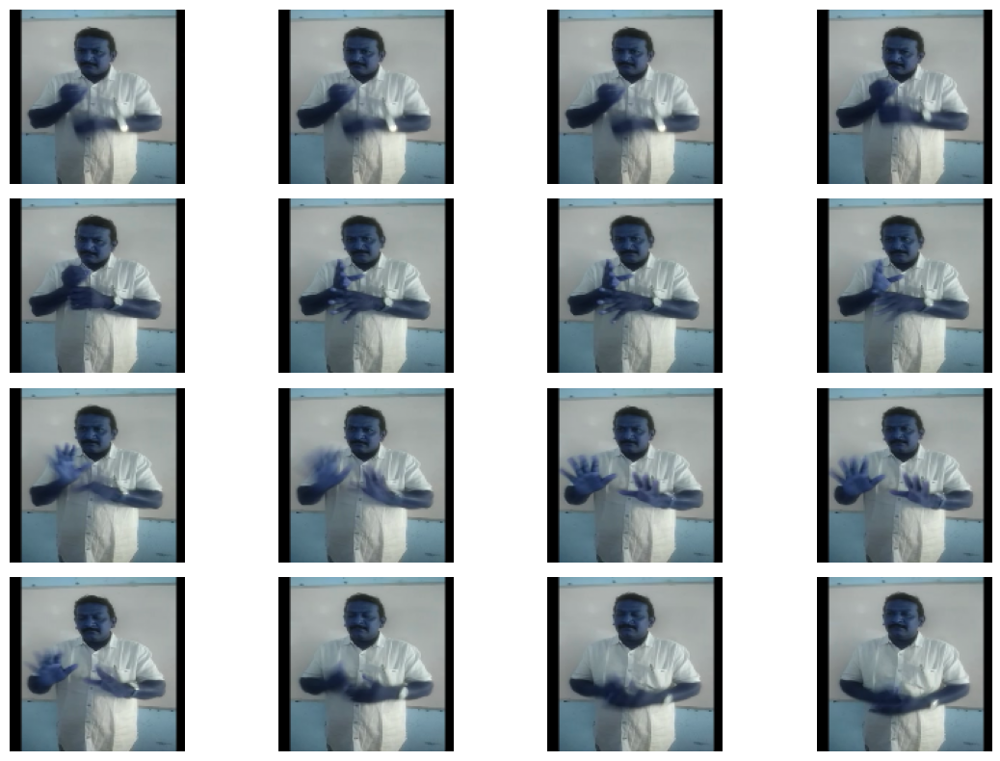

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
def visualize_sample():
    for frames, gloss_embeddings in data_generator():
        print(f"Number of frames: {len(frames)}")
        print(f"Gloss Embedding Shape: {gloss_embeddings.shape}")

        plt.figure(figsize=(12, 8))
        for i in range(min(16, len(frames))):
            plt.subplot(4, 4, i+1)
            plt.imshow(frames[i])
            plt.axis('off')
        plt.tight_layout()
        plt.show()
        break

visualize_sample()


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import sentencepiece as spm
import cv2
import matplotlib.pyplot as plt
# Model definition
def create_model():
    inputs = layers.Input(shape=(30, 128, 128, 3))


    # 2D CNN for spatial feature extraction
    x = layers.TimeDistributed(layers.Conv2D(8, (3, 3), activation='relu', padding='same'))(inputs)
    x = layers.TimeDistributed(layers.MaxPooling2D((2, 2)))(x)
    x = layers.TimeDistributed(layers.Conv2D(8, (3, 3), activation='relu', padding='same'))(x)
    x = layers.TimeDistributed(layers.MaxPooling2D((2, 2)))(x)
    x = layers.TimeDistributed(layers.Flatten())(x)

    # Simple RNN for temporal feature extraction
    x = layers.SimpleRNN(8, return_sequences=True)(x)
    x = layers.SimpleRNN(16)(x)

    # Fully connected layer
    x = layers.Dense(128, activation='relu')(x)
    outputs = layers.Dense(embedding_dim, activation='linear')(x)

    model = keras.Model(inputs, outputs)
    model.compile(loss=tf.keras.losses.CosineSimilarity(axis=-1), optimizer='adam', metrics=['accuracy'])
    return model

# Initialize and train the model
model = create_model()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 30, 128, 128, 3)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 30, 128, 128, 8)     │             224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 30, 64, 64, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_2 (TimeDistributed) │ (None, 30, 64, 64, 8)       │             584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_3 (TimeDistributed) │ (None, 30, 32, 32, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_4 (TimeDistributed) │ (None, 30, 8192)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn (SimpleRNN)               │ (None, 30, 8)               │          65,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_1 (SimpleRNN)             │ (None, 16)                  │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │           2,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          16,512 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 85,504 (334.00 KB)

 Trainable params: 85,504 (334.00 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# dataset[0]

KeyboardInterrupt: 

In [ ]:
# import matplotlib.pyplot as plt

# def visualize_sample(dataset, num_samples=5):
#     for i in range(num_samples):
#         x, y = dataset[i]
#         sample_frames = x[0]  # Taking the first sample of the batch
#         sample_gloss = sp.decode(y[0].numpy().tolist())

#         print(f"Gloss: {sample_gloss}")
#         fig, axs = plt.subplots(1, min(len(sample_frames), 10), figsize=(15, 5))

#         for j, frame in enumerate(sample_frames[:10]):
#             axs[j].imshow(frame)
#             axs[j].axis('off')
#         plt.show()

# visualize_sample(dataset)


KeyboardInterrupt: 

In [ ]:
history = model.fit(dataset, epochs=30, verbose=1, batch_size = 16)


Epoch 1/30


In [ ]:
!pip install --upgrade pip


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 24.9 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2


In [ ]:
!pip install mmpose --timeout=120 --no-cache-dir -i https://pypi.org/simple


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 86.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 240.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 215.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 220.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 612.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 60.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 47.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 162.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 170.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 182.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 193.1 MB/s eta 0:00:00
  Created wheel for chumpy: filename=chumpy-0.70-py3-none-any.whl size=5

In [ ]:
!pip uninstall mediapipe -y
!pip install --no-cache-dir mediapipe


Found existing installation: mediapipe 0.10.21
Uninstalling mediapipe-0.10.21:
  Successfully uninstalled mediapipe-0.10.21
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 175.2 MB/s eta 0:00:00


In [ ]:
!pip install numpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 75.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.4 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.4 which is incompatible.


In [ ]:
!pip install --no-cache-dir mediapipe==0.10.9

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 257.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 251.9 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.4
    Uninstalling protobuf-5.29.4:
      Successfully uninstalled protobuf-5.29.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.16.1 requires protobuf<6.0.0dev,>=4.25.2; python_version >= "3.11", but you have protobuf 3.20.3 which is incompatible.
grpcio-status 1.71.0 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 3.20.3 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.4 which is incompatible.


In [ ]:
import cv2
import numpy as np
import mediapipe as mp
import os
from tqdm import tqdm


In [ ]:
mp_hands = mp.solutions.hands
mp_face = mp.solutions.face_mesh
mp_pose = mp.solutions.pose

hands = mp_hands.Hands(static_image_mode=False, max_num_hands=2, min_detection_confidence=0.38)
face = mp_face.FaceMesh(static_image_mode=False, max_num_faces=1, min_detection_confidence=0.47)
pose = mp_pose.Pose(static_image_mode=False, min_detection_confidence=0.43)


In [ ]:
BASE_INPUT_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level"
BASE_OUTPUT_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Skeletal_preprocessed_frames"
CHECKPOINT_FILE = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/custom_checkpoint.json"


In [ ]:
if os.path.exists(CHECKPOINT_FILE):
  with open(CHECKPOINT_FILE, "r") as f:
    checkpoint = json.load(f)
else:
  checkpoint = {}




In [ ]:
# def process_frame(frame):
#     frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#     height, width, _ = frame.shape
#     keypoints = []

#     # 🔸 Detect Hands
#     hand_results = hands.process(frame_rgb)
#     if hand_results.multi_hand_landmarks:
#         for hand_landmarks in hand_results.multi_hand_landmarks:
#             for lm in hand_landmarks.landmark:
#                 keypoints.append((int(lm.x * width), int(lm.y * height)))

#     # 🔸 Detect Face (Eyes & Lips Only)
#     face_results = face.process(frame_rgb)
#     if face_results.multi_face_landmarks:
#         for landmark in face_results.multi_face_landmarks[0].landmark:
#             x, y = int(landmark.x * width), int(landmark.y * height)
#             keypoints.append((x, y))  # Keeping all face points (can filter for only eyes & lips)

#     # 🔸 Detect Pose (Only Body Joints)
#     pose_results = pose.process(frame_rgb)
#     if pose_results.pose_landmarks:
#         for lm in pose_results.pose_landmarks.landmark:
#             keypoints.append((int(lm.x * width), int(lm.y * height)))

#     return keypoints


In [ ]:
# def process_video_frames(input_folder, output_folder):
#     os.makedirs(output_folder, exist_ok=True)
#     frame_files = sorted([f for f in os.listdir(input_folder) if f.endswith('.jpg')])

#     for frame_file in tqdm(frame_files, desc="Processing Frames"):
#         frame_path = os.path.join(input_folder, frame_file)
#         frame = cv2.imread(frame_path)

#         keypoints = process_frame(frame)  # 🔥 Ultra-Fast Tracking

#         # 🔸 Save Keypoints as .npy for GNN input
#         np.save(os.path.join(output_folder, frame_file.replace('.jpg', '.npy')), keypoints)

#         # 🔸 Draw & Save Debug Frame
#         for (x, y) in keypoints:
#             cv2.circle(frame, (x, y), 2, (0, 255, 0), -1)
#         cv2.imwrite(os.path.join(output_folder, frame_file), frame)


In [ ]:
# process_video_frames(BASE_INPUT_DIR, BASE_OUTPUT_DIR )

Processing Frames: 0it [00:00, ?it/s]


In [ ]:

# def convert_to_graph(body_keypoints, hand_keypoints, lip_keypoints):
#     """
#     Combine all keypoints and compute a simple adjacency matrix.
#     The nodes are the stacked keypoints, and edge weights are computed as exp(-Euclidean distance).
#     Returns:
#       adjacency_matrix: a 2D NumPy array
#       nodes: a NumPy array of all keypoint coordinates
#     """
#     # If no keypoints detected in any modality, return empty arrays
#     if body_keypoints.size == 0 and hand_keypoints.size == 0 and lip_keypoints.size == 0:
#         return np.empty((0, 0)), np.empty((0, 2))

#     # Combine keypoints
#     nodes = np.vstack([body_keypoints, hand_keypoints, lip_keypoints])
#     num_nodes = len(nodes)
#     adjacency_matrix = np.zeros((num_nodes, num_nodes))

#     # Compute pairwise distances and assign weights
#     for i in range(num_nodes):
#         for j in range(num_nodes):
#             if i != j:
#                 dist = np.linalg.norm(nodes[i] - nodes[j])
#                 adjacency_matrix[i, j] = np.exp(-dist)  # stronger connection for closer nodes
#     return adjacency_matrix, nodes

In [ ]:

# def process_frame(frame):
#     # Extract body skeleton and its keypoints
#     skeleton_img = extract_body_skeleton_custom(frame)
#     body_keypoints = get_skeleton_keypoints(skeleton_img)

#     # Extract hand and lip keypoints
#     hand_keypoints, lip_keypoints = extract_hand_lip_keypoints_custom(frame)

#     # Convert all keypoints to a graph representation
#     adjacency_matrix, nodes = convert_to_graph(body_keypoints, hand_keypoints, lip_keypoints)

#     return skeleton_img, body_keypoints, hand_keypoints, lip_keypoints, adjacency_matrix, nodes

In [ ]:

# def process_video_frames(sentence_folder, signer_folder):
#     input_folder = os.path.join(BASE_INPUT_DIR, sentence_folder, signer_folder)
#     output_folder = os.path.join(BASE_OUTPUT_DIR, sentence_folder, signer_folder)
#     os.makedirs(output_folder, exist_ok=True)

#     frame_files = sorted([f for f in os.listdir(input_folder) if f.endswith(".jpg") or f.endswith(".png")])
#     last_processed = checkpoint.get(sentence_folder, {}).get(signer_folder, -1)
#     # Process only frames not yet processed
#     frame_files = frame_files[last_processed + 1:]

#     if not frame_files:
#         return

#     for idx, frame_file in enumerate(tqdm(frame_files, desc=f"Processing {sentence_folder}/{signer_folder}")):
#         frame_path = os.path.join(input_folder, frame_file)
#         output_prefix = os.path.join(output_folder, frame_file.split('.')[0])

#         frame = cv2.imread(frame_path)
#         if frame is None:
#             continue

#         skeleton_img, body_keypoints, hand_keypoints, lip_keypoints, adjacency_matrix, nodes = process_frame(frame)

#         # Save processed data
#         cv2.imwrite(os.path.join(output_folder, frame_file), skeleton_img)  # Save processed frame

#         np.save(output_prefix + "_body.npy", body_keypoints)
#         np.save(output_prefix + "_hands.npy", hand_keypoints)
#         np.save(output_prefix + "_lips.npy", lip_keypoints)
#         np.save(output_prefix + "_graph.npy", adjacency_matrix)
#         np.save(output_prefix + "_nodes.npy", nodes)

#         # Update checkpoint
#         checkpoint.setdefault(sentence_folder, {})[signer_folder] = last_processed + idx + 1
#         with open(CHECKPOINT_FILE, "w") as f:
#             json.dump(checkpoint, f)

#         print(f"Processed {frame_file} for {sentence_folder}/{signer_folder}")

In [ ]:
# def process_all_videos():
#     sentence_folders = sorted(os.listdir(BASE_INPUT_DIR))
#     for sentence in sentence_folders:
#         sentence_path = os.path.join(BASE_INPUT_DIR, sentence)
#         if not os.path.isdir(sentence_path):
#             continue
#         signer_folders = sorted(os.listdir(sentence_path))
#         for signer in signer_folders:
#             signer_path = os.path.join(sentence_path, signer)
#             if not os.path.isdir(signer_path):
#                 continue
#             print(f"Processing {sentence}/{signer} ...")
#             process_video_frames(sentence, signer)

In [ ]:
from tqdm import tqdm


In [ ]:
import cv2
import numpy as np
import mediapipe as mp
import os
import json
import networkx as nx
from tqdm import tqdm

# Initialize Mediapipe Modules
mp_hands = mp.solutions.hands
mp_pose = mp.solutions.pose

hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.285, max_num_hands=2)
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

# Define Hand and Pose Skeleton Edges
POSE_EDGES = [(11, 12), (11, 13), (13, 15), (12, 14), (14, 16), (15, 17), (16, 18),
              (17, 19), (18, 20), (11, 23), (12, 24), (23, 24), (23, 25), (24, 26),
              (25, 27), (26, 28), (27, 29), (28, 30), (29, 31), (30, 32)]

HAND_EDGES = [(0, 1), (1, 2), (2, 3), (3, 4),  # Thumb
              (0, 5), (5, 6), (6, 7), (7, 8),  # Index Finger
              (0, 9), (9, 10), (10, 11), (11, 12),  # Middle Finger
              (0, 13), (13, 14), (14, 15), (15, 16),  # Ring Finger
              (0, 17), (17, 18), (18, 19), (19, 20),  # Little Finger
              (5, 9), (9, 13), (13, 17)]  # Palm Connections

# Extract Keypoints Function
def extract_keypoints(frame):
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    height, width, _ = frame.shape
    keypoints = {}

    # Detect Hands
    hand_results = hands.process(frame_rgb)
    if hand_results.multi_hand_landmarks:
        keypoints['hand'] = []
        for hand_landmarks in hand_results.multi_hand_landmarks:
            hand_pts = [(lm.x, lm.y) for lm in hand_landmarks.landmark]
            keypoints['hand'].append(hand_pts)

    # Detect Pose
    pose_results = pose.process(frame_rgb)
    if pose_results.pose_landmarks:
        keypoints['pose'] = [(lm.x, lm.y) for lm in pose_results.pose_landmarks.landmark]

    return keypoints

# Create Skeleton Graph
def create_skeleton_graph(keypoints):
    graph = nx.Graph()

    if 'pose' in keypoints:
        for i, (x, y) in enumerate(keypoints['pose']):
            graph.add_node(i, pos=(x, y))
        for (i, j) in POSE_EDGES:
            if i < len(keypoints['pose']) and j < len(keypoints['pose']):
                graph.add_edgei, j()

    if 'hand' in keypoints:
        for hand in keypoints['hand']:
            for i, (x, y) in enumerate(hand):
                graph.add_node(f'h{i}', pos=(x, y))
            for (i, j) in HAND_EDGES:
                if i < len(hand) and j < len(hand):
                    graph.add_edge(f'h{i}', f'h{j}')

    return graph

# Draw Skeleton on Image
def draw_skeleton(frame, keypoints):
    height, width, _ = frame.shape

    # Draw Pose Skeleton
    if 'pose' in keypoints:
        for (i, j) in POSE_EDGES:
            if i < len(keypoints['pose']) and j < len(keypoints['pose']):
                p1 = (int(keypoints['pose'][i][0] * width), int(keypoints['pose'][i][1] * height))
                p2 = (int(keypoints['pose'][j][0] * width), int(keypoints['pose'][j][1] * height))
                cv2.line(frame, p1, p2, (0, 255, 0), 2)

    # Draw Hand Skeleton
    if 'hand' in keypoints:
        for hand_pts in keypoints['hand']:
            for (i, j) in HAND_EDGES:
                if i < len(hand_pts) and j < len(hand_pts):
                    p1 = (int(hand_pts[i][0] * width), int(hand_pts[i][1] * height))
                    p2 = (int(hand_pts[j][0] * width), int(hand_pts[j][1] * height))
                    cv2.line(frame, p1, p2, (255, 0, 0), 2)
    return frame

# Process Video Frames
def process_frames(input_dir, output_dir, checkpoint_file):
    os.makedirs(output_dir, exist_ok=True)
    checkpoint = {}  # Load Checkpoint
    if os.path.exists(checkpoint_file):
        with open(checkpoint_file, 'r') as f:
            checkpoint = json.load(f)

    for sentence in tqdm(sorted(os.listdir(input_dir)), desc='Processing Sentences'):
        sentence_path = os.path.join(input_dir, sentence)
        output_sentence_path = os.path.join(output_dir, sentence)
        os.makedirs(output_sentence_path, exist_ok=True)

        for signer in tqdm(sorted(os.listdir(sentence_path)), desc=f'Processing {sentence}', leave=False):
            signer_path = os.path.join(sentence_path, signer)
            output_signer_path = os.path.join(output_sentence_path, signer)
            os.makedirs(output_signer_path, exist_ok=True)

            for frame_file in sorted(os.listdir(signer_path)):
                if not frame_file.endswith('.jpg'):
                    continue
                frame_path = os.path.join(signer_path, frame_file)
                output_npy_path = os.path.join(output_signer_path, frame_file.replace('.jpg', '.npy'))
                output_img_path = os.path.join(output_signer_path, frame_file)

                if frame_file in checkpoint.get(sentence, {}).get(signer, []):
                    continue  # Skip if already processed

                frame = cv2.imread(frame_path)
                keypoints = extract_keypoints(frame)
                graph = create_skeleton_graph(keypoints)

                np.save(output_npy_path, np.array(list(graph.nodes.data())))
                skeleton_frame = draw_skeleton(frame.copy(), keypoints)
                cv2.imwrite(output_img_path, skeleton_frame)

                # Update Checkpoint
                checkpoint.setdefault(sentence, {}).setdefault(signer, []).append(frame_file)
                with open(checkpoint_file, 'w') as f:
                    json.dump(checkpoint, f)

# Directories & Checkpoint
BASE_INPUT_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level"
BASE_OUTPUT_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Skeletal_preprocessed_frames"
CHECKPOINT_FILE = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/custom_checkpoint.json"

# Run Processing
process_frames(BASE_INPUT_DIR, BASE_OUTPUT_DIR, CHECKPOINT_FILE)

Processing Sentences:  59%|█████▉    | 57/97 [2:31:36<1:59:25, 179.13s/it]
Processing it does not make any difference to me:   0%|          | 0/7 [00:00<?, ?it/s]
Processing it does not make any difference to me:  14%|█▍        | 1/7 [00:12<01:17, 12.99s/it]
Processing it does not make any difference to me:  29%|██▊       | 2/7 [00:27<01:08, 13.66s/it]
Processing it does not make any difference to me:  43%|████▎     | 3/7 [00:49<01:10, 17.71s/it]
Processing it does not make any difference to me:  57%|█████▋    | 4/7 [01:55<01:50, 36.83s/it]
Processing it does not make any difference to me:  71%|███████▏  | 5/7 [02:51<01:27, 43.59s/it]
Processing it does not make any difference to me:  86%|████████▌ | 6/7 [03:42<00:45, 45.98s/it]
Processing Sentences:  84%|████████▎ | 81/97 [3:36:43<34:59, 131.21s/it]
Processing what have you planned for your career:   0%|          | 0/3 [00:00<?, ?it/s]
Processing what have you planned for your career:  33%|███▎      | 1/3 [00:10<00:20, 10.28s/it]
Proc

In [ ]:
!pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 18.2 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.4
    Uninstalling protobuf-5.29.4:
      Successfully uninstalled protobuf-5.29.4
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.71.0 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 4.25.6 which is incompatible.


In [ ]:
import cv2
import numpy as np
import mediapipe as mp
import os
import json
import networkx as nx
from tqdm import tqdm
from scipy.spatial import distance

# Initialize Mediapipe Modules
mp_hands = mp.solutions.hands
mp_pose = mp.solutions.pose

hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.285, max_num_hands=2)
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

# Define Skeleton Edges (Pose & Hands)
POSE_EDGES = [(11, 12), (11, 13), (13, 15), (12, 14), (14, 16), (15, 17), (16, 18),
              (17, 19), (18, 20), (11, 23), (12, 24), (23, 24), (23, 25), (24, 26),
              (25, 27), (26, 28), (27, 29), (28, 30), (29, 31), (30, 32)]

HAND_EDGES = [(0, 1), (1, 2), (2, 3), (3, 4),
              (0, 5), (5, 6), (6, 7), (7, 8),
              (0, 9), (9, 10), (10, 11), (11, 12),
              (0, 13), (13, 14), (14, 15), (15, 16),
              (0, 17), (17, 18), (18, 19), (19, 20),
              (5, 9), (9, 13), (13, 17)]

# Function to interpolate missing keypoints
def interpolate_missing_keypoints(prev_pts, next_pts):
    if prev_pts and next_pts:
        return [(p1 + p2) / 2 for p1, p2 in zip(prev_pts, next_pts)]
    return prev_pts if prev_pts else next_pts

def extract_keypoints(frame):
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    height, width, _ = frame.shape
    keypoints = {}

    # Detect Hands
    hand_results = hands.process(frame_rgb)
    if hand_results.multi_hand_landmarks and hand_results.multi_handedness:
        for idx, hand_landmarks in enumerate(hand_results.multi_hand_landmarks):
            handedness = hand_results.multi_handedness[idx].classification[0].label.lower()  # 'left' or 'right'
            hand_pts = [(lm.x, lm.y) for lm in hand_landmarks.landmark]
            keypoints[handedness] = hand_pts

    # Detect Pose
    pose_results = pose.process(frame_rgb)
    keypoints['pose'] = [(lm.x, lm.y) if lm.visibility > 0.3 else None for lm in pose_results.pose_landmarks.landmark] if pose_results.pose_landmarks else [None] * 33

    return keypoints


# Create Graph with Robust Occlusion Handling (Fixed Hand Nodes)
def create_skeleton_graph(keypoints):
    graph = nx.Graph()

    # Pose Graph
    if 'pose' in keypoints:
        for i, pos in enumerate(keypoints['pose']):
            if pos:
                graph.add_node(f'p{i}', pos=pos)
        for (i, j) in POSE_EDGES:
            if keypoints['pose'][i] and keypoints['pose'][j]:
                graph.add_edge(f'p{i}', f'p{j}')

    # Hand Graphs with Unique Keys
    for hand_label in ['left', 'right']:
        if hand_label in keypoints:
            prefix = 'lh' if hand_label == 'left' else 'rh'
            hand_pts = keypoints[hand_label]
            for i, pt in enumerate(hand_pts):
                graph.add_node(f'{prefix}{i}', pos=pt)
            for (i, j) in HAND_EDGES:
                graph.add_edge(f'{prefix}{i}', f'{prefix}{j}')

    return graph

def draw_skeleton(frame, keypoints):
    height, width, _ = frame.shape

    # Draw Pose
    if 'pose' in keypoints:
        for (i, j) in POSE_EDGES:
            if keypoints['pose'][i] and keypoints['pose'][j]:
                p1 = (int(keypoints['pose'][i][0] * width), int(keypoints['pose'][i][1] * height))
                p2 = (int(keypoints['pose'][j][0] * width), int(keypoints['pose'][j][1] * height))
                cv2.line(frame, p1, p2, (0, 255, 0), 2)

    # Draw Hands
    for hand_label in ['left', 'right']:
        if hand_label in keypoints:
            hand_pts = keypoints[hand_label]
            for (i, j) in HAND_EDGES:
                p1 = (int(hand_pts[i][0] * width), int(hand_pts[i][1] * height))
                p2 = (int(hand_pts[j][0] * width), int(hand_pts[j][1] * height))
                cv2.line(frame, p1, p2, (255, 0, 0), 2)

    return frame


# Process Frames with Occlusion Handling
def process_frames(input_dir, output_dir, checkpoint_file):
    os.makedirs(output_dir, exist_ok=True)
    checkpoint = {}  # Load Checkpoint
    if os.path.exists(checkpoint_file):
        with open(checkpoint_file, 'r') as f:
            checkpoint = json.load(f)

    for sentence in tqdm(sorted(os.listdir(input_dir)), desc='Processing Sentences'):
        sentence_path = os.path.join(input_dir, sentence)
        output_sentence_path = os.path.join(output_dir, sentence)
        os.makedirs(output_sentence_path, exist_ok=True)

        for signer in tqdm(sorted(os.listdir(sentence_path)), desc=f'Processing {sentence}', leave=False):
            signer_path = os.path.join(sentence_path, signer)
            output_signer_path = os.path.join(output_sentence_path, signer)
            os.makedirs(output_signer_path, exist_ok=True)

            frame_files = sorted([f for f in os.listdir(signer_path) if f.endswith('.jpg')])

            for i, frame_file in enumerate(frame_files):
                frame_path = os.path.join(signer_path, frame_file)
                output_npy_path = os.path.join(output_signer_path, frame_file.replace('.jpg', '.npy'))
                output_img_path = os.path.join(output_signer_path, frame_file)

                if frame_file in checkpoint.get(sentence, {}).get(signer, []):
                    continue

                frame = cv2.imread(frame_path)
                keypoints = extract_keypoints(frame)

                graph = create_skeleton_graph(keypoints)
                np.save(output_npy_path, np.array(list(graph.nodes.data())))
                cv2.imwrite(output_img_path, draw_skeleton(frame.copy(), keypoints))

            checkpoint.setdefault(sentence, {}).setdefault(signer, frame_files)
            with open(checkpoint_file, 'w') as f:
                json.dump(checkpoint, f)
BASE_INPUT_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level"
BASE_OUTPUT_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Skeletal_preprocessed_PROPER"
CHECKPOINT_FILE = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/custom_checkpointerD.json"

# Run Processing
process_frames(BASE_INPUT_DIR, BASE_OUTPUT_DIR, CHECKPOINT_FILE)

Processing Sentences:  59%|█████▉    | 57/97 [1:26:23<1:00:37, 90.93s/it]
Processing it does not make any difference to me:   0%|          | 0/7 [00:00<?, ?it/s]
Processing it does not make any difference to me:  14%|█▍        | 1/7 [00:08<00:53,  8.88s/it]
Processing it does not make any difference to me:  29%|██▊       | 2/7 [00:18<00:47,  9.57s/it]
Processing it does not make any difference to me:  43%|████▎     | 3/7 [00:28<00:37,  9.44s/it]
Processing it does not make any difference to me:  57%|█████▋    | 4/7 [00:58<00:52, 17.48s/it]
Processing it does not make any difference to me:  71%|███████▏  | 5/7 [01:21<00:39, 19.58s/it]
Processing it does not make any difference to me:  86%|████████▌ | 6/7 [01:44<00:20, 20.77s/it]
Processing Sentences:  84%|████████▎ | 81/97 [2:01:26<20:08, 75.51s/it]
Processing what have you planned for your career:   0%|          | 0/3 [00:00<?, ?it/s]
Processing what have you planned for your career:  33%|███▎      | 1/3 [00:06<00:13,  6.73s/it]
Proces

In [ ]:
print("Pose nodes:", [n for n in G.nodes if n.startswith('p')])
print("LH nodes:", [n for n in G.nodes if n.startswith('lh')])
print("RH nodes:", [n for n in G.nodes if n.startswith('rh')])


Pose nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p29', 'p30', 'p31', 'p32']
LH nodes: []
RH nodes: []


He is going into the room Signers:   0%|          | 0/7 [00:00<?, ?it/s]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']


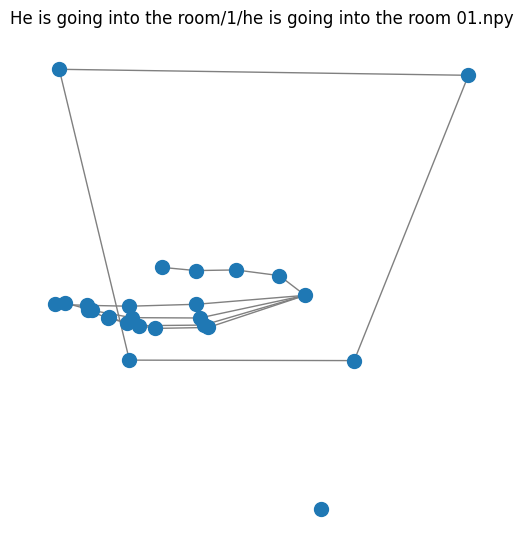

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting s

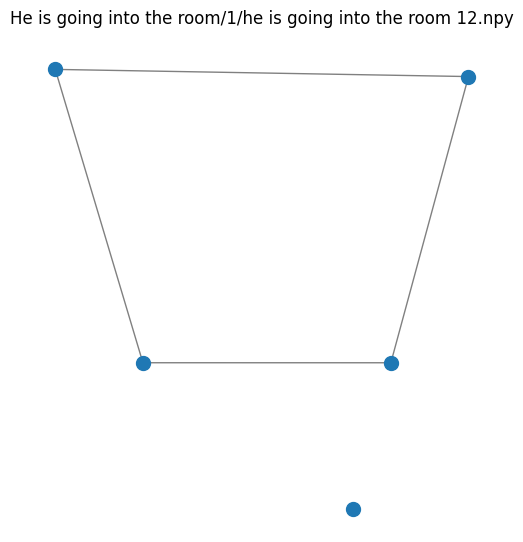

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p29', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22

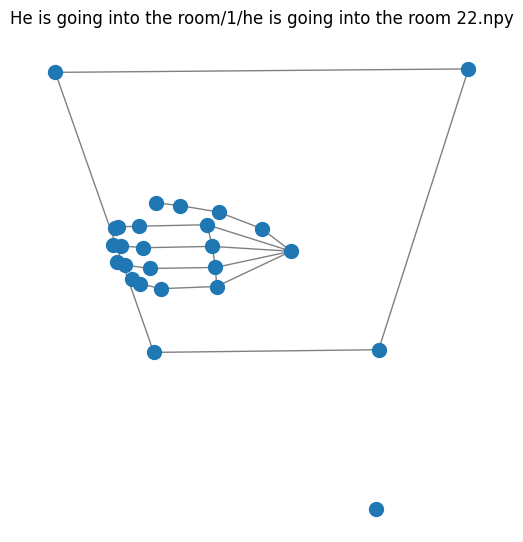


He is going into the room Signers:  14%|█▍        | 1/7 [00:01<00:06,  1.05s/it]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']


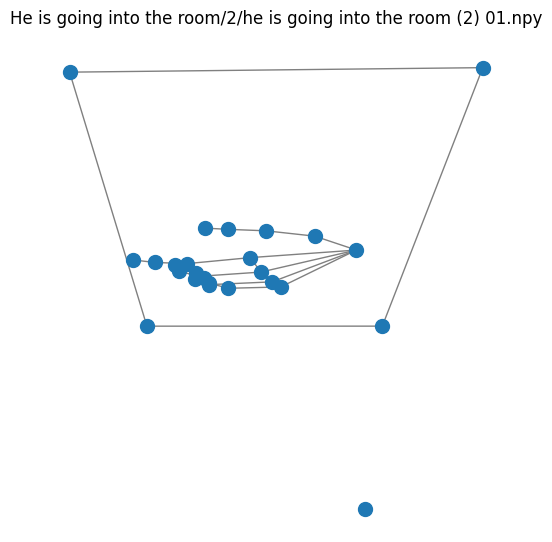

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting 

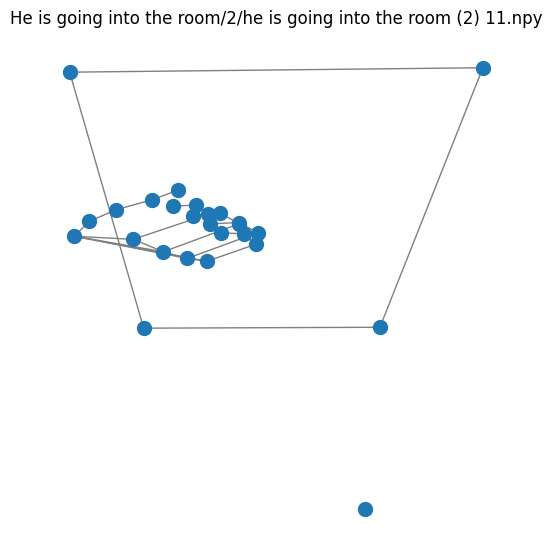

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'rh0', 'rh1

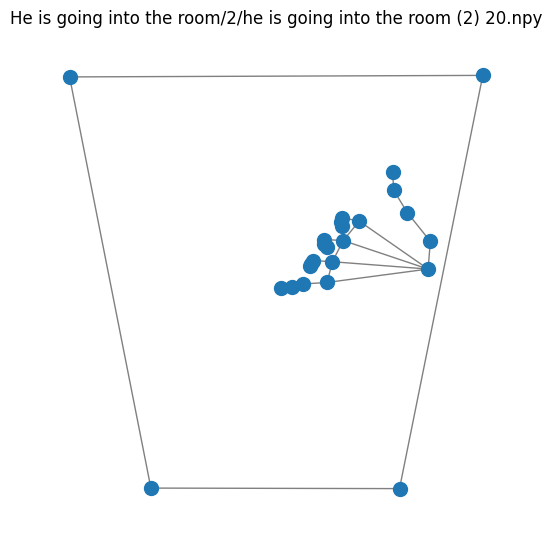


He is going into the room Signers:  29%|██▊       | 2/7 [00:01<00:04,  1.09it/s]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24']


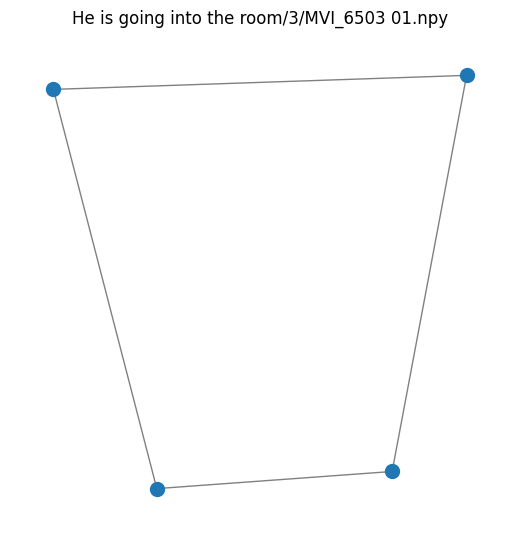

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting sh

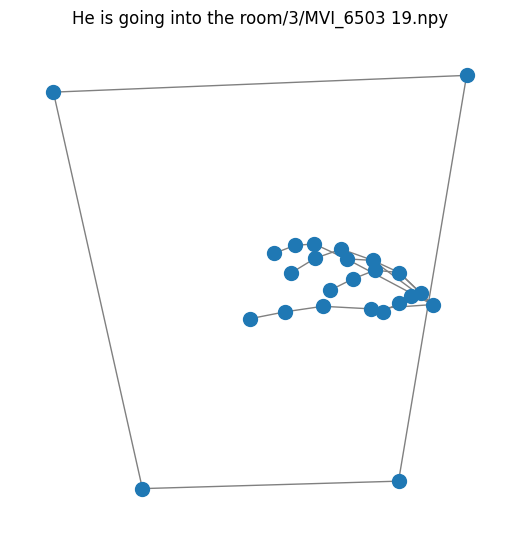

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24']
Connecting shoulder to elbow
Connecting 

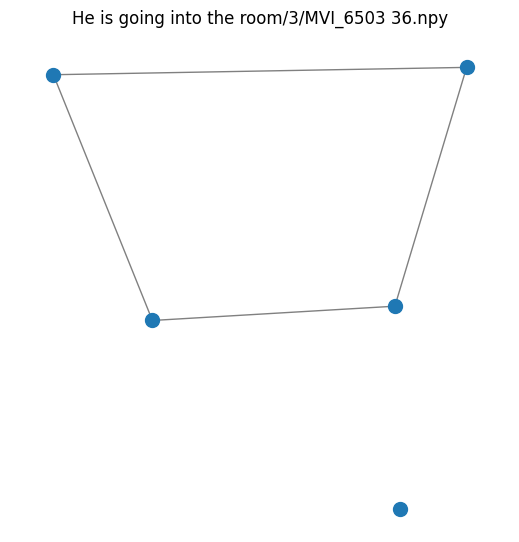


He is going into the room Signers:  43%|████▎     | 3/7 [00:02<00:03,  1.02it/s]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']


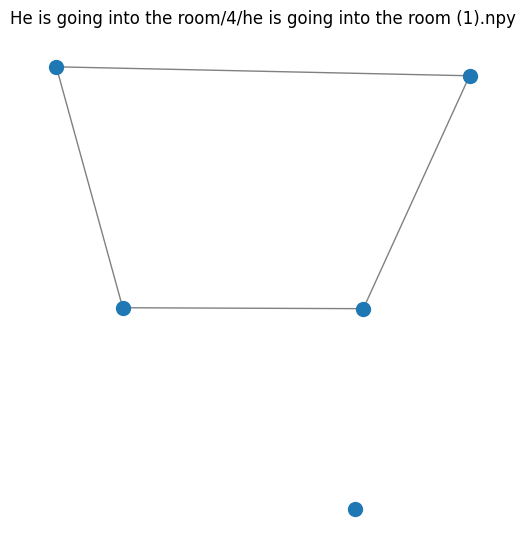

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p29', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19',

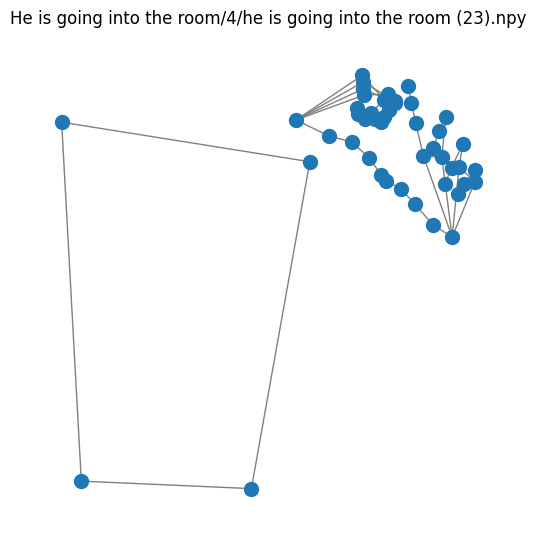

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p2

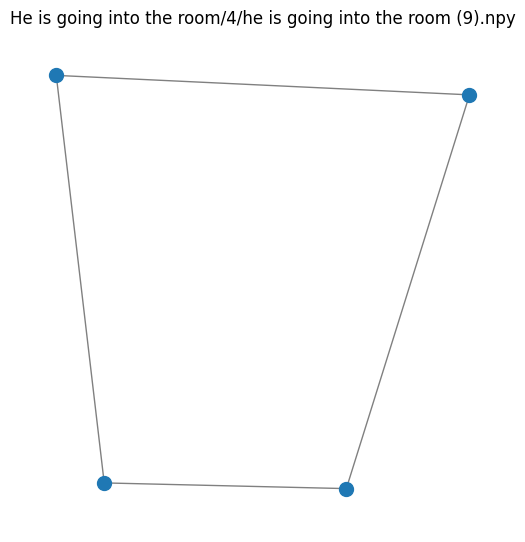


He is going into the room Signers:  57%|█████▋    | 4/7 [00:03<00:02,  1.01it/s]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']


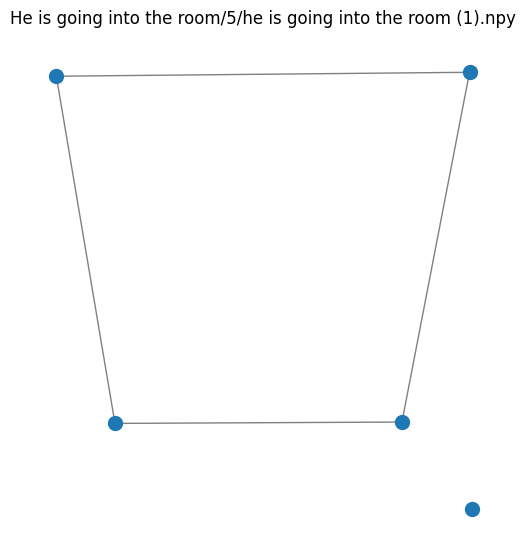

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p28', 'p29', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p29', 'p30', 'p31', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh

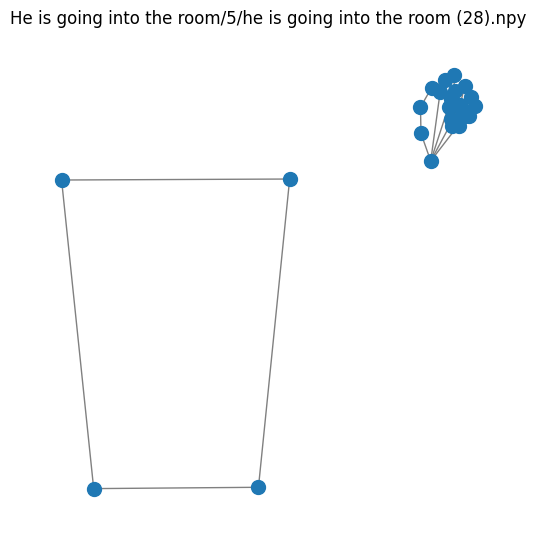

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p

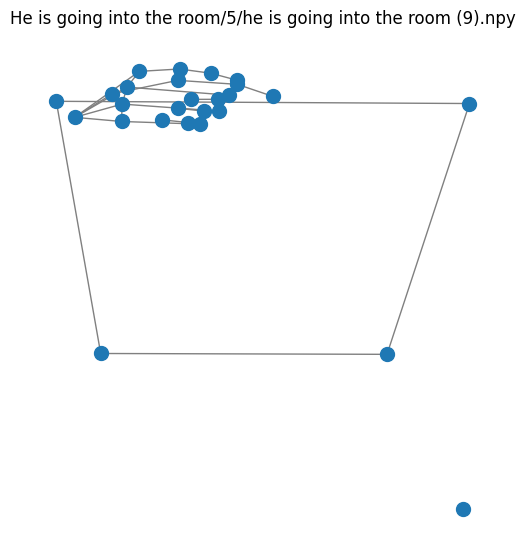


He is going into the room Signers:  71%|███████▏  | 5/7 [00:05<00:02,  1.05s/it]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']


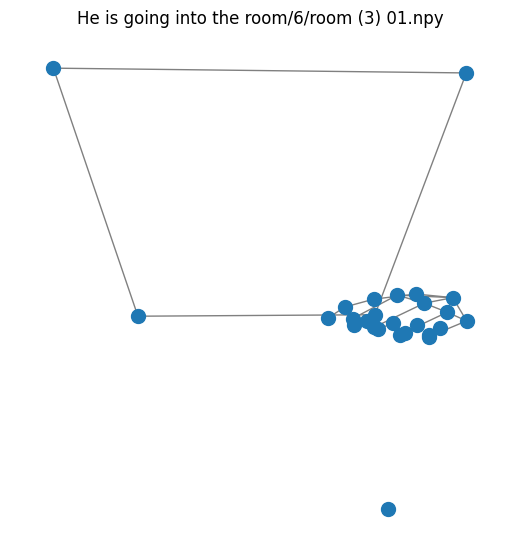

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting s

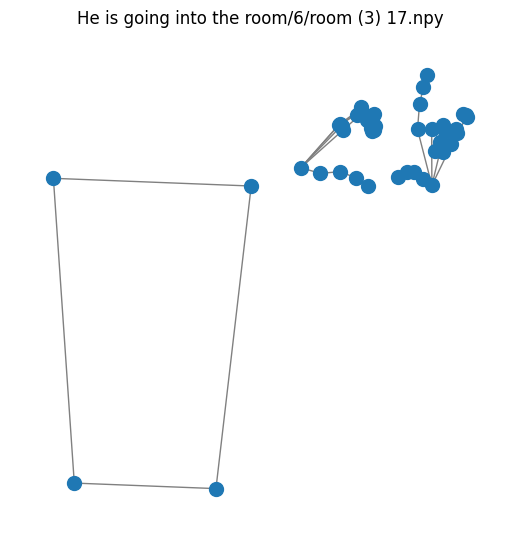

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'lh0', 'lh1

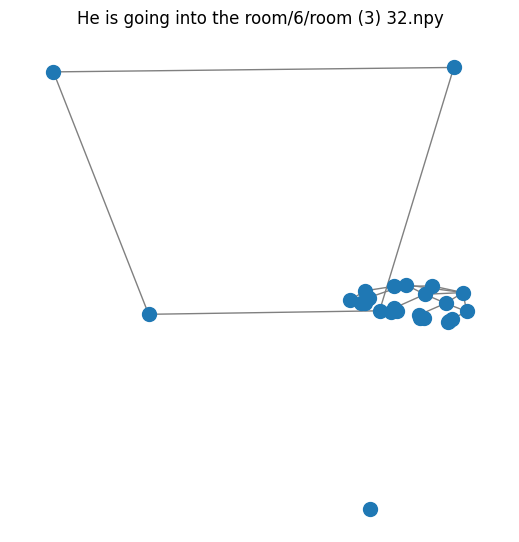


He is going into the room Signers:  86%|████████▌ | 6/7 [00:06<00:01,  1.05s/it]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']


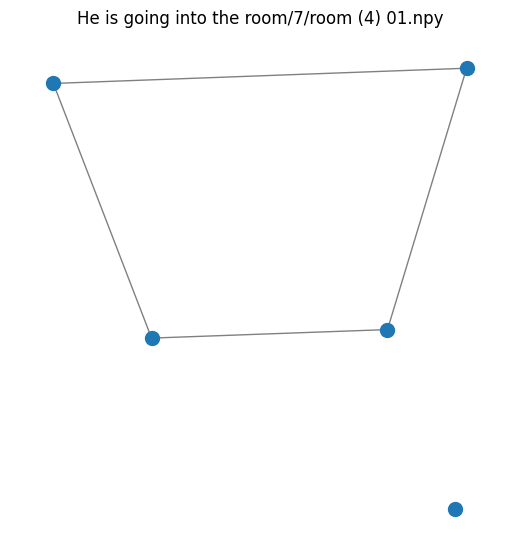

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11

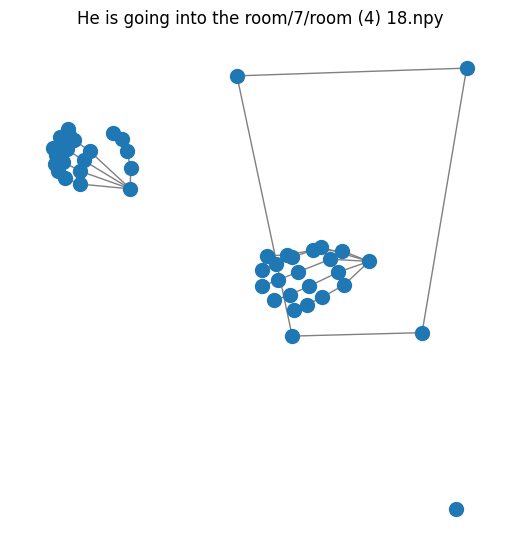

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25

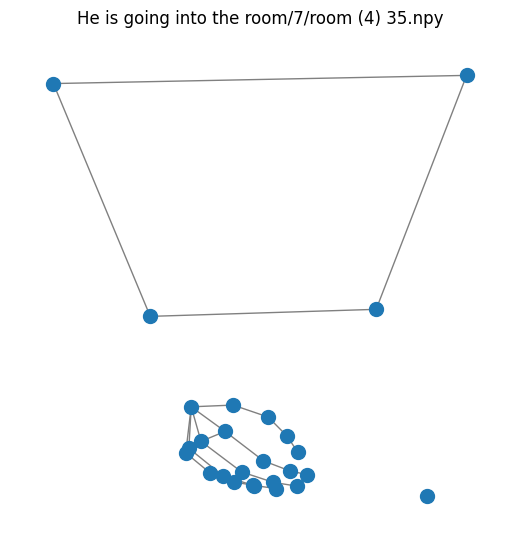


This place is beautiful Signers:   0%|          | 0/7 [00:00<?, ?it/s]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p29', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']


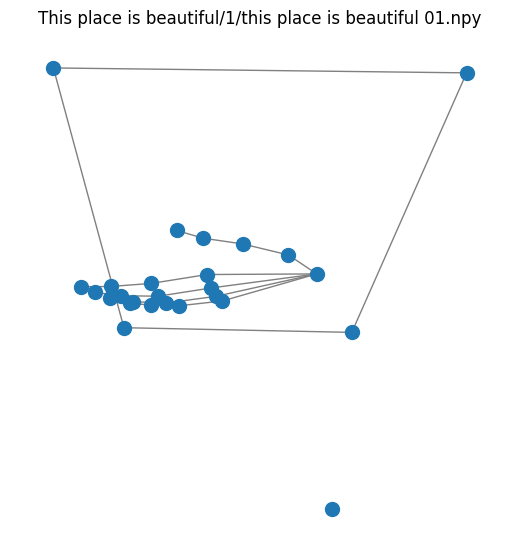

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p29', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 

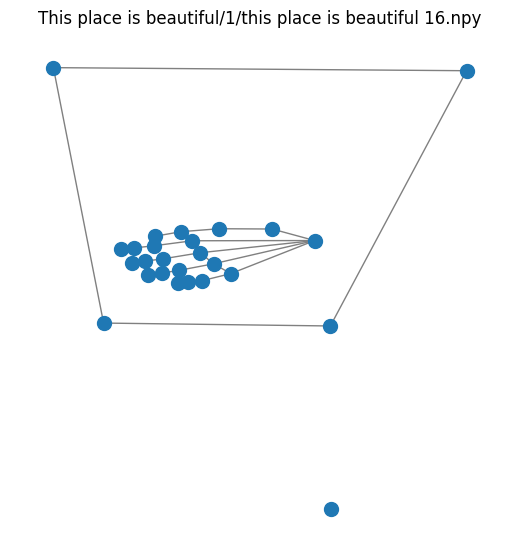

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p29']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9

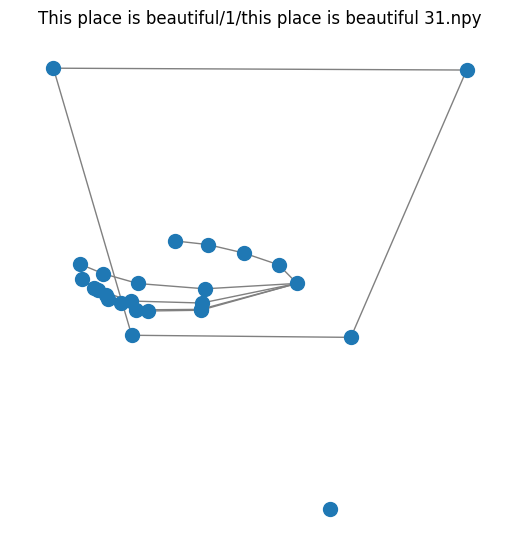


This place is beautiful Signers:  14%|█▍        | 1/7 [00:01<00:06,  1.10s/it]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']


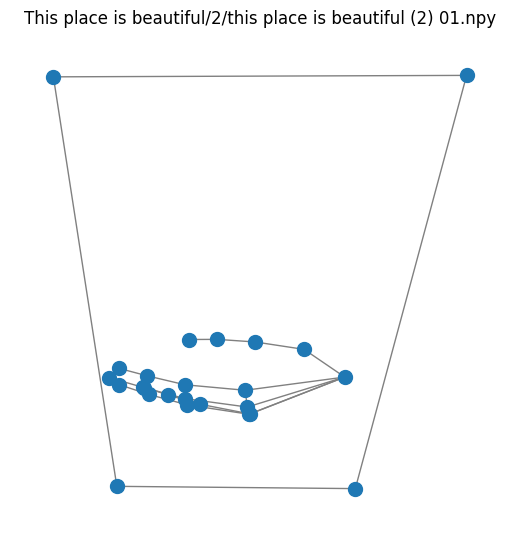

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elb

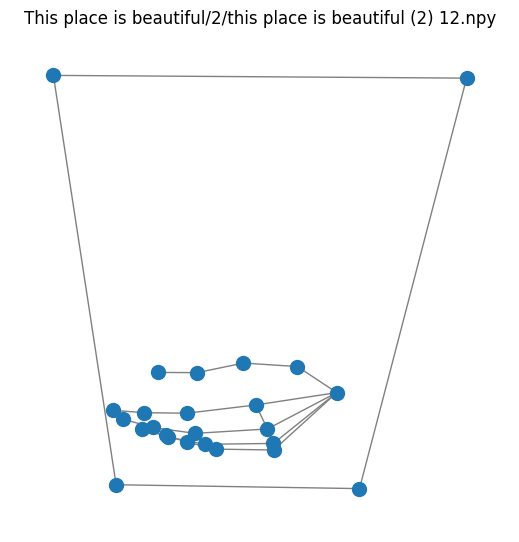

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20', 'rh0', 'rh1

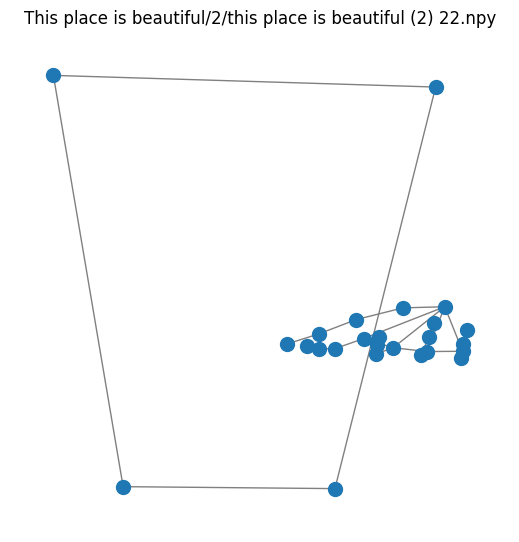


This place is beautiful Signers:  29%|██▊       | 2/7 [00:01<00:04,  1.03it/s]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']


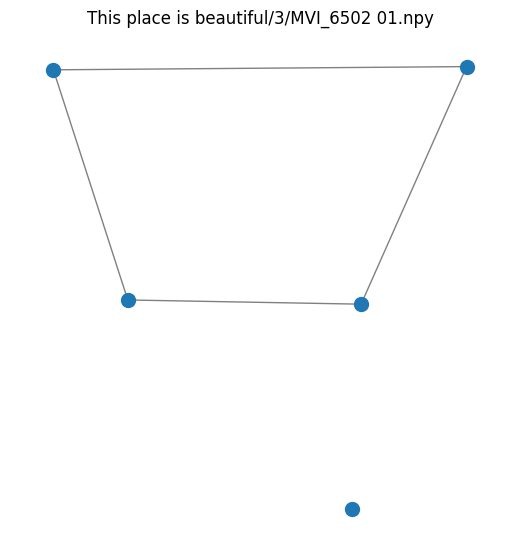

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting sh

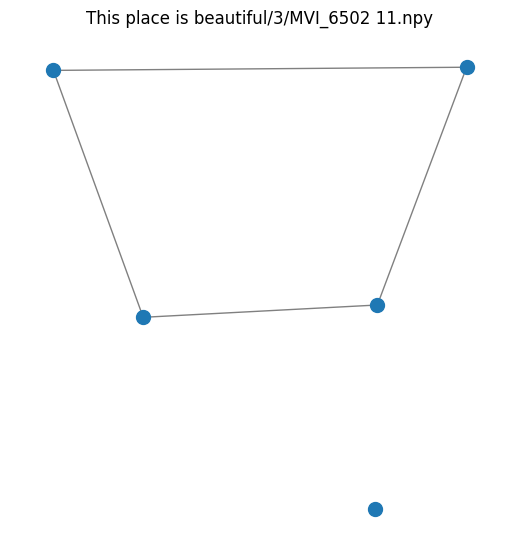

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13

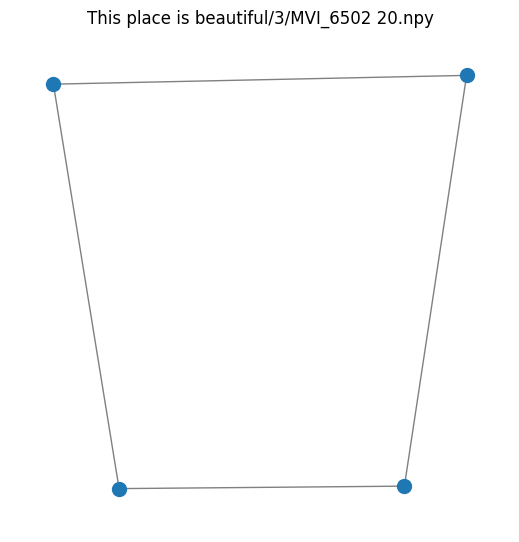


This place is beautiful Signers:  43%|████▎     | 3/7 [00:02<00:03,  1.08it/s]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p26']


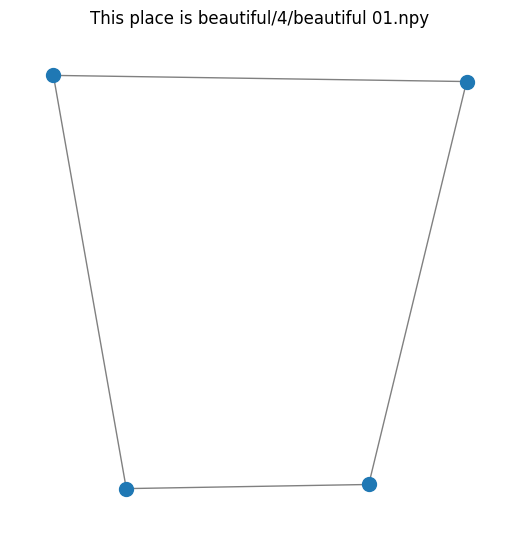

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder 

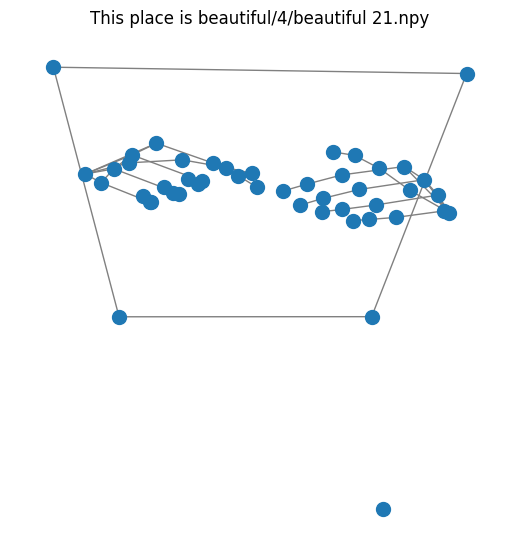

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'lh0', 'lh1', 'lh2', 'lh3', 'lh4', 'lh5', 'lh6', 'lh7', 'lh8', 'lh9', 'lh10', 'lh11', 'lh12', 'lh13', 'lh14', 'lh15', 'lh16', 'lh17', 'lh18', 'lh19', 'lh20', 'rh0', 'rh1', 'rh2', 'rh3', 'rh4', 'rh5', 'rh6', 'rh7', 'rh8', 'rh9', 'rh10', 'rh11', 'rh12', 'rh13', 'rh14', 'rh15', 'rh16', 'rh17', 'rh18', 'rh19', 'rh20']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'rh0', 'rh1

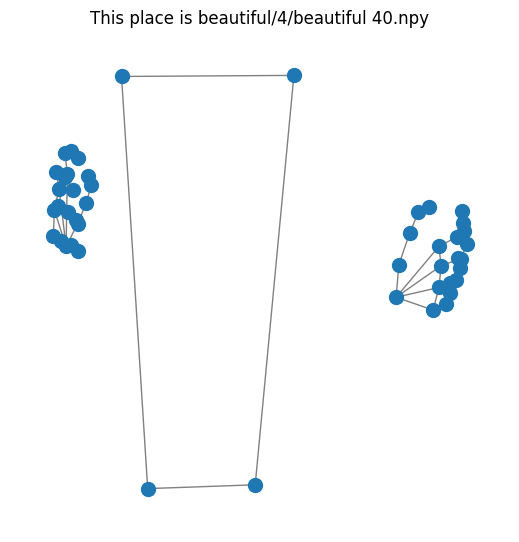


This place is beautiful Signers:  57%|█████▋    | 4/7 [00:04<00:03,  1.10s/it]

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p28', 'p29', 'p30', 'p32']


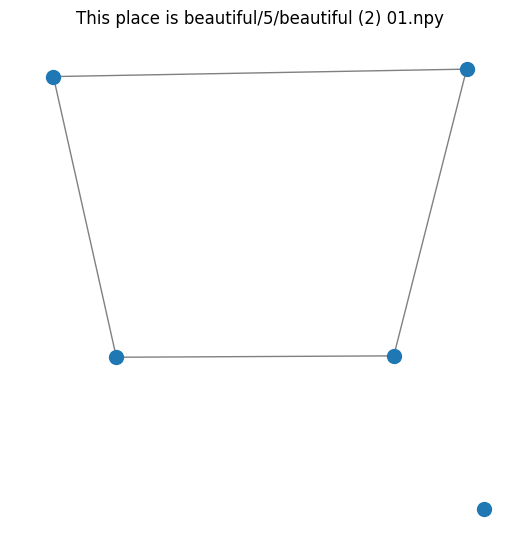

Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p29', 'p30']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p29', 'p30', 'p32']
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
Connecting shoulder to elbow
All nodes: ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p


Sentences:   1%|          | 1/97 [00:12<20:33, 12.85s/it]


KeyboardInterrupt: 

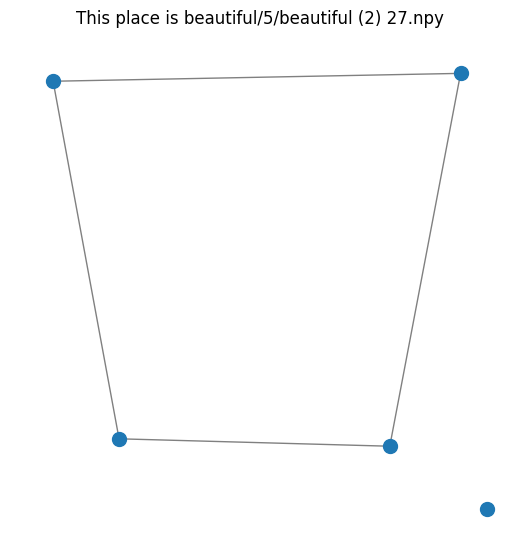

In [ ]:
# from tqdm import tqdm
# import os
# import numpy as np
# import networkx as nx
# import matplotlib.pyplot as plt
# import pickle

# # Paths
# NPY_DIR = '/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Skeletal_preprocessed_PROPER'
# GPKL_DIR = '/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Skeletal_preprocessed_Graphs_gpickle'
# VIS_DIR = '/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Skeletal_preprocessed_Graphs_Visualizations'

# os.makedirs(GPKL_DIR, exist_ok=True)
# os.makedirs(VIS_DIR, exist_ok=True)

# # Pose and Hand Edges
# POSE_EDGES = [(f'p{i}', f'p{j}') for (i, j) in [
#     (0,1),(1,2),(2,3),(3,7),(0,4),(4,5),(5,6),(6,8),
#     (9,10),(11,12),(11,13),(13,15),(12,14),(14,16),
#     (15,17),(16,18),(0,9),(9,11),(0,12),(12,24),
#     (11,23),(23,24)
# ]]

# LEFT_HAND_EDGES = [(f'lh{i}', f'lh{j}') for (i,j) in HAND_EDGES]
# RIGHT_HAND_EDGES = [(f'rh{i}', f'rh{j}') for (i,j) in HAND_EDGES]


# # Focused nodes for visualization
# FOCUS_POSE_NODES = [f'p{i}' for i in [11, 12, 23, 24, 25]]  # nose, shoulders, hips, etc.


# FOCUS_LH_NODES = [f'lh{i}' for i in range(21)]
# FOCUS_RH_NODES = [f'rh{i}' for i in range(21)]
# FOCUS_HAND_NODES = FOCUS_LH_NODES + FOCUS_RH_NODES

# def reconstruct_graph(npy_data):
#     G = nx.Graph()

#     # Add nodes
#     for node_id, attr in npy_data:
#         G.add_node(node_id, **attr)

#     # Add pose skeleton edges
#     for i, j in POSE_EDGES:
#         if i in G and j in G:
#             G.add_edge(i, j)

#     # Add hand skeleton edges
#     for i, j in LEFT_HAND_EDGES:
#         if i in G and j in G:
#             G.add_edge(i, j)
#     for i, j in RIGHT_HAND_EDGES:
#         if i in G and j in G:
#             G.add_edge(i, j)

#     # 🔗 Manual full-chain connections (shoulder → elbow → wrist → hand root)
#     # Left Side
#     if all(x in G for x in ['p11', 'p13']):  # left shoulder to left elbow
#         if all(x in G for x in ['p11', 'p13']):
#             print("Connecting shoulder to elbow")
#             G.add_edge('p11', 'p13')

#         G.add_edge('p11', 'p13')
#     if all(x in G for x in ['p13', 'p15']):  # elbow to wrist
#         if all(x in G for x in ['p11', 'p13']):
#             print("Connecting shoulder to elbow")
#             G.add_edge('p11', 'p13')

#         G.add_edge('p13', 'p15')
#     if all(x in G for x in ['p15', 'lh0']):  # wrist to hand
#         if all(x in G for x in ['p11', 'p13']):
#             print("Connecting shoulder to elbow")
#             G.add_edge('p11', 'p13')

#         G.add_edge('p15', 'lh0')

#     # Right Side
#     if all(x in G for x in ['p12', 'p14']):  # right shoulder to right elbow
#         if all(x in G for x in ['p11', 'p13']):
#             print("Connecting shoulder to elbow")
#             G.add_edge('p11', 'p13')

#         G.add_edge('p12', 'p14')
#     if all(x in G for x in ['p14', 'p16']):  # elbow to wrist
#         if all(x in G for x in ['p11', 'p13']):
#             print("Connecting shoulder to elbow")
#             G.add_edge('p11', 'p13')

#         G.add_edge('p14', 'p16')
#     if all(x in G for x in ['p16', 'rh0']):  # wrist to hand
#         if all(x in G for x in ['p11', 'p13']):
#             print("Connecting shoulder to elbow")
#             G.add_edge('p11', 'p13')

#         G.add_edge('p16', 'rh0')

#     # ✅ Optional fallback: if wrist is missing, connect elbow directly to hand
#     if 'lh0' in G and 'p15' not in G and 'p13' in G:
#         if all(x in G for x in ['p11', 'p13']):
#             print("Connecting shoulder to elbow")
#             G.add_edge('p11', 'p13')

#         G.add_edge('p13', 'lh0')
#     if 'rh0' in G and 'p16' not in G and 'p14' in G:
#         if all(x in G for x in ['p11', 'p13']):
#             print("Connecting shoulder to elbow")
#             G.add_edge('p11', 'p13')

#         G.add_edge('p14', 'rh0')
#     print("All nodes:", G.nodes())


#     return G




# def get_focus_subgraph(G):
#     focus_nodes = [n for n in G.nodes if n in FOCUS_POSE_NODES or n in FOCUS_HAND_NODES]
#     return G.subgraph(focus_nodes).copy()


# def show_graph(G, title, save_path=None):
#     pos = {node: (attr['pos'][0], -attr['pos'][1]) for node, attr in G.nodes(data=True) if 'pos' in attr}
#     plt.figure(figsize=(5, 5))
#     nx.draw(G, pos, node_size=100, font_size=6, edge_color='gray', with_labels=False)
#     plt.title(title)
#     if save_path:
#         plt.savefig(save_path)
#     plt.show()
#     plt.close()


# def safe_filename(name):
#     return name.replace('/', '_').replace('\\', '_').replace(' ', '_')


# # Main process
# for sentence_folder in tqdm(sorted(os.listdir(NPY_DIR)), desc="Sentences"):
#     sentence_path = os.path.join(NPY_DIR, sentence_folder)
#     if not os.path.isdir(sentence_path):
#         continue

#     for signer_folder in tqdm(sorted(os.listdir(sentence_path)), desc=f"{sentence_folder} Signers", leave=False):
#         signer_path = os.path.join(sentence_path, signer_folder)
#         if not os.path.isdir(signer_path):
#             continue

#         gpkl_output_dir = os.path.join(GPKL_DIR, sentence_folder, signer_folder)
#         os.makedirs(gpkl_output_dir, exist_ok=True)

#         png_out_dir = os.path.join(VIS_DIR, sentence_folder, signer_folder)
#         os.makedirs(png_out_dir, exist_ok=True)

#         npy_files = sorted([f for f in os.listdir(signer_path) if f.endswith(".npy")])
#         total = len(npy_files)
#         if total == 0:
#             continue

#         indices_to_plot = [0, total // 2, total - 1]

#         for idx, fname in enumerate(npy_files):
#             npy_path = os.path.join(signer_path, fname)
#             safe_fname = safe_filename(fname.replace(".npy", ""))
#             gpk_path = os.path.join(gpkl_output_dir, safe_fname + ".gpickle")
#             png_path = os.path.join(png_out_dir, safe_fname + ".png")

#             graph_data = np.load(npy_path, allow_pickle=True)
#             G = reconstruct_graph(graph_data)
#             os.makedirs(os.path.dirname(gpk_path), exist_ok=True)

#             with open(gpk_path, 'wb') as f:
#                 pickle.dump(G, f)

#             # Visualize selected frames
#             if idx in indices_to_plot:
#                 G_focus = get_focus_subgraph(G)
#                 show_graph(G_focus, f"{sentence_folder}/{signer_folder}/{fname}", save_path=png_path)


In [ ]:
import os
import cv2
import numpy as np
import mediapipe as mp
from tqdm import tqdm
import json

# --- Mediapipe Setup ---
mp_pose = mp.solutions.pose
mp_hands = mp.solutions.hands
pose = mp_pose.Pose(static_image_mode=True)
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=2)

# --- Edges ---
POSE_EDGES = [(11, 12), (11, 13), (13, 15), (12, 14), (14, 16),
              (15, 17), (16, 18), (17, 19), (18, 20), (11, 23),
              (12, 24), (23, 24), (23, 25), (24, 26), (25, 27),
              (26, 28), (27, 29), (28, 30), (29, 31), (30, 32)]

HAND_EDGES = [(0,1),(1,2),(2,3),(3,4),
              (0,5),(5,6),(6,7),(7,8),
              (0,9),(9,10),(10,11),(11,12),
              (0,13),(13,14),(14,15),(15,16),
              (0,17),(17,18),(18,19),(19,20),
              (5,9),(9,13),(13,17)]

def extract_keypoints(frame):
    h, w, _ = frame.shape
    keypoints = {}

    # Pose
    pose_result = pose.process(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    if pose_result.pose_landmarks:
        keypoints['pose'] = [(lm.x, lm.y) if lm.visibility > 0.3 else None for lm in pose_result.pose_landmarks.landmark]
    else:
        keypoints['pose'] = [None] * 33

    # Hands
    hand_result = hands.process(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    if hand_result.multi_hand_landmarks and hand_result.multi_handedness:
        for idx, hand_landmarks in enumerate(hand_result.multi_hand_landmarks):
            label = hand_result.multi_handedness[idx].classification[0].label.lower()
            keypoints[label] = [(lm.x, lm.y) for lm in hand_landmarks.landmark]
    return keypoints

def create_connected_graph(keypoints):
    nodes = []
    edges = []

    # Pose Nodes
    if 'pose' in keypoints:
        for i, pt in enumerate(keypoints['pose']):
            if pt:
                nodes.append({"id": f"p{i}", "x": pt[0], "y": pt[1]})
        for i, j in POSE_EDGES:
            if keypoints['pose'][i] and keypoints['pose'][j]:
                edges.append((f"p{i}", f"p{j}"))

    # Hand Nodes
    for hand_label in ['left', 'right']:
        if hand_label in keypoints:
            prefix = 'lh' if hand_label == 'left' else 'rh'
            for i, pt in enumerate(keypoints[hand_label]):
                nodes.append({"id": f"{prefix}{i}", "x": pt[0], "y": pt[1]})
            for i, j in HAND_EDGES:
                edges.append((f"{prefix}{i}", f"{prefix}{j}"))

            # Anchor hands to pose
            if hand_label == 'left' and keypoints['pose'][15]:
                edges.append(("p15", "lh0"))
            if hand_label == 'right' and keypoints['pose'][16]:
                edges.append(("p16", "rh0"))

    return nodes, edges

def save_graph(nodes, edges, save_path):
    np.savez_compressed(save_path, nodes=nodes, edges=edges)

def process_all(input_dir, output_dir, checkpoint_file):
    os.makedirs(output_dir, exist_ok=True)
    checkpoint = {}
    if os.path.exists(checkpoint_file):
        with open(checkpoint_file, 'r') as f:
            checkpoint = json.load(f)

    for sentence in tqdm(sorted(os.listdir(input_dir))):
        sentence_path = os.path.join(input_dir, sentence)
        out_sent_path = os.path.join(output_dir, sentence)
        os.makedirs(out_sent_path, exist_ok=True)

        for signer in tqdm(sorted(os.listdir(sentence_path)), desc=sentence, leave=False):
            signer_path = os.path.join(sentence_path, signer)
            out_signer_path = os.path.join(out_sent_path, signer)
            os.makedirs(out_signer_path, exist_ok=True)

            frames = sorted([f for f in os.listdir(signer_path) if f.endswith(".jpg")])

            for frame in frames:
                if frame in checkpoint.get(sentence, {}).get(signer, []):
                    continue

                img_path = os.path.join(signer_path, frame)
                save_path = os.path.join(out_signer_path, frame.replace(".jpg", ".npz"))

                img = cv2.imread(img_path)
                kpts = extract_keypoints(img)
                nodes, edges = create_connected_graph(kpts)
                save_graph(nodes, edges, save_path)

            checkpoint.setdefault(sentence, {})[signer] = frames
            with open(checkpoint_file, "w") as f:
                json.dump(checkpoint, f, indent=2)

# -- Paths
INPUT_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Frames_Sentence_Level"
OUTPUT_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/GUMBEL_READY_GRAPHS"
CHECKPOINT = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/checkpoint_gumbel.json"

# -- RUN
process_all(INPUT_DIR, OUTPUT_DIR, CHECKPOINT)


100%|██████████| 97/97 [50:43<00:00, 31.37s/it]


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import random
from tqdm import tqdm

# --- Paths ---
GRAPH_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/GUMBEL_READY_GRAPHS"
SAVE_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/GUMBEL_GRAPH_VIS_20"
os.makedirs(SAVE_DIR, exist_ok=True)

def build_graph_from_npz(npz_path):
    data = np.load(npz_path, allow_pickle=True)
    nodes = data['nodes']
    edges = data['edges']

    G = nx.Graph()
    pos_dict = {}

    for node in nodes:
        node_id = node['id']
        pos = (node['x'], node['y'])
        G.add_node(node_id)
        pos_dict[node_id] = pos

    for src, dst in edges:
        if src in pos_dict and dst in pos_dict:
            G.add_edge(src, dst)

    return G, pos_dict

def plot_and_save_graph(G, pos_dict, title, save_path):
    plt.figure(figsize=(6, 5))
    nx.draw(G, pos=pos_dict, with_labels=True, node_size=300, node_color='skyblue', edge_color='gray', font_size=6)
    plt.title(title)
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

def visualize_random_graphs(graph_dir, save_dir, num_samples=20):
    sentences = sorted(os.listdir(graph_dir))
    selected = []

    while len(selected) < num_samples:
        sent = random.choice(sentences)
        sent_path = os.path.join(graph_dir, sent)
        if not os.path.isdir(sent_path): continue

        signers = os.listdir(sent_path)
        if not signers: continue

        signer = random.choice(signers)
        selected.append((sent, signer))

    for sent, signer in tqdm(selected, desc="Visualizing Random Graphs"):
        signer_path = os.path.join(graph_dir, sent, signer)
        all_files = sorted([f for f in os.listdir(signer_path) if f.endswith('.npz')])
        if len(all_files) < 3: continue

        idxs = [0, len(all_files) // 2, -1]
        for i, idx in enumerate(idxs):
            npz_file = all_files[idx]
            graph_path = os.path.join(signer_path, npz_file)

            G, pos = build_graph_from_npz(graph_path)
            title = f"{sent}/{signer} - Frame {i+1}"
            save_path = os.path.join(save_dir, f"{sent}_{signer}_f{i+1}.jpg")
            plot_and_save_graph(G, pos, title, save_path)

# --- Run the visualizer
visualize_random_graphs(GRAPH_DIR, SAVE_DIR, num_samples=20)


Visualizing Random Graphs:   0%|          | 0/20 [00:00<?, ?it/s]<ipython-input-20-6dd642f306ae>:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-20-6dd642f306ae>:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-20-6dd642f306ae>:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
Visualizing Random Graphs:   5%|▌         | 1/20 [00:00<00:12,  1.51it/s]<ipython-input-20-6dd642f306ae>:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-20-6dd642f306ae>:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-inp

In [ ]:
graph = create_skeleton_graph(keypoints)


In [ ]:
import numpy as np

# Path to your .npy file
file_path = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/Skeletal_preprocessed_PROPER/can you repeat that please/2/can you repeat that please (4).npy"

# Load it
data = np.load(file_path, allow_pickle=True)


In [ ]:
import os
import numpy as np
from tqdm import tqdm

In [ ]:
def post_process_graph(nodes, edges):
    # Convert node list to dict for easy lookup
    node_dict = {node["id"]: node for node in nodes}

    # --- Step 1: Add cross connections ---
    if "p0" in node_dict:
        if "p10" in node_dict:
            edges.append(("p0", "p10"))
        if "p9" in node_dict:
            edges.append(("p0", "p9"))
    if "p10" in node_dict and "p11" in node_dict:
        edges.append(("p10", "p11"))
    if "p9" in node_dict and "p12" in node_dict:
        edges.append(("p9", "p12"))

    # --- Step 2: Remove lower-body joints ---
    remove_ids = {
        "p23", "p24", "p25", "p26", "p27", "p28",
        "p29", "p30", "p31", "p32"
    }
    nodes = [node for node in nodes if node["id"] not in remove_ids]

    # --- Step 3: Remove cross hand-to-hand or wrist connections ---
    def is_cross_hand_edge(edge):
        a, b = edge
        if a.startswith("rh") and b.startswith("lh"):
            return True
        if a.startswith("lh") and b.startswith("rh"):
            return True
        if a == "p15" and b.startswith("rh"):
            return True
        if a == "p16" and b.startswith("lh"):
            return True
        if b == "p15" and a.startswith("rh"):
            return True
        if b == "p16" and a.startswith("lh"):
            return True
        return False

    # Apply filter to edges
    edges = [edge for edge in edges if
             edge[0] not in remove_ids and
             edge[1] not in remove_ids and
             not is_cross_hand_edge(edge)]

    return nodes, edges


In [ ]:
def process_graph_folder(input_dir, output_dir):
    os.makedirs(output_dir, exist_ok=True)

    for root, _, files in os.walk(input_dir):
        for file in tqdm(files):
            if file.endswith(".npz"):
                in_path = os.path.join(root, file)
                rel_path = os.path.relpath(in_path, input_dir)
                out_path = os.path.join(output_dir, rel_path)
                os.makedirs(os.path.dirname(out_path), exist_ok=True)

                data = np.load(in_path, allow_pickle=True)
                nodes, edges = data["nodes"].tolist(), data["edges"].tolist()

                new_nodes, new_edges = post_process_graph(nodes, edges)
                np.savez_compressed(out_path, nodes=new_nodes, edges=new_edges)


In [ ]:
INPUT_GRAPHS = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/GUMBEL_READY_GRAPHS"
OUTPUT_GRAPHS = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/GUMBEL_FINAL_GRAPHS"

process_graph_folder(INPUT_GRAPHS, OUTPUT_GRAPHS)


0it [00:00, ?it/s]
0it [00:00, ?it/s]
100%|██████████| 35/35 [00:06<00:00,  5.13it/s]
0it [00:00, ?it/s]
100%|██████████| 46/46 [00:08<00:00,  5.19it/s]
0it [00:00, ?it/s]
100%|██████████| 48/48 [00:09<00:00,  5.10it/s]
0it [00:00, ?it/s]
100%|██████████| 39/39 [00:07<00:00,  5.01it/s]
0it [00:00, ?it/s]
100%|██████████| 39/39 [00:07<00:00,  5.24it/s]
0it [00:00, ?it/s]
100%|██████████| 28/28 [00:05<00:00,  4.96it/s]
0it [00:00, ?it/s]
100%|██████████| 44/44 [00:08<00:00,  5.04it/s]
0it [00:00, ?it/s]
100%|██████████| 23/23 [00:04<00:00,  5.20it/s]
0it [00:00, ?it/s]
100%|██████████| 24/24 [00:04<00:00,  5.36it/s]
0it [00:00, ?it/s]
100%|██████████| 57/57 [00:10<00:00,  5.21it/s]
0it [00:00, ?it/s]
100%|██████████| 28/28 [00:05<00:00,  5.23it/s]
0it [00:00, ?it/s]
100%|██████████| 22/22 [00:04<00:00,  4.82it/s]
0it [00:00, ?it/s]
100%|██████████| 34/34 [00:06<00:00,  5.16it/s]
0it [00:00, ?it/s]
100%|██████████| 32/32 [00:06<00:00,  5.21it/s]
0it [00:00, ?it/s]
100%|██████████| 38/38 [

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

def visualize_graph(npz_path, save_path):
    data = np.load(npz_path, allow_pickle=True)
    nodes = data['nodes']
    edges = data['edges']

    plt.figure(figsize=(6, 6))
    ax = plt.gca()
    ax.set_xlim(0, 1)
    ax.set_ylim(1, 0)  # Invert Y-axis for proper orientation
    ax.set_title(os.path.basename(npz_path), fontsize=8)

    # Draw edges
    for src, dst in edges:
        src_node = next((n for n in nodes if n["id"] == src), None)
        dst_node = next((n for n in nodes if n["id"] == dst), None)
        if src_node and dst_node:
            x = [src_node["x"], dst_node["x"]]
            y = [src_node["y"], dst_node["y"]]
            ax.plot(x, y, 'gray', linewidth=1)

    # Draw nodes
    for node in nodes:
        ax.scatter(node["x"], node["y"], s=20, c='blue')
        ax.text(node["x"], node["y"], node["id"], fontsize=5, color='black')

    plt.axis('off')
    plt.savefig(save_path, dpi=300)
    plt.close()

# --- Paths ---
GRAPH_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/GUMBEL_FINAL_GRAPHS"
SAVE_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Visualized_Graphs_Fnaaal"
os.makedirs(SAVE_DIR, exist_ok=True)

# --- Visualize a few graphs ---
count = 0
for root, _, files in os.walk(GRAPH_DIR):
    for file in files:
        if file.endswith(".npz"):
            npz_path = os.path.join(root, file)
            save_path = os.path.join(SAVE_DIR, file.replace(".npz", ".png"))
            visualize_graph(npz_path, save_path)
            count += 1
            if count >= 55:  # Visualize only first 20 for speed
                break
    if count >= 55:
        break

print(f"Saved {count} visualized graphs to: {SAVE_DIR}")


Saved 55 visualized graphs to: /content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Visualized_Graphs_Fnaaal


In [ ]:
# import os
# import joblib
# import numpy as np
# import tensorflow as tf

In [ ]:
# import numpy as np
# import os

# def load_graph_sequence(sentence_folder):
#     sequence = []
#     frame_files = sorted(os.listdir(sentence_folder))
# #
#     for file in frame_files:
#         if file.endswith(".npz"):
#             data = np.load(os.path.join(sentence_folder, file), allow_pickle=True)
#             nodes = data["nodes"]
#             edges = data["edges"]

#             # Convert structured node dicts to feature matrix
#             id_to_index = {node["id"]: idx for idx, node in enumerate(nodes)}
#             node_feats = np.array([[node["x"], node["y"]] for node in nodes], dtype=np.float32)

#             # Convert edge list of string ids to index tensor
#             edge_index = np.array([[id_to_index[a], id_to_index[b]] for a, b in edges if a in id_to_index and b in id_to_index], dtype=np.int64).T

#             frame_data = {
#                 "node_feats": node_feats,      # shape: [num_nodes, 2]
#                 "edge_index": edge_index       # shape: [2, num_edges]
#             }
#             sequence.append(frame_data)

#     return sequence


In [ ]:
# def build_dataset():
#     graph_data = []
#     gloss_data = []

#     for gloss_file in sorted(os.listdir(GLOSS_EMBED_DIR)):
#         gloss_path = os.path.join(GLOSS_EMBED_DIR, gloss_file)
#         gloss = joblib.load(gloss_path)

#         sentence = gloss['sentence']
#         sentence_folder = os.path.join(GRAPH_DIR, sentence)

#         if not os.path.exists(sentence_folder):
#             continue

#         # For each signer variation
#         for signer_id in os.listdir(sentence_folder):
#             signer_path = os.path.join(sentence_folder, signer_id)
#             graph_seq = load_graph_sequence(signer_path)

#             # You can enhance this to extract node velocities/accel if needed
#             graph_data.append(graph_seq)
#             gloss_data.append(gloss['embedding'])  # shape: (seq_len, embed_dim)

#     return graph_data, gloss_data


In [ ]:
# def build_dataset():
#     graph_data = []
#     gloss_data = []

#     for gloss_file in sorted(os.listdir(GLOSS_EMBED_DIR)):
#         gloss_path = os.path.join(GLOSS_EMBED_DIR, gloss_file)
#         gloss = joblib.load(gloss_path)

#         sentence = gloss['sentence']
#         sentence_folder = os.path.join(GRAPH_DIR, sentence)

#         if not os.path.exists(sentence_folder):
#             continue

#         # For each signer variation
#         for signer_id in os.listdir(sentence_folder):
#             signer_path = os.path.join(sentence_folder, signer_id)
#             graph_seq = load_graph_sequence(signer_path)

#             # You can enhance this to extract node velocities/accel if needed
#             graph_data.append(graph_seq)
#             gloss_data.append(gloss['embedding'])  # shape: (seq_len, embed_dim)

#     return graph_data, gloss_data


In [ ]:
# Each graph frame = dict {
#   "node_feats": np.array(shape=(num_nodes, feat_dim)),
#   "edge_index": np.array(shape=(2, num_edges))
# }


SyntaxError: invalid syntax (<ipython-input-37-178e4165dd6e>, line 1)

In [ ]:
# def wrap_graph_data(graph_seq):
#     node_feats_seq = []
#     edge_index_seq = []
#     for frame in graph_seq:
#         node_feats_seq.append(frame['node_feats'])
#         edge_index_seq.append(frame['edge_index'])
#     return node_feats_seq, edge_index_seq

# def graph_gloss_generator():
#     graphs, glosses = build_dataset()
#     for graph_seq, gloss_emb in zip(graphs, glosses):
#         node_feats_seq, edge_index_seq = wrap_graph_data(graph_seq)
#         yield {
#             'node_feats_seq': node_feats_seq,   # list of (num_nodes, feat_dim)
#             'edge_index_seq': edge_index_seq,   # list of (2, num_edges)
#             'gloss_embedding': gloss_emb        # (seq_len, embed_dim)
#         }

# output_signature = {
#     'node_feats_seq': tf.TensorSpec(shape=(None, None, None), dtype=tf.float32),
#     'edge_index_seq': tf.TensorSpec(shape=(None, 2, None), dtype=tf.int32),
#     'gloss_embedding': tf.TensorSpec(shape=(None, 190), dtype=tf.float32)
# }

# dataset = tf.data.Dataset.from_generator(
#     graph_gloss_generator,
#     output_signature=output_signature
# )

# dataset = dataset.shuffle(100).padded_batch(4).prefetch(tf.data.AUTOTUNE)


In [ ]:
dataset

<_PrefetchDataset element_spec={'node_feats_seq': TensorSpec(shape=(None, None, None, None), dtype=tf.float32, name=None), 'edge_index_seq': TensorSpec(shape=(None, None, 2, None), dtype=tf.int32, name=None), 'gloss_embedding': TensorSpec(shape=(None, None, 190), dtype=tf.float32, name=None)}>

In [ ]:
# import os
# import re
# import numpy as np
# import pandas as pd
# from tqdm import tqdm
# import torch
# import joblib

# # --- Paths ---
# GRAPH_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/GUMBEL_FINAL_GRAPHS"
# GLOSS_CSV = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/corpus_csv_files/ISL Corpus sign glosses.csv"
# GLOSS_EMBED_DIR = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/GUMBEL_GLOSS_EMBEDS"
# OUTPUT_DATASET = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Processed/ISL_FULL_GRAPH_DATASET.joblib"

# # --- Load Gloss CSV ---
# gloss_df = pd.read_csv(GLOSS_CSV)
# sentence_to_gloss = dict(zip(gloss_df['Sentence'], gloss_df['SIGN GLOSSES']))

# # --- Dataset Build ---
# all_data = []

# def extract_frame_number(filename):
#     # Extract number from filename like "he is going to room 01.npz"
#     match = re.search(r'(\d+)\.npz$', filename)
#     return int(match.group(1)) if match else float('inf')

# for sentence in tqdm(sorted(os.listdir(GRAPH_DIR)), desc="Building Dataset"):
#     sent_path = os.path.join(GRAPH_DIR, sentence)
#     if not os.path.isdir(sent_path):
#         continue

#     # --- Load gloss embedding file ---
#     embed_filename = None
#     for fname in os.listdir(GLOSS_EMBED_DIR):
#         if fname[4:].startswith(sentence.replace(" ", "_").lower()):
#             embed_filename = fname
#             break

#     if embed_filename is None:
#         print(f"❌ Gloss embedding not found for: {sentence}")
#         continue

#     embed_path = os.path.join(GLOSS_EMBED_DIR, embed_filename)
#     gloss_data = joblib.load(embed_path)
#     gloss_tokens = gloss_data['token_ids']
#     gloss_embedding = gloss_data['embedding']

#     # --- Collect signer sequences ---
#     signer_data = []
#     for signer in sorted(os.listdir(sent_path)):
#         signer_path = os.path.join(sent_path, signer)
#         if not os.path.isdir(signer_path):
#             continue

#         frame_graphs = []
#         frame_files = sorted(os.listdir(signer_path), key=extract_frame_number)
#         for file in frame_files:
#             if not file.endswith('.npz'):
#                 continue

#             npz_path = os.path.join(signer_path, file)
#             data = np.load(npz_path, allow_pickle=True)
#             node_feats = data['node_feats']
#             edge_index = data['edge_index']

#             frame_graphs.append({
#                 'node_feats': torch.tensor(node_feats, dtype=torch.float32),
#                 'edge_index': torch.tensor(edge_index, dtype=torch.long)
#             })

#         if len(frame_graphs) > 0:
#             signer_data.append(frame_graphs)

#     if len(signer_data) > 0:
#         all_data.append({
#             'sentence_id': sentence,
#             'gloss_tokens': gloss_tokens,
#             'gloss_embedding': gloss_embedding,
#             'signers': signer_data
#         })

# # --- Save Dataset ---
# os.makedirs(os.path.dirname(OUTPUT_DATASET), exist_ok=True)
# joblib.dump(all_data, OUTPUT_DATASET)
# print(f"\n✅ Dataset saved to: {OUTPUT_DATASET}")


Building Dataset:   0%|          | 0/97 [00:00<?, ?it/s]


KeyError: 'node_feats is not a file in the archive'

In [ ]:
import os
import numpy as np
import tensorflow as tf
import pickle
from glob import glob
import re
import joblib
from sklearn.model_selection import train_test_split

def clean_name(name):
    return re.sub(r"[^a-z0-9]", "", name.lower())

class GraphGlossDataset:
    def __init__(self, graph_root, gloss_root, split='train', test_ratio=0.15, seed=42):
        self.graph_root = graph_root
        self.gloss_root = gloss_root

        # Build gloss map
        self.gloss_map = self._build_gloss_map()

        # All samples
        all_samples = self._collect_samples()

        # Train/test split
        train_samples, test_samples = train_test_split(
            all_samples, test_size=test_ratio, random_state=seed
        )
        self.samples = train_samples if split == 'train' else test_samples

        print(f"📊 Using {split} split - Total: {len(self.samples)} samples")

    def _build_gloss_map(self):
        gloss_files = glob(os.path.join(self.gloss_root, "*.pkl"))
        gloss_map = {}
        for gfile in gloss_files:
            try:
                data = joblib.load(gfile)
                sentence = data['sentence']
                gloss_map[clean_name(sentence)] = gfile
            except Exception as e:
                print(f"⚠️ Failed to load {gfile}: {e}")
        return gloss_map

    def _collect_samples(self):
        samples = []
        for sentence_folder in os.listdir(self.graph_root):
            sentence_path = os.path.join(self.graph_root, sentence_folder)
            if not os.path.isdir(sentence_path):
                continue

            gloss_key = clean_name(sentence_folder)
            gloss_path = self.gloss_map.get(gloss_key)
            if not gloss_path:
                print(f"❌ Gloss not found for: {sentence_folder}")
                continue

            for signer in os.listdir(sentence_path):
                signer_path = os.path.join(sentence_path, signer)
                if not os.path.isdir(signer_path):
                    continue

                frame_files = sorted([
                    os.path.join(signer_path, f)
                    for f in os.listdir(signer_path)
                    if f.endswith(".npz")
                ])
                if frame_files:
                    samples.append((frame_files, gloss_path))

        print(f"✅ Total matched samples before split: {len(samples)}")
        return samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        npz_paths, gloss_path = self.samples[idx]

        node_seq, edge_seq = [], []

        for npz_path in npz_paths[:15]:
            data = np.load(npz_path, allow_pickle=True)
            node_dicts = data["nodes"]
            edge_ids = data["edges"]

            id_to_idx = {node["id"]: i for i, node in enumerate(node_dicts)}
            nodes = np.array([[node["x"], node["y"]] for node in node_dicts], dtype=np.float32)
            edges = np.array([[id_to_idx[e[0]], id_to_idx[e[1]]] for e in edge_ids], dtype=np.int32)

            padded_nodes = np.zeros((25, 2), dtype=np.float32)
            padded_nodes[:min(len(nodes), 25)] = nodes[:25]

            padded_edges = np.zeros((30, 2), dtype=np.int32)
            padded_edges[:min(len(edges), 30)] = edges[:30]

            node_seq.append(padded_nodes)
            edge_seq.append(padded_edges)

        while len(node_seq) < 15:
            node_seq.append(np.zeros((25, 2), dtype=np.float32))
            edge_seq.append(np.zeros((30, 2), dtype=np.int32))

        node_seq = np.stack(node_seq)
        edge_seq = np.stack(edge_seq)

        with open(gloss_path, "rb") as f:
            gloss_data = joblib.load(f)
        gloss_emb = np.array(gloss_data["embedding"], dtype=np.float32)  # shape: (12, 100)

        padded_gloss = np.zeros((15, 100), dtype=np.float32)
        padded_gloss[:min(len(gloss_emb), 15)] = gloss_emb[:15]

        return (node_seq, edge_seq), padded_gloss



In [ ]:
def tf_dataset(graph_dir, gloss_dir, split='train', batch_size=4):
    dataset = GraphGlossDataset(graph_dir, gloss_dir, split=split)

    MAX_FRAMES = 15
    MAX_NODES = 25
    MAX_EDGES = 30
    MAX_TOKENS = 15  # SBERT: 12 tokens
    EMBED_DIM = 100  # SBERT: 100-dimensional

    def gen():
        for i in range(len(dataset)):
            (node_seq, edge_seq), gloss_emb = dataset[i]
            yield (node_seq, edge_seq), gloss_emb

    output_signature = (
        (
            tf.TensorSpec(shape=(MAX_FRAMES, MAX_NODES, 2), dtype=tf.float32),
            tf.TensorSpec(shape=(MAX_FRAMES, MAX_EDGES, 2), dtype=tf.int32),
        ),
        tf.TensorSpec(shape=(MAX_TOKENS, EMBED_DIM), dtype=tf.float32),
    )

    return tf.data.Dataset.from_generator(gen, output_signature=output_signature).batch(batch_size)


In [ ]:
graph_dir = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/GUMBEL_FINAL_GRAPHS"
gloss_dir = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/SBERT_GLOSS_EMBEDS_FINAL"

train_ds = tf_dataset(graph_dir, gloss_dir, split='train', batch_size=4)
test_ds = tf_dataset(graph_dir, gloss_dir, split='test', batch_size=4)


for (node_batch, edge_batch), gloss_batch in train_ds.take(1):
    print("📘 Gloss embedding:", gloss_batch.shape)

✅ Total matched samples before split: 663
📊 Using train split - Total: 563 samples
✅ Total matched samples before split: 663
📊 Using test split - Total: 100 samples
📘 Gloss embedding: (4, 15, 100)


In [ ]:
for (node_batch, edge_batch), gloss_batch in dataset.take(1):
    print("📘 Gloss embedding shape:", gloss_batch.shape)         # (B, 20, 190)
    print("📈 Node batch shape:", node_batch.shape)               # (B, 15, 25, 2)
    print("🔗 Edge batch shape:", edge_batch.shape)               # (B, 15, 30, 2)

    # Example: look at just the first sample in the batch
    sample_nodes = node_batch[0].numpy()   # (15, 25, 2)
    sample_edges = edge_batch[0].numpy()   # (15, 30, 2)
    sample_gloss = gloss_batch[0].numpy()  # (20, 190)

    print("\n📌 First sample nodes (shape):", sample_nodes.shape)
    print(sample_nodes[:2])  # Show first 2 frames

    print("\n📌 First sample edges (shape):", sample_edges.shape)
    print(sample_edges[:2])  # Show first 2 frames

    print("\n🗣 First sample gloss embedding (shape):", sample_gloss.shape)
    print(sample_gloss[:2])  # Show first 2 tokens

    break  # Only take the first batch


📘 Gloss embedding shape: (4, 15, 190)
📈 Node batch shape: (4, 15, 25, 2)
🔗 Edge batch shape: (4, 15, 30, 2)

📌 First sample nodes (shape): (15, 25, 2)
[[[0.43915176 0.25800657]
  [0.4686928  0.2273407 ]
  [0.48746273 0.22681336]
  [0.50419515 0.22671473]
  [0.42331332 0.22952108]
  [0.41157708 0.23043072]
  [0.40202773 0.23117697]
  [0.54003537 0.23884793]
  [0.4092748  0.2449625 ]
  [0.47990683 0.29204184]
  [0.42125702 0.29630217]
  [0.6880363  0.40154752]
  [0.32753617 0.39333278]
  [0.78371346 0.62137294]
  [0.15694842 0.55280244]
  [0.54845965 0.6765746 ]
  [0.13018116 0.4033814 ]
  [0.4774445  0.70752776]
  [0.10127771 0.35439035]
  [0.45133254 0.6802919 ]
  [0.12303403 0.3416802 ]
  [0.46816346 0.66934425]
  [0.14666465 0.3575434 ]
  [0.54403645 0.7016447 ]
  [0.5211795  0.6751815 ]]

 [[0.44011432 0.25184226]
  [0.46954373 0.22459137]
  [0.48814365 0.2243753 ]
  [0.50452745 0.2247256 ]
  [0.4250336  0.2261591 ]
  [0.412908   0.22699928]
  [0.403374   0.22762537]
  [0.5401867  0

In [ ]:
!nvidia-smi


Tue Apr  8 17:53:41 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   61C    P0             30W /   70W |     104MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install tensorflow_gnn


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.0/152.0 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 836.8/836.8 kB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.4/801.4 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 102.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 25.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 102.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 111.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# def cosine_loss(y_true, y_pred):
#     # y_true and y_pred: [B, T, D]
#     y_true = tf.math.l2_normalize(y_true, axis=-1)
#     y_pred = tf.math.l2_normalize(y_pred, axis=-1)
#     cos_sim = tf.reduce_sum(y_true * y_pred, axis=-1)  # [B, T]
#     loss = 1.0 - cos_sim
#     return tf.reduce_mean(loss)


In [ ]:
# ✅ Define loss instances outside (or inside your training script/setup)
cosine = tf.keras.losses.CosineSimilarity(axis=-1)
huber = tf.keras.losses.Huber()

# ✅ Combo loss function
def combined_loss(y_true, y_pred):
    cos = cosine(y_true, y_pred)

    huber_val = huber(y_true, y_pred)
    norm_cos = (1 + cos) / 2  # normalize to 0–1
    return 0.8 * huber_val + 0.2 * norm_cos


In [ ]:
IMPORTANT_INDICES = (
    list(range(0, 17)) +
    list(range(22, 39)) +
    [9, 10, 11, 12, 13, 14]
)



In [ ]:
def gumbel_softmax_topk(logits, k, tau):
    gumbel_noise = -tf.math.log(-tf.math.log(tf.random.uniform(tf.shape(logits), 1e-6, 1.)))
    noisy_logits = (logits + gumbel_noise) / tau

    topk = tf.math.top_k(noisy_logits, k=k)
    topk_logits = topk.values  # [B*T, k]
    topk_indices = topk.indices  # [B*T, k]

    # Convert topk indices to one-hot mask for soft selection
    one_hot_mask = tf.one_hot(topk_indices, depth=tf.shape(logits)[-1])  # [B*T, k, N]
    weights = tf.nn.softmax(topk_logits, axis=-1)  # [B*T, k]

    # Weight the one-hot by softmax weights
    weighted_mask = one_hot_mask * weights[..., tf.newaxis]  # [B*T, k, N]

    # Sum over the k selections to get final attention vector per node
    attention = tf.reduce_sum(weighted_mask, axis=1)  # [B*T, N]
    return attention


In [ ]:

import tensorflow as tf
from tensorflow.keras import layers
@tf.keras.utils.register_keras_serializable(package="Custom", name="GumbelGNNSeqModel")
class GumbelAOPooling(tf.keras.layers.Layer):
    def __init__(self, k=30, tau=2):
        super().__init__()
        self.k = k
        self.tau = tau
        self.logits_proj = layers.Dense(1)

    def call(self, node_seq, training=True):
        """
        node_seq: [B*T, N, D]
        """
        logits = tf.squeeze(self.logits_proj(node_seq), -1)  # [B*T, N]

        attn = gumbel_softmax_topk(logits, k=self.k, tau=self.tau)  # [B*T, N]
        attn = tf.expand_dims(attn, -1)  # [B*T, N, 1]

        pooled = tf.reduce_sum(node_seq * attn, axis=1)  # [B*T, D]
        return pooled


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow import keras
@tf.keras.utils.register_keras_serializable(package="Custom", name="GumbelGNNSeqModel")
class GCNLayer(tf.keras.layers.Layer):
    def __init__(self, out_dim):
        super().__init__()
        self.dense = layers.Dense(out_dim, activation='relu')

    def call(self, node_feats, edge_index):
        """
        node_feats: [B*T, N, D]
        edge_index: [B*T, E, 2]
        """
        B_T = tf.shape(node_feats)[0]
        N = tf.shape(node_feats)[1]
        D = tf.shape(node_feats)[2]

        E = tf.shape(edge_index)[1]

        # Compute offset per batch element for edge index shifting
        offsets = tf.range(B_T) * N  # [B*T]
        offsets = tf.reshape(offsets, [-1, 1, 1])  # [B*T, 1, 1]
        edge_index_offset = edge_index + offsets  # [B*T, E, 2]

        edge_index_flat = tf.reshape(edge_index_offset, [-1, 2])  # [(B*T)*E, 2]
        x_flat = tf.reshape(node_feats, [B_T * N, D])  # [B*T*N, D]

        src = tf.gather(x_flat, edge_index_flat[:, 0])
        tgt = tf.gather(x_flat, edge_index_flat[:, 1])

        # Aggregate using mean of incoming messages
        updates = src
        tgt_indices = edge_index_flat[:, 1]
        aggregated = tf.math.unsorted_segment_mean(updates, tgt_indices, num_segments=B_T * N)

        aggregated = tf.reshape(aggregated, [B_T, N, D])  # [B*T, N, D]
        return self.dense(aggregated)

@tf.keras.utils.register_keras_serializable(package="Custom", name="GumbelGNNSeqModel")
class GumbelGNNSeqModel(tf.keras.Model):
    def __init__(self, hidden_dim=256, gloss_dim=100, gumbel_k=25, **kwargs):
        super().__init__(**kwargs)  # ✅ now kwargs is defined
        self.gnn = GCNLayer(hidden_dim)
        self.gumbel = GumbelAOPooling(k=gumbel_k)
        self.temporal = tf.keras.Sequential([
            tf.keras.layers.GRU(256, return_sequences=True)
        ])
        self.out_proj = tf.keras.layers.Dense(gloss_dim)


    def call(self, node_batch, edge_batch, training=False):
        B, T, N, D = tf.shape(node_batch)[0], tf.shape(node_batch)[1], tf.shape(node_batch)[2], tf.shape(node_batch)[3]
        E = tf.shape(edge_batch)[2]  # FIXED LINE HERE ✅

        node_seq = tf.reshape(node_batch, [B * T, N, D])
        edge_seq = tf.reshape(edge_batch, [B * T, E, 2])

        gnn_out = self.gnn(node_seq, edge_seq)               # [B*T, N, hidden]
        pooled = self.gumbel(gnn_out, training=training)     # [B*T, hidden]
        frame_embeds = tf.reshape(pooled, [B, T, -1])
        frame_embeds = frame_embeds[:, :15]        # [B, T, hidden]
        print("🔥 Input to GRU:", frame_embeds.shape)

        temporal_out = self.temporal(frame_embeds)           # [B, T, hidden]
        output = self.out_proj(temporal_out)                 # [B, T, gloss_dim]
        return output


In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.9
)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

@tf.function
def train_step(model, node_batch, edge_batch, gloss_batch):
    with tf.GradientTape() as tape:
        pred = model(node_batch, edge_batch, training=True)
        loss = combined_loss(gloss_batch, pred)
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return loss


In [ ]:
def train(model, dataset, epochs=10):
    history = {"loss": []}
    for epoch in range(epochs):
        print(f"\n🌀 Epoch {epoch+1}/{epochs}")
        epoch_loss = []
        for step, ((node_batch, edge_batch), gloss_batch) in enumerate(dataset):
            loss = train_step(model, node_batch, edge_batch, gloss_batch)
            epoch_loss.append(loss.numpy())
            if step % 10 == 0:
                print(f"Step {step} - Loss: {loss:.4f}")
        avg_loss = sum(epoch_loss) / len(epoch_loss)
        history["loss"].append(avg_loss)
        print(f"✅ Epoch {epoch+1} - Avg Loss: {avg_loss:.4f}")
    return history


In [ ]:
tf.keras.mixed_precision.set_global_policy('float32')


In [ ]:
model = GumbelGNNSeqModel(
    hidden_dim=256,  # or whatever dimension you're using
    gloss_dim=100,   # match the gloss embedding dim
    gumbel_k=25    # top-k node selection
)
# history = train(model, train_ds, epochs=15)


In [ ]:
import tensorflow as tf
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))
print("GPU Devices:", tf.config.list_physical_devices('GPU'))



In [ ]:
# Dummy input to build model correctly (use realistic sizes for your data)
dummy_nodes = tf.random.normal([1, 15, 25, 2])      # [B, T, N, D]
dummy_edges = tf.random.uniform([1, 15, 40, 2],     # [B, T, E, 2]
                                maxval=25, dtype=tf.int32)

_ = model(dummy_nodes, dummy_edges, training=False)  # triggers all layer builds
model.load_weights("/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/modeller_K.keras")
print("✅ Model weights loaded successfully!")


🔥 Input to GRU: (1, 15, 256)
🔥 Input to GRU: (1, 15, 256)
✅ Model weights loaded successfully!


In [ ]:
model.summary()

Model: "gumbel_gnn_seq_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gcn_layer (GCNLayer)            │ ?                      │           768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gumbel_ao_pooling               │ ?                      │           257 │
│ (GumbelAOPooling)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (1, 15, 256)           │       394,752 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (1, 15, 100)           │        25,700 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 421,477 (1.61 MB)

 Trainable params: 421,477 (1.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
for (node_batch, edge_batch), target_gloss in test_ds.take(1):
    pred = model(node_batch, edge_batch, training=False)
    print("✅ Prediction shape:", pred.shape)


🔥 Input to GRU: (4, 15, 256)
✅ Prediction shape: (4, 15, 100)


In [ ]:
import tensorflow as tf
from tensorflow import keras


In [ ]:
#

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import joblib
import os

def load_reference_gloss_embeddings(gloss_dir, max_tokens=15, gloss_dim=100):
    ref = []
    for file in os.listdir(gloss_dir):
        if file.endswith(".pkl"):
            data = joblib.load(os.path.join(gloss_dir, file))
            sent = data["sentence"]
            emb = np.array(data["embedding"], dtype=np.float32)
            padded = np.zeros((max_tokens, gloss_dim), dtype=np.float32)
            padded[:min(len(emb), max_tokens)] = emb[:max_tokens]
            ref.append((sent, padded))
    return ref


In [ ]:
def match_sentence(pred_embedding, reference_embeddings):
    # pred_embedding: (T, D)
    pred_flat = pred_embedding.flatten()[None, :]  # shape (1, T*D)
    best_sent, best_score = None, -1

    for ref_sentence, ref_emb in reference_embeddings:
        ref_flat = ref_emb.flatten()[None, :]
        score = cosine_similarity(pred_flat, ref_flat)[0, 0]
        if score > best_score:
            best_score = score
            best_sent = ref_sentence

    return best_sent, best_score


In [ ]:
import os
import joblib
import numpy as np

def load_reference_gloss_embeddings(gloss_dir):
    reference_embeddings = {}
    for file in os.listdir(gloss_dir):
        if file.endswith(".pkl"):
            data = joblib.load(os.path.join(gloss_dir, file))
            sentence = data['sentence']
            emb = data['embedding']  # shape: (15, 100)
            reference_embeddings[sentence] = emb
    return reference_embeddings


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

def match_sentence(pred_embeds, reference_embeddings):
    """
    pred_embeds: [T, D] predicted gloss embeddings (T=15, D=100)
    reference_embeddings: dict of {sentence: [T, D]} SBERT reduced gloss embeddings
    Returns the best-matching sentence and similarity score
    """
    best_sentence = None
    best_score = -1

    for sentence, ref in reference_embeddings.items():
        # Compute average cosine similarity across timesteps
        sim = cosine_similarity(pred_embeds, ref)  # shape: (15, 15)
        avg_sim = np.mean(np.diag(sim))  # compare timestep i with i

        if avg_sim > best_score:
            best_score = avg_sim
            best_sentence = sentence

    return best_sentence, best_score


In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt

def evaluate_model_with_cosine(model, dataset, gloss_dir, max_batches=None, plot_similarities=True):
    reference_embeddings = load_reference_gloss_embeddings(gloss_dir)
    all_similarities = []

    correct = 0
    total = 0

    for i, ((node_batch, edge_batch), target_gloss) in enumerate(dataset):
        pred_gloss = model(node_batch=node_batch, edge_batch=edge_batch, training=False)

        for b in range(pred_gloss.shape[0]):
            pred = pred_gloss[b].numpy()     # [T, dim]
            target = target_gloss[b].numpy() # [T, dim]

            # Compute average cosine similarity between predicted and true gloss embeddings
            sim = cosine_similarity(pred, target).mean()  # mean cosine similarity across time steps
            all_similarities.append(sim)

            pred_sentence, _ = match_sentence(pred, reference_embeddings)
            true_sentence, _ = match_sentence(target, reference_embeddings)

            print(f"🔹 True: {true_sentence}")
            print(f"🔸 Pred: {pred_sentence}")
            print(f"🔁 Cosine Sim: {sim:.4f}")
            print("---")

            if pred_sentence == true_sentence:
                correct += 1
            total += 1

        if max_batches and i + 1 >= max_batches:
            break

    accuracy = correct / total if total else 0
    print(f"\n✅ Sentence Accuracy: {accuracy:.2%} ({correct}/{total})")
    print(f"📈 Mean Cosine Similarity: {np.mean(all_similarities):.4f}")

    # Optional: plot similarities
    if plot_similarities:
        plt.figure(figsize=(10, 4))
        plt.plot(all_similarities, marker='o')
        plt.title("Cosine Similarity per Sample")
        plt.xlabel("Sample Index")
        plt.ylabel("Cosine Similarity")
        plt.grid(True)
        plt.tight_layout()
        plt.show()


🔥 Input to GRU: (4, 15, 256)
🔹 True: i do not like it
🔸 Pred: how can i help you
🔁 Cosine Sim: -0.0420
---
🔹 True: when will the train leave
🔸 Pred: how can i help you
🔁 Cosine Sim: -0.1067
---
🔹 True: wear the shirt
🔸 Pred: help me
🔁 Cosine Sim: -0.1058
---
🔹 True: i need water
🔸 Pred: help me
🔁 Cosine Sim: -0.1268
---
🔥 Input to GRU: (4, 15, 256)
🔹 True: i am not really sure
🔸 Pred: how can i help you
🔁 Cosine Sim: 0.0030
---
🔹 True: prepare the bed
🔸 Pred: how can i help you
🔁 Cosine Sim: -0.0116
---
🔹 True: shall we go outside
🔸 Pred: how can i help you
🔁 Cosine Sim: -0.1540
---
🔹 True: i need water
🔸 Pred: how can i help you
🔁 Cosine Sim: -0.1208
---
🔥 Input to GRU: (4, 15, 256)
🔹 True: i can not help you there
🔸 Pred: help me
🔁 Cosine Sim: 0.0718
---
🔹 True: do not hurt me 
🔸 Pred: how can i help you
🔁 Cosine Sim: -0.0451
---
🔹 True: do not abuse him
🔸 Pred: how can i help you
🔁 Cosine Sim: -0.1474
---
🔹 True: i am sitting in the class
🔸 Pred: help me
🔁 Cosine Sim: -0.0068
---
🔥 

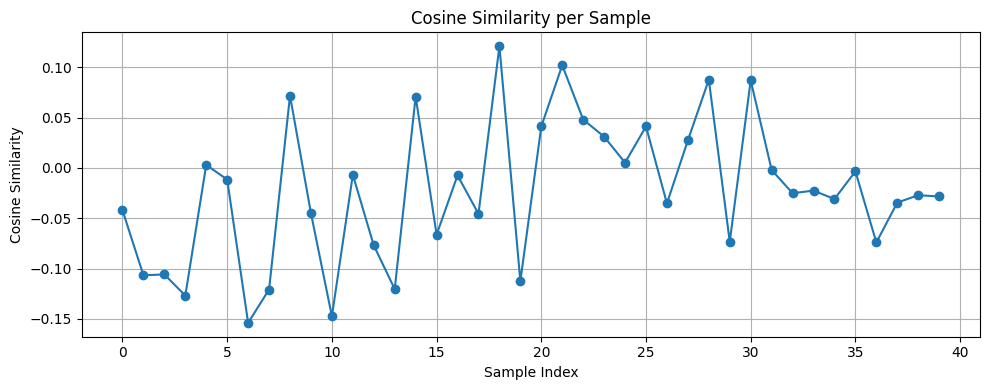

In [ ]:
evaluate_model_with_cosine(model, test_ds,
    gloss_dir="/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/SBERT_GLOSS_EMBEDS_FINAL_V3",
    max_batches=10,
    plot_similarities=True
)


In [ ]:
qmodel.save('/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/Modella.keras')

Text(0.5, 1.0, 'Model Loss')

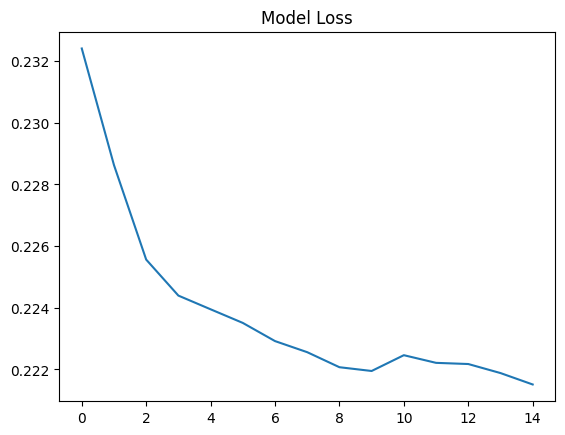

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history['loss'])
plt.title('Model Loss')

In [ ]:
save_path = '/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/modeller_K.keras'
# model.save(save_path)


In [ ]:
import tensorflow as tf
model = tf.keras.models.load_model(save_path)

TypeError: Could not locate class 'GumbelGNNSeqModel'. Make sure custom classes are decorated with `@keras.saving.register_keras_serializable()`. Full object config: {'module': None, 'class_name': 'GumbelGNNSeqModel', 'config': {'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}}, 'registered_name': 'GumbelGNNSeqModel', 'build_config': {'input_shape': [4, 15, 25, 2]}}

In [ ]:
for batch in test_ds.take(1):
    print(type(batch))
    print(batch)


<class 'tuple'>
((<tf.Tensor: shape=(4, 15, 25, 2), dtype=float32, numpy=
array([[[[0.55005664, 0.28061354],
         [0.5611803 , 0.24196039],
         [0.5689802 , 0.24229454],
         ...,
         [0.48760298, 1.0600429 ],
         [0.        , 0.        ],
         [0.        , 0.        ]],

        [[0.5501088 , 0.28316313],
         [0.5610372 , 0.24364805],
         [0.56881696, 0.24430542],
         ...,
         [0.48272574, 1.0422381 ],
         [0.        , 0.        ],
         [0.        , 0.        ]],

        [[0.55114615, 0.28354162],
         [0.5617601 , 0.24433625],
         [0.5694136 , 0.2451325 ],
         ...,
         [0.47746146, 1.0320452 ],
         [0.        , 0.        ],
         [0.        , 0.        ]],

        ...,

        [[0.54241216, 0.3009783 ],
         [0.55612874, 0.25982755],
         [0.5637768 , 0.26091868],
         ...,
         [0.5264194 , 0.5345533 ],
         [0.61943865, 0.69002485],
         [0.6373852 , 0.6888967 ]],

        

In [ ]:
# One batch
(nodes, edges), targets = next(iter())

# Forward pass
predicted = model((nodes, edges))

print("Predicted:", predicted.shape)
print("Target:", targets.shape)


NameError: name 'dataset' is not defined

In [ ]:
test_ds.shape

AttributeError: '_BatchDataset' object has no attribute 'shape'

In [ ]:
# Load one batch from the dataset
for (node_batch, edge_batch), gloss_batch in test_ds.take(1):
    print("📦 Input shapes:")
    print("Nodes:", node_batch.shape)
    print("Edges:", edge_batch.shape)
    print("Ground truth gloss:", gloss_batch.shape)

    # Run model in inference mode
    pred = model(node_batch, edge_batch, training=False)
    print("🧠 Predicted gloss shape:", pred.shape)


📦 Input shapes:
Nodes: (4, 15, 25, 2)
Edges: (4, 15, 30, 2)
Ground truth gloss: (4, 12, 100)
🔥 Input to GRU: (4, 12, 32)
🧠 Predicted gloss shape: (4, 12, 100)


In [ ]:
for (node_batch, edge_batch), gloss_batch in test_ds.take(1):
    print("📦 Input shapes:")
    print("Nodes:", node_batch.shape)
    print("Edges:", edge_batch.shape)
    print("Ground truth gloss:", gloss_batch)

📦 Input shapes:
Nodes: (4, 15, 25, 2)
Edges: (4, 15, 30, 2)
Ground truth gloss: tf.Tensor(
[[[-1.4848946e-01  2.9362163e-01  6.0794115e-02 ... -1.6976131e-02
    8.2536498e-03 -7.6785625e-08]
  [-1.4848946e-01  2.9362163e-01  6.0794115e-02 ... -1.6976131e-02
    8.2536498e-03 -7.6785625e-08]
  [-1.4848946e-01  2.9362163e-01  6.0794115e-02 ... -1.6976131e-02
    8.2536498e-03 -7.6785625e-08]
  ...
  [-1.4848946e-01  2.9362163e-01  6.0794115e-02 ... -1.6976131e-02
    8.2536498e-03 -7.6785625e-08]
  [-1.4848946e-01  2.9362163e-01  6.0794115e-02 ... -1.6976131e-02
    8.2536498e-03 -7.6785625e-08]
  [-1.4848946e-01  2.9362163e-01  6.0794115e-02 ... -1.6976131e-02
    8.2536498e-03 -7.6785625e-08]]

 [[-4.0432226e-02 -3.0613130e-01 -1.7307496e-01 ... -2.3403959e-03
    1.8888768e-02 -7.6785462e-08]
  [-4.0432226e-02 -3.0613130e-01 -1.7307496e-01 ... -2.3403959e-03
    1.8888768e-02 -7.6785462e-08]
  [-4.0432226e-02 -3.0613130e-01 -1.7307496e-01 ... -2.3403959e-03
    1.8888768e-02 -7.67854

In [ ]:
pred

<tf.Tensor: shape=(4, 15, 190), dtype=float32, numpy=
array([[[-3.7130942e-03, -3.9057762e-03,  3.2961201e-03, ...,
          2.5764778e-03,  1.9127908e-03,  2.9102317e-03],
        [-3.2882115e-03, -5.0020418e-03,  2.8218552e-03, ...,
          9.0822438e-04,  2.4524797e-03,  7.6698842e-03],
        [-2.3619952e-03, -7.8888694e-03,  2.7172673e-03, ...,
         -3.1126654e-03,  3.8063112e-03,  1.2422376e-02],
        ...,
        [-3.1768074e-03, -3.6065336e-02,  5.7977280e-03, ...,
         -4.0137567e-02,  2.4491066e-02,  3.9799869e-02],
        [-4.7357813e-03, -3.7569232e-02,  5.1184427e-03, ...,
         -3.9690319e-02,  2.6155943e-02,  3.9057348e-02],
        [-5.4638227e-03, -3.8242038e-02,  4.8974459e-03, ...,
         -3.9133944e-02,  2.6499916e-02,  3.8891602e-02]],

       [[-3.7553268e-03, -4.0804138e-03,  3.7236875e-03, ...,
          4.5534531e-03,  1.7481941e-03,  1.0907291e-03],
        [-3.0088811e-03, -4.1399696e-03,  2.7719280e-03, ...,
          2.9477328e-03,  1.5

In [ ]:
import joblib
import numpy as np
import os
from sklearn.metrics.pairwise import cosine_similarity

# --- Load all embeddings from training ---
embed_dir = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/SBERT_GLOSS_EMBEDS_FINAL"

gloss_db = []
for file in os.listdir(embed_dir):
    if file.endswith('.pkl') and not file.startswith('token'):
        data = joblib.load(os.path.join(embed_dir, file))
        emb = data['embedding']  # shape: (12, 100)
        mean_emb = np.mean(emb, axis=0)  # [100]
        gloss_db.append((mean_emb, data['sentence'], data['gloss']))

# --- Prepare arrays ---
train_embs = np.stack([x[0] for x in gloss_db])
train_sentences = [x[1] for x in gloss_db]
train_glosses = [x[2] for x in gloss_db]

# --- Decoder function ---
def decode_embedding(pred):
    pred_mean = np.mean(pred, axis=0, keepdims=True)  # shape: (1, 100)
    sims = cosine_similarity(pred_mean, train_embs)[0]  # shape: (num_train,)
    best_idx = np.argmax(sims)
    return {
        "nearest_sentence": train_sentences[best_idx],
        "nearest_gloss": train_glosses[best_idx],
        "similarity": sims[best_idx]
    }

# --- Example usage ---
# pred_emb = model output of shape (12, 100)
# decoded = decode_embedding(pred_emb)
# print(decoded)


In [ ]:
decode_embedding(pred[0].numpy())

{'nearest_sentence': 'how can i help you',
 'nearest_gloss': 'HOW I HELP YOU',
 'similarity': np.float32(0.3313774)}

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Assuming pred shape: [B, T, 190]
pred_example = pred[0].numpy()  # [T, 190]
decoded_ids = []

for pred_vec in pred_example:
    sims = cosine_similarity([pred_vec], token_embeddings)  # [1, N]
    best_match_idx = np.argmax(sims)
    token_id = token_ids[best_match_idx]
    decoded_ids.append(token_id)


In [ ]:
import pandas as pd

# Assuming sentence_glosses is your DataFrame
with open("glosses.txt", "w") as f:
    for gloss in sentence_glosses['SIGN GLOSSES']:
        f.write(gloss.strip() + "\n")


In [ ]:
import sentencepiece as spm

spm.SentencePieceTrainer.train(
    input='glosses.txt',
    model_prefix='gloss_tokenizer',
    vocab_size=190,  # or adjust based on your dataset size
    model_type='bpe'  # or 'unigram', 'word', etc.
)


In [ ]:
import numpy as np
import joblib
from sklearn.metrics.pairwise import cosine_similarity

def decode_predicted_embeddings(pred_embeds, token_embed_path, top_k=1):
    """
    Decode predicted gloss embeddings back to gloss tokens.

    Args:
        pred_embeds: np.ndarray of shape (T, embed_dim)
        token_embed_path: path to token_embedding_matrix.pkl
        top_k: number of closest tokens to return per timestep (optional)

    Returns:
        List of decoded gloss tokens (strings)
    """
    # Load saved token embeddings and gloss vocab
    data = joblib.load(token_embed_path)
    token_matrix = data['token_embeddings']    # (vocab_size, embed_dim)
    token_list = data['tokens']                # list of gloss strings

    decoded_tokens = []

    for t_embed in pred_embeds:
        # Compute cosine similarity between predicted vector and all token vectors
        sims = cosine_similarity([t_embed], token_matrix)[0]  # shape: (vocab_size,)
        best_idx = np.argsort(sims)[-top_k:][::-1]             # top-k indices

        # You can return multiple if needed, here just best match
        best_token = token_list[best_idx[0]]
        decoded_tokens.append(best_token)

    return decoded_tokens


In [ ]:
# Let's say `pred` is your model output: shape [1, T, 190]
pred_sequence = pred[0].numpy()  # remove batch dimension -> shape: (T, 190)

decoded = decode_predicted_embeddings(
    pred_embeds=pred_sequence,
    token_embed_path="/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/GUMBEL_GLOSS_EMBEDS_FINAL/token_embedding_matrix.pkl"
)

print("🗣️ Decoded gloss:", " ".join(decoded))


🗣️ Decoded gloss: IR AG AG AG AG AS AS AS AS AS AS AS AS AS AS


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

from pathlib import Path

input_dir = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/ISL_CSLRT_Corpus/GUMBEL_READY_GRAPHS/He is going into the room/2"
output_dir = "/content/drive/MyDrive/Sign Language Detection Anshuman Rath/MAJOR/GRAPH_VISUALIZATIONS/"
os.makedirs(output_dir, exist_ok=True)

def visualize_graph(npz_path, save_path):
    data = np.load(npz_path, allow_pickle=True)
    nodes = data['nodes']
    edges = data['edges']

    # Build ID to index mapping
    id_to_idx = {node['id']: idx for idx, node in enumerate(nodes)}
    coords = np.array([[node['x'], node['y']] for node in nodes])

    G = nx.Graph()
    for idx, (x, y) in enumerate(coords):
        G.add_node(idx, pos=(x, -y))  # Invert y for better image orientation

    for edge in edges:
        u, v = edge
        if u in id_to_idx and v in id_to_idx:
            G.add_edge(id_to_idx[u], id_to_idx[v])

    pos = nx.get_node_attributes(G, 'pos')
    plt.figure(figsize=(6, 6))
    nx.draw(G, pos, with_labels=False, node_size=50, node_color='skyblue', edge_color='gray')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

# Process all .npz files
for fname in sorted(os.listdir(input_dir)):
    if fname.endswith('.npz'):
        in_path = os.path.join(input_dir, fname)
        out_path = os.path.join(output_dir, fname.replace('.npz', '.png'))
        visualize_graph(in_path, out_path)

print("✅ Visualization complete and saved.")


<ipython-input-1-0e09d7615ff0>:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


✅ Visualization complete and saved.
